# Predicting House Prices

### The Goal of this analysis is to predict House prices based on the given features.

Dataset and description can be found on Kaggle: https://www.kaggle.com/c/house-prices-advanced-regression-techniques

In [1]:
#Load essential libraries
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
import math
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

matplotlib.rc('axes', labelsize=14)

In [2]:
#Load data
train_data=pd.read_csv('train.csv')
test_data=pd.read_csv('test.csv')
print('Train shape: ', train_data.shape)
print('Test shape: ', test_data.shape)

Train shape:  (1460, 81)
Test shape:  (1459, 80)


In [3]:
#Get some data insights
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
#Split features into categorical and numerical
cat_features=[feature for feature in train_data.columns if train_data[feature].dtype =='O']
num_features=[feature for feature in train_data.columns if train_data[feature].dtype !='O' and feature not in ['Id', 'SalePrice']]

In [6]:
#Compute feature correlation with the target variable
correlations=pd.DataFrame()
correlations['Feature']=num_features
corr=[]
    
for f in num_features:
    corr.append(train_data[f].corr(train_data['SalePrice'],'spearman'))
        
correlations['Correlation']=corr
correlations.sort_values(['Correlation'],ascending=False, ignore_index=True)

,Feature,Correlation
0,OverallQual,0.809829
1,GrLivArea,0.731310
2,GarageCars,0.690711
3,YearBuilt,0.652682
4,GarageArea,0.649379
5,FullBath,0.635957
6,TotalBsmtSF,0.602725
7,GarageYrBlt,0.593788
8,1stFlrSF,0.575408
9,YearRemodAdd,0.571159


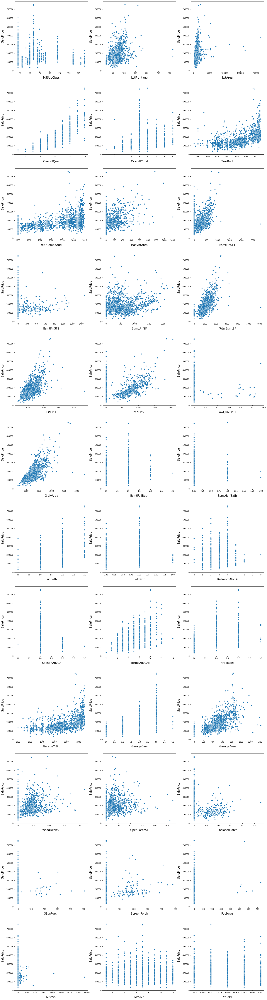

In [7]:
#Scatter plot of numerical features vs target variable
fig=plt.figure(figsize=(10,120))
plt.subplots_adjust(right=2)
plt.subplots_adjust(top=2)
for i, f in enumerate(num_features, start=1):
    plt.subplot(len(num_features),3,i)
    sns.scatterplot(x=f, y='SalePrice', data=train_data)
    plt.xlabel('{}'.format(f), size=15,labelpad=12.5)
    plt.ylabel('SalePrice', size=15, labelpad=12.5)
plt.show()

### Data treatment: Outliers

As stated in the Ames data documentation (http://jse.amstat.org/v19n3/decock/DataDocumentation.txt), data is subject to outliers. In general it is not advised to remove observations containing outliers as the data that the model will be applied could also contain outliers. In this case only the most extreme outliers that do not make any sese will be discarded.


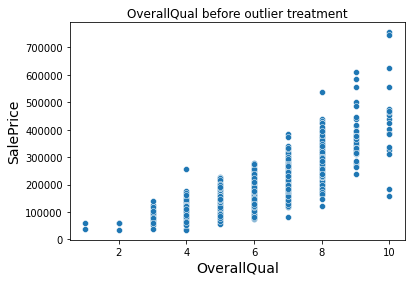

In [8]:
sns.scatterplot(x='OverallQual', y='SalePrice', data=train_data)
plt.title('OverallQual before outlier treatment')
plt.show()

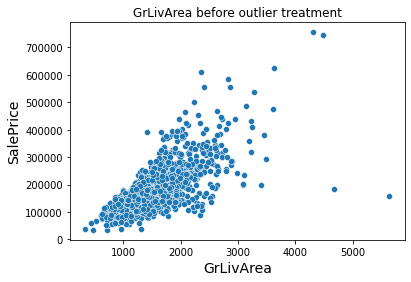

In [9]:
sns.scatterplot(x='GrLivArea', y='SalePrice', data=train_data)
plt.title('GrLivArea before outlier treatment')
plt.show()

In [10]:
#Indexes to drop (3 rows)
outliers = train_data.index[(train_data['OverallQual']<5) & (train_data['SalePrice']>200000)]
outliers = outliers.append(train_data.index[(train_data['GrLivArea']>4000) & (train_data['SalePrice']<200000)])

In [11]:
#Drop outliers and reset index
train_data.drop(outliers, inplace=True)
train_data.reset_index(drop=True, inplace= True)

### Data treatment: Missing values

Check missing values in both datasets

We have features with missing data in the test set that do not have missing values in the train set. In order to treat them the 2 sets will be combined.

In [12]:
combined_missing=pd.DataFrame()

combined_missing['train']=train_data.isnull().mean()
combined_missing['test']=test_data.isnull().mean()

combined_missing[(combined_missing['train']>0) | (combined_missing['test']>0)].sort_values(by='train' , ascending=False)

,train,test
PoolQC,0.995882,0.997944
MiscFeature,0.962938,0.965045
Alley,0.937543,0.926662
Fence,0.807138,0.801234
FireplaceQu,0.473576,0.500343
LotFrontage,0.177076,0.155586
GarageType,0.055594,0.052090
GarageCond,0.055594,0.053461
GarageYrBlt,0.055594,0.053461
GarageFinish,0.055594,0.053461


Drop features with over 90% missing values

In [13]:
train_data.drop(['PoolQC', 'MiscFeature', 'Alley'], axis=1, inplace=True)
test_data.drop(['PoolQC', 'MiscFeature', 'Alley'], axis=1, inplace=True)

Assess feature concentration (only for categorical) via the Herfindal Index

In [14]:
cat_features=[feature for feature in train_data.columns if train_data[feature].dtype =='O']
concentration = pd.DataFrame(index=cat_features)
herfindal = []

for f in cat_features:
    herfindal.append(((train_data[f].value_counts() / train_data[f].count())**2).sum())
    
concentration['Concentration'] = herfindal
concentration.sort_values(by='Concentration', ascending=False)

,Concentration
Utilities,0.998628
Street,0.991798
Condition2,0.980897
RoofMatl,0.967404
Heating,0.956742
GarageCond,0.925166
GarageQual,0.904935
LandSlope,0.899105
CentralAir,0.878098
Functional,0.869900


Drop features with concentration over 90%

In [15]:
train_data.drop(['Utilities', 'Street', 'Condition2', 'RoofMatl', 'Heating', 'GarageCond', 'GarageQual'], axis=1, inplace=True)
test_data.drop(['Utilities', 'Street', 'Condition2', 'RoofMatl', 'Heating', 'GarageCond', 'GarageQual'], axis=1, inplace=True)

Combine training set and testing set to replace missing values

In [16]:
combined = pd.concat([train_data.iloc[:,:-1], test_data]).reset_index(drop=True)
combined.shape

(2916, 70)

In [17]:
missing_stats = combined.isnull().sum()
missing_stats.drop(missing_stats[missing_stats==0].index, inplace=True)
missing_stats.sort_values(ascending=False, inplace=True)
missing_stats

Fence           2345
FireplaceQu     1420
LotFrontage      485
GarageYrBlt      159
GarageFinish     159
GarageType       157
BsmtCond          82
BsmtExposure      82
BsmtQual          81
BsmtFinType2      80
BsmtFinType1      79
MasVnrType        24
MasVnrArea        23
MSZoning           4
Functional         2
BsmtFullBath       2
BsmtHalfBath       2
GarageCars         1
GarageArea         1
TotalBsmtSF        1
KitchenQual        1
Electrical         1
BsmtUnfSF          1
BsmtFinSF2         1
BsmtFinSF1         1
Exterior2nd        1
Exterior1st        1
SaleType           1
dtype: int64

In [18]:
#Replace missing values of categorical variables based on data documentation

combined['Fence'].fillna('None', inplace=True) #NA = No Fence
combined['FireplaceQu'].fillna('None', inplace=True) #NA = No Fireplace
combined['GarageType'].fillna('None', inplace=True) #NA = No Garage
combined['GarageFinish'].fillna('None', inplace=True) #NA = No Garage
combined['BsmtFinType1'].fillna('None', inplace=True) #NA = No Basement
combined['BsmtFinType2'].fillna('None', inplace=True) #NA = No Basement
combined['BsmtExposure'].fillna('None', inplace=True) #NA = No Basement
combined['BsmtCond'].fillna('None', inplace=True) #NA = No Basement
combined['BsmtQual'].fillna('None', inplace=True) #NA = No Basement
combined['MasVnrType'].fillna('None', inplace=True) #NA = No Basement
combined['Functional'].fillna('Typ', inplace=True) #Typical

In [19]:
#Replace missing values of categorical variables with the most frequent value (mode)

combined['Electrical'].fillna(combined['Electrical'].value_counts().index[0], inplace=True) #Most frequent value
combined['MSZoning'].fillna(combined['MSZoning'].value_counts().index[0], inplace=True) #Most frequent value
combined['SaleType'].fillna(combined['SaleType'].value_counts().index[0], inplace=True) #Most frequent value
combined['KitchenQual'].fillna(combined['KitchenQual'].value_counts().index[0], inplace=True) #Most frequent value
combined['Exterior1st'].fillna(combined['Exterior1st'].value_counts().index[0], inplace=True) #Most frequent value
combined['Exterior2nd'].fillna(combined['Exterior2nd'].value_counts().index[0], inplace=True) #Most frequent value

In [20]:
# Replace missing values of LotFrontage (Linear feet of street connected to property) to the median value of its corresponding neigbhborhood

combined['LotFrontage'] = combined['LotFrontage'].fillna(combined.groupby('Neighborhood')['LotFrontage'].transform('median'))

In [21]:
combined['GarageYrBlt'] = combined['GarageYrBlt'].fillna(0)
combined['GarageCars'] = combined['GarageCars'].fillna(0)
combined['GarageArea'] = combined['GarageArea'].fillna(0)

combined['BsmtHalfBath'] = combined['BsmtHalfBath'].fillna(0)
combined['BsmtFullBath'] = combined['BsmtFullBath'].fillna(0)
combined['BsmtFinSF1'] = combined['BsmtFinSF1'].fillna(0)
combined['BsmtFinSF2'] = combined['BsmtFinSF2'].fillna(0)
combined['TotalBsmtSF'] = combined['TotalBsmtSF'].fillna(0)
combined['BsmtUnfSF'] = combined['BsmtUnfSF'].fillna(0)

combined['MasVnrArea'] = combined['MasVnrArea'].fillna(0)

In [22]:
#Transfomr numerical variables representing categories to string

combined['MSSubClass'] = combined['MSSubClass'].astype(str)
combined['YrSold'] = combined['YrSold'].astype(str)
combined['MoSold'] = combined['MoSold'].astype(str)

In [23]:
print('Number of features with missing values: ', combined.isnull().any().sum())

Number of features with missing values:  0


In [24]:
#Add additional features

combined['hasgarage'] = combined['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
combined['hasbsmt'] = combined['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
combined['TotalSF']=combined['TotalBsmtSF'] + combined['1stFlrSF'] + combined['2ndFlrSF']
combined['TotalBathrooms'] = (combined['FullBath'] + (1/2 * combined['HalfBath']) +combined['BsmtFullBath'] + (1/2 * combined['BsmtHalfBath']))
combined['TotalPorchSF'] = (combined['OpenPorchSF'] + combined['3SsnPorch'] +combined['EnclosedPorch'] + combined['ScreenPorch'] +combined['WoodDeckSF'])

#### Analyse the target variable

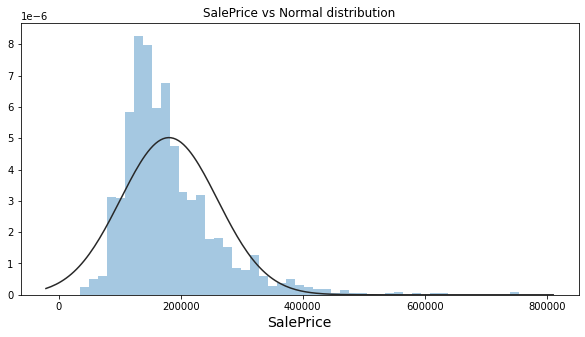

Skewness: 1.883749
Kurtosis: 6.532570


In [25]:
plt.figure(figsize = (10,5))

sns.distplot(train_data['SalePrice'],kde=False, fit=stats.norm)
plt.title('SalePrice vs Normal distribution')
plt.show()

# Skew and kurt
print("Skewness: %f" % train_data['SalePrice'].skew())
print("Kurtosis: %f" % train_data['SalePrice'].kurt())

It can be seen that the distribution is positively skewed and has a high peakness than the normal distribution. In linear regression, is not a mandatory condition for the dependent variable to be normaly distributed (this applies for the residuals) but it is a frequent practice to normalize the dependent variable as it may improve performance.

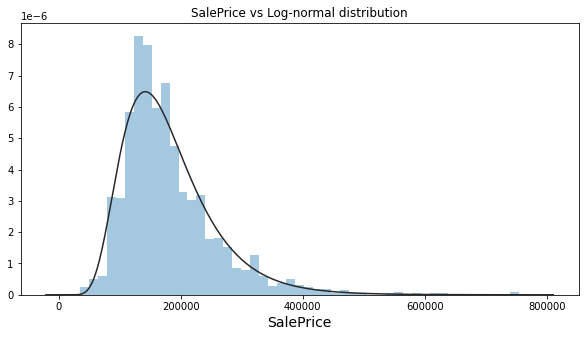

In [26]:
plt.figure(figsize = (10,5))

sns.distplot(train_data['SalePrice'], kde=False, fit=stats.lognorm)
plt.title('SalePrice vs Log-normal distribution')
plt.show()

It can be seen that the distribution of the dependent variable resembles the log-normal distribution. Let's apply the log transformation.

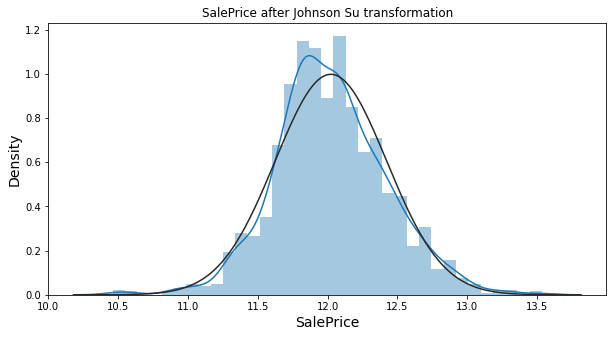

Skewness after Log-normal transformation: 0.123045


In [27]:
train_data['SalePrice'] = np.log1p(train_data['SalePrice'])

plt.figure(figsize = (10,5))

sns.distplot(train_data['SalePrice'], fit=stats.norm)
plt.title('SalePrice after Johnson Su transformation')
plt.show()

print("Skewness after Log-normal transformation: %f" % train_data['SalePrice'].skew())

#### Analyse numeric features skewness

In [28]:
num_features=[f for f in combined.columns if combined[f].dtype !='O' and f not in ['Id']]
skew = combined[num_features].skew().sort_values(ascending=False)
skew

MiscVal           21.947201
PoolArea          17.694707
LotArea           13.269377
LowQualFinSF      12.088646
3SsnPorch         11.375940
KitchenAbvGr       4.301911
BsmtFinSF2         4.145816
EnclosedPorch      4.003630
ScreenPorch        3.946335
BsmtHalfBath       3.931219
MasVnrArea         2.622532
OpenPorchSF        2.533111
WoodDeckSF         1.847119
TotalPorchSF       1.381552
1stFlrSF           1.259407
LotFrontage        1.104060
GrLivArea          1.069506
TotalSF            1.010260
BsmtFinSF1         0.982508
BsmtUnfSF          0.919635
2ndFlrSF           0.861482
TotRmsAbvGrd       0.749234
Fireplaces         0.725993
HalfBath           0.696480
TotalBsmtSF        0.672788
BsmtFullBath       0.623687
OverallCond        0.569936
TotalBathrooms     0.486358
BedroomAbvGr       0.326180
GarageArea         0.217205
OverallQual        0.189464
FullBath           0.164976
GarageCars        -0.219076
YearRemodAdd      -0.449893
YearBuilt         -0.600024
GarageYrBlt       -3

Apply Log transformation to skewed features

In [29]:
skew_features = skew[skew>0.5].index

for f in skew_features:
    combined[f] = np.log1p(combined[f])

    
combined[num_features].skew().sort_values(ascending=False)

PoolArea          15.628605
3SsnPorch          8.825087
LowQualFinSF       8.557516
MiscVal            5.213697
BsmtHalfBath       3.774372
KitchenAbvGr       3.519960
ScreenPorch        2.945417
BsmtFinSF2         2.461914
EnclosedPorch      1.960395
HalfBath           0.582405
MasVnrArea         0.538168
TotalBathrooms     0.486358
BsmtFullBath       0.426450
BedroomAbvGr       0.326180
2ndFlrSF           0.306183
Fireplaces         0.236384
GarageArea         0.217205
OverallQual        0.189464
FullBath           0.164976
WoodDeckSF         0.160349
1stFlrSF           0.030987
TotRmsAbvGrd       0.028173
GrLivArea         -0.021602
OpenPorchSF       -0.040944
GarageCars        -0.219076
TotalSF           -0.429121
YearRemodAdd      -0.449893
LotArea           -0.547687
YearBuilt         -0.600024
BsmtFinSF1        -0.616300
OverallCond       -0.746812
LotFrontage       -1.068481
TotalPorchSF      -1.357530
BsmtUnfSF         -2.154944
GarageYrBlt       -3.905853
hasgarage         -3

Create dummy variables for categorical features

In [30]:
combined = pd.get_dummies(combined)
combined.shape

(2916, 288)

Prepare data for modelling

In [31]:
y = train_data['SalePrice']
X_train = combined.iloc[:len(y) ,:]
X_test = combined.iloc[len(y): ,:]

print(X_train.shape, X_test.shape, y.shape)

(1457, 288) (1459, 288) (1457,)


Define a validation set which will be used on some algorithms for performance assessment and early stopping.
I will define a validation set based on stratified sampling given the OverallQual variable as it is the most correlated with the target variable SalePrice.

In [32]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(X_train, X_train["OverallQual"]):
    X_strat_train, y_train = X_train.loc[train_index], y.loc[train_index]
    X_strat_valid, y_valid = X_train.loc[test_index], y.loc[test_index]

In [33]:
def proportions(data):
    return data["OverallQual"].value_counts() / len(data)

proportions = pd.DataFrame({
    "Initial train": proportions(X_train),
    "New train": proportions(X_strat_train),
    "Valid": proportions(X_strat_valid),
})

proportions

,Initial train,New train,Valid
1,0.001373,0.001717,NaN
2,0.002059,0.001717,0.003425
3,0.013727,0.013734,0.013699
4,0.078929,0.078970,0.078767
5,0.272478,0.272961,0.270548
6,0.256692,0.256652,0.256849
7,0.218943,0.218884,0.219178
8,0.115305,0.115021,0.116438
9,0.029513,0.029185,0.030822
10,0.010981,0.011159,0.010274


#### Data modelling

The model performance metric is the Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

Let's define this metric.

In [531]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error

#Cross validation splits
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)

#Error metrics
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X, y):
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=kfolds))
    return (rmse)

In [35]:
#Scale variables
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [36]:
X_strat_train_scaled = scaler.fit_transform(X_strat_train)
X_strat_valid_scaled = scaler.transform(X_strat_valid)

#### Linear regression

In [43]:
#Start with a simple linear regression
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_cv_rmse=cv_rmse(lin_reg, X_train_scaled, y)

print('CV score: ', lin_cv_rmse.mean())
print('CV std: ', lin_cv_rmse.std())

CV score:  106741458.1754469
CV std:  217391456.20281133


Looks like the model did very poorly. Let's plot the learning curves to see what happened.

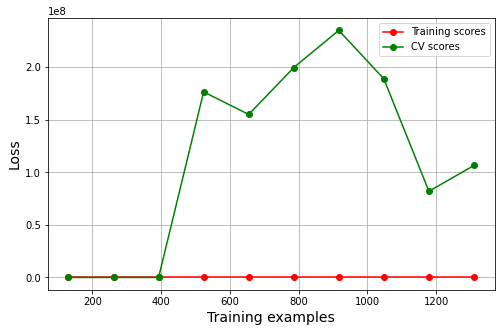

In [44]:
from sklearn.model_selection import learning_curve

def learning_curves(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y,
                                                            train_sizes=np.linspace(.1, 1.0, 10),
                                                            scoring="neg_mean_squared_error", cv=kfolds)
    
    train_scores_mean = np.mean(np.sqrt(-train_scores), axis=1)
    test_scores_mean = np.mean(np.sqrt(-test_scores), axis=1)
    
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training scores")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="CV scores")
    ax = plt.gca()
    ax.grid()
    ax.set_xlabel("Training examples")
    ax.set_ylabel("Loss")
    ax.legend(loc="best")
    plt.show()

learning_curves(lin_reg, X_train_scaled, y)

Looks like the model is overfitting the data. Let's try some regularization models.

#### Ridge regression

In [153]:
#Train ridge regression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV

ridge_cv = RidgeCV(alphas = [0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 3, 6, 10, 20, 30, 40, 50, 60], cv=kfolds)

ridge_cv.fit(X_train_scaled,y)
alpha = ridge_cv.alpha_
print('best alpha',alpha)

best alpha 10.0


In [430]:
#Find the best alpha between 6 and 20 for Ridge

#make a list of numbers between 6 and 20 by 0.5
new_alphas=[n for n in np.arange(6, 20, .5)]

ridge_cv = RidgeCV(alphas = new_alphas, cv=kfolds)

ridge_cv.fit(X_train_scaled,y)
alpha = ridge_cv.alpha_
print('best alpha',alpha)

#Evaluate the model
best_ridge = Ridge(alpha = alpha)
best_ridge.fit(X_train_scaled,y)
y_ridge = best_ridge.predict(X_train_scaled)

cv_rmse_ridge=cv_rmse(best_ridge, X_train_scaled, y)

print('CV score: ', cv_rmse_ridge.mean())
print('CV std: ', cv_rmse_ridge.std())
print("\n")
print('RMSE: ', rmse(y, y_ridge))

best alpha 13.5
CV score:  0.11072260194579035
CV std:  0.01106885854303721


RMSE:  0.09642005911077968


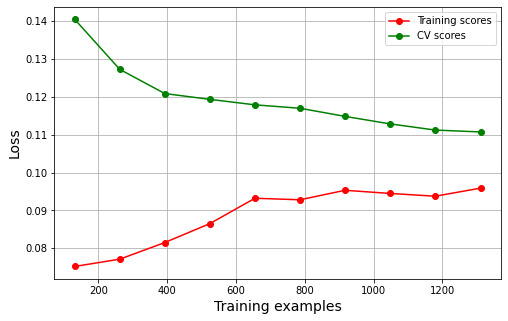

In [155]:
learning_curves(best_ridge, X_train_scaled, y)

#### Lasso regression

In [431]:
#Train lasso regression
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV

lasso_cv = LassoCV(alphas = [0.00001, 0.0001, 0.001 ,0.01] ,max_iter=1e7, cv=kfolds)

lasso_cv.fit(X_train_scaled,y)
alpha = lasso_cv.alpha_
print('best alpha',alpha)

#Evaluate the model
best_lasso = Lasso(alpha = alpha)
best_lasso.fit(X_train_scaled,y)
y_lasso = best_lasso.predict(X_train_scaled)

cv_rmse_lasso=cv_rmse(best_lasso, X_train_scaled, y)

print('CV score: ', cv_rmse_lasso.mean())
print('CV std: ', cv_rmse_lasso.std())
print("\n")
print('RMSE: ', rmse(y, y_lasso))

best alpha 0.001
CV score:  0.11099250476858125
CV std:  0.010275789565139795


RMSE:  0.10275682251824723


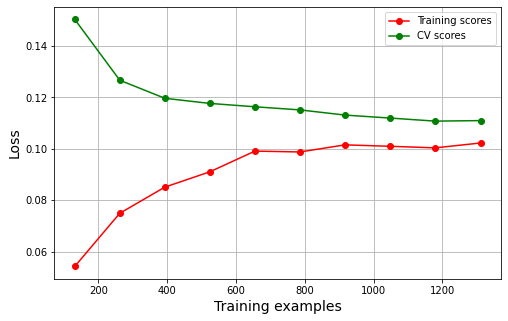

In [157]:
learning_curves(best_lasso, X_train_scaled, y)

#### Elastic net regression

In [743]:
#Train elastic net regression
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import ElasticNet

elastic_cv = ElasticNetCV(alphas = [0.00001, 0.0001, 0.001 ,0.01]
                      ,l1_ratio = [0.1, 0.5, 0.8, 0.85, 0.9, 0.95, 0.99, 1]
                      ,max_iter=1e7
                      ,cv=kfolds
                      ,random_state=42)

elastic_cv.fit(X_train_scaled,y)
alpha = elastic_cv.alpha_

l1_ratio=elastic_cv.l1_ratio_
print('best alpha',alpha)
print('best L1 ratio', l1_ratio)

#Evaluate the model
best_elastic = ElasticNet(alpha = alpha, l1_ratio=l1_ratio,random_state=42)
best_elastic.fit(X_train_scaled,y)
y_elastic = best_elastic.predict(X_train_scaled)

cv_rmse_elastic=cv_rmse(best_elastic, X_train_scaled, y)

print('CV score: ', cv_rmse_elastic.mean())
print('CV std: ', cv_rmse_elastic.std())
print("\n")
print('RMSE: ', rmse(y, y_elastic))

best alpha 0.001
best L1 ratio 0.5
CV score:  0.10868906480519067
CV std:  0.011255815328160279


RMSE:  0.09896402114817873


c:\users\victor\envs\tf\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.002273464777487799, tolerance: 0.0018521567888834685
  positive)


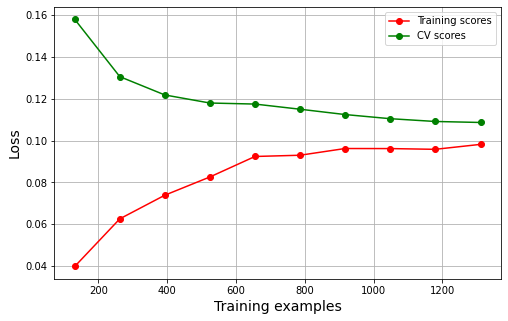

In [159]:
learning_curves(best_elastic, X_train_scaled, y)

#### Support vector regression

In [66]:
#Train linear SVR
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

param_grid = {'C':[1, 5, 10, 20], 'gamma': [0.0001, 0.001, 0.01, 0.1, 1], 'epsilon':[0.0001, 0.001, 0.01, 0.1, 0.5, 1]}

rbf_svr = SVR(kernel='rbf')

grid_rbf_svr = GridSearchCV(rbf_svr, param_grid, cv=kfolds)
grid_rbf_svr.fit(X_train_scaled, y)

grid_rbf_svr.best_estimator_

SVR(C=10, epsilon=0.01, gamma=0.001)

In [747]:
#Evaluate the model
best_svm = SVR(kernel='rbf', C=10, epsilon=0.01, gamma=0.001)
best_svm.fit(X_train_scaled,y)
y_svm = best_svm.predict(X_train_scaled)

cv_rmse_svm=cv_rmse(best_svm, X_train_scaled, y)

print('CV score: ', cv_rmse_svm.mean())
print('CV std: ', cv_rmse_svm.std())
print("\n")
print('RMSE: ', rmse(y, y_svm))

CV score:  0.10964093517944855
CV std:  0.011447903839949543


RMSE:  0.08058423023512808


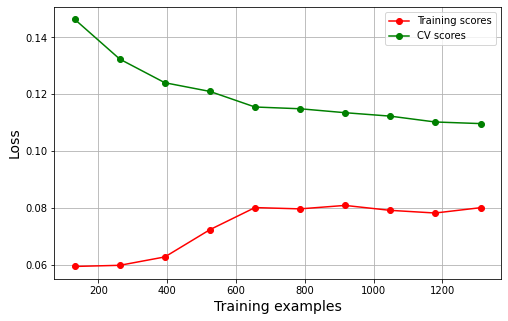

In [63]:
learning_curves(best_svm, X_train_scaled, y)

#### Random Forest

First let's train a Decision Tree with Grid search CV to select the optimum hyperparameters

In [102]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor()

param_grid = {'max_depth': [10, 15, 20], 'min_samples_split':[5, 10, 15, 20], 'min_samples_leaf': [5, 10, 15, 20]}

grid_tree = GridSearchCV(tree, param_grid, cv=kfolds, scoring='neg_root_mean_squared_error')
grid_tree.fit(X_train_scaled, y)

print(grid_tree.best_estimator_)
print(-grid_tree.best_score_)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=15, min_samples_split=5)
0.17153399870205893


In [753]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=1000, max_depth=15, min_samples_split=5, min_samples_leaf=5, random_state=42)
rf.fit(X_train_scaled, y)

y_rf = rf.predict(X_train_scaled)
cv_rmse_rf=cv_rmse(rf, X_train_scaled, y)

print('CV score: ', cv_rmse_rf.mean())
print('CV std: ', cv_rmse_rf.std())
print("\n")
print('RMSE: ', rmse(y, y_rf))

CV score:  0.1378461867636262
CV std:  0.012172993067049342


RMSE:  0.08697832747693553


#### Stochastic Gradient Boosting

In order to implement the Gradient Boosting algorithm I will use the XGBOOST library. This implements Stochastic Gradient Boosting based on Decision Trees. 

XGBOOST has many hyperparameters which are presented on the library's [official page](https://xgboost.readthedocs.io/en/latest/parameter.html).

For the analysis, I will focus on 8 of the most relevant hyperparameters:

* *num_boost_round*: Number of trees to grow
* *max_depth*: Maximum depth of a tree
* *gamma*: Minimum loss reduction required to make a further partition on a leaf node of the tree.
* *subsample*: The proportion of observations taken to grow a tree
* *colsample_bytree*: The proportion of features to grow a tree
* *eta*: This parameter corresponds to the learning rate. It defines the amount of correction to be applied to the residuals of the previous tree.
* *reg_alpha* and *reg_lambda* : L1 and L2 regularisation

In order to determine to appropriate combination of hyperparameters that best fits the data, I will use Grid Search CV, but not in a single run as the number of combinations will get overwealming, but in 4 stages with groups of hyperparameters that don't interect very much with eachother:

1. First tune *max_depth* and *gamma*
2. Second tune *subsample* and *colsample_bytree*
3. Next tune *eta*
4. Finally tune *reg_alpha* and *reg_lambda*

XGBOOST library has it's own built-in CV functionality but it also requires a special validation set if we want to apply Early Stopping. It is not possible to set the CV fold to be used as trigger for Early Stopping. While it is possible to use XGBOOST's CV functionality, putting aside a validation set for Early Stopping would decrease the number of training observations, so in this case I will manually implement Grid Search CV using the CV fold for Early Stopping.

In [624]:
import xgboost as xgb

#First build a function that does K-fold CV over 1 grid combination with Early Stopping
def xgboost_cv(X, y, regressor, kfolds=kfolds):
    rmse_score, best_iterations = [], []
    
    for train_index, valid_index in kfolds.split(X):
        X_train, X_valid = X[train_index], X[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        
        regressor.fit(X_train, y_train,
                      early_stopping_rounds=10,
                      eval_set=[(X_valid, y_valid)],
                      eval_metric='rmse',
                     )
        
        y_pred_valid=regressor.predict(X_valid)
        rmse_score.append(rmse(y_valid, y_pred_valid))
        best_iterations.append(regressor.best_iteration)
    return np.average(rmse_score), np.std(rmse_score), np.average(best_iterations)

#Second, build a function that applies xgboost_cv over a grid dictionary
def grid_cv(X, y, param_grid):
    results = []

    for i, param in enumerate(param_grid):
        xgb_reg = xgb.XGBRegressor(
                  booster='gbtree',
                  objective='reg:squarederror',
                  n_estimators=1000,
                  random_state=42,    
                  n_jobs=-1,  
                  **param
                )    

        rmse, std, best_iteration = xgboost_cv(X, y, xgb_reg)    
        results.append([rmse, std, best_iteration, param])
    
    results_df = pd.DataFrame(results, columns=['rmse', 'std', 'best_iter', 'param_dict']).sort_values('rmse')
    results_df
    
    best_params = results_df.iloc[0]['param_dict']
    return best_params, results_df

In [627]:
#Step1: max_depth and gamma

initial_params = {
    'max_depth': 5,
    'min_child_weight': 0,
    'gamma': 0.5,
    'subsample': 0.5,
    'colsample_bytree': 0.5,
    'learning_rate': 0.01
}

depths = list(range(3,8))
gammas = [0, 0.001, 0.01, 0.1, 0.5]

step1 = [{'max_depth': d, 'gamma': g} for d in depths for g in gammas]
# merge into full param dicts
step1_grid = [{**initial_params, **params} for params in step1]

# cv and get best params
#results_step1, results_df = grid_cv(X_train_scaled, y, step1_grid)

print('Best settings stage 1:',"\n", results_step1)
print('CV score: ', results_df['rmse'].iloc[0])
print('CV std: ', results_df['std'].iloc[0])

Best settings stage 1: 
 {'max_depth': 7, 'min_child_weight': 0, 'gamma': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'learning_rate': 0.01}
CV score:  0.11393466071209027
CV std:  0.013339083697716586


In [629]:
#Step2: subsample and colsample_bytree

subsamples = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
colsamples = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

step2 = [{'subsample': s, 'colsample_bytree': c} for s in subsamples for c in colsamples]
# merge into full param dicts
step2_grid = [{**results_step1, **params} for params in step2]

# cv and get best params
#step2_params, results_step2 = grid_cv(X_train_scaled, y, step2_grid)

print('Best settings stage 2:',"\n", step2_params)
print('CV score: ', results_step2['rmse'].iloc[0])
print('CV std: ', results_step2['std'].iloc[0])

Best settings stage 2: 
 {'max_depth': 7, 'min_child_weight': 0, 'gamma': 0.01, 'subsample': 0.4, 'colsample_bytree': 0.4, 'learning_rate': 0.01}
CV score:  0.11278664788091324
CV std:  0.013501504139795737


In [630]:
#Step3: learning_rate

lrates = np.logspace(-3, -1, 5)

step3 = [{'learning_rate': l} for l in lrates]
# merge into full param dicts
step3_grid = [{**step2_params, **params} for params in step3]

# cv and get best params
step3_params, results_step3 = grid_cv(X_train_scaled, y, step3_grid)

print('Best settings stage 3:',"\n", step3_params)
print('CV score: ', results_step3['rmse'].iloc[0])
print('CV std: ', results_step3['std'].iloc[0])

[0]	validation_0-rmse:11.50426
[1]	validation_0-rmse:11.49275
[2]	validation_0-rmse:11.48128
[3]	validation_0-rmse:11.46982
[4]	validation_0-rmse:11.45836
[5]	validation_0-rmse:11.44690
[6]	validation_0-rmse:11.43550
[7]	validation_0-rmse:11.42410
[8]	validation_0-rmse:11.41273
[9]	validation_0-rmse:11.40133
[10]	validation_0-rmse:11.38993
[11]	validation_0-rmse:11.37857
[12]	validation_0-rmse:11.36722
[13]	validation_0-rmse:11.35587
[14]	validation_0-rmse:11.34455
[15]	validation_0-rmse:11.33323
[16]	validation_0-rmse:11.32193
[17]	validation_0-rmse:11.31065
[18]	validation_0-rmse:11.29938
[19]	validation_0-rmse:11.28813
[20]	validation_0-rmse:11.27687
[21]	validation_0-rmse:11.26562
[22]	validation_0-rmse:11.25438
[23]	validation_0-rmse:11.24316
[24]	validation_0-rmse:11.23194
[25]	validation_0-rmse:11.22072
[26]	validation_0-rmse:11.20951
[27]	validation_0-rmse:11.19831
[28]	validation_0-rmse:11.18711
[29]	validation_0-rmse:11.17595
[30]	validation_0-rmse:11.16480
[31]	validation_0-

[256]	validation_0-rmse:8.90927
[257]	validation_0-rmse:8.90035
[258]	validation_0-rmse:8.89148
[259]	validation_0-rmse:8.88260
[260]	validation_0-rmse:8.87374
[261]	validation_0-rmse:8.86486
[262]	validation_0-rmse:8.85601
[263]	validation_0-rmse:8.84716
[264]	validation_0-rmse:8.83834
[265]	validation_0-rmse:8.82952
[266]	validation_0-rmse:8.82072
[267]	validation_0-rmse:8.81195
[268]	validation_0-rmse:8.80315
[269]	validation_0-rmse:8.79435
[270]	validation_0-rmse:8.78558
[271]	validation_0-rmse:8.77681
[272]	validation_0-rmse:8.76807
[273]	validation_0-rmse:8.75933
[274]	validation_0-rmse:8.75059
[275]	validation_0-rmse:8.74184
[276]	validation_0-rmse:8.73312
[277]	validation_0-rmse:8.72442
[278]	validation_0-rmse:8.71575
[279]	validation_0-rmse:8.70706
[280]	validation_0-rmse:8.69839
[281]	validation_0-rmse:8.68970
[282]	validation_0-rmse:8.68102
[283]	validation_0-rmse:8.67237
[284]	validation_0-rmse:8.66371
[285]	validation_0-rmse:8.65506
[286]	validation_0-rmse:8.64642
[287]	va

[513]	validation_0-rmse:6.89416
[514]	validation_0-rmse:6.88729
[515]	validation_0-rmse:6.88042
[516]	validation_0-rmse:6.87357
[517]	validation_0-rmse:6.86671
[518]	validation_0-rmse:6.85985
[519]	validation_0-rmse:6.85301
[520]	validation_0-rmse:6.84617
[521]	validation_0-rmse:6.83935
[522]	validation_0-rmse:6.83253
[523]	validation_0-rmse:6.82573
[524]	validation_0-rmse:6.81890
[525]	validation_0-rmse:6.81209
[526]	validation_0-rmse:6.80530
[527]	validation_0-rmse:6.79853
[528]	validation_0-rmse:6.79176
[529]	validation_0-rmse:6.78498
[530]	validation_0-rmse:6.77820
[531]	validation_0-rmse:6.77145
[532]	validation_0-rmse:6.76471
[533]	validation_0-rmse:6.75797
[534]	validation_0-rmse:6.75126
[535]	validation_0-rmse:6.74454
[536]	validation_0-rmse:6.73783
[537]	validation_0-rmse:6.73109
[538]	validation_0-rmse:6.72438
[539]	validation_0-rmse:6.71767
[540]	validation_0-rmse:6.71098
[541]	validation_0-rmse:6.70428
[542]	validation_0-rmse:6.69759
[543]	validation_0-rmse:6.69092
[544]	va

[770]	validation_0-rmse:5.33647
[771]	validation_0-rmse:5.33115
[772]	validation_0-rmse:5.32584
[773]	validation_0-rmse:5.32054
[774]	validation_0-rmse:5.31525
[775]	validation_0-rmse:5.30994
[776]	validation_0-rmse:5.30465
[777]	validation_0-rmse:5.29935
[778]	validation_0-rmse:5.29409
[779]	validation_0-rmse:5.28881
[780]	validation_0-rmse:5.28353
[781]	validation_0-rmse:5.27827
[782]	validation_0-rmse:5.27300
[783]	validation_0-rmse:5.26777
[784]	validation_0-rmse:5.26254
[785]	validation_0-rmse:5.25733
[786]	validation_0-rmse:5.25212
[787]	validation_0-rmse:5.24689
[788]	validation_0-rmse:5.24167
[789]	validation_0-rmse:5.23644
[790]	validation_0-rmse:5.23125
[791]	validation_0-rmse:5.22604
[792]	validation_0-rmse:5.22084
[793]	validation_0-rmse:5.21565
[794]	validation_0-rmse:5.21046
[795]	validation_0-rmse:5.20529
[796]	validation_0-rmse:5.20011
[797]	validation_0-rmse:5.19494
[798]	validation_0-rmse:5.18980
[799]	validation_0-rmse:5.18462
[800]	validation_0-rmse:5.17947
[801]	va

[27]	validation_0-rmse:11.18772
[28]	validation_0-rmse:11.17653
[29]	validation_0-rmse:11.16538
[30]	validation_0-rmse:11.15421
[31]	validation_0-rmse:11.14307
[32]	validation_0-rmse:11.13195
[33]	validation_0-rmse:11.12083
[34]	validation_0-rmse:11.10972
[35]	validation_0-rmse:11.09864
[36]	validation_0-rmse:11.08756
[37]	validation_0-rmse:11.07647
[38]	validation_0-rmse:11.06540
[39]	validation_0-rmse:11.05432
[40]	validation_0-rmse:11.04327
[41]	validation_0-rmse:11.03224
[42]	validation_0-rmse:11.02122
[43]	validation_0-rmse:11.01020
[44]	validation_0-rmse:10.99922
[45]	validation_0-rmse:10.98826
[46]	validation_0-rmse:10.97727
[47]	validation_0-rmse:10.96628
[48]	validation_0-rmse:10.95534
[49]	validation_0-rmse:10.94441
[50]	validation_0-rmse:10.93348
[51]	validation_0-rmse:10.92255
[52]	validation_0-rmse:10.91162
[53]	validation_0-rmse:10.90071
[54]	validation_0-rmse:10.88982
[55]	validation_0-rmse:10.87894
[56]	validation_0-rmse:10.86810
[57]	validation_0-rmse:10.85722
[58]	val

[282]	validation_0-rmse:8.66995
[283]	validation_0-rmse:8.66129
[284]	validation_0-rmse:8.65262
[285]	validation_0-rmse:8.64397
[286]	validation_0-rmse:8.63535
[287]	validation_0-rmse:8.62673
[288]	validation_0-rmse:8.61811
[289]	validation_0-rmse:8.60949
[290]	validation_0-rmse:8.60090
[291]	validation_0-rmse:8.59232
[292]	validation_0-rmse:8.58373
[293]	validation_0-rmse:8.57517
[294]	validation_0-rmse:8.56660
[295]	validation_0-rmse:8.55804
[296]	validation_0-rmse:8.54948
[297]	validation_0-rmse:8.54095
[298]	validation_0-rmse:8.53243
[299]	validation_0-rmse:8.52390
[300]	validation_0-rmse:8.51540
[301]	validation_0-rmse:8.50691
[302]	validation_0-rmse:8.49844
[303]	validation_0-rmse:8.48993
[304]	validation_0-rmse:8.48145
[305]	validation_0-rmse:8.47298
[306]	validation_0-rmse:8.46450
[307]	validation_0-rmse:8.45602
[308]	validation_0-rmse:8.44757
[309]	validation_0-rmse:8.43913
[310]	validation_0-rmse:8.43070
[311]	validation_0-rmse:8.42226
[312]	validation_0-rmse:8.41385
[313]	va

[539]	validation_0-rmse:6.70561
[540]	validation_0-rmse:6.69891
[541]	validation_0-rmse:6.69221
[542]	validation_0-rmse:6.68552
[543]	validation_0-rmse:6.67887
[544]	validation_0-rmse:6.67220
[545]	validation_0-rmse:6.66553
[546]	validation_0-rmse:6.65888
[547]	validation_0-rmse:6.65226
[548]	validation_0-rmse:6.64561
[549]	validation_0-rmse:6.63897
[550]	validation_0-rmse:6.63235
[551]	validation_0-rmse:6.62573
[552]	validation_0-rmse:6.61911
[553]	validation_0-rmse:6.61249
[554]	validation_0-rmse:6.60590
[555]	validation_0-rmse:6.59929
[556]	validation_0-rmse:6.59269
[557]	validation_0-rmse:6.58611
[558]	validation_0-rmse:6.57952
[559]	validation_0-rmse:6.57296
[560]	validation_0-rmse:6.56638
[561]	validation_0-rmse:6.55978
[562]	validation_0-rmse:6.55324
[563]	validation_0-rmse:6.54670
[564]	validation_0-rmse:6.54017
[565]	validation_0-rmse:6.53366
[566]	validation_0-rmse:6.52712
[567]	validation_0-rmse:6.52060
[568]	validation_0-rmse:6.51407
[569]	validation_0-rmse:6.50757
[570]	va

[796]	validation_0-rmse:5.18764
[797]	validation_0-rmse:5.18248
[798]	validation_0-rmse:5.17730
[799]	validation_0-rmse:5.17212
[800]	validation_0-rmse:5.16695
[801]	validation_0-rmse:5.16183
[802]	validation_0-rmse:5.15667
[803]	validation_0-rmse:5.15154
[804]	validation_0-rmse:5.14640
[805]	validation_0-rmse:5.14126
[806]	validation_0-rmse:5.13614
[807]	validation_0-rmse:5.13101
[808]	validation_0-rmse:5.12589
[809]	validation_0-rmse:5.12075
[810]	validation_0-rmse:5.11563
[811]	validation_0-rmse:5.11052
[812]	validation_0-rmse:5.10543
[813]	validation_0-rmse:5.10032
[814]	validation_0-rmse:5.09522
[815]	validation_0-rmse:5.09014
[816]	validation_0-rmse:5.08508
[817]	validation_0-rmse:5.07999
[818]	validation_0-rmse:5.07493
[819]	validation_0-rmse:5.06987
[820]	validation_0-rmse:5.06482
[821]	validation_0-rmse:5.05977
[822]	validation_0-rmse:5.05473
[823]	validation_0-rmse:5.04967
[824]	validation_0-rmse:5.04467
[825]	validation_0-rmse:5.03964
[826]	validation_0-rmse:5.03460
[827]	va

[53]	validation_0-rmse:10.86626
[54]	validation_0-rmse:10.85538
[55]	validation_0-rmse:10.84450
[56]	validation_0-rmse:10.83360
[57]	validation_0-rmse:10.82274
[58]	validation_0-rmse:10.81191
[59]	validation_0-rmse:10.80106
[60]	validation_0-rmse:10.79025
[61]	validation_0-rmse:10.77944
[62]	validation_0-rmse:10.76863
[63]	validation_0-rmse:10.75783
[64]	validation_0-rmse:10.74706
[65]	validation_0-rmse:10.73629
[66]	validation_0-rmse:10.72552
[67]	validation_0-rmse:10.71476
[68]	validation_0-rmse:10.70403
[69]	validation_0-rmse:10.69328
[70]	validation_0-rmse:10.68257
[71]	validation_0-rmse:10.67186
[72]	validation_0-rmse:10.66116
[73]	validation_0-rmse:10.65049
[74]	validation_0-rmse:10.63981
[75]	validation_0-rmse:10.62912
[76]	validation_0-rmse:10.61847
[77]	validation_0-rmse:10.60784
[78]	validation_0-rmse:10.59718
[79]	validation_0-rmse:10.58654
[80]	validation_0-rmse:10.57592
[81]	validation_0-rmse:10.56532
[82]	validation_0-rmse:10.55472
[83]	validation_0-rmse:10.54413
[84]	val

[308]	validation_0-rmse:8.41199
[309]	validation_0-rmse:8.40356
[310]	validation_0-rmse:8.39512
[311]	validation_0-rmse:8.38670
[312]	validation_0-rmse:8.37829
[313]	validation_0-rmse:8.36985
[314]	validation_0-rmse:8.36147
[315]	validation_0-rmse:8.35308
[316]	validation_0-rmse:8.34468
[317]	validation_0-rmse:8.33630
[318]	validation_0-rmse:8.32793
[319]	validation_0-rmse:8.31957
[320]	validation_0-rmse:8.31123
[321]	validation_0-rmse:8.30288
[322]	validation_0-rmse:8.29453
[323]	validation_0-rmse:8.28619
[324]	validation_0-rmse:8.27787
[325]	validation_0-rmse:8.26953
[326]	validation_0-rmse:8.26122
[327]	validation_0-rmse:8.25292
[328]	validation_0-rmse:8.24463
[329]	validation_0-rmse:8.23634
[330]	validation_0-rmse:8.22805
[331]	validation_0-rmse:8.21982
[332]	validation_0-rmse:8.21154
[333]	validation_0-rmse:8.20330
[334]	validation_0-rmse:8.19505
[335]	validation_0-rmse:8.18683
[336]	validation_0-rmse:8.17857
[337]	validation_0-rmse:8.17035
[338]	validation_0-rmse:8.16216
[339]	va

[565]	validation_0-rmse:6.49734
[566]	validation_0-rmse:6.49080
[567]	validation_0-rmse:6.48426
[568]	validation_0-rmse:6.47777
[569]	validation_0-rmse:6.47136
[570]	validation_0-rmse:6.46486
[571]	validation_0-rmse:6.45836
[572]	validation_0-rmse:6.45186
[573]	validation_0-rmse:6.44538
[574]	validation_0-rmse:6.43891
[575]	validation_0-rmse:6.43243
[576]	validation_0-rmse:6.42598
[577]	validation_0-rmse:6.41952
[578]	validation_0-rmse:6.41306
[579]	validation_0-rmse:6.40664
[580]	validation_0-rmse:6.40019
[581]	validation_0-rmse:6.39377
[582]	validation_0-rmse:6.38734
[583]	validation_0-rmse:6.38091
[584]	validation_0-rmse:6.37451
[585]	validation_0-rmse:6.36810
[586]	validation_0-rmse:6.36174
[587]	validation_0-rmse:6.35536
[588]	validation_0-rmse:6.34898
[589]	validation_0-rmse:6.34267
[590]	validation_0-rmse:6.33631
[591]	validation_0-rmse:6.32992
[592]	validation_0-rmse:6.32354
[593]	validation_0-rmse:6.31721
[594]	validation_0-rmse:6.31091
[595]	validation_0-rmse:6.30457
[596]	va

[822]	validation_0-rmse:5.02330
[823]	validation_0-rmse:5.01830
[824]	validation_0-rmse:5.01334
[825]	validation_0-rmse:5.00833
[826]	validation_0-rmse:5.00329
[827]	validation_0-rmse:4.99832
[828]	validation_0-rmse:4.99336
[829]	validation_0-rmse:4.98837
[830]	validation_0-rmse:4.98342
[831]	validation_0-rmse:4.97846
[832]	validation_0-rmse:4.97347
[833]	validation_0-rmse:4.96849
[834]	validation_0-rmse:4.96351
[835]	validation_0-rmse:4.95854
[836]	validation_0-rmse:4.95359
[837]	validation_0-rmse:4.94864
[838]	validation_0-rmse:4.94374
[839]	validation_0-rmse:4.93877
[840]	validation_0-rmse:4.93384
[841]	validation_0-rmse:4.92895
[842]	validation_0-rmse:4.92402
[843]	validation_0-rmse:4.91907
[844]	validation_0-rmse:4.91418
[845]	validation_0-rmse:4.90925
[846]	validation_0-rmse:4.90434
[847]	validation_0-rmse:4.89941
[848]	validation_0-rmse:4.89452
[849]	validation_0-rmse:4.88961
[850]	validation_0-rmse:4.88471
[851]	validation_0-rmse:4.87982
[852]	validation_0-rmse:4.87499
[853]	va

[79]	validation_0-rmse:10.63471
[80]	validation_0-rmse:10.62410
[81]	validation_0-rmse:10.61349
[82]	validation_0-rmse:10.60288
[83]	validation_0-rmse:10.59230
[84]	validation_0-rmse:10.58171
[85]	validation_0-rmse:10.57117
[86]	validation_0-rmse:10.56063
[87]	validation_0-rmse:10.55009
[88]	validation_0-rmse:10.53954
[89]	validation_0-rmse:10.52901
[90]	validation_0-rmse:10.51851
[91]	validation_0-rmse:10.50802
[92]	validation_0-rmse:10.49753
[93]	validation_0-rmse:10.48706
[94]	validation_0-rmse:10.47658
[95]	validation_0-rmse:10.46613
[96]	validation_0-rmse:10.45570
[97]	validation_0-rmse:10.44525
[98]	validation_0-rmse:10.43485
[99]	validation_0-rmse:10.42443
[100]	validation_0-rmse:10.41403
[101]	validation_0-rmse:10.40365
[102]	validation_0-rmse:10.39326
[103]	validation_0-rmse:10.38290
[104]	validation_0-rmse:10.37252
[105]	validation_0-rmse:10.36217
[106]	validation_0-rmse:10.35184
[107]	validation_0-rmse:10.34153
[108]	validation_0-rmse:10.33122
[109]	validation_0-rmse:10.3209

[334]	validation_0-rmse:8.24496
[335]	validation_0-rmse:8.23671
[336]	validation_0-rmse:8.22850
[337]	validation_0-rmse:8.22032
[338]	validation_0-rmse:8.21213
[339]	validation_0-rmse:8.20393
[340]	validation_0-rmse:8.19575
[341]	validation_0-rmse:8.18756
[342]	validation_0-rmse:8.17942
[343]	validation_0-rmse:8.17124
[344]	validation_0-rmse:8.16312
[345]	validation_0-rmse:8.15495
[346]	validation_0-rmse:8.14681
[347]	validation_0-rmse:8.13867
[348]	validation_0-rmse:8.13054
[349]	validation_0-rmse:8.12242
[350]	validation_0-rmse:8.11436
[351]	validation_0-rmse:8.10626
[352]	validation_0-rmse:8.09819
[353]	validation_0-rmse:8.09012
[354]	validation_0-rmse:8.08207
[355]	validation_0-rmse:8.07400
[356]	validation_0-rmse:8.06595
[357]	validation_0-rmse:8.05793
[358]	validation_0-rmse:8.04988
[359]	validation_0-rmse:8.04185
[360]	validation_0-rmse:8.03383
[361]	validation_0-rmse:8.02585
[362]	validation_0-rmse:8.01782
[363]	validation_0-rmse:8.00983
[364]	validation_0-rmse:8.00184
[365]	va

[591]	validation_0-rmse:6.38075
[592]	validation_0-rmse:6.37441
[593]	validation_0-rmse:6.36806
[594]	validation_0-rmse:6.36170
[595]	validation_0-rmse:6.35536
[596]	validation_0-rmse:6.34902
[597]	validation_0-rmse:6.34269
[598]	validation_0-rmse:6.33636
[599]	validation_0-rmse:6.33005
[600]	validation_0-rmse:6.32375
[601]	validation_0-rmse:6.31746
[602]	validation_0-rmse:6.31116
[603]	validation_0-rmse:6.30489
[604]	validation_0-rmse:6.29861
[605]	validation_0-rmse:6.29231
[606]	validation_0-rmse:6.28604
[607]	validation_0-rmse:6.27978
[608]	validation_0-rmse:6.27351
[609]	validation_0-rmse:6.26727
[610]	validation_0-rmse:6.26103
[611]	validation_0-rmse:6.25478
[612]	validation_0-rmse:6.24855
[613]	validation_0-rmse:6.24232
[614]	validation_0-rmse:6.23611
[615]	validation_0-rmse:6.22989
[616]	validation_0-rmse:6.22368
[617]	validation_0-rmse:6.21750
[618]	validation_0-rmse:6.21131
[619]	validation_0-rmse:6.20513
[620]	validation_0-rmse:6.19896
[621]	validation_0-rmse:6.19278
[622]	va

[848]	validation_0-rmse:4.93990
[849]	validation_0-rmse:4.93499
[850]	validation_0-rmse:4.93008
[851]	validation_0-rmse:4.92516
[852]	validation_0-rmse:4.92025
[853]	validation_0-rmse:4.91535
[854]	validation_0-rmse:4.91045
[855]	validation_0-rmse:4.90558
[856]	validation_0-rmse:4.90069
[857]	validation_0-rmse:4.89584
[858]	validation_0-rmse:4.89096
[859]	validation_0-rmse:4.88610
[860]	validation_0-rmse:4.88125
[861]	validation_0-rmse:4.87636
[862]	validation_0-rmse:4.87149
[863]	validation_0-rmse:4.86666
[864]	validation_0-rmse:4.86184
[865]	validation_0-rmse:4.85702
[866]	validation_0-rmse:4.85219
[867]	validation_0-rmse:4.84737
[868]	validation_0-rmse:4.84257
[869]	validation_0-rmse:4.83775
[870]	validation_0-rmse:4.83293
[871]	validation_0-rmse:4.82810
[872]	validation_0-rmse:4.82330
[873]	validation_0-rmse:4.81850
[874]	validation_0-rmse:4.81373
[875]	validation_0-rmse:4.80896
[876]	validation_0-rmse:4.80421
[877]	validation_0-rmse:4.79945
[878]	validation_0-rmse:4.79471
[879]	va

[105]	validation_0-rmse:10.38736
[106]	validation_0-rmse:10.37703
[107]	validation_0-rmse:10.36670
[108]	validation_0-rmse:10.35637
[109]	validation_0-rmse:10.34606
[110]	validation_0-rmse:10.33575
[111]	validation_0-rmse:10.32548
[112]	validation_0-rmse:10.31523
[113]	validation_0-rmse:10.30497
[114]	validation_0-rmse:10.29472
[115]	validation_0-rmse:10.28449
[116]	validation_0-rmse:10.27425
[117]	validation_0-rmse:10.26403
[118]	validation_0-rmse:10.25381
[119]	validation_0-rmse:10.24363
[120]	validation_0-rmse:10.23346
[121]	validation_0-rmse:10.22326
[122]	validation_0-rmse:10.21312
[123]	validation_0-rmse:10.20293
[124]	validation_0-rmse:10.19277
[125]	validation_0-rmse:10.18263
[126]	validation_0-rmse:10.17250
[127]	validation_0-rmse:10.16236
[128]	validation_0-rmse:10.15223
[129]	validation_0-rmse:10.14215
[130]	validation_0-rmse:10.13204
[131]	validation_0-rmse:10.12198
[132]	validation_0-rmse:10.11191
[133]	validation_0-rmse:10.10186
[134]	validation_0-rmse:10.09180
[135]	vali

[360]	validation_0-rmse:8.05926
[361]	validation_0-rmse:8.05125
[362]	validation_0-rmse:8.04327
[363]	validation_0-rmse:8.03528
[364]	validation_0-rmse:8.02731
[365]	validation_0-rmse:8.01932
[366]	validation_0-rmse:8.01132
[367]	validation_0-rmse:8.00333
[368]	validation_0-rmse:7.99540
[369]	validation_0-rmse:7.98746
[370]	validation_0-rmse:7.97952
[371]	validation_0-rmse:7.97159
[372]	validation_0-rmse:7.96368
[373]	validation_0-rmse:7.95579
[374]	validation_0-rmse:7.94787
[375]	validation_0-rmse:7.93996
[376]	validation_0-rmse:7.93208
[377]	validation_0-rmse:7.92419
[378]	validation_0-rmse:7.91633
[379]	validation_0-rmse:7.90846
[380]	validation_0-rmse:7.90060
[381]	validation_0-rmse:7.89275
[382]	validation_0-rmse:7.88491
[383]	validation_0-rmse:7.87707
[384]	validation_0-rmse:7.86924
[385]	validation_0-rmse:7.86140
[386]	validation_0-rmse:7.85360
[387]	validation_0-rmse:7.84582
[388]	validation_0-rmse:7.83803
[389]	validation_0-rmse:7.83021
[390]	validation_0-rmse:7.82244
[391]	va

[617]	validation_0-rmse:6.24317
[618]	validation_0-rmse:6.23697
[619]	validation_0-rmse:6.23080
[620]	validation_0-rmse:6.22464
[621]	validation_0-rmse:6.21846
[622]	validation_0-rmse:6.21230
[623]	validation_0-rmse:6.20616
[624]	validation_0-rmse:6.20001
[625]	validation_0-rmse:6.19385
[626]	validation_0-rmse:6.18769
[627]	validation_0-rmse:6.18156
[628]	validation_0-rmse:6.17546
[629]	validation_0-rmse:6.16933
[630]	validation_0-rmse:6.16321
[631]	validation_0-rmse:6.15706
[632]	validation_0-rmse:6.15097
[633]	validation_0-rmse:6.14488
[634]	validation_0-rmse:6.13878
[635]	validation_0-rmse:6.13267
[636]	validation_0-rmse:6.12657
[637]	validation_0-rmse:6.12050
[638]	validation_0-rmse:6.11443
[639]	validation_0-rmse:6.10835
[640]	validation_0-rmse:6.10227
[641]	validation_0-rmse:6.09622
[642]	validation_0-rmse:6.09015
[643]	validation_0-rmse:6.08411
[644]	validation_0-rmse:6.07806
[645]	validation_0-rmse:6.07201
[646]	validation_0-rmse:6.06601
[647]	validation_0-rmse:6.06002
[648]	va

[874]	validation_0-rmse:4.83769
[875]	validation_0-rmse:4.83290
[876]	validation_0-rmse:4.82812
[877]	validation_0-rmse:4.82335
[878]	validation_0-rmse:4.81856
[879]	validation_0-rmse:4.81379
[880]	validation_0-rmse:4.80902
[881]	validation_0-rmse:4.80423
[882]	validation_0-rmse:4.79945
[883]	validation_0-rmse:4.79468
[884]	validation_0-rmse:4.78994
[885]	validation_0-rmse:4.78521
[886]	validation_0-rmse:4.78047
[887]	validation_0-rmse:4.77574
[888]	validation_0-rmse:4.77103
[889]	validation_0-rmse:4.76630
[890]	validation_0-rmse:4.76158
[891]	validation_0-rmse:4.75687
[892]	validation_0-rmse:4.75216
[893]	validation_0-rmse:4.74747
[894]	validation_0-rmse:4.74276
[895]	validation_0-rmse:4.73804
[896]	validation_0-rmse:4.73334
[897]	validation_0-rmse:4.72864
[898]	validation_0-rmse:4.72394
[899]	validation_0-rmse:4.71925
[900]	validation_0-rmse:4.71458
[901]	validation_0-rmse:4.70988
[902]	validation_0-rmse:4.70520
[903]	validation_0-rmse:4.70056
[904]	validation_0-rmse:4.69590
[905]	va

[130]	validation_0-rmse:10.10253
[131]	validation_0-rmse:10.09247
[132]	validation_0-rmse:10.08238
[133]	validation_0-rmse:10.07233
[134]	validation_0-rmse:10.06228
[135]	validation_0-rmse:10.05226
[136]	validation_0-rmse:10.04222
[137]	validation_0-rmse:10.03219
[138]	validation_0-rmse:10.02218
[139]	validation_0-rmse:10.01219
[140]	validation_0-rmse:10.00219
[141]	validation_0-rmse:9.99223
[142]	validation_0-rmse:9.98225
[143]	validation_0-rmse:9.97229
[144]	validation_0-rmse:9.96234
[145]	validation_0-rmse:9.95240
[146]	validation_0-rmse:9.94248
[147]	validation_0-rmse:9.93254
[148]	validation_0-rmse:9.92264
[149]	validation_0-rmse:9.91274
[150]	validation_0-rmse:9.90283
[151]	validation_0-rmse:9.89295
[152]	validation_0-rmse:9.88309
[153]	validation_0-rmse:9.87323
[154]	validation_0-rmse:9.86336
[155]	validation_0-rmse:9.85351
[156]	validation_0-rmse:9.84367
[157]	validation_0-rmse:9.83386
[158]	validation_0-rmse:9.82406
[159]	validation_0-rmse:9.81425
[160]	validation_0-rmse:9.804

[386]	validation_0-rmse:7.82377
[387]	validation_0-rmse:7.81594
[388]	validation_0-rmse:7.80815
[389]	validation_0-rmse:7.80037
[390]	validation_0-rmse:7.79261
[391]	validation_0-rmse:7.78484
[392]	validation_0-rmse:7.77707
[393]	validation_0-rmse:7.76929
[394]	validation_0-rmse:7.76154
[395]	validation_0-rmse:7.75380
[396]	validation_0-rmse:7.74605
[397]	validation_0-rmse:7.73832
[398]	validation_0-rmse:7.73060
[399]	validation_0-rmse:7.72288
[400]	validation_0-rmse:7.71520
[401]	validation_0-rmse:7.70749
[402]	validation_0-rmse:7.69979
[403]	validation_0-rmse:7.69209
[404]	validation_0-rmse:7.68442
[405]	validation_0-rmse:7.67674
[406]	validation_0-rmse:7.66908
[407]	validation_0-rmse:7.66144
[408]	validation_0-rmse:7.65379
[409]	validation_0-rmse:7.64615
[410]	validation_0-rmse:7.63853
[411]	validation_0-rmse:7.63089
[412]	validation_0-rmse:7.62329
[413]	validation_0-rmse:7.61569
[414]	validation_0-rmse:7.60808
[415]	validation_0-rmse:7.60048
[416]	validation_0-rmse:7.59290
[417]	va

[643]	validation_0-rmse:6.05466
[644]	validation_0-rmse:6.04862
[645]	validation_0-rmse:6.04259
[646]	validation_0-rmse:6.03654
[647]	validation_0-rmse:6.03053
[648]	validation_0-rmse:6.02452
[649]	validation_0-rmse:6.01852
[650]	validation_0-rmse:6.01254
[651]	validation_0-rmse:6.00656
[652]	validation_0-rmse:6.00057
[653]	validation_0-rmse:5.99462
[654]	validation_0-rmse:5.98863
[655]	validation_0-rmse:5.98263
[656]	validation_0-rmse:5.97665
[657]	validation_0-rmse:5.97068
[658]	validation_0-rmse:5.96474
[659]	validation_0-rmse:5.95880
[660]	validation_0-rmse:5.95287
[661]	validation_0-rmse:5.94692
[662]	validation_0-rmse:5.94099
[663]	validation_0-rmse:5.93507
[664]	validation_0-rmse:5.92915
[665]	validation_0-rmse:5.92324
[666]	validation_0-rmse:5.91735
[667]	validation_0-rmse:5.91146
[668]	validation_0-rmse:5.90557
[669]	validation_0-rmse:5.89969
[670]	validation_0-rmse:5.89383
[671]	validation_0-rmse:5.88795
[672]	validation_0-rmse:5.88209
[673]	validation_0-rmse:5.87623
[674]	va

[900]	validation_0-rmse:4.68759
[901]	validation_0-rmse:4.68293
[902]	validation_0-rmse:4.67830
[903]	validation_0-rmse:4.67368
[904]	validation_0-rmse:4.66901
[905]	validation_0-rmse:4.66436
[906]	validation_0-rmse:4.65971
[907]	validation_0-rmse:4.65506
[908]	validation_0-rmse:4.65043
[909]	validation_0-rmse:4.64579
[910]	validation_0-rmse:4.64116
[911]	validation_0-rmse:4.63654
[912]	validation_0-rmse:4.63194
[913]	validation_0-rmse:4.62734
[914]	validation_0-rmse:4.62274
[915]	validation_0-rmse:4.61814
[916]	validation_0-rmse:4.61354
[917]	validation_0-rmse:4.60896
[918]	validation_0-rmse:4.60437
[919]	validation_0-rmse:4.59982
[920]	validation_0-rmse:4.59525
[921]	validation_0-rmse:4.59066
[922]	validation_0-rmse:4.58610
[923]	validation_0-rmse:4.58157
[924]	validation_0-rmse:4.57701
[925]	validation_0-rmse:4.57243
[926]	validation_0-rmse:4.56789
[927]	validation_0-rmse:4.56334
[928]	validation_0-rmse:4.55880
[929]	validation_0-rmse:4.55425
[930]	validation_0-rmse:4.54971
[931]	va

[156]	validation_0-rmse:9.82151
[157]	validation_0-rmse:9.81167
[158]	validation_0-rmse:9.80187
[159]	validation_0-rmse:9.79207
[160]	validation_0-rmse:9.78225
[161]	validation_0-rmse:9.77246
[162]	validation_0-rmse:9.76270
[163]	validation_0-rmse:9.75294
[164]	validation_0-rmse:9.74316
[165]	validation_0-rmse:9.73338
[166]	validation_0-rmse:9.72364
[167]	validation_0-rmse:9.71392
[168]	validation_0-rmse:9.70419
[169]	validation_0-rmse:9.69448
[170]	validation_0-rmse:9.68478
[171]	validation_0-rmse:9.67510
[172]	validation_0-rmse:9.66541
[173]	validation_0-rmse:9.65573
[174]	validation_0-rmse:9.64606
[175]	validation_0-rmse:9.63641
[176]	validation_0-rmse:9.62679
[177]	validation_0-rmse:9.61715
[178]	validation_0-rmse:9.60753
[179]	validation_0-rmse:9.59789
[180]	validation_0-rmse:9.58829
[181]	validation_0-rmse:9.57872
[182]	validation_0-rmse:9.56913
[183]	validation_0-rmse:9.55958
[184]	validation_0-rmse:9.55000
[185]	validation_0-rmse:9.54044
[186]	validation_0-rmse:9.53088
[187]	va

[413]	validation_0-rmse:7.59379
[414]	validation_0-rmse:7.58620
[415]	validation_0-rmse:7.57862
[416]	validation_0-rmse:7.57102
[417]	validation_0-rmse:7.56345
[418]	validation_0-rmse:7.55588
[419]	validation_0-rmse:7.54833
[420]	validation_0-rmse:7.54079
[421]	validation_0-rmse:7.53325
[422]	validation_0-rmse:7.52569
[423]	validation_0-rmse:7.51816
[424]	validation_0-rmse:7.51063
[425]	validation_0-rmse:7.50312
[426]	validation_0-rmse:7.49561
[427]	validation_0-rmse:7.48811
[428]	validation_0-rmse:7.48062
[429]	validation_0-rmse:7.47314
[430]	validation_0-rmse:7.46567
[431]	validation_0-rmse:7.45819
[432]	validation_0-rmse:7.45072
[433]	validation_0-rmse:7.44328
[434]	validation_0-rmse:7.43584
[435]	validation_0-rmse:7.42838
[436]	validation_0-rmse:7.42095
[437]	validation_0-rmse:7.41352
[438]	validation_0-rmse:7.40611
[439]	validation_0-rmse:7.39870
[440]	validation_0-rmse:7.39131
[441]	validation_0-rmse:7.38392
[442]	validation_0-rmse:7.37656
[443]	validation_0-rmse:7.36918
[444]	va

[670]	validation_0-rmse:5.87193
[671]	validation_0-rmse:5.86607
[672]	validation_0-rmse:5.86020
[673]	validation_0-rmse:5.85431
[674]	validation_0-rmse:5.84847
[675]	validation_0-rmse:5.84262
[676]	validation_0-rmse:5.83677
[677]	validation_0-rmse:5.83094
[678]	validation_0-rmse:5.82512
[679]	validation_0-rmse:5.81930
[680]	validation_0-rmse:5.81348
[681]	validation_0-rmse:5.80769
[682]	validation_0-rmse:5.80187
[683]	validation_0-rmse:5.79607
[684]	validation_0-rmse:5.79028
[685]	validation_0-rmse:5.78449
[686]	validation_0-rmse:5.77873
[687]	validation_0-rmse:5.77296
[688]	validation_0-rmse:5.76719
[689]	validation_0-rmse:5.76144
[690]	validation_0-rmse:5.75568
[691]	validation_0-rmse:5.74993
[692]	validation_0-rmse:5.74419
[693]	validation_0-rmse:5.73844
[694]	validation_0-rmse:5.73270
[695]	validation_0-rmse:5.72695
[696]	validation_0-rmse:5.72120
[697]	validation_0-rmse:5.71550
[698]	validation_0-rmse:5.70980
[699]	validation_0-rmse:5.70411
[700]	validation_0-rmse:5.69839
[701]	va

[927]	validation_0-rmse:4.54211
[928]	validation_0-rmse:4.53760
[929]	validation_0-rmse:4.53307
[930]	validation_0-rmse:4.52856
[931]	validation_0-rmse:4.52404
[932]	validation_0-rmse:4.51949
[933]	validation_0-rmse:4.51497
[934]	validation_0-rmse:4.51047
[935]	validation_0-rmse:4.50598
[936]	validation_0-rmse:4.50149
[937]	validation_0-rmse:4.49700
[938]	validation_0-rmse:4.49251
[939]	validation_0-rmse:4.48804
[940]	validation_0-rmse:4.48355
[941]	validation_0-rmse:4.47907
[942]	validation_0-rmse:4.47460
[943]	validation_0-rmse:4.47015
[944]	validation_0-rmse:4.46567
[945]	validation_0-rmse:4.46123
[946]	validation_0-rmse:4.45678
[947]	validation_0-rmse:4.45233
[948]	validation_0-rmse:4.44789
[949]	validation_0-rmse:4.44343
[950]	validation_0-rmse:4.43901
[951]	validation_0-rmse:4.43458
[952]	validation_0-rmse:4.43015
[953]	validation_0-rmse:4.42568
[954]	validation_0-rmse:4.42124
[955]	validation_0-rmse:4.41683
[956]	validation_0-rmse:4.41243
[957]	validation_0-rmse:4.40804
[958]	va

[182]	validation_0-rmse:9.65877
[183]	validation_0-rmse:9.64920
[184]	validation_0-rmse:9.63962
[185]	validation_0-rmse:9.63007
[186]	validation_0-rmse:9.62055
[187]	validation_0-rmse:9.61104
[188]	validation_0-rmse:9.60152
[189]	validation_0-rmse:9.59199
[190]	validation_0-rmse:9.58249
[191]	validation_0-rmse:9.57301
[192]	validation_0-rmse:9.56356
[193]	validation_0-rmse:9.55409
[194]	validation_0-rmse:9.54460
[195]	validation_0-rmse:9.53515
[196]	validation_0-rmse:9.52572
[197]	validation_0-rmse:9.51628
[198]	validation_0-rmse:9.50684
[199]	validation_0-rmse:9.49742
[200]	validation_0-rmse:9.48802
[201]	validation_0-rmse:9.47862
[202]	validation_0-rmse:9.46924
[203]	validation_0-rmse:9.45985
[204]	validation_0-rmse:9.45047
[205]	validation_0-rmse:9.44113
[206]	validation_0-rmse:9.43180
[207]	validation_0-rmse:9.42246
[208]	validation_0-rmse:9.41312
[209]	validation_0-rmse:9.40381
[210]	validation_0-rmse:9.39450
[211]	validation_0-rmse:9.38522
[212]	validation_0-rmse:9.37592
[213]	va

[439]	validation_0-rmse:7.48948
[440]	validation_0-rmse:7.48209
[441]	validation_0-rmse:7.47469
[442]	validation_0-rmse:7.46732
[443]	validation_0-rmse:7.45994
[444]	validation_0-rmse:7.45256
[445]	validation_0-rmse:7.44519
[446]	validation_0-rmse:7.43785
[447]	validation_0-rmse:7.43048
[448]	validation_0-rmse:7.42315
[449]	validation_0-rmse:7.41582
[450]	validation_0-rmse:7.40846
[451]	validation_0-rmse:7.40117
[452]	validation_0-rmse:7.39383
[453]	validation_0-rmse:7.38654
[454]	validation_0-rmse:7.37925
[455]	validation_0-rmse:7.37195
[456]	validation_0-rmse:7.36468
[457]	validation_0-rmse:7.35740
[458]	validation_0-rmse:7.35013
[459]	validation_0-rmse:7.34286
[460]	validation_0-rmse:7.33561
[461]	validation_0-rmse:7.32836
[462]	validation_0-rmse:7.32111
[463]	validation_0-rmse:7.31385
[464]	validation_0-rmse:7.30664
[465]	validation_0-rmse:7.29943
[466]	validation_0-rmse:7.29220
[467]	validation_0-rmse:7.28499
[468]	validation_0-rmse:7.27780
[469]	validation_0-rmse:7.27062
[470]	va

[696]	validation_0-rmse:5.81208
[697]	validation_0-rmse:5.80638
[698]	validation_0-rmse:5.80065
[699]	validation_0-rmse:5.79492
[700]	validation_0-rmse:5.78920
[701]	validation_0-rmse:5.78350
[702]	validation_0-rmse:5.77782
[703]	validation_0-rmse:5.77212
[704]	validation_0-rmse:5.76642
[705]	validation_0-rmse:5.76070
[706]	validation_0-rmse:5.75505
[707]	validation_0-rmse:5.74936
[708]	validation_0-rmse:5.74368
[709]	validation_0-rmse:5.73800
[710]	validation_0-rmse:5.73237
[711]	validation_0-rmse:5.72672
[712]	validation_0-rmse:5.72108
[713]	validation_0-rmse:5.71546
[714]	validation_0-rmse:5.70982
[715]	validation_0-rmse:5.70419
[716]	validation_0-rmse:5.69858
[717]	validation_0-rmse:5.69295
[718]	validation_0-rmse:5.68734
[719]	validation_0-rmse:5.68175
[720]	validation_0-rmse:5.67614
[721]	validation_0-rmse:5.67053
[722]	validation_0-rmse:5.66494
[723]	validation_0-rmse:5.65936
[724]	validation_0-rmse:5.65381
[725]	validation_0-rmse:5.64822
[726]	validation_0-rmse:5.64266
[727]	va

[953]	validation_0-rmse:4.51186
[954]	validation_0-rmse:4.50743
[955]	validation_0-rmse:4.50300
[956]	validation_0-rmse:4.49858
[957]	validation_0-rmse:4.49414
[958]	validation_0-rmse:4.48970
[959]	validation_0-rmse:4.48528
[960]	validation_0-rmse:4.48086
[961]	validation_0-rmse:4.47647
[962]	validation_0-rmse:4.47206
[963]	validation_0-rmse:4.46766
[964]	validation_0-rmse:4.46328
[965]	validation_0-rmse:4.45889
[966]	validation_0-rmse:4.45452
[967]	validation_0-rmse:4.45013
[968]	validation_0-rmse:4.44574
[969]	validation_0-rmse:4.44137
[970]	validation_0-rmse:4.43701
[971]	validation_0-rmse:4.43264
[972]	validation_0-rmse:4.42829
[973]	validation_0-rmse:4.42393
[974]	validation_0-rmse:4.41958
[975]	validation_0-rmse:4.41524
[976]	validation_0-rmse:4.41090
[977]	validation_0-rmse:4.40656
[978]	validation_0-rmse:4.40223
[979]	validation_0-rmse:4.39790
[980]	validation_0-rmse:4.39357
[981]	validation_0-rmse:4.38926
[982]	validation_0-rmse:4.38494
[983]	validation_0-rmse:4.38061
[984]	va

[208]	validation_0-rmse:9.41682
[209]	validation_0-rmse:9.40749
[210]	validation_0-rmse:9.39819
[211]	validation_0-rmse:9.38889
[212]	validation_0-rmse:9.37958
[213]	validation_0-rmse:9.37029
[214]	validation_0-rmse:9.36103
[215]	validation_0-rmse:9.35175
[216]	validation_0-rmse:9.34250
[217]	validation_0-rmse:9.33325
[218]	validation_0-rmse:9.32402
[219]	validation_0-rmse:9.31482
[220]	validation_0-rmse:9.30560
[221]	validation_0-rmse:9.29640
[222]	validation_0-rmse:9.28720
[223]	validation_0-rmse:9.27802
[224]	validation_0-rmse:9.26884
[225]	validation_0-rmse:9.25967
[226]	validation_0-rmse:9.25052
[227]	validation_0-rmse:9.24136
[228]	validation_0-rmse:9.23222
[229]	validation_0-rmse:9.22308
[230]	validation_0-rmse:9.21396
[231]	validation_0-rmse:9.20484
[232]	validation_0-rmse:9.19573
[233]	validation_0-rmse:9.18666
[234]	validation_0-rmse:9.17755
[235]	validation_0-rmse:9.16847
[236]	validation_0-rmse:9.15940
[237]	validation_0-rmse:9.15033
[238]	validation_0-rmse:9.14126
[239]	va

[465]	validation_0-rmse:7.30334
[466]	validation_0-rmse:7.29614
[467]	validation_0-rmse:7.28895
[468]	validation_0-rmse:7.28176
[469]	validation_0-rmse:7.27456
[470]	validation_0-rmse:7.26738
[471]	validation_0-rmse:7.26021
[472]	validation_0-rmse:7.25305
[473]	validation_0-rmse:7.24590
[474]	validation_0-rmse:7.23875
[475]	validation_0-rmse:7.23163
[476]	validation_0-rmse:7.22449
[477]	validation_0-rmse:7.21737
[478]	validation_0-rmse:7.21023
[479]	validation_0-rmse:7.20312
[480]	validation_0-rmse:7.19601
[481]	validation_0-rmse:7.18891
[482]	validation_0-rmse:7.18181
[483]	validation_0-rmse:7.17470
[484]	validation_0-rmse:7.16760
[485]	validation_0-rmse:7.16053
[486]	validation_0-rmse:7.15346
[487]	validation_0-rmse:7.14640
[488]	validation_0-rmse:7.13935
[489]	validation_0-rmse:7.13231
[490]	validation_0-rmse:7.12527
[491]	validation_0-rmse:7.11823
[492]	validation_0-rmse:7.11121
[493]	validation_0-rmse:7.10418
[494]	validation_0-rmse:7.09717
[495]	validation_0-rmse:7.09015
[496]	va

[722]	validation_0-rmse:5.66735
[723]	validation_0-rmse:5.66177
[724]	validation_0-rmse:5.65619
[725]	validation_0-rmse:5.65059
[726]	validation_0-rmse:5.64501
[727]	validation_0-rmse:5.63942
[728]	validation_0-rmse:5.63386
[729]	validation_0-rmse:5.62827
[730]	validation_0-rmse:5.62269
[731]	validation_0-rmse:5.61716
[732]	validation_0-rmse:5.61162
[733]	validation_0-rmse:5.60610
[734]	validation_0-rmse:5.60056
[735]	validation_0-rmse:5.59501
[736]	validation_0-rmse:5.58951
[737]	validation_0-rmse:5.58402
[738]	validation_0-rmse:5.57853
[739]	validation_0-rmse:5.57301
[740]	validation_0-rmse:5.56747
[741]	validation_0-rmse:5.56196
[742]	validation_0-rmse:5.55647
[743]	validation_0-rmse:5.55098
[744]	validation_0-rmse:5.54549
[745]	validation_0-rmse:5.54001
[746]	validation_0-rmse:5.53457
[747]	validation_0-rmse:5.52907
[748]	validation_0-rmse:5.52359
[749]	validation_0-rmse:5.51813
[750]	validation_0-rmse:5.51267
[751]	validation_0-rmse:5.50720
[752]	validation_0-rmse:5.50174
[753]	va

[979]	validation_0-rmse:4.39715
[980]	validation_0-rmse:4.39282
[981]	validation_0-rmse:4.38852
[982]	validation_0-rmse:4.38420
[983]	validation_0-rmse:4.37989
[984]	validation_0-rmse:4.37557
[985]	validation_0-rmse:4.37125
[986]	validation_0-rmse:4.36698
[987]	validation_0-rmse:4.36267
[988]	validation_0-rmse:4.35837
[989]	validation_0-rmse:4.35405
[990]	validation_0-rmse:4.34980
[991]	validation_0-rmse:4.34552
[992]	validation_0-rmse:4.34123
[993]	validation_0-rmse:4.33695
[994]	validation_0-rmse:4.33268
[995]	validation_0-rmse:4.32844
[996]	validation_0-rmse:4.32418
[997]	validation_0-rmse:4.31993
[998]	validation_0-rmse:4.31566
[999]	validation_0-rmse:4.31141
[0]	validation_0-rmse:11.56663
[1]	validation_0-rmse:11.55516
[2]	validation_0-rmse:11.54369
[3]	validation_0-rmse:11.53224
[4]	validation_0-rmse:11.52081
[5]	validation_0-rmse:11.50938
[6]	validation_0-rmse:11.49795
[7]	validation_0-rmse:11.48656
[8]	validation_0-rmse:11.47516
[9]	validation_0-rmse:11.46376
[10]	validation_0-

[234]	validation_0-rmse:9.17053
[235]	validation_0-rmse:9.16145
[236]	validation_0-rmse:9.15238
[237]	validation_0-rmse:9.14331
[238]	validation_0-rmse:9.13423
[239]	validation_0-rmse:9.12518
[240]	validation_0-rmse:9.11614
[241]	validation_0-rmse:9.10710
[242]	validation_0-rmse:9.09808
[243]	validation_0-rmse:9.08906
[244]	validation_0-rmse:9.08005
[245]	validation_0-rmse:9.07106
[246]	validation_0-rmse:9.06208
[247]	validation_0-rmse:9.05308
[248]	validation_0-rmse:9.04412
[249]	validation_0-rmse:9.03517
[250]	validation_0-rmse:9.02620
[251]	validation_0-rmse:9.01725
[252]	validation_0-rmse:9.00831
[253]	validation_0-rmse:8.99940
[254]	validation_0-rmse:8.99049
[255]	validation_0-rmse:8.98157
[256]	validation_0-rmse:8.97270
[257]	validation_0-rmse:8.96381
[258]	validation_0-rmse:8.95495
[259]	validation_0-rmse:8.94607
[260]	validation_0-rmse:8.93720
[261]	validation_0-rmse:8.92837
[262]	validation_0-rmse:8.91951
[263]	validation_0-rmse:8.91066
[264]	validation_0-rmse:8.90183
[265]	va

[491]	validation_0-rmse:7.11080
[492]	validation_0-rmse:7.10377
[493]	validation_0-rmse:7.09676
[494]	validation_0-rmse:7.08976
[495]	validation_0-rmse:7.08274
[496]	validation_0-rmse:7.07575
[497]	validation_0-rmse:7.06876
[498]	validation_0-rmse:7.06177
[499]	validation_0-rmse:7.05480
[500]	validation_0-rmse:7.04784
[501]	validation_0-rmse:7.04089
[502]	validation_0-rmse:7.03395
[503]	validation_0-rmse:7.02702
[504]	validation_0-rmse:7.02008
[505]	validation_0-rmse:7.01315
[506]	validation_0-rmse:7.00623
[507]	validation_0-rmse:6.99931
[508]	validation_0-rmse:6.99240
[509]	validation_0-rmse:6.98550
[510]	validation_0-rmse:6.97861
[511]	validation_0-rmse:6.97175
[512]	validation_0-rmse:6.96485
[513]	validation_0-rmse:6.95797
[514]	validation_0-rmse:6.95110
[515]	validation_0-rmse:6.94422
[516]	validation_0-rmse:6.93736
[517]	validation_0-rmse:6.93052
[518]	validation_0-rmse:6.92368
[519]	validation_0-rmse:6.91684
[520]	validation_0-rmse:6.91002
[521]	validation_0-rmse:6.90319
[522]	va

[748]	validation_0-rmse:5.51702
[749]	validation_0-rmse:5.51157
[750]	validation_0-rmse:5.50612
[751]	validation_0-rmse:5.50066
[752]	validation_0-rmse:5.49522
[753]	validation_0-rmse:5.48980
[754]	validation_0-rmse:5.48437
[755]	validation_0-rmse:5.47894
[756]	validation_0-rmse:5.47354
[757]	validation_0-rmse:5.46813
[758]	validation_0-rmse:5.46273
[759]	validation_0-rmse:5.45733
[760]	validation_0-rmse:5.45194
[761]	validation_0-rmse:5.44657
[762]	validation_0-rmse:5.44121
[763]	validation_0-rmse:5.43581
[764]	validation_0-rmse:5.43045
[765]	validation_0-rmse:5.42508
[766]	validation_0-rmse:5.41973
[767]	validation_0-rmse:5.41435
[768]	validation_0-rmse:5.40899
[769]	validation_0-rmse:5.40365
[770]	validation_0-rmse:5.39830
[771]	validation_0-rmse:5.39298
[772]	validation_0-rmse:5.38763
[773]	validation_0-rmse:5.38233
[774]	validation_0-rmse:5.37700
[775]	validation_0-rmse:5.37169
[776]	validation_0-rmse:5.36640
[777]	validation_0-rmse:5.36109
[778]	validation_0-rmse:5.35577
[779]	va

[5]	validation_0-rmse:11.29924
[6]	validation_0-rmse:11.26365
[7]	validation_0-rmse:11.22815
[8]	validation_0-rmse:11.19279
[9]	validation_0-rmse:11.15744
[10]	validation_0-rmse:11.12219
[11]	validation_0-rmse:11.08710
[12]	validation_0-rmse:11.05212
[13]	validation_0-rmse:11.01722
[14]	validation_0-rmse:10.98249
[15]	validation_0-rmse:10.94784
[16]	validation_0-rmse:10.91332
[17]	validation_0-rmse:10.87895
[18]	validation_0-rmse:10.84466
[19]	validation_0-rmse:10.81053
[20]	validation_0-rmse:10.77644
[21]	validation_0-rmse:10.74245
[22]	validation_0-rmse:10.70856
[23]	validation_0-rmse:10.67479
[24]	validation_0-rmse:10.64110
[25]	validation_0-rmse:10.60750
[26]	validation_0-rmse:10.57399
[27]	validation_0-rmse:10.54059
[28]	validation_0-rmse:10.50724
[29]	validation_0-rmse:10.47411
[30]	validation_0-rmse:10.44106
[31]	validation_0-rmse:10.40807
[32]	validation_0-rmse:10.37529
[33]	validation_0-rmse:10.34257
[34]	validation_0-rmse:10.30991
[35]	validation_0-rmse:10.27736
[36]	validati

[263]	validation_0-rmse:5.00393
[264]	validation_0-rmse:4.98826
[265]	validation_0-rmse:4.97256
[266]	validation_0-rmse:4.95692
[267]	validation_0-rmse:4.94136
[268]	validation_0-rmse:4.92583
[269]	validation_0-rmse:4.91034
[270]	validation_0-rmse:4.89484
[271]	validation_0-rmse:4.87944
[272]	validation_0-rmse:4.86416
[273]	validation_0-rmse:4.84891
[274]	validation_0-rmse:4.83379
[275]	validation_0-rmse:4.81857
[276]	validation_0-rmse:4.80343
[277]	validation_0-rmse:4.78834
[278]	validation_0-rmse:4.77333
[279]	validation_0-rmse:4.75832
[280]	validation_0-rmse:4.74340
[281]	validation_0-rmse:4.72845
[282]	validation_0-rmse:4.71357
[283]	validation_0-rmse:4.69888
[284]	validation_0-rmse:4.68413
[285]	validation_0-rmse:4.66943
[286]	validation_0-rmse:4.65473
[287]	validation_0-rmse:4.64017
[288]	validation_0-rmse:4.62558
[289]	validation_0-rmse:4.61106
[290]	validation_0-rmse:4.59655
[291]	validation_0-rmse:4.58208
[292]	validation_0-rmse:4.56764
[293]	validation_0-rmse:4.55339
[294]	va

[520]	validation_0-rmse:2.23616
[521]	validation_0-rmse:2.22918
[522]	validation_0-rmse:2.22226
[523]	validation_0-rmse:2.21533
[524]	validation_0-rmse:2.20838
[525]	validation_0-rmse:2.20149
[526]	validation_0-rmse:2.19459
[527]	validation_0-rmse:2.18779
[528]	validation_0-rmse:2.18101
[529]	validation_0-rmse:2.17424
[530]	validation_0-rmse:2.16749
[531]	validation_0-rmse:2.16074
[532]	validation_0-rmse:2.15406
[533]	validation_0-rmse:2.14737
[534]	validation_0-rmse:2.14073
[535]	validation_0-rmse:2.13408
[536]	validation_0-rmse:2.12741
[537]	validation_0-rmse:2.12077
[538]	validation_0-rmse:2.11417
[539]	validation_0-rmse:2.10758
[540]	validation_0-rmse:2.10101
[541]	validation_0-rmse:2.09456
[542]	validation_0-rmse:2.08803
[543]	validation_0-rmse:2.08155
[544]	validation_0-rmse:2.07506
[545]	validation_0-rmse:2.06857
[546]	validation_0-rmse:2.06214
[547]	validation_0-rmse:2.05582
[548]	validation_0-rmse:2.04940
[549]	validation_0-rmse:2.04300
[550]	validation_0-rmse:2.03667
[551]	va

[777]	validation_0-rmse:1.01245
[778]	validation_0-rmse:1.00938
[779]	validation_0-rmse:1.00632
[780]	validation_0-rmse:1.00331
[781]	validation_0-rmse:1.00029
[782]	validation_0-rmse:0.99721
[783]	validation_0-rmse:0.99420
[784]	validation_0-rmse:0.99118
[785]	validation_0-rmse:0.98817
[786]	validation_0-rmse:0.98517
[787]	validation_0-rmse:0.98222
[788]	validation_0-rmse:0.97921
[789]	validation_0-rmse:0.97628
[790]	validation_0-rmse:0.97330
[791]	validation_0-rmse:0.97037
[792]	validation_0-rmse:0.96746
[793]	validation_0-rmse:0.96451
[794]	validation_0-rmse:0.96159
[795]	validation_0-rmse:0.95869
[796]	validation_0-rmse:0.95576
[797]	validation_0-rmse:0.95285
[798]	validation_0-rmse:0.95000
[799]	validation_0-rmse:0.94705
[800]	validation_0-rmse:0.94413
[801]	validation_0-rmse:0.94123
[802]	validation_0-rmse:0.93837
[803]	validation_0-rmse:0.93552
[804]	validation_0-rmse:0.93271
[805]	validation_0-rmse:0.92989
[806]	validation_0-rmse:0.92709
[807]	validation_0-rmse:0.92433
[808]	va

[34]	validation_0-rmse:10.29890
[35]	validation_0-rmse:10.26641
[36]	validation_0-rmse:10.23399
[37]	validation_0-rmse:10.20165
[38]	validation_0-rmse:10.16940
[39]	validation_0-rmse:10.13718
[40]	validation_0-rmse:10.10515
[41]	validation_0-rmse:10.07323
[42]	validation_0-rmse:10.04141
[43]	validation_0-rmse:10.00966
[44]	validation_0-rmse:9.97809
[45]	validation_0-rmse:9.94665
[46]	validation_0-rmse:9.91521
[47]	validation_0-rmse:9.88382
[48]	validation_0-rmse:9.85263
[49]	validation_0-rmse:9.82157
[50]	validation_0-rmse:9.79053
[51]	validation_0-rmse:9.75959
[52]	validation_0-rmse:9.72870
[53]	validation_0-rmse:9.69796
[54]	validation_0-rmse:9.66731
[55]	validation_0-rmse:9.63677
[56]	validation_0-rmse:9.60641
[57]	validation_0-rmse:9.57600
[58]	validation_0-rmse:9.54575
[59]	validation_0-rmse:9.51559
[60]	validation_0-rmse:9.48551
[61]	validation_0-rmse:9.45551
[62]	validation_0-rmse:9.42567
[63]	validation_0-rmse:9.39582
[64]	validation_0-rmse:9.36613
[65]	validation_0-rmse:9.3365

[292]	validation_0-rmse:4.55398
[293]	validation_0-rmse:4.53969
[294]	validation_0-rmse:4.52535
[295]	validation_0-rmse:4.51107
[296]	validation_0-rmse:4.49679
[297]	validation_0-rmse:4.48264
[298]	validation_0-rmse:4.46860
[299]	validation_0-rmse:4.45444
[300]	validation_0-rmse:4.44044
[301]	validation_0-rmse:4.42645
[302]	validation_0-rmse:4.41252
[303]	validation_0-rmse:4.39859
[304]	validation_0-rmse:4.38468
[305]	validation_0-rmse:4.37085
[306]	validation_0-rmse:4.35701
[307]	validation_0-rmse:4.34321
[308]	validation_0-rmse:4.32957
[309]	validation_0-rmse:4.31589
[310]	validation_0-rmse:4.30222
[311]	validation_0-rmse:4.28861
[312]	validation_0-rmse:4.27502
[313]	validation_0-rmse:4.26157
[314]	validation_0-rmse:4.24810
[315]	validation_0-rmse:4.23472
[316]	validation_0-rmse:4.22134
[317]	validation_0-rmse:4.20811
[318]	validation_0-rmse:4.19490
[319]	validation_0-rmse:4.18167
[320]	validation_0-rmse:4.16843
[321]	validation_0-rmse:4.15531
[322]	validation_0-rmse:4.14218
[323]	va

[549]	validation_0-rmse:2.02239
[550]	validation_0-rmse:2.01605
[551]	validation_0-rmse:2.00968
[552]	validation_0-rmse:2.00333
[553]	validation_0-rmse:1.99703
[554]	validation_0-rmse:1.99074
[555]	validation_0-rmse:1.98448
[556]	validation_0-rmse:1.97822
[557]	validation_0-rmse:1.97202
[558]	validation_0-rmse:1.96581
[559]	validation_0-rmse:1.95965
[560]	validation_0-rmse:1.95346
[561]	validation_0-rmse:1.94728
[562]	validation_0-rmse:1.94116
[563]	validation_0-rmse:1.93498
[564]	validation_0-rmse:1.92889
[565]	validation_0-rmse:1.92284
[566]	validation_0-rmse:1.91683
[567]	validation_0-rmse:1.91083
[568]	validation_0-rmse:1.90477
[569]	validation_0-rmse:1.89886
[570]	validation_0-rmse:1.89285
[571]	validation_0-rmse:1.88685
[572]	validation_0-rmse:1.88086
[573]	validation_0-rmse:1.87498
[574]	validation_0-rmse:1.86910
[575]	validation_0-rmse:1.86319
[576]	validation_0-rmse:1.85736
[577]	validation_0-rmse:1.85156
[578]	validation_0-rmse:1.84572
[579]	validation_0-rmse:1.83987
[580]	va

[806]	validation_0-rmse:0.90417
[807]	validation_0-rmse:0.90136
[808]	validation_0-rmse:0.89856
[809]	validation_0-rmse:0.89577
[810]	validation_0-rmse:0.89295
[811]	validation_0-rmse:0.89022
[812]	validation_0-rmse:0.88755
[813]	validation_0-rmse:0.88490
[814]	validation_0-rmse:0.88219
[815]	validation_0-rmse:0.87946
[816]	validation_0-rmse:0.87676
[817]	validation_0-rmse:0.87404
[818]	validation_0-rmse:0.87138
[819]	validation_0-rmse:0.86870
[820]	validation_0-rmse:0.86604
[821]	validation_0-rmse:0.86344
[822]	validation_0-rmse:0.86077
[823]	validation_0-rmse:0.85811
[824]	validation_0-rmse:0.85547
[825]	validation_0-rmse:0.85286
[826]	validation_0-rmse:0.85019
[827]	validation_0-rmse:0.84759
[828]	validation_0-rmse:0.84501
[829]	validation_0-rmse:0.84243
[830]	validation_0-rmse:0.83982
[831]	validation_0-rmse:0.83723
[832]	validation_0-rmse:0.83467
[833]	validation_0-rmse:0.83210
[834]	validation_0-rmse:0.82954
[835]	validation_0-rmse:0.82693
[836]	validation_0-rmse:0.82440
[837]	va

[63]	validation_0-rmse:9.36078
[64]	validation_0-rmse:9.33111
[65]	validation_0-rmse:9.30153
[66]	validation_0-rmse:9.27201
[67]	validation_0-rmse:9.24258
[68]	validation_0-rmse:9.21330
[69]	validation_0-rmse:9.18404
[70]	validation_0-rmse:9.15492
[71]	validation_0-rmse:9.12588
[72]	validation_0-rmse:9.09695
[73]	validation_0-rmse:9.06813
[74]	validation_0-rmse:9.03937
[75]	validation_0-rmse:9.01062
[76]	validation_0-rmse:8.98207
[77]	validation_0-rmse:8.95361
[78]	validation_0-rmse:8.92513
[79]	validation_0-rmse:8.89679
[80]	validation_0-rmse:8.86851
[81]	validation_0-rmse:8.84039
[82]	validation_0-rmse:8.81234
[83]	validation_0-rmse:8.78436
[84]	validation_0-rmse:8.75649
[85]	validation_0-rmse:8.72872
[86]	validation_0-rmse:8.70100
[87]	validation_0-rmse:8.67342
[88]	validation_0-rmse:8.64589
[89]	validation_0-rmse:8.61854
[90]	validation_0-rmse:8.59118
[91]	validation_0-rmse:8.56382
[92]	validation_0-rmse:8.53660
[93]	validation_0-rmse:8.50951
[94]	validation_0-rmse:8.48250
[95]	val

[321]	validation_0-rmse:4.12876
[322]	validation_0-rmse:4.11576
[323]	validation_0-rmse:4.10289
[324]	validation_0-rmse:4.08991
[325]	validation_0-rmse:4.07703
[326]	validation_0-rmse:4.06409
[327]	validation_0-rmse:4.05121
[328]	validation_0-rmse:4.03831
[329]	validation_0-rmse:4.02555
[330]	validation_0-rmse:4.01274
[331]	validation_0-rmse:4.00005
[332]	validation_0-rmse:3.98733
[333]	validation_0-rmse:3.97469
[334]	validation_0-rmse:3.96206
[335]	validation_0-rmse:3.94958
[336]	validation_0-rmse:3.93700
[337]	validation_0-rmse:3.92466
[338]	validation_0-rmse:3.91234
[339]	validation_0-rmse:3.89995
[340]	validation_0-rmse:3.88767
[341]	validation_0-rmse:3.87549
[342]	validation_0-rmse:3.86329
[343]	validation_0-rmse:3.85105
[344]	validation_0-rmse:3.83901
[345]	validation_0-rmse:3.82692
[346]	validation_0-rmse:3.81501
[347]	validation_0-rmse:3.80291
[348]	validation_0-rmse:3.79098
[349]	validation_0-rmse:3.77898
[350]	validation_0-rmse:3.76696
[351]	validation_0-rmse:3.75511
[352]	va

[578]	validation_0-rmse:1.83358
[579]	validation_0-rmse:1.82787
[580]	validation_0-rmse:1.82217
[581]	validation_0-rmse:1.81646
[582]	validation_0-rmse:1.81072
[583]	validation_0-rmse:1.80498
[584]	validation_0-rmse:1.79932
[585]	validation_0-rmse:1.79364
[586]	validation_0-rmse:1.78799
[587]	validation_0-rmse:1.78243
[588]	validation_0-rmse:1.77686
[589]	validation_0-rmse:1.77127
[590]	validation_0-rmse:1.76559
[591]	validation_0-rmse:1.75998
[592]	validation_0-rmse:1.75440
[593]	validation_0-rmse:1.74895
[594]	validation_0-rmse:1.74350
[595]	validation_0-rmse:1.73799
[596]	validation_0-rmse:1.73260
[597]	validation_0-rmse:1.72710
[598]	validation_0-rmse:1.72161
[599]	validation_0-rmse:1.71618
[600]	validation_0-rmse:1.71076
[601]	validation_0-rmse:1.70535
[602]	validation_0-rmse:1.69991
[603]	validation_0-rmse:1.69463
[604]	validation_0-rmse:1.68932
[605]	validation_0-rmse:1.68404
[606]	validation_0-rmse:1.67875
[607]	validation_0-rmse:1.67344
[608]	validation_0-rmse:1.66815
[609]	va

[835]	validation_0-rmse:0.81922
[836]	validation_0-rmse:0.81665
[837]	validation_0-rmse:0.81410
[838]	validation_0-rmse:0.81157
[839]	validation_0-rmse:0.80906
[840]	validation_0-rmse:0.80652
[841]	validation_0-rmse:0.80401
[842]	validation_0-rmse:0.80155
[843]	validation_0-rmse:0.79912
[844]	validation_0-rmse:0.79665
[845]	validation_0-rmse:0.79420
[846]	validation_0-rmse:0.79173
[847]	validation_0-rmse:0.78924
[848]	validation_0-rmse:0.78688
[849]	validation_0-rmse:0.78444
[850]	validation_0-rmse:0.78194
[851]	validation_0-rmse:0.77953
[852]	validation_0-rmse:0.77712
[853]	validation_0-rmse:0.77470
[854]	validation_0-rmse:0.77233
[855]	validation_0-rmse:0.76990
[856]	validation_0-rmse:0.76751
[857]	validation_0-rmse:0.76514
[858]	validation_0-rmse:0.76275
[859]	validation_0-rmse:0.76035
[860]	validation_0-rmse:0.75798
[861]	validation_0-rmse:0.75562
[862]	validation_0-rmse:0.75330
[863]	validation_0-rmse:0.75097
[864]	validation_0-rmse:0.74867
[865]	validation_0-rmse:0.74637
[866]	va

[93]	validation_0-rmse:8.55866
[94]	validation_0-rmse:8.53162
[95]	validation_0-rmse:8.50472
[96]	validation_0-rmse:8.47796
[97]	validation_0-rmse:8.45116
[98]	validation_0-rmse:8.42456
[99]	validation_0-rmse:8.39797
[100]	validation_0-rmse:8.37149
[101]	validation_0-rmse:8.34514
[102]	validation_0-rmse:8.31880
[103]	validation_0-rmse:8.29258
[104]	validation_0-rmse:8.26638
[105]	validation_0-rmse:8.24029
[106]	validation_0-rmse:8.21433
[107]	validation_0-rmse:8.18849
[108]	validation_0-rmse:8.16271
[109]	validation_0-rmse:8.13702
[110]	validation_0-rmse:8.11133
[111]	validation_0-rmse:8.08583
[112]	validation_0-rmse:8.06037
[113]	validation_0-rmse:8.03504
[114]	validation_0-rmse:8.00970
[115]	validation_0-rmse:7.98446
[116]	validation_0-rmse:7.95928
[117]	validation_0-rmse:7.93418
[118]	validation_0-rmse:7.90913
[119]	validation_0-rmse:7.88424
[120]	validation_0-rmse:7.85938
[121]	validation_0-rmse:7.83459
[122]	validation_0-rmse:7.80984
[123]	validation_0-rmse:7.78516
[124]	validatio

[350]	validation_0-rmse:3.80665
[351]	validation_0-rmse:3.79465
[352]	validation_0-rmse:3.78282
[353]	validation_0-rmse:3.77098
[354]	validation_0-rmse:3.75916
[355]	validation_0-rmse:3.74740
[356]	validation_0-rmse:3.73566
[357]	validation_0-rmse:3.72397
[358]	validation_0-rmse:3.71225
[359]	validation_0-rmse:3.70059
[360]	validation_0-rmse:3.68895
[361]	validation_0-rmse:3.67741
[362]	validation_0-rmse:3.66580
[363]	validation_0-rmse:3.65429
[364]	validation_0-rmse:3.64274
[365]	validation_0-rmse:3.63130
[366]	validation_0-rmse:3.61986
[367]	validation_0-rmse:3.60845
[368]	validation_0-rmse:3.59719
[369]	validation_0-rmse:3.58593
[370]	validation_0-rmse:3.57460
[371]	validation_0-rmse:3.56336
[372]	validation_0-rmse:3.55213
[373]	validation_0-rmse:3.54092
[374]	validation_0-rmse:3.52980
[375]	validation_0-rmse:3.51878
[376]	validation_0-rmse:3.50769
[377]	validation_0-rmse:3.49664
[378]	validation_0-rmse:3.48562
[379]	validation_0-rmse:3.47468
[380]	validation_0-rmse:3.46375
[381]	va

[607]	validation_0-rmse:1.69966
[608]	validation_0-rmse:1.69431
[609]	validation_0-rmse:1.68899
[610]	validation_0-rmse:1.68367
[611]	validation_0-rmse:1.67840
[612]	validation_0-rmse:1.67311
[613]	validation_0-rmse:1.66786
[614]	validation_0-rmse:1.66264
[615]	validation_0-rmse:1.65747
[616]	validation_0-rmse:1.65235
[617]	validation_0-rmse:1.64721
[618]	validation_0-rmse:1.64208
[619]	validation_0-rmse:1.63703
[620]	validation_0-rmse:1.63191
[621]	validation_0-rmse:1.62685
[622]	validation_0-rmse:1.62179
[623]	validation_0-rmse:1.61672
[624]	validation_0-rmse:1.61164
[625]	validation_0-rmse:1.60658
[626]	validation_0-rmse:1.60160
[627]	validation_0-rmse:1.59658
[628]	validation_0-rmse:1.59166
[629]	validation_0-rmse:1.58664
[630]	validation_0-rmse:1.58170
[631]	validation_0-rmse:1.57686
[632]	validation_0-rmse:1.57198
[633]	validation_0-rmse:1.56709
[634]	validation_0-rmse:1.56217
[635]	validation_0-rmse:1.55726
[636]	validation_0-rmse:1.55240
[637]	validation_0-rmse:1.54752
[638]	va

[864]	validation_0-rmse:0.76808
[865]	validation_0-rmse:0.76573
[866]	validation_0-rmse:0.76345
[867]	validation_0-rmse:0.76116
[868]	validation_0-rmse:0.75883
[869]	validation_0-rmse:0.75653
[870]	validation_0-rmse:0.75422
[871]	validation_0-rmse:0.75196
[872]	validation_0-rmse:0.74966
[873]	validation_0-rmse:0.74740
[874]	validation_0-rmse:0.74514
[875]	validation_0-rmse:0.74294
[876]	validation_0-rmse:0.74072
[877]	validation_0-rmse:0.73847
[878]	validation_0-rmse:0.73629
[879]	validation_0-rmse:0.73406
[880]	validation_0-rmse:0.73189
[881]	validation_0-rmse:0.72970
[882]	validation_0-rmse:0.72751
[883]	validation_0-rmse:0.72538
[884]	validation_0-rmse:0.72317
[885]	validation_0-rmse:0.72098
[886]	validation_0-rmse:0.71889
[887]	validation_0-rmse:0.71672
[888]	validation_0-rmse:0.71455
[889]	validation_0-rmse:0.71239
[890]	validation_0-rmse:0.71021
[891]	validation_0-rmse:0.70806
[892]	validation_0-rmse:0.70596
[893]	validation_0-rmse:0.70384
[894]	validation_0-rmse:0.70177
[895]	va

[123]	validation_0-rmse:7.81042
[124]	validation_0-rmse:7.78587
[125]	validation_0-rmse:7.76141
[126]	validation_0-rmse:7.73702
[127]	validation_0-rmse:7.71267
[128]	validation_0-rmse:7.68837
[129]	validation_0-rmse:7.66428
[130]	validation_0-rmse:7.64015
[131]	validation_0-rmse:7.61622
[132]	validation_0-rmse:7.59230
[133]	validation_0-rmse:7.56849
[134]	validation_0-rmse:7.54470
[135]	validation_0-rmse:7.52102
[136]	validation_0-rmse:7.49737
[137]	validation_0-rmse:7.47378
[138]	validation_0-rmse:7.45031
[139]	validation_0-rmse:7.42689
[140]	validation_0-rmse:7.40345
[141]	validation_0-rmse:7.38015
[142]	validation_0-rmse:7.35704
[143]	validation_0-rmse:7.33394
[144]	validation_0-rmse:7.31097
[145]	validation_0-rmse:7.28805
[146]	validation_0-rmse:7.26513
[147]	validation_0-rmse:7.24226
[148]	validation_0-rmse:7.21955
[149]	validation_0-rmse:7.19691
[150]	validation_0-rmse:7.17431
[151]	validation_0-rmse:7.15177
[152]	validation_0-rmse:7.12929
[153]	validation_0-rmse:7.10685
[154]	va

[380]	validation_0-rmse:3.48522
[381]	validation_0-rmse:3.47437
[382]	validation_0-rmse:3.46355
[383]	validation_0-rmse:3.45270
[384]	validation_0-rmse:3.44186
[385]	validation_0-rmse:3.43103
[386]	validation_0-rmse:3.42043
[387]	validation_0-rmse:3.40981
[388]	validation_0-rmse:3.39914
[389]	validation_0-rmse:3.38848
[390]	validation_0-rmse:3.37786
[391]	validation_0-rmse:3.36729
[392]	validation_0-rmse:3.35672
[393]	validation_0-rmse:3.34621
[394]	validation_0-rmse:3.33573
[395]	validation_0-rmse:3.32534
[396]	validation_0-rmse:3.31494
[397]	validation_0-rmse:3.30463
[398]	validation_0-rmse:3.29441
[399]	validation_0-rmse:3.28407
[400]	validation_0-rmse:3.27376
[401]	validation_0-rmse:3.26356
[402]	validation_0-rmse:3.25339
[403]	validation_0-rmse:3.24324
[404]	validation_0-rmse:3.23308
[405]	validation_0-rmse:3.22304
[406]	validation_0-rmse:3.21309
[407]	validation_0-rmse:3.20300
[408]	validation_0-rmse:3.19306
[409]	validation_0-rmse:3.18314
[410]	validation_0-rmse:3.17319
[411]	va

[637]	validation_0-rmse:1.56630
[638]	validation_0-rmse:1.56144
[639]	validation_0-rmse:1.55665
[640]	validation_0-rmse:1.55173
[641]	validation_0-rmse:1.54694
[642]	validation_0-rmse:1.54216
[643]	validation_0-rmse:1.53743
[644]	validation_0-rmse:1.53271
[645]	validation_0-rmse:1.52797
[646]	validation_0-rmse:1.52332
[647]	validation_0-rmse:1.51869
[648]	validation_0-rmse:1.51400
[649]	validation_0-rmse:1.50936
[650]	validation_0-rmse:1.50479
[651]	validation_0-rmse:1.50019
[652]	validation_0-rmse:1.49550
[653]	validation_0-rmse:1.49087
[654]	validation_0-rmse:1.48623
[655]	validation_0-rmse:1.48165
[656]	validation_0-rmse:1.47714
[657]	validation_0-rmse:1.47256
[658]	validation_0-rmse:1.46796
[659]	validation_0-rmse:1.46341
[660]	validation_0-rmse:1.45900
[661]	validation_0-rmse:1.45449
[662]	validation_0-rmse:1.45000
[663]	validation_0-rmse:1.44551
[664]	validation_0-rmse:1.44107
[665]	validation_0-rmse:1.43657
[666]	validation_0-rmse:1.43220
[667]	validation_0-rmse:1.42780
[668]	va

[894]	validation_0-rmse:0.71631
[895]	validation_0-rmse:0.71421
[896]	validation_0-rmse:0.71213
[897]	validation_0-rmse:0.71009
[898]	validation_0-rmse:0.70796
[899]	validation_0-rmse:0.70587
[900]	validation_0-rmse:0.70376
[901]	validation_0-rmse:0.70167
[902]	validation_0-rmse:0.69963
[903]	validation_0-rmse:0.69756
[904]	validation_0-rmse:0.69550
[905]	validation_0-rmse:0.69341
[906]	validation_0-rmse:0.69129
[907]	validation_0-rmse:0.68930
[908]	validation_0-rmse:0.68722
[909]	validation_0-rmse:0.68519
[910]	validation_0-rmse:0.68317
[911]	validation_0-rmse:0.68111
[912]	validation_0-rmse:0.67906
[913]	validation_0-rmse:0.67703
[914]	validation_0-rmse:0.67508
[915]	validation_0-rmse:0.67308
[916]	validation_0-rmse:0.67109
[917]	validation_0-rmse:0.66912
[918]	validation_0-rmse:0.66716
[919]	validation_0-rmse:0.66519
[920]	validation_0-rmse:0.66326
[921]	validation_0-rmse:0.66134
[922]	validation_0-rmse:0.65935
[923]	validation_0-rmse:0.65745
[924]	validation_0-rmse:0.65554
[925]	va

[153]	validation_0-rmse:7.07815
[154]	validation_0-rmse:7.05577
[155]	validation_0-rmse:7.03350
[156]	validation_0-rmse:7.01131
[157]	validation_0-rmse:6.98926
[158]	validation_0-rmse:6.96727
[159]	validation_0-rmse:6.94529
[160]	validation_0-rmse:6.92342
[161]	validation_0-rmse:6.90158
[162]	validation_0-rmse:6.87980
[163]	validation_0-rmse:6.85805
[164]	validation_0-rmse:6.83644
[165]	validation_0-rmse:6.81487
[166]	validation_0-rmse:6.79335
[167]	validation_0-rmse:6.77188
[168]	validation_0-rmse:6.75052
[169]	validation_0-rmse:6.72927
[170]	validation_0-rmse:6.70809
[171]	validation_0-rmse:6.68700
[172]	validation_0-rmse:6.66588
[173]	validation_0-rmse:6.64487
[174]	validation_0-rmse:6.62395
[175]	validation_0-rmse:6.60312
[176]	validation_0-rmse:6.58232
[177]	validation_0-rmse:6.56156
[178]	validation_0-rmse:6.54093
[179]	validation_0-rmse:6.52032
[180]	validation_0-rmse:6.49980
[181]	validation_0-rmse:6.47935
[182]	validation_0-rmse:6.45891
[183]	validation_0-rmse:6.43851
[184]	va

[410]	validation_0-rmse:3.15044
[411]	validation_0-rmse:3.14051
[412]	validation_0-rmse:3.13070
[413]	validation_0-rmse:3.12088
[414]	validation_0-rmse:3.11112
[415]	validation_0-rmse:3.10133
[416]	validation_0-rmse:3.09163
[417]	validation_0-rmse:3.08197
[418]	validation_0-rmse:3.07238
[419]	validation_0-rmse:3.06278
[420]	validation_0-rmse:3.05321
[421]	validation_0-rmse:3.04364
[422]	validation_0-rmse:3.03415
[423]	validation_0-rmse:3.02462
[424]	validation_0-rmse:3.01517
[425]	validation_0-rmse:3.00571
[426]	validation_0-rmse:2.99627
[427]	validation_0-rmse:2.98689
[428]	validation_0-rmse:2.97757
[429]	validation_0-rmse:2.96831
[430]	validation_0-rmse:2.95904
[431]	validation_0-rmse:2.94986
[432]	validation_0-rmse:2.94070
[433]	validation_0-rmse:2.93146
[434]	validation_0-rmse:2.92226
[435]	validation_0-rmse:2.91311
[436]	validation_0-rmse:2.90400
[437]	validation_0-rmse:2.89487
[438]	validation_0-rmse:2.88579
[439]	validation_0-rmse:2.87678
[440]	validation_0-rmse:2.86773
[441]	va

[667]	validation_0-rmse:1.41824
[668]	validation_0-rmse:1.41387
[669]	validation_0-rmse:1.40950
[670]	validation_0-rmse:1.40529
[671]	validation_0-rmse:1.40095
[672]	validation_0-rmse:1.39668
[673]	validation_0-rmse:1.39240
[674]	validation_0-rmse:1.38807
[675]	validation_0-rmse:1.38380
[676]	validation_0-rmse:1.37952
[677]	validation_0-rmse:1.37532
[678]	validation_0-rmse:1.37105
[679]	validation_0-rmse:1.36683
[680]	validation_0-rmse:1.36267
[681]	validation_0-rmse:1.35850
[682]	validation_0-rmse:1.35424
[683]	validation_0-rmse:1.35011
[684]	validation_0-rmse:1.34598
[685]	validation_0-rmse:1.34186
[686]	validation_0-rmse:1.33782
[687]	validation_0-rmse:1.33369
[688]	validation_0-rmse:1.32960
[689]	validation_0-rmse:1.32553
[690]	validation_0-rmse:1.32147
[691]	validation_0-rmse:1.31745
[692]	validation_0-rmse:1.31341
[693]	validation_0-rmse:1.30940
[694]	validation_0-rmse:1.30539
[695]	validation_0-rmse:1.30142
[696]	validation_0-rmse:1.29751
[697]	validation_0-rmse:1.29359
[698]	va

[924]	validation_0-rmse:0.65467
[925]	validation_0-rmse:0.65274
[926]	validation_0-rmse:0.65080
[927]	validation_0-rmse:0.64887
[928]	validation_0-rmse:0.64700
[929]	validation_0-rmse:0.64511
[930]	validation_0-rmse:0.64322
[931]	validation_0-rmse:0.64136
[932]	validation_0-rmse:0.63951
[933]	validation_0-rmse:0.63767
[934]	validation_0-rmse:0.63587
[935]	validation_0-rmse:0.63404
[936]	validation_0-rmse:0.63221
[937]	validation_0-rmse:0.63039
[938]	validation_0-rmse:0.62851
[939]	validation_0-rmse:0.62669
[940]	validation_0-rmse:0.62483
[941]	validation_0-rmse:0.62299
[942]	validation_0-rmse:0.62119
[943]	validation_0-rmse:0.61935
[944]	validation_0-rmse:0.61759
[945]	validation_0-rmse:0.61581
[946]	validation_0-rmse:0.61403
[947]	validation_0-rmse:0.61229
[948]	validation_0-rmse:0.61055
[949]	validation_0-rmse:0.60877
[950]	validation_0-rmse:0.60704
[951]	validation_0-rmse:0.60528
[952]	validation_0-rmse:0.60357
[953]	validation_0-rmse:0.60182
[954]	validation_0-rmse:0.60008
[955]	va

[183]	validation_0-rmse:6.41526
[184]	validation_0-rmse:6.39492
[185]	validation_0-rmse:6.37474
[186]	validation_0-rmse:6.35454
[187]	validation_0-rmse:6.33441
[188]	validation_0-rmse:6.31445
[189]	validation_0-rmse:6.29441
[190]	validation_0-rmse:6.27447
[191]	validation_0-rmse:6.25461
[192]	validation_0-rmse:6.23482
[193]	validation_0-rmse:6.21516
[194]	validation_0-rmse:6.19551
[195]	validation_0-rmse:6.17590
[196]	validation_0-rmse:6.15640
[197]	validation_0-rmse:6.13691
[198]	validation_0-rmse:6.11754
[199]	validation_0-rmse:6.09816
[200]	validation_0-rmse:6.07893
[201]	validation_0-rmse:6.05969
[202]	validation_0-rmse:6.04047
[203]	validation_0-rmse:6.02131
[204]	validation_0-rmse:6.00234
[205]	validation_0-rmse:5.98334
[206]	validation_0-rmse:5.96444
[207]	validation_0-rmse:5.94558
[208]	validation_0-rmse:5.92682
[209]	validation_0-rmse:5.90807
[210]	validation_0-rmse:5.88945
[211]	validation_0-rmse:5.87089
[212]	validation_0-rmse:5.85233
[213]	validation_0-rmse:5.83387
[214]	va

[440]	validation_0-rmse:2.84595
[441]	validation_0-rmse:2.83695
[442]	validation_0-rmse:2.82803
[443]	validation_0-rmse:2.81911
[444]	validation_0-rmse:2.81026
[445]	validation_0-rmse:2.80143
[446]	validation_0-rmse:2.79260
[447]	validation_0-rmse:2.78382
[448]	validation_0-rmse:2.77509
[449]	validation_0-rmse:2.76641
[450]	validation_0-rmse:2.75770
[451]	validation_0-rmse:2.74907
[452]	validation_0-rmse:2.74046
[453]	validation_0-rmse:2.73188
[454]	validation_0-rmse:2.72327
[455]	validation_0-rmse:2.71465
[456]	validation_0-rmse:2.70609
[457]	validation_0-rmse:2.69761
[458]	validation_0-rmse:2.68908
[459]	validation_0-rmse:2.68060
[460]	validation_0-rmse:2.67215
[461]	validation_0-rmse:2.66375
[462]	validation_0-rmse:2.65537
[463]	validation_0-rmse:2.64704
[464]	validation_0-rmse:2.63869
[465]	validation_0-rmse:2.63041
[466]	validation_0-rmse:2.62217
[467]	validation_0-rmse:2.61393
[468]	validation_0-rmse:2.60564
[469]	validation_0-rmse:2.59761
[470]	validation_0-rmse:2.58941
[471]	va

[697]	validation_0-rmse:1.27109
[698]	validation_0-rmse:1.26719
[699]	validation_0-rmse:1.26326
[700]	validation_0-rmse:1.25935
[701]	validation_0-rmse:1.25543
[702]	validation_0-rmse:1.25152
[703]	validation_0-rmse:1.24765
[704]	validation_0-rmse:1.24375
[705]	validation_0-rmse:1.23987
[706]	validation_0-rmse:1.23604
[707]	validation_0-rmse:1.23220
[708]	validation_0-rmse:1.22834
[709]	validation_0-rmse:1.22454
[710]	validation_0-rmse:1.22076
[711]	validation_0-rmse:1.21695
[712]	validation_0-rmse:1.21314
[713]	validation_0-rmse:1.20937
[714]	validation_0-rmse:1.20565
[715]	validation_0-rmse:1.20196
[716]	validation_0-rmse:1.19827
[717]	validation_0-rmse:1.19458
[718]	validation_0-rmse:1.19097
[719]	validation_0-rmse:1.18727
[720]	validation_0-rmse:1.18361
[721]	validation_0-rmse:1.17998
[722]	validation_0-rmse:1.17637
[723]	validation_0-rmse:1.17274
[724]	validation_0-rmse:1.16911
[725]	validation_0-rmse:1.16554
[726]	validation_0-rmse:1.16192
[727]	validation_0-rmse:1.15840
[728]	va

[954]	validation_0-rmse:0.58682
[955]	validation_0-rmse:0.58510
[956]	validation_0-rmse:0.58346
[957]	validation_0-rmse:0.58181
[958]	validation_0-rmse:0.58013
[959]	validation_0-rmse:0.57845
[960]	validation_0-rmse:0.57677
[961]	validation_0-rmse:0.57506
[962]	validation_0-rmse:0.57342
[963]	validation_0-rmse:0.57175
[964]	validation_0-rmse:0.57017
[965]	validation_0-rmse:0.56852
[966]	validation_0-rmse:0.56687
[967]	validation_0-rmse:0.56524
[968]	validation_0-rmse:0.56366
[969]	validation_0-rmse:0.56208
[970]	validation_0-rmse:0.56043
[971]	validation_0-rmse:0.55881
[972]	validation_0-rmse:0.55715
[973]	validation_0-rmse:0.55558
[974]	validation_0-rmse:0.55400
[975]	validation_0-rmse:0.55239
[976]	validation_0-rmse:0.55081
[977]	validation_0-rmse:0.54928
[978]	validation_0-rmse:0.54768
[979]	validation_0-rmse:0.54615
[980]	validation_0-rmse:0.54458
[981]	validation_0-rmse:0.54301
[982]	validation_0-rmse:0.54144
[983]	validation_0-rmse:0.53992
[984]	validation_0-rmse:0.53844
[985]	va

[213]	validation_0-rmse:5.92500
[214]	validation_0-rmse:5.90661
[215]	validation_0-rmse:5.88820
[216]	validation_0-rmse:5.86983
[217]	validation_0-rmse:5.85155
[218]	validation_0-rmse:5.83341
[219]	validation_0-rmse:5.81512
[220]	validation_0-rmse:5.79707
[221]	validation_0-rmse:5.77895
[222]	validation_0-rmse:5.76088
[223]	validation_0-rmse:5.74294
[224]	validation_0-rmse:5.72510
[225]	validation_0-rmse:5.70729
[226]	validation_0-rmse:5.68951
[227]	validation_0-rmse:5.67177
[228]	validation_0-rmse:5.65413
[229]	validation_0-rmse:5.63650
[230]	validation_0-rmse:5.61885
[231]	validation_0-rmse:5.60128
[232]	validation_0-rmse:5.58384
[233]	validation_0-rmse:5.56638
[234]	validation_0-rmse:5.54903
[235]	validation_0-rmse:5.53183
[236]	validation_0-rmse:5.51455
[237]	validation_0-rmse:5.49733
[238]	validation_0-rmse:5.48015
[239]	validation_0-rmse:5.46309
[240]	validation_0-rmse:5.44605
[241]	validation_0-rmse:5.42905
[242]	validation_0-rmse:5.41212
[243]	validation_0-rmse:5.39525
[244]	va

[470]	validation_0-rmse:2.66432
[471]	validation_0-rmse:2.65611
[472]	validation_0-rmse:2.64791
[473]	validation_0-rmse:2.63975
[474]	validation_0-rmse:2.63162
[475]	validation_0-rmse:2.62346
[476]	validation_0-rmse:2.61551
[477]	validation_0-rmse:2.60751
[478]	validation_0-rmse:2.59944
[479]	validation_0-rmse:2.59142
[480]	validation_0-rmse:2.58343
[481]	validation_0-rmse:2.57549
[482]	validation_0-rmse:2.56753
[483]	validation_0-rmse:2.55959
[484]	validation_0-rmse:2.55174
[485]	validation_0-rmse:2.54393
[486]	validation_0-rmse:2.53608
[487]	validation_0-rmse:2.52827
[488]	validation_0-rmse:2.52046
[489]	validation_0-rmse:2.51272
[490]	validation_0-rmse:2.50498
[491]	validation_0-rmse:2.49723
[492]	validation_0-rmse:2.48950
[493]	validation_0-rmse:2.48184
[494]	validation_0-rmse:2.47421
[495]	validation_0-rmse:2.46673
[496]	validation_0-rmse:2.45911
[497]	validation_0-rmse:2.45149
[498]	validation_0-rmse:2.44393
[499]	validation_0-rmse:2.43636
[500]	validation_0-rmse:2.42887
[501]	va

[727]	validation_0-rmse:1.21202
[728]	validation_0-rmse:1.20837
[729]	validation_0-rmse:1.20468
[730]	validation_0-rmse:1.20096
[731]	validation_0-rmse:1.19742
[732]	validation_0-rmse:1.19377
[733]	validation_0-rmse:1.19019
[734]	validation_0-rmse:1.18659
[735]	validation_0-rmse:1.18297
[736]	validation_0-rmse:1.17938
[737]	validation_0-rmse:1.17581
[738]	validation_0-rmse:1.17225
[739]	validation_0-rmse:1.16867
[740]	validation_0-rmse:1.16520
[741]	validation_0-rmse:1.16160
[742]	validation_0-rmse:1.15809
[743]	validation_0-rmse:1.15462
[744]	validation_0-rmse:1.15119
[745]	validation_0-rmse:1.14772
[746]	validation_0-rmse:1.14424
[747]	validation_0-rmse:1.14080
[748]	validation_0-rmse:1.13732
[749]	validation_0-rmse:1.13389
[750]	validation_0-rmse:1.13044
[751]	validation_0-rmse:1.12695
[752]	validation_0-rmse:1.12355
[753]	validation_0-rmse:1.12019
[754]	validation_0-rmse:1.11675
[755]	validation_0-rmse:1.11336
[756]	validation_0-rmse:1.11002
[757]	validation_0-rmse:1.10669
[758]	va

[984]	validation_0-rmse:0.56697
[985]	validation_0-rmse:0.56533
[986]	validation_0-rmse:0.56374
[987]	validation_0-rmse:0.56216
[988]	validation_0-rmse:0.56057
[989]	validation_0-rmse:0.55897
[990]	validation_0-rmse:0.55739
[991]	validation_0-rmse:0.55573
[992]	validation_0-rmse:0.55420
[993]	validation_0-rmse:0.55259
[994]	validation_0-rmse:0.55101
[995]	validation_0-rmse:0.54948
[996]	validation_0-rmse:0.54798
[997]	validation_0-rmse:0.54643
[998]	validation_0-rmse:0.54489
[999]	validation_0-rmse:0.54334
[0]	validation_0-rmse:11.54856
[1]	validation_0-rmse:11.51239
[2]	validation_0-rmse:11.47637
[3]	validation_0-rmse:11.44036
[4]	validation_0-rmse:11.40450
[5]	validation_0-rmse:11.36877
[6]	validation_0-rmse:11.33318
[7]	validation_0-rmse:11.29767
[8]	validation_0-rmse:11.26224
[9]	validation_0-rmse:11.22692
[10]	validation_0-rmse:11.19167
[11]	validation_0-rmse:11.15665
[12]	validation_0-rmse:11.12168
[13]	validation_0-rmse:11.08689
[14]	validation_0-rmse:11.05206
[15]	validation_0-

[243]	validation_0-rmse:5.39745
[244]	validation_0-rmse:5.38054
[245]	validation_0-rmse:5.36371
[246]	validation_0-rmse:5.34701
[247]	validation_0-rmse:5.33021
[248]	validation_0-rmse:5.31358
[249]	validation_0-rmse:5.29702
[250]	validation_0-rmse:5.28058
[251]	validation_0-rmse:5.26407
[252]	validation_0-rmse:5.24756
[253]	validation_0-rmse:5.23115
[254]	validation_0-rmse:5.21482
[255]	validation_0-rmse:5.19853
[256]	validation_0-rmse:5.18228
[257]	validation_0-rmse:5.16608
[258]	validation_0-rmse:5.14994
[259]	validation_0-rmse:5.13389
[260]	validation_0-rmse:5.11785
[261]	validation_0-rmse:5.10196
[262]	validation_0-rmse:5.08596
[263]	validation_0-rmse:5.07007
[264]	validation_0-rmse:5.05429
[265]	validation_0-rmse:5.03856
[266]	validation_0-rmse:5.02278
[267]	validation_0-rmse:5.00709
[268]	validation_0-rmse:4.99143
[269]	validation_0-rmse:4.97578
[270]	validation_0-rmse:4.96024
[271]	validation_0-rmse:4.94467
[272]	validation_0-rmse:4.92917
[273]	validation_0-rmse:4.91372
[274]	va

[500]	validation_0-rmse:2.42500
[501]	validation_0-rmse:2.41755
[502]	validation_0-rmse:2.41009
[503]	validation_0-rmse:2.40271
[504]	validation_0-rmse:2.39528
[505]	validation_0-rmse:2.38789
[506]	validation_0-rmse:2.38053
[507]	validation_0-rmse:2.37317
[508]	validation_0-rmse:2.36580
[509]	validation_0-rmse:2.35844
[510]	validation_0-rmse:2.35111
[511]	validation_0-rmse:2.34389
[512]	validation_0-rmse:2.33663
[513]	validation_0-rmse:2.32943
[514]	validation_0-rmse:2.32225
[515]	validation_0-rmse:2.31512
[516]	validation_0-rmse:2.30797
[517]	validation_0-rmse:2.30088
[518]	validation_0-rmse:2.29373
[519]	validation_0-rmse:2.28660
[520]	validation_0-rmse:2.27960
[521]	validation_0-rmse:2.27265
[522]	validation_0-rmse:2.26565
[523]	validation_0-rmse:2.25868
[524]	validation_0-rmse:2.25169
[525]	validation_0-rmse:2.24483
[526]	validation_0-rmse:2.23791
[527]	validation_0-rmse:2.23093
[528]	validation_0-rmse:2.22396
[529]	validation_0-rmse:2.21717
[530]	validation_0-rmse:2.21039
[531]	va

[757]	validation_0-rmse:1.10124
[758]	validation_0-rmse:1.09788
[759]	validation_0-rmse:1.09450
[760]	validation_0-rmse:1.09127
[761]	validation_0-rmse:1.08792
[762]	validation_0-rmse:1.08470
[763]	validation_0-rmse:1.08138
[764]	validation_0-rmse:1.07812
[765]	validation_0-rmse:1.07483
[766]	validation_0-rmse:1.07159
[767]	validation_0-rmse:1.06834
[768]	validation_0-rmse:1.06502
[769]	validation_0-rmse:1.06183
[770]	validation_0-rmse:1.05856
[771]	validation_0-rmse:1.05534
[772]	validation_0-rmse:1.05218
[773]	validation_0-rmse:1.04907
[774]	validation_0-rmse:1.04588
[775]	validation_0-rmse:1.04269
[776]	validation_0-rmse:1.03954
[777]	validation_0-rmse:1.03641
[778]	validation_0-rmse:1.03327
[779]	validation_0-rmse:1.03019
[780]	validation_0-rmse:1.02706
[781]	validation_0-rmse:1.02396
[782]	validation_0-rmse:1.02084
[783]	validation_0-rmse:1.01772
[784]	validation_0-rmse:1.01465
[785]	validation_0-rmse:1.01157
[786]	validation_0-rmse:1.00846
[787]	validation_0-rmse:1.00543
[788]	va

[14]	validation_0-rmse:11.04509
[15]	validation_0-rmse:11.01041
[16]	validation_0-rmse:10.97588
[17]	validation_0-rmse:10.94147
[18]	validation_0-rmse:10.90715
[19]	validation_0-rmse:10.87295
[20]	validation_0-rmse:10.83886
[21]	validation_0-rmse:10.80485
[22]	validation_0-rmse:10.77097
[23]	validation_0-rmse:10.73718
[24]	validation_0-rmse:10.70355
[25]	validation_0-rmse:10.66995
[26]	validation_0-rmse:10.63659
[27]	validation_0-rmse:10.60322
[28]	validation_0-rmse:10.56990
[29]	validation_0-rmse:10.53673
[30]	validation_0-rmse:10.50368
[31]	validation_0-rmse:10.47079
[32]	validation_0-rmse:10.43800
[33]	validation_0-rmse:10.40526
[34]	validation_0-rmse:10.37260
[35]	validation_0-rmse:10.34008
[36]	validation_0-rmse:10.30761
[37]	validation_0-rmse:10.27530
[38]	validation_0-rmse:10.24311
[39]	validation_0-rmse:10.21090
[40]	validation_0-rmse:10.17885
[41]	validation_0-rmse:10.14704
[42]	validation_0-rmse:10.11521
[43]	validation_0-rmse:10.08356
[44]	validation_0-rmse:10.05200
[45]	val

[272]	validation_0-rmse:4.92340
[273]	validation_0-rmse:4.90798
[274]	validation_0-rmse:4.89263
[275]	validation_0-rmse:4.87737
[276]	validation_0-rmse:4.86215
[277]	validation_0-rmse:4.84697
[278]	validation_0-rmse:4.83179
[279]	validation_0-rmse:4.81675
[280]	validation_0-rmse:4.80171
[281]	validation_0-rmse:4.78669
[282]	validation_0-rmse:4.77174
[283]	validation_0-rmse:4.75683
[284]	validation_0-rmse:4.74198
[285]	validation_0-rmse:4.72715
[286]	validation_0-rmse:4.71245
[287]	validation_0-rmse:4.69775
[288]	validation_0-rmse:4.68306
[289]	validation_0-rmse:4.66838
[290]	validation_0-rmse:4.65384
[291]	validation_0-rmse:4.63933
[292]	validation_0-rmse:4.62484
[293]	validation_0-rmse:4.61043
[294]	validation_0-rmse:4.59600
[295]	validation_0-rmse:4.58159
[296]	validation_0-rmse:4.56728
[297]	validation_0-rmse:4.55304
[298]	validation_0-rmse:4.53892
[299]	validation_0-rmse:4.52478
[300]	validation_0-rmse:4.51061
[301]	validation_0-rmse:4.49647
[302]	validation_0-rmse:4.48246
[303]	va

[529]	validation_0-rmse:2.21553
[530]	validation_0-rmse:2.20877
[531]	validation_0-rmse:2.20198
[532]	validation_0-rmse:2.19526
[533]	validation_0-rmse:2.18844
[534]	validation_0-rmse:2.18170
[535]	validation_0-rmse:2.17504
[536]	validation_0-rmse:2.16843
[537]	validation_0-rmse:2.16175
[538]	validation_0-rmse:2.15508
[539]	validation_0-rmse:2.14841
[540]	validation_0-rmse:2.14178
[541]	validation_0-rmse:2.13521
[542]	validation_0-rmse:2.12868
[543]	validation_0-rmse:2.12215
[544]	validation_0-rmse:2.11568
[545]	validation_0-rmse:2.10920
[546]	validation_0-rmse:2.10272
[547]	validation_0-rmse:2.09622
[548]	validation_0-rmse:2.08972
[549]	validation_0-rmse:2.08331
[550]	validation_0-rmse:2.07692
[551]	validation_0-rmse:2.07051
[552]	validation_0-rmse:2.06416
[553]	validation_0-rmse:2.05778
[554]	validation_0-rmse:2.05147
[555]	validation_0-rmse:2.04513
[556]	validation_0-rmse:2.03887
[557]	validation_0-rmse:2.03260
[558]	validation_0-rmse:2.02635
[559]	validation_0-rmse:2.02015
[560]	va

[786]	validation_0-rmse:1.01340
[787]	validation_0-rmse:1.01037
[788]	validation_0-rmse:1.00738
[789]	validation_0-rmse:1.00440
[790]	validation_0-rmse:1.00139
[791]	validation_0-rmse:0.99838
[792]	validation_0-rmse:0.99537
[793]	validation_0-rmse:0.99245
[794]	validation_0-rmse:0.98952
[795]	validation_0-rmse:0.98657
[796]	validation_0-rmse:0.98362
[797]	validation_0-rmse:0.98066
[798]	validation_0-rmse:0.97772
[799]	validation_0-rmse:0.97480
[800]	validation_0-rmse:0.97183
[801]	validation_0-rmse:0.96896
[802]	validation_0-rmse:0.96606
[803]	validation_0-rmse:0.96323
[804]	validation_0-rmse:0.96034
[805]	validation_0-rmse:0.95746
[806]	validation_0-rmse:0.95463
[807]	validation_0-rmse:0.95178
[808]	validation_0-rmse:0.94895
[809]	validation_0-rmse:0.94616
[810]	validation_0-rmse:0.94334
[811]	validation_0-rmse:0.94045
[812]	validation_0-rmse:0.93766
[813]	validation_0-rmse:0.93487
[814]	validation_0-rmse:0.93211
[815]	validation_0-rmse:0.92937
[816]	validation_0-rmse:0.92656
[817]	va

[44]	validation_0-rmse:7.33459
[45]	validation_0-rmse:7.26153
[46]	validation_0-rmse:7.18899
[47]	validation_0-rmse:7.11702
[48]	validation_0-rmse:7.04586
[49]	validation_0-rmse:6.97541
[50]	validation_0-rmse:6.90593
[51]	validation_0-rmse:6.83703
[52]	validation_0-rmse:6.76885
[53]	validation_0-rmse:6.70146
[54]	validation_0-rmse:6.63454
[55]	validation_0-rmse:6.56817
[56]	validation_0-rmse:6.50260
[57]	validation_0-rmse:6.43760
[58]	validation_0-rmse:6.37356
[59]	validation_0-rmse:6.30996
[60]	validation_0-rmse:6.24730
[61]	validation_0-rmse:6.18509
[62]	validation_0-rmse:6.12354
[63]	validation_0-rmse:6.06255
[64]	validation_0-rmse:6.00199
[65]	validation_0-rmse:5.94213
[66]	validation_0-rmse:5.88289
[67]	validation_0-rmse:5.82436
[68]	validation_0-rmse:5.76637
[69]	validation_0-rmse:5.70910
[70]	validation_0-rmse:5.65236
[71]	validation_0-rmse:5.59593
[72]	validation_0-rmse:5.54016
[73]	validation_0-rmse:5.48500
[74]	validation_0-rmse:5.43009
[75]	validation_0-rmse:5.37618
[76]	val

[302]	validation_0-rmse:0.58633
[303]	validation_0-rmse:0.58092
[304]	validation_0-rmse:0.57559
[305]	validation_0-rmse:0.57014
[306]	validation_0-rmse:0.56518
[307]	validation_0-rmse:0.55992
[308]	validation_0-rmse:0.55475
[309]	validation_0-rmse:0.54968
[310]	validation_0-rmse:0.54454
[311]	validation_0-rmse:0.53961
[312]	validation_0-rmse:0.53475
[313]	validation_0-rmse:0.52994
[314]	validation_0-rmse:0.52492
[315]	validation_0-rmse:0.52011
[316]	validation_0-rmse:0.51538
[317]	validation_0-rmse:0.51074
[318]	validation_0-rmse:0.50604
[319]	validation_0-rmse:0.50160
[320]	validation_0-rmse:0.49695
[321]	validation_0-rmse:0.49263
[322]	validation_0-rmse:0.48836
[323]	validation_0-rmse:0.48397
[324]	validation_0-rmse:0.47961
[325]	validation_0-rmse:0.47517
[326]	validation_0-rmse:0.47111
[327]	validation_0-rmse:0.46698
[328]	validation_0-rmse:0.46279
[329]	validation_0-rmse:0.45872
[330]	validation_0-rmse:0.45459
[331]	validation_0-rmse:0.45047
[332]	validation_0-rmse:0.44645
[333]	va

[559]	validation_0-rmse:0.11613
[560]	validation_0-rmse:0.11585
[561]	validation_0-rmse:0.11559
[562]	validation_0-rmse:0.11532
[563]	validation_0-rmse:0.11507
[564]	validation_0-rmse:0.11488
[565]	validation_0-rmse:0.11461
[566]	validation_0-rmse:0.11435
[567]	validation_0-rmse:0.11410
[568]	validation_0-rmse:0.11383
[569]	validation_0-rmse:0.11359
[570]	validation_0-rmse:0.11334
[571]	validation_0-rmse:0.11320
[572]	validation_0-rmse:0.11303
[573]	validation_0-rmse:0.11279
[574]	validation_0-rmse:0.11257
[575]	validation_0-rmse:0.11229
[576]	validation_0-rmse:0.11209
[577]	validation_0-rmse:0.11187
[578]	validation_0-rmse:0.11170
[579]	validation_0-rmse:0.11153
[580]	validation_0-rmse:0.11133
[581]	validation_0-rmse:0.11114
[582]	validation_0-rmse:0.11093
[583]	validation_0-rmse:0.11068
[584]	validation_0-rmse:0.11051
[585]	validation_0-rmse:0.11029
[586]	validation_0-rmse:0.11016
[587]	validation_0-rmse:0.10998
[588]	validation_0-rmse:0.10983
[589]	validation_0-rmse:0.10963
[590]	va

[5]	validation_0-rmse:10.83227
[6]	validation_0-rmse:10.72403
[7]	validation_0-rmse:10.61690
[8]	validation_0-rmse:10.51081
[9]	validation_0-rmse:10.40572
[10]	validation_0-rmse:10.30202
[11]	validation_0-rmse:10.19908
[12]	validation_0-rmse:10.09710
[13]	validation_0-rmse:9.99606
[14]	validation_0-rmse:9.89620
[15]	validation_0-rmse:9.79729
[16]	validation_0-rmse:9.69949
[17]	validation_0-rmse:9.60247
[18]	validation_0-rmse:9.50650
[19]	validation_0-rmse:9.41138
[20]	validation_0-rmse:9.31735
[21]	validation_0-rmse:9.22425
[22]	validation_0-rmse:9.13217
[23]	validation_0-rmse:9.04081
[24]	validation_0-rmse:8.95037
[25]	validation_0-rmse:8.86112
[26]	validation_0-rmse:8.77251
[27]	validation_0-rmse:8.68490
[28]	validation_0-rmse:8.59801
[29]	validation_0-rmse:8.51223
[30]	validation_0-rmse:8.42706
[31]	validation_0-rmse:8.34294
[32]	validation_0-rmse:8.25971
[33]	validation_0-rmse:8.17731
[34]	validation_0-rmse:8.09561
[35]	validation_0-rmse:8.01490
[36]	validation_0-rmse:7.93490
[37]	

[264]	validation_0-rmse:0.81590
[265]	validation_0-rmse:0.80796
[266]	validation_0-rmse:0.80032
[267]	validation_0-rmse:0.79266
[268]	validation_0-rmse:0.78499
[269]	validation_0-rmse:0.77753
[270]	validation_0-rmse:0.76991
[271]	validation_0-rmse:0.76253
[272]	validation_0-rmse:0.75528
[273]	validation_0-rmse:0.74806
[274]	validation_0-rmse:0.74089
[275]	validation_0-rmse:0.73379
[276]	validation_0-rmse:0.72685
[277]	validation_0-rmse:0.71986
[278]	validation_0-rmse:0.71288
[279]	validation_0-rmse:0.70598
[280]	validation_0-rmse:0.69924
[281]	validation_0-rmse:0.69258
[282]	validation_0-rmse:0.68592
[283]	validation_0-rmse:0.67932
[284]	validation_0-rmse:0.67273
[285]	validation_0-rmse:0.66628
[286]	validation_0-rmse:0.65986
[287]	validation_0-rmse:0.65355
[288]	validation_0-rmse:0.64724
[289]	validation_0-rmse:0.64106
[290]	validation_0-rmse:0.63502
[291]	validation_0-rmse:0.62904
[292]	validation_0-rmse:0.62323
[293]	validation_0-rmse:0.61718
[294]	validation_0-rmse:0.61126
[295]	va

[521]	validation_0-rmse:0.14381
[522]	validation_0-rmse:0.14356
[523]	validation_0-rmse:0.14334
[524]	validation_0-rmse:0.14302
[525]	validation_0-rmse:0.14280
[526]	validation_0-rmse:0.14247
[527]	validation_0-rmse:0.14216
[528]	validation_0-rmse:0.14189
[529]	validation_0-rmse:0.14164
[530]	validation_0-rmse:0.14142
[531]	validation_0-rmse:0.14116
[532]	validation_0-rmse:0.14098
[533]	validation_0-rmse:0.14073
[534]	validation_0-rmse:0.14041
[535]	validation_0-rmse:0.14011
[536]	validation_0-rmse:0.13988
[537]	validation_0-rmse:0.13969
[538]	validation_0-rmse:0.13947
[539]	validation_0-rmse:0.13921
[540]	validation_0-rmse:0.13892
[541]	validation_0-rmse:0.13885
[542]	validation_0-rmse:0.13864
[543]	validation_0-rmse:0.13838
[544]	validation_0-rmse:0.13818
[545]	validation_0-rmse:0.13799
[546]	validation_0-rmse:0.13781
[547]	validation_0-rmse:0.13773
[548]	validation_0-rmse:0.13750
[549]	validation_0-rmse:0.13730
[550]	validation_0-rmse:0.13717
[551]	validation_0-rmse:0.13705
[552]	va

[47]	validation_0-rmse:7.06844
[48]	validation_0-rmse:6.99747
[49]	validation_0-rmse:6.92701
[50]	validation_0-rmse:6.85738
[51]	validation_0-rmse:6.78856
[52]	validation_0-rmse:6.72042
[53]	validation_0-rmse:6.65305
[54]	validation_0-rmse:6.58632
[55]	validation_0-rmse:6.52018
[56]	validation_0-rmse:6.45447
[57]	validation_0-rmse:6.39041
[58]	validation_0-rmse:6.32648
[59]	validation_0-rmse:6.26285
[60]	validation_0-rmse:6.20010
[61]	validation_0-rmse:6.13810
[62]	validation_0-rmse:6.07640
[63]	validation_0-rmse:6.01606
[64]	validation_0-rmse:5.95573
[65]	validation_0-rmse:5.89629
[66]	validation_0-rmse:5.83727
[67]	validation_0-rmse:5.77892
[68]	validation_0-rmse:5.72167
[69]	validation_0-rmse:5.66485
[70]	validation_0-rmse:5.60800
[71]	validation_0-rmse:5.55168
[72]	validation_0-rmse:5.49604
[73]	validation_0-rmse:5.44127
[74]	validation_0-rmse:5.38663
[75]	validation_0-rmse:5.33308
[76]	validation_0-rmse:5.27962
[77]	validation_0-rmse:5.22671
[78]	validation_0-rmse:5.17397
[79]	val

[305]	validation_0-rmse:0.54151
[306]	validation_0-rmse:0.53634
[307]	validation_0-rmse:0.53128
[308]	validation_0-rmse:0.52622
[309]	validation_0-rmse:0.52128
[310]	validation_0-rmse:0.51639
[311]	validation_0-rmse:0.51155
[312]	validation_0-rmse:0.50669
[313]	validation_0-rmse:0.50198
[314]	validation_0-rmse:0.49734
[315]	validation_0-rmse:0.49269
[316]	validation_0-rmse:0.48787
[317]	validation_0-rmse:0.48311
[318]	validation_0-rmse:0.47845
[319]	validation_0-rmse:0.47393
[320]	validation_0-rmse:0.46947
[321]	validation_0-rmse:0.46515
[322]	validation_0-rmse:0.46084
[323]	validation_0-rmse:0.45660
[324]	validation_0-rmse:0.45242
[325]	validation_0-rmse:0.44806
[326]	validation_0-rmse:0.44394
[327]	validation_0-rmse:0.43968
[328]	validation_0-rmse:0.43558
[329]	validation_0-rmse:0.43165
[330]	validation_0-rmse:0.42774
[331]	validation_0-rmse:0.42368
[332]	validation_0-rmse:0.41989
[333]	validation_0-rmse:0.41599
[334]	validation_0-rmse:0.41217
[335]	validation_0-rmse:0.40856
[336]	va

[562]	validation_0-rmse:0.12301
[563]	validation_0-rmse:0.12285
[564]	validation_0-rmse:0.12264
[565]	validation_0-rmse:0.12258
[566]	validation_0-rmse:0.12238
[567]	validation_0-rmse:0.12213
[568]	validation_0-rmse:0.12199
[569]	validation_0-rmse:0.12184
[570]	validation_0-rmse:0.12171
[571]	validation_0-rmse:0.12154
[572]	validation_0-rmse:0.12145
[573]	validation_0-rmse:0.12127
[574]	validation_0-rmse:0.12116
[575]	validation_0-rmse:0.12110
[576]	validation_0-rmse:0.12097
[577]	validation_0-rmse:0.12085
[578]	validation_0-rmse:0.12073
[579]	validation_0-rmse:0.12058
[580]	validation_0-rmse:0.12050
[581]	validation_0-rmse:0.12041
[582]	validation_0-rmse:0.12031
[583]	validation_0-rmse:0.12012
[584]	validation_0-rmse:0.11994
[585]	validation_0-rmse:0.11980
[586]	validation_0-rmse:0.11967
[587]	validation_0-rmse:0.11953
[588]	validation_0-rmse:0.11933
[589]	validation_0-rmse:0.11925
[590]	validation_0-rmse:0.11910
[591]	validation_0-rmse:0.11897
[592]	validation_0-rmse:0.11892
[593]	va

[819]	validation_0-rmse:0.11184
[820]	validation_0-rmse:0.11187
[821]	validation_0-rmse:0.11184
[822]	validation_0-rmse:0.11182
[823]	validation_0-rmse:0.11175
[824]	validation_0-rmse:0.11172
[825]	validation_0-rmse:0.11171
[826]	validation_0-rmse:0.11170
[827]	validation_0-rmse:0.11169
[828]	validation_0-rmse:0.11166
[829]	validation_0-rmse:0.11167
[830]	validation_0-rmse:0.11164
[831]	validation_0-rmse:0.11162
[832]	validation_0-rmse:0.11160
[833]	validation_0-rmse:0.11160
[834]	validation_0-rmse:0.11160
[835]	validation_0-rmse:0.11159
[836]	validation_0-rmse:0.11157
[837]	validation_0-rmse:0.11154
[838]	validation_0-rmse:0.11152
[839]	validation_0-rmse:0.11149
[840]	validation_0-rmse:0.11146
[841]	validation_0-rmse:0.11148
[842]	validation_0-rmse:0.11146
[843]	validation_0-rmse:0.11148
[844]	validation_0-rmse:0.11149
[845]	validation_0-rmse:0.11149
[846]	validation_0-rmse:0.11144
[847]	validation_0-rmse:0.11142
[848]	validation_0-rmse:0.11140
[849]	validation_0-rmse:0.11138
[850]	va

[87]	validation_0-rmse:4.77215
[88]	validation_0-rmse:4.72457
[89]	validation_0-rmse:4.67773
[90]	validation_0-rmse:4.63120
[91]	validation_0-rmse:4.58539
[92]	validation_0-rmse:4.53994
[93]	validation_0-rmse:4.49475
[94]	validation_0-rmse:4.44997
[95]	validation_0-rmse:4.40591
[96]	validation_0-rmse:4.36255
[97]	validation_0-rmse:4.31904
[98]	validation_0-rmse:4.27643
[99]	validation_0-rmse:4.23382
[100]	validation_0-rmse:4.19171
[101]	validation_0-rmse:4.15033
[102]	validation_0-rmse:4.10896
[103]	validation_0-rmse:4.06804
[104]	validation_0-rmse:4.02754
[105]	validation_0-rmse:3.98748
[106]	validation_0-rmse:3.94777
[107]	validation_0-rmse:3.90873
[108]	validation_0-rmse:3.86994
[109]	validation_0-rmse:3.83164
[110]	validation_0-rmse:3.79358
[111]	validation_0-rmse:3.75615
[112]	validation_0-rmse:3.71888
[113]	validation_0-rmse:3.68210
[114]	validation_0-rmse:3.64554
[115]	validation_0-rmse:3.60958
[116]	validation_0-rmse:3.57364
[117]	validation_0-rmse:3.53825
[118]	validation_0-rm

[344]	validation_0-rmse:0.39326
[345]	validation_0-rmse:0.38986
[346]	validation_0-rmse:0.38663
[347]	validation_0-rmse:0.38332
[348]	validation_0-rmse:0.38000
[349]	validation_0-rmse:0.37676
[350]	validation_0-rmse:0.37361
[351]	validation_0-rmse:0.37044
[352]	validation_0-rmse:0.36721
[353]	validation_0-rmse:0.36418
[354]	validation_0-rmse:0.36124
[355]	validation_0-rmse:0.35810
[356]	validation_0-rmse:0.35504
[357]	validation_0-rmse:0.35230
[358]	validation_0-rmse:0.34930
[359]	validation_0-rmse:0.34644
[360]	validation_0-rmse:0.34332
[361]	validation_0-rmse:0.34043
[362]	validation_0-rmse:0.33744
[363]	validation_0-rmse:0.33477
[364]	validation_0-rmse:0.33194
[365]	validation_0-rmse:0.32930
[366]	validation_0-rmse:0.32651
[367]	validation_0-rmse:0.32377
[368]	validation_0-rmse:0.32121
[369]	validation_0-rmse:0.31872
[370]	validation_0-rmse:0.31621
[371]	validation_0-rmse:0.31373
[372]	validation_0-rmse:0.31117
[373]	validation_0-rmse:0.30854
[374]	validation_0-rmse:0.30637
[375]	va

[601]	validation_0-rmse:0.13314
[602]	validation_0-rmse:0.13303
[603]	validation_0-rmse:0.13294
[604]	validation_0-rmse:0.13287
[605]	validation_0-rmse:0.13279
[606]	validation_0-rmse:0.13273
[607]	validation_0-rmse:0.13262
[608]	validation_0-rmse:0.13256
[609]	validation_0-rmse:0.13244
[610]	validation_0-rmse:0.13237
[611]	validation_0-rmse:0.13224
[612]	validation_0-rmse:0.13217
[613]	validation_0-rmse:0.13220
[614]	validation_0-rmse:0.13210
[615]	validation_0-rmse:0.13204
[616]	validation_0-rmse:0.13197
[617]	validation_0-rmse:0.13190
[618]	validation_0-rmse:0.13186
[619]	validation_0-rmse:0.13174
[620]	validation_0-rmse:0.13167
[621]	validation_0-rmse:0.13163
[622]	validation_0-rmse:0.13157
[623]	validation_0-rmse:0.13152
[624]	validation_0-rmse:0.13150
[625]	validation_0-rmse:0.13140
[626]	validation_0-rmse:0.13134
[627]	validation_0-rmse:0.13128
[628]	validation_0-rmse:0.13118
[629]	validation_0-rmse:0.13112
[630]	validation_0-rmse:0.13101
[631]	validation_0-rmse:0.13089
[632]	va

[2]	validation_0-rmse:11.20276
[3]	validation_0-rmse:11.09129
[4]	validation_0-rmse:10.98091
[5]	validation_0-rmse:10.87150
[6]	validation_0-rmse:10.76349
[7]	validation_0-rmse:10.65618
[8]	validation_0-rmse:10.55033
[9]	validation_0-rmse:10.44531
[10]	validation_0-rmse:10.34154
[11]	validation_0-rmse:10.23845
[12]	validation_0-rmse:10.13674
[13]	validation_0-rmse:10.03579
[14]	validation_0-rmse:9.93609
[15]	validation_0-rmse:9.83728
[16]	validation_0-rmse:9.73945
[17]	validation_0-rmse:9.64261
[18]	validation_0-rmse:9.54650
[19]	validation_0-rmse:9.45145
[20]	validation_0-rmse:9.35745
[21]	validation_0-rmse:9.26433
[22]	validation_0-rmse:9.17232
[23]	validation_0-rmse:9.08093
[24]	validation_0-rmse:8.99062
[25]	validation_0-rmse:8.90152
[26]	validation_0-rmse:8.81282
[27]	validation_0-rmse:8.72504
[28]	validation_0-rmse:8.63845
[29]	validation_0-rmse:8.55246
[30]	validation_0-rmse:8.46723
[31]	validation_0-rmse:8.38318
[32]	validation_0-rmse:8.29966
[33]	validation_0-rmse:8.21718
[34]

[261]	validation_0-rmse:0.86685
[262]	validation_0-rmse:0.85856
[263]	validation_0-rmse:0.85030
[264]	validation_0-rmse:0.84234
[265]	validation_0-rmse:0.83439
[266]	validation_0-rmse:0.82659
[267]	validation_0-rmse:0.81870
[268]	validation_0-rmse:0.81099
[269]	validation_0-rmse:0.80333
[270]	validation_0-rmse:0.79578
[271]	validation_0-rmse:0.78821
[272]	validation_0-rmse:0.78077
[273]	validation_0-rmse:0.77333
[274]	validation_0-rmse:0.76617
[275]	validation_0-rmse:0.75893
[276]	validation_0-rmse:0.75176
[277]	validation_0-rmse:0.74456
[278]	validation_0-rmse:0.73748
[279]	validation_0-rmse:0.73055
[280]	validation_0-rmse:0.72362
[281]	validation_0-rmse:0.71690
[282]	validation_0-rmse:0.71018
[283]	validation_0-rmse:0.70374
[284]	validation_0-rmse:0.69708
[285]	validation_0-rmse:0.69066
[286]	validation_0-rmse:0.68435
[287]	validation_0-rmse:0.67807
[288]	validation_0-rmse:0.67173
[289]	validation_0-rmse:0.66562
[290]	validation_0-rmse:0.65934
[291]	validation_0-rmse:0.65316
[292]	va

[518]	validation_0-rmse:0.15828
[519]	validation_0-rmse:0.15796
[520]	validation_0-rmse:0.15768
[521]	validation_0-rmse:0.15739
[522]	validation_0-rmse:0.15715
[523]	validation_0-rmse:0.15686
[524]	validation_0-rmse:0.15653
[525]	validation_0-rmse:0.15621
[526]	validation_0-rmse:0.15587
[527]	validation_0-rmse:0.15561
[528]	validation_0-rmse:0.15535
[529]	validation_0-rmse:0.15515
[530]	validation_0-rmse:0.15482
[531]	validation_0-rmse:0.15454
[532]	validation_0-rmse:0.15433
[533]	validation_0-rmse:0.15407
[534]	validation_0-rmse:0.15382
[535]	validation_0-rmse:0.15354
[536]	validation_0-rmse:0.15336
[537]	validation_0-rmse:0.15315
[538]	validation_0-rmse:0.15288
[539]	validation_0-rmse:0.15266
[540]	validation_0-rmse:0.15239
[541]	validation_0-rmse:0.15211
[542]	validation_0-rmse:0.15185
[543]	validation_0-rmse:0.15159
[544]	validation_0-rmse:0.15139
[545]	validation_0-rmse:0.15117
[546]	validation_0-rmse:0.15090
[547]	validation_0-rmse:0.15071
[548]	validation_0-rmse:0.15055
[549]	va

[775]	validation_0-rmse:0.13717
[776]	validation_0-rmse:0.13715
[777]	validation_0-rmse:0.13717
[778]	validation_0-rmse:0.13716
[779]	validation_0-rmse:0.13715
[780]	validation_0-rmse:0.13720
[781]	validation_0-rmse:0.13717
[782]	validation_0-rmse:0.13717
[783]	validation_0-rmse:0.13714
[784]	validation_0-rmse:0.13712
[785]	validation_0-rmse:0.13716
[786]	validation_0-rmse:0.13715
[787]	validation_0-rmse:0.13713
[788]	validation_0-rmse:0.13713
[789]	validation_0-rmse:0.13707
[790]	validation_0-rmse:0.13709
[791]	validation_0-rmse:0.13705
[792]	validation_0-rmse:0.13706
[793]	validation_0-rmse:0.13704
[794]	validation_0-rmse:0.13702
[795]	validation_0-rmse:0.13704
[796]	validation_0-rmse:0.13701
[797]	validation_0-rmse:0.13703
[798]	validation_0-rmse:0.13701
[799]	validation_0-rmse:0.13700
[800]	validation_0-rmse:0.13699
[801]	validation_0-rmse:0.13701
[802]	validation_0-rmse:0.13702
[803]	validation_0-rmse:0.13697
[804]	validation_0-rmse:0.13696
[805]	validation_0-rmse:0.13697
[806]	va

[137]	validation_0-rmse:2.89768
[138]	validation_0-rmse:2.86890
[139]	validation_0-rmse:2.84076
[140]	validation_0-rmse:2.81252
[141]	validation_0-rmse:2.78493
[142]	validation_0-rmse:2.75754
[143]	validation_0-rmse:2.73030
[144]	validation_0-rmse:2.70350
[145]	validation_0-rmse:2.67689
[146]	validation_0-rmse:2.65049
[147]	validation_0-rmse:2.62417
[148]	validation_0-rmse:2.59845
[149]	validation_0-rmse:2.57277
[150]	validation_0-rmse:2.54734
[151]	validation_0-rmse:2.52222
[152]	validation_0-rmse:2.49744
[153]	validation_0-rmse:2.47301
[154]	validation_0-rmse:2.44856
[155]	validation_0-rmse:2.42442
[156]	validation_0-rmse:2.40051
[157]	validation_0-rmse:2.37721
[158]	validation_0-rmse:2.35387
[159]	validation_0-rmse:2.33086
[160]	validation_0-rmse:2.30803
[161]	validation_0-rmse:2.28527
[162]	validation_0-rmse:2.26296
[163]	validation_0-rmse:2.24069
[164]	validation_0-rmse:2.21855
[165]	validation_0-rmse:2.19668
[166]	validation_0-rmse:2.17499
[167]	validation_0-rmse:2.15361
[168]	va

[394]	validation_0-rmse:0.26904
[395]	validation_0-rmse:0.26711
[396]	validation_0-rmse:0.26514
[397]	validation_0-rmse:0.26317
[398]	validation_0-rmse:0.26125
[399]	validation_0-rmse:0.25943
[400]	validation_0-rmse:0.25753
[401]	validation_0-rmse:0.25545
[402]	validation_0-rmse:0.25358
[403]	validation_0-rmse:0.25164
[404]	validation_0-rmse:0.24981
[405]	validation_0-rmse:0.24796
[406]	validation_0-rmse:0.24619
[407]	validation_0-rmse:0.24448
[408]	validation_0-rmse:0.24282
[409]	validation_0-rmse:0.24109
[410]	validation_0-rmse:0.23946
[411]	validation_0-rmse:0.23781
[412]	validation_0-rmse:0.23611
[413]	validation_0-rmse:0.23444
[414]	validation_0-rmse:0.23273
[415]	validation_0-rmse:0.23109
[416]	validation_0-rmse:0.22955
[417]	validation_0-rmse:0.22800
[418]	validation_0-rmse:0.22648
[419]	validation_0-rmse:0.22493
[420]	validation_0-rmse:0.22345
[421]	validation_0-rmse:0.22196
[422]	validation_0-rmse:0.22056
[423]	validation_0-rmse:0.21912
[424]	validation_0-rmse:0.21773
[425]	va

[651]	validation_0-rmse:0.11189
[652]	validation_0-rmse:0.11170
[653]	validation_0-rmse:0.11161
[654]	validation_0-rmse:0.11152
[655]	validation_0-rmse:0.11146
[656]	validation_0-rmse:0.11140
[657]	validation_0-rmse:0.11135
[658]	validation_0-rmse:0.11123
[659]	validation_0-rmse:0.11114
[660]	validation_0-rmse:0.11116
[661]	validation_0-rmse:0.11108
[662]	validation_0-rmse:0.11105
[663]	validation_0-rmse:0.11105
[664]	validation_0-rmse:0.11101
[665]	validation_0-rmse:0.11095
[666]	validation_0-rmse:0.11092
[667]	validation_0-rmse:0.11085
[668]	validation_0-rmse:0.11083
[669]	validation_0-rmse:0.11078
[670]	validation_0-rmse:0.11072
[671]	validation_0-rmse:0.11069
[672]	validation_0-rmse:0.11065
[673]	validation_0-rmse:0.11059
[674]	validation_0-rmse:0.11057
[675]	validation_0-rmse:0.11055
[676]	validation_0-rmse:0.11049
[677]	validation_0-rmse:0.11044
[678]	validation_0-rmse:0.11041
[679]	validation_0-rmse:0.11036
[680]	validation_0-rmse:0.11036
[681]	validation_0-rmse:0.11033
[682]	va

[908]	validation_0-rmse:0.10536
[909]	validation_0-rmse:0.10534
[910]	validation_0-rmse:0.10531
[911]	validation_0-rmse:0.10529
[912]	validation_0-rmse:0.10526
[913]	validation_0-rmse:0.10528
[0]	validation_0-rmse:11.37783
[1]	validation_0-rmse:11.26387
[2]	validation_0-rmse:11.15127
[3]	validation_0-rmse:11.03995
[4]	validation_0-rmse:10.92957
[5]	validation_0-rmse:10.82003
[6]	validation_0-rmse:10.71185
[7]	validation_0-rmse:10.60465
[8]	validation_0-rmse:10.49852
[9]	validation_0-rmse:10.39331
[10]	validation_0-rmse:10.28939
[11]	validation_0-rmse:10.18646
[12]	validation_0-rmse:10.08442
[13]	validation_0-rmse:9.98319
[14]	validation_0-rmse:9.88325
[15]	validation_0-rmse:9.78438
[16]	validation_0-rmse:9.68647
[17]	validation_0-rmse:9.58953
[18]	validation_0-rmse:9.49362
[19]	validation_0-rmse:9.39858
[20]	validation_0-rmse:9.30444
[21]	validation_0-rmse:9.21136
[22]	validation_0-rmse:9.11936
[23]	validation_0-rmse:9.02833
[24]	validation_0-rmse:8.93814
[25]	validation_0-rmse:8.84877

[254]	validation_0-rmse:0.90388
[255]	validation_0-rmse:0.89532
[256]	validation_0-rmse:0.88682
[257]	validation_0-rmse:0.87836
[258]	validation_0-rmse:0.86999
[259]	validation_0-rmse:0.86160
[260]	validation_0-rmse:0.85325
[261]	validation_0-rmse:0.84500
[262]	validation_0-rmse:0.83704
[263]	validation_0-rmse:0.82919
[264]	validation_0-rmse:0.82137
[265]	validation_0-rmse:0.81349
[266]	validation_0-rmse:0.80567
[267]	validation_0-rmse:0.79811
[268]	validation_0-rmse:0.79065
[269]	validation_0-rmse:0.78323
[270]	validation_0-rmse:0.77584
[271]	validation_0-rmse:0.76859
[272]	validation_0-rmse:0.76140
[273]	validation_0-rmse:0.75421
[274]	validation_0-rmse:0.74707
[275]	validation_0-rmse:0.74014
[276]	validation_0-rmse:0.73325
[277]	validation_0-rmse:0.72632
[278]	validation_0-rmse:0.71967
[279]	validation_0-rmse:0.71302
[280]	validation_0-rmse:0.70642
[281]	validation_0-rmse:0.69996
[282]	validation_0-rmse:0.69343
[283]	validation_0-rmse:0.68698
[284]	validation_0-rmse:0.68055
[285]	va

[511]	validation_0-rmse:0.15288
[512]	validation_0-rmse:0.15251
[513]	validation_0-rmse:0.15212
[514]	validation_0-rmse:0.15169
[515]	validation_0-rmse:0.15138
[516]	validation_0-rmse:0.15110
[517]	validation_0-rmse:0.15067
[518]	validation_0-rmse:0.15041
[519]	validation_0-rmse:0.15001
[520]	validation_0-rmse:0.14960
[521]	validation_0-rmse:0.14915
[522]	validation_0-rmse:0.14874
[523]	validation_0-rmse:0.14845
[524]	validation_0-rmse:0.14805
[525]	validation_0-rmse:0.14773
[526]	validation_0-rmse:0.14734
[527]	validation_0-rmse:0.14697
[528]	validation_0-rmse:0.14665
[529]	validation_0-rmse:0.14634
[530]	validation_0-rmse:0.14601
[531]	validation_0-rmse:0.14552
[532]	validation_0-rmse:0.14526
[533]	validation_0-rmse:0.14490
[534]	validation_0-rmse:0.14462
[535]	validation_0-rmse:0.14431
[536]	validation_0-rmse:0.14399
[537]	validation_0-rmse:0.14377
[538]	validation_0-rmse:0.14347
[539]	validation_0-rmse:0.14312
[540]	validation_0-rmse:0.14283
[541]	validation_0-rmse:0.14251
[542]	va

[768]	validation_0-rmse:0.12310
[769]	validation_0-rmse:0.12306
[770]	validation_0-rmse:0.12305
[771]	validation_0-rmse:0.12301
[772]	validation_0-rmse:0.12298
[773]	validation_0-rmse:0.12297
[774]	validation_0-rmse:0.12295
[775]	validation_0-rmse:0.12295
[776]	validation_0-rmse:0.12290
[777]	validation_0-rmse:0.12291
[778]	validation_0-rmse:0.12288
[779]	validation_0-rmse:0.12285
[780]	validation_0-rmse:0.12285
[781]	validation_0-rmse:0.12278
[782]	validation_0-rmse:0.12276
[783]	validation_0-rmse:0.12276
[784]	validation_0-rmse:0.12270
[785]	validation_0-rmse:0.12269
[786]	validation_0-rmse:0.12270
[787]	validation_0-rmse:0.12268
[788]	validation_0-rmse:0.12270
[789]	validation_0-rmse:0.12260
[790]	validation_0-rmse:0.12258
[791]	validation_0-rmse:0.12256
[792]	validation_0-rmse:0.12250
[793]	validation_0-rmse:0.12246
[794]	validation_0-rmse:0.12241
[795]	validation_0-rmse:0.12240
[796]	validation_0-rmse:0.12240
[797]	validation_0-rmse:0.12236
[798]	validation_0-rmse:0.12236
[799]	va

[121]	validation_0-rmse:3.45416
[122]	validation_0-rmse:3.42037
[123]	validation_0-rmse:3.38700
[124]	validation_0-rmse:3.35392
[125]	validation_0-rmse:3.32127
[126]	validation_0-rmse:3.28873
[127]	validation_0-rmse:3.25640
[128]	validation_0-rmse:3.22460
[129]	validation_0-rmse:3.19326
[130]	validation_0-rmse:3.16200
[131]	validation_0-rmse:3.13104
[132]	validation_0-rmse:3.10034
[133]	validation_0-rmse:3.06981
[134]	validation_0-rmse:3.04001
[135]	validation_0-rmse:3.01021
[136]	validation_0-rmse:2.98078
[137]	validation_0-rmse:2.95168
[138]	validation_0-rmse:2.92282
[139]	validation_0-rmse:2.89428
[140]	validation_0-rmse:2.86595
[141]	validation_0-rmse:2.83794
[142]	validation_0-rmse:2.81041
[143]	validation_0-rmse:2.78312
[144]	validation_0-rmse:2.75624
[145]	validation_0-rmse:2.72923
[146]	validation_0-rmse:2.70281
[147]	validation_0-rmse:2.67638
[148]	validation_0-rmse:2.65030
[149]	validation_0-rmse:2.62455
[150]	validation_0-rmse:2.59890
[151]	validation_0-rmse:2.57351
[152]	va

[378]	validation_0-rmse:0.31911
[379]	validation_0-rmse:0.31669
[380]	validation_0-rmse:0.31434
[381]	validation_0-rmse:0.31193
[382]	validation_0-rmse:0.30958
[383]	validation_0-rmse:0.30722
[384]	validation_0-rmse:0.30493
[385]	validation_0-rmse:0.30265
[386]	validation_0-rmse:0.30046
[387]	validation_0-rmse:0.29822
[388]	validation_0-rmse:0.29607
[389]	validation_0-rmse:0.29373
[390]	validation_0-rmse:0.29155
[391]	validation_0-rmse:0.28954
[392]	validation_0-rmse:0.28745
[393]	validation_0-rmse:0.28540
[394]	validation_0-rmse:0.28328
[395]	validation_0-rmse:0.28115
[396]	validation_0-rmse:0.27908
[397]	validation_0-rmse:0.27712
[398]	validation_0-rmse:0.27500
[399]	validation_0-rmse:0.27314
[400]	validation_0-rmse:0.27124
[401]	validation_0-rmse:0.26943
[402]	validation_0-rmse:0.26748
[403]	validation_0-rmse:0.26559
[404]	validation_0-rmse:0.26357
[405]	validation_0-rmse:0.26179
[406]	validation_0-rmse:0.25997
[407]	validation_0-rmse:0.25824
[408]	validation_0-rmse:0.25645
[409]	va

[635]	validation_0-rmse:0.11690
[636]	validation_0-rmse:0.11685
[637]	validation_0-rmse:0.11676
[638]	validation_0-rmse:0.11664
[639]	validation_0-rmse:0.11652
[640]	validation_0-rmse:0.11642
[641]	validation_0-rmse:0.11628
[642]	validation_0-rmse:0.11611
[643]	validation_0-rmse:0.11594
[644]	validation_0-rmse:0.11588
[645]	validation_0-rmse:0.11578
[646]	validation_0-rmse:0.11564
[647]	validation_0-rmse:0.11549
[648]	validation_0-rmse:0.11533
[649]	validation_0-rmse:0.11525
[650]	validation_0-rmse:0.11514
[651]	validation_0-rmse:0.11500
[652]	validation_0-rmse:0.11485
[653]	validation_0-rmse:0.11478
[654]	validation_0-rmse:0.11464
[655]	validation_0-rmse:0.11448
[656]	validation_0-rmse:0.11430
[657]	validation_0-rmse:0.11426
[658]	validation_0-rmse:0.11410
[659]	validation_0-rmse:0.11399
[660]	validation_0-rmse:0.11395
[661]	validation_0-rmse:0.11390
[662]	validation_0-rmse:0.11382
[663]	validation_0-rmse:0.11374
[664]	validation_0-rmse:0.11363
[665]	validation_0-rmse:0.11356
[666]	va

[892]	validation_0-rmse:0.10370
[893]	validation_0-rmse:0.10366
[894]	validation_0-rmse:0.10365
[895]	validation_0-rmse:0.10366
[896]	validation_0-rmse:0.10360
[897]	validation_0-rmse:0.10361
[898]	validation_0-rmse:0.10360
[899]	validation_0-rmse:0.10358
[900]	validation_0-rmse:0.10358
[901]	validation_0-rmse:0.10357
[902]	validation_0-rmse:0.10356
[903]	validation_0-rmse:0.10355
[904]	validation_0-rmse:0.10357
[905]	validation_0-rmse:0.10355
[906]	validation_0-rmse:0.10350
[907]	validation_0-rmse:0.10349
[908]	validation_0-rmse:0.10348
[909]	validation_0-rmse:0.10345
[910]	validation_0-rmse:0.10341
[911]	validation_0-rmse:0.10342
[912]	validation_0-rmse:0.10342
[913]	validation_0-rmse:0.10336
[914]	validation_0-rmse:0.10332
[915]	validation_0-rmse:0.10331
[916]	validation_0-rmse:0.10330
[917]	validation_0-rmse:0.10329
[918]	validation_0-rmse:0.10328
[919]	validation_0-rmse:0.10324
[920]	validation_0-rmse:0.10326
[921]	validation_0-rmse:0.10325
[922]	validation_0-rmse:0.10324
[923]	va

[152]	validation_0-rmse:2.54310
[153]	validation_0-rmse:2.51835
[154]	validation_0-rmse:2.49352
[155]	validation_0-rmse:2.46908
[156]	validation_0-rmse:2.44488
[157]	validation_0-rmse:2.42081
[158]	validation_0-rmse:2.39727
[159]	validation_0-rmse:2.37382
[160]	validation_0-rmse:2.35065
[161]	validation_0-rmse:2.32818
[162]	validation_0-rmse:2.30533
[163]	validation_0-rmse:2.28265
[164]	validation_0-rmse:2.26042
[165]	validation_0-rmse:2.23841
[166]	validation_0-rmse:2.21681
[167]	validation_0-rmse:2.19514
[168]	validation_0-rmse:2.17368
[169]	validation_0-rmse:2.15220
[170]	validation_0-rmse:2.13110
[171]	validation_0-rmse:2.11029
[172]	validation_0-rmse:2.08952
[173]	validation_0-rmse:2.06908
[174]	validation_0-rmse:2.04901
[175]	validation_0-rmse:2.02915
[176]	validation_0-rmse:2.00957
[177]	validation_0-rmse:1.98986
[178]	validation_0-rmse:1.97046
[179]	validation_0-rmse:1.95121
[180]	validation_0-rmse:1.93245
[181]	validation_0-rmse:1.91339
[182]	validation_0-rmse:1.89486
[183]	va

[409]	validation_0-rmse:0.24417
[410]	validation_0-rmse:0.24250
[411]	validation_0-rmse:0.24072
[412]	validation_0-rmse:0.23910
[413]	validation_0-rmse:0.23737
[414]	validation_0-rmse:0.23565
[415]	validation_0-rmse:0.23403
[416]	validation_0-rmse:0.23249
[417]	validation_0-rmse:0.23089
[418]	validation_0-rmse:0.22940
[419]	validation_0-rmse:0.22786
[420]	validation_0-rmse:0.22634
[421]	validation_0-rmse:0.22487
[422]	validation_0-rmse:0.22334
[423]	validation_0-rmse:0.22182
[424]	validation_0-rmse:0.22040
[425]	validation_0-rmse:0.21898
[426]	validation_0-rmse:0.21740
[427]	validation_0-rmse:0.21597
[428]	validation_0-rmse:0.21461
[429]	validation_0-rmse:0.21338
[430]	validation_0-rmse:0.21203
[431]	validation_0-rmse:0.21075
[432]	validation_0-rmse:0.20953
[433]	validation_0-rmse:0.20816
[434]	validation_0-rmse:0.20674
[435]	validation_0-rmse:0.20529
[436]	validation_0-rmse:0.20402
[437]	validation_0-rmse:0.20277
[438]	validation_0-rmse:0.20143
[439]	validation_0-rmse:0.20033
[440]	va

[666]	validation_0-rmse:0.11215
[667]	validation_0-rmse:0.11223
[668]	validation_0-rmse:0.11216
[669]	validation_0-rmse:0.11217
[670]	validation_0-rmse:0.11210
[671]	validation_0-rmse:0.11201
[672]	validation_0-rmse:0.11193
[673]	validation_0-rmse:0.11187
[674]	validation_0-rmse:0.11182
[675]	validation_0-rmse:0.11176
[676]	validation_0-rmse:0.11168
[677]	validation_0-rmse:0.11173
[678]	validation_0-rmse:0.11161
[679]	validation_0-rmse:0.11153
[680]	validation_0-rmse:0.11142
[681]	validation_0-rmse:0.11136
[682]	validation_0-rmse:0.11127
[683]	validation_0-rmse:0.11119
[684]	validation_0-rmse:0.11114
[685]	validation_0-rmse:0.11107
[686]	validation_0-rmse:0.11103
[687]	validation_0-rmse:0.11095
[688]	validation_0-rmse:0.11088
[689]	validation_0-rmse:0.11085
[690]	validation_0-rmse:0.11080
[691]	validation_0-rmse:0.11079
[692]	validation_0-rmse:0.11077
[693]	validation_0-rmse:0.11075
[694]	validation_0-rmse:0.11076
[695]	validation_0-rmse:0.11083
[696]	validation_0-rmse:0.11080
[697]	va

[144]	validation_0-rmse:2.74953
[145]	validation_0-rmse:2.72291
[146]	validation_0-rmse:2.69632
[147]	validation_0-rmse:2.66975
[148]	validation_0-rmse:2.64344
[149]	validation_0-rmse:2.61791
[150]	validation_0-rmse:2.59246
[151]	validation_0-rmse:2.56727
[152]	validation_0-rmse:2.54218
[153]	validation_0-rmse:2.51726
[154]	validation_0-rmse:2.49275
[155]	validation_0-rmse:2.46843
[156]	validation_0-rmse:2.44434
[157]	validation_0-rmse:2.42041
[158]	validation_0-rmse:2.39682
[159]	validation_0-rmse:2.37358
[160]	validation_0-rmse:2.35038
[161]	validation_0-rmse:2.32755
[162]	validation_0-rmse:2.30496
[163]	validation_0-rmse:2.28243
[164]	validation_0-rmse:2.26026
[165]	validation_0-rmse:2.23820
[166]	validation_0-rmse:2.21618
[167]	validation_0-rmse:2.19440
[168]	validation_0-rmse:2.17297
[169]	validation_0-rmse:2.15190
[170]	validation_0-rmse:2.13097
[171]	validation_0-rmse:2.11025
[172]	validation_0-rmse:2.08977
[173]	validation_0-rmse:2.06949
[174]	validation_0-rmse:2.04914
[175]	va

[401]	validation_0-rmse:0.26522
[402]	validation_0-rmse:0.26331
[403]	validation_0-rmse:0.26142
[404]	validation_0-rmse:0.25954
[405]	validation_0-rmse:0.25772
[406]	validation_0-rmse:0.25590
[407]	validation_0-rmse:0.25415
[408]	validation_0-rmse:0.25233
[409]	validation_0-rmse:0.25056
[410]	validation_0-rmse:0.24875
[411]	validation_0-rmse:0.24702
[412]	validation_0-rmse:0.24516
[413]	validation_0-rmse:0.24344
[414]	validation_0-rmse:0.24180
[415]	validation_0-rmse:0.24017
[416]	validation_0-rmse:0.23853
[417]	validation_0-rmse:0.23695
[418]	validation_0-rmse:0.23528
[419]	validation_0-rmse:0.23376
[420]	validation_0-rmse:0.23211
[421]	validation_0-rmse:0.23045
[422]	validation_0-rmse:0.22893
[423]	validation_0-rmse:0.22747
[424]	validation_0-rmse:0.22603
[425]	validation_0-rmse:0.22454
[426]	validation_0-rmse:0.22315
[427]	validation_0-rmse:0.22169
[428]	validation_0-rmse:0.22029
[429]	validation_0-rmse:0.21888
[430]	validation_0-rmse:0.21748
[431]	validation_0-rmse:0.21617
[432]	va

[658]	validation_0-rmse:0.10710
[659]	validation_0-rmse:0.10706
[660]	validation_0-rmse:0.10694
[661]	validation_0-rmse:0.10684
[662]	validation_0-rmse:0.10674
[663]	validation_0-rmse:0.10666
[664]	validation_0-rmse:0.10652
[665]	validation_0-rmse:0.10642
[666]	validation_0-rmse:0.10627
[667]	validation_0-rmse:0.10615
[668]	validation_0-rmse:0.10607
[669]	validation_0-rmse:0.10605
[670]	validation_0-rmse:0.10601
[671]	validation_0-rmse:0.10589
[672]	validation_0-rmse:0.10579
[673]	validation_0-rmse:0.10564
[674]	validation_0-rmse:0.10557
[675]	validation_0-rmse:0.10543
[676]	validation_0-rmse:0.10533
[677]	validation_0-rmse:0.10527
[678]	validation_0-rmse:0.10509
[679]	validation_0-rmse:0.10501
[680]	validation_0-rmse:0.10496
[681]	validation_0-rmse:0.10489
[682]	validation_0-rmse:0.10476
[683]	validation_0-rmse:0.10469
[684]	validation_0-rmse:0.10466
[685]	validation_0-rmse:0.10457
[686]	validation_0-rmse:0.10455
[687]	validation_0-rmse:0.10450
[688]	validation_0-rmse:0.10438
[689]	va

[915]	validation_0-rmse:0.09547
[916]	validation_0-rmse:0.09540
[917]	validation_0-rmse:0.09534
[918]	validation_0-rmse:0.09532
[919]	validation_0-rmse:0.09528
[920]	validation_0-rmse:0.09526
[921]	validation_0-rmse:0.09527
[922]	validation_0-rmse:0.09525
[923]	validation_0-rmse:0.09524
[924]	validation_0-rmse:0.09521
[925]	validation_0-rmse:0.09518
[926]	validation_0-rmse:0.09511
[927]	validation_0-rmse:0.09511
[928]	validation_0-rmse:0.09511
[929]	validation_0-rmse:0.09507
[930]	validation_0-rmse:0.09506
[931]	validation_0-rmse:0.09505
[932]	validation_0-rmse:0.09499
[933]	validation_0-rmse:0.09499
[934]	validation_0-rmse:0.09498
[935]	validation_0-rmse:0.09491
[936]	validation_0-rmse:0.09493
[937]	validation_0-rmse:0.09493
[938]	validation_0-rmse:0.09493
[939]	validation_0-rmse:0.09497
[940]	validation_0-rmse:0.09497
[941]	validation_0-rmse:0.09495
[942]	validation_0-rmse:0.09493
[943]	validation_0-rmse:0.09493
[944]	validation_0-rmse:0.09490
[945]	validation_0-rmse:0.09485
[946]	va

[175]	validation_0-rmse:0.11889
[176]	validation_0-rmse:0.11794
[177]	validation_0-rmse:0.11717
[178]	validation_0-rmse:0.11639
[179]	validation_0-rmse:0.11574
[180]	validation_0-rmse:0.11493
[181]	validation_0-rmse:0.11463
[182]	validation_0-rmse:0.11432
[183]	validation_0-rmse:0.11377
[184]	validation_0-rmse:0.11318
[185]	validation_0-rmse:0.11271
[186]	validation_0-rmse:0.11220
[187]	validation_0-rmse:0.11155
[188]	validation_0-rmse:0.11119
[189]	validation_0-rmse:0.11056
[190]	validation_0-rmse:0.11019
[191]	validation_0-rmse:0.11003
[192]	validation_0-rmse:0.10983
[193]	validation_0-rmse:0.10952
[194]	validation_0-rmse:0.10903
[195]	validation_0-rmse:0.10880
[196]	validation_0-rmse:0.10845
[197]	validation_0-rmse:0.10830
[198]	validation_0-rmse:0.10810
[199]	validation_0-rmse:0.10755
[200]	validation_0-rmse:0.10715
[201]	validation_0-rmse:0.10677
[202]	validation_0-rmse:0.10649
[203]	validation_0-rmse:0.10624
[204]	validation_0-rmse:0.10624
[205]	validation_0-rmse:0.10608
[206]	va

[167]	validation_0-rmse:0.13849
[168]	validation_0-rmse:0.13767
[169]	validation_0-rmse:0.13707
[170]	validation_0-rmse:0.13677
[171]	validation_0-rmse:0.13611
[172]	validation_0-rmse:0.13563
[173]	validation_0-rmse:0.13518
[174]	validation_0-rmse:0.13478
[175]	validation_0-rmse:0.13441
[176]	validation_0-rmse:0.13401
[177]	validation_0-rmse:0.13398
[178]	validation_0-rmse:0.13344
[179]	validation_0-rmse:0.13295
[180]	validation_0-rmse:0.13260
[181]	validation_0-rmse:0.13246
[182]	validation_0-rmse:0.13231
[183]	validation_0-rmse:0.13201
[184]	validation_0-rmse:0.13167
[185]	validation_0-rmse:0.13166
[186]	validation_0-rmse:0.13139
[187]	validation_0-rmse:0.13125
[188]	validation_0-rmse:0.13110
[189]	validation_0-rmse:0.13104
[190]	validation_0-rmse:0.13090
[191]	validation_0-rmse:0.13091
[192]	validation_0-rmse:0.13068
[193]	validation_0-rmse:0.13060
[194]	validation_0-rmse:0.13065
[195]	validation_0-rmse:0.13073
[196]	validation_0-rmse:0.13065
[197]	validation_0-rmse:0.13029
[198]	va

[176]	validation_0-rmse:0.12191
[177]	validation_0-rmse:0.12150
[178]	validation_0-rmse:0.12097
[179]	validation_0-rmse:0.12057
[180]	validation_0-rmse:0.12022
[181]	validation_0-rmse:0.11996
[182]	validation_0-rmse:0.11966
[183]	validation_0-rmse:0.11920
[184]	validation_0-rmse:0.11870
[185]	validation_0-rmse:0.11841
[186]	validation_0-rmse:0.11819
[187]	validation_0-rmse:0.11782
[188]	validation_0-rmse:0.11770
[189]	validation_0-rmse:0.11712
[190]	validation_0-rmse:0.11692
[191]	validation_0-rmse:0.11690
[192]	validation_0-rmse:0.11667
[193]	validation_0-rmse:0.11658
[194]	validation_0-rmse:0.11641
[195]	validation_0-rmse:0.11607
[196]	validation_0-rmse:0.11578
[197]	validation_0-rmse:0.11567
[198]	validation_0-rmse:0.11564
[199]	validation_0-rmse:0.11554
[200]	validation_0-rmse:0.11544
[201]	validation_0-rmse:0.11551
[202]	validation_0-rmse:0.11529
[203]	validation_0-rmse:0.11492
[204]	validation_0-rmse:0.11505
[205]	validation_0-rmse:0.11506
[206]	validation_0-rmse:0.11491
[207]	va

[188]	validation_0-rmse:0.13145
[189]	validation_0-rmse:0.13127
[190]	validation_0-rmse:0.13098
[191]	validation_0-rmse:0.13084
[192]	validation_0-rmse:0.13055
[193]	validation_0-rmse:0.13026
[194]	validation_0-rmse:0.13004
[195]	validation_0-rmse:0.13000
[196]	validation_0-rmse:0.12980
[197]	validation_0-rmse:0.12965
[198]	validation_0-rmse:0.12942
[199]	validation_0-rmse:0.12937
[200]	validation_0-rmse:0.12909
[201]	validation_0-rmse:0.12902
[202]	validation_0-rmse:0.12899
[203]	validation_0-rmse:0.12876
[204]	validation_0-rmse:0.12867
[205]	validation_0-rmse:0.12869
[206]	validation_0-rmse:0.12861
[207]	validation_0-rmse:0.12850
[208]	validation_0-rmse:0.12844
[209]	validation_0-rmse:0.12846
[210]	validation_0-rmse:0.12834
[211]	validation_0-rmse:0.12834
[212]	validation_0-rmse:0.12822
[213]	validation_0-rmse:0.12796
[214]	validation_0-rmse:0.12819
[215]	validation_0-rmse:0.12801
[216]	validation_0-rmse:0.12797
[217]	validation_0-rmse:0.12812
[218]	validation_0-rmse:0.12816
[219]	va

[114]	validation_0-rmse:0.34201
[115]	validation_0-rmse:0.33421
[116]	validation_0-rmse:0.32604
[117]	validation_0-rmse:0.31834
[118]	validation_0-rmse:0.31058
[119]	validation_0-rmse:0.30324
[120]	validation_0-rmse:0.29685
[121]	validation_0-rmse:0.29045
[122]	validation_0-rmse:0.28407
[123]	validation_0-rmse:0.27802
[124]	validation_0-rmse:0.27207
[125]	validation_0-rmse:0.26623
[126]	validation_0-rmse:0.26072
[127]	validation_0-rmse:0.25538
[128]	validation_0-rmse:0.25040
[129]	validation_0-rmse:0.24535
[130]	validation_0-rmse:0.24053
[131]	validation_0-rmse:0.23638
[132]	validation_0-rmse:0.23211
[133]	validation_0-rmse:0.22766
[134]	validation_0-rmse:0.22361
[135]	validation_0-rmse:0.22016
[136]	validation_0-rmse:0.21653
[137]	validation_0-rmse:0.21290
[138]	validation_0-rmse:0.20983
[139]	validation_0-rmse:0.20656
[140]	validation_0-rmse:0.20334
[141]	validation_0-rmse:0.20039
[142]	validation_0-rmse:0.19790
[143]	validation_0-rmse:0.19519
[144]	validation_0-rmse:0.19240
[145]	va

[371]	validation_0-rmse:0.13813
[372]	validation_0-rmse:0.13797
[373]	validation_0-rmse:0.13792
[374]	validation_0-rmse:0.13796
[375]	validation_0-rmse:0.13792
[376]	validation_0-rmse:0.13786
[377]	validation_0-rmse:0.13782
[378]	validation_0-rmse:0.13789
[379]	validation_0-rmse:0.13778
[380]	validation_0-rmse:0.13772
[381]	validation_0-rmse:0.13761
[382]	validation_0-rmse:0.13760
[383]	validation_0-rmse:0.13759
[384]	validation_0-rmse:0.13752
[385]	validation_0-rmse:0.13747
[386]	validation_0-rmse:0.13756
[387]	validation_0-rmse:0.13762
[388]	validation_0-rmse:0.13762
[389]	validation_0-rmse:0.13765
[390]	validation_0-rmse:0.13763
[391]	validation_0-rmse:0.13761
[392]	validation_0-rmse:0.13758
[393]	validation_0-rmse:0.13773
[394]	validation_0-rmse:0.13775
[0]	validation_0-rmse:11.15096
[1]	validation_0-rmse:10.79878
[2]	validation_0-rmse:10.45832
[3]	validation_0-rmse:10.12799
[4]	validation_0-rmse:9.80833
[5]	validation_0-rmse:9.49911
[6]	validation_0-rmse:9.19915
[7]	validation_0-r

[236]	validation_0-rmse:0.11455
[237]	validation_0-rmse:0.11435
[238]	validation_0-rmse:0.11415
[239]	validation_0-rmse:0.11407
[240]	validation_0-rmse:0.11402
[241]	validation_0-rmse:0.11401
[242]	validation_0-rmse:0.11389
[243]	validation_0-rmse:0.11385
[244]	validation_0-rmse:0.11375
[245]	validation_0-rmse:0.11371
[246]	validation_0-rmse:0.11374
[247]	validation_0-rmse:0.11369
[248]	validation_0-rmse:0.11366
[249]	validation_0-rmse:0.11362
[250]	validation_0-rmse:0.11332
[251]	validation_0-rmse:0.11321
[252]	validation_0-rmse:0.11304
[253]	validation_0-rmse:0.11294
[254]	validation_0-rmse:0.11291
[255]	validation_0-rmse:0.11285
[256]	validation_0-rmse:0.11290
[257]	validation_0-rmse:0.11294
[258]	validation_0-rmse:0.11283
[259]	validation_0-rmse:0.11269
[260]	validation_0-rmse:0.11264
[261]	validation_0-rmse:0.11269
[262]	validation_0-rmse:0.11260
[263]	validation_0-rmse:0.11262
[264]	validation_0-rmse:0.11275
[265]	validation_0-rmse:0.11268
[266]	validation_0-rmse:0.11261
[267]	va

[188]	validation_0-rmse:0.13207
[189]	validation_0-rmse:0.13171
[190]	validation_0-rmse:0.13118
[191]	validation_0-rmse:0.13089
[192]	validation_0-rmse:0.13038
[193]	validation_0-rmse:0.12992
[194]	validation_0-rmse:0.12947
[195]	validation_0-rmse:0.12907
[196]	validation_0-rmse:0.12890
[197]	validation_0-rmse:0.12860
[198]	validation_0-rmse:0.12842
[199]	validation_0-rmse:0.12799
[200]	validation_0-rmse:0.12781
[201]	validation_0-rmse:0.12757
[202]	validation_0-rmse:0.12735
[203]	validation_0-rmse:0.12695
[204]	validation_0-rmse:0.12654
[205]	validation_0-rmse:0.12611
[206]	validation_0-rmse:0.12591
[207]	validation_0-rmse:0.12568
[208]	validation_0-rmse:0.12579
[209]	validation_0-rmse:0.12552
[210]	validation_0-rmse:0.12527
[211]	validation_0-rmse:0.12526
[212]	validation_0-rmse:0.12509
[213]	validation_0-rmse:0.12505
[214]	validation_0-rmse:0.12476
[215]	validation_0-rmse:0.12468
[216]	validation_0-rmse:0.12462
[217]	validation_0-rmse:0.12418
[218]	validation_0-rmse:0.12391
[219]	va

[97]	validation_0-rmse:0.55231
[98]	validation_0-rmse:0.53668
[99]	validation_0-rmse:0.52144
[100]	validation_0-rmse:0.50676
[101]	validation_0-rmse:0.49236
[102]	validation_0-rmse:0.47833
[103]	validation_0-rmse:0.46520
[104]	validation_0-rmse:0.45243
[105]	validation_0-rmse:0.43992
[106]	validation_0-rmse:0.42812
[107]	validation_0-rmse:0.41653
[108]	validation_0-rmse:0.40579
[109]	validation_0-rmse:0.39549
[110]	validation_0-rmse:0.38519
[111]	validation_0-rmse:0.37551
[112]	validation_0-rmse:0.36540
[113]	validation_0-rmse:0.35606
[114]	validation_0-rmse:0.34704
[115]	validation_0-rmse:0.33816
[116]	validation_0-rmse:0.32989
[117]	validation_0-rmse:0.32171
[118]	validation_0-rmse:0.31404
[119]	validation_0-rmse:0.30649
[120]	validation_0-rmse:0.29896
[121]	validation_0-rmse:0.29189
[122]	validation_0-rmse:0.28565
[123]	validation_0-rmse:0.27921
[124]	validation_0-rmse:0.27276
[125]	validation_0-rmse:0.26652
[126]	validation_0-rmse:0.26064
[127]	validation_0-rmse:0.25484
[128]	valid

[354]	validation_0-rmse:0.10499
[355]	validation_0-rmse:0.10491
[356]	validation_0-rmse:0.10497
[357]	validation_0-rmse:0.10500
[358]	validation_0-rmse:0.10494
[359]	validation_0-rmse:0.10488
[360]	validation_0-rmse:0.10486
[361]	validation_0-rmse:0.10495
[362]	validation_0-rmse:0.10490
[363]	validation_0-rmse:0.10493
[364]	validation_0-rmse:0.10500
[365]	validation_0-rmse:0.10505
[366]	validation_0-rmse:0.10501
[367]	validation_0-rmse:0.10497
[368]	validation_0-rmse:0.10497
[369]	validation_0-rmse:0.10512
[0]	validation_0-rmse:11.22119
[1]	validation_0-rmse:10.86990
[2]	validation_0-rmse:10.52996
[3]	validation_0-rmse:10.19985
[4]	validation_0-rmse:9.88042
[5]	validation_0-rmse:9.57132
[6]	validation_0-rmse:9.27225
[7]	validation_0-rmse:8.98227
[8]	validation_0-rmse:8.70112
[9]	validation_0-rmse:8.42896
[10]	validation_0-rmse:8.16493
[11]	validation_0-rmse:7.91036
[12]	validation_0-rmse:7.66334
[13]	validation_0-rmse:7.42477
[14]	validation_0-rmse:7.19229
[15]	validation_0-rmse:6.9674

[244]	validation_0-rmse:0.10800
[245]	validation_0-rmse:0.10791
[246]	validation_0-rmse:0.10782
[247]	validation_0-rmse:0.10783
[248]	validation_0-rmse:0.10770
[249]	validation_0-rmse:0.10760
[250]	validation_0-rmse:0.10748
[251]	validation_0-rmse:0.10755
[252]	validation_0-rmse:0.10744
[253]	validation_0-rmse:0.10735
[254]	validation_0-rmse:0.10728
[255]	validation_0-rmse:0.10726
[256]	validation_0-rmse:0.10723
[257]	validation_0-rmse:0.10744
[258]	validation_0-rmse:0.10738
[259]	validation_0-rmse:0.10733
[260]	validation_0-rmse:0.10714
[261]	validation_0-rmse:0.10722
[262]	validation_0-rmse:0.10721
[263]	validation_0-rmse:0.10719
[264]	validation_0-rmse:0.10710
[265]	validation_0-rmse:0.10694
[266]	validation_0-rmse:0.10687
[267]	validation_0-rmse:0.10676
[268]	validation_0-rmse:0.10666
[269]	validation_0-rmse:0.10651
[270]	validation_0-rmse:0.10650
[271]	validation_0-rmse:0.10633
[272]	validation_0-rmse:0.10625
[273]	validation_0-rmse:0.10633
[274]	validation_0-rmse:0.10630
[275]	va

[198]	validation_0-rmse:0.10943
[199]	validation_0-rmse:0.10920
[200]	validation_0-rmse:0.10880
[201]	validation_0-rmse:0.10834
[202]	validation_0-rmse:0.10795
[203]	validation_0-rmse:0.10755
[204]	validation_0-rmse:0.10741
[205]	validation_0-rmse:0.10722
[206]	validation_0-rmse:0.10694
[207]	validation_0-rmse:0.10653
[208]	validation_0-rmse:0.10615
[209]	validation_0-rmse:0.10585
[210]	validation_0-rmse:0.10572
[211]	validation_0-rmse:0.10554
[212]	validation_0-rmse:0.10530
[213]	validation_0-rmse:0.10515
[214]	validation_0-rmse:0.10502
[215]	validation_0-rmse:0.10484
[216]	validation_0-rmse:0.10486
[217]	validation_0-rmse:0.10470
[218]	validation_0-rmse:0.10457
[219]	validation_0-rmse:0.10429
[220]	validation_0-rmse:0.10411
[221]	validation_0-rmse:0.10402
[222]	validation_0-rmse:0.10398
[223]	validation_0-rmse:0.10385
[224]	validation_0-rmse:0.10362
[225]	validation_0-rmse:0.10343
[226]	validation_0-rmse:0.10333
[227]	validation_0-rmse:0.10322
[228]	validation_0-rmse:0.10313
[229]	va

[33]	validation_0-rmse:0.35416
[34]	validation_0-rmse:0.32604
[35]	validation_0-rmse:0.30015
[36]	validation_0-rmse:0.27664
[37]	validation_0-rmse:0.25746
[38]	validation_0-rmse:0.23893
[39]	validation_0-rmse:0.22346
[40]	validation_0-rmse:0.21024
[41]	validation_0-rmse:0.19841
[42]	validation_0-rmse:0.18836
[43]	validation_0-rmse:0.18016
[44]	validation_0-rmse:0.17322
[45]	validation_0-rmse:0.16749
[46]	validation_0-rmse:0.16180
[47]	validation_0-rmse:0.15722
[48]	validation_0-rmse:0.15398
[49]	validation_0-rmse:0.15150
[50]	validation_0-rmse:0.14829
[51]	validation_0-rmse:0.14551
[52]	validation_0-rmse:0.14366
[53]	validation_0-rmse:0.14220
[54]	validation_0-rmse:0.14071
[55]	validation_0-rmse:0.13981
[56]	validation_0-rmse:0.13918
[57]	validation_0-rmse:0.13862
[58]	validation_0-rmse:0.13836
[59]	validation_0-rmse:0.13843
[60]	validation_0-rmse:0.13826
[61]	validation_0-rmse:0.13843
[62]	validation_0-rmse:0.13903
[63]	validation_0-rmse:0.13905
[64]	validation_0-rmse:0.13854
[65]	val

[110]	validation_0-rmse:0.12847
[111]	validation_0-rmse:0.12835
[112]	validation_0-rmse:0.12830
[0]	validation_0-rmse:10.39537
[1]	validation_0-rmse:9.36134
[2]	validation_0-rmse:8.42960
[3]	validation_0-rmse:7.59223
[4]	validation_0-rmse:6.83839
[5]	validation_0-rmse:6.15864
[6]	validation_0-rmse:5.54941
[7]	validation_0-rmse:4.99738
[8]	validation_0-rmse:4.50443
[9]	validation_0-rmse:4.05899
[10]	validation_0-rmse:3.65819
[11]	validation_0-rmse:3.29558
[12]	validation_0-rmse:2.97243
[13]	validation_0-rmse:2.67958
[14]	validation_0-rmse:2.41990
[15]	validation_0-rmse:2.18202
[16]	validation_0-rmse:1.96853
[17]	validation_0-rmse:1.77751
[18]	validation_0-rmse:1.60211
[19]	validation_0-rmse:1.44778
[20]	validation_0-rmse:1.30762
[21]	validation_0-rmse:1.18182
[22]	validation_0-rmse:1.06797
[23]	validation_0-rmse:0.96570
[24]	validation_0-rmse:0.87566
[25]	validation_0-rmse:0.79327
[26]	validation_0-rmse:0.71789
[27]	validation_0-rmse:0.65211
[28]	validation_0-rmse:0.59211
[29]	validatio

[28]	validation_0-rmse:0.56538
[29]	validation_0-rmse:0.51524
[30]	validation_0-rmse:0.46932
[31]	validation_0-rmse:0.42983
[32]	validation_0-rmse:0.39479
[33]	validation_0-rmse:0.36223
[34]	validation_0-rmse:0.33304
[35]	validation_0-rmse:0.30905
[36]	validation_0-rmse:0.28756
[37]	validation_0-rmse:0.26765
[38]	validation_0-rmse:0.25015
[39]	validation_0-rmse:0.23380
[40]	validation_0-rmse:0.22042
[41]	validation_0-rmse:0.20833
[42]	validation_0-rmse:0.19785
[43]	validation_0-rmse:0.18848
[44]	validation_0-rmse:0.17938
[45]	validation_0-rmse:0.17271
[46]	validation_0-rmse:0.16659
[47]	validation_0-rmse:0.16222
[48]	validation_0-rmse:0.15701
[49]	validation_0-rmse:0.15330
[50]	validation_0-rmse:0.14986
[51]	validation_0-rmse:0.14675
[52]	validation_0-rmse:0.14427
[53]	validation_0-rmse:0.14209
[54]	validation_0-rmse:0.14078
[55]	validation_0-rmse:0.13986
[56]	validation_0-rmse:0.13852
[57]	validation_0-rmse:0.13746
[58]	validation_0-rmse:0.13612
[59]	validation_0-rmse:0.13592
[60]	val

[29]	validation_0-rmse:0.54903
[30]	validation_0-rmse:0.49823
[31]	validation_0-rmse:0.45384
[32]	validation_0-rmse:0.41409
[33]	validation_0-rmse:0.37858
[34]	validation_0-rmse:0.34721
[35]	validation_0-rmse:0.31834
[36]	validation_0-rmse:0.29247
[37]	validation_0-rmse:0.26897
[38]	validation_0-rmse:0.24912
[39]	validation_0-rmse:0.23213
[40]	validation_0-rmse:0.21565
[41]	validation_0-rmse:0.20292
[42]	validation_0-rmse:0.19059
[43]	validation_0-rmse:0.18175
[44]	validation_0-rmse:0.17116
[45]	validation_0-rmse:0.16374
[46]	validation_0-rmse:0.15618
[47]	validation_0-rmse:0.15105
[48]	validation_0-rmse:0.14617
[49]	validation_0-rmse:0.14064
[50]	validation_0-rmse:0.13637
[51]	validation_0-rmse:0.13245
[52]	validation_0-rmse:0.12895
[53]	validation_0-rmse:0.12657
[54]	validation_0-rmse:0.12518
[55]	validation_0-rmse:0.12409
[56]	validation_0-rmse:0.12166
[57]	validation_0-rmse:0.12019
[58]	validation_0-rmse:0.11944
[59]	validation_0-rmse:0.11835
[60]	validation_0-rmse:0.11734
[61]	val

In [631]:
#Step4: Add some regularisation

l1_alphas = [0, 0.0001, 0.001 ,0.01]
l2_lambdas = [0, 0.1, 1, 5, 10, 20]

step4 = [{'reg_alpha': a, 'reg_lambda': l} for a in l1_alphas for l in l2_lambdas]
# merge into full param dicts
step4_grid = [{**step3_params, **params} for params in step4]

# cv and get best params
step4_params, results_step4 = grid_cv(X_train_scaled, y, step4_grid)

print('Best settings stage 4:',"\n", step4_params)
print('CV score: ', results_step4['rmse'].iloc[0])
print('CV std: ', results_step4['std'].iloc[0])

[0]	validation_0-rmse:11.40070
[1]	validation_0-rmse:11.28669
[2]	validation_0-rmse:11.17386
[3]	validation_0-rmse:11.06236
[4]	validation_0-rmse:10.95159
[5]	validation_0-rmse:10.84219
[6]	validation_0-rmse:10.73372
[7]	validation_0-rmse:10.62627
[8]	validation_0-rmse:10.52013
[9]	validation_0-rmse:10.41497
[10]	validation_0-rmse:10.31104
[11]	validation_0-rmse:10.20795
[12]	validation_0-rmse:10.10593
[13]	validation_0-rmse:10.00490
[14]	validation_0-rmse:9.90446
[15]	validation_0-rmse:9.80561
[16]	validation_0-rmse:9.70740
[17]	validation_0-rmse:9.61035
[18]	validation_0-rmse:9.51440
[19]	validation_0-rmse:9.41909
[20]	validation_0-rmse:9.32507
[21]	validation_0-rmse:9.23158
[22]	validation_0-rmse:9.13935
[23]	validation_0-rmse:9.04793
[24]	validation_0-rmse:8.95764
[25]	validation_0-rmse:8.86800
[26]	validation_0-rmse:8.77935
[27]	validation_0-rmse:8.69148
[28]	validation_0-rmse:8.60440
[29]	validation_0-rmse:8.51855
[30]	validation_0-rmse:8.43358
[31]	validation_0-rmse:8.34949
[32]

[260]	validation_0-rmse:0.84655
[261]	validation_0-rmse:0.83825
[262]	validation_0-rmse:0.83010
[263]	validation_0-rmse:0.82197
[264]	validation_0-rmse:0.81397
[265]	validation_0-rmse:0.80600
[266]	validation_0-rmse:0.79811
[267]	validation_0-rmse:0.79033
[268]	validation_0-rmse:0.78267
[269]	validation_0-rmse:0.77505
[270]	validation_0-rmse:0.76751
[271]	validation_0-rmse:0.76005
[272]	validation_0-rmse:0.75268
[273]	validation_0-rmse:0.74536
[274]	validation_0-rmse:0.73817
[275]	validation_0-rmse:0.73096
[276]	validation_0-rmse:0.72389
[277]	validation_0-rmse:0.71688
[278]	validation_0-rmse:0.70991
[279]	validation_0-rmse:0.70302
[280]	validation_0-rmse:0.69614
[281]	validation_0-rmse:0.68933
[282]	validation_0-rmse:0.68271
[283]	validation_0-rmse:0.67611
[284]	validation_0-rmse:0.66957
[285]	validation_0-rmse:0.66306
[286]	validation_0-rmse:0.65667
[287]	validation_0-rmse:0.65034
[288]	validation_0-rmse:0.64404
[289]	validation_0-rmse:0.63780
[290]	validation_0-rmse:0.63165
[291]	va

[517]	validation_0-rmse:0.12189
[518]	validation_0-rmse:0.12153
[519]	validation_0-rmse:0.12114
[520]	validation_0-rmse:0.12080
[521]	validation_0-rmse:0.12043
[522]	validation_0-rmse:0.12010
[523]	validation_0-rmse:0.11973
[524]	validation_0-rmse:0.11940
[525]	validation_0-rmse:0.11905
[526]	validation_0-rmse:0.11873
[527]	validation_0-rmse:0.11840
[528]	validation_0-rmse:0.11810
[529]	validation_0-rmse:0.11779
[530]	validation_0-rmse:0.11749
[531]	validation_0-rmse:0.11720
[532]	validation_0-rmse:0.11692
[533]	validation_0-rmse:0.11663
[534]	validation_0-rmse:0.11633
[535]	validation_0-rmse:0.11605
[536]	validation_0-rmse:0.11580
[537]	validation_0-rmse:0.11553
[538]	validation_0-rmse:0.11525
[539]	validation_0-rmse:0.11499
[540]	validation_0-rmse:0.11472
[541]	validation_0-rmse:0.11447
[542]	validation_0-rmse:0.11419
[543]	validation_0-rmse:0.11395
[544]	validation_0-rmse:0.11369
[545]	validation_0-rmse:0.11345
[546]	validation_0-rmse:0.11322
[547]	validation_0-rmse:0.11300
[548]	va

[17]	validation_0-rmse:9.60036
[18]	validation_0-rmse:9.50433
[19]	validation_0-rmse:9.40937
[20]	validation_0-rmse:9.31526
[21]	validation_0-rmse:9.22180
[22]	validation_0-rmse:9.12956
[23]	validation_0-rmse:9.03812
[24]	validation_0-rmse:8.94761
[25]	validation_0-rmse:8.85826
[26]	validation_0-rmse:8.76974
[27]	validation_0-rmse:8.68210
[28]	validation_0-rmse:8.59511
[29]	validation_0-rmse:8.50927
[30]	validation_0-rmse:8.42405
[31]	validation_0-rmse:8.33951
[32]	validation_0-rmse:8.25594
[33]	validation_0-rmse:8.17338
[34]	validation_0-rmse:8.09174
[35]	validation_0-rmse:8.01069
[36]	validation_0-rmse:7.93048
[37]	validation_0-rmse:7.85124
[38]	validation_0-rmse:7.77270
[39]	validation_0-rmse:7.69477
[40]	validation_0-rmse:7.61764
[41]	validation_0-rmse:7.54140
[42]	validation_0-rmse:7.46578
[43]	validation_0-rmse:7.39102
[44]	validation_0-rmse:7.31727
[45]	validation_0-rmse:7.24421
[46]	validation_0-rmse:7.17154
[47]	validation_0-rmse:7.09985
[48]	validation_0-rmse:7.02888
[49]	val

[276]	validation_0-rmse:0.71851
[277]	validation_0-rmse:0.71146
[278]	validation_0-rmse:0.70454
[279]	validation_0-rmse:0.69771
[280]	validation_0-rmse:0.69092
[281]	validation_0-rmse:0.68426
[282]	validation_0-rmse:0.67763
[283]	validation_0-rmse:0.67106
[284]	validation_0-rmse:0.66457
[285]	validation_0-rmse:0.65815
[286]	validation_0-rmse:0.65185
[287]	validation_0-rmse:0.64545
[288]	validation_0-rmse:0.63916
[289]	validation_0-rmse:0.63298
[290]	validation_0-rmse:0.62687
[291]	validation_0-rmse:0.62078
[292]	validation_0-rmse:0.61480
[293]	validation_0-rmse:0.60889
[294]	validation_0-rmse:0.60301
[295]	validation_0-rmse:0.59726
[296]	validation_0-rmse:0.59154
[297]	validation_0-rmse:0.58583
[298]	validation_0-rmse:0.58027
[299]	validation_0-rmse:0.57471
[300]	validation_0-rmse:0.56924
[301]	validation_0-rmse:0.56380
[302]	validation_0-rmse:0.55849
[303]	validation_0-rmse:0.55323
[304]	validation_0-rmse:0.54793
[305]	validation_0-rmse:0.54275
[306]	validation_0-rmse:0.53761
[307]	va

[533]	validation_0-rmse:0.13850
[534]	validation_0-rmse:0.13830
[535]	validation_0-rmse:0.13811
[536]	validation_0-rmse:0.13792
[537]	validation_0-rmse:0.13772
[538]	validation_0-rmse:0.13753
[539]	validation_0-rmse:0.13731
[540]	validation_0-rmse:0.13714
[541]	validation_0-rmse:0.13698
[542]	validation_0-rmse:0.13682
[543]	validation_0-rmse:0.13664
[544]	validation_0-rmse:0.13650
[545]	validation_0-rmse:0.13637
[546]	validation_0-rmse:0.13622
[547]	validation_0-rmse:0.13609
[548]	validation_0-rmse:0.13594
[549]	validation_0-rmse:0.13579
[550]	validation_0-rmse:0.13565
[551]	validation_0-rmse:0.13550
[552]	validation_0-rmse:0.13541
[553]	validation_0-rmse:0.13527
[554]	validation_0-rmse:0.13515
[555]	validation_0-rmse:0.13502
[556]	validation_0-rmse:0.13489
[557]	validation_0-rmse:0.13477
[558]	validation_0-rmse:0.13465
[559]	validation_0-rmse:0.13449
[560]	validation_0-rmse:0.13437
[561]	validation_0-rmse:0.13423
[562]	validation_0-rmse:0.13412
[563]	validation_0-rmse:0.13402
[564]	va

[75]	validation_0-rmse:5.33926
[76]	validation_0-rmse:5.28581
[77]	validation_0-rmse:5.23297
[78]	validation_0-rmse:5.18033
[79]	validation_0-rmse:5.12858
[80]	validation_0-rmse:5.07730
[81]	validation_0-rmse:5.02646
[82]	validation_0-rmse:4.97595
[83]	validation_0-rmse:4.92631
[84]	validation_0-rmse:4.87704
[85]	validation_0-rmse:4.82813
[86]	validation_0-rmse:4.77986
[87]	validation_0-rmse:4.73184
[88]	validation_0-rmse:4.68457
[89]	validation_0-rmse:4.63760
[90]	validation_0-rmse:4.59112
[91]	validation_0-rmse:4.54504
[92]	validation_0-rmse:4.49948
[93]	validation_0-rmse:4.45442
[94]	validation_0-rmse:4.40983
[95]	validation_0-rmse:4.36561
[96]	validation_0-rmse:4.32190
[97]	validation_0-rmse:4.27865
[98]	validation_0-rmse:4.23558
[99]	validation_0-rmse:4.19306
[100]	validation_0-rmse:4.15110
[101]	validation_0-rmse:4.10936
[102]	validation_0-rmse:4.06814
[103]	validation_0-rmse:4.02719
[104]	validation_0-rmse:3.98673
[105]	validation_0-rmse:3.94672
[106]	validation_0-rmse:3.90710
[

[332]	validation_0-rmse:0.40963
[333]	validation_0-rmse:0.40576
[334]	validation_0-rmse:0.40195
[335]	validation_0-rmse:0.39827
[336]	validation_0-rmse:0.39446
[337]	validation_0-rmse:0.39074
[338]	validation_0-rmse:0.38704
[339]	validation_0-rmse:0.38345
[340]	validation_0-rmse:0.37989
[341]	validation_0-rmse:0.37647
[342]	validation_0-rmse:0.37297
[343]	validation_0-rmse:0.36943
[344]	validation_0-rmse:0.36603
[345]	validation_0-rmse:0.36267
[346]	validation_0-rmse:0.35931
[347]	validation_0-rmse:0.35601
[348]	validation_0-rmse:0.35267
[349]	validation_0-rmse:0.34944
[350]	validation_0-rmse:0.34625
[351]	validation_0-rmse:0.34310
[352]	validation_0-rmse:0.34003
[353]	validation_0-rmse:0.33694
[354]	validation_0-rmse:0.33393
[355]	validation_0-rmse:0.33089
[356]	validation_0-rmse:0.32793
[357]	validation_0-rmse:0.32499
[358]	validation_0-rmse:0.32207
[359]	validation_0-rmse:0.31912
[360]	validation_0-rmse:0.31623
[361]	validation_0-rmse:0.31344
[362]	validation_0-rmse:0.31071
[363]	va

[589]	validation_0-rmse:0.11514
[590]	validation_0-rmse:0.11508
[591]	validation_0-rmse:0.11497
[592]	validation_0-rmse:0.11496
[593]	validation_0-rmse:0.11492
[594]	validation_0-rmse:0.11487
[595]	validation_0-rmse:0.11477
[596]	validation_0-rmse:0.11473
[597]	validation_0-rmse:0.11468
[598]	validation_0-rmse:0.11462
[599]	validation_0-rmse:0.11460
[600]	validation_0-rmse:0.11451
[601]	validation_0-rmse:0.11442
[602]	validation_0-rmse:0.11436
[603]	validation_0-rmse:0.11431
[604]	validation_0-rmse:0.11426
[605]	validation_0-rmse:0.11424
[606]	validation_0-rmse:0.11420
[607]	validation_0-rmse:0.11417
[608]	validation_0-rmse:0.11413
[609]	validation_0-rmse:0.11410
[610]	validation_0-rmse:0.11404
[611]	validation_0-rmse:0.11407
[612]	validation_0-rmse:0.11402
[613]	validation_0-rmse:0.11401
[614]	validation_0-rmse:0.11396
[615]	validation_0-rmse:0.11392
[616]	validation_0-rmse:0.11387
[617]	validation_0-rmse:0.11382
[618]	validation_0-rmse:0.11383
[619]	validation_0-rmse:0.11382
[620]	va

[125]	validation_0-rmse:3.24373
[126]	validation_0-rmse:3.21120
[127]	validation_0-rmse:3.17913
[128]	validation_0-rmse:3.14717
[129]	validation_0-rmse:3.11578
[130]	validation_0-rmse:3.08451
[131]	validation_0-rmse:3.05366
[132]	validation_0-rmse:3.02303
[133]	validation_0-rmse:2.99286
[134]	validation_0-rmse:2.96288
[135]	validation_0-rmse:2.93309
[136]	validation_0-rmse:2.90360
[137]	validation_0-rmse:2.87465
[138]	validation_0-rmse:2.84595
[139]	validation_0-rmse:2.81763
[140]	validation_0-rmse:2.78947
[141]	validation_0-rmse:2.76153
[142]	validation_0-rmse:2.73389
[143]	validation_0-rmse:2.70660
[144]	validation_0-rmse:2.67947
[145]	validation_0-rmse:2.65256
[146]	validation_0-rmse:2.62600
[147]	validation_0-rmse:2.59976
[148]	validation_0-rmse:2.57376
[149]	validation_0-rmse:2.54809
[150]	validation_0-rmse:2.52252
[151]	validation_0-rmse:2.49724
[152]	validation_0-rmse:2.47224
[153]	validation_0-rmse:2.44752
[154]	validation_0-rmse:2.42307
[155]	validation_0-rmse:2.39872
[156]	va

[382]	validation_0-rmse:0.26887
[383]	validation_0-rmse:0.26674
[384]	validation_0-rmse:0.26461
[385]	validation_0-rmse:0.26248
[386]	validation_0-rmse:0.26034
[387]	validation_0-rmse:0.25829
[388]	validation_0-rmse:0.25618
[389]	validation_0-rmse:0.25416
[390]	validation_0-rmse:0.25221
[391]	validation_0-rmse:0.25024
[392]	validation_0-rmse:0.24827
[393]	validation_0-rmse:0.24638
[394]	validation_0-rmse:0.24455
[395]	validation_0-rmse:0.24268
[396]	validation_0-rmse:0.24086
[397]	validation_0-rmse:0.23908
[398]	validation_0-rmse:0.23730
[399]	validation_0-rmse:0.23553
[400]	validation_0-rmse:0.23379
[401]	validation_0-rmse:0.23208
[402]	validation_0-rmse:0.23039
[403]	validation_0-rmse:0.22871
[404]	validation_0-rmse:0.22707
[405]	validation_0-rmse:0.22544
[406]	validation_0-rmse:0.22382
[407]	validation_0-rmse:0.22225
[408]	validation_0-rmse:0.22068
[409]	validation_0-rmse:0.21914
[410]	validation_0-rmse:0.21763
[411]	validation_0-rmse:0.21604
[412]	validation_0-rmse:0.21451
[413]	va

[639]	validation_0-rmse:0.12428
[640]	validation_0-rmse:0.12424
[641]	validation_0-rmse:0.12422
[642]	validation_0-rmse:0.12420
[643]	validation_0-rmse:0.12418
[644]	validation_0-rmse:0.12415
[645]	validation_0-rmse:0.12415
[646]	validation_0-rmse:0.12411
[647]	validation_0-rmse:0.12408
[648]	validation_0-rmse:0.12405
[649]	validation_0-rmse:0.12405
[650]	validation_0-rmse:0.12402
[651]	validation_0-rmse:0.12399
[652]	validation_0-rmse:0.12397
[653]	validation_0-rmse:0.12395
[654]	validation_0-rmse:0.12392
[655]	validation_0-rmse:0.12391
[656]	validation_0-rmse:0.12386
[657]	validation_0-rmse:0.12384
[658]	validation_0-rmse:0.12383
[659]	validation_0-rmse:0.12387
[660]	validation_0-rmse:0.12384
[661]	validation_0-rmse:0.12383
[662]	validation_0-rmse:0.12383
[663]	validation_0-rmse:0.12383
[664]	validation_0-rmse:0.12379
[665]	validation_0-rmse:0.12378
[666]	validation_0-rmse:0.12376
[667]	validation_0-rmse:0.12376
[668]	validation_0-rmse:0.12374
[669]	validation_0-rmse:0.12371
[670]	va

[159]	validation_0-rmse:2.31750
[160]	validation_0-rmse:2.29451
[161]	validation_0-rmse:2.27177
[162]	validation_0-rmse:2.24907
[163]	validation_0-rmse:2.22667
[164]	validation_0-rmse:2.20443
[165]	validation_0-rmse:2.18243
[166]	validation_0-rmse:2.16068
[167]	validation_0-rmse:2.13914
[168]	validation_0-rmse:2.11784
[169]	validation_0-rmse:2.09685
[170]	validation_0-rmse:2.07596
[171]	validation_0-rmse:2.05522
[172]	validation_0-rmse:2.03471
[173]	validation_0-rmse:2.01444
[174]	validation_0-rmse:1.99425
[175]	validation_0-rmse:1.97448
[176]	validation_0-rmse:1.95488
[177]	validation_0-rmse:1.93545
[178]	validation_0-rmse:1.91610
[179]	validation_0-rmse:1.89707
[180]	validation_0-rmse:1.87810
[181]	validation_0-rmse:1.85942
[182]	validation_0-rmse:1.84099
[183]	validation_0-rmse:1.82265
[184]	validation_0-rmse:1.80458
[185]	validation_0-rmse:1.78675
[186]	validation_0-rmse:1.76896
[187]	validation_0-rmse:1.75139
[188]	validation_0-rmse:1.73397
[189]	validation_0-rmse:1.71667
[190]	va

[416]	validation_0-rmse:0.22017
[417]	validation_0-rmse:0.21876
[418]	validation_0-rmse:0.21740
[419]	validation_0-rmse:0.21609
[420]	validation_0-rmse:0.21471
[421]	validation_0-rmse:0.21338
[422]	validation_0-rmse:0.21211
[423]	validation_0-rmse:0.21084
[424]	validation_0-rmse:0.20963
[425]	validation_0-rmse:0.20840
[426]	validation_0-rmse:0.20713
[427]	validation_0-rmse:0.20593
[428]	validation_0-rmse:0.20475
[429]	validation_0-rmse:0.20361
[430]	validation_0-rmse:0.20246
[431]	validation_0-rmse:0.20130
[432]	validation_0-rmse:0.20014
[433]	validation_0-rmse:0.19911
[434]	validation_0-rmse:0.19804
[435]	validation_0-rmse:0.19698
[436]	validation_0-rmse:0.19592
[437]	validation_0-rmse:0.19488
[438]	validation_0-rmse:0.19384
[439]	validation_0-rmse:0.19285
[440]	validation_0-rmse:0.19186
[441]	validation_0-rmse:0.19089
[442]	validation_0-rmse:0.18993
[443]	validation_0-rmse:0.18899
[444]	validation_0-rmse:0.18812
[445]	validation_0-rmse:0.18720
[446]	validation_0-rmse:0.18627
[447]	va

[673]	validation_0-rmse:0.13388
[674]	validation_0-rmse:0.13385
[675]	validation_0-rmse:0.13384
[676]	validation_0-rmse:0.13381
[677]	validation_0-rmse:0.13380
[678]	validation_0-rmse:0.13378
[679]	validation_0-rmse:0.13376
[680]	validation_0-rmse:0.13374
[681]	validation_0-rmse:0.13372
[682]	validation_0-rmse:0.13368
[683]	validation_0-rmse:0.13363
[684]	validation_0-rmse:0.13363
[685]	validation_0-rmse:0.13361
[686]	validation_0-rmse:0.13359
[687]	validation_0-rmse:0.13359
[688]	validation_0-rmse:0.13358
[689]	validation_0-rmse:0.13360
[690]	validation_0-rmse:0.13358
[691]	validation_0-rmse:0.13358
[692]	validation_0-rmse:0.13355
[693]	validation_0-rmse:0.13354
[694]	validation_0-rmse:0.13353
[695]	validation_0-rmse:0.13349
[696]	validation_0-rmse:0.13351
[697]	validation_0-rmse:0.13351
[698]	validation_0-rmse:0.13349
[699]	validation_0-rmse:0.13345
[700]	validation_0-rmse:0.13344
[701]	validation_0-rmse:0.13344
[702]	validation_0-rmse:0.13345
[703]	validation_0-rmse:0.13341
[704]	va

[57]	validation_0-rmse:6.43148
[58]	validation_0-rmse:6.36725
[59]	validation_0-rmse:6.30373
[60]	validation_0-rmse:6.24091
[61]	validation_0-rmse:6.17859
[62]	validation_0-rmse:6.11686
[63]	validation_0-rmse:6.05569
[64]	validation_0-rmse:5.99507
[65]	validation_0-rmse:5.93524
[66]	validation_0-rmse:5.87596
[67]	validation_0-rmse:5.81718
[68]	validation_0-rmse:5.75918
[69]	validation_0-rmse:5.70158
[70]	validation_0-rmse:5.64458
[71]	validation_0-rmse:5.58820
[72]	validation_0-rmse:5.53237
[73]	validation_0-rmse:5.47715
[74]	validation_0-rmse:5.42243
[75]	validation_0-rmse:5.36815
[76]	validation_0-rmse:5.31442
[77]	validation_0-rmse:5.26133
[78]	validation_0-rmse:5.20887
[79]	validation_0-rmse:5.15678
[80]	validation_0-rmse:5.10541
[81]	validation_0-rmse:5.05461
[82]	validation_0-rmse:5.00422
[83]	validation_0-rmse:4.95437
[84]	validation_0-rmse:4.90513
[85]	validation_0-rmse:4.85612
[86]	validation_0-rmse:4.80773
[87]	validation_0-rmse:4.75954
[88]	validation_0-rmse:4.71201
[89]	val

[315]	validation_0-rmse:0.49774
[316]	validation_0-rmse:0.49311
[317]	validation_0-rmse:0.48843
[318]	validation_0-rmse:0.48385
[319]	validation_0-rmse:0.47927
[320]	validation_0-rmse:0.47480
[321]	validation_0-rmse:0.47036
[322]	validation_0-rmse:0.46595
[323]	validation_0-rmse:0.46166
[324]	validation_0-rmse:0.45735
[325]	validation_0-rmse:0.45311
[326]	validation_0-rmse:0.44888
[327]	validation_0-rmse:0.44479
[328]	validation_0-rmse:0.44060
[329]	validation_0-rmse:0.43658
[330]	validation_0-rmse:0.43252
[331]	validation_0-rmse:0.42859
[332]	validation_0-rmse:0.42468
[333]	validation_0-rmse:0.42079
[334]	validation_0-rmse:0.41695
[335]	validation_0-rmse:0.41311
[336]	validation_0-rmse:0.40932
[337]	validation_0-rmse:0.40556
[338]	validation_0-rmse:0.40188
[339]	validation_0-rmse:0.39827
[340]	validation_0-rmse:0.39465
[341]	validation_0-rmse:0.39109
[342]	validation_0-rmse:0.38755
[343]	validation_0-rmse:0.38405
[344]	validation_0-rmse:0.38054
[345]	validation_0-rmse:0.37713
[346]	va

[572]	validation_0-rmse:0.11784
[573]	validation_0-rmse:0.11774
[574]	validation_0-rmse:0.11760
[575]	validation_0-rmse:0.11748
[576]	validation_0-rmse:0.11735
[577]	validation_0-rmse:0.11723
[578]	validation_0-rmse:0.11712
[579]	validation_0-rmse:0.11700
[580]	validation_0-rmse:0.11686
[581]	validation_0-rmse:0.11676
[582]	validation_0-rmse:0.11665
[583]	validation_0-rmse:0.11651
[584]	validation_0-rmse:0.11639
[585]	validation_0-rmse:0.11630
[586]	validation_0-rmse:0.11620
[587]	validation_0-rmse:0.11611
[588]	validation_0-rmse:0.11601
[589]	validation_0-rmse:0.11593
[590]	validation_0-rmse:0.11585
[591]	validation_0-rmse:0.11574
[592]	validation_0-rmse:0.11566
[593]	validation_0-rmse:0.11556
[594]	validation_0-rmse:0.11545
[595]	validation_0-rmse:0.11538
[596]	validation_0-rmse:0.11529
[597]	validation_0-rmse:0.11520
[598]	validation_0-rmse:0.11510
[599]	validation_0-rmse:0.11499
[600]	validation_0-rmse:0.11492
[601]	validation_0-rmse:0.11481
[602]	validation_0-rmse:0.11473
[603]	va

[65]	validation_0-rmse:5.91939
[66]	validation_0-rmse:5.86023
[67]	validation_0-rmse:5.80152
[68]	validation_0-rmse:5.74333
[69]	validation_0-rmse:5.68589
[70]	validation_0-rmse:5.62896
[71]	validation_0-rmse:5.57260
[72]	validation_0-rmse:5.51678
[73]	validation_0-rmse:5.46165
[74]	validation_0-rmse:5.40707
[75]	validation_0-rmse:5.35307
[76]	validation_0-rmse:5.29956
[77]	validation_0-rmse:5.24641
[78]	validation_0-rmse:5.19399
[79]	validation_0-rmse:5.14227
[80]	validation_0-rmse:5.09087
[81]	validation_0-rmse:5.03992
[82]	validation_0-rmse:4.98945
[83]	validation_0-rmse:4.93951
[84]	validation_0-rmse:4.89026
[85]	validation_0-rmse:4.84118
[86]	validation_0-rmse:4.79267
[87]	validation_0-rmse:4.74493
[88]	validation_0-rmse:4.69744
[89]	validation_0-rmse:4.65045
[90]	validation_0-rmse:4.60405
[91]	validation_0-rmse:4.55778
[92]	validation_0-rmse:4.51208
[93]	validation_0-rmse:4.46701
[94]	validation_0-rmse:4.42239
[95]	validation_0-rmse:4.37816
[96]	validation_0-rmse:4.33437
[97]	val

[323]	validation_0-rmse:0.45900
[324]	validation_0-rmse:0.45479
[325]	validation_0-rmse:0.45060
[326]	validation_0-rmse:0.44644
[327]	validation_0-rmse:0.44225
[328]	validation_0-rmse:0.43827
[329]	validation_0-rmse:0.43426
[330]	validation_0-rmse:0.43031
[331]	validation_0-rmse:0.42635
[332]	validation_0-rmse:0.42246
[333]	validation_0-rmse:0.41861
[334]	validation_0-rmse:0.41476
[335]	validation_0-rmse:0.41106
[336]	validation_0-rmse:0.40734
[337]	validation_0-rmse:0.40369
[338]	validation_0-rmse:0.40002
[339]	validation_0-rmse:0.39648
[340]	validation_0-rmse:0.39297
[341]	validation_0-rmse:0.38941
[342]	validation_0-rmse:0.38598
[343]	validation_0-rmse:0.38255
[344]	validation_0-rmse:0.37911
[345]	validation_0-rmse:0.37582
[346]	validation_0-rmse:0.37244
[347]	validation_0-rmse:0.36912
[348]	validation_0-rmse:0.36589
[349]	validation_0-rmse:0.36265
[350]	validation_0-rmse:0.35941
[351]	validation_0-rmse:0.35627
[352]	validation_0-rmse:0.35313
[353]	validation_0-rmse:0.35008
[354]	va

[580]	validation_0-rmse:0.12927
[581]	validation_0-rmse:0.12919
[582]	validation_0-rmse:0.12910
[583]	validation_0-rmse:0.12898
[584]	validation_0-rmse:0.12888
[585]	validation_0-rmse:0.12882
[586]	validation_0-rmse:0.12873
[587]	validation_0-rmse:0.12866
[588]	validation_0-rmse:0.12854
[589]	validation_0-rmse:0.12847
[590]	validation_0-rmse:0.12839
[591]	validation_0-rmse:0.12828
[592]	validation_0-rmse:0.12816
[593]	validation_0-rmse:0.12807
[594]	validation_0-rmse:0.12803
[595]	validation_0-rmse:0.12796
[596]	validation_0-rmse:0.12790
[597]	validation_0-rmse:0.12784
[598]	validation_0-rmse:0.12780
[599]	validation_0-rmse:0.12774
[600]	validation_0-rmse:0.12763
[601]	validation_0-rmse:0.12759
[602]	validation_0-rmse:0.12751
[603]	validation_0-rmse:0.12746
[604]	validation_0-rmse:0.12742
[605]	validation_0-rmse:0.12736
[606]	validation_0-rmse:0.12732
[607]	validation_0-rmse:0.12724
[608]	validation_0-rmse:0.12717
[609]	validation_0-rmse:0.12713
[610]	validation_0-rmse:0.12706
[611]	va

[837]	validation_0-rmse:0.12259
[838]	validation_0-rmse:0.12257
[839]	validation_0-rmse:0.12259
[840]	validation_0-rmse:0.12258
[841]	validation_0-rmse:0.12256
[842]	validation_0-rmse:0.12255
[843]	validation_0-rmse:0.12255
[844]	validation_0-rmse:0.12253
[845]	validation_0-rmse:0.12251
[846]	validation_0-rmse:0.12253
[847]	validation_0-rmse:0.12251
[848]	validation_0-rmse:0.12250
[849]	validation_0-rmse:0.12248
[850]	validation_0-rmse:0.12249
[851]	validation_0-rmse:0.12248
[852]	validation_0-rmse:0.12245
[853]	validation_0-rmse:0.12245
[854]	validation_0-rmse:0.12243
[855]	validation_0-rmse:0.12241
[856]	validation_0-rmse:0.12240
[857]	validation_0-rmse:0.12239
[858]	validation_0-rmse:0.12238
[859]	validation_0-rmse:0.12239
[860]	validation_0-rmse:0.12243
[861]	validation_0-rmse:0.12241
[862]	validation_0-rmse:0.12241
[863]	validation_0-rmse:0.12240
[864]	validation_0-rmse:0.12241
[865]	validation_0-rmse:0.12240
[866]	validation_0-rmse:0.12240
[867]	validation_0-rmse:0.12239
[868]	va

[228]	validation_0-rmse:1.17300
[229]	validation_0-rmse:1.16144
[230]	validation_0-rmse:1.14997
[231]	validation_0-rmse:1.13866
[232]	validation_0-rmse:1.12752
[233]	validation_0-rmse:1.11644
[234]	validation_0-rmse:1.10556
[235]	validation_0-rmse:1.09473
[236]	validation_0-rmse:1.08396
[237]	validation_0-rmse:1.07322
[238]	validation_0-rmse:1.06275
[239]	validation_0-rmse:1.05241
[240]	validation_0-rmse:1.04212
[241]	validation_0-rmse:1.03191
[242]	validation_0-rmse:1.02179
[243]	validation_0-rmse:1.01179
[244]	validation_0-rmse:1.00188
[245]	validation_0-rmse:0.99212
[246]	validation_0-rmse:0.98245
[247]	validation_0-rmse:0.97281
[248]	validation_0-rmse:0.96329
[249]	validation_0-rmse:0.95387
[250]	validation_0-rmse:0.94460
[251]	validation_0-rmse:0.93527
[252]	validation_0-rmse:0.92609
[253]	validation_0-rmse:0.91713
[254]	validation_0-rmse:0.90814
[255]	validation_0-rmse:0.89919
[256]	validation_0-rmse:0.89035
[257]	validation_0-rmse:0.88170
[258]	validation_0-rmse:0.87318
[259]	va

[485]	validation_0-rmse:0.14542
[486]	validation_0-rmse:0.14482
[487]	validation_0-rmse:0.14425
[488]	validation_0-rmse:0.14370
[489]	validation_0-rmse:0.14310
[490]	validation_0-rmse:0.14253
[491]	validation_0-rmse:0.14194
[492]	validation_0-rmse:0.14139
[493]	validation_0-rmse:0.14085
[494]	validation_0-rmse:0.14032
[495]	validation_0-rmse:0.13985
[496]	validation_0-rmse:0.13936
[497]	validation_0-rmse:0.13889
[498]	validation_0-rmse:0.13843
[499]	validation_0-rmse:0.13795
[500]	validation_0-rmse:0.13752
[501]	validation_0-rmse:0.13704
[502]	validation_0-rmse:0.13661
[503]	validation_0-rmse:0.13620
[504]	validation_0-rmse:0.13575
[505]	validation_0-rmse:0.13531
[506]	validation_0-rmse:0.13485
[507]	validation_0-rmse:0.13441
[508]	validation_0-rmse:0.13398
[509]	validation_0-rmse:0.13360
[510]	validation_0-rmse:0.13320
[511]	validation_0-rmse:0.13275
[512]	validation_0-rmse:0.13239
[513]	validation_0-rmse:0.13200
[514]	validation_0-rmse:0.13157
[515]	validation_0-rmse:0.13115
[516]	va

[742]	validation_0-rmse:0.10765
[743]	validation_0-rmse:0.10765
[744]	validation_0-rmse:0.10765
[745]	validation_0-rmse:0.10761
[746]	validation_0-rmse:0.10760
[747]	validation_0-rmse:0.10757
[748]	validation_0-rmse:0.10756
[749]	validation_0-rmse:0.10753
[750]	validation_0-rmse:0.10752
[751]	validation_0-rmse:0.10751
[752]	validation_0-rmse:0.10751
[753]	validation_0-rmse:0.10750
[754]	validation_0-rmse:0.10749
[755]	validation_0-rmse:0.10748
[756]	validation_0-rmse:0.10747
[757]	validation_0-rmse:0.10745
[758]	validation_0-rmse:0.10743
[759]	validation_0-rmse:0.10742
[760]	validation_0-rmse:0.10739
[761]	validation_0-rmse:0.10737
[762]	validation_0-rmse:0.10734
[763]	validation_0-rmse:0.10730
[764]	validation_0-rmse:0.10730
[765]	validation_0-rmse:0.10728
[766]	validation_0-rmse:0.10726
[767]	validation_0-rmse:0.10728
[768]	validation_0-rmse:0.10727
[769]	validation_0-rmse:0.10726
[770]	validation_0-rmse:0.10726
[771]	validation_0-rmse:0.10725
[772]	validation_0-rmse:0.10723
[773]	va

[145]	validation_0-rmse:2.67945
[146]	validation_0-rmse:2.65285
[147]	validation_0-rmse:2.62646
[148]	validation_0-rmse:2.60028
[149]	validation_0-rmse:2.57448
[150]	validation_0-rmse:2.54882
[151]	validation_0-rmse:2.52348
[152]	validation_0-rmse:2.49827
[153]	validation_0-rmse:2.47342
[154]	validation_0-rmse:2.44869
[155]	validation_0-rmse:2.42434
[156]	validation_0-rmse:2.40021
[157]	validation_0-rmse:2.37635
[158]	validation_0-rmse:2.35265
[159]	validation_0-rmse:2.32918
[160]	validation_0-rmse:2.30605
[161]	validation_0-rmse:2.28315
[162]	validation_0-rmse:2.26041
[163]	validation_0-rmse:2.23792
[164]	validation_0-rmse:2.21578
[165]	validation_0-rmse:2.19372
[166]	validation_0-rmse:2.17194
[167]	validation_0-rmse:2.15038
[168]	validation_0-rmse:2.12894
[169]	validation_0-rmse:2.10764
[170]	validation_0-rmse:2.08672
[171]	validation_0-rmse:2.06593
[172]	validation_0-rmse:2.04550
[173]	validation_0-rmse:2.02518
[174]	validation_0-rmse:2.00493
[175]	validation_0-rmse:1.98508
[176]	va

[402]	validation_0-rmse:0.23073
[403]	validation_0-rmse:0.22894
[404]	validation_0-rmse:0.22713
[405]	validation_0-rmse:0.22530
[406]	validation_0-rmse:0.22348
[407]	validation_0-rmse:0.22170
[408]	validation_0-rmse:0.21996
[409]	validation_0-rmse:0.21821
[410]	validation_0-rmse:0.21657
[411]	validation_0-rmse:0.21489
[412]	validation_0-rmse:0.21324
[413]	validation_0-rmse:0.21156
[414]	validation_0-rmse:0.20995
[415]	validation_0-rmse:0.20834
[416]	validation_0-rmse:0.20675
[417]	validation_0-rmse:0.20519
[418]	validation_0-rmse:0.20364
[419]	validation_0-rmse:0.20209
[420]	validation_0-rmse:0.20062
[421]	validation_0-rmse:0.19911
[422]	validation_0-rmse:0.19762
[423]	validation_0-rmse:0.19620
[424]	validation_0-rmse:0.19481
[425]	validation_0-rmse:0.19344
[426]	validation_0-rmse:0.19201
[427]	validation_0-rmse:0.19067
[428]	validation_0-rmse:0.18928
[429]	validation_0-rmse:0.18794
[430]	validation_0-rmse:0.18661
[431]	validation_0-rmse:0.18525
[432]	validation_0-rmse:0.18396
[433]	va

[659]	validation_0-rmse:0.09861
[660]	validation_0-rmse:0.09859
[661]	validation_0-rmse:0.09854
[662]	validation_0-rmse:0.09850
[663]	validation_0-rmse:0.09847
[664]	validation_0-rmse:0.09846
[665]	validation_0-rmse:0.09841
[666]	validation_0-rmse:0.09836
[667]	validation_0-rmse:0.09836
[668]	validation_0-rmse:0.09831
[669]	validation_0-rmse:0.09829
[670]	validation_0-rmse:0.09827
[671]	validation_0-rmse:0.09820
[672]	validation_0-rmse:0.09816
[673]	validation_0-rmse:0.09814
[674]	validation_0-rmse:0.09811
[675]	validation_0-rmse:0.09808
[676]	validation_0-rmse:0.09805
[677]	validation_0-rmse:0.09802
[678]	validation_0-rmse:0.09799
[679]	validation_0-rmse:0.09795
[680]	validation_0-rmse:0.09792
[681]	validation_0-rmse:0.09791
[682]	validation_0-rmse:0.09784
[683]	validation_0-rmse:0.09781
[684]	validation_0-rmse:0.09778
[685]	validation_0-rmse:0.09775
[686]	validation_0-rmse:0.09775
[687]	validation_0-rmse:0.09771
[688]	validation_0-rmse:0.09770
[689]	validation_0-rmse:0.09768
[690]	va

[117]	validation_0-rmse:3.54937
[118]	validation_0-rmse:3.51404
[119]	validation_0-rmse:3.47905
[120]	validation_0-rmse:3.44441
[121]	validation_0-rmse:3.41006
[122]	validation_0-rmse:3.37617
[123]	validation_0-rmse:3.34259
[124]	validation_0-rmse:3.30936
[125]	validation_0-rmse:3.27644
[126]	validation_0-rmse:3.24378
[127]	validation_0-rmse:3.21151
[128]	validation_0-rmse:3.17966
[129]	validation_0-rmse:3.14801
[130]	validation_0-rmse:3.11668
[131]	validation_0-rmse:3.08573
[132]	validation_0-rmse:3.05507
[133]	validation_0-rmse:3.02478
[134]	validation_0-rmse:2.99473
[135]	validation_0-rmse:2.96505
[136]	validation_0-rmse:2.93569
[137]	validation_0-rmse:2.90649
[138]	validation_0-rmse:2.87766
[139]	validation_0-rmse:2.84896
[140]	validation_0-rmse:2.82059
[141]	validation_0-rmse:2.79260
[142]	validation_0-rmse:2.76488
[143]	validation_0-rmse:2.73741
[144]	validation_0-rmse:2.71021
[145]	validation_0-rmse:2.68335
[146]	validation_0-rmse:2.65675
[147]	validation_0-rmse:2.63031
[148]	va

[374]	validation_0-rmse:0.29980
[375]	validation_0-rmse:0.29727
[376]	validation_0-rmse:0.29479
[377]	validation_0-rmse:0.29240
[378]	validation_0-rmse:0.28998
[379]	validation_0-rmse:0.28755
[380]	validation_0-rmse:0.28520
[381]	validation_0-rmse:0.28287
[382]	validation_0-rmse:0.28057
[383]	validation_0-rmse:0.27829
[384]	validation_0-rmse:0.27601
[385]	validation_0-rmse:0.27374
[386]	validation_0-rmse:0.27153
[387]	validation_0-rmse:0.26935
[388]	validation_0-rmse:0.26713
[389]	validation_0-rmse:0.26501
[390]	validation_0-rmse:0.26292
[391]	validation_0-rmse:0.26080
[392]	validation_0-rmse:0.25871
[393]	validation_0-rmse:0.25668
[394]	validation_0-rmse:0.25464
[395]	validation_0-rmse:0.25263
[396]	validation_0-rmse:0.25063
[397]	validation_0-rmse:0.24861
[398]	validation_0-rmse:0.24666
[399]	validation_0-rmse:0.24479
[400]	validation_0-rmse:0.24281
[401]	validation_0-rmse:0.24097
[402]	validation_0-rmse:0.23910
[403]	validation_0-rmse:0.23731
[404]	validation_0-rmse:0.23552
[405]	va

[631]	validation_0-rmse:0.10570
[632]	validation_0-rmse:0.10558
[633]	validation_0-rmse:0.10547
[634]	validation_0-rmse:0.10538
[635]	validation_0-rmse:0.10534
[636]	validation_0-rmse:0.10529
[637]	validation_0-rmse:0.10519
[638]	validation_0-rmse:0.10512
[639]	validation_0-rmse:0.10505
[640]	validation_0-rmse:0.10497
[641]	validation_0-rmse:0.10492
[642]	validation_0-rmse:0.10483
[643]	validation_0-rmse:0.10477
[644]	validation_0-rmse:0.10471
[645]	validation_0-rmse:0.10466
[646]	validation_0-rmse:0.10461
[647]	validation_0-rmse:0.10453
[648]	validation_0-rmse:0.10448
[649]	validation_0-rmse:0.10440
[650]	validation_0-rmse:0.10433
[651]	validation_0-rmse:0.10426
[652]	validation_0-rmse:0.10420
[653]	validation_0-rmse:0.10415
[654]	validation_0-rmse:0.10411
[655]	validation_0-rmse:0.10405
[656]	validation_0-rmse:0.10399
[657]	validation_0-rmse:0.10394
[658]	validation_0-rmse:0.10389
[659]	validation_0-rmse:0.10384
[660]	validation_0-rmse:0.10379
[661]	validation_0-rmse:0.10377
[662]	va

[888]	validation_0-rmse:0.09904
[889]	validation_0-rmse:0.09902
[890]	validation_0-rmse:0.09903
[891]	validation_0-rmse:0.09902
[892]	validation_0-rmse:0.09902
[893]	validation_0-rmse:0.09902
[894]	validation_0-rmse:0.09902
[895]	validation_0-rmse:0.09900
[896]	validation_0-rmse:0.09898
[897]	validation_0-rmse:0.09896
[898]	validation_0-rmse:0.09897
[899]	validation_0-rmse:0.09897
[900]	validation_0-rmse:0.09897
[901]	validation_0-rmse:0.09896
[902]	validation_0-rmse:0.09895
[903]	validation_0-rmse:0.09895
[904]	validation_0-rmse:0.09895
[905]	validation_0-rmse:0.09894
[906]	validation_0-rmse:0.09895
[907]	validation_0-rmse:0.09896
[908]	validation_0-rmse:0.09896
[909]	validation_0-rmse:0.09893
[910]	validation_0-rmse:0.09892
[911]	validation_0-rmse:0.09891
[912]	validation_0-rmse:0.09890
[913]	validation_0-rmse:0.09891
[914]	validation_0-rmse:0.09891
[915]	validation_0-rmse:0.09892
[916]	validation_0-rmse:0.09891
[917]	validation_0-rmse:0.09890
[918]	validation_0-rmse:0.09890
[919]	va

[148]	validation_0-rmse:2.58542
[149]	validation_0-rmse:2.55979
[150]	validation_0-rmse:2.53435
[151]	validation_0-rmse:2.50931
[152]	validation_0-rmse:2.48426
[153]	validation_0-rmse:2.45970
[154]	validation_0-rmse:2.43506
[155]	validation_0-rmse:2.41074
[156]	validation_0-rmse:2.38693
[157]	validation_0-rmse:2.36327
[158]	validation_0-rmse:2.33974
[159]	validation_0-rmse:2.31657
[160]	validation_0-rmse:2.29373
[161]	validation_0-rmse:2.27098
[162]	validation_0-rmse:2.24843
[163]	validation_0-rmse:2.22626
[164]	validation_0-rmse:2.20421
[165]	validation_0-rmse:2.18239
[166]	validation_0-rmse:2.16082
[167]	validation_0-rmse:2.13935
[168]	validation_0-rmse:2.11804
[169]	validation_0-rmse:2.09704
[170]	validation_0-rmse:2.07613
[171]	validation_0-rmse:2.05553
[172]	validation_0-rmse:2.03505
[173]	validation_0-rmse:2.01492
[174]	validation_0-rmse:1.99489
[175]	validation_0-rmse:1.97514
[176]	validation_0-rmse:1.95546
[177]	validation_0-rmse:1.93608
[178]	validation_0-rmse:1.91679
[179]	va

[405]	validation_0-rmse:0.22811
[406]	validation_0-rmse:0.22634
[407]	validation_0-rmse:0.22466
[408]	validation_0-rmse:0.22300
[409]	validation_0-rmse:0.22134
[410]	validation_0-rmse:0.21971
[411]	validation_0-rmse:0.21799
[412]	validation_0-rmse:0.21634
[413]	validation_0-rmse:0.21483
[414]	validation_0-rmse:0.21320
[415]	validation_0-rmse:0.21157
[416]	validation_0-rmse:0.21000
[417]	validation_0-rmse:0.20840
[418]	validation_0-rmse:0.20678
[419]	validation_0-rmse:0.20530
[420]	validation_0-rmse:0.20373
[421]	validation_0-rmse:0.20232
[422]	validation_0-rmse:0.20085
[423]	validation_0-rmse:0.19942
[424]	validation_0-rmse:0.19801
[425]	validation_0-rmse:0.19668
[426]	validation_0-rmse:0.19531
[427]	validation_0-rmse:0.19401
[428]	validation_0-rmse:0.19254
[429]	validation_0-rmse:0.19127
[430]	validation_0-rmse:0.19003
[431]	validation_0-rmse:0.18870
[432]	validation_0-rmse:0.18730
[433]	validation_0-rmse:0.18604
[434]	validation_0-rmse:0.18484
[435]	validation_0-rmse:0.18354
[436]	va

[662]	validation_0-rmse:0.09797
[663]	validation_0-rmse:0.09792
[664]	validation_0-rmse:0.09779
[665]	validation_0-rmse:0.09774
[666]	validation_0-rmse:0.09770
[667]	validation_0-rmse:0.09762
[668]	validation_0-rmse:0.09759
[669]	validation_0-rmse:0.09754
[670]	validation_0-rmse:0.09750
[671]	validation_0-rmse:0.09746
[672]	validation_0-rmse:0.09738
[673]	validation_0-rmse:0.09734
[674]	validation_0-rmse:0.09727
[675]	validation_0-rmse:0.09723
[676]	validation_0-rmse:0.09723
[677]	validation_0-rmse:0.09718
[678]	validation_0-rmse:0.09713
[679]	validation_0-rmse:0.09708
[680]	validation_0-rmse:0.09705
[681]	validation_0-rmse:0.09695
[682]	validation_0-rmse:0.09696
[683]	validation_0-rmse:0.09697
[684]	validation_0-rmse:0.09695
[685]	validation_0-rmse:0.09692
[686]	validation_0-rmse:0.09688
[687]	validation_0-rmse:0.09687
[688]	validation_0-rmse:0.09684
[689]	validation_0-rmse:0.09684
[690]	validation_0-rmse:0.09678
[691]	validation_0-rmse:0.09677
[692]	validation_0-rmse:0.09671
[693]	va

[919]	validation_0-rmse:0.09371
[920]	validation_0-rmse:0.09369
[921]	validation_0-rmse:0.09369
[922]	validation_0-rmse:0.09370
[923]	validation_0-rmse:0.09375
[924]	validation_0-rmse:0.09372
[925]	validation_0-rmse:0.09373
[926]	validation_0-rmse:0.09374
[927]	validation_0-rmse:0.09371
[928]	validation_0-rmse:0.09373
[929]	validation_0-rmse:0.09371
[930]	validation_0-rmse:0.09371
[0]	validation_0-rmse:11.39011
[1]	validation_0-rmse:11.27628
[2]	validation_0-rmse:11.16335
[3]	validation_0-rmse:11.05174
[4]	validation_0-rmse:10.94134
[5]	validation_0-rmse:10.83156
[6]	validation_0-rmse:10.72308
[7]	validation_0-rmse:10.61594
[8]	validation_0-rmse:10.50965
[9]	validation_0-rmse:10.40440
[10]	validation_0-rmse:10.30033
[11]	validation_0-rmse:10.19733
[12]	validation_0-rmse:10.09521
[13]	validation_0-rmse:9.99427
[14]	validation_0-rmse:9.89406
[15]	validation_0-rmse:9.79485
[16]	validation_0-rmse:9.69688
[17]	validation_0-rmse:9.59988
[18]	validation_0-rmse:9.50377
[19]	validation_0-rmse:9

[248]	validation_0-rmse:0.94344
[249]	validation_0-rmse:0.93424
[250]	validation_0-rmse:0.92509
[251]	validation_0-rmse:0.91587
[252]	validation_0-rmse:0.90677
[253]	validation_0-rmse:0.89785
[254]	validation_0-rmse:0.88906
[255]	validation_0-rmse:0.88045
[256]	validation_0-rmse:0.87181
[257]	validation_0-rmse:0.86318
[258]	validation_0-rmse:0.85471
[259]	validation_0-rmse:0.84636
[260]	validation_0-rmse:0.83800
[261]	validation_0-rmse:0.82976
[262]	validation_0-rmse:0.82157
[263]	validation_0-rmse:0.81363
[264]	validation_0-rmse:0.80563
[265]	validation_0-rmse:0.79786
[266]	validation_0-rmse:0.79019
[267]	validation_0-rmse:0.78263
[268]	validation_0-rmse:0.77505
[269]	validation_0-rmse:0.76747
[270]	validation_0-rmse:0.75986
[271]	validation_0-rmse:0.75243
[272]	validation_0-rmse:0.74497
[273]	validation_0-rmse:0.73778
[274]	validation_0-rmse:0.73060
[275]	validation_0-rmse:0.72354
[276]	validation_0-rmse:0.71644
[277]	validation_0-rmse:0.70939
[278]	validation_0-rmse:0.70241
[279]	va

[505]	validation_0-rmse:0.14314
[506]	validation_0-rmse:0.14284
[507]	validation_0-rmse:0.14247
[508]	validation_0-rmse:0.14217
[509]	validation_0-rmse:0.14190
[510]	validation_0-rmse:0.14159
[511]	validation_0-rmse:0.14127
[512]	validation_0-rmse:0.14092
[513]	validation_0-rmse:0.14065
[514]	validation_0-rmse:0.14040
[515]	validation_0-rmse:0.14020
[516]	validation_0-rmse:0.13992
[517]	validation_0-rmse:0.13961
[518]	validation_0-rmse:0.13934
[519]	validation_0-rmse:0.13907
[520]	validation_0-rmse:0.13881
[521]	validation_0-rmse:0.13855
[522]	validation_0-rmse:0.13823
[523]	validation_0-rmse:0.13804
[524]	validation_0-rmse:0.13782
[525]	validation_0-rmse:0.13757
[526]	validation_0-rmse:0.13736
[527]	validation_0-rmse:0.13711
[528]	validation_0-rmse:0.13689
[529]	validation_0-rmse:0.13668
[530]	validation_0-rmse:0.13645
[531]	validation_0-rmse:0.13612
[532]	validation_0-rmse:0.13593
[533]	validation_0-rmse:0.13574
[534]	validation_0-rmse:0.13549
[535]	validation_0-rmse:0.13527
[536]	va

[49]	validation_0-rmse:6.93641
[50]	validation_0-rmse:6.86689
[51]	validation_0-rmse:6.79793
[52]	validation_0-rmse:6.73015
[53]	validation_0-rmse:6.66255
[54]	validation_0-rmse:6.59576
[55]	validation_0-rmse:6.52981
[56]	validation_0-rmse:6.46455
[57]	validation_0-rmse:6.40011
[58]	validation_0-rmse:6.33594
[59]	validation_0-rmse:6.27237
[60]	validation_0-rmse:6.20955
[61]	validation_0-rmse:6.14729
[62]	validation_0-rmse:6.08582
[63]	validation_0-rmse:6.02510
[64]	validation_0-rmse:5.96497
[65]	validation_0-rmse:5.90544
[66]	validation_0-rmse:5.84624
[67]	validation_0-rmse:5.78758
[68]	validation_0-rmse:5.72992
[69]	validation_0-rmse:5.67275
[70]	validation_0-rmse:5.61588
[71]	validation_0-rmse:5.55971
[72]	validation_0-rmse:5.50402
[73]	validation_0-rmse:5.44890
[74]	validation_0-rmse:5.39423
[75]	validation_0-rmse:5.34036
[76]	validation_0-rmse:5.28696
[77]	validation_0-rmse:5.23409
[78]	validation_0-rmse:5.18155
[79]	validation_0-rmse:5.12971
[80]	validation_0-rmse:5.07866
[81]	val

[307]	validation_0-rmse:0.52501
[308]	validation_0-rmse:0.51997
[309]	validation_0-rmse:0.51499
[310]	validation_0-rmse:0.51004
[311]	validation_0-rmse:0.50518
[312]	validation_0-rmse:0.50025
[313]	validation_0-rmse:0.49549
[314]	validation_0-rmse:0.49075
[315]	validation_0-rmse:0.48599
[316]	validation_0-rmse:0.48139
[317]	validation_0-rmse:0.47672
[318]	validation_0-rmse:0.47209
[319]	validation_0-rmse:0.46755
[320]	validation_0-rmse:0.46308
[321]	validation_0-rmse:0.45871
[322]	validation_0-rmse:0.45425
[323]	validation_0-rmse:0.45004
[324]	validation_0-rmse:0.44578
[325]	validation_0-rmse:0.44149
[326]	validation_0-rmse:0.43751
[327]	validation_0-rmse:0.43331
[328]	validation_0-rmse:0.42925
[329]	validation_0-rmse:0.42526
[330]	validation_0-rmse:0.42117
[331]	validation_0-rmse:0.41719
[332]	validation_0-rmse:0.41322
[333]	validation_0-rmse:0.40934
[334]	validation_0-rmse:0.40552
[335]	validation_0-rmse:0.40192
[336]	validation_0-rmse:0.39821
[337]	validation_0-rmse:0.39453
[338]	va

[564]	validation_0-rmse:0.11882
[565]	validation_0-rmse:0.11872
[566]	validation_0-rmse:0.11853
[567]	validation_0-rmse:0.11833
[568]	validation_0-rmse:0.11830
[569]	validation_0-rmse:0.11819
[570]	validation_0-rmse:0.11811
[571]	validation_0-rmse:0.11806
[572]	validation_0-rmse:0.11785
[573]	validation_0-rmse:0.11767
[574]	validation_0-rmse:0.11758
[575]	validation_0-rmse:0.11744
[576]	validation_0-rmse:0.11739
[577]	validation_0-rmse:0.11732
[578]	validation_0-rmse:0.11716
[579]	validation_0-rmse:0.11709
[580]	validation_0-rmse:0.11703
[581]	validation_0-rmse:0.11695
[582]	validation_0-rmse:0.11694
[583]	validation_0-rmse:0.11683
[584]	validation_0-rmse:0.11664
[585]	validation_0-rmse:0.11655
[586]	validation_0-rmse:0.11642
[587]	validation_0-rmse:0.11633
[588]	validation_0-rmse:0.11625
[589]	validation_0-rmse:0.11619
[590]	validation_0-rmse:0.11611
[591]	validation_0-rmse:0.11600
[592]	validation_0-rmse:0.11596
[593]	validation_0-rmse:0.11585
[594]	validation_0-rmse:0.11577
[595]	va

[107]	validation_0-rmse:3.89234
[108]	validation_0-rmse:3.85340
[109]	validation_0-rmse:3.81500
[110]	validation_0-rmse:3.77697
[111]	validation_0-rmse:3.73936
[112]	validation_0-rmse:3.70204
[113]	validation_0-rmse:3.66507
[114]	validation_0-rmse:3.62846
[115]	validation_0-rmse:3.59236
[116]	validation_0-rmse:3.55638
[117]	validation_0-rmse:3.52084
[118]	validation_0-rmse:3.48568
[119]	validation_0-rmse:3.45115
[120]	validation_0-rmse:3.41691
[121]	validation_0-rmse:3.38271
[122]	validation_0-rmse:3.34903
[123]	validation_0-rmse:3.31556
[124]	validation_0-rmse:3.28247
[125]	validation_0-rmse:3.24963
[126]	validation_0-rmse:3.21734
[127]	validation_0-rmse:3.18547
[128]	validation_0-rmse:3.15348
[129]	validation_0-rmse:3.12207
[130]	validation_0-rmse:3.09076
[131]	validation_0-rmse:3.05969
[132]	validation_0-rmse:3.02899
[133]	validation_0-rmse:2.99876
[134]	validation_0-rmse:2.96872
[135]	validation_0-rmse:2.93909
[136]	validation_0-rmse:2.90978
[137]	validation_0-rmse:2.88070
[138]	va

[364]	validation_0-rmse:0.31759
[365]	validation_0-rmse:0.31480
[366]	validation_0-rmse:0.31211
[367]	validation_0-rmse:0.30941
[368]	validation_0-rmse:0.30677
[369]	validation_0-rmse:0.30426
[370]	validation_0-rmse:0.30181
[371]	validation_0-rmse:0.29928
[372]	validation_0-rmse:0.29674
[373]	validation_0-rmse:0.29428
[374]	validation_0-rmse:0.29187
[375]	validation_0-rmse:0.28950
[376]	validation_0-rmse:0.28714
[377]	validation_0-rmse:0.28486
[378]	validation_0-rmse:0.28251
[379]	validation_0-rmse:0.28027
[380]	validation_0-rmse:0.27815
[381]	validation_0-rmse:0.27596
[382]	validation_0-rmse:0.27374
[383]	validation_0-rmse:0.27152
[384]	validation_0-rmse:0.26938
[385]	validation_0-rmse:0.26719
[386]	validation_0-rmse:0.26513
[387]	validation_0-rmse:0.26309
[388]	validation_0-rmse:0.26099
[389]	validation_0-rmse:0.25896
[390]	validation_0-rmse:0.25702
[391]	validation_0-rmse:0.25509
[392]	validation_0-rmse:0.25311
[393]	validation_0-rmse:0.25121
[394]	validation_0-rmse:0.24933
[395]	va

[621]	validation_0-rmse:0.12621
[622]	validation_0-rmse:0.12613
[623]	validation_0-rmse:0.12610
[624]	validation_0-rmse:0.12602
[625]	validation_0-rmse:0.12600
[626]	validation_0-rmse:0.12595
[627]	validation_0-rmse:0.12595
[628]	validation_0-rmse:0.12590
[629]	validation_0-rmse:0.12578
[630]	validation_0-rmse:0.12571
[631]	validation_0-rmse:0.12568
[632]	validation_0-rmse:0.12571
[633]	validation_0-rmse:0.12568
[634]	validation_0-rmse:0.12562
[635]	validation_0-rmse:0.12559
[636]	validation_0-rmse:0.12557
[637]	validation_0-rmse:0.12559
[638]	validation_0-rmse:0.12554
[639]	validation_0-rmse:0.12550
[640]	validation_0-rmse:0.12547
[641]	validation_0-rmse:0.12537
[642]	validation_0-rmse:0.12536
[643]	validation_0-rmse:0.12535
[644]	validation_0-rmse:0.12536
[645]	validation_0-rmse:0.12538
[646]	validation_0-rmse:0.12535
[647]	validation_0-rmse:0.12537
[648]	validation_0-rmse:0.12532
[649]	validation_0-rmse:0.12529
[650]	validation_0-rmse:0.12527
[651]	validation_0-rmse:0.12517
[652]	va

[146]	validation_0-rmse:2.64776
[147]	validation_0-rmse:2.62141
[148]	validation_0-rmse:2.59533
[149]	validation_0-rmse:2.56949
[150]	validation_0-rmse:2.54380
[151]	validation_0-rmse:2.51848
[152]	validation_0-rmse:2.49345
[153]	validation_0-rmse:2.46861
[154]	validation_0-rmse:2.44418
[155]	validation_0-rmse:2.41996
[156]	validation_0-rmse:2.39606
[157]	validation_0-rmse:2.37233
[158]	validation_0-rmse:2.34887
[159]	validation_0-rmse:2.32548
[160]	validation_0-rmse:2.30241
[161]	validation_0-rmse:2.27970
[162]	validation_0-rmse:2.25705
[163]	validation_0-rmse:2.23472
[164]	validation_0-rmse:2.21250
[165]	validation_0-rmse:2.19031
[166]	validation_0-rmse:2.16856
[167]	validation_0-rmse:2.14702
[168]	validation_0-rmse:2.12569
[169]	validation_0-rmse:2.10471
[170]	validation_0-rmse:2.08383
[171]	validation_0-rmse:2.06291
[172]	validation_0-rmse:2.04248
[173]	validation_0-rmse:2.02214
[174]	validation_0-rmse:2.00200
[175]	validation_0-rmse:1.98212
[176]	validation_0-rmse:1.96256
[177]	va

[403]	validation_0-rmse:0.24634
[404]	validation_0-rmse:0.24468
[405]	validation_0-rmse:0.24316
[406]	validation_0-rmse:0.24141
[407]	validation_0-rmse:0.23976
[408]	validation_0-rmse:0.23817
[409]	validation_0-rmse:0.23660
[410]	validation_0-rmse:0.23494
[411]	validation_0-rmse:0.23348
[412]	validation_0-rmse:0.23203
[413]	validation_0-rmse:0.23048
[414]	validation_0-rmse:0.22911
[415]	validation_0-rmse:0.22770
[416]	validation_0-rmse:0.22632
[417]	validation_0-rmse:0.22486
[418]	validation_0-rmse:0.22352
[419]	validation_0-rmse:0.22218
[420]	validation_0-rmse:0.22082
[421]	validation_0-rmse:0.21943
[422]	validation_0-rmse:0.21812
[423]	validation_0-rmse:0.21683
[424]	validation_0-rmse:0.21551
[425]	validation_0-rmse:0.21430
[426]	validation_0-rmse:0.21305
[427]	validation_0-rmse:0.21178
[428]	validation_0-rmse:0.21055
[429]	validation_0-rmse:0.20938
[430]	validation_0-rmse:0.20824
[431]	validation_0-rmse:0.20701
[432]	validation_0-rmse:0.20583
[433]	validation_0-rmse:0.20470
[434]	va

[660]	validation_0-rmse:0.13741
[661]	validation_0-rmse:0.13738
[662]	validation_0-rmse:0.13732
[663]	validation_0-rmse:0.13725
[664]	validation_0-rmse:0.13726
[665]	validation_0-rmse:0.13723
[666]	validation_0-rmse:0.13718
[667]	validation_0-rmse:0.13718
[668]	validation_0-rmse:0.13714
[669]	validation_0-rmse:0.13713
[670]	validation_0-rmse:0.13712
[671]	validation_0-rmse:0.13711
[672]	validation_0-rmse:0.13710
[673]	validation_0-rmse:0.13708
[674]	validation_0-rmse:0.13706
[675]	validation_0-rmse:0.13703
[676]	validation_0-rmse:0.13701
[677]	validation_0-rmse:0.13699
[678]	validation_0-rmse:0.13699
[679]	validation_0-rmse:0.13700
[680]	validation_0-rmse:0.13694
[681]	validation_0-rmse:0.13692
[682]	validation_0-rmse:0.13693
[683]	validation_0-rmse:0.13693
[684]	validation_0-rmse:0.13692
[685]	validation_0-rmse:0.13686
[686]	validation_0-rmse:0.13685
[687]	validation_0-rmse:0.13685
[688]	validation_0-rmse:0.13684
[689]	validation_0-rmse:0.13687
[690]	validation_0-rmse:0.13685
[691]	va

[154]	validation_0-rmse:2.43725
[155]	validation_0-rmse:2.41296
[156]	validation_0-rmse:2.38913
[157]	validation_0-rmse:2.36560
[158]	validation_0-rmse:2.34214
[159]	validation_0-rmse:2.31902
[160]	validation_0-rmse:2.29610
[161]	validation_0-rmse:2.27326
[162]	validation_0-rmse:2.25065
[163]	validation_0-rmse:2.22829
[164]	validation_0-rmse:2.20621
[165]	validation_0-rmse:2.18428
[166]	validation_0-rmse:2.16263
[167]	validation_0-rmse:2.14116
[168]	validation_0-rmse:2.11998
[169]	validation_0-rmse:2.09891
[170]	validation_0-rmse:2.07810
[171]	validation_0-rmse:2.05764
[172]	validation_0-rmse:2.03709
[173]	validation_0-rmse:2.01689
[174]	validation_0-rmse:1.99696
[175]	validation_0-rmse:1.97710
[176]	validation_0-rmse:1.95752
[177]	validation_0-rmse:1.93814
[178]	validation_0-rmse:1.91893
[179]	validation_0-rmse:1.89996
[180]	validation_0-rmse:1.88108
[181]	validation_0-rmse:1.86266
[182]	validation_0-rmse:1.84416
[183]	validation_0-rmse:1.82587
[184]	validation_0-rmse:1.80790
[185]	va

[411]	validation_0-rmse:0.22418
[412]	validation_0-rmse:0.22259
[413]	validation_0-rmse:0.22104
[414]	validation_0-rmse:0.21942
[415]	validation_0-rmse:0.21781
[416]	validation_0-rmse:0.21633
[417]	validation_0-rmse:0.21489
[418]	validation_0-rmse:0.21339
[419]	validation_0-rmse:0.21194
[420]	validation_0-rmse:0.21052
[421]	validation_0-rmse:0.20911
[422]	validation_0-rmse:0.20777
[423]	validation_0-rmse:0.20630
[424]	validation_0-rmse:0.20487
[425]	validation_0-rmse:0.20344
[426]	validation_0-rmse:0.20204
[427]	validation_0-rmse:0.20067
[428]	validation_0-rmse:0.19939
[429]	validation_0-rmse:0.19819
[430]	validation_0-rmse:0.19687
[431]	validation_0-rmse:0.19567
[432]	validation_0-rmse:0.19441
[433]	validation_0-rmse:0.19321
[434]	validation_0-rmse:0.19201
[435]	validation_0-rmse:0.19071
[436]	validation_0-rmse:0.18956
[437]	validation_0-rmse:0.18836
[438]	validation_0-rmse:0.18718
[439]	validation_0-rmse:0.18612
[440]	validation_0-rmse:0.18498
[441]	validation_0-rmse:0.18394
[442]	va

[668]	validation_0-rmse:0.11210
[669]	validation_0-rmse:0.11204
[670]	validation_0-rmse:0.11200
[671]	validation_0-rmse:0.11200
[672]	validation_0-rmse:0.11198
[673]	validation_0-rmse:0.11198
[674]	validation_0-rmse:0.11199
[675]	validation_0-rmse:0.11195
[676]	validation_0-rmse:0.11192
[677]	validation_0-rmse:0.11189
[678]	validation_0-rmse:0.11186
[679]	validation_0-rmse:0.11183
[680]	validation_0-rmse:0.11185
[681]	validation_0-rmse:0.11183
[682]	validation_0-rmse:0.11174
[683]	validation_0-rmse:0.11177
[684]	validation_0-rmse:0.11174
[685]	validation_0-rmse:0.11167
[686]	validation_0-rmse:0.11167
[687]	validation_0-rmse:0.11166
[688]	validation_0-rmse:0.11161
[689]	validation_0-rmse:0.11158
[690]	validation_0-rmse:0.11158
[691]	validation_0-rmse:0.11157
[692]	validation_0-rmse:0.11152
[693]	validation_0-rmse:0.11147
[694]	validation_0-rmse:0.11147
[695]	validation_0-rmse:0.11146
[696]	validation_0-rmse:0.11143
[697]	validation_0-rmse:0.11142
[698]	validation_0-rmse:0.11143
[699]	va

[104]	validation_0-rmse:3.99017
[105]	validation_0-rmse:3.95017
[106]	validation_0-rmse:3.91076
[107]	validation_0-rmse:3.87151
[108]	validation_0-rmse:3.83273
[109]	validation_0-rmse:3.79433
[110]	validation_0-rmse:3.75630
[111]	validation_0-rmse:3.71884
[112]	validation_0-rmse:3.68147
[113]	validation_0-rmse:3.64460
[114]	validation_0-rmse:3.60809
[115]	validation_0-rmse:3.57176
[116]	validation_0-rmse:3.53603
[117]	validation_0-rmse:3.50092
[118]	validation_0-rmse:3.46598
[119]	validation_0-rmse:3.43121
[120]	validation_0-rmse:3.39688
[121]	validation_0-rmse:3.36289
[122]	validation_0-rmse:3.32922
[123]	validation_0-rmse:3.29593
[124]	validation_0-rmse:3.26298
[125]	validation_0-rmse:3.23045
[126]	validation_0-rmse:3.19813
[127]	validation_0-rmse:3.16622
[128]	validation_0-rmse:3.13453
[129]	validation_0-rmse:3.10328
[130]	validation_0-rmse:3.07222
[131]	validation_0-rmse:3.04161
[132]	validation_0-rmse:3.01123
[133]	validation_0-rmse:2.98093
[134]	validation_0-rmse:2.95127
[135]	va

[361]	validation_0-rmse:0.32790
[362]	validation_0-rmse:0.32505
[363]	validation_0-rmse:0.32238
[364]	validation_0-rmse:0.31956
[365]	validation_0-rmse:0.31696
[366]	validation_0-rmse:0.31418
[367]	validation_0-rmse:0.31158
[368]	validation_0-rmse:0.30897
[369]	validation_0-rmse:0.30633
[370]	validation_0-rmse:0.30377
[371]	validation_0-rmse:0.30120
[372]	validation_0-rmse:0.29874
[373]	validation_0-rmse:0.29622
[374]	validation_0-rmse:0.29381
[375]	validation_0-rmse:0.29138
[376]	validation_0-rmse:0.28904
[377]	validation_0-rmse:0.28670
[378]	validation_0-rmse:0.28436
[379]	validation_0-rmse:0.28207
[380]	validation_0-rmse:0.27986
[381]	validation_0-rmse:0.27761
[382]	validation_0-rmse:0.27544
[383]	validation_0-rmse:0.27311
[384]	validation_0-rmse:0.27101
[385]	validation_0-rmse:0.26874
[386]	validation_0-rmse:0.26660
[387]	validation_0-rmse:0.26451
[388]	validation_0-rmse:0.26231
[389]	validation_0-rmse:0.26028
[390]	validation_0-rmse:0.25816
[391]	validation_0-rmse:0.25631
[392]	va

[618]	validation_0-rmse:0.12040
[619]	validation_0-rmse:0.12041
[620]	validation_0-rmse:0.12036
[621]	validation_0-rmse:0.12028
[622]	validation_0-rmse:0.12025
[623]	validation_0-rmse:0.12017
[624]	validation_0-rmse:0.12005
[625]	validation_0-rmse:0.11991
[626]	validation_0-rmse:0.11980
[627]	validation_0-rmse:0.11979
[628]	validation_0-rmse:0.11975
[629]	validation_0-rmse:0.11968
[630]	validation_0-rmse:0.11971
[631]	validation_0-rmse:0.11967
[632]	validation_0-rmse:0.11953
[633]	validation_0-rmse:0.11946
[634]	validation_0-rmse:0.11940
[635]	validation_0-rmse:0.11937
[636]	validation_0-rmse:0.11929
[637]	validation_0-rmse:0.11923
[638]	validation_0-rmse:0.11917
[639]	validation_0-rmse:0.11917
[640]	validation_0-rmse:0.11913
[641]	validation_0-rmse:0.11911
[642]	validation_0-rmse:0.11906
[643]	validation_0-rmse:0.11904
[644]	validation_0-rmse:0.11905
[645]	validation_0-rmse:0.11902
[646]	validation_0-rmse:0.11895
[647]	validation_0-rmse:0.11891
[648]	validation_0-rmse:0.11883
[649]	va

[74]	validation_0-rmse:5.47175
[75]	validation_0-rmse:5.41729
[76]	validation_0-rmse:5.36329
[77]	validation_0-rmse:5.31001
[78]	validation_0-rmse:5.25724
[79]	validation_0-rmse:5.20485
[80]	validation_0-rmse:5.15302
[81]	validation_0-rmse:5.10170
[82]	validation_0-rmse:5.05078
[83]	validation_0-rmse:5.00060
[84]	validation_0-rmse:4.95097
[85]	validation_0-rmse:4.90172
[86]	validation_0-rmse:4.85278
[87]	validation_0-rmse:4.80466
[88]	validation_0-rmse:4.75698
[89]	validation_0-rmse:4.70956
[90]	validation_0-rmse:4.66255
[91]	validation_0-rmse:4.61632
[92]	validation_0-rmse:4.57035
[93]	validation_0-rmse:4.52513
[94]	validation_0-rmse:4.48017
[95]	validation_0-rmse:4.43568
[96]	validation_0-rmse:4.39170
[97]	validation_0-rmse:4.34809
[98]	validation_0-rmse:4.30507
[99]	validation_0-rmse:4.26228
[100]	validation_0-rmse:4.22000
[101]	validation_0-rmse:4.17798
[102]	validation_0-rmse:4.13643
[103]	validation_0-rmse:4.09544
[104]	validation_0-rmse:4.05479
[105]	validation_0-rmse:4.01432
[1

[331]	validation_0-rmse:0.44284
[332]	validation_0-rmse:0.43879
[333]	validation_0-rmse:0.43485
[334]	validation_0-rmse:0.43097
[335]	validation_0-rmse:0.42706
[336]	validation_0-rmse:0.42317
[337]	validation_0-rmse:0.41929
[338]	validation_0-rmse:0.41536
[339]	validation_0-rmse:0.41167
[340]	validation_0-rmse:0.40790
[341]	validation_0-rmse:0.40419
[342]	validation_0-rmse:0.40065
[343]	validation_0-rmse:0.39707
[344]	validation_0-rmse:0.39360
[345]	validation_0-rmse:0.39014
[346]	validation_0-rmse:0.38665
[347]	validation_0-rmse:0.38318
[348]	validation_0-rmse:0.37977
[349]	validation_0-rmse:0.37642
[350]	validation_0-rmse:0.37309
[351]	validation_0-rmse:0.36987
[352]	validation_0-rmse:0.36663
[353]	validation_0-rmse:0.36343
[354]	validation_0-rmse:0.36016
[355]	validation_0-rmse:0.35705
[356]	validation_0-rmse:0.35385
[357]	validation_0-rmse:0.35075
[358]	validation_0-rmse:0.34764
[359]	validation_0-rmse:0.34459
[360]	validation_0-rmse:0.34163
[361]	validation_0-rmse:0.33875
[362]	va

[588]	validation_0-rmse:0.11428
[589]	validation_0-rmse:0.11410
[590]	validation_0-rmse:0.11398
[591]	validation_0-rmse:0.11384
[592]	validation_0-rmse:0.11370
[593]	validation_0-rmse:0.11354
[594]	validation_0-rmse:0.11346
[595]	validation_0-rmse:0.11333
[596]	validation_0-rmse:0.11327
[597]	validation_0-rmse:0.11315
[598]	validation_0-rmse:0.11302
[599]	validation_0-rmse:0.11295
[600]	validation_0-rmse:0.11278
[601]	validation_0-rmse:0.11265
[602]	validation_0-rmse:0.11257
[603]	validation_0-rmse:0.11245
[604]	validation_0-rmse:0.11232
[605]	validation_0-rmse:0.11222
[606]	validation_0-rmse:0.11218
[607]	validation_0-rmse:0.11205
[608]	validation_0-rmse:0.11200
[609]	validation_0-rmse:0.11187
[610]	validation_0-rmse:0.11177
[611]	validation_0-rmse:0.11166
[612]	validation_0-rmse:0.11157
[613]	validation_0-rmse:0.11146
[614]	validation_0-rmse:0.11142
[615]	validation_0-rmse:0.11146
[616]	validation_0-rmse:0.11139
[617]	validation_0-rmse:0.11128
[618]	validation_0-rmse:0.11115
[619]	va

[86]	validation_0-rmse:4.85100
[87]	validation_0-rmse:4.80290
[88]	validation_0-rmse:4.75507
[89]	validation_0-rmse:4.70779
[90]	validation_0-rmse:4.66077
[91]	validation_0-rmse:4.61421
[92]	validation_0-rmse:4.56834
[93]	validation_0-rmse:4.52299
[94]	validation_0-rmse:4.47797
[95]	validation_0-rmse:4.43345
[96]	validation_0-rmse:4.38918
[97]	validation_0-rmse:4.34567
[98]	validation_0-rmse:4.30215
[99]	validation_0-rmse:4.25925
[100]	validation_0-rmse:4.21704
[101]	validation_0-rmse:4.17501
[102]	validation_0-rmse:4.13343
[103]	validation_0-rmse:4.09229
[104]	validation_0-rmse:4.05145
[105]	validation_0-rmse:4.01099
[106]	validation_0-rmse:3.97156
[107]	validation_0-rmse:3.93184
[108]	validation_0-rmse:3.89267
[109]	validation_0-rmse:3.85410
[110]	validation_0-rmse:3.81575
[111]	validation_0-rmse:3.77761
[112]	validation_0-rmse:3.73990
[113]	validation_0-rmse:3.70278
[114]	validation_0-rmse:3.66598
[115]	validation_0-rmse:3.62955
[116]	validation_0-rmse:3.59357
[117]	validation_0-rms

[343]	validation_0-rmse:0.39087
[344]	validation_0-rmse:0.38741
[345]	validation_0-rmse:0.38390
[346]	validation_0-rmse:0.38041
[347]	validation_0-rmse:0.37691
[348]	validation_0-rmse:0.37357
[349]	validation_0-rmse:0.37025
[350]	validation_0-rmse:0.36694
[351]	validation_0-rmse:0.36352
[352]	validation_0-rmse:0.36012
[353]	validation_0-rmse:0.35701
[354]	validation_0-rmse:0.35380
[355]	validation_0-rmse:0.35070
[356]	validation_0-rmse:0.34753
[357]	validation_0-rmse:0.34446
[358]	validation_0-rmse:0.34144
[359]	validation_0-rmse:0.33831
[360]	validation_0-rmse:0.33533
[361]	validation_0-rmse:0.33235
[362]	validation_0-rmse:0.32945
[363]	validation_0-rmse:0.32654
[364]	validation_0-rmse:0.32372
[365]	validation_0-rmse:0.32087
[366]	validation_0-rmse:0.31821
[367]	validation_0-rmse:0.31543
[368]	validation_0-rmse:0.31271
[369]	validation_0-rmse:0.31008
[370]	validation_0-rmse:0.30739
[371]	validation_0-rmse:0.30473
[372]	validation_0-rmse:0.30197
[373]	validation_0-rmse:0.29944
[374]	va

[600]	validation_0-rmse:0.10876
[601]	validation_0-rmse:0.10870
[602]	validation_0-rmse:0.10866
[603]	validation_0-rmse:0.10868
[604]	validation_0-rmse:0.10857
[605]	validation_0-rmse:0.10853
[606]	validation_0-rmse:0.10851
[607]	validation_0-rmse:0.10838
[608]	validation_0-rmse:0.10830
[609]	validation_0-rmse:0.10822
[610]	validation_0-rmse:0.10810
[611]	validation_0-rmse:0.10790
[612]	validation_0-rmse:0.10781
[613]	validation_0-rmse:0.10765
[614]	validation_0-rmse:0.10758
[615]	validation_0-rmse:0.10750
[616]	validation_0-rmse:0.10746
[617]	validation_0-rmse:0.10737
[618]	validation_0-rmse:0.10725
[619]	validation_0-rmse:0.10721
[620]	validation_0-rmse:0.10717
[621]	validation_0-rmse:0.10707
[622]	validation_0-rmse:0.10699
[623]	validation_0-rmse:0.10691
[624]	validation_0-rmse:0.10683
[625]	validation_0-rmse:0.10683
[626]	validation_0-rmse:0.10678
[627]	validation_0-rmse:0.10674
[628]	validation_0-rmse:0.10674
[629]	validation_0-rmse:0.10665
[630]	validation_0-rmse:0.10663
[631]	va

[77]	validation_0-rmse:5.30813
[78]	validation_0-rmse:5.25545
[79]	validation_0-rmse:5.20315
[80]	validation_0-rmse:5.15171
[81]	validation_0-rmse:5.10065
[82]	validation_0-rmse:5.04988
[83]	validation_0-rmse:4.99980
[84]	validation_0-rmse:4.95002
[85]	validation_0-rmse:4.90060
[86]	validation_0-rmse:4.85217
[87]	validation_0-rmse:4.80405
[88]	validation_0-rmse:4.75632
[89]	validation_0-rmse:4.70905
[90]	validation_0-rmse:4.66245
[91]	validation_0-rmse:4.61631
[92]	validation_0-rmse:4.57062
[93]	validation_0-rmse:4.52496
[94]	validation_0-rmse:4.48008
[95]	validation_0-rmse:4.43559
[96]	validation_0-rmse:4.39181
[97]	validation_0-rmse:4.34818
[98]	validation_0-rmse:4.30512
[99]	validation_0-rmse:4.26237
[100]	validation_0-rmse:4.22006
[101]	validation_0-rmse:4.17807
[102]	validation_0-rmse:4.13669
[103]	validation_0-rmse:4.09570
[104]	validation_0-rmse:4.05525
[105]	validation_0-rmse:4.01508
[106]	validation_0-rmse:3.97505
[107]	validation_0-rmse:3.93580
[108]	validation_0-rmse:3.89690

[334]	validation_0-rmse:0.43354
[335]	validation_0-rmse:0.42958
[336]	validation_0-rmse:0.42573
[337]	validation_0-rmse:0.42200
[338]	validation_0-rmse:0.41819
[339]	validation_0-rmse:0.41441
[340]	validation_0-rmse:0.41063
[341]	validation_0-rmse:0.40699
[342]	validation_0-rmse:0.40337
[343]	validation_0-rmse:0.39986
[344]	validation_0-rmse:0.39635
[345]	validation_0-rmse:0.39291
[346]	validation_0-rmse:0.38952
[347]	validation_0-rmse:0.38611
[348]	validation_0-rmse:0.38263
[349]	validation_0-rmse:0.37927
[350]	validation_0-rmse:0.37592
[351]	validation_0-rmse:0.37251
[352]	validation_0-rmse:0.36921
[353]	validation_0-rmse:0.36605
[354]	validation_0-rmse:0.36276
[355]	validation_0-rmse:0.35955
[356]	validation_0-rmse:0.35636
[357]	validation_0-rmse:0.35311
[358]	validation_0-rmse:0.35017
[359]	validation_0-rmse:0.34712
[360]	validation_0-rmse:0.34410
[361]	validation_0-rmse:0.34116
[362]	validation_0-rmse:0.33822
[363]	validation_0-rmse:0.33542
[364]	validation_0-rmse:0.33260
[365]	va

[591]	validation_0-rmse:0.11012
[592]	validation_0-rmse:0.10999
[593]	validation_0-rmse:0.10980
[594]	validation_0-rmse:0.10964
[595]	validation_0-rmse:0.10948
[596]	validation_0-rmse:0.10936
[597]	validation_0-rmse:0.10923
[598]	validation_0-rmse:0.10910
[599]	validation_0-rmse:0.10899
[600]	validation_0-rmse:0.10880
[601]	validation_0-rmse:0.10865
[602]	validation_0-rmse:0.10853
[603]	validation_0-rmse:0.10840
[604]	validation_0-rmse:0.10818
[605]	validation_0-rmse:0.10803
[606]	validation_0-rmse:0.10789
[607]	validation_0-rmse:0.10776
[608]	validation_0-rmse:0.10764
[609]	validation_0-rmse:0.10749
[610]	validation_0-rmse:0.10731
[611]	validation_0-rmse:0.10719
[612]	validation_0-rmse:0.10708
[613]	validation_0-rmse:0.10696
[614]	validation_0-rmse:0.10681
[615]	validation_0-rmse:0.10666
[616]	validation_0-rmse:0.10654
[617]	validation_0-rmse:0.10645
[618]	validation_0-rmse:0.10637
[619]	validation_0-rmse:0.10627
[620]	validation_0-rmse:0.10611
[621]	validation_0-rmse:0.10602
[622]	va

[848]	validation_0-rmse:0.09751
[849]	validation_0-rmse:0.09752
[850]	validation_0-rmse:0.09751
[851]	validation_0-rmse:0.09757
[852]	validation_0-rmse:0.09756
[853]	validation_0-rmse:0.09755
[854]	validation_0-rmse:0.09754
[0]	validation_0-rmse:11.40093
[1]	validation_0-rmse:11.28691
[2]	validation_0-rmse:11.17420
[3]	validation_0-rmse:11.06269
[4]	validation_0-rmse:10.95214
[5]	validation_0-rmse:10.84268
[6]	validation_0-rmse:10.73470
[7]	validation_0-rmse:10.62773
[8]	validation_0-rmse:10.52193
[9]	validation_0-rmse:10.41685
[10]	validation_0-rmse:10.31276
[11]	validation_0-rmse:10.20991
[12]	validation_0-rmse:10.10805
[13]	validation_0-rmse:10.00713
[14]	validation_0-rmse:9.90739
[15]	validation_0-rmse:9.80856
[16]	validation_0-rmse:9.71080
[17]	validation_0-rmse:9.61413
[18]	validation_0-rmse:9.51835
[19]	validation_0-rmse:9.42367
[20]	validation_0-rmse:9.32975
[21]	validation_0-rmse:9.23673
[22]	validation_0-rmse:9.14462
[23]	validation_0-rmse:9.05347
[24]	validation_0-rmse:8.963

[253]	validation_0-rmse:0.93142
[254]	validation_0-rmse:0.92280
[255]	validation_0-rmse:0.91395
[256]	validation_0-rmse:0.90518
[257]	validation_0-rmse:0.89652
[258]	validation_0-rmse:0.88801
[259]	validation_0-rmse:0.87954
[260]	validation_0-rmse:0.87118
[261]	validation_0-rmse:0.86289
[262]	validation_0-rmse:0.85472
[263]	validation_0-rmse:0.84663
[264]	validation_0-rmse:0.83854
[265]	validation_0-rmse:0.83058
[266]	validation_0-rmse:0.82264
[267]	validation_0-rmse:0.81481
[268]	validation_0-rmse:0.80716
[269]	validation_0-rmse:0.79960
[270]	validation_0-rmse:0.79210
[271]	validation_0-rmse:0.78462
[272]	validation_0-rmse:0.77722
[273]	validation_0-rmse:0.76984
[274]	validation_0-rmse:0.76255
[275]	validation_0-rmse:0.75528
[276]	validation_0-rmse:0.74809
[277]	validation_0-rmse:0.74108
[278]	validation_0-rmse:0.73415
[279]	validation_0-rmse:0.72717
[280]	validation_0-rmse:0.72028
[281]	validation_0-rmse:0.71332
[282]	validation_0-rmse:0.70678
[283]	validation_0-rmse:0.70020
[284]	va

[510]	validation_0-rmse:0.13419
[511]	validation_0-rmse:0.13367
[512]	validation_0-rmse:0.13323
[513]	validation_0-rmse:0.13274
[514]	validation_0-rmse:0.13228
[515]	validation_0-rmse:0.13174
[516]	validation_0-rmse:0.13121
[517]	validation_0-rmse:0.13073
[518]	validation_0-rmse:0.13039
[519]	validation_0-rmse:0.12992
[520]	validation_0-rmse:0.12947
[521]	validation_0-rmse:0.12899
[522]	validation_0-rmse:0.12848
[523]	validation_0-rmse:0.12798
[524]	validation_0-rmse:0.12759
[525]	validation_0-rmse:0.12716
[526]	validation_0-rmse:0.12663
[527]	validation_0-rmse:0.12623
[528]	validation_0-rmse:0.12589
[529]	validation_0-rmse:0.12556
[530]	validation_0-rmse:0.12525
[531]	validation_0-rmse:0.12489
[532]	validation_0-rmse:0.12456
[533]	validation_0-rmse:0.12425
[534]	validation_0-rmse:0.12382
[535]	validation_0-rmse:0.12343
[536]	validation_0-rmse:0.12306
[537]	validation_0-rmse:0.12281
[538]	validation_0-rmse:0.12250
[539]	validation_0-rmse:0.12212
[540]	validation_0-rmse:0.12174
[541]	va

[767]	validation_0-rmse:0.09739
[768]	validation_0-rmse:0.09738
[769]	validation_0-rmse:0.09735
[770]	validation_0-rmse:0.09735
[771]	validation_0-rmse:0.09732
[772]	validation_0-rmse:0.09731
[773]	validation_0-rmse:0.09729
[774]	validation_0-rmse:0.09730
[775]	validation_0-rmse:0.09730
[776]	validation_0-rmse:0.09726
[777]	validation_0-rmse:0.09724
[778]	validation_0-rmse:0.09723
[779]	validation_0-rmse:0.09725
[780]	validation_0-rmse:0.09723
[781]	validation_0-rmse:0.09720
[782]	validation_0-rmse:0.09715
[783]	validation_0-rmse:0.09714
[784]	validation_0-rmse:0.09712
[785]	validation_0-rmse:0.09706
[786]	validation_0-rmse:0.09703
[787]	validation_0-rmse:0.09705
[788]	validation_0-rmse:0.09707
[789]	validation_0-rmse:0.09701
[790]	validation_0-rmse:0.09699
[791]	validation_0-rmse:0.09699
[792]	validation_0-rmse:0.09701
[793]	validation_0-rmse:0.09698
[794]	validation_0-rmse:0.09699
[795]	validation_0-rmse:0.09690
[796]	validation_0-rmse:0.09688
[797]	validation_0-rmse:0.09681
[798]	va

[215]	validation_0-rmse:1.32182
[216]	validation_0-rmse:1.30885
[217]	validation_0-rmse:1.29584
[218]	validation_0-rmse:1.28315
[219]	validation_0-rmse:1.27053
[220]	validation_0-rmse:1.25808
[221]	validation_0-rmse:1.24582
[222]	validation_0-rmse:1.23353
[223]	validation_0-rmse:1.22141
[224]	validation_0-rmse:1.20929
[225]	validation_0-rmse:1.19729
[226]	validation_0-rmse:1.18538
[227]	validation_0-rmse:1.17381
[228]	validation_0-rmse:1.16223
[229]	validation_0-rmse:1.15081
[230]	validation_0-rmse:1.13944
[231]	validation_0-rmse:1.12820
[232]	validation_0-rmse:1.11702
[233]	validation_0-rmse:1.10586
[234]	validation_0-rmse:1.09498
[235]	validation_0-rmse:1.08429
[236]	validation_0-rmse:1.07361
[237]	validation_0-rmse:1.06308
[238]	validation_0-rmse:1.05280
[239]	validation_0-rmse:1.04254
[240]	validation_0-rmse:1.03244
[241]	validation_0-rmse:1.02236
[242]	validation_0-rmse:1.01248
[243]	validation_0-rmse:1.00282
[244]	validation_0-rmse:0.99299
[245]	validation_0-rmse:0.98333
[246]	va

[472]	validation_0-rmse:0.16518
[473]	validation_0-rmse:0.16449
[474]	validation_0-rmse:0.16396
[475]	validation_0-rmse:0.16342
[476]	validation_0-rmse:0.16281
[477]	validation_0-rmse:0.16225
[478]	validation_0-rmse:0.16164
[479]	validation_0-rmse:0.16110
[480]	validation_0-rmse:0.16041
[481]	validation_0-rmse:0.15994
[482]	validation_0-rmse:0.15933
[483]	validation_0-rmse:0.15879
[484]	validation_0-rmse:0.15821
[485]	validation_0-rmse:0.15773
[486]	validation_0-rmse:0.15725
[487]	validation_0-rmse:0.15677
[488]	validation_0-rmse:0.15631
[489]	validation_0-rmse:0.15583
[490]	validation_0-rmse:0.15537
[491]	validation_0-rmse:0.15490
[492]	validation_0-rmse:0.15439
[493]	validation_0-rmse:0.15393
[494]	validation_0-rmse:0.15341
[495]	validation_0-rmse:0.15294
[496]	validation_0-rmse:0.15259
[497]	validation_0-rmse:0.15213
[498]	validation_0-rmse:0.15173
[499]	validation_0-rmse:0.15132
[500]	validation_0-rmse:0.15091
[501]	validation_0-rmse:0.15059
[502]	validation_0-rmse:0.15015
[503]	va

[729]	validation_0-rmse:0.12853
[730]	validation_0-rmse:0.12858
[0]	validation_0-rmse:11.35627
[1]	validation_0-rmse:11.24234
[2]	validation_0-rmse:11.12977
[3]	validation_0-rmse:11.01818
[4]	validation_0-rmse:10.90766
[5]	validation_0-rmse:10.79814
[6]	validation_0-rmse:10.68993
[7]	validation_0-rmse:10.58281
[8]	validation_0-rmse:10.47656
[9]	validation_0-rmse:10.37151
[10]	validation_0-rmse:10.26765
[11]	validation_0-rmse:10.16452
[12]	validation_0-rmse:10.06267
[13]	validation_0-rmse:9.96154
[14]	validation_0-rmse:9.86178
[15]	validation_0-rmse:9.76270
[16]	validation_0-rmse:9.66495
[17]	validation_0-rmse:9.56826
[18]	validation_0-rmse:9.47218
[19]	validation_0-rmse:9.37698
[20]	validation_0-rmse:9.28280
[21]	validation_0-rmse:9.18948
[22]	validation_0-rmse:9.09735
[23]	validation_0-rmse:9.00618
[24]	validation_0-rmse:8.91563
[25]	validation_0-rmse:8.82620
[26]	validation_0-rmse:8.73742
[27]	validation_0-rmse:8.64983
[28]	validation_0-rmse:8.56305
[29]	validation_0-rmse:8.47723
[30

[258]	validation_0-rmse:0.85639
[259]	validation_0-rmse:0.84783
[260]	validation_0-rmse:0.83945
[261]	validation_0-rmse:0.83118
[262]	validation_0-rmse:0.82298
[263]	validation_0-rmse:0.81477
[264]	validation_0-rmse:0.80670
[265]	validation_0-rmse:0.79884
[266]	validation_0-rmse:0.79107
[267]	validation_0-rmse:0.78334
[268]	validation_0-rmse:0.77579
[269]	validation_0-rmse:0.76828
[270]	validation_0-rmse:0.76055
[271]	validation_0-rmse:0.75323
[272]	validation_0-rmse:0.74575
[273]	validation_0-rmse:0.73840
[274]	validation_0-rmse:0.73099
[275]	validation_0-rmse:0.72379
[276]	validation_0-rmse:0.71669
[277]	validation_0-rmse:0.70959
[278]	validation_0-rmse:0.70269
[279]	validation_0-rmse:0.69579
[280]	validation_0-rmse:0.68883
[281]	validation_0-rmse:0.68214
[282]	validation_0-rmse:0.67555
[283]	validation_0-rmse:0.66914
[284]	validation_0-rmse:0.66278
[285]	validation_0-rmse:0.65624
[286]	validation_0-rmse:0.64991
[287]	validation_0-rmse:0.64381
[288]	validation_0-rmse:0.63748
[289]	va

[515]	validation_0-rmse:0.13388
[516]	validation_0-rmse:0.13350
[517]	validation_0-rmse:0.13312
[518]	validation_0-rmse:0.13288
[519]	validation_0-rmse:0.13254
[520]	validation_0-rmse:0.13217
[521]	validation_0-rmse:0.13184
[522]	validation_0-rmse:0.13151
[523]	validation_0-rmse:0.13124
[524]	validation_0-rmse:0.13097
[525]	validation_0-rmse:0.13069
[526]	validation_0-rmse:0.13037
[527]	validation_0-rmse:0.13012
[528]	validation_0-rmse:0.12982
[529]	validation_0-rmse:0.12953
[530]	validation_0-rmse:0.12923
[531]	validation_0-rmse:0.12894
[532]	validation_0-rmse:0.12875
[533]	validation_0-rmse:0.12854
[534]	validation_0-rmse:0.12833
[535]	validation_0-rmse:0.12809
[536]	validation_0-rmse:0.12790
[537]	validation_0-rmse:0.12768
[538]	validation_0-rmse:0.12744
[539]	validation_0-rmse:0.12720
[540]	validation_0-rmse:0.12695
[541]	validation_0-rmse:0.12675
[542]	validation_0-rmse:0.12657
[543]	validation_0-rmse:0.12623
[544]	validation_0-rmse:0.12606
[545]	validation_0-rmse:0.12586
[546]	va

[772]	validation_0-rmse:0.11257
[773]	validation_0-rmse:0.11252
[774]	validation_0-rmse:0.11249
[775]	validation_0-rmse:0.11245
[776]	validation_0-rmse:0.11249
[777]	validation_0-rmse:0.11250
[778]	validation_0-rmse:0.11245
[779]	validation_0-rmse:0.11246
[780]	validation_0-rmse:0.11250
[781]	validation_0-rmse:0.11249
[782]	validation_0-rmse:0.11247
[783]	validation_0-rmse:0.11242
[784]	validation_0-rmse:0.11233
[785]	validation_0-rmse:0.11224
[786]	validation_0-rmse:0.11223
[787]	validation_0-rmse:0.11221
[788]	validation_0-rmse:0.11222
[789]	validation_0-rmse:0.11219
[790]	validation_0-rmse:0.11217
[791]	validation_0-rmse:0.11216
[792]	validation_0-rmse:0.11211
[793]	validation_0-rmse:0.11209
[794]	validation_0-rmse:0.11213
[795]	validation_0-rmse:0.11210
[796]	validation_0-rmse:0.11210
[797]	validation_0-rmse:0.11209
[798]	validation_0-rmse:0.11208
[799]	validation_0-rmse:0.11209
[800]	validation_0-rmse:0.11204
[801]	validation_0-rmse:0.11202
[802]	validation_0-rmse:0.11203
[803]	va

[39]	validation_0-rmse:7.71347
[40]	validation_0-rmse:7.63643
[41]	validation_0-rmse:7.56030
[42]	validation_0-rmse:7.48486
[43]	validation_0-rmse:7.41035
[44]	validation_0-rmse:7.33647
[45]	validation_0-rmse:7.26337
[46]	validation_0-rmse:7.19081
[47]	validation_0-rmse:7.11922
[48]	validation_0-rmse:7.04823
[49]	validation_0-rmse:6.97782
[50]	validation_0-rmse:6.90841
[51]	validation_0-rmse:6.83975
[52]	validation_0-rmse:6.77131
[53]	validation_0-rmse:6.70372
[54]	validation_0-rmse:6.63698
[55]	validation_0-rmse:6.57080
[56]	validation_0-rmse:6.50534
[57]	validation_0-rmse:6.44067
[58]	validation_0-rmse:6.37662
[59]	validation_0-rmse:6.31329
[60]	validation_0-rmse:6.25047
[61]	validation_0-rmse:6.18824
[62]	validation_0-rmse:6.12668
[63]	validation_0-rmse:6.06556
[64]	validation_0-rmse:6.00491
[65]	validation_0-rmse:5.94520
[66]	validation_0-rmse:5.88631
[67]	validation_0-rmse:5.82766
[68]	validation_0-rmse:5.76950
[69]	validation_0-rmse:5.71223
[70]	validation_0-rmse:5.65527
[71]	val

[297]	validation_0-rmse:0.60294
[298]	validation_0-rmse:0.59744
[299]	validation_0-rmse:0.59172
[300]	validation_0-rmse:0.58614
[301]	validation_0-rmse:0.58056
[302]	validation_0-rmse:0.57515
[303]	validation_0-rmse:0.56976
[304]	validation_0-rmse:0.56437
[305]	validation_0-rmse:0.55915
[306]	validation_0-rmse:0.55394
[307]	validation_0-rmse:0.54878
[308]	validation_0-rmse:0.54363
[309]	validation_0-rmse:0.53870
[310]	validation_0-rmse:0.53362
[311]	validation_0-rmse:0.52868
[312]	validation_0-rmse:0.52382
[313]	validation_0-rmse:0.51914
[314]	validation_0-rmse:0.51437
[315]	validation_0-rmse:0.50959
[316]	validation_0-rmse:0.50500
[317]	validation_0-rmse:0.50045
[318]	validation_0-rmse:0.49594
[319]	validation_0-rmse:0.49142
[320]	validation_0-rmse:0.48687
[321]	validation_0-rmse:0.48265
[322]	validation_0-rmse:0.47854
[323]	validation_0-rmse:0.47425
[324]	validation_0-rmse:0.46987
[325]	validation_0-rmse:0.46570
[326]	validation_0-rmse:0.46149
[327]	validation_0-rmse:0.45749
[328]	va

[554]	validation_0-rmse:0.13887
[555]	validation_0-rmse:0.13868
[556]	validation_0-rmse:0.13851
[557]	validation_0-rmse:0.13832
[558]	validation_0-rmse:0.13817
[559]	validation_0-rmse:0.13803
[560]	validation_0-rmse:0.13786
[561]	validation_0-rmse:0.13770
[562]	validation_0-rmse:0.13760
[563]	validation_0-rmse:0.13745
[564]	validation_0-rmse:0.13734
[565]	validation_0-rmse:0.13717
[566]	validation_0-rmse:0.13699
[567]	validation_0-rmse:0.13681
[568]	validation_0-rmse:0.13662
[569]	validation_0-rmse:0.13640
[570]	validation_0-rmse:0.13626
[571]	validation_0-rmse:0.13611
[572]	validation_0-rmse:0.13597
[573]	validation_0-rmse:0.13585
[574]	validation_0-rmse:0.13576
[575]	validation_0-rmse:0.13564
[576]	validation_0-rmse:0.13555
[577]	validation_0-rmse:0.13536
[578]	validation_0-rmse:0.13524
[579]	validation_0-rmse:0.13511
[580]	validation_0-rmse:0.13502
[581]	validation_0-rmse:0.13485
[582]	validation_0-rmse:0.13467
[583]	validation_0-rmse:0.13456
[584]	validation_0-rmse:0.13445
[585]	va

[811]	validation_0-rmse:0.12651
[812]	validation_0-rmse:0.12651
[813]	validation_0-rmse:0.12646
[814]	validation_0-rmse:0.12646
[815]	validation_0-rmse:0.12644
[816]	validation_0-rmse:0.12644
[817]	validation_0-rmse:0.12641
[818]	validation_0-rmse:0.12637
[819]	validation_0-rmse:0.12639
[820]	validation_0-rmse:0.12634
[821]	validation_0-rmse:0.12635
[822]	validation_0-rmse:0.12632
[823]	validation_0-rmse:0.12634
[824]	validation_0-rmse:0.12636
[825]	validation_0-rmse:0.12636
[826]	validation_0-rmse:0.12635
[827]	validation_0-rmse:0.12634
[828]	validation_0-rmse:0.12630
[829]	validation_0-rmse:0.12632
[830]	validation_0-rmse:0.12632
[831]	validation_0-rmse:0.12634
[832]	validation_0-rmse:0.12632
[833]	validation_0-rmse:0.12629
[834]	validation_0-rmse:0.12631
[835]	validation_0-rmse:0.12631
[836]	validation_0-rmse:0.12631
[837]	validation_0-rmse:0.12628
[838]	validation_0-rmse:0.12624
[839]	validation_0-rmse:0.12621
[840]	validation_0-rmse:0.12620
[841]	validation_0-rmse:0.12618
[842]	va

[215]	validation_0-rmse:1.35283
[216]	validation_0-rmse:1.33976
[217]	validation_0-rmse:1.32673
[218]	validation_0-rmse:1.31372
[219]	validation_0-rmse:1.30091
[220]	validation_0-rmse:1.28831
[221]	validation_0-rmse:1.27572
[222]	validation_0-rmse:1.26325
[223]	validation_0-rmse:1.25103
[224]	validation_0-rmse:1.23917
[225]	validation_0-rmse:1.22695
[226]	validation_0-rmse:1.21504
[227]	validation_0-rmse:1.20329
[228]	validation_0-rmse:1.19159
[229]	validation_0-rmse:1.18008
[230]	validation_0-rmse:1.16867
[231]	validation_0-rmse:1.15759
[232]	validation_0-rmse:1.14650
[233]	validation_0-rmse:1.13532
[234]	validation_0-rmse:1.12422
[235]	validation_0-rmse:1.11333
[236]	validation_0-rmse:1.10260
[237]	validation_0-rmse:1.09203
[238]	validation_0-rmse:1.08153
[239]	validation_0-rmse:1.07105
[240]	validation_0-rmse:1.06073
[241]	validation_0-rmse:1.05067
[242]	validation_0-rmse:1.04044
[243]	validation_0-rmse:1.03079
[244]	validation_0-rmse:1.02087
[245]	validation_0-rmse:1.01112
[246]	va

[472]	validation_0-rmse:0.17996
[473]	validation_0-rmse:0.17938
[474]	validation_0-rmse:0.17876
[475]	validation_0-rmse:0.17820
[476]	validation_0-rmse:0.17760
[477]	validation_0-rmse:0.17696
[478]	validation_0-rmse:0.17631
[479]	validation_0-rmse:0.17578
[480]	validation_0-rmse:0.17519
[481]	validation_0-rmse:0.17463
[482]	validation_0-rmse:0.17403
[483]	validation_0-rmse:0.17350
[484]	validation_0-rmse:0.17297
[485]	validation_0-rmse:0.17244
[486]	validation_0-rmse:0.17187
[487]	validation_0-rmse:0.17133
[488]	validation_0-rmse:0.17083
[489]	validation_0-rmse:0.17029
[490]	validation_0-rmse:0.16970
[491]	validation_0-rmse:0.16918
[492]	validation_0-rmse:0.16877
[493]	validation_0-rmse:0.16834
[494]	validation_0-rmse:0.16783
[495]	validation_0-rmse:0.16731
[496]	validation_0-rmse:0.16691
[497]	validation_0-rmse:0.16645
[498]	validation_0-rmse:0.16592
[499]	validation_0-rmse:0.16556
[500]	validation_0-rmse:0.16509
[501]	validation_0-rmse:0.16474
[502]	validation_0-rmse:0.16437
[503]	va

[729]	validation_0-rmse:0.13791
[730]	validation_0-rmse:0.13791
[731]	validation_0-rmse:0.13786
[732]	validation_0-rmse:0.13786
[733]	validation_0-rmse:0.13779
[734]	validation_0-rmse:0.13779
[735]	validation_0-rmse:0.13778
[736]	validation_0-rmse:0.13772
[737]	validation_0-rmse:0.13770
[738]	validation_0-rmse:0.13769
[739]	validation_0-rmse:0.13767
[740]	validation_0-rmse:0.13761
[741]	validation_0-rmse:0.13763
[742]	validation_0-rmse:0.13761
[743]	validation_0-rmse:0.13759
[744]	validation_0-rmse:0.13755
[745]	validation_0-rmse:0.13751
[746]	validation_0-rmse:0.13748
[747]	validation_0-rmse:0.13744
[748]	validation_0-rmse:0.13746
[749]	validation_0-rmse:0.13746
[750]	validation_0-rmse:0.13747
[751]	validation_0-rmse:0.13746
[752]	validation_0-rmse:0.13748
[753]	validation_0-rmse:0.13748
[754]	validation_0-rmse:0.13747
[755]	validation_0-rmse:0.13745
[756]	validation_0-rmse:0.13742
[757]	validation_0-rmse:0.13740
[758]	validation_0-rmse:0.13737
[759]	validation_0-rmse:0.13738
[760]	va

[91]	validation_0-rmse:4.58198
[92]	validation_0-rmse:4.53650
[93]	validation_0-rmse:4.49136
[94]	validation_0-rmse:4.44677
[95]	validation_0-rmse:4.40259
[96]	validation_0-rmse:4.35879
[97]	validation_0-rmse:4.31558
[98]	validation_0-rmse:4.27298
[99]	validation_0-rmse:4.23043
[100]	validation_0-rmse:4.18851
[101]	validation_0-rmse:4.14701
[102]	validation_0-rmse:4.10598
[103]	validation_0-rmse:4.06536
[104]	validation_0-rmse:4.02527
[105]	validation_0-rmse:3.98523
[106]	validation_0-rmse:3.94553
[107]	validation_0-rmse:3.90632
[108]	validation_0-rmse:3.86762
[109]	validation_0-rmse:3.82925
[110]	validation_0-rmse:3.79123
[111]	validation_0-rmse:3.75349
[112]	validation_0-rmse:3.71610
[113]	validation_0-rmse:3.67916
[114]	validation_0-rmse:3.64284
[115]	validation_0-rmse:3.60676
[116]	validation_0-rmse:3.57123
[117]	validation_0-rmse:3.53589
[118]	validation_0-rmse:3.50075
[119]	validation_0-rmse:3.46613
[120]	validation_0-rmse:3.43176
[121]	validation_0-rmse:3.39800
[122]	validation_

[348]	validation_0-rmse:0.39146
[349]	validation_0-rmse:0.38799
[350]	validation_0-rmse:0.38465
[351]	validation_0-rmse:0.38127
[352]	validation_0-rmse:0.37805
[353]	validation_0-rmse:0.37481
[354]	validation_0-rmse:0.37155
[355]	validation_0-rmse:0.36850
[356]	validation_0-rmse:0.36535
[357]	validation_0-rmse:0.36235
[358]	validation_0-rmse:0.35928
[359]	validation_0-rmse:0.35623
[360]	validation_0-rmse:0.35314
[361]	validation_0-rmse:0.35030
[362]	validation_0-rmse:0.34743
[363]	validation_0-rmse:0.34451
[364]	validation_0-rmse:0.34168
[365]	validation_0-rmse:0.33897
[366]	validation_0-rmse:0.33623
[367]	validation_0-rmse:0.33348
[368]	validation_0-rmse:0.33073
[369]	validation_0-rmse:0.32808
[370]	validation_0-rmse:0.32547
[371]	validation_0-rmse:0.32281
[372]	validation_0-rmse:0.32020
[373]	validation_0-rmse:0.31765
[374]	validation_0-rmse:0.31502
[375]	validation_0-rmse:0.31238
[376]	validation_0-rmse:0.30989
[377]	validation_0-rmse:0.30747
[378]	validation_0-rmse:0.30496
[379]	va

[605]	validation_0-rmse:0.11647
[606]	validation_0-rmse:0.11637
[607]	validation_0-rmse:0.11629
[608]	validation_0-rmse:0.11617
[609]	validation_0-rmse:0.11603
[610]	validation_0-rmse:0.11587
[611]	validation_0-rmse:0.11577
[612]	validation_0-rmse:0.11564
[613]	validation_0-rmse:0.11552
[614]	validation_0-rmse:0.11539
[615]	validation_0-rmse:0.11527
[616]	validation_0-rmse:0.11519
[617]	validation_0-rmse:0.11514
[618]	validation_0-rmse:0.11494
[619]	validation_0-rmse:0.11483
[620]	validation_0-rmse:0.11477
[621]	validation_0-rmse:0.11465
[622]	validation_0-rmse:0.11451
[623]	validation_0-rmse:0.11437
[624]	validation_0-rmse:0.11427
[625]	validation_0-rmse:0.11416
[626]	validation_0-rmse:0.11406
[627]	validation_0-rmse:0.11402
[628]	validation_0-rmse:0.11395
[629]	validation_0-rmse:0.11388
[630]	validation_0-rmse:0.11376
[631]	validation_0-rmse:0.11366
[632]	validation_0-rmse:0.11358
[633]	validation_0-rmse:0.11348
[634]	validation_0-rmse:0.11337
[635]	validation_0-rmse:0.11325
[636]	va

[862]	validation_0-rmse:0.10575
[863]	validation_0-rmse:0.10571
[864]	validation_0-rmse:0.10570
[865]	validation_0-rmse:0.10567
[866]	validation_0-rmse:0.10570
[867]	validation_0-rmse:0.10567
[868]	validation_0-rmse:0.10564
[869]	validation_0-rmse:0.10560
[870]	validation_0-rmse:0.10557
[871]	validation_0-rmse:0.10556
[872]	validation_0-rmse:0.10554
[873]	validation_0-rmse:0.10559
[874]	validation_0-rmse:0.10558
[875]	validation_0-rmse:0.10557
[876]	validation_0-rmse:0.10557
[877]	validation_0-rmse:0.10557
[878]	validation_0-rmse:0.10553
[879]	validation_0-rmse:0.10552
[880]	validation_0-rmse:0.10552
[881]	validation_0-rmse:0.10552
[882]	validation_0-rmse:0.10553
[883]	validation_0-rmse:0.10554
[884]	validation_0-rmse:0.10553
[885]	validation_0-rmse:0.10553
[886]	validation_0-rmse:0.10551
[887]	validation_0-rmse:0.10549
[888]	validation_0-rmse:0.10548
[889]	validation_0-rmse:0.10547
[890]	validation_0-rmse:0.10544
[891]	validation_0-rmse:0.10544
[892]	validation_0-rmse:0.10542
[893]	va

[208]	validation_0-rmse:1.41609
[209]	validation_0-rmse:1.40232
[210]	validation_0-rmse:1.38868
[211]	validation_0-rmse:1.37499
[212]	validation_0-rmse:1.36151
[213]	validation_0-rmse:1.34809
[214]	validation_0-rmse:1.33500
[215]	validation_0-rmse:1.32189
[216]	validation_0-rmse:1.30886
[217]	validation_0-rmse:1.29588
[218]	validation_0-rmse:1.28311
[219]	validation_0-rmse:1.27057
[220]	validation_0-rmse:1.25785
[221]	validation_0-rmse:1.24570
[222]	validation_0-rmse:1.23377
[223]	validation_0-rmse:1.22169
[224]	validation_0-rmse:1.20963
[225]	validation_0-rmse:1.19803
[226]	validation_0-rmse:1.18629
[227]	validation_0-rmse:1.17462
[228]	validation_0-rmse:1.16316
[229]	validation_0-rmse:1.15185
[230]	validation_0-rmse:1.14077
[231]	validation_0-rmse:1.12962
[232]	validation_0-rmse:1.11856
[233]	validation_0-rmse:1.10796
[234]	validation_0-rmse:1.09705
[235]	validation_0-rmse:1.08631
[236]	validation_0-rmse:1.07579
[237]	validation_0-rmse:1.06523
[238]	validation_0-rmse:1.05505
[239]	va

[465]	validation_0-rmse:0.17908
[466]	validation_0-rmse:0.17845
[467]	validation_0-rmse:0.17777
[468]	validation_0-rmse:0.17694
[469]	validation_0-rmse:0.17623
[470]	validation_0-rmse:0.17553
[471]	validation_0-rmse:0.17481
[472]	validation_0-rmse:0.17404
[473]	validation_0-rmse:0.17323
[474]	validation_0-rmse:0.17256
[475]	validation_0-rmse:0.17191
[476]	validation_0-rmse:0.17114
[477]	validation_0-rmse:0.17051
[478]	validation_0-rmse:0.16980
[479]	validation_0-rmse:0.16912
[480]	validation_0-rmse:0.16845
[481]	validation_0-rmse:0.16792
[482]	validation_0-rmse:0.16726
[483]	validation_0-rmse:0.16662
[484]	validation_0-rmse:0.16615
[485]	validation_0-rmse:0.16558
[486]	validation_0-rmse:0.16500
[487]	validation_0-rmse:0.16433
[488]	validation_0-rmse:0.16379
[489]	validation_0-rmse:0.16333
[490]	validation_0-rmse:0.16277
[491]	validation_0-rmse:0.16223
[492]	validation_0-rmse:0.16170
[493]	validation_0-rmse:0.16112
[494]	validation_0-rmse:0.16061
[495]	validation_0-rmse:0.16007
[496]	va

[722]	validation_0-rmse:0.12424
[723]	validation_0-rmse:0.12418
[724]	validation_0-rmse:0.12416
[725]	validation_0-rmse:0.12412
[726]	validation_0-rmse:0.12408
[727]	validation_0-rmse:0.12405
[728]	validation_0-rmse:0.12398
[729]	validation_0-rmse:0.12398
[730]	validation_0-rmse:0.12396
[731]	validation_0-rmse:0.12389
[732]	validation_0-rmse:0.12383
[733]	validation_0-rmse:0.12378
[734]	validation_0-rmse:0.12377
[735]	validation_0-rmse:0.12375
[736]	validation_0-rmse:0.12376
[737]	validation_0-rmse:0.12373
[738]	validation_0-rmse:0.12372
[739]	validation_0-rmse:0.12367
[740]	validation_0-rmse:0.12359
[741]	validation_0-rmse:0.12356
[742]	validation_0-rmse:0.12357
[743]	validation_0-rmse:0.12357
[744]	validation_0-rmse:0.12356
[745]	validation_0-rmse:0.12357
[746]	validation_0-rmse:0.12353
[747]	validation_0-rmse:0.12347
[748]	validation_0-rmse:0.12347
[749]	validation_0-rmse:0.12345
[750]	validation_0-rmse:0.12340
[751]	validation_0-rmse:0.12338
[752]	validation_0-rmse:0.12338
[753]	va

[75]	validation_0-rmse:5.44431
[76]	validation_0-rmse:5.39058
[77]	validation_0-rmse:5.33737
[78]	validation_0-rmse:5.28491
[79]	validation_0-rmse:5.23285
[80]	validation_0-rmse:5.18108
[81]	validation_0-rmse:5.13031
[82]	validation_0-rmse:5.07966
[83]	validation_0-rmse:5.02965
[84]	validation_0-rmse:4.98011
[85]	validation_0-rmse:4.93120
[86]	validation_0-rmse:4.88251
[87]	validation_0-rmse:4.83436
[88]	validation_0-rmse:4.78673
[89]	validation_0-rmse:4.73951
[90]	validation_0-rmse:4.69268
[91]	validation_0-rmse:4.64648
[92]	validation_0-rmse:4.60062
[93]	validation_0-rmse:4.55523
[94]	validation_0-rmse:4.51038
[95]	validation_0-rmse:4.46599
[96]	validation_0-rmse:4.42200
[97]	validation_0-rmse:4.37833
[98]	validation_0-rmse:4.33536
[99]	validation_0-rmse:4.29272
[100]	validation_0-rmse:4.25053
[101]	validation_0-rmse:4.20873
[102]	validation_0-rmse:4.16747
[103]	validation_0-rmse:4.12640
[104]	validation_0-rmse:4.08575
[105]	validation_0-rmse:4.04538
[106]	validation_0-rmse:4.00557
[

[332]	validation_0-rmse:0.46541
[333]	validation_0-rmse:0.46143
[334]	validation_0-rmse:0.45741
[335]	validation_0-rmse:0.45351
[336]	validation_0-rmse:0.44960
[337]	validation_0-rmse:0.44574
[338]	validation_0-rmse:0.44169
[339]	validation_0-rmse:0.43794
[340]	validation_0-rmse:0.43419
[341]	validation_0-rmse:0.43049
[342]	validation_0-rmse:0.42686
[343]	validation_0-rmse:0.42328
[344]	validation_0-rmse:0.41979
[345]	validation_0-rmse:0.41622
[346]	validation_0-rmse:0.41281
[347]	validation_0-rmse:0.40930
[348]	validation_0-rmse:0.40588
[349]	validation_0-rmse:0.40256
[350]	validation_0-rmse:0.39931
[351]	validation_0-rmse:0.39603
[352]	validation_0-rmse:0.39280
[353]	validation_0-rmse:0.38960
[354]	validation_0-rmse:0.38638
[355]	validation_0-rmse:0.38320
[356]	validation_0-rmse:0.38002
[357]	validation_0-rmse:0.37695
[358]	validation_0-rmse:0.37408
[359]	validation_0-rmse:0.37103
[360]	validation_0-rmse:0.36813
[361]	validation_0-rmse:0.36511
[362]	validation_0-rmse:0.36209
[363]	va

[589]	validation_0-rmse:0.12450
[590]	validation_0-rmse:0.12432
[591]	validation_0-rmse:0.12409
[592]	validation_0-rmse:0.12387
[593]	validation_0-rmse:0.12369
[594]	validation_0-rmse:0.12354
[595]	validation_0-rmse:0.12327
[596]	validation_0-rmse:0.12305
[597]	validation_0-rmse:0.12281
[598]	validation_0-rmse:0.12263
[599]	validation_0-rmse:0.12246
[600]	validation_0-rmse:0.12228
[601]	validation_0-rmse:0.12214
[602]	validation_0-rmse:0.12196
[603]	validation_0-rmse:0.12184
[604]	validation_0-rmse:0.12168
[605]	validation_0-rmse:0.12155
[606]	validation_0-rmse:0.12146
[607]	validation_0-rmse:0.12123
[608]	validation_0-rmse:0.12101
[609]	validation_0-rmse:0.12092
[610]	validation_0-rmse:0.12072
[611]	validation_0-rmse:0.12061
[612]	validation_0-rmse:0.12043
[613]	validation_0-rmse:0.12021
[614]	validation_0-rmse:0.12002
[615]	validation_0-rmse:0.11990
[616]	validation_0-rmse:0.11970
[617]	validation_0-rmse:0.11956
[618]	validation_0-rmse:0.11939
[619]	validation_0-rmse:0.11923
[620]	va

[846]	validation_0-rmse:0.10473
[847]	validation_0-rmse:0.10470
[848]	validation_0-rmse:0.10465
[849]	validation_0-rmse:0.10460
[850]	validation_0-rmse:0.10457
[851]	validation_0-rmse:0.10457
[852]	validation_0-rmse:0.10456
[853]	validation_0-rmse:0.10453
[854]	validation_0-rmse:0.10450
[855]	validation_0-rmse:0.10453
[856]	validation_0-rmse:0.10451
[857]	validation_0-rmse:0.10446
[858]	validation_0-rmse:0.10447
[859]	validation_0-rmse:0.10443
[860]	validation_0-rmse:0.10440
[861]	validation_0-rmse:0.10435
[862]	validation_0-rmse:0.10435
[863]	validation_0-rmse:0.10432
[864]	validation_0-rmse:0.10431
[865]	validation_0-rmse:0.10429
[866]	validation_0-rmse:0.10424
[867]	validation_0-rmse:0.10420
[868]	validation_0-rmse:0.10420
[869]	validation_0-rmse:0.10415
[870]	validation_0-rmse:0.10412
[871]	validation_0-rmse:0.10408
[872]	validation_0-rmse:0.10407
[873]	validation_0-rmse:0.10407
[874]	validation_0-rmse:0.10406
[875]	validation_0-rmse:0.10405
[876]	validation_0-rmse:0.10402
[877]	va

[106]	validation_0-rmse:4.00355
[107]	validation_0-rmse:3.96397
[108]	validation_0-rmse:3.92482
[109]	validation_0-rmse:3.88616
[110]	validation_0-rmse:3.84777
[111]	validation_0-rmse:3.80978
[112]	validation_0-rmse:3.77223
[113]	validation_0-rmse:3.73538
[114]	validation_0-rmse:3.69859
[115]	validation_0-rmse:3.66199
[116]	validation_0-rmse:3.62633
[117]	validation_0-rmse:3.59068
[118]	validation_0-rmse:3.55543
[119]	validation_0-rmse:3.52044
[120]	validation_0-rmse:3.48580
[121]	validation_0-rmse:3.45148
[122]	validation_0-rmse:3.41758
[123]	validation_0-rmse:3.38384
[124]	validation_0-rmse:3.35052
[125]	validation_0-rmse:3.31763
[126]	validation_0-rmse:3.28493
[127]	validation_0-rmse:3.25232
[128]	validation_0-rmse:3.22045
[129]	validation_0-rmse:3.18887
[130]	validation_0-rmse:3.15787
[131]	validation_0-rmse:3.12688
[132]	validation_0-rmse:3.09626
[133]	validation_0-rmse:3.06578
[134]	validation_0-rmse:3.03583
[135]	validation_0-rmse:3.00602
[136]	validation_0-rmse:2.97646
[137]	va

[363]	validation_0-rmse:0.34939
[364]	validation_0-rmse:0.34676
[365]	validation_0-rmse:0.34393
[366]	validation_0-rmse:0.34102
[367]	validation_0-rmse:0.33818
[368]	validation_0-rmse:0.33537
[369]	validation_0-rmse:0.33254
[370]	validation_0-rmse:0.32976
[371]	validation_0-rmse:0.32715
[372]	validation_0-rmse:0.32445
[373]	validation_0-rmse:0.32185
[374]	validation_0-rmse:0.31934
[375]	validation_0-rmse:0.31675
[376]	validation_0-rmse:0.31427
[377]	validation_0-rmse:0.31182
[378]	validation_0-rmse:0.30933
[379]	validation_0-rmse:0.30676
[380]	validation_0-rmse:0.30429
[381]	validation_0-rmse:0.30189
[382]	validation_0-rmse:0.29966
[383]	validation_0-rmse:0.29731
[384]	validation_0-rmse:0.29491
[385]	validation_0-rmse:0.29260
[386]	validation_0-rmse:0.29042
[387]	validation_0-rmse:0.28811
[388]	validation_0-rmse:0.28577
[389]	validation_0-rmse:0.28348
[390]	validation_0-rmse:0.28141
[391]	validation_0-rmse:0.27919
[392]	validation_0-rmse:0.27704
[393]	validation_0-rmse:0.27498
[394]	va

[620]	validation_0-rmse:0.11581
[621]	validation_0-rmse:0.11568
[622]	validation_0-rmse:0.11557
[623]	validation_0-rmse:0.11548
[624]	validation_0-rmse:0.11533
[625]	validation_0-rmse:0.11523
[626]	validation_0-rmse:0.11517
[627]	validation_0-rmse:0.11513
[628]	validation_0-rmse:0.11508
[629]	validation_0-rmse:0.11497
[630]	validation_0-rmse:0.11499
[631]	validation_0-rmse:0.11491
[632]	validation_0-rmse:0.11483
[633]	validation_0-rmse:0.11480
[634]	validation_0-rmse:0.11465
[635]	validation_0-rmse:0.11454
[636]	validation_0-rmse:0.11443
[637]	validation_0-rmse:0.11431
[638]	validation_0-rmse:0.11422
[639]	validation_0-rmse:0.11407
[640]	validation_0-rmse:0.11395
[641]	validation_0-rmse:0.11380
[642]	validation_0-rmse:0.11370
[643]	validation_0-rmse:0.11361
[644]	validation_0-rmse:0.11351
[645]	validation_0-rmse:0.11340
[646]	validation_0-rmse:0.11329
[647]	validation_0-rmse:0.11329
[648]	validation_0-rmse:0.11321
[649]	validation_0-rmse:0.11311
[650]	validation_0-rmse:0.11298
[651]	va

[98]	validation_0-rmse:4.32956
[99]	validation_0-rmse:4.28667
[100]	validation_0-rmse:4.24439
[101]	validation_0-rmse:4.20230
[102]	validation_0-rmse:4.16092
[103]	validation_0-rmse:4.11994
[104]	validation_0-rmse:4.07950
[105]	validation_0-rmse:4.03934
[106]	validation_0-rmse:3.99924
[107]	validation_0-rmse:3.95982
[108]	validation_0-rmse:3.92108
[109]	validation_0-rmse:3.88245
[110]	validation_0-rmse:3.84417
[111]	validation_0-rmse:3.80628
[112]	validation_0-rmse:3.76868
[113]	validation_0-rmse:3.73164
[114]	validation_0-rmse:3.69493
[115]	validation_0-rmse:3.65869
[116]	validation_0-rmse:3.62276
[117]	validation_0-rmse:3.58717
[118]	validation_0-rmse:3.55191
[119]	validation_0-rmse:3.51713
[120]	validation_0-rmse:3.48281
[121]	validation_0-rmse:3.44859
[122]	validation_0-rmse:3.41464
[123]	validation_0-rmse:3.38116
[124]	validation_0-rmse:3.34802
[125]	validation_0-rmse:3.31506
[126]	validation_0-rmse:3.28242
[127]	validation_0-rmse:3.25038
[128]	validation_0-rmse:3.21828
[129]	vali

[355]	validation_0-rmse:0.38100
[356]	validation_0-rmse:0.37784
[357]	validation_0-rmse:0.37454
[358]	validation_0-rmse:0.37160
[359]	validation_0-rmse:0.36856
[360]	validation_0-rmse:0.36552
[361]	validation_0-rmse:0.36265
[362]	validation_0-rmse:0.35970
[363]	validation_0-rmse:0.35682
[364]	validation_0-rmse:0.35384
[365]	validation_0-rmse:0.35078
[366]	validation_0-rmse:0.34797
[367]	validation_0-rmse:0.34508
[368]	validation_0-rmse:0.34230
[369]	validation_0-rmse:0.33958
[370]	validation_0-rmse:0.33679
[371]	validation_0-rmse:0.33410
[372]	validation_0-rmse:0.33147
[373]	validation_0-rmse:0.32887
[374]	validation_0-rmse:0.32622
[375]	validation_0-rmse:0.32351
[376]	validation_0-rmse:0.32112
[377]	validation_0-rmse:0.31854
[378]	validation_0-rmse:0.31600
[379]	validation_0-rmse:0.31337
[380]	validation_0-rmse:0.31094
[381]	validation_0-rmse:0.30850
[382]	validation_0-rmse:0.30612
[383]	validation_0-rmse:0.30368
[384]	validation_0-rmse:0.30140
[385]	validation_0-rmse:0.29915
[386]	va

[612]	validation_0-rmse:0.11344
[613]	validation_0-rmse:0.11322
[614]	validation_0-rmse:0.11304
[615]	validation_0-rmse:0.11275
[616]	validation_0-rmse:0.11254
[617]	validation_0-rmse:0.11241
[618]	validation_0-rmse:0.11221
[619]	validation_0-rmse:0.11199
[620]	validation_0-rmse:0.11184
[621]	validation_0-rmse:0.11170
[622]	validation_0-rmse:0.11159
[623]	validation_0-rmse:0.11144
[624]	validation_0-rmse:0.11136
[625]	validation_0-rmse:0.11121
[626]	validation_0-rmse:0.11102
[627]	validation_0-rmse:0.11091
[628]	validation_0-rmse:0.11068
[629]	validation_0-rmse:0.11057
[630]	validation_0-rmse:0.11043
[631]	validation_0-rmse:0.11025
[632]	validation_0-rmse:0.11004
[633]	validation_0-rmse:0.10991
[634]	validation_0-rmse:0.10980
[635]	validation_0-rmse:0.10966
[636]	validation_0-rmse:0.10954
[637]	validation_0-rmse:0.10940
[638]	validation_0-rmse:0.10929
[639]	validation_0-rmse:0.10913
[640]	validation_0-rmse:0.10904
[641]	validation_0-rmse:0.10888
[642]	validation_0-rmse:0.10869
[643]	va

[869]	validation_0-rmse:0.09632
[870]	validation_0-rmse:0.09633
[871]	validation_0-rmse:0.09628
[872]	validation_0-rmse:0.09627
[873]	validation_0-rmse:0.09624
[874]	validation_0-rmse:0.09623
[875]	validation_0-rmse:0.09618
[876]	validation_0-rmse:0.09614
[877]	validation_0-rmse:0.09612
[878]	validation_0-rmse:0.09610
[879]	validation_0-rmse:0.09616
[880]	validation_0-rmse:0.09612
[881]	validation_0-rmse:0.09610
[882]	validation_0-rmse:0.09607
[883]	validation_0-rmse:0.09606
[884]	validation_0-rmse:0.09605
[885]	validation_0-rmse:0.09598
[886]	validation_0-rmse:0.09595
[887]	validation_0-rmse:0.09592
[888]	validation_0-rmse:0.09585
[889]	validation_0-rmse:0.09579
[890]	validation_0-rmse:0.09579
[891]	validation_0-rmse:0.09577
[892]	validation_0-rmse:0.09578
[893]	validation_0-rmse:0.09580
[894]	validation_0-rmse:0.09581
[895]	validation_0-rmse:0.09576
[896]	validation_0-rmse:0.09571
[897]	validation_0-rmse:0.09565
[898]	validation_0-rmse:0.09566
[899]	validation_0-rmse:0.09566
[900]	va

[129]	validation_0-rmse:3.17046
[130]	validation_0-rmse:3.13942
[131]	validation_0-rmse:3.10883
[132]	validation_0-rmse:3.07843
[133]	validation_0-rmse:3.04832
[134]	validation_0-rmse:3.01840
[135]	validation_0-rmse:2.98887
[136]	validation_0-rmse:2.95957
[137]	validation_0-rmse:2.93086
[138]	validation_0-rmse:2.90235
[139]	validation_0-rmse:2.87418
[140]	validation_0-rmse:2.84630
[141]	validation_0-rmse:2.81845
[142]	validation_0-rmse:2.79102
[143]	validation_0-rmse:2.76374
[144]	validation_0-rmse:2.73674
[145]	validation_0-rmse:2.70998
[146]	validation_0-rmse:2.68362
[147]	validation_0-rmse:2.65748
[148]	validation_0-rmse:2.63161
[149]	validation_0-rmse:2.60615
[150]	validation_0-rmse:2.58092
[151]	validation_0-rmse:2.55593
[152]	validation_0-rmse:2.53106
[153]	validation_0-rmse:2.50664
[154]	validation_0-rmse:2.48221
[155]	validation_0-rmse:2.45819
[156]	validation_0-rmse:2.43437
[157]	validation_0-rmse:2.41068
[158]	validation_0-rmse:2.38730
[159]	validation_0-rmse:2.36421
[160]	va

[386]	validation_0-rmse:0.31006
[387]	validation_0-rmse:0.30773
[388]	validation_0-rmse:0.30533
[389]	validation_0-rmse:0.30313
[390]	validation_0-rmse:0.30094
[391]	validation_0-rmse:0.29885
[392]	validation_0-rmse:0.29657
[393]	validation_0-rmse:0.29449
[394]	validation_0-rmse:0.29239
[395]	validation_0-rmse:0.29037
[396]	validation_0-rmse:0.28829
[397]	validation_0-rmse:0.28636
[398]	validation_0-rmse:0.28439
[399]	validation_0-rmse:0.28247
[400]	validation_0-rmse:0.28063
[401]	validation_0-rmse:0.27865
[402]	validation_0-rmse:0.27674
[403]	validation_0-rmse:0.27483
[404]	validation_0-rmse:0.27295
[405]	validation_0-rmse:0.27094
[406]	validation_0-rmse:0.26903
[407]	validation_0-rmse:0.26717
[408]	validation_0-rmse:0.26540
[409]	validation_0-rmse:0.26359
[410]	validation_0-rmse:0.26186
[411]	validation_0-rmse:0.26000
[412]	validation_0-rmse:0.25808
[413]	validation_0-rmse:0.25633
[414]	validation_0-rmse:0.25464
[415]	validation_0-rmse:0.25299
[416]	validation_0-rmse:0.25123
[417]	va

[643]	validation_0-rmse:0.11761
[644]	validation_0-rmse:0.11747
[645]	validation_0-rmse:0.11736
[646]	validation_0-rmse:0.11730
[647]	validation_0-rmse:0.11724
[648]	validation_0-rmse:0.11707
[649]	validation_0-rmse:0.11698
[650]	validation_0-rmse:0.11685
[651]	validation_0-rmse:0.11674
[652]	validation_0-rmse:0.11667
[653]	validation_0-rmse:0.11653
[654]	validation_0-rmse:0.11635
[655]	validation_0-rmse:0.11621
[656]	validation_0-rmse:0.11611
[657]	validation_0-rmse:0.11593
[658]	validation_0-rmse:0.11583
[659]	validation_0-rmse:0.11567
[660]	validation_0-rmse:0.11554
[661]	validation_0-rmse:0.11545
[662]	validation_0-rmse:0.11540
[663]	validation_0-rmse:0.11532
[664]	validation_0-rmse:0.11518
[665]	validation_0-rmse:0.11507
[666]	validation_0-rmse:0.11494
[667]	validation_0-rmse:0.11483
[668]	validation_0-rmse:0.11472
[669]	validation_0-rmse:0.11462
[670]	validation_0-rmse:0.11450
[671]	validation_0-rmse:0.11442
[672]	validation_0-rmse:0.11432
[673]	validation_0-rmse:0.11423
[674]	va

[900]	validation_0-rmse:0.10257
[901]	validation_0-rmse:0.10258
[902]	validation_0-rmse:0.10255
[903]	validation_0-rmse:0.10252
[904]	validation_0-rmse:0.10248
[905]	validation_0-rmse:0.10243
[906]	validation_0-rmse:0.10243
[907]	validation_0-rmse:0.10242
[908]	validation_0-rmse:0.10236
[909]	validation_0-rmse:0.10236
[910]	validation_0-rmse:0.10231
[911]	validation_0-rmse:0.10229
[912]	validation_0-rmse:0.10232
[913]	validation_0-rmse:0.10228
[914]	validation_0-rmse:0.10227
[915]	validation_0-rmse:0.10227
[916]	validation_0-rmse:0.10227
[917]	validation_0-rmse:0.10234
[918]	validation_0-rmse:0.10229
[919]	validation_0-rmse:0.10228
[920]	validation_0-rmse:0.10224
[921]	validation_0-rmse:0.10221
[922]	validation_0-rmse:0.10219
[923]	validation_0-rmse:0.10218
[924]	validation_0-rmse:0.10217
[925]	validation_0-rmse:0.10216
[926]	validation_0-rmse:0.10213
[927]	validation_0-rmse:0.10208
[928]	validation_0-rmse:0.10206
[929]	validation_0-rmse:0.10204
[930]	validation_0-rmse:0.10203
[931]	va

[165]	validation_0-rmse:2.21478
[166]	validation_0-rmse:2.19302
[167]	validation_0-rmse:2.17141
[168]	validation_0-rmse:2.15007
[169]	validation_0-rmse:2.12926
[170]	validation_0-rmse:2.10852
[171]	validation_0-rmse:2.08790
[172]	validation_0-rmse:2.06750
[173]	validation_0-rmse:2.04714
[174]	validation_0-rmse:2.02703
[175]	validation_0-rmse:2.00711
[176]	validation_0-rmse:1.98778
[177]	validation_0-rmse:1.96835
[178]	validation_0-rmse:1.94904
[179]	validation_0-rmse:1.92990
[180]	validation_0-rmse:1.91086
[181]	validation_0-rmse:1.89219
[182]	validation_0-rmse:1.87360
[183]	validation_0-rmse:1.85528
[184]	validation_0-rmse:1.83712
[185]	validation_0-rmse:1.81920
[186]	validation_0-rmse:1.80133
[187]	validation_0-rmse:1.78395
[188]	validation_0-rmse:1.76662
[189]	validation_0-rmse:1.74949
[190]	validation_0-rmse:1.73252
[191]	validation_0-rmse:1.71567
[192]	validation_0-rmse:1.69900
[193]	validation_0-rmse:1.68259
[194]	validation_0-rmse:1.66616
[195]	validation_0-rmse:1.64997
[196]	va

[422]	validation_0-rmse:0.22642
[423]	validation_0-rmse:0.22512
[424]	validation_0-rmse:0.22367
[425]	validation_0-rmse:0.22227
[426]	validation_0-rmse:0.22091
[427]	validation_0-rmse:0.21947
[428]	validation_0-rmse:0.21806
[429]	validation_0-rmse:0.21661
[430]	validation_0-rmse:0.21531
[431]	validation_0-rmse:0.21394
[432]	validation_0-rmse:0.21279
[433]	validation_0-rmse:0.21150
[434]	validation_0-rmse:0.21029
[435]	validation_0-rmse:0.20910
[436]	validation_0-rmse:0.20787
[437]	validation_0-rmse:0.20677
[438]	validation_0-rmse:0.20557
[439]	validation_0-rmse:0.20438
[440]	validation_0-rmse:0.20319
[441]	validation_0-rmse:0.20203
[442]	validation_0-rmse:0.20074
[443]	validation_0-rmse:0.19979
[444]	validation_0-rmse:0.19874
[445]	validation_0-rmse:0.19771
[446]	validation_0-rmse:0.19667
[447]	validation_0-rmse:0.19550
[448]	validation_0-rmse:0.19445
[449]	validation_0-rmse:0.19355
[450]	validation_0-rmse:0.19254
[451]	validation_0-rmse:0.19160
[452]	validation_0-rmse:0.19065
[453]	va

[679]	validation_0-rmse:0.12867
[680]	validation_0-rmse:0.12865
[681]	validation_0-rmse:0.12871
[682]	validation_0-rmse:0.12871
[683]	validation_0-rmse:0.12868
[684]	validation_0-rmse:0.12864
[685]	validation_0-rmse:0.12865
[686]	validation_0-rmse:0.12857
[687]	validation_0-rmse:0.12859
[688]	validation_0-rmse:0.12853
[689]	validation_0-rmse:0.12854
[690]	validation_0-rmse:0.12852
[691]	validation_0-rmse:0.12850
[692]	validation_0-rmse:0.12843
[693]	validation_0-rmse:0.12846
[694]	validation_0-rmse:0.12841
[695]	validation_0-rmse:0.12843
[696]	validation_0-rmse:0.12835
[697]	validation_0-rmse:0.12836
[698]	validation_0-rmse:0.12834
[699]	validation_0-rmse:0.12827
[700]	validation_0-rmse:0.12824
[701]	validation_0-rmse:0.12819
[702]	validation_0-rmse:0.12816
[703]	validation_0-rmse:0.12811
[704]	validation_0-rmse:0.12804
[705]	validation_0-rmse:0.12805
[706]	validation_0-rmse:0.12803
[707]	validation_0-rmse:0.12799
[708]	validation_0-rmse:0.12792
[709]	validation_0-rmse:0.12789
[710]	va

[202]	validation_0-rmse:1.51492
[203]	validation_0-rmse:1.50012
[204]	validation_0-rmse:1.48589
[205]	validation_0-rmse:1.47136
[206]	validation_0-rmse:1.45720
[207]	validation_0-rmse:1.44293
[208]	validation_0-rmse:1.42920
[209]	validation_0-rmse:1.41543
[210]	validation_0-rmse:1.40150
[211]	validation_0-rmse:1.38780
[212]	validation_0-rmse:1.37467
[213]	validation_0-rmse:1.36119
[214]	validation_0-rmse:1.34796
[215]	validation_0-rmse:1.33485
[216]	validation_0-rmse:1.32176
[217]	validation_0-rmse:1.30897
[218]	validation_0-rmse:1.29608
[219]	validation_0-rmse:1.28370
[220]	validation_0-rmse:1.27152
[221]	validation_0-rmse:1.25926
[222]	validation_0-rmse:1.24693
[223]	validation_0-rmse:1.23480
[224]	validation_0-rmse:1.22270
[225]	validation_0-rmse:1.21051
[226]	validation_0-rmse:1.19862
[227]	validation_0-rmse:1.18688
[228]	validation_0-rmse:1.17518
[229]	validation_0-rmse:1.16392
[230]	validation_0-rmse:1.15241
[231]	validation_0-rmse:1.14131
[232]	validation_0-rmse:1.13029
[233]	va

[459]	validation_0-rmse:0.17113
[460]	validation_0-rmse:0.17025
[461]	validation_0-rmse:0.16938
[462]	validation_0-rmse:0.16858
[463]	validation_0-rmse:0.16774
[464]	validation_0-rmse:0.16699
[465]	validation_0-rmse:0.16613
[466]	validation_0-rmse:0.16529
[467]	validation_0-rmse:0.16456
[468]	validation_0-rmse:0.16389
[469]	validation_0-rmse:0.16320
[470]	validation_0-rmse:0.16255
[471]	validation_0-rmse:0.16183
[472]	validation_0-rmse:0.16111
[473]	validation_0-rmse:0.16032
[474]	validation_0-rmse:0.15956
[475]	validation_0-rmse:0.15889
[476]	validation_0-rmse:0.15818
[477]	validation_0-rmse:0.15758
[478]	validation_0-rmse:0.15690
[479]	validation_0-rmse:0.15629
[480]	validation_0-rmse:0.15560
[481]	validation_0-rmse:0.15496
[482]	validation_0-rmse:0.15437
[483]	validation_0-rmse:0.15366
[484]	validation_0-rmse:0.15319
[485]	validation_0-rmse:0.15262
[486]	validation_0-rmse:0.15208
[487]	validation_0-rmse:0.15143
[488]	validation_0-rmse:0.15079
[489]	validation_0-rmse:0.15024
[490]	va

[716]	validation_0-rmse:0.11734
[717]	validation_0-rmse:0.11731
[718]	validation_0-rmse:0.11725
[719]	validation_0-rmse:0.11721
[720]	validation_0-rmse:0.11720
[721]	validation_0-rmse:0.11717
[722]	validation_0-rmse:0.11719
[723]	validation_0-rmse:0.11716
[724]	validation_0-rmse:0.11714
[725]	validation_0-rmse:0.11711
[726]	validation_0-rmse:0.11709
[727]	validation_0-rmse:0.11710
[728]	validation_0-rmse:0.11702
[729]	validation_0-rmse:0.11702
[730]	validation_0-rmse:0.11698
[731]	validation_0-rmse:0.11695
[732]	validation_0-rmse:0.11690
[733]	validation_0-rmse:0.11686
[734]	validation_0-rmse:0.11687
[735]	validation_0-rmse:0.11683
[736]	validation_0-rmse:0.11680
[737]	validation_0-rmse:0.11671
[738]	validation_0-rmse:0.11669
[739]	validation_0-rmse:0.11666
[740]	validation_0-rmse:0.11664
[741]	validation_0-rmse:0.11659
[742]	validation_0-rmse:0.11662
[743]	validation_0-rmse:0.11658
[744]	validation_0-rmse:0.11654
[745]	validation_0-rmse:0.11654
[746]	validation_0-rmse:0.11654
[747]	va

[54]	validation_0-rmse:6.66490
[55]	validation_0-rmse:6.59897
[56]	validation_0-rmse:6.53373
[57]	validation_0-rmse:6.46924
[58]	validation_0-rmse:6.40541
[59]	validation_0-rmse:6.34228
[60]	validation_0-rmse:6.27964
[61]	validation_0-rmse:6.21760
[62]	validation_0-rmse:6.15622
[63]	validation_0-rmse:6.09537
[64]	validation_0-rmse:6.03491
[65]	validation_0-rmse:5.97530
[66]	validation_0-rmse:5.91634
[67]	validation_0-rmse:5.85783
[68]	validation_0-rmse:5.79960
[69]	validation_0-rmse:5.74254
[70]	validation_0-rmse:5.68572
[71]	validation_0-rmse:5.62965
[72]	validation_0-rmse:5.57405
[73]	validation_0-rmse:5.51891
[74]	validation_0-rmse:5.46444
[75]	validation_0-rmse:5.41034
[76]	validation_0-rmse:5.35692
[77]	validation_0-rmse:5.30400
[78]	validation_0-rmse:5.25175
[79]	validation_0-rmse:5.20009
[80]	validation_0-rmse:5.14873
[81]	validation_0-rmse:5.09785
[82]	validation_0-rmse:5.04738
[83]	validation_0-rmse:4.99754
[84]	validation_0-rmse:4.94805
[85]	validation_0-rmse:4.89940
[86]	val

[312]	validation_0-rmse:0.55650
[313]	validation_0-rmse:0.55160
[314]	validation_0-rmse:0.54677
[315]	validation_0-rmse:0.54181
[316]	validation_0-rmse:0.53695
[317]	validation_0-rmse:0.53228
[318]	validation_0-rmse:0.52740
[319]	validation_0-rmse:0.52284
[320]	validation_0-rmse:0.51831
[321]	validation_0-rmse:0.51412
[322]	validation_0-rmse:0.50969
[323]	validation_0-rmse:0.50530
[324]	validation_0-rmse:0.50094
[325]	validation_0-rmse:0.49666
[326]	validation_0-rmse:0.49237
[327]	validation_0-rmse:0.48830
[328]	validation_0-rmse:0.48396
[329]	validation_0-rmse:0.47971
[330]	validation_0-rmse:0.47559
[331]	validation_0-rmse:0.47167
[332]	validation_0-rmse:0.46764
[333]	validation_0-rmse:0.46351
[334]	validation_0-rmse:0.45952
[335]	validation_0-rmse:0.45568
[336]	validation_0-rmse:0.45209
[337]	validation_0-rmse:0.44833
[338]	validation_0-rmse:0.44443
[339]	validation_0-rmse:0.44069
[340]	validation_0-rmse:0.43695
[341]	validation_0-rmse:0.43332
[342]	validation_0-rmse:0.42972
[343]	va

[569]	validation_0-rmse:0.14605
[570]	validation_0-rmse:0.14588
[571]	validation_0-rmse:0.14565
[572]	validation_0-rmse:0.14547
[573]	validation_0-rmse:0.14531
[574]	validation_0-rmse:0.14515
[575]	validation_0-rmse:0.14497
[576]	validation_0-rmse:0.14482
[577]	validation_0-rmse:0.14462
[578]	validation_0-rmse:0.14442
[579]	validation_0-rmse:0.14420
[580]	validation_0-rmse:0.14397
[581]	validation_0-rmse:0.14380
[582]	validation_0-rmse:0.14358
[583]	validation_0-rmse:0.14346
[584]	validation_0-rmse:0.14324
[585]	validation_0-rmse:0.14308
[586]	validation_0-rmse:0.14294
[587]	validation_0-rmse:0.14277
[588]	validation_0-rmse:0.14263
[589]	validation_0-rmse:0.14247
[590]	validation_0-rmse:0.14227
[591]	validation_0-rmse:0.14217
[592]	validation_0-rmse:0.14198
[593]	validation_0-rmse:0.14184
[594]	validation_0-rmse:0.14167
[595]	validation_0-rmse:0.14153
[596]	validation_0-rmse:0.14137
[597]	validation_0-rmse:0.14125
[598]	validation_0-rmse:0.14111
[599]	validation_0-rmse:0.14098
[600]	va

[826]	validation_0-rmse:0.12756
[827]	validation_0-rmse:0.12756
[828]	validation_0-rmse:0.12753
[829]	validation_0-rmse:0.12752
[830]	validation_0-rmse:0.12750
[831]	validation_0-rmse:0.12747
[832]	validation_0-rmse:0.12744
[833]	validation_0-rmse:0.12741
[834]	validation_0-rmse:0.12742
[835]	validation_0-rmse:0.12740
[836]	validation_0-rmse:0.12737
[837]	validation_0-rmse:0.12737
[838]	validation_0-rmse:0.12733
[839]	validation_0-rmse:0.12731
[840]	validation_0-rmse:0.12730
[841]	validation_0-rmse:0.12728
[842]	validation_0-rmse:0.12727
[843]	validation_0-rmse:0.12726
[844]	validation_0-rmse:0.12727
[845]	validation_0-rmse:0.12724
[846]	validation_0-rmse:0.12724
[847]	validation_0-rmse:0.12724
[848]	validation_0-rmse:0.12718
[849]	validation_0-rmse:0.12715
[850]	validation_0-rmse:0.12715
[851]	validation_0-rmse:0.12712
[852]	validation_0-rmse:0.12709
[853]	validation_0-rmse:0.12707
[854]	validation_0-rmse:0.12707
[855]	validation_0-rmse:0.12705
[856]	validation_0-rmse:0.12705
[857]	va

[119]	validation_0-rmse:3.52529
[120]	validation_0-rmse:3.49119
[121]	validation_0-rmse:3.45708
[122]	validation_0-rmse:3.42367
[123]	validation_0-rmse:3.39009
[124]	validation_0-rmse:3.35707
[125]	validation_0-rmse:3.32443
[126]	validation_0-rmse:3.29209
[127]	validation_0-rmse:3.25999
[128]	validation_0-rmse:3.22805
[129]	validation_0-rmse:3.19688
[130]	validation_0-rmse:3.16567
[131]	validation_0-rmse:3.13522
[132]	validation_0-rmse:3.10482
[133]	validation_0-rmse:3.07484
[134]	validation_0-rmse:3.04496
[135]	validation_0-rmse:3.01558
[136]	validation_0-rmse:2.98637
[137]	validation_0-rmse:2.95733
[138]	validation_0-rmse:2.92862
[139]	validation_0-rmse:2.90022
[140]	validation_0-rmse:2.87179
[141]	validation_0-rmse:2.84383
[142]	validation_0-rmse:2.81690
[143]	validation_0-rmse:2.78957
[144]	validation_0-rmse:2.76244
[145]	validation_0-rmse:2.73583
[146]	validation_0-rmse:2.70931
[147]	validation_0-rmse:2.68307
[148]	validation_0-rmse:2.65726
[149]	validation_0-rmse:2.63166
[150]	va

[376]	validation_0-rmse:0.34490
[377]	validation_0-rmse:0.34226
[378]	validation_0-rmse:0.33971
[379]	validation_0-rmse:0.33715
[380]	validation_0-rmse:0.33486
[381]	validation_0-rmse:0.33238
[382]	validation_0-rmse:0.33002
[383]	validation_0-rmse:0.32761
[384]	validation_0-rmse:0.32533
[385]	validation_0-rmse:0.32300
[386]	validation_0-rmse:0.32084
[387]	validation_0-rmse:0.31865
[388]	validation_0-rmse:0.31647
[389]	validation_0-rmse:0.31426
[390]	validation_0-rmse:0.31219
[391]	validation_0-rmse:0.30994
[392]	validation_0-rmse:0.30789
[393]	validation_0-rmse:0.30576
[394]	validation_0-rmse:0.30368
[395]	validation_0-rmse:0.30165
[396]	validation_0-rmse:0.29955
[397]	validation_0-rmse:0.29762
[398]	validation_0-rmse:0.29557
[399]	validation_0-rmse:0.29351
[400]	validation_0-rmse:0.29162
[401]	validation_0-rmse:0.28978
[402]	validation_0-rmse:0.28785
[403]	validation_0-rmse:0.28600
[404]	validation_0-rmse:0.28425
[405]	validation_0-rmse:0.28251
[406]	validation_0-rmse:0.28071
[407]	va

[633]	validation_0-rmse:0.15230
[634]	validation_0-rmse:0.15219
[635]	validation_0-rmse:0.15213
[636]	validation_0-rmse:0.15202
[637]	validation_0-rmse:0.15192
[638]	validation_0-rmse:0.15184
[639]	validation_0-rmse:0.15179
[640]	validation_0-rmse:0.15168
[641]	validation_0-rmse:0.15166
[642]	validation_0-rmse:0.15160
[643]	validation_0-rmse:0.15148
[644]	validation_0-rmse:0.15142
[645]	validation_0-rmse:0.15131
[646]	validation_0-rmse:0.15123
[647]	validation_0-rmse:0.15123
[648]	validation_0-rmse:0.15110
[649]	validation_0-rmse:0.15102
[650]	validation_0-rmse:0.15096
[651]	validation_0-rmse:0.15093
[652]	validation_0-rmse:0.15077
[653]	validation_0-rmse:0.15065
[654]	validation_0-rmse:0.15060
[655]	validation_0-rmse:0.15054
[656]	validation_0-rmse:0.15046
[657]	validation_0-rmse:0.15037
[658]	validation_0-rmse:0.15032
[659]	validation_0-rmse:0.15028
[660]	validation_0-rmse:0.15021
[661]	validation_0-rmse:0.15018
[662]	validation_0-rmse:0.15016
[663]	validation_0-rmse:0.15010
[664]	va

[890]	validation_0-rmse:0.14322
[891]	validation_0-rmse:0.14322
[892]	validation_0-rmse:0.14320
[893]	validation_0-rmse:0.14317
[894]	validation_0-rmse:0.14317
[895]	validation_0-rmse:0.14316
[896]	validation_0-rmse:0.14316
[897]	validation_0-rmse:0.14314
[898]	validation_0-rmse:0.14310
[899]	validation_0-rmse:0.14307
[900]	validation_0-rmse:0.14300
[901]	validation_0-rmse:0.14302
[902]	validation_0-rmse:0.14294
[903]	validation_0-rmse:0.14294
[904]	validation_0-rmse:0.14292
[905]	validation_0-rmse:0.14290
[906]	validation_0-rmse:0.14289
[907]	validation_0-rmse:0.14288
[908]	validation_0-rmse:0.14286
[909]	validation_0-rmse:0.14287
[910]	validation_0-rmse:0.14289
[911]	validation_0-rmse:0.14289
[912]	validation_0-rmse:0.14285
[913]	validation_0-rmse:0.14286
[914]	validation_0-rmse:0.14285
[915]	validation_0-rmse:0.14285
[916]	validation_0-rmse:0.14281
[917]	validation_0-rmse:0.14278
[918]	validation_0-rmse:0.14280
[919]	validation_0-rmse:0.14278
[920]	validation_0-rmse:0.14279
[921]	va

[150]	validation_0-rmse:2.58201
[151]	validation_0-rmse:2.55693
[152]	validation_0-rmse:2.53218
[153]	validation_0-rmse:2.50771
[154]	validation_0-rmse:2.48316
[155]	validation_0-rmse:2.45915
[156]	validation_0-rmse:2.43533
[157]	validation_0-rmse:2.41222
[158]	validation_0-rmse:2.38900
[159]	validation_0-rmse:2.36586
[160]	validation_0-rmse:2.34303
[161]	validation_0-rmse:2.32032
[162]	validation_0-rmse:2.29781
[163]	validation_0-rmse:2.27542
[164]	validation_0-rmse:2.25345
[165]	validation_0-rmse:2.23137
[166]	validation_0-rmse:2.20974
[167]	validation_0-rmse:2.18821
[168]	validation_0-rmse:2.16694
[169]	validation_0-rmse:2.14587
[170]	validation_0-rmse:2.12511
[171]	validation_0-rmse:2.10466
[172]	validation_0-rmse:2.08424
[173]	validation_0-rmse:2.06407
[174]	validation_0-rmse:2.04421
[175]	validation_0-rmse:2.02438
[176]	validation_0-rmse:2.00492
[177]	validation_0-rmse:1.98547
[178]	validation_0-rmse:1.96626
[179]	validation_0-rmse:1.94731
[180]	validation_0-rmse:1.92871
[181]	va

[407]	validation_0-rmse:0.27189
[408]	validation_0-rmse:0.27011
[409]	validation_0-rmse:0.26830
[410]	validation_0-rmse:0.26652
[411]	validation_0-rmse:0.26471
[412]	validation_0-rmse:0.26283
[413]	validation_0-rmse:0.26116
[414]	validation_0-rmse:0.25934
[415]	validation_0-rmse:0.25753
[416]	validation_0-rmse:0.25587
[417]	validation_0-rmse:0.25428
[418]	validation_0-rmse:0.25272
[419]	validation_0-rmse:0.25107
[420]	validation_0-rmse:0.24951
[421]	validation_0-rmse:0.24795
[422]	validation_0-rmse:0.24647
[423]	validation_0-rmse:0.24499
[424]	validation_0-rmse:0.24340
[425]	validation_0-rmse:0.24189
[426]	validation_0-rmse:0.24033
[427]	validation_0-rmse:0.23881
[428]	validation_0-rmse:0.23726
[429]	validation_0-rmse:0.23585
[430]	validation_0-rmse:0.23442
[431]	validation_0-rmse:0.23308
[432]	validation_0-rmse:0.23164
[433]	validation_0-rmse:0.23033
[434]	validation_0-rmse:0.22904
[435]	validation_0-rmse:0.22769
[436]	validation_0-rmse:0.22631
[437]	validation_0-rmse:0.22490
[438]	va

[664]	validation_0-rmse:0.11987
[665]	validation_0-rmse:0.11978
[666]	validation_0-rmse:0.11968
[667]	validation_0-rmse:0.11961
[668]	validation_0-rmse:0.11949
[669]	validation_0-rmse:0.11937
[670]	validation_0-rmse:0.11923
[671]	validation_0-rmse:0.11917
[672]	validation_0-rmse:0.11912
[673]	validation_0-rmse:0.11909
[674]	validation_0-rmse:0.11897
[675]	validation_0-rmse:0.11890
[676]	validation_0-rmse:0.11878
[677]	validation_0-rmse:0.11871
[678]	validation_0-rmse:0.11864
[679]	validation_0-rmse:0.11850
[680]	validation_0-rmse:0.11845
[681]	validation_0-rmse:0.11835
[682]	validation_0-rmse:0.11826
[683]	validation_0-rmse:0.11822
[684]	validation_0-rmse:0.11816
[685]	validation_0-rmse:0.11804
[686]	validation_0-rmse:0.11794
[687]	validation_0-rmse:0.11790
[688]	validation_0-rmse:0.11781
[689]	validation_0-rmse:0.11776
[690]	validation_0-rmse:0.11764
[691]	validation_0-rmse:0.11755
[692]	validation_0-rmse:0.11744
[693]	validation_0-rmse:0.11739
[694]	validation_0-rmse:0.11734
[695]	va

[921]	validation_0-rmse:0.10919
[922]	validation_0-rmse:0.10914
[923]	validation_0-rmse:0.10916
[924]	validation_0-rmse:0.10914
[925]	validation_0-rmse:0.10912
[926]	validation_0-rmse:0.10910
[927]	validation_0-rmse:0.10909
[928]	validation_0-rmse:0.10908
[929]	validation_0-rmse:0.10905
[930]	validation_0-rmse:0.10904
[931]	validation_0-rmse:0.10904
[932]	validation_0-rmse:0.10899
[933]	validation_0-rmse:0.10896
[934]	validation_0-rmse:0.10894
[935]	validation_0-rmse:0.10895
[936]	validation_0-rmse:0.10892
[937]	validation_0-rmse:0.10894
[938]	validation_0-rmse:0.10899
[939]	validation_0-rmse:0.10897
[940]	validation_0-rmse:0.10895
[941]	validation_0-rmse:0.10896
[942]	validation_0-rmse:0.10891
[943]	validation_0-rmse:0.10887
[944]	validation_0-rmse:0.10890
[945]	validation_0-rmse:0.10891
[946]	validation_0-rmse:0.10889
[947]	validation_0-rmse:0.10888
[948]	validation_0-rmse:0.10887
[949]	validation_0-rmse:0.10889
[950]	validation_0-rmse:0.10891
[951]	validation_0-rmse:0.10889
[952]	va

[227]	validation_0-rmse:1.21487
[228]	validation_0-rmse:1.20331
[229]	validation_0-rmse:1.19182
[230]	validation_0-rmse:1.18058
[231]	validation_0-rmse:1.16954
[232]	validation_0-rmse:1.15857
[233]	validation_0-rmse:1.14800
[234]	validation_0-rmse:1.13731
[235]	validation_0-rmse:1.12651
[236]	validation_0-rmse:1.11591
[237]	validation_0-rmse:1.10554
[238]	validation_0-rmse:1.09534
[239]	validation_0-rmse:1.08526
[240]	validation_0-rmse:1.07526
[241]	validation_0-rmse:1.06522
[242]	validation_0-rmse:1.05517
[243]	validation_0-rmse:1.04524
[244]	validation_0-rmse:1.03535
[245]	validation_0-rmse:1.02553
[246]	validation_0-rmse:1.01590
[247]	validation_0-rmse:1.00662
[248]	validation_0-rmse:0.99713
[249]	validation_0-rmse:0.98775
[250]	validation_0-rmse:0.97864
[251]	validation_0-rmse:0.96969
[252]	validation_0-rmse:0.96051
[253]	validation_0-rmse:0.95159
[254]	validation_0-rmse:0.94279
[255]	validation_0-rmse:0.93404
[256]	validation_0-rmse:0.92555
[257]	validation_0-rmse:0.91717
[258]	va

[484]	validation_0-rmse:0.18517
[485]	validation_0-rmse:0.18454
[486]	validation_0-rmse:0.18394
[487]	validation_0-rmse:0.18323
[488]	validation_0-rmse:0.18260
[489]	validation_0-rmse:0.18185
[490]	validation_0-rmse:0.18132
[491]	validation_0-rmse:0.18063
[492]	validation_0-rmse:0.17997
[493]	validation_0-rmse:0.17926
[494]	validation_0-rmse:0.17867
[495]	validation_0-rmse:0.17807
[496]	validation_0-rmse:0.17754
[497]	validation_0-rmse:0.17696
[498]	validation_0-rmse:0.17640
[499]	validation_0-rmse:0.17582
[500]	validation_0-rmse:0.17527
[501]	validation_0-rmse:0.17471
[502]	validation_0-rmse:0.17404
[503]	validation_0-rmse:0.17341
[504]	validation_0-rmse:0.17276
[505]	validation_0-rmse:0.17229
[506]	validation_0-rmse:0.17165
[507]	validation_0-rmse:0.17115
[508]	validation_0-rmse:0.17061
[509]	validation_0-rmse:0.17013
[510]	validation_0-rmse:0.16960
[511]	validation_0-rmse:0.16901
[512]	validation_0-rmse:0.16854
[513]	validation_0-rmse:0.16803
[514]	validation_0-rmse:0.16751
[515]	va

[741]	validation_0-rmse:0.12833
[742]	validation_0-rmse:0.12830
[743]	validation_0-rmse:0.12832
[744]	validation_0-rmse:0.12826
[745]	validation_0-rmse:0.12819
[746]	validation_0-rmse:0.12817
[747]	validation_0-rmse:0.12810
[748]	validation_0-rmse:0.12804
[749]	validation_0-rmse:0.12801
[750]	validation_0-rmse:0.12787
[751]	validation_0-rmse:0.12784
[752]	validation_0-rmse:0.12780
[753]	validation_0-rmse:0.12773
[754]	validation_0-rmse:0.12773
[755]	validation_0-rmse:0.12770
[756]	validation_0-rmse:0.12765
[757]	validation_0-rmse:0.12757
[758]	validation_0-rmse:0.12752
[759]	validation_0-rmse:0.12748
[760]	validation_0-rmse:0.12745
[761]	validation_0-rmse:0.12740
[762]	validation_0-rmse:0.12735
[763]	validation_0-rmse:0.12732
[764]	validation_0-rmse:0.12730
[765]	validation_0-rmse:0.12723
[766]	validation_0-rmse:0.12717
[767]	validation_0-rmse:0.12712
[768]	validation_0-rmse:0.12707
[769]	validation_0-rmse:0.12700
[770]	validation_0-rmse:0.12699
[771]	validation_0-rmse:0.12694
[772]	va

[998]	validation_0-rmse:0.12108
[999]	validation_0-rmse:0.12105
[0]	validation_0-rmse:11.46708
[1]	validation_0-rmse:11.35421
[2]	validation_0-rmse:11.24238
[3]	validation_0-rmse:11.13182
[4]	validation_0-rmse:11.02221
[5]	validation_0-rmse:10.91349
[6]	validation_0-rmse:10.80615
[7]	validation_0-rmse:10.69984
[8]	validation_0-rmse:10.59434
[9]	validation_0-rmse:10.49035
[10]	validation_0-rmse:10.38725
[11]	validation_0-rmse:10.28517
[12]	validation_0-rmse:10.18412
[13]	validation_0-rmse:10.08390
[14]	validation_0-rmse:9.98501
[15]	validation_0-rmse:9.88698
[16]	validation_0-rmse:9.78971
[17]	validation_0-rmse:9.69354
[18]	validation_0-rmse:9.59826
[19]	validation_0-rmse:9.50401
[20]	validation_0-rmse:9.41050
[21]	validation_0-rmse:9.31800
[22]	validation_0-rmse:9.22652
[23]	validation_0-rmse:9.13580
[24]	validation_0-rmse:9.04613
[25]	validation_0-rmse:8.95708
[26]	validation_0-rmse:8.86912
[27]	validation_0-rmse:8.78206
[28]	validation_0-rmse:8.69595
[29]	validation_0-rmse:8.61081
[3

[258]	validation_0-rmse:0.96325
[259]	validation_0-rmse:0.95450
[260]	validation_0-rmse:0.94583
[261]	validation_0-rmse:0.93729
[262]	validation_0-rmse:0.92893
[263]	validation_0-rmse:0.92084
[264]	validation_0-rmse:0.91270
[265]	validation_0-rmse:0.90464
[266]	validation_0-rmse:0.89659
[267]	validation_0-rmse:0.88872
[268]	validation_0-rmse:0.88087
[269]	validation_0-rmse:0.87309
[270]	validation_0-rmse:0.86534
[271]	validation_0-rmse:0.85751
[272]	validation_0-rmse:0.84984
[273]	validation_0-rmse:0.84203
[274]	validation_0-rmse:0.83435
[275]	validation_0-rmse:0.82697
[276]	validation_0-rmse:0.81980
[277]	validation_0-rmse:0.81264
[278]	validation_0-rmse:0.80559
[279]	validation_0-rmse:0.79863
[280]	validation_0-rmse:0.79155
[281]	validation_0-rmse:0.78443
[282]	validation_0-rmse:0.77753
[283]	validation_0-rmse:0.77069
[284]	validation_0-rmse:0.76393
[285]	validation_0-rmse:0.75729
[286]	validation_0-rmse:0.75078
[287]	validation_0-rmse:0.74426
[288]	validation_0-rmse:0.73767
[289]	va

[515]	validation_0-rmse:0.17341
[516]	validation_0-rmse:0.17280
[517]	validation_0-rmse:0.17235
[518]	validation_0-rmse:0.17178
[519]	validation_0-rmse:0.17128
[520]	validation_0-rmse:0.17063
[521]	validation_0-rmse:0.17016
[522]	validation_0-rmse:0.16966
[523]	validation_0-rmse:0.16920
[524]	validation_0-rmse:0.16876
[525]	validation_0-rmse:0.16825
[526]	validation_0-rmse:0.16761
[527]	validation_0-rmse:0.16715
[528]	validation_0-rmse:0.16658
[529]	validation_0-rmse:0.16610
[530]	validation_0-rmse:0.16565
[531]	validation_0-rmse:0.16509
[532]	validation_0-rmse:0.16462
[533]	validation_0-rmse:0.16420
[534]	validation_0-rmse:0.16370
[535]	validation_0-rmse:0.16322
[536]	validation_0-rmse:0.16284
[537]	validation_0-rmse:0.16226
[538]	validation_0-rmse:0.16180
[539]	validation_0-rmse:0.16144
[540]	validation_0-rmse:0.16119
[541]	validation_0-rmse:0.16072
[542]	validation_0-rmse:0.16034
[543]	validation_0-rmse:0.15982
[544]	validation_0-rmse:0.15930
[545]	validation_0-rmse:0.15889
[546]	va

[772]	validation_0-rmse:0.11652
[773]	validation_0-rmse:0.11647
[774]	validation_0-rmse:0.11643
[775]	validation_0-rmse:0.11637
[776]	validation_0-rmse:0.11634
[777]	validation_0-rmse:0.11629
[778]	validation_0-rmse:0.11619
[779]	validation_0-rmse:0.11615
[780]	validation_0-rmse:0.11612
[781]	validation_0-rmse:0.11599
[782]	validation_0-rmse:0.11589
[783]	validation_0-rmse:0.11583
[784]	validation_0-rmse:0.11578
[785]	validation_0-rmse:0.11570
[786]	validation_0-rmse:0.11563
[787]	validation_0-rmse:0.11560
[788]	validation_0-rmse:0.11551
[789]	validation_0-rmse:0.11545
[790]	validation_0-rmse:0.11540
[791]	validation_0-rmse:0.11536
[792]	validation_0-rmse:0.11536
[793]	validation_0-rmse:0.11531
[794]	validation_0-rmse:0.11518
[795]	validation_0-rmse:0.11509
[796]	validation_0-rmse:0.11500
[797]	validation_0-rmse:0.11501
[798]	validation_0-rmse:0.11496
[799]	validation_0-rmse:0.11495
[800]	validation_0-rmse:0.11493
[801]	validation_0-rmse:0.11482
[802]	validation_0-rmse:0.11481
[803]	va

[29]	validation_0-rmse:8.61439
[30]	validation_0-rmse:8.52977
[31]	validation_0-rmse:8.44587
[32]	validation_0-rmse:8.36299
[33]	validation_0-rmse:8.28109
[34]	validation_0-rmse:8.19971
[35]	validation_0-rmse:8.11932
[36]	validation_0-rmse:8.03950
[37]	validation_0-rmse:7.96053
[38]	validation_0-rmse:7.88254
[39]	validation_0-rmse:7.80513
[40]	validation_0-rmse:7.72867
[41]	validation_0-rmse:7.65275
[42]	validation_0-rmse:7.57764
[43]	validation_0-rmse:7.50342
[44]	validation_0-rmse:7.42961
[45]	validation_0-rmse:7.35670
[46]	validation_0-rmse:7.28459
[47]	validation_0-rmse:7.21342
[48]	validation_0-rmse:7.14277
[49]	validation_0-rmse:7.07291
[50]	validation_0-rmse:7.00370
[51]	validation_0-rmse:6.93541
[52]	validation_0-rmse:6.86752
[53]	validation_0-rmse:6.80007
[54]	validation_0-rmse:6.73341
[55]	validation_0-rmse:6.66751
[56]	validation_0-rmse:6.60207
[57]	validation_0-rmse:6.53752
[58]	validation_0-rmse:6.47363
[59]	validation_0-rmse:6.41043
[60]	validation_0-rmse:6.34805
[61]	val

[288]	validation_0-rmse:0.73370
[289]	validation_0-rmse:0.72731
[290]	validation_0-rmse:0.72101
[291]	validation_0-rmse:0.71484
[292]	validation_0-rmse:0.70851
[293]	validation_0-rmse:0.70228
[294]	validation_0-rmse:0.69616
[295]	validation_0-rmse:0.69001
[296]	validation_0-rmse:0.68404
[297]	validation_0-rmse:0.67815
[298]	validation_0-rmse:0.67214
[299]	validation_0-rmse:0.66623
[300]	validation_0-rmse:0.66074
[301]	validation_0-rmse:0.65500
[302]	validation_0-rmse:0.64899
[303]	validation_0-rmse:0.64365
[304]	validation_0-rmse:0.63820
[305]	validation_0-rmse:0.63272
[306]	validation_0-rmse:0.62709
[307]	validation_0-rmse:0.62161
[308]	validation_0-rmse:0.61610
[309]	validation_0-rmse:0.61083
[310]	validation_0-rmse:0.60582
[311]	validation_0-rmse:0.60043
[312]	validation_0-rmse:0.59561
[313]	validation_0-rmse:0.59062
[314]	validation_0-rmse:0.58569
[315]	validation_0-rmse:0.58087
[316]	validation_0-rmse:0.57607
[317]	validation_0-rmse:0.57121
[318]	validation_0-rmse:0.56629
[319]	va

[545]	validation_0-rmse:0.14861
[546]	validation_0-rmse:0.14807
[547]	validation_0-rmse:0.14769
[548]	validation_0-rmse:0.14738
[549]	validation_0-rmse:0.14708
[550]	validation_0-rmse:0.14674
[551]	validation_0-rmse:0.14632
[552]	validation_0-rmse:0.14598
[553]	validation_0-rmse:0.14558
[554]	validation_0-rmse:0.14517
[555]	validation_0-rmse:0.14477
[556]	validation_0-rmse:0.14444
[557]	validation_0-rmse:0.14413
[558]	validation_0-rmse:0.14373
[559]	validation_0-rmse:0.14339
[560]	validation_0-rmse:0.14316
[561]	validation_0-rmse:0.14285
[562]	validation_0-rmse:0.14255
[563]	validation_0-rmse:0.14214
[564]	validation_0-rmse:0.14182
[565]	validation_0-rmse:0.14158
[566]	validation_0-rmse:0.14125
[567]	validation_0-rmse:0.14097
[568]	validation_0-rmse:0.14067
[569]	validation_0-rmse:0.14028
[570]	validation_0-rmse:0.14002
[571]	validation_0-rmse:0.13978
[572]	validation_0-rmse:0.13949
[573]	validation_0-rmse:0.13919
[574]	validation_0-rmse:0.13889
[575]	validation_0-rmse:0.13863
[576]	va

[802]	validation_0-rmse:0.11377
[803]	validation_0-rmse:0.11374
[804]	validation_0-rmse:0.11368
[805]	validation_0-rmse:0.11362
[806]	validation_0-rmse:0.11362
[807]	validation_0-rmse:0.11360
[808]	validation_0-rmse:0.11353
[809]	validation_0-rmse:0.11345
[810]	validation_0-rmse:0.11341
[811]	validation_0-rmse:0.11342
[812]	validation_0-rmse:0.11338
[813]	validation_0-rmse:0.11335
[814]	validation_0-rmse:0.11331
[815]	validation_0-rmse:0.11333
[816]	validation_0-rmse:0.11328
[817]	validation_0-rmse:0.11325
[818]	validation_0-rmse:0.11326
[819]	validation_0-rmse:0.11326
[820]	validation_0-rmse:0.11320
[821]	validation_0-rmse:0.11316
[822]	validation_0-rmse:0.11313
[823]	validation_0-rmse:0.11315
[824]	validation_0-rmse:0.11314
[825]	validation_0-rmse:0.11309
[826]	validation_0-rmse:0.11302
[827]	validation_0-rmse:0.11297
[828]	validation_0-rmse:0.11295
[829]	validation_0-rmse:0.11287
[830]	validation_0-rmse:0.11287
[831]	validation_0-rmse:0.11278
[832]	validation_0-rmse:0.11275
[833]	va

[60]	validation_0-rmse:6.34112
[61]	validation_0-rmse:6.27906
[62]	validation_0-rmse:6.21777
[63]	validation_0-rmse:6.15693
[64]	validation_0-rmse:6.09665
[65]	validation_0-rmse:6.03705
[66]	validation_0-rmse:5.97823
[67]	validation_0-rmse:5.91978
[68]	validation_0-rmse:5.86180
[69]	validation_0-rmse:5.80475
[70]	validation_0-rmse:5.74787
[71]	validation_0-rmse:5.69191
[72]	validation_0-rmse:5.63637
[73]	validation_0-rmse:5.58145
[74]	validation_0-rmse:5.52692
[75]	validation_0-rmse:5.47300
[76]	validation_0-rmse:5.41933
[77]	validation_0-rmse:5.36653
[78]	validation_0-rmse:5.31449
[79]	validation_0-rmse:5.26264
[80]	validation_0-rmse:5.21130
[81]	validation_0-rmse:5.16037
[82]	validation_0-rmse:5.10993
[83]	validation_0-rmse:5.06018
[84]	validation_0-rmse:5.01082
[85]	validation_0-rmse:4.96187
[86]	validation_0-rmse:4.91351
[87]	validation_0-rmse:4.86564
[88]	validation_0-rmse:4.81850
[89]	validation_0-rmse:4.77146
[90]	validation_0-rmse:4.72502
[91]	validation_0-rmse:4.67907
[92]	val

[318]	validation_0-rmse:0.56386
[319]	validation_0-rmse:0.55918
[320]	validation_0-rmse:0.55430
[321]	validation_0-rmse:0.54971
[322]	validation_0-rmse:0.54505
[323]	validation_0-rmse:0.54041
[324]	validation_0-rmse:0.53586
[325]	validation_0-rmse:0.53146
[326]	validation_0-rmse:0.52721
[327]	validation_0-rmse:0.52281
[328]	validation_0-rmse:0.51843
[329]	validation_0-rmse:0.51431
[330]	validation_0-rmse:0.51004
[331]	validation_0-rmse:0.50596
[332]	validation_0-rmse:0.50176
[333]	validation_0-rmse:0.49757
[334]	validation_0-rmse:0.49363
[335]	validation_0-rmse:0.48962
[336]	validation_0-rmse:0.48564
[337]	validation_0-rmse:0.48157
[338]	validation_0-rmse:0.47761
[339]	validation_0-rmse:0.47373
[340]	validation_0-rmse:0.46977
[341]	validation_0-rmse:0.46596
[342]	validation_0-rmse:0.46235
[343]	validation_0-rmse:0.45864
[344]	validation_0-rmse:0.45522
[345]	validation_0-rmse:0.45174
[346]	validation_0-rmse:0.44826
[347]	validation_0-rmse:0.44481
[348]	validation_0-rmse:0.44128
[349]	va

[575]	validation_0-rmse:0.14203
[576]	validation_0-rmse:0.14176
[577]	validation_0-rmse:0.14138
[578]	validation_0-rmse:0.14109
[579]	validation_0-rmse:0.14068
[580]	validation_0-rmse:0.14030
[581]	validation_0-rmse:0.14006
[582]	validation_0-rmse:0.13986
[583]	validation_0-rmse:0.13964
[584]	validation_0-rmse:0.13928
[585]	validation_0-rmse:0.13895
[586]	validation_0-rmse:0.13868
[587]	validation_0-rmse:0.13836
[588]	validation_0-rmse:0.13801
[589]	validation_0-rmse:0.13781
[590]	validation_0-rmse:0.13756
[591]	validation_0-rmse:0.13729
[592]	validation_0-rmse:0.13705
[593]	validation_0-rmse:0.13675
[594]	validation_0-rmse:0.13655
[595]	validation_0-rmse:0.13621
[596]	validation_0-rmse:0.13599
[597]	validation_0-rmse:0.13561
[598]	validation_0-rmse:0.13537
[599]	validation_0-rmse:0.13511
[600]	validation_0-rmse:0.13490
[601]	validation_0-rmse:0.13466
[602]	validation_0-rmse:0.13438
[603]	validation_0-rmse:0.13410
[604]	validation_0-rmse:0.13389
[605]	validation_0-rmse:0.13351
[606]	va

[832]	validation_0-rmse:0.10702
[833]	validation_0-rmse:0.10695
[834]	validation_0-rmse:0.10690
[835]	validation_0-rmse:0.10683
[836]	validation_0-rmse:0.10677
[837]	validation_0-rmse:0.10673
[838]	validation_0-rmse:0.10666
[839]	validation_0-rmse:0.10662
[840]	validation_0-rmse:0.10661
[841]	validation_0-rmse:0.10655
[842]	validation_0-rmse:0.10652
[843]	validation_0-rmse:0.10647
[844]	validation_0-rmse:0.10644
[845]	validation_0-rmse:0.10639
[846]	validation_0-rmse:0.10634
[847]	validation_0-rmse:0.10629
[848]	validation_0-rmse:0.10622
[849]	validation_0-rmse:0.10620
[850]	validation_0-rmse:0.10613
[851]	validation_0-rmse:0.10611
[852]	validation_0-rmse:0.10602
[853]	validation_0-rmse:0.10600
[854]	validation_0-rmse:0.10593
[855]	validation_0-rmse:0.10588
[856]	validation_0-rmse:0.10585
[857]	validation_0-rmse:0.10582
[858]	validation_0-rmse:0.10578
[859]	validation_0-rmse:0.10569
[860]	validation_0-rmse:0.10565
[861]	validation_0-rmse:0.10566
[862]	validation_0-rmse:0.10555
[863]	va

[91]	validation_0-rmse:4.65335
[92]	validation_0-rmse:4.60776
[93]	validation_0-rmse:4.56289
[94]	validation_0-rmse:4.51836
[95]	validation_0-rmse:4.47413
[96]	validation_0-rmse:4.43045
[97]	validation_0-rmse:4.38715
[98]	validation_0-rmse:4.34434
[99]	validation_0-rmse:4.30198
[100]	validation_0-rmse:4.26019
[101]	validation_0-rmse:4.21845
[102]	validation_0-rmse:4.17724
[103]	validation_0-rmse:4.13641
[104]	validation_0-rmse:4.09610
[105]	validation_0-rmse:4.05603
[106]	validation_0-rmse:4.01671
[107]	validation_0-rmse:3.97743
[108]	validation_0-rmse:3.93854
[109]	validation_0-rmse:3.90021
[110]	validation_0-rmse:3.86219
[111]	validation_0-rmse:3.82484
[112]	validation_0-rmse:3.78721
[113]	validation_0-rmse:3.75061
[114]	validation_0-rmse:3.71411
[115]	validation_0-rmse:3.67779
[116]	validation_0-rmse:3.64214
[117]	validation_0-rmse:3.60676
[118]	validation_0-rmse:3.57171
[119]	validation_0-rmse:3.53713
[120]	validation_0-rmse:3.50284
[121]	validation_0-rmse:3.46887
[122]	validation_

[348]	validation_0-rmse:0.44238
[349]	validation_0-rmse:0.43887
[350]	validation_0-rmse:0.43539
[351]	validation_0-rmse:0.43192
[352]	validation_0-rmse:0.42851
[353]	validation_0-rmse:0.42539
[354]	validation_0-rmse:0.42206
[355]	validation_0-rmse:0.41877
[356]	validation_0-rmse:0.41558
[357]	validation_0-rmse:0.41236
[358]	validation_0-rmse:0.40910
[359]	validation_0-rmse:0.40611
[360]	validation_0-rmse:0.40304
[361]	validation_0-rmse:0.39987
[362]	validation_0-rmse:0.39679
[363]	validation_0-rmse:0.39384
[364]	validation_0-rmse:0.39089
[365]	validation_0-rmse:0.38795
[366]	validation_0-rmse:0.38504
[367]	validation_0-rmse:0.38206
[368]	validation_0-rmse:0.37918
[369]	validation_0-rmse:0.37622
[370]	validation_0-rmse:0.37347
[371]	validation_0-rmse:0.37072
[372]	validation_0-rmse:0.36787
[373]	validation_0-rmse:0.36533
[374]	validation_0-rmse:0.36261
[375]	validation_0-rmse:0.36000
[376]	validation_0-rmse:0.35736
[377]	validation_0-rmse:0.35463
[378]	validation_0-rmse:0.35193
[379]	va

[605]	validation_0-rmse:0.13195
[606]	validation_0-rmse:0.13175
[607]	validation_0-rmse:0.13154
[608]	validation_0-rmse:0.13130
[609]	validation_0-rmse:0.13109
[610]	validation_0-rmse:0.13086
[611]	validation_0-rmse:0.13066
[612]	validation_0-rmse:0.13051
[613]	validation_0-rmse:0.13031
[614]	validation_0-rmse:0.13014
[615]	validation_0-rmse:0.12989
[616]	validation_0-rmse:0.12977
[617]	validation_0-rmse:0.12959
[618]	validation_0-rmse:0.12942
[619]	validation_0-rmse:0.12920
[620]	validation_0-rmse:0.12906
[621]	validation_0-rmse:0.12892
[622]	validation_0-rmse:0.12875
[623]	validation_0-rmse:0.12851
[624]	validation_0-rmse:0.12826
[625]	validation_0-rmse:0.12809
[626]	validation_0-rmse:0.12787
[627]	validation_0-rmse:0.12773
[628]	validation_0-rmse:0.12752
[629]	validation_0-rmse:0.12730
[630]	validation_0-rmse:0.12717
[631]	validation_0-rmse:0.12696
[632]	validation_0-rmse:0.12680
[633]	validation_0-rmse:0.12658
[634]	validation_0-rmse:0.12636
[635]	validation_0-rmse:0.12626
[636]	va

[862]	validation_0-rmse:0.10686
[863]	validation_0-rmse:0.10684
[864]	validation_0-rmse:0.10680
[865]	validation_0-rmse:0.10679
[866]	validation_0-rmse:0.10674
[867]	validation_0-rmse:0.10670
[868]	validation_0-rmse:0.10665
[869]	validation_0-rmse:0.10662
[870]	validation_0-rmse:0.10658
[871]	validation_0-rmse:0.10655
[872]	validation_0-rmse:0.10655
[873]	validation_0-rmse:0.10656
[874]	validation_0-rmse:0.10650
[875]	validation_0-rmse:0.10646
[876]	validation_0-rmse:0.10643
[877]	validation_0-rmse:0.10638
[878]	validation_0-rmse:0.10635
[879]	validation_0-rmse:0.10630
[880]	validation_0-rmse:0.10627
[881]	validation_0-rmse:0.10623
[882]	validation_0-rmse:0.10620
[883]	validation_0-rmse:0.10619
[884]	validation_0-rmse:0.10613
[885]	validation_0-rmse:0.10606
[886]	validation_0-rmse:0.10602
[887]	validation_0-rmse:0.10594
[888]	validation_0-rmse:0.10590
[889]	validation_0-rmse:0.10586
[890]	validation_0-rmse:0.10582
[891]	validation_0-rmse:0.10580
[892]	validation_0-rmse:0.10575
[893]	va

[122]	validation_0-rmse:3.42191
[123]	validation_0-rmse:3.38861
[124]	validation_0-rmse:3.35583
[125]	validation_0-rmse:3.32323
[126]	validation_0-rmse:3.29072
[127]	validation_0-rmse:3.25893
[128]	validation_0-rmse:3.22717
[129]	validation_0-rmse:3.19573
[130]	validation_0-rmse:3.16456
[131]	validation_0-rmse:3.13357
[132]	validation_0-rmse:3.10298
[133]	validation_0-rmse:3.07287
[134]	validation_0-rmse:3.04298
[135]	validation_0-rmse:3.01335
[136]	validation_0-rmse:2.98395
[137]	validation_0-rmse:2.95489
[138]	validation_0-rmse:2.92604
[139]	validation_0-rmse:2.89752
[140]	validation_0-rmse:2.86940
[141]	validation_0-rmse:2.84138
[142]	validation_0-rmse:2.81382
[143]	validation_0-rmse:2.78638
[144]	validation_0-rmse:2.75930
[145]	validation_0-rmse:2.73245
[146]	validation_0-rmse:2.70593
[147]	validation_0-rmse:2.67935
[148]	validation_0-rmse:2.65331
[149]	validation_0-rmse:2.62750
[150]	validation_0-rmse:2.60208
[151]	validation_0-rmse:2.57685
[152]	validation_0-rmse:2.55175
[153]	va

[379]	validation_0-rmse:0.33042
[380]	validation_0-rmse:0.32810
[381]	validation_0-rmse:0.32570
[382]	validation_0-rmse:0.32333
[383]	validation_0-rmse:0.32091
[384]	validation_0-rmse:0.31843
[385]	validation_0-rmse:0.31598
[386]	validation_0-rmse:0.31355
[387]	validation_0-rmse:0.31122
[388]	validation_0-rmse:0.30901
[389]	validation_0-rmse:0.30663
[390]	validation_0-rmse:0.30426
[391]	validation_0-rmse:0.30200
[392]	validation_0-rmse:0.29980
[393]	validation_0-rmse:0.29779
[394]	validation_0-rmse:0.29572
[395]	validation_0-rmse:0.29360
[396]	validation_0-rmse:0.29149
[397]	validation_0-rmse:0.28943
[398]	validation_0-rmse:0.28733
[399]	validation_0-rmse:0.28545
[400]	validation_0-rmse:0.28359
[401]	validation_0-rmse:0.28161
[402]	validation_0-rmse:0.27984
[403]	validation_0-rmse:0.27777
[404]	validation_0-rmse:0.27578
[405]	validation_0-rmse:0.27390
[406]	validation_0-rmse:0.27196
[407]	validation_0-rmse:0.27006
[408]	validation_0-rmse:0.26830
[409]	validation_0-rmse:0.26647
[410]	va

[636]	validation_0-rmse:0.13440
[637]	validation_0-rmse:0.13429
[638]	validation_0-rmse:0.13421
[639]	validation_0-rmse:0.13410
[640]	validation_0-rmse:0.13407
[641]	validation_0-rmse:0.13401
[642]	validation_0-rmse:0.13392
[643]	validation_0-rmse:0.13387
[644]	validation_0-rmse:0.13379
[645]	validation_0-rmse:0.13366
[646]	validation_0-rmse:0.13353
[647]	validation_0-rmse:0.13353
[648]	validation_0-rmse:0.13340
[649]	validation_0-rmse:0.13332
[650]	validation_0-rmse:0.13323
[651]	validation_0-rmse:0.13314
[652]	validation_0-rmse:0.13302
[653]	validation_0-rmse:0.13292
[654]	validation_0-rmse:0.13290
[655]	validation_0-rmse:0.13281
[656]	validation_0-rmse:0.13276
[657]	validation_0-rmse:0.13267
[658]	validation_0-rmse:0.13260
[659]	validation_0-rmse:0.13255
[660]	validation_0-rmse:0.13249
[661]	validation_0-rmse:0.13243
[662]	validation_0-rmse:0.13239
[663]	validation_0-rmse:0.13236
[664]	validation_0-rmse:0.13233
[665]	validation_0-rmse:0.13225
[666]	validation_0-rmse:0.13222
[667]	va

[88]	validation_0-rmse:4.74424
[89]	validation_0-rmse:4.69761
[90]	validation_0-rmse:4.65116
[91]	validation_0-rmse:4.60489
[92]	validation_0-rmse:4.55921
[93]	validation_0-rmse:4.51408
[94]	validation_0-rmse:4.46943
[95]	validation_0-rmse:4.42517
[96]	validation_0-rmse:4.38151
[97]	validation_0-rmse:4.33844
[98]	validation_0-rmse:4.29547
[99]	validation_0-rmse:4.25307
[100]	validation_0-rmse:4.21124
[101]	validation_0-rmse:4.16946
[102]	validation_0-rmse:4.12815
[103]	validation_0-rmse:4.08718
[104]	validation_0-rmse:4.04679
[105]	validation_0-rmse:4.00673
[106]	validation_0-rmse:3.96723
[107]	validation_0-rmse:3.92803
[108]	validation_0-rmse:3.88931
[109]	validation_0-rmse:3.85073
[110]	validation_0-rmse:3.81262
[111]	validation_0-rmse:3.77484
[112]	validation_0-rmse:3.73721
[113]	validation_0-rmse:3.70029
[114]	validation_0-rmse:3.66358
[115]	validation_0-rmse:3.62744
[116]	validation_0-rmse:3.59177
[117]	validation_0-rmse:3.55634
[118]	validation_0-rmse:3.52091
[119]	validation_0-r

[345]	validation_0-rmse:0.41147
[346]	validation_0-rmse:0.40820
[347]	validation_0-rmse:0.40470
[348]	validation_0-rmse:0.40121
[349]	validation_0-rmse:0.39779
[350]	validation_0-rmse:0.39446
[351]	validation_0-rmse:0.39117
[352]	validation_0-rmse:0.38794
[353]	validation_0-rmse:0.38494
[354]	validation_0-rmse:0.38182
[355]	validation_0-rmse:0.37856
[356]	validation_0-rmse:0.37542
[357]	validation_0-rmse:0.37251
[358]	validation_0-rmse:0.36957
[359]	validation_0-rmse:0.36644
[360]	validation_0-rmse:0.36339
[361]	validation_0-rmse:0.36028
[362]	validation_0-rmse:0.35738
[363]	validation_0-rmse:0.35450
[364]	validation_0-rmse:0.35176
[365]	validation_0-rmse:0.34893
[366]	validation_0-rmse:0.34612
[367]	validation_0-rmse:0.34322
[368]	validation_0-rmse:0.34055
[369]	validation_0-rmse:0.33762
[370]	validation_0-rmse:0.33498
[371]	validation_0-rmse:0.33218
[372]	validation_0-rmse:0.32943
[373]	validation_0-rmse:0.32689
[374]	validation_0-rmse:0.32426
[375]	validation_0-rmse:0.32180
[376]	va

[602]	validation_0-rmse:0.12876
[603]	validation_0-rmse:0.12867
[604]	validation_0-rmse:0.12858
[605]	validation_0-rmse:0.12849
[606]	validation_0-rmse:0.12845
[607]	validation_0-rmse:0.12838
[608]	validation_0-rmse:0.12826
[609]	validation_0-rmse:0.12814
[610]	validation_0-rmse:0.12812
[611]	validation_0-rmse:0.12802
[612]	validation_0-rmse:0.12798
[613]	validation_0-rmse:0.12790
[614]	validation_0-rmse:0.12778
[615]	validation_0-rmse:0.12768
[616]	validation_0-rmse:0.12764
[617]	validation_0-rmse:0.12751
[618]	validation_0-rmse:0.12744
[619]	validation_0-rmse:0.12733
[620]	validation_0-rmse:0.12725
[621]	validation_0-rmse:0.12714
[622]	validation_0-rmse:0.12707
[623]	validation_0-rmse:0.12699
[624]	validation_0-rmse:0.12690
[625]	validation_0-rmse:0.12683
[626]	validation_0-rmse:0.12681
[627]	validation_0-rmse:0.12679
[628]	validation_0-rmse:0.12672
[629]	validation_0-rmse:0.12662
[630]	validation_0-rmse:0.12659
[631]	validation_0-rmse:0.12654
[632]	validation_0-rmse:0.12649
[633]	va

[859]	validation_0-rmse:0.11935
[860]	validation_0-rmse:0.11934
[861]	validation_0-rmse:0.11936
[862]	validation_0-rmse:0.11936
[863]	validation_0-rmse:0.11938
[864]	validation_0-rmse:0.11937
[865]	validation_0-rmse:0.11937
[866]	validation_0-rmse:0.11935
[867]	validation_0-rmse:0.11930
[868]	validation_0-rmse:0.11930
[869]	validation_0-rmse:0.11933
[870]	validation_0-rmse:0.11930
[871]	validation_0-rmse:0.11933
[872]	validation_0-rmse:0.11929
[873]	validation_0-rmse:0.11928
[874]	validation_0-rmse:0.11929
[875]	validation_0-rmse:0.11930
[876]	validation_0-rmse:0.11929
[877]	validation_0-rmse:0.11930
[878]	validation_0-rmse:0.11928
[879]	validation_0-rmse:0.11925
[880]	validation_0-rmse:0.11925
[881]	validation_0-rmse:0.11921
[882]	validation_0-rmse:0.11918
[883]	validation_0-rmse:0.11915
[884]	validation_0-rmse:0.11914
[885]	validation_0-rmse:0.11913
[886]	validation_0-rmse:0.11914
[887]	validation_0-rmse:0.11911
[888]	validation_0-rmse:0.11911
[889]	validation_0-rmse:0.11910
[890]	va

[151]	validation_0-rmse:2.59349
[152]	validation_0-rmse:2.56834
[153]	validation_0-rmse:2.54358
[154]	validation_0-rmse:2.51901
[155]	validation_0-rmse:2.49484
[156]	validation_0-rmse:2.47083
[157]	validation_0-rmse:2.44727
[158]	validation_0-rmse:2.42386
[159]	validation_0-rmse:2.40078
[160]	validation_0-rmse:2.37765
[161]	validation_0-rmse:2.35489
[162]	validation_0-rmse:2.33202
[163]	validation_0-rmse:2.30979
[164]	validation_0-rmse:2.28788
[165]	validation_0-rmse:2.26599
[166]	validation_0-rmse:2.24449
[167]	validation_0-rmse:2.22304
[168]	validation_0-rmse:2.20161
[169]	validation_0-rmse:2.18076
[170]	validation_0-rmse:2.15986
[171]	validation_0-rmse:2.13940
[172]	validation_0-rmse:2.11906
[173]	validation_0-rmse:2.09885
[174]	validation_0-rmse:2.07918
[175]	validation_0-rmse:2.05958
[176]	validation_0-rmse:2.03987
[177]	validation_0-rmse:2.02057
[178]	validation_0-rmse:2.00129
[179]	validation_0-rmse:1.98229
[180]	validation_0-rmse:1.96351
[181]	validation_0-rmse:1.94508
[182]	va

[408]	validation_0-rmse:0.28316
[409]	validation_0-rmse:0.28150
[410]	validation_0-rmse:0.27980
[411]	validation_0-rmse:0.27795
[412]	validation_0-rmse:0.27624
[413]	validation_0-rmse:0.27455
[414]	validation_0-rmse:0.27284
[415]	validation_0-rmse:0.27117
[416]	validation_0-rmse:0.26957
[417]	validation_0-rmse:0.26781
[418]	validation_0-rmse:0.26632
[419]	validation_0-rmse:0.26488
[420]	validation_0-rmse:0.26341
[421]	validation_0-rmse:0.26185
[422]	validation_0-rmse:0.26036
[423]	validation_0-rmse:0.25879
[424]	validation_0-rmse:0.25731
[425]	validation_0-rmse:0.25596
[426]	validation_0-rmse:0.25455
[427]	validation_0-rmse:0.25306
[428]	validation_0-rmse:0.25158
[429]	validation_0-rmse:0.25020
[430]	validation_0-rmse:0.24887
[431]	validation_0-rmse:0.24758
[432]	validation_0-rmse:0.24619
[433]	validation_0-rmse:0.24479
[434]	validation_0-rmse:0.24348
[435]	validation_0-rmse:0.24202
[436]	validation_0-rmse:0.24070
[437]	validation_0-rmse:0.23930
[438]	validation_0-rmse:0.23812
[439]	va

[665]	validation_0-rmse:0.14073
[666]	validation_0-rmse:0.14055
[667]	validation_0-rmse:0.14044
[668]	validation_0-rmse:0.14030
[669]	validation_0-rmse:0.14016
[670]	validation_0-rmse:0.14007
[671]	validation_0-rmse:0.14000
[672]	validation_0-rmse:0.13988
[673]	validation_0-rmse:0.13974
[674]	validation_0-rmse:0.13963
[675]	validation_0-rmse:0.13958
[676]	validation_0-rmse:0.13948
[677]	validation_0-rmse:0.13931
[678]	validation_0-rmse:0.13919
[679]	validation_0-rmse:0.13913
[680]	validation_0-rmse:0.13907
[681]	validation_0-rmse:0.13900
[682]	validation_0-rmse:0.13887
[683]	validation_0-rmse:0.13876
[684]	validation_0-rmse:0.13869
[685]	validation_0-rmse:0.13857
[686]	validation_0-rmse:0.13849
[687]	validation_0-rmse:0.13840
[688]	validation_0-rmse:0.13832
[689]	validation_0-rmse:0.13822
[690]	validation_0-rmse:0.13812
[691]	validation_0-rmse:0.13802
[692]	validation_0-rmse:0.13795
[693]	validation_0-rmse:0.13787
[694]	validation_0-rmse:0.13784
[695]	validation_0-rmse:0.13768
[696]	va

[922]	validation_0-rmse:0.12798
[923]	validation_0-rmse:0.12793
[924]	validation_0-rmse:0.12789
[925]	validation_0-rmse:0.12787
[926]	validation_0-rmse:0.12785
[927]	validation_0-rmse:0.12782
[928]	validation_0-rmse:0.12779
[929]	validation_0-rmse:0.12777
[930]	validation_0-rmse:0.12779
[931]	validation_0-rmse:0.12781
[932]	validation_0-rmse:0.12779
[933]	validation_0-rmse:0.12778
[934]	validation_0-rmse:0.12775
[935]	validation_0-rmse:0.12771
[936]	validation_0-rmse:0.12772
[937]	validation_0-rmse:0.12770
[938]	validation_0-rmse:0.12766
[939]	validation_0-rmse:0.12760
[940]	validation_0-rmse:0.12759
[941]	validation_0-rmse:0.12757
[942]	validation_0-rmse:0.12753
[943]	validation_0-rmse:0.12751
[944]	validation_0-rmse:0.12750
[945]	validation_0-rmse:0.12752
[946]	validation_0-rmse:0.12750
[947]	validation_0-rmse:0.12744
[948]	validation_0-rmse:0.12744
[949]	validation_0-rmse:0.12739
[950]	validation_0-rmse:0.12738
[951]	validation_0-rmse:0.12737
[952]	validation_0-rmse:0.12732
[953]	va

[182]	validation_0-rmse:1.94930
[183]	validation_0-rmse:1.93089
[184]	validation_0-rmse:1.91282
[185]	validation_0-rmse:1.89488
[186]	validation_0-rmse:1.87709
[187]	validation_0-rmse:1.85994
[188]	validation_0-rmse:1.84277
[189]	validation_0-rmse:1.82550
[190]	validation_0-rmse:1.80838
[191]	validation_0-rmse:1.79140
[192]	validation_0-rmse:1.77463
[193]	validation_0-rmse:1.75764
[194]	validation_0-rmse:1.74117
[195]	validation_0-rmse:1.72484
[196]	validation_0-rmse:1.70881
[197]	validation_0-rmse:1.69302
[198]	validation_0-rmse:1.67738
[199]	validation_0-rmse:1.66174
[200]	validation_0-rmse:1.64650
[201]	validation_0-rmse:1.63115
[202]	validation_0-rmse:1.61583
[203]	validation_0-rmse:1.60071
[204]	validation_0-rmse:1.58589
[205]	validation_0-rmse:1.57113
[206]	validation_0-rmse:1.55646
[207]	validation_0-rmse:1.54190
[208]	validation_0-rmse:1.52745
[209]	validation_0-rmse:1.51317
[210]	validation_0-rmse:1.49935
[211]	validation_0-rmse:1.48541
[212]	validation_0-rmse:1.47154
[213]	va

[439]	validation_0-rmse:0.24987
[440]	validation_0-rmse:0.24864
[441]	validation_0-rmse:0.24737
[442]	validation_0-rmse:0.24606
[443]	validation_0-rmse:0.24491
[444]	validation_0-rmse:0.24365
[445]	validation_0-rmse:0.24250
[446]	validation_0-rmse:0.24135
[447]	validation_0-rmse:0.24017
[448]	validation_0-rmse:0.23909
[449]	validation_0-rmse:0.23790
[450]	validation_0-rmse:0.23672
[451]	validation_0-rmse:0.23554
[452]	validation_0-rmse:0.23442
[453]	validation_0-rmse:0.23338
[454]	validation_0-rmse:0.23233
[455]	validation_0-rmse:0.23139
[456]	validation_0-rmse:0.23041
[457]	validation_0-rmse:0.22946
[458]	validation_0-rmse:0.22839
[459]	validation_0-rmse:0.22741
[460]	validation_0-rmse:0.22639
[461]	validation_0-rmse:0.22545
[462]	validation_0-rmse:0.22433
[463]	validation_0-rmse:0.22335
[464]	validation_0-rmse:0.22247
[465]	validation_0-rmse:0.22159
[466]	validation_0-rmse:0.22071
[467]	validation_0-rmse:0.21992
[468]	validation_0-rmse:0.21894
[469]	validation_0-rmse:0.21807
[470]	va

[696]	validation_0-rmse:0.15104
[697]	validation_0-rmse:0.15098
[698]	validation_0-rmse:0.15092
[699]	validation_0-rmse:0.15080
[700]	validation_0-rmse:0.15075
[701]	validation_0-rmse:0.15070
[702]	validation_0-rmse:0.15066
[703]	validation_0-rmse:0.15058
[704]	validation_0-rmse:0.15052
[705]	validation_0-rmse:0.15046
[706]	validation_0-rmse:0.15041
[707]	validation_0-rmse:0.15038
[708]	validation_0-rmse:0.15029
[709]	validation_0-rmse:0.15025
[710]	validation_0-rmse:0.15024
[711]	validation_0-rmse:0.15019
[712]	validation_0-rmse:0.15016
[713]	validation_0-rmse:0.15005
[714]	validation_0-rmse:0.15004
[715]	validation_0-rmse:0.14995
[716]	validation_0-rmse:0.14992
[717]	validation_0-rmse:0.14985
[718]	validation_0-rmse:0.14976
[719]	validation_0-rmse:0.14971
[720]	validation_0-rmse:0.14965
[721]	validation_0-rmse:0.14962
[722]	validation_0-rmse:0.14958
[723]	validation_0-rmse:0.14952
[724]	validation_0-rmse:0.14947
[725]	validation_0-rmse:0.14940
[726]	validation_0-rmse:0.14936
[727]	va

[953]	validation_0-rmse:0.14276
[954]	validation_0-rmse:0.14275
[955]	validation_0-rmse:0.14275
[956]	validation_0-rmse:0.14273
[957]	validation_0-rmse:0.14272
[958]	validation_0-rmse:0.14273
[959]	validation_0-rmse:0.14272
[960]	validation_0-rmse:0.14273
[961]	validation_0-rmse:0.14273
[962]	validation_0-rmse:0.14273
[963]	validation_0-rmse:0.14272
[964]	validation_0-rmse:0.14270
[965]	validation_0-rmse:0.14272
[966]	validation_0-rmse:0.14267
[967]	validation_0-rmse:0.14266
[968]	validation_0-rmse:0.14263
[969]	validation_0-rmse:0.14260
[970]	validation_0-rmse:0.14255
[971]	validation_0-rmse:0.14252
[972]	validation_0-rmse:0.14251
[973]	validation_0-rmse:0.14250
[974]	validation_0-rmse:0.14247
[975]	validation_0-rmse:0.14245
[976]	validation_0-rmse:0.14247
[977]	validation_0-rmse:0.14249
[978]	validation_0-rmse:0.14247
[979]	validation_0-rmse:0.14246
[980]	validation_0-rmse:0.14243
[981]	validation_0-rmse:0.14240
[982]	validation_0-rmse:0.14240
[983]	validation_0-rmse:0.14236
[984]	va

[213]	validation_0-rmse:1.44058
[214]	validation_0-rmse:1.42722
[215]	validation_0-rmse:1.41407
[216]	validation_0-rmse:1.40104
[217]	validation_0-rmse:1.38805
[218]	validation_0-rmse:1.37527
[219]	validation_0-rmse:1.36232
[220]	validation_0-rmse:1.34957
[221]	validation_0-rmse:1.33710
[222]	validation_0-rmse:1.32480
[223]	validation_0-rmse:1.31255
[224]	validation_0-rmse:1.30036
[225]	validation_0-rmse:1.28844
[226]	validation_0-rmse:1.27687
[227]	validation_0-rmse:1.26529
[228]	validation_0-rmse:1.25368
[229]	validation_0-rmse:1.24230
[230]	validation_0-rmse:1.23089
[231]	validation_0-rmse:1.21951
[232]	validation_0-rmse:1.20829
[233]	validation_0-rmse:1.19723
[234]	validation_0-rmse:1.18611
[235]	validation_0-rmse:1.17548
[236]	validation_0-rmse:1.16472
[237]	validation_0-rmse:1.15426
[238]	validation_0-rmse:1.14376
[239]	validation_0-rmse:1.13353
[240]	validation_0-rmse:1.12334
[241]	validation_0-rmse:1.11321
[242]	validation_0-rmse:1.10330
[243]	validation_0-rmse:1.09321
[244]	va

[470]	validation_0-rmse:0.20703
[471]	validation_0-rmse:0.20600
[472]	validation_0-rmse:0.20503
[473]	validation_0-rmse:0.20405
[474]	validation_0-rmse:0.20319
[475]	validation_0-rmse:0.20220
[476]	validation_0-rmse:0.20125
[477]	validation_0-rmse:0.20032
[478]	validation_0-rmse:0.19942
[479]	validation_0-rmse:0.19859
[480]	validation_0-rmse:0.19772
[481]	validation_0-rmse:0.19681
[482]	validation_0-rmse:0.19588
[483]	validation_0-rmse:0.19495
[484]	validation_0-rmse:0.19418
[485]	validation_0-rmse:0.19340
[486]	validation_0-rmse:0.19261
[487]	validation_0-rmse:0.19174
[488]	validation_0-rmse:0.19095
[489]	validation_0-rmse:0.19011
[490]	validation_0-rmse:0.18929
[491]	validation_0-rmse:0.18847
[492]	validation_0-rmse:0.18776
[493]	validation_0-rmse:0.18701
[494]	validation_0-rmse:0.18630
[495]	validation_0-rmse:0.18556
[496]	validation_0-rmse:0.18470
[497]	validation_0-rmse:0.18399
[498]	validation_0-rmse:0.18323
[499]	validation_0-rmse:0.18265
[500]	validation_0-rmse:0.18195
[501]	va

[727]	validation_0-rmse:0.12142
[728]	validation_0-rmse:0.12132
[729]	validation_0-rmse:0.12122
[730]	validation_0-rmse:0.12110
[731]	validation_0-rmse:0.12104
[732]	validation_0-rmse:0.12103
[733]	validation_0-rmse:0.12088
[734]	validation_0-rmse:0.12079
[735]	validation_0-rmse:0.12071
[736]	validation_0-rmse:0.12060
[737]	validation_0-rmse:0.12053
[738]	validation_0-rmse:0.12043
[739]	validation_0-rmse:0.12034
[740]	validation_0-rmse:0.12022
[741]	validation_0-rmse:0.12017
[742]	validation_0-rmse:0.12008
[743]	validation_0-rmse:0.12007
[744]	validation_0-rmse:0.11999
[745]	validation_0-rmse:0.11997
[746]	validation_0-rmse:0.11989
[747]	validation_0-rmse:0.11981
[748]	validation_0-rmse:0.11973
[749]	validation_0-rmse:0.11966
[750]	validation_0-rmse:0.11962
[751]	validation_0-rmse:0.11955
[752]	validation_0-rmse:0.11951
[753]	validation_0-rmse:0.11942
[754]	validation_0-rmse:0.11936
[755]	validation_0-rmse:0.11931
[756]	validation_0-rmse:0.11923
[757]	validation_0-rmse:0.11916
[758]	va

[984]	validation_0-rmse:0.11209
[985]	validation_0-rmse:0.11208
[986]	validation_0-rmse:0.11205
[987]	validation_0-rmse:0.11202
[988]	validation_0-rmse:0.11203
[989]	validation_0-rmse:0.11198
[990]	validation_0-rmse:0.11194
[991]	validation_0-rmse:0.11192
[992]	validation_0-rmse:0.11191
[993]	validation_0-rmse:0.11187
[994]	validation_0-rmse:0.11186
[995]	validation_0-rmse:0.11183
[996]	validation_0-rmse:0.11181
[997]	validation_0-rmse:0.11176
[998]	validation_0-rmse:0.11179
[999]	validation_0-rmse:0.11176
[0]	validation_0-rmse:11.37972
[1]	validation_0-rmse:11.26764
[2]	validation_0-rmse:11.15687
[3]	validation_0-rmse:11.04728
[4]	validation_0-rmse:10.93868
[5]	validation_0-rmse:10.83101
[6]	validation_0-rmse:10.72453
[7]	validation_0-rmse:10.61906
[8]	validation_0-rmse:10.51463
[9]	validation_0-rmse:10.41108
[10]	validation_0-rmse:10.30867
[11]	validation_0-rmse:10.20728
[12]	validation_0-rmse:10.10678
[13]	validation_0-rmse:10.00693
[14]	validation_0-rmse:9.90853
[15]	validation_0-r

[244]	validation_0-rmse:1.06987
[245]	validation_0-rmse:1.05988
[246]	validation_0-rmse:1.05031
[247]	validation_0-rmse:1.04087
[248]	validation_0-rmse:1.03139
[249]	validation_0-rmse:1.02190
[250]	validation_0-rmse:1.01277
[251]	validation_0-rmse:1.00382
[252]	validation_0-rmse:0.99457
[253]	validation_0-rmse:0.98584
[254]	validation_0-rmse:0.97701
[255]	validation_0-rmse:0.96839
[256]	validation_0-rmse:0.95978
[257]	validation_0-rmse:0.95128
[258]	validation_0-rmse:0.94274
[259]	validation_0-rmse:0.93418
[260]	validation_0-rmse:0.92584
[261]	validation_0-rmse:0.91743
[262]	validation_0-rmse:0.90923
[263]	validation_0-rmse:0.90131
[264]	validation_0-rmse:0.89340
[265]	validation_0-rmse:0.88554
[266]	validation_0-rmse:0.87760
[267]	validation_0-rmse:0.87011
[268]	validation_0-rmse:0.86253
[269]	validation_0-rmse:0.85498
[270]	validation_0-rmse:0.84756
[271]	validation_0-rmse:0.84024
[272]	validation_0-rmse:0.83264
[273]	validation_0-rmse:0.82537
[274]	validation_0-rmse:0.81825
[275]	va

[501]	validation_0-rmse:0.19330
[502]	validation_0-rmse:0.19259
[503]	validation_0-rmse:0.19188
[504]	validation_0-rmse:0.19119
[505]	validation_0-rmse:0.19058
[506]	validation_0-rmse:0.18992
[507]	validation_0-rmse:0.18944
[508]	validation_0-rmse:0.18890
[509]	validation_0-rmse:0.18833
[510]	validation_0-rmse:0.18780
[511]	validation_0-rmse:0.18715
[512]	validation_0-rmse:0.18662
[513]	validation_0-rmse:0.18607
[514]	validation_0-rmse:0.18556
[515]	validation_0-rmse:0.18513
[516]	validation_0-rmse:0.18464
[517]	validation_0-rmse:0.18406
[518]	validation_0-rmse:0.18350
[519]	validation_0-rmse:0.18293
[520]	validation_0-rmse:0.18235
[521]	validation_0-rmse:0.18181
[522]	validation_0-rmse:0.18126
[523]	validation_0-rmse:0.18085
[524]	validation_0-rmse:0.18036
[525]	validation_0-rmse:0.17989
[526]	validation_0-rmse:0.17944
[527]	validation_0-rmse:0.17904
[528]	validation_0-rmse:0.17857
[529]	validation_0-rmse:0.17819
[530]	validation_0-rmse:0.17777
[531]	validation_0-rmse:0.17729
[532]	va

[758]	validation_0-rmse:0.13712
[759]	validation_0-rmse:0.13707
[760]	validation_0-rmse:0.13704
[761]	validation_0-rmse:0.13700
[762]	validation_0-rmse:0.13695
[763]	validation_0-rmse:0.13690
[764]	validation_0-rmse:0.13686
[765]	validation_0-rmse:0.13678
[766]	validation_0-rmse:0.13673
[767]	validation_0-rmse:0.13665
[768]	validation_0-rmse:0.13663
[769]	validation_0-rmse:0.13653
[770]	validation_0-rmse:0.13653
[771]	validation_0-rmse:0.13648
[772]	validation_0-rmse:0.13646
[773]	validation_0-rmse:0.13642
[774]	validation_0-rmse:0.13634
[775]	validation_0-rmse:0.13625
[776]	validation_0-rmse:0.13623
[777]	validation_0-rmse:0.13612
[778]	validation_0-rmse:0.13602
[779]	validation_0-rmse:0.13599
[780]	validation_0-rmse:0.13600
[781]	validation_0-rmse:0.13590
[782]	validation_0-rmse:0.13584
[783]	validation_0-rmse:0.13584
[784]	validation_0-rmse:0.13580
[785]	validation_0-rmse:0.13571
[786]	validation_0-rmse:0.13567
[787]	validation_0-rmse:0.13566
[788]	validation_0-rmse:0.13562
[789]	va

[15]	validation_0-rmse:9.90166
[16]	validation_0-rmse:9.80518
[17]	validation_0-rmse:9.70972
[18]	validation_0-rmse:9.61518
[19]	validation_0-rmse:9.52161
[20]	validation_0-rmse:9.42881
[21]	validation_0-rmse:9.33703
[22]	validation_0-rmse:9.24618
[23]	validation_0-rmse:9.15611
[24]	validation_0-rmse:9.06709
[25]	validation_0-rmse:8.97863
[26]	validation_0-rmse:8.89127
[27]	validation_0-rmse:8.80480
[28]	validation_0-rmse:8.71929
[29]	validation_0-rmse:8.63471
[30]	validation_0-rmse:8.55085
[31]	validation_0-rmse:8.46775
[32]	validation_0-rmse:8.38521
[33]	validation_0-rmse:8.30415
[34]	validation_0-rmse:8.22313
[35]	validation_0-rmse:8.14344
[36]	validation_0-rmse:8.06424
[37]	validation_0-rmse:7.98590
[38]	validation_0-rmse:7.90827
[39]	validation_0-rmse:7.83145
[40]	validation_0-rmse:7.75517
[41]	validation_0-rmse:7.68004
[42]	validation_0-rmse:7.60546
[43]	validation_0-rmse:7.53179
[44]	validation_0-rmse:7.45851
[45]	validation_0-rmse:7.38598
[46]	validation_0-rmse:7.31423
[47]	val

[274]	validation_0-rmse:0.87247
[275]	validation_0-rmse:0.86498
[276]	validation_0-rmse:0.85773
[277]	validation_0-rmse:0.85056
[278]	validation_0-rmse:0.84357
[279]	validation_0-rmse:0.83651
[280]	validation_0-rmse:0.82944
[281]	validation_0-rmse:0.82221
[282]	validation_0-rmse:0.81530
[283]	validation_0-rmse:0.80834
[284]	validation_0-rmse:0.80148
[285]	validation_0-rmse:0.79473
[286]	validation_0-rmse:0.78812
[287]	validation_0-rmse:0.78140
[288]	validation_0-rmse:0.77492
[289]	validation_0-rmse:0.76825
[290]	validation_0-rmse:0.76202
[291]	validation_0-rmse:0.75589
[292]	validation_0-rmse:0.74982
[293]	validation_0-rmse:0.74385
[294]	validation_0-rmse:0.73761
[295]	validation_0-rmse:0.73148
[296]	validation_0-rmse:0.72556
[297]	validation_0-rmse:0.71975
[298]	validation_0-rmse:0.71381
[299]	validation_0-rmse:0.70782
[300]	validation_0-rmse:0.70203
[301]	validation_0-rmse:0.69634
[302]	validation_0-rmse:0.69049
[303]	validation_0-rmse:0.68504
[304]	validation_0-rmse:0.67959
[305]	va

[531]	validation_0-rmse:0.18379
[532]	validation_0-rmse:0.18321
[533]	validation_0-rmse:0.18265
[534]	validation_0-rmse:0.18216
[535]	validation_0-rmse:0.18160
[536]	validation_0-rmse:0.18103
[537]	validation_0-rmse:0.18045
[538]	validation_0-rmse:0.17994
[539]	validation_0-rmse:0.17950
[540]	validation_0-rmse:0.17906
[541]	validation_0-rmse:0.17868
[542]	validation_0-rmse:0.17819
[543]	validation_0-rmse:0.17760
[544]	validation_0-rmse:0.17704
[545]	validation_0-rmse:0.17659
[546]	validation_0-rmse:0.17608
[547]	validation_0-rmse:0.17565
[548]	validation_0-rmse:0.17517
[549]	validation_0-rmse:0.17483
[550]	validation_0-rmse:0.17429
[551]	validation_0-rmse:0.17374
[552]	validation_0-rmse:0.17334
[553]	validation_0-rmse:0.17294
[554]	validation_0-rmse:0.17251
[555]	validation_0-rmse:0.17216
[556]	validation_0-rmse:0.17171
[557]	validation_0-rmse:0.17118
[558]	validation_0-rmse:0.17069
[559]	validation_0-rmse:0.17023
[560]	validation_0-rmse:0.16980
[561]	validation_0-rmse:0.16936
[562]	va

[788]	validation_0-rmse:0.12716
[789]	validation_0-rmse:0.12708
[790]	validation_0-rmse:0.12692
[791]	validation_0-rmse:0.12686
[792]	validation_0-rmse:0.12684
[793]	validation_0-rmse:0.12673
[794]	validation_0-rmse:0.12662
[795]	validation_0-rmse:0.12654
[796]	validation_0-rmse:0.12654
[797]	validation_0-rmse:0.12651
[798]	validation_0-rmse:0.12646
[799]	validation_0-rmse:0.12643
[800]	validation_0-rmse:0.12643
[801]	validation_0-rmse:0.12635
[802]	validation_0-rmse:0.12630
[803]	validation_0-rmse:0.12624
[804]	validation_0-rmse:0.12620
[805]	validation_0-rmse:0.12613
[806]	validation_0-rmse:0.12602
[807]	validation_0-rmse:0.12600
[808]	validation_0-rmse:0.12593
[809]	validation_0-rmse:0.12588
[810]	validation_0-rmse:0.12578
[811]	validation_0-rmse:0.12570
[812]	validation_0-rmse:0.12566
[813]	validation_0-rmse:0.12555
[814]	validation_0-rmse:0.12550
[815]	validation_0-rmse:0.12540
[816]	validation_0-rmse:0.12535
[817]	validation_0-rmse:0.12530
[818]	validation_0-rmse:0.12523
[819]	va

[46]	validation_0-rmse:7.31645
[47]	validation_0-rmse:7.24563
[48]	validation_0-rmse:7.17533
[49]	validation_0-rmse:7.10582
[50]	validation_0-rmse:7.03693
[51]	validation_0-rmse:6.96894
[52]	validation_0-rmse:6.90140
[53]	validation_0-rmse:6.83426
[54]	validation_0-rmse:6.76790
[55]	validation_0-rmse:6.70230
[56]	validation_0-rmse:6.63713
[57]	validation_0-rmse:6.57282
[58]	validation_0-rmse:6.50919
[59]	validation_0-rmse:6.44623
[60]	validation_0-rmse:6.38407
[61]	validation_0-rmse:6.32207
[62]	validation_0-rmse:6.26100
[63]	validation_0-rmse:6.20019
[64]	validation_0-rmse:6.14032
[65]	validation_0-rmse:6.08076
[66]	validation_0-rmse:6.02167
[67]	validation_0-rmse:5.96328
[68]	validation_0-rmse:5.90580
[69]	validation_0-rmse:5.84897
[70]	validation_0-rmse:5.79251
[71]	validation_0-rmse:5.73657
[72]	validation_0-rmse:5.68118
[73]	validation_0-rmse:5.62628
[74]	validation_0-rmse:5.57193
[75]	validation_0-rmse:5.51790
[76]	validation_0-rmse:5.46459
[77]	validation_0-rmse:5.41186
[78]	val

[304]	validation_0-rmse:0.67536
[305]	validation_0-rmse:0.66976
[306]	validation_0-rmse:0.66402
[307]	validation_0-rmse:0.65851
[308]	validation_0-rmse:0.65287
[309]	validation_0-rmse:0.64768
[310]	validation_0-rmse:0.64267
[311]	validation_0-rmse:0.63715
[312]	validation_0-rmse:0.63236
[313]	validation_0-rmse:0.62709
[314]	validation_0-rmse:0.62213
[315]	validation_0-rmse:0.61721
[316]	validation_0-rmse:0.61220
[317]	validation_0-rmse:0.60754
[318]	validation_0-rmse:0.60252
[319]	validation_0-rmse:0.59775
[320]	validation_0-rmse:0.59283
[321]	validation_0-rmse:0.58794
[322]	validation_0-rmse:0.58327
[323]	validation_0-rmse:0.57859
[324]	validation_0-rmse:0.57402
[325]	validation_0-rmse:0.56947
[326]	validation_0-rmse:0.56492
[327]	validation_0-rmse:0.56030
[328]	validation_0-rmse:0.55628
[329]	validation_0-rmse:0.55174
[330]	validation_0-rmse:0.54763
[331]	validation_0-rmse:0.54295
[332]	validation_0-rmse:0.53884
[333]	validation_0-rmse:0.53473
[334]	validation_0-rmse:0.53075
[335]	va

[561]	validation_0-rmse:0.15943
[562]	validation_0-rmse:0.15903
[563]	validation_0-rmse:0.15877
[564]	validation_0-rmse:0.15844
[565]	validation_0-rmse:0.15819
[566]	validation_0-rmse:0.15780
[567]	validation_0-rmse:0.15745
[568]	validation_0-rmse:0.15696
[569]	validation_0-rmse:0.15652
[570]	validation_0-rmse:0.15615
[571]	validation_0-rmse:0.15582
[572]	validation_0-rmse:0.15554
[573]	validation_0-rmse:0.15519
[574]	validation_0-rmse:0.15490
[575]	validation_0-rmse:0.15461
[576]	validation_0-rmse:0.15429
[577]	validation_0-rmse:0.15389
[578]	validation_0-rmse:0.15357
[579]	validation_0-rmse:0.15324
[580]	validation_0-rmse:0.15296
[581]	validation_0-rmse:0.15270
[582]	validation_0-rmse:0.15242
[583]	validation_0-rmse:0.15223
[584]	validation_0-rmse:0.15194
[585]	validation_0-rmse:0.15169
[586]	validation_0-rmse:0.15135
[587]	validation_0-rmse:0.15103
[588]	validation_0-rmse:0.15077
[589]	validation_0-rmse:0.15045
[590]	validation_0-rmse:0.15012
[591]	validation_0-rmse:0.14986
[592]	va

[818]	validation_0-rmse:0.12156
[819]	validation_0-rmse:0.12155
[820]	validation_0-rmse:0.12150
[821]	validation_0-rmse:0.12147
[822]	validation_0-rmse:0.12140
[823]	validation_0-rmse:0.12138
[824]	validation_0-rmse:0.12130
[825]	validation_0-rmse:0.12128
[826]	validation_0-rmse:0.12119
[827]	validation_0-rmse:0.12112
[828]	validation_0-rmse:0.12104
[829]	validation_0-rmse:0.12096
[830]	validation_0-rmse:0.12088
[831]	validation_0-rmse:0.12080
[832]	validation_0-rmse:0.12079
[833]	validation_0-rmse:0.12075
[834]	validation_0-rmse:0.12068
[835]	validation_0-rmse:0.12062
[836]	validation_0-rmse:0.12059
[837]	validation_0-rmse:0.12054
[838]	validation_0-rmse:0.12050
[839]	validation_0-rmse:0.12046
[840]	validation_0-rmse:0.12042
[841]	validation_0-rmse:0.12037
[842]	validation_0-rmse:0.12039
[843]	validation_0-rmse:0.12036
[844]	validation_0-rmse:0.12033
[845]	validation_0-rmse:0.12025
[846]	validation_0-rmse:0.12018
[847]	validation_0-rmse:0.12016
[848]	validation_0-rmse:0.12012
[849]	va

[77]	validation_0-rmse:5.40535
[78]	validation_0-rmse:5.35342
[79]	validation_0-rmse:5.30171
[80]	validation_0-rmse:5.25048
[81]	validation_0-rmse:5.19964
[82]	validation_0-rmse:5.14931
[83]	validation_0-rmse:5.09964
[84]	validation_0-rmse:5.05037
[85]	validation_0-rmse:5.00149
[86]	validation_0-rmse:4.95319
[87]	validation_0-rmse:4.90540
[88]	validation_0-rmse:4.85832
[89]	validation_0-rmse:4.81133
[90]	validation_0-rmse:4.76494
[91]	validation_0-rmse:4.71901
[92]	validation_0-rmse:4.67371
[93]	validation_0-rmse:4.62861
[94]	validation_0-rmse:4.58388
[95]	validation_0-rmse:4.53957
[96]	validation_0-rmse:4.49581
[97]	validation_0-rmse:4.45247
[98]	validation_0-rmse:4.40955
[99]	validation_0-rmse:4.36714
[100]	validation_0-rmse:4.32526
[101]	validation_0-rmse:4.28338
[102]	validation_0-rmse:4.24226
[103]	validation_0-rmse:4.20157
[104]	validation_0-rmse:4.16123
[105]	validation_0-rmse:4.12140
[106]	validation_0-rmse:4.08159
[107]	validation_0-rmse:4.04233
[108]	validation_0-rmse:4.00348

[334]	validation_0-rmse:0.52331
[335]	validation_0-rmse:0.51925
[336]	validation_0-rmse:0.51527
[337]	validation_0-rmse:0.51114
[338]	validation_0-rmse:0.50717
[339]	validation_0-rmse:0.50318
[340]	validation_0-rmse:0.49918
[341]	validation_0-rmse:0.49532
[342]	validation_0-rmse:0.49150
[343]	validation_0-rmse:0.48776
[344]	validation_0-rmse:0.48427
[345]	validation_0-rmse:0.48071
[346]	validation_0-rmse:0.47712
[347]	validation_0-rmse:0.47346
[348]	validation_0-rmse:0.46967
[349]	validation_0-rmse:0.46628
[350]	validation_0-rmse:0.46251
[351]	validation_0-rmse:0.45906
[352]	validation_0-rmse:0.45559
[353]	validation_0-rmse:0.45226
[354]	validation_0-rmse:0.44873
[355]	validation_0-rmse:0.44517
[356]	validation_0-rmse:0.44183
[357]	validation_0-rmse:0.43848
[358]	validation_0-rmse:0.43533
[359]	validation_0-rmse:0.43249
[360]	validation_0-rmse:0.42927
[361]	validation_0-rmse:0.42617
[362]	validation_0-rmse:0.42313
[363]	validation_0-rmse:0.42009
[364]	validation_0-rmse:0.41706
[365]	va

[591]	validation_0-rmse:0.15176
[592]	validation_0-rmse:0.15142
[593]	validation_0-rmse:0.15104
[594]	validation_0-rmse:0.15083
[595]	validation_0-rmse:0.15055
[596]	validation_0-rmse:0.15029
[597]	validation_0-rmse:0.14987
[598]	validation_0-rmse:0.14959
[599]	validation_0-rmse:0.14937
[600]	validation_0-rmse:0.14904
[601]	validation_0-rmse:0.14872
[602]	validation_0-rmse:0.14840
[603]	validation_0-rmse:0.14808
[604]	validation_0-rmse:0.14780
[605]	validation_0-rmse:0.14741
[606]	validation_0-rmse:0.14703
[607]	validation_0-rmse:0.14667
[608]	validation_0-rmse:0.14625
[609]	validation_0-rmse:0.14610
[610]	validation_0-rmse:0.14589
[611]	validation_0-rmse:0.14556
[612]	validation_0-rmse:0.14534
[613]	validation_0-rmse:0.14505
[614]	validation_0-rmse:0.14475
[615]	validation_0-rmse:0.14443
[616]	validation_0-rmse:0.14416
[617]	validation_0-rmse:0.14400
[618]	validation_0-rmse:0.14372
[619]	validation_0-rmse:0.14339
[620]	validation_0-rmse:0.14314
[621]	validation_0-rmse:0.14298
[622]	va

[848]	validation_0-rmse:0.11245
[849]	validation_0-rmse:0.11239
[850]	validation_0-rmse:0.11232
[851]	validation_0-rmse:0.11229
[852]	validation_0-rmse:0.11216
[853]	validation_0-rmse:0.11213
[854]	validation_0-rmse:0.11205
[855]	validation_0-rmse:0.11197
[856]	validation_0-rmse:0.11189
[857]	validation_0-rmse:0.11183
[858]	validation_0-rmse:0.11172
[859]	validation_0-rmse:0.11163
[860]	validation_0-rmse:0.11155
[861]	validation_0-rmse:0.11153
[862]	validation_0-rmse:0.11138
[863]	validation_0-rmse:0.11135
[864]	validation_0-rmse:0.11129
[865]	validation_0-rmse:0.11121
[866]	validation_0-rmse:0.11116
[867]	validation_0-rmse:0.11111
[868]	validation_0-rmse:0.11104
[869]	validation_0-rmse:0.11099
[870]	validation_0-rmse:0.11098
[871]	validation_0-rmse:0.11097
[872]	validation_0-rmse:0.11095
[873]	validation_0-rmse:0.11090
[874]	validation_0-rmse:0.11086
[875]	validation_0-rmse:0.11077
[876]	validation_0-rmse:0.11075
[877]	validation_0-rmse:0.11066
[878]	validation_0-rmse:0.11062
[879]	va

[108]	validation_0-rmse:4.01726
[109]	validation_0-rmse:3.97885
[110]	validation_0-rmse:3.94080
[111]	validation_0-rmse:3.90339
[112]	validation_0-rmse:3.86566
[113]	validation_0-rmse:3.82897
[114]	validation_0-rmse:3.79237
[115]	validation_0-rmse:3.75593
[116]	validation_0-rmse:3.72018
[117]	validation_0-rmse:3.68469
[118]	validation_0-rmse:3.64954
[119]	validation_0-rmse:3.61485
[120]	validation_0-rmse:3.58042
[121]	validation_0-rmse:3.54632
[122]	validation_0-rmse:3.51247
[123]	validation_0-rmse:3.47895
[124]	validation_0-rmse:3.44577
[125]	validation_0-rmse:3.41306
[126]	validation_0-rmse:3.38051
[127]	validation_0-rmse:3.34867
[128]	validation_0-rmse:3.31684
[129]	validation_0-rmse:3.28526
[130]	validation_0-rmse:3.25383
[131]	validation_0-rmse:3.22284
[132]	validation_0-rmse:3.19210
[133]	validation_0-rmse:3.16171
[134]	validation_0-rmse:3.13145
[135]	validation_0-rmse:3.10153
[136]	validation_0-rmse:3.07183
[137]	validation_0-rmse:3.04288
[138]	validation_0-rmse:3.01396
[139]	va

[365]	validation_0-rmse:0.42582
[366]	validation_0-rmse:0.42275
[367]	validation_0-rmse:0.41965
[368]	validation_0-rmse:0.41663
[369]	validation_0-rmse:0.41361
[370]	validation_0-rmse:0.41068
[371]	validation_0-rmse:0.40781
[372]	validation_0-rmse:0.40487
[373]	validation_0-rmse:0.40212
[374]	validation_0-rmse:0.39932
[375]	validation_0-rmse:0.39669
[376]	validation_0-rmse:0.39383
[377]	validation_0-rmse:0.39113
[378]	validation_0-rmse:0.38831
[379]	validation_0-rmse:0.38561
[380]	validation_0-rmse:0.38295
[381]	validation_0-rmse:0.38019
[382]	validation_0-rmse:0.37749
[383]	validation_0-rmse:0.37481
[384]	validation_0-rmse:0.37218
[385]	validation_0-rmse:0.36962
[386]	validation_0-rmse:0.36705
[387]	validation_0-rmse:0.36452
[388]	validation_0-rmse:0.36196
[389]	validation_0-rmse:0.35953
[390]	validation_0-rmse:0.35707
[391]	validation_0-rmse:0.35455
[392]	validation_0-rmse:0.35213
[393]	validation_0-rmse:0.34984
[394]	validation_0-rmse:0.34751
[395]	validation_0-rmse:0.34530
[396]	va

[622]	validation_0-rmse:0.14037
[623]	validation_0-rmse:0.14011
[624]	validation_0-rmse:0.13983
[625]	validation_0-rmse:0.13961
[626]	validation_0-rmse:0.13935
[627]	validation_0-rmse:0.13918
[628]	validation_0-rmse:0.13894
[629]	validation_0-rmse:0.13871
[630]	validation_0-rmse:0.13854
[631]	validation_0-rmse:0.13831
[632]	validation_0-rmse:0.13810
[633]	validation_0-rmse:0.13783
[634]	validation_0-rmse:0.13758
[635]	validation_0-rmse:0.13737
[636]	validation_0-rmse:0.13714
[637]	validation_0-rmse:0.13695
[638]	validation_0-rmse:0.13679
[639]	validation_0-rmse:0.13651
[640]	validation_0-rmse:0.13636
[641]	validation_0-rmse:0.13619
[642]	validation_0-rmse:0.13594
[643]	validation_0-rmse:0.13566
[644]	validation_0-rmse:0.13540
[645]	validation_0-rmse:0.13521
[646]	validation_0-rmse:0.13509
[647]	validation_0-rmse:0.13489
[648]	validation_0-rmse:0.13468
[649]	validation_0-rmse:0.13446
[650]	validation_0-rmse:0.13425
[651]	validation_0-rmse:0.13407
[652]	validation_0-rmse:0.13391
[653]	va

[879]	validation_0-rmse:0.11123
[880]	validation_0-rmse:0.11118
[881]	validation_0-rmse:0.11111
[882]	validation_0-rmse:0.11108
[883]	validation_0-rmse:0.11101
[884]	validation_0-rmse:0.11095
[885]	validation_0-rmse:0.11088
[886]	validation_0-rmse:0.11079
[887]	validation_0-rmse:0.11069
[888]	validation_0-rmse:0.11062
[889]	validation_0-rmse:0.11055
[890]	validation_0-rmse:0.11050
[891]	validation_0-rmse:0.11042
[892]	validation_0-rmse:0.11033
[893]	validation_0-rmse:0.11027
[894]	validation_0-rmse:0.11021
[895]	validation_0-rmse:0.11015
[896]	validation_0-rmse:0.11009
[897]	validation_0-rmse:0.11008
[898]	validation_0-rmse:0.11001
[899]	validation_0-rmse:0.10992
[900]	validation_0-rmse:0.10988
[901]	validation_0-rmse:0.10985
[902]	validation_0-rmse:0.10985
[903]	validation_0-rmse:0.10978
[904]	validation_0-rmse:0.10969
[905]	validation_0-rmse:0.10961
[906]	validation_0-rmse:0.10955
[907]	validation_0-rmse:0.10952
[908]	validation_0-rmse:0.10942
[909]	validation_0-rmse:0.10936
[910]	va

[139]	validation_0-rmse:2.97194
[140]	validation_0-rmse:2.94360
[141]	validation_0-rmse:2.91538
[142]	validation_0-rmse:2.88764
[143]	validation_0-rmse:2.85998
[144]	validation_0-rmse:2.83274
[145]	validation_0-rmse:2.80566
[146]	validation_0-rmse:2.77894
[147]	validation_0-rmse:2.75209
[148]	validation_0-rmse:2.72583
[149]	validation_0-rmse:2.69977
[150]	validation_0-rmse:2.67411
[151]	validation_0-rmse:2.64863
[152]	validation_0-rmse:2.62326
[153]	validation_0-rmse:2.59850
[154]	validation_0-rmse:2.57348
[155]	validation_0-rmse:2.54897
[156]	validation_0-rmse:2.52496
[157]	validation_0-rmse:2.50084
[158]	validation_0-rmse:2.47710
[159]	validation_0-rmse:2.45346
[160]	validation_0-rmse:2.42999
[161]	validation_0-rmse:2.40701
[162]	validation_0-rmse:2.38397
[163]	validation_0-rmse:2.36130
[164]	validation_0-rmse:2.33885
[165]	validation_0-rmse:2.31664
[166]	validation_0-rmse:2.29465
[167]	validation_0-rmse:2.27260
[168]	validation_0-rmse:2.25108
[169]	validation_0-rmse:2.22977
[170]	va

[396]	validation_0-rmse:0.32301
[397]	validation_0-rmse:0.32080
[398]	validation_0-rmse:0.31859
[399]	validation_0-rmse:0.31631
[400]	validation_0-rmse:0.31425
[401]	validation_0-rmse:0.31212
[402]	validation_0-rmse:0.31005
[403]	validation_0-rmse:0.30794
[404]	validation_0-rmse:0.30581
[405]	validation_0-rmse:0.30387
[406]	validation_0-rmse:0.30186
[407]	validation_0-rmse:0.29977
[408]	validation_0-rmse:0.29782
[409]	validation_0-rmse:0.29585
[410]	validation_0-rmse:0.29401
[411]	validation_0-rmse:0.29201
[412]	validation_0-rmse:0.29008
[413]	validation_0-rmse:0.28819
[414]	validation_0-rmse:0.28631
[415]	validation_0-rmse:0.28439
[416]	validation_0-rmse:0.28265
[417]	validation_0-rmse:0.28088
[418]	validation_0-rmse:0.27924
[419]	validation_0-rmse:0.27748
[420]	validation_0-rmse:0.27584
[421]	validation_0-rmse:0.27420
[422]	validation_0-rmse:0.27252
[423]	validation_0-rmse:0.27090
[424]	validation_0-rmse:0.26921
[425]	validation_0-rmse:0.26762
[426]	validation_0-rmse:0.26601
[427]	va

[653]	validation_0-rmse:0.13783
[654]	validation_0-rmse:0.13772
[655]	validation_0-rmse:0.13762
[656]	validation_0-rmse:0.13756
[657]	validation_0-rmse:0.13745
[658]	validation_0-rmse:0.13738
[659]	validation_0-rmse:0.13732
[660]	validation_0-rmse:0.13720
[661]	validation_0-rmse:0.13711
[662]	validation_0-rmse:0.13702
[663]	validation_0-rmse:0.13694
[664]	validation_0-rmse:0.13686
[665]	validation_0-rmse:0.13676
[666]	validation_0-rmse:0.13669
[667]	validation_0-rmse:0.13654
[668]	validation_0-rmse:0.13649
[669]	validation_0-rmse:0.13644
[670]	validation_0-rmse:0.13635
[671]	validation_0-rmse:0.13627
[672]	validation_0-rmse:0.13625
[673]	validation_0-rmse:0.13622
[674]	validation_0-rmse:0.13616
[675]	validation_0-rmse:0.13610
[676]	validation_0-rmse:0.13602
[677]	validation_0-rmse:0.13592
[678]	validation_0-rmse:0.13590
[679]	validation_0-rmse:0.13582
[680]	validation_0-rmse:0.13569
[681]	validation_0-rmse:0.13568
[682]	validation_0-rmse:0.13562
[683]	validation_0-rmse:0.13558
[684]	va

[910]	validation_0-rmse:0.12828
[911]	validation_0-rmse:0.12823
[912]	validation_0-rmse:0.12824
[913]	validation_0-rmse:0.12824
[914]	validation_0-rmse:0.12820
[915]	validation_0-rmse:0.12821
[916]	validation_0-rmse:0.12820
[917]	validation_0-rmse:0.12819
[918]	validation_0-rmse:0.12820
[919]	validation_0-rmse:0.12820
[920]	validation_0-rmse:0.12815
[921]	validation_0-rmse:0.12814
[922]	validation_0-rmse:0.12812
[923]	validation_0-rmse:0.12813
[924]	validation_0-rmse:0.12810
[925]	validation_0-rmse:0.12813
[926]	validation_0-rmse:0.12814
[927]	validation_0-rmse:0.12813
[928]	validation_0-rmse:0.12812
[929]	validation_0-rmse:0.12815
[930]	validation_0-rmse:0.12816
[931]	validation_0-rmse:0.12817
[932]	validation_0-rmse:0.12817
[933]	validation_0-rmse:0.12815
[0]	validation_0-rmse:11.36017
[1]	validation_0-rmse:11.25016
[2]	validation_0-rmse:11.14137
[3]	validation_0-rmse:11.03337
[4]	validation_0-rmse:10.92656
[5]	validation_0-rmse:10.82091
[6]	validation_0-rmse:10.71622
[7]	validation_

[236]	validation_0-rmse:1.15529
[237]	validation_0-rmse:1.14458
[238]	validation_0-rmse:1.13394
[239]	validation_0-rmse:1.12330
[240]	validation_0-rmse:1.11277
[241]	validation_0-rmse:1.10275
[242]	validation_0-rmse:1.09255
[243]	validation_0-rmse:1.08253
[244]	validation_0-rmse:1.07241
[245]	validation_0-rmse:1.06260
[246]	validation_0-rmse:1.05264
[247]	validation_0-rmse:1.04273
[248]	validation_0-rmse:1.03325
[249]	validation_0-rmse:1.02402
[250]	validation_0-rmse:1.01465
[251]	validation_0-rmse:1.00530
[252]	validation_0-rmse:0.99622
[253]	validation_0-rmse:0.98694
[254]	validation_0-rmse:0.97831
[255]	validation_0-rmse:0.96974
[256]	validation_0-rmse:0.96085
[257]	validation_0-rmse:0.95188
[258]	validation_0-rmse:0.94332
[259]	validation_0-rmse:0.93457
[260]	validation_0-rmse:0.92597
[261]	validation_0-rmse:0.91766
[262]	validation_0-rmse:0.90936
[263]	validation_0-rmse:0.90145
[264]	validation_0-rmse:0.89330
[265]	validation_0-rmse:0.88541
[266]	validation_0-rmse:0.87734
[267]	va

[493]	validation_0-rmse:0.17335
[494]	validation_0-rmse:0.17271
[495]	validation_0-rmse:0.17213
[496]	validation_0-rmse:0.17156
[497]	validation_0-rmse:0.17088
[498]	validation_0-rmse:0.17016
[499]	validation_0-rmse:0.16958
[500]	validation_0-rmse:0.16905
[501]	validation_0-rmse:0.16840
[502]	validation_0-rmse:0.16782
[503]	validation_0-rmse:0.16720
[504]	validation_0-rmse:0.16660
[505]	validation_0-rmse:0.16603
[506]	validation_0-rmse:0.16542
[507]	validation_0-rmse:0.16475
[508]	validation_0-rmse:0.16421
[509]	validation_0-rmse:0.16367
[510]	validation_0-rmse:0.16301
[511]	validation_0-rmse:0.16239
[512]	validation_0-rmse:0.16186
[513]	validation_0-rmse:0.16131
[514]	validation_0-rmse:0.16078
[515]	validation_0-rmse:0.16041
[516]	validation_0-rmse:0.15987
[517]	validation_0-rmse:0.15929
[518]	validation_0-rmse:0.15882
[519]	validation_0-rmse:0.15838
[520]	validation_0-rmse:0.15786
[521]	validation_0-rmse:0.15739
[522]	validation_0-rmse:0.15695
[523]	validation_0-rmse:0.15655
[524]	va

[750]	validation_0-rmse:0.12241
[751]	validation_0-rmse:0.12236
[752]	validation_0-rmse:0.12234
[753]	validation_0-rmse:0.12233
[754]	validation_0-rmse:0.12225
[755]	validation_0-rmse:0.12224
[756]	validation_0-rmse:0.12221
[757]	validation_0-rmse:0.12213
[758]	validation_0-rmse:0.12208
[759]	validation_0-rmse:0.12206
[760]	validation_0-rmse:0.12204
[761]	validation_0-rmse:0.12200
[762]	validation_0-rmse:0.12201
[763]	validation_0-rmse:0.12203
[764]	validation_0-rmse:0.12200
[765]	validation_0-rmse:0.12196
[766]	validation_0-rmse:0.12192
[767]	validation_0-rmse:0.12188
[768]	validation_0-rmse:0.12183
[769]	validation_0-rmse:0.12181
[770]	validation_0-rmse:0.12179
[771]	validation_0-rmse:0.12176
[772]	validation_0-rmse:0.12169
[773]	validation_0-rmse:0.12167
[774]	validation_0-rmse:0.12165
[775]	validation_0-rmse:0.12163
[776]	validation_0-rmse:0.12160
[777]	validation_0-rmse:0.12157
[778]	validation_0-rmse:0.12155
[779]	validation_0-rmse:0.12152
[780]	validation_0-rmse:0.12151
[781]	va

[7]	validation_0-rmse:10.66084
[8]	validation_0-rmse:10.55856
[9]	validation_0-rmse:10.45713
[10]	validation_0-rmse:10.35637
[11]	validation_0-rmse:10.25653
[12]	validation_0-rmse:10.15792
[13]	validation_0-rmse:10.05990
[14]	validation_0-rmse:9.96357
[15]	validation_0-rmse:9.86726
[16]	validation_0-rmse:9.77199
[17]	validation_0-rmse:9.67770
[18]	validation_0-rmse:9.58445
[19]	validation_0-rmse:9.49195
[20]	validation_0-rmse:9.40072
[21]	validation_0-rmse:9.31022
[22]	validation_0-rmse:9.22045
[23]	validation_0-rmse:9.13168
[24]	validation_0-rmse:9.04399
[25]	validation_0-rmse:8.95687
[26]	validation_0-rmse:8.87069
[27]	validation_0-rmse:8.78523
[28]	validation_0-rmse:8.70071
[29]	validation_0-rmse:8.61703
[30]	validation_0-rmse:8.53407
[31]	validation_0-rmse:8.45195
[32]	validation_0-rmse:8.37054
[33]	validation_0-rmse:8.28999
[34]	validation_0-rmse:8.21003
[35]	validation_0-rmse:8.13112
[36]	validation_0-rmse:8.05266
[37]	validation_0-rmse:7.97524
[38]	validation_0-rmse:7.89842
[39]

[266]	validation_0-rmse:0.93324
[267]	validation_0-rmse:0.92553
[268]	validation_0-rmse:0.91760
[269]	validation_0-rmse:0.90960
[270]	validation_0-rmse:0.90184
[271]	validation_0-rmse:0.89412
[272]	validation_0-rmse:0.88638
[273]	validation_0-rmse:0.87888
[274]	validation_0-rmse:0.87129
[275]	validation_0-rmse:0.86390
[276]	validation_0-rmse:0.85649
[277]	validation_0-rmse:0.84904
[278]	validation_0-rmse:0.84193
[279]	validation_0-rmse:0.83460
[280]	validation_0-rmse:0.82737
[281]	validation_0-rmse:0.82030
[282]	validation_0-rmse:0.81338
[283]	validation_0-rmse:0.80644
[284]	validation_0-rmse:0.79975
[285]	validation_0-rmse:0.79302
[286]	validation_0-rmse:0.78656
[287]	validation_0-rmse:0.78010
[288]	validation_0-rmse:0.77376
[289]	validation_0-rmse:0.76741
[290]	validation_0-rmse:0.76110
[291]	validation_0-rmse:0.75473
[292]	validation_0-rmse:0.74830
[293]	validation_0-rmse:0.74189
[294]	validation_0-rmse:0.73566
[295]	validation_0-rmse:0.72947
[296]	validation_0-rmse:0.72341
[297]	va

[523]	validation_0-rmse:0.19076
[524]	validation_0-rmse:0.19014
[525]	validation_0-rmse:0.18962
[526]	validation_0-rmse:0.18917
[527]	validation_0-rmse:0.18872
[528]	validation_0-rmse:0.18821
[529]	validation_0-rmse:0.18768
[530]	validation_0-rmse:0.18727
[531]	validation_0-rmse:0.18681
[532]	validation_0-rmse:0.18629
[533]	validation_0-rmse:0.18581
[534]	validation_0-rmse:0.18533
[535]	validation_0-rmse:0.18484
[536]	validation_0-rmse:0.18438
[537]	validation_0-rmse:0.18401
[538]	validation_0-rmse:0.18355
[539]	validation_0-rmse:0.18315
[540]	validation_0-rmse:0.18280
[541]	validation_0-rmse:0.18242
[542]	validation_0-rmse:0.18203
[543]	validation_0-rmse:0.18164
[544]	validation_0-rmse:0.18127
[545]	validation_0-rmse:0.18086
[546]	validation_0-rmse:0.18047
[547]	validation_0-rmse:0.18001
[548]	validation_0-rmse:0.17960
[549]	validation_0-rmse:0.17932
[550]	validation_0-rmse:0.17893
[551]	validation_0-rmse:0.17851
[552]	validation_0-rmse:0.17809
[553]	validation_0-rmse:0.17772
[554]	va

[780]	validation_0-rmse:0.14082
[781]	validation_0-rmse:0.14074
[782]	validation_0-rmse:0.14067
[783]	validation_0-rmse:0.14057
[784]	validation_0-rmse:0.14051
[785]	validation_0-rmse:0.14045
[786]	validation_0-rmse:0.14036
[787]	validation_0-rmse:0.14028
[788]	validation_0-rmse:0.14022
[789]	validation_0-rmse:0.14014
[790]	validation_0-rmse:0.14005
[791]	validation_0-rmse:0.13998
[792]	validation_0-rmse:0.13993
[793]	validation_0-rmse:0.13986
[794]	validation_0-rmse:0.13980
[795]	validation_0-rmse:0.13970
[796]	validation_0-rmse:0.13964
[797]	validation_0-rmse:0.13960
[798]	validation_0-rmse:0.13958
[799]	validation_0-rmse:0.13954
[800]	validation_0-rmse:0.13951
[801]	validation_0-rmse:0.13941
[802]	validation_0-rmse:0.13937
[803]	validation_0-rmse:0.13930
[804]	validation_0-rmse:0.13923
[805]	validation_0-rmse:0.13919
[806]	validation_0-rmse:0.13917
[807]	validation_0-rmse:0.13915
[808]	validation_0-rmse:0.13905
[809]	validation_0-rmse:0.13904
[810]	validation_0-rmse:0.13901
[811]	va

[38]	validation_0-rmse:7.92395
[39]	validation_0-rmse:7.84782
[40]	validation_0-rmse:7.77255
[41]	validation_0-rmse:7.69814
[42]	validation_0-rmse:7.62426
[43]	validation_0-rmse:7.55145
[44]	validation_0-rmse:7.47937
[45]	validation_0-rmse:7.40784
[46]	validation_0-rmse:7.33657
[47]	validation_0-rmse:7.26607
[48]	validation_0-rmse:7.19656
[49]	validation_0-rmse:7.12779
[50]	validation_0-rmse:7.05938
[51]	validation_0-rmse:6.99177
[52]	validation_0-rmse:6.92494
[53]	validation_0-rmse:6.85876
[54]	validation_0-rmse:6.79317
[55]	validation_0-rmse:6.72808
[56]	validation_0-rmse:6.66354
[57]	validation_0-rmse:6.59969
[58]	validation_0-rmse:6.53634
[59]	validation_0-rmse:6.47381
[60]	validation_0-rmse:6.41178
[61]	validation_0-rmse:6.35057
[62]	validation_0-rmse:6.28988
[63]	validation_0-rmse:6.22949
[64]	validation_0-rmse:6.16985
[65]	validation_0-rmse:6.11059
[66]	validation_0-rmse:6.05204
[67]	validation_0-rmse:5.99410
[68]	validation_0-rmse:5.93679
[69]	validation_0-rmse:5.87997
[70]	val

[296]	validation_0-rmse:0.74601
[297]	validation_0-rmse:0.74001
[298]	validation_0-rmse:0.73393
[299]	validation_0-rmse:0.72801
[300]	validation_0-rmse:0.72202
[301]	validation_0-rmse:0.71624
[302]	validation_0-rmse:0.71045
[303]	validation_0-rmse:0.70464
[304]	validation_0-rmse:0.69905
[305]	validation_0-rmse:0.69353
[306]	validation_0-rmse:0.68792
[307]	validation_0-rmse:0.68254
[308]	validation_0-rmse:0.67724
[309]	validation_0-rmse:0.67184
[310]	validation_0-rmse:0.66664
[311]	validation_0-rmse:0.66161
[312]	validation_0-rmse:0.65652
[313]	validation_0-rmse:0.65136
[314]	validation_0-rmse:0.64625
[315]	validation_0-rmse:0.64127
[316]	validation_0-rmse:0.63655
[317]	validation_0-rmse:0.63150
[318]	validation_0-rmse:0.62646
[319]	validation_0-rmse:0.62153
[320]	validation_0-rmse:0.61669
[321]	validation_0-rmse:0.61193
[322]	validation_0-rmse:0.60745
[323]	validation_0-rmse:0.60286
[324]	validation_0-rmse:0.59815
[325]	validation_0-rmse:0.59360
[326]	validation_0-rmse:0.58924
[327]	va

[553]	validation_0-rmse:0.18865
[554]	validation_0-rmse:0.18838
[555]	validation_0-rmse:0.18793
[556]	validation_0-rmse:0.18747
[557]	validation_0-rmse:0.18705
[558]	validation_0-rmse:0.18667
[559]	validation_0-rmse:0.18615
[560]	validation_0-rmse:0.18577
[561]	validation_0-rmse:0.18540
[562]	validation_0-rmse:0.18506
[563]	validation_0-rmse:0.18465
[564]	validation_0-rmse:0.18425
[565]	validation_0-rmse:0.18388
[566]	validation_0-rmse:0.18352
[567]	validation_0-rmse:0.18321
[568]	validation_0-rmse:0.18291
[569]	validation_0-rmse:0.18255
[570]	validation_0-rmse:0.18221
[571]	validation_0-rmse:0.18184
[572]	validation_0-rmse:0.18149
[573]	validation_0-rmse:0.18116
[574]	validation_0-rmse:0.18090
[575]	validation_0-rmse:0.18060
[576]	validation_0-rmse:0.18025
[577]	validation_0-rmse:0.17998
[578]	validation_0-rmse:0.17967
[579]	validation_0-rmse:0.17934
[580]	validation_0-rmse:0.17895
[581]	validation_0-rmse:0.17875
[582]	validation_0-rmse:0.17847
[583]	validation_0-rmse:0.17825
[584]	va

[810]	validation_0-rmse:0.15232
[811]	validation_0-rmse:0.15228
[812]	validation_0-rmse:0.15221
[813]	validation_0-rmse:0.15214
[814]	validation_0-rmse:0.15208
[815]	validation_0-rmse:0.15208
[816]	validation_0-rmse:0.15207
[817]	validation_0-rmse:0.15204
[818]	validation_0-rmse:0.15201
[819]	validation_0-rmse:0.15199
[820]	validation_0-rmse:0.15197
[821]	validation_0-rmse:0.15198
[822]	validation_0-rmse:0.15191
[823]	validation_0-rmse:0.15187
[824]	validation_0-rmse:0.15184
[825]	validation_0-rmse:0.15184
[826]	validation_0-rmse:0.15180
[827]	validation_0-rmse:0.15174
[828]	validation_0-rmse:0.15168
[829]	validation_0-rmse:0.15168
[830]	validation_0-rmse:0.15161
[831]	validation_0-rmse:0.15159
[832]	validation_0-rmse:0.15152
[833]	validation_0-rmse:0.15149
[834]	validation_0-rmse:0.15148
[835]	validation_0-rmse:0.15142
[836]	validation_0-rmse:0.15141
[837]	validation_0-rmse:0.15140
[838]	validation_0-rmse:0.15131
[839]	validation_0-rmse:0.15125
[840]	validation_0-rmse:0.15122
[841]	va

[69]	validation_0-rmse:5.85062
[70]	validation_0-rmse:5.79453
[71]	validation_0-rmse:5.73900
[72]	validation_0-rmse:5.68389
[73]	validation_0-rmse:5.62931
[74]	validation_0-rmse:5.57515
[75]	validation_0-rmse:5.52145
[76]	validation_0-rmse:5.46849
[77]	validation_0-rmse:5.41612
[78]	validation_0-rmse:5.36413
[79]	validation_0-rmse:5.31257
[80]	validation_0-rmse:5.26159
[81]	validation_0-rmse:5.21105
[82]	validation_0-rmse:5.16106
[83]	validation_0-rmse:5.11135
[84]	validation_0-rmse:5.06229
[85]	validation_0-rmse:5.01396
[86]	validation_0-rmse:4.96572
[87]	validation_0-rmse:4.91807
[88]	validation_0-rmse:4.87099
[89]	validation_0-rmse:4.82435
[90]	validation_0-rmse:4.77798
[91]	validation_0-rmse:4.73224
[92]	validation_0-rmse:4.68684
[93]	validation_0-rmse:4.64171
[94]	validation_0-rmse:4.59722
[95]	validation_0-rmse:4.55314
[96]	validation_0-rmse:4.50938
[97]	validation_0-rmse:4.46620
[98]	validation_0-rmse:4.42369
[99]	validation_0-rmse:4.38145
[100]	validation_0-rmse:4.33968
[101]	v

[326]	validation_0-rmse:0.57398
[327]	validation_0-rmse:0.56962
[328]	validation_0-rmse:0.56510
[329]	validation_0-rmse:0.56085
[330]	validation_0-rmse:0.55637
[331]	validation_0-rmse:0.55232
[332]	validation_0-rmse:0.54818
[333]	validation_0-rmse:0.54408
[334]	validation_0-rmse:0.54002
[335]	validation_0-rmse:0.53600
[336]	validation_0-rmse:0.53183
[337]	validation_0-rmse:0.52770
[338]	validation_0-rmse:0.52368
[339]	validation_0-rmse:0.51964
[340]	validation_0-rmse:0.51577
[341]	validation_0-rmse:0.51191
[342]	validation_0-rmse:0.50806
[343]	validation_0-rmse:0.50416
[344]	validation_0-rmse:0.50038
[345]	validation_0-rmse:0.49665
[346]	validation_0-rmse:0.49300
[347]	validation_0-rmse:0.48936
[348]	validation_0-rmse:0.48584
[349]	validation_0-rmse:0.48219
[350]	validation_0-rmse:0.47854
[351]	validation_0-rmse:0.47501
[352]	validation_0-rmse:0.47134
[353]	validation_0-rmse:0.46806
[354]	validation_0-rmse:0.46468
[355]	validation_0-rmse:0.46140
[356]	validation_0-rmse:0.45804
[357]	va

[583]	validation_0-rmse:0.15714
[584]	validation_0-rmse:0.15686
[585]	validation_0-rmse:0.15661
[586]	validation_0-rmse:0.15622
[587]	validation_0-rmse:0.15588
[588]	validation_0-rmse:0.15552
[589]	validation_0-rmse:0.15526
[590]	validation_0-rmse:0.15487
[591]	validation_0-rmse:0.15454
[592]	validation_0-rmse:0.15420
[593]	validation_0-rmse:0.15394
[594]	validation_0-rmse:0.15364
[595]	validation_0-rmse:0.15335
[596]	validation_0-rmse:0.15298
[597]	validation_0-rmse:0.15266
[598]	validation_0-rmse:0.15235
[599]	validation_0-rmse:0.15207
[600]	validation_0-rmse:0.15181
[601]	validation_0-rmse:0.15149
[602]	validation_0-rmse:0.15114
[603]	validation_0-rmse:0.15085
[604]	validation_0-rmse:0.15052
[605]	validation_0-rmse:0.15028
[606]	validation_0-rmse:0.15000
[607]	validation_0-rmse:0.14974
[608]	validation_0-rmse:0.14947
[609]	validation_0-rmse:0.14925
[610]	validation_0-rmse:0.14895
[611]	validation_0-rmse:0.14862
[612]	validation_0-rmse:0.14839
[613]	validation_0-rmse:0.14805
[614]	va

[840]	validation_0-rmse:0.11990
[841]	validation_0-rmse:0.11986
[842]	validation_0-rmse:0.11981
[843]	validation_0-rmse:0.11975
[844]	validation_0-rmse:0.11972
[845]	validation_0-rmse:0.11964
[846]	validation_0-rmse:0.11958
[847]	validation_0-rmse:0.11958
[848]	validation_0-rmse:0.11953
[849]	validation_0-rmse:0.11949
[850]	validation_0-rmse:0.11941
[851]	validation_0-rmse:0.11934
[852]	validation_0-rmse:0.11935
[853]	validation_0-rmse:0.11932
[854]	validation_0-rmse:0.11928
[855]	validation_0-rmse:0.11926
[856]	validation_0-rmse:0.11919
[857]	validation_0-rmse:0.11917
[858]	validation_0-rmse:0.11917
[859]	validation_0-rmse:0.11914
[860]	validation_0-rmse:0.11909
[861]	validation_0-rmse:0.11906
[862]	validation_0-rmse:0.11904
[863]	validation_0-rmse:0.11898
[864]	validation_0-rmse:0.11896
[865]	validation_0-rmse:0.11893
[866]	validation_0-rmse:0.11891
[867]	validation_0-rmse:0.11885
[868]	validation_0-rmse:0.11878
[869]	validation_0-rmse:0.11875
[870]	validation_0-rmse:0.11868
[871]	va

[99]	validation_0-rmse:4.35802
[100]	validation_0-rmse:4.31622
[101]	validation_0-rmse:4.27461
[102]	validation_0-rmse:4.23349
[103]	validation_0-rmse:4.19295
[104]	validation_0-rmse:4.15249
[105]	validation_0-rmse:4.11254
[106]	validation_0-rmse:4.07304
[107]	validation_0-rmse:4.03394
[108]	validation_0-rmse:3.99515
[109]	validation_0-rmse:3.95666
[110]	validation_0-rmse:3.91859
[111]	validation_0-rmse:3.88090
[112]	validation_0-rmse:3.84353
[113]	validation_0-rmse:3.80683
[114]	validation_0-rmse:3.77020
[115]	validation_0-rmse:3.73381
[116]	validation_0-rmse:3.69813
[117]	validation_0-rmse:3.66259
[118]	validation_0-rmse:3.62725
[119]	validation_0-rmse:3.59274
[120]	validation_0-rmse:3.55809
[121]	validation_0-rmse:3.52418
[122]	validation_0-rmse:3.49046
[123]	validation_0-rmse:3.45705
[124]	validation_0-rmse:3.42413
[125]	validation_0-rmse:3.39152
[126]	validation_0-rmse:3.35895
[127]	validation_0-rmse:3.32703
[128]	validation_0-rmse:3.29503
[129]	validation_0-rmse:3.26363
[130]	val

[356]	validation_0-rmse:0.46082
[357]	validation_0-rmse:0.45756
[358]	validation_0-rmse:0.45443
[359]	validation_0-rmse:0.45124
[360]	validation_0-rmse:0.44815
[361]	validation_0-rmse:0.44499
[362]	validation_0-rmse:0.44172
[363]	validation_0-rmse:0.43883
[364]	validation_0-rmse:0.43574
[365]	validation_0-rmse:0.43293
[366]	validation_0-rmse:0.43003
[367]	validation_0-rmse:0.42694
[368]	validation_0-rmse:0.42422
[369]	validation_0-rmse:0.42137
[370]	validation_0-rmse:0.41857
[371]	validation_0-rmse:0.41579
[372]	validation_0-rmse:0.41307
[373]	validation_0-rmse:0.41048
[374]	validation_0-rmse:0.40787
[375]	validation_0-rmse:0.40508
[376]	validation_0-rmse:0.40247
[377]	validation_0-rmse:0.39982
[378]	validation_0-rmse:0.39706
[379]	validation_0-rmse:0.39465
[380]	validation_0-rmse:0.39214
[381]	validation_0-rmse:0.38966
[382]	validation_0-rmse:0.38715
[383]	validation_0-rmse:0.38457
[384]	validation_0-rmse:0.38199
[385]	validation_0-rmse:0.37929
[386]	validation_0-rmse:0.37659
[387]	va

[613]	validation_0-rmse:0.16378
[614]	validation_0-rmse:0.16357
[615]	validation_0-rmse:0.16329
[616]	validation_0-rmse:0.16301
[617]	validation_0-rmse:0.16278
[618]	validation_0-rmse:0.16260
[619]	validation_0-rmse:0.16237
[620]	validation_0-rmse:0.16213
[621]	validation_0-rmse:0.16195
[622]	validation_0-rmse:0.16182
[623]	validation_0-rmse:0.16165
[624]	validation_0-rmse:0.16143
[625]	validation_0-rmse:0.16127
[626]	validation_0-rmse:0.16097
[627]	validation_0-rmse:0.16076
[628]	validation_0-rmse:0.16057
[629]	validation_0-rmse:0.16038
[630]	validation_0-rmse:0.16026
[631]	validation_0-rmse:0.16000
[632]	validation_0-rmse:0.15982
[633]	validation_0-rmse:0.15968
[634]	validation_0-rmse:0.15947
[635]	validation_0-rmse:0.15927
[636]	validation_0-rmse:0.15903
[637]	validation_0-rmse:0.15876
[638]	validation_0-rmse:0.15864
[639]	validation_0-rmse:0.15841
[640]	validation_0-rmse:0.15822
[641]	validation_0-rmse:0.15803
[642]	validation_0-rmse:0.15776
[643]	validation_0-rmse:0.15760
[644]	va

[870]	validation_0-rmse:0.13659
[871]	validation_0-rmse:0.13655
[872]	validation_0-rmse:0.13645
[873]	validation_0-rmse:0.13639
[874]	validation_0-rmse:0.13635
[875]	validation_0-rmse:0.13633
[876]	validation_0-rmse:0.13628
[877]	validation_0-rmse:0.13625
[878]	validation_0-rmse:0.13622
[879]	validation_0-rmse:0.13617
[880]	validation_0-rmse:0.13611
[881]	validation_0-rmse:0.13611
[882]	validation_0-rmse:0.13608
[883]	validation_0-rmse:0.13601
[884]	validation_0-rmse:0.13598
[885]	validation_0-rmse:0.13596
[886]	validation_0-rmse:0.13589
[887]	validation_0-rmse:0.13586
[888]	validation_0-rmse:0.13586
[889]	validation_0-rmse:0.13582
[890]	validation_0-rmse:0.13573
[891]	validation_0-rmse:0.13570
[892]	validation_0-rmse:0.13564
[893]	validation_0-rmse:0.13558
[894]	validation_0-rmse:0.13554
[895]	validation_0-rmse:0.13550
[896]	validation_0-rmse:0.13548
[897]	validation_0-rmse:0.13543
[898]	validation_0-rmse:0.13536
[899]	validation_0-rmse:0.13529
[900]	validation_0-rmse:0.13522
[901]	va

[129]	validation_0-rmse:3.35285
[130]	validation_0-rmse:3.32158
[131]	validation_0-rmse:3.29045
[132]	validation_0-rmse:3.25955
[133]	validation_0-rmse:3.22902
[134]	validation_0-rmse:3.19894
[135]	validation_0-rmse:3.16910
[136]	validation_0-rmse:3.13953
[137]	validation_0-rmse:3.11025
[138]	validation_0-rmse:3.08128
[139]	validation_0-rmse:3.05271
[140]	validation_0-rmse:3.02408
[141]	validation_0-rmse:2.99600
[142]	validation_0-rmse:2.96846
[143]	validation_0-rmse:2.94104
[144]	validation_0-rmse:2.91406
[145]	validation_0-rmse:2.88690
[146]	validation_0-rmse:2.86027
[147]	validation_0-rmse:2.83366
[148]	validation_0-rmse:2.80764
[149]	validation_0-rmse:2.78175
[150]	validation_0-rmse:2.75611
[151]	validation_0-rmse:2.73059
[152]	validation_0-rmse:2.70533
[153]	validation_0-rmse:2.68039
[154]	validation_0-rmse:2.65573
[155]	validation_0-rmse:2.63131
[156]	validation_0-rmse:2.60682
[157]	validation_0-rmse:2.58268
[158]	validation_0-rmse:2.55906
[159]	validation_0-rmse:2.53525
[160]	va

[386]	validation_0-rmse:0.40977
[387]	validation_0-rmse:0.40725
[388]	validation_0-rmse:0.40436
[389]	validation_0-rmse:0.40163
[390]	validation_0-rmse:0.39922
[391]	validation_0-rmse:0.39670
[392]	validation_0-rmse:0.39409
[393]	validation_0-rmse:0.39139
[394]	validation_0-rmse:0.38897
[395]	validation_0-rmse:0.38649
[396]	validation_0-rmse:0.38398
[397]	validation_0-rmse:0.38150
[398]	validation_0-rmse:0.37919
[399]	validation_0-rmse:0.37709
[400]	validation_0-rmse:0.37471
[401]	validation_0-rmse:0.37265
[402]	validation_0-rmse:0.37047
[403]	validation_0-rmse:0.36812
[404]	validation_0-rmse:0.36586
[405]	validation_0-rmse:0.36379
[406]	validation_0-rmse:0.36181
[407]	validation_0-rmse:0.35981
[408]	validation_0-rmse:0.35785
[409]	validation_0-rmse:0.35599
[410]	validation_0-rmse:0.35395
[411]	validation_0-rmse:0.35203
[412]	validation_0-rmse:0.34984
[413]	validation_0-rmse:0.34785
[414]	validation_0-rmse:0.34575
[415]	validation_0-rmse:0.34365
[416]	validation_0-rmse:0.34160
[417]	va

[643]	validation_0-rmse:0.16132
[644]	validation_0-rmse:0.16104
[645]	validation_0-rmse:0.16091
[646]	validation_0-rmse:0.16062
[647]	validation_0-rmse:0.16046
[648]	validation_0-rmse:0.16024
[649]	validation_0-rmse:0.16005
[650]	validation_0-rmse:0.15983
[651]	validation_0-rmse:0.15959
[652]	validation_0-rmse:0.15931
[653]	validation_0-rmse:0.15911
[654]	validation_0-rmse:0.15889
[655]	validation_0-rmse:0.15859
[656]	validation_0-rmse:0.15840
[657]	validation_0-rmse:0.15823
[658]	validation_0-rmse:0.15800
[659]	validation_0-rmse:0.15763
[660]	validation_0-rmse:0.15737
[661]	validation_0-rmse:0.15727
[662]	validation_0-rmse:0.15708
[663]	validation_0-rmse:0.15690
[664]	validation_0-rmse:0.15664
[665]	validation_0-rmse:0.15643
[666]	validation_0-rmse:0.15626
[667]	validation_0-rmse:0.15600
[668]	validation_0-rmse:0.15581
[669]	validation_0-rmse:0.15562
[670]	validation_0-rmse:0.15547
[671]	validation_0-rmse:0.15532
[672]	validation_0-rmse:0.15515
[673]	validation_0-rmse:0.15484
[674]	va

[900]	validation_0-rmse:0.12899
[901]	validation_0-rmse:0.12889
[902]	validation_0-rmse:0.12886
[903]	validation_0-rmse:0.12883
[904]	validation_0-rmse:0.12869
[905]	validation_0-rmse:0.12864
[906]	validation_0-rmse:0.12861
[907]	validation_0-rmse:0.12849
[908]	validation_0-rmse:0.12843
[909]	validation_0-rmse:0.12837
[910]	validation_0-rmse:0.12828
[911]	validation_0-rmse:0.12822
[912]	validation_0-rmse:0.12815
[913]	validation_0-rmse:0.12809
[914]	validation_0-rmse:0.12798
[915]	validation_0-rmse:0.12788
[916]	validation_0-rmse:0.12781
[917]	validation_0-rmse:0.12774
[918]	validation_0-rmse:0.12769
[919]	validation_0-rmse:0.12762
[920]	validation_0-rmse:0.12759
[921]	validation_0-rmse:0.12750
[922]	validation_0-rmse:0.12739
[923]	validation_0-rmse:0.12735
[924]	validation_0-rmse:0.12729
[925]	validation_0-rmse:0.12723
[926]	validation_0-rmse:0.12718
[927]	validation_0-rmse:0.12712
[928]	validation_0-rmse:0.12703
[929]	validation_0-rmse:0.12699
[930]	validation_0-rmse:0.12692
[931]	va

[159]	validation_0-rmse:2.53989
[160]	validation_0-rmse:2.51646
[161]	validation_0-rmse:2.49367
[162]	validation_0-rmse:2.47086
[163]	validation_0-rmse:2.44820
[164]	validation_0-rmse:2.42602
[165]	validation_0-rmse:2.40381
[166]	validation_0-rmse:2.38179
[167]	validation_0-rmse:2.36006
[168]	validation_0-rmse:2.33846
[169]	validation_0-rmse:2.31698
[170]	validation_0-rmse:2.29581
[171]	validation_0-rmse:2.27493
[172]	validation_0-rmse:2.25434
[173]	validation_0-rmse:2.23395
[174]	validation_0-rmse:2.21364
[175]	validation_0-rmse:2.19336
[176]	validation_0-rmse:2.17357
[177]	validation_0-rmse:2.15368
[178]	validation_0-rmse:2.13420
[179]	validation_0-rmse:2.11505
[180]	validation_0-rmse:2.09622
[181]	validation_0-rmse:2.07742
[182]	validation_0-rmse:2.05883
[183]	validation_0-rmse:2.04016
[184]	validation_0-rmse:2.02178
[185]	validation_0-rmse:2.00362
[186]	validation_0-rmse:1.98587
[187]	validation_0-rmse:1.96820
[188]	validation_0-rmse:1.95074
[189]	validation_0-rmse:1.93321
[190]	va

[416]	validation_0-rmse:0.33376
[417]	validation_0-rmse:0.33182
[418]	validation_0-rmse:0.33001
[419]	validation_0-rmse:0.32805
[420]	validation_0-rmse:0.32625
[421]	validation_0-rmse:0.32426
[422]	validation_0-rmse:0.32225
[423]	validation_0-rmse:0.32029
[424]	validation_0-rmse:0.31849
[425]	validation_0-rmse:0.31677
[426]	validation_0-rmse:0.31496
[427]	validation_0-rmse:0.31321
[428]	validation_0-rmse:0.31130
[429]	validation_0-rmse:0.30946
[430]	validation_0-rmse:0.30767
[431]	validation_0-rmse:0.30597
[432]	validation_0-rmse:0.30428
[433]	validation_0-rmse:0.30258
[434]	validation_0-rmse:0.30092
[435]	validation_0-rmse:0.29940
[436]	validation_0-rmse:0.29768
[437]	validation_0-rmse:0.29604
[438]	validation_0-rmse:0.29466
[439]	validation_0-rmse:0.29324
[440]	validation_0-rmse:0.29169
[441]	validation_0-rmse:0.29014
[442]	validation_0-rmse:0.28871
[443]	validation_0-rmse:0.28717
[444]	validation_0-rmse:0.28565
[445]	validation_0-rmse:0.28413
[446]	validation_0-rmse:0.28276
[447]	va

[673]	validation_0-rmse:0.14871
[674]	validation_0-rmse:0.14856
[675]	validation_0-rmse:0.14835
[676]	validation_0-rmse:0.14816
[677]	validation_0-rmse:0.14788
[678]	validation_0-rmse:0.14769
[679]	validation_0-rmse:0.14750
[680]	validation_0-rmse:0.14736
[681]	validation_0-rmse:0.14711
[682]	validation_0-rmse:0.14698
[683]	validation_0-rmse:0.14680
[684]	validation_0-rmse:0.14661
[685]	validation_0-rmse:0.14644
[686]	validation_0-rmse:0.14627
[687]	validation_0-rmse:0.14613
[688]	validation_0-rmse:0.14593
[689]	validation_0-rmse:0.14577
[690]	validation_0-rmse:0.14558
[691]	validation_0-rmse:0.14537
[692]	validation_0-rmse:0.14522
[693]	validation_0-rmse:0.14506
[694]	validation_0-rmse:0.14491
[695]	validation_0-rmse:0.14478
[696]	validation_0-rmse:0.14467
[697]	validation_0-rmse:0.14447
[698]	validation_0-rmse:0.14424
[699]	validation_0-rmse:0.14408
[700]	validation_0-rmse:0.14395
[701]	validation_0-rmse:0.14377
[702]	validation_0-rmse:0.14366
[703]	validation_0-rmse:0.14353
[704]	va

[930]	validation_0-rmse:0.12580
[931]	validation_0-rmse:0.12574
[932]	validation_0-rmse:0.12568
[933]	validation_0-rmse:0.12567
[934]	validation_0-rmse:0.12564
[935]	validation_0-rmse:0.12559
[936]	validation_0-rmse:0.12552
[937]	validation_0-rmse:0.12550
[938]	validation_0-rmse:0.12546
[939]	validation_0-rmse:0.12543
[940]	validation_0-rmse:0.12541
[941]	validation_0-rmse:0.12534
[942]	validation_0-rmse:0.12529
[943]	validation_0-rmse:0.12526
[944]	validation_0-rmse:0.12518
[945]	validation_0-rmse:0.12518
[946]	validation_0-rmse:0.12513
[947]	validation_0-rmse:0.12509
[948]	validation_0-rmse:0.12506
[949]	validation_0-rmse:0.12506
[950]	validation_0-rmse:0.12499
[951]	validation_0-rmse:0.12489
[952]	validation_0-rmse:0.12487
[953]	validation_0-rmse:0.12482
[954]	validation_0-rmse:0.12484
[955]	validation_0-rmse:0.12484
[956]	validation_0-rmse:0.12483
[957]	validation_0-rmse:0.12478
[958]	validation_0-rmse:0.12475
[959]	validation_0-rmse:0.12471
[960]	validation_0-rmse:0.12466
[961]	va

[189]	validation_0-rmse:1.92165
[190]	validation_0-rmse:1.90427
[191]	validation_0-rmse:1.88705
[192]	validation_0-rmse:1.87016
[193]	validation_0-rmse:1.85344
[194]	validation_0-rmse:1.83702
[195]	validation_0-rmse:1.82052
[196]	validation_0-rmse:1.80433
[197]	validation_0-rmse:1.78822
[198]	validation_0-rmse:1.77201
[199]	validation_0-rmse:1.75614
[200]	validation_0-rmse:1.74061
[201]	validation_0-rmse:1.72527
[202]	validation_0-rmse:1.70969
[203]	validation_0-rmse:1.69461
[204]	validation_0-rmse:1.67943
[205]	validation_0-rmse:1.66436
[206]	validation_0-rmse:1.64973
[207]	validation_0-rmse:1.63495
[208]	validation_0-rmse:1.62049
[209]	validation_0-rmse:1.60610
[210]	validation_0-rmse:1.59200
[211]	validation_0-rmse:1.57809
[212]	validation_0-rmse:1.56428
[213]	validation_0-rmse:1.55048
[214]	validation_0-rmse:1.53673
[215]	validation_0-rmse:1.52305
[216]	validation_0-rmse:1.50934
[217]	validation_0-rmse:1.49615
[218]	validation_0-rmse:1.48311
[219]	validation_0-rmse:1.47019
[220]	va

[446]	validation_0-rmse:0.28032
[447]	validation_0-rmse:0.27894
[448]	validation_0-rmse:0.27769
[449]	validation_0-rmse:0.27617
[450]	validation_0-rmse:0.27462
[451]	validation_0-rmse:0.27331
[452]	validation_0-rmse:0.27198
[453]	validation_0-rmse:0.27066
[454]	validation_0-rmse:0.26941
[455]	validation_0-rmse:0.26822
[456]	validation_0-rmse:0.26708
[457]	validation_0-rmse:0.26579
[458]	validation_0-rmse:0.26467
[459]	validation_0-rmse:0.26342
[460]	validation_0-rmse:0.26225
[461]	validation_0-rmse:0.26102
[462]	validation_0-rmse:0.25970
[463]	validation_0-rmse:0.25844
[464]	validation_0-rmse:0.25726
[465]	validation_0-rmse:0.25609
[466]	validation_0-rmse:0.25491
[467]	validation_0-rmse:0.25378
[468]	validation_0-rmse:0.25271
[469]	validation_0-rmse:0.25169
[470]	validation_0-rmse:0.25068
[471]	validation_0-rmse:0.24949
[472]	validation_0-rmse:0.24843
[473]	validation_0-rmse:0.24746
[474]	validation_0-rmse:0.24647
[475]	validation_0-rmse:0.24544
[476]	validation_0-rmse:0.24448
[477]	va

[703]	validation_0-rmse:0.14481
[704]	validation_0-rmse:0.14461
[705]	validation_0-rmse:0.14447
[706]	validation_0-rmse:0.14433
[707]	validation_0-rmse:0.14417
[708]	validation_0-rmse:0.14396
[709]	validation_0-rmse:0.14378
[710]	validation_0-rmse:0.14357
[711]	validation_0-rmse:0.14348
[712]	validation_0-rmse:0.14329
[713]	validation_0-rmse:0.14306
[714]	validation_0-rmse:0.14287
[715]	validation_0-rmse:0.14270
[716]	validation_0-rmse:0.14253
[717]	validation_0-rmse:0.14229
[718]	validation_0-rmse:0.14211
[719]	validation_0-rmse:0.14190
[720]	validation_0-rmse:0.14173
[721]	validation_0-rmse:0.14152
[722]	validation_0-rmse:0.14142
[723]	validation_0-rmse:0.14130
[724]	validation_0-rmse:0.14115
[725]	validation_0-rmse:0.14101
[726]	validation_0-rmse:0.14086
[727]	validation_0-rmse:0.14074
[728]	validation_0-rmse:0.14058
[729]	validation_0-rmse:0.14042
[730]	validation_0-rmse:0.14023
[731]	validation_0-rmse:0.14008
[732]	validation_0-rmse:0.13990
[733]	validation_0-rmse:0.13977
[734]	va

[960]	validation_0-rmse:0.11845
[961]	validation_0-rmse:0.11839
[962]	validation_0-rmse:0.11837
[963]	validation_0-rmse:0.11830
[964]	validation_0-rmse:0.11824
[965]	validation_0-rmse:0.11815
[966]	validation_0-rmse:0.11808
[967]	validation_0-rmse:0.11807
[968]	validation_0-rmse:0.11801
[969]	validation_0-rmse:0.11791
[970]	validation_0-rmse:0.11786
[971]	validation_0-rmse:0.11785
[972]	validation_0-rmse:0.11781
[973]	validation_0-rmse:0.11776
[974]	validation_0-rmse:0.11774
[975]	validation_0-rmse:0.11767
[976]	validation_0-rmse:0.11761
[977]	validation_0-rmse:0.11754
[978]	validation_0-rmse:0.11750
[979]	validation_0-rmse:0.11748
[980]	validation_0-rmse:0.11742
[981]	validation_0-rmse:0.11739
[982]	validation_0-rmse:0.11736
[983]	validation_0-rmse:0.11733
[984]	validation_0-rmse:0.11729
[985]	validation_0-rmse:0.11723
[986]	validation_0-rmse:0.11721
[987]	validation_0-rmse:0.11713
[988]	validation_0-rmse:0.11712
[989]	validation_0-rmse:0.11704
[990]	validation_0-rmse:0.11700
[991]	va

[220]	validation_0-rmse:1.25756
[221]	validation_0-rmse:1.24526
[222]	validation_0-rmse:1.23298
[223]	validation_0-rmse:1.22076
[224]	validation_0-rmse:1.20870
[225]	validation_0-rmse:1.19684
[226]	validation_0-rmse:1.18493
[227]	validation_0-rmse:1.17326
[228]	validation_0-rmse:1.16173
[229]	validation_0-rmse:1.15018
[230]	validation_0-rmse:1.13877
[231]	validation_0-rmse:1.12766
[232]	validation_0-rmse:1.11647
[233]	validation_0-rmse:1.10546
[234]	validation_0-rmse:1.09458
[235]	validation_0-rmse:1.08375
[236]	validation_0-rmse:1.07304
[237]	validation_0-rmse:1.06242
[238]	validation_0-rmse:1.05184
[239]	validation_0-rmse:1.04136
[240]	validation_0-rmse:1.03107
[241]	validation_0-rmse:1.02095
[242]	validation_0-rmse:1.01097
[243]	validation_0-rmse:1.00107
[244]	validation_0-rmse:0.99120
[245]	validation_0-rmse:0.98154
[246]	validation_0-rmse:0.97194
[247]	validation_0-rmse:0.96242
[248]	validation_0-rmse:0.95298
[249]	validation_0-rmse:0.94361
[250]	validation_0-rmse:0.93438
[251]	va

[477]	validation_0-rmse:0.14207
[478]	validation_0-rmse:0.14142
[479]	validation_0-rmse:0.14070
[480]	validation_0-rmse:0.14000
[481]	validation_0-rmse:0.13935
[482]	validation_0-rmse:0.13867
[483]	validation_0-rmse:0.13800
[484]	validation_0-rmse:0.13736
[485]	validation_0-rmse:0.13675
[486]	validation_0-rmse:0.13618
[487]	validation_0-rmse:0.13556
[488]	validation_0-rmse:0.13498
[489]	validation_0-rmse:0.13442
[490]	validation_0-rmse:0.13386
[491]	validation_0-rmse:0.13329
[492]	validation_0-rmse:0.13279
[493]	validation_0-rmse:0.13224
[494]	validation_0-rmse:0.13174
[495]	validation_0-rmse:0.13120
[496]	validation_0-rmse:0.13064
[497]	validation_0-rmse:0.13015
[498]	validation_0-rmse:0.12967
[499]	validation_0-rmse:0.12913
[500]	validation_0-rmse:0.12867
[501]	validation_0-rmse:0.12823
[502]	validation_0-rmse:0.12777
[503]	validation_0-rmse:0.12731
[504]	validation_0-rmse:0.12690
[505]	validation_0-rmse:0.12644
[506]	validation_0-rmse:0.12596
[507]	validation_0-rmse:0.12549
[508]	va

[734]	validation_0-rmse:0.09833
[735]	validation_0-rmse:0.09832
[736]	validation_0-rmse:0.09828
[737]	validation_0-rmse:0.09828
[738]	validation_0-rmse:0.09827
[739]	validation_0-rmse:0.09825
[740]	validation_0-rmse:0.09824
[741]	validation_0-rmse:0.09828
[742]	validation_0-rmse:0.09828
[743]	validation_0-rmse:0.09828
[744]	validation_0-rmse:0.09825
[745]	validation_0-rmse:0.09825
[746]	validation_0-rmse:0.09824
[747]	validation_0-rmse:0.09826
[748]	validation_0-rmse:0.09824
[749]	validation_0-rmse:0.09826
[750]	validation_0-rmse:0.09824
[751]	validation_0-rmse:0.09823
[752]	validation_0-rmse:0.09823
[753]	validation_0-rmse:0.09821
[754]	validation_0-rmse:0.09818
[755]	validation_0-rmse:0.09820
[756]	validation_0-rmse:0.09817
[757]	validation_0-rmse:0.09816
[758]	validation_0-rmse:0.09814
[759]	validation_0-rmse:0.09813
[760]	validation_0-rmse:0.09814
[761]	validation_0-rmse:0.09812
[762]	validation_0-rmse:0.09810
[763]	validation_0-rmse:0.09808
[764]	validation_0-rmse:0.09808
[765]	va

[93]	validation_0-rmse:4.46957
[94]	validation_0-rmse:4.42497
[95]	validation_0-rmse:4.38072
[96]	validation_0-rmse:4.33689
[97]	validation_0-rmse:4.29355
[98]	validation_0-rmse:4.25067
[99]	validation_0-rmse:4.20799
[100]	validation_0-rmse:4.16611
[101]	validation_0-rmse:4.12465
[102]	validation_0-rmse:4.08326
[103]	validation_0-rmse:4.04235
[104]	validation_0-rmse:4.00200
[105]	validation_0-rmse:3.96186
[106]	validation_0-rmse:3.92206
[107]	validation_0-rmse:3.88298
[108]	validation_0-rmse:3.84414
[109]	validation_0-rmse:3.80565
[110]	validation_0-rmse:3.76771
[111]	validation_0-rmse:3.73003
[112]	validation_0-rmse:3.69262
[113]	validation_0-rmse:3.65567
[114]	validation_0-rmse:3.61915
[115]	validation_0-rmse:3.58290
[116]	validation_0-rmse:3.54729
[117]	validation_0-rmse:3.51180
[118]	validation_0-rmse:3.47662
[119]	validation_0-rmse:3.44200
[120]	validation_0-rmse:3.40755
[121]	validation_0-rmse:3.37360
[122]	validation_0-rmse:3.33979
[123]	validation_0-rmse:3.30630
[124]	validatio

[350]	validation_0-rmse:0.35838
[351]	validation_0-rmse:0.35522
[352]	validation_0-rmse:0.35212
[353]	validation_0-rmse:0.34903
[354]	validation_0-rmse:0.34602
[355]	validation_0-rmse:0.34311
[356]	validation_0-rmse:0.34011
[357]	validation_0-rmse:0.33718
[358]	validation_0-rmse:0.33429
[359]	validation_0-rmse:0.33144
[360]	validation_0-rmse:0.32864
[361]	validation_0-rmse:0.32582
[362]	validation_0-rmse:0.32301
[363]	validation_0-rmse:0.32026
[364]	validation_0-rmse:0.31757
[365]	validation_0-rmse:0.31486
[366]	validation_0-rmse:0.31225
[367]	validation_0-rmse:0.30968
[368]	validation_0-rmse:0.30713
[369]	validation_0-rmse:0.30467
[370]	validation_0-rmse:0.30216
[371]	validation_0-rmse:0.29967
[372]	validation_0-rmse:0.29726
[373]	validation_0-rmse:0.29483
[374]	validation_0-rmse:0.29250
[375]	validation_0-rmse:0.29012
[376]	validation_0-rmse:0.28775
[377]	validation_0-rmse:0.28540
[378]	validation_0-rmse:0.28313
[379]	validation_0-rmse:0.28085
[380]	validation_0-rmse:0.27863
[381]	va

[607]	validation_0-rmse:0.13142
[608]	validation_0-rmse:0.13139
[609]	validation_0-rmse:0.13139
[610]	validation_0-rmse:0.13135
[611]	validation_0-rmse:0.13135
[612]	validation_0-rmse:0.13131
[613]	validation_0-rmse:0.13128
[614]	validation_0-rmse:0.13123
[615]	validation_0-rmse:0.13121
[616]	validation_0-rmse:0.13120
[617]	validation_0-rmse:0.13116
[618]	validation_0-rmse:0.13111
[619]	validation_0-rmse:0.13109
[620]	validation_0-rmse:0.13107
[621]	validation_0-rmse:0.13107
[622]	validation_0-rmse:0.13104
[623]	validation_0-rmse:0.13100
[624]	validation_0-rmse:0.13098
[625]	validation_0-rmse:0.13095
[626]	validation_0-rmse:0.13092
[627]	validation_0-rmse:0.13088
[628]	validation_0-rmse:0.13085
[629]	validation_0-rmse:0.13078
[630]	validation_0-rmse:0.13072
[631]	validation_0-rmse:0.13068
[632]	validation_0-rmse:0.13065
[633]	validation_0-rmse:0.13060
[634]	validation_0-rmse:0.13057
[635]	validation_0-rmse:0.13057
[636]	validation_0-rmse:0.13053
[637]	validation_0-rmse:0.13050
[638]	va

[145]	validation_0-rmse:2.63843
[146]	validation_0-rmse:2.61196
[147]	validation_0-rmse:2.58572
[148]	validation_0-rmse:2.55991
[149]	validation_0-rmse:2.53431
[150]	validation_0-rmse:2.50887
[151]	validation_0-rmse:2.48378
[152]	validation_0-rmse:2.45888
[153]	validation_0-rmse:2.43433
[154]	validation_0-rmse:2.40984
[155]	validation_0-rmse:2.38572
[156]	validation_0-rmse:2.36179
[157]	validation_0-rmse:2.33811
[158]	validation_0-rmse:2.31454
[159]	validation_0-rmse:2.29136
[160]	validation_0-rmse:2.26840
[161]	validation_0-rmse:2.24558
[162]	validation_0-rmse:2.22295
[163]	validation_0-rmse:2.20082
[164]	validation_0-rmse:2.17864
[165]	validation_0-rmse:2.15678
[166]	validation_0-rmse:2.13516
[167]	validation_0-rmse:2.11377
[168]	validation_0-rmse:2.09267
[169]	validation_0-rmse:2.07177
[170]	validation_0-rmse:2.05105
[171]	validation_0-rmse:2.03047
[172]	validation_0-rmse:2.01005
[173]	validation_0-rmse:1.99003
[174]	validation_0-rmse:1.97009
[175]	validation_0-rmse:1.95039
[176]	va

[402]	validation_0-rmse:0.22305
[403]	validation_0-rmse:0.22135
[404]	validation_0-rmse:0.21967
[405]	validation_0-rmse:0.21801
[406]	validation_0-rmse:0.21638
[407]	validation_0-rmse:0.21474
[408]	validation_0-rmse:0.21315
[409]	validation_0-rmse:0.21159
[410]	validation_0-rmse:0.21002
[411]	validation_0-rmse:0.20851
[412]	validation_0-rmse:0.20704
[413]	validation_0-rmse:0.20556
[414]	validation_0-rmse:0.20405
[415]	validation_0-rmse:0.20263
[416]	validation_0-rmse:0.20117
[417]	validation_0-rmse:0.19980
[418]	validation_0-rmse:0.19842
[419]	validation_0-rmse:0.19701
[420]	validation_0-rmse:0.19564
[421]	validation_0-rmse:0.19433
[422]	validation_0-rmse:0.19300
[423]	validation_0-rmse:0.19164
[424]	validation_0-rmse:0.19037
[425]	validation_0-rmse:0.18919
[426]	validation_0-rmse:0.18791
[427]	validation_0-rmse:0.18668
[428]	validation_0-rmse:0.18545
[429]	validation_0-rmse:0.18430
[430]	validation_0-rmse:0.18312
[431]	validation_0-rmse:0.18194
[432]	validation_0-rmse:0.18081
[433]	va

[659]	validation_0-rmse:0.11408
[660]	validation_0-rmse:0.11409
[661]	validation_0-rmse:0.11406
[662]	validation_0-rmse:0.11402
[663]	validation_0-rmse:0.11405
[664]	validation_0-rmse:0.11402
[665]	validation_0-rmse:0.11401
[666]	validation_0-rmse:0.11402
[667]	validation_0-rmse:0.11402
[668]	validation_0-rmse:0.11400
[669]	validation_0-rmse:0.11400
[670]	validation_0-rmse:0.11400
[671]	validation_0-rmse:0.11401
[672]	validation_0-rmse:0.11400
[673]	validation_0-rmse:0.11398
[674]	validation_0-rmse:0.11398
[675]	validation_0-rmse:0.11395
[676]	validation_0-rmse:0.11393
[677]	validation_0-rmse:0.11392
[678]	validation_0-rmse:0.11389
[679]	validation_0-rmse:0.11387
[680]	validation_0-rmse:0.11381
[681]	validation_0-rmse:0.11381
[682]	validation_0-rmse:0.11381
[683]	validation_0-rmse:0.11381
[684]	validation_0-rmse:0.11380
[685]	validation_0-rmse:0.11379
[686]	validation_0-rmse:0.11377
[687]	validation_0-rmse:0.11377
[688]	validation_0-rmse:0.11376
[689]	validation_0-rmse:0.11375
[690]	va

[204]	validation_0-rmse:1.46594
[205]	validation_0-rmse:1.45135
[206]	validation_0-rmse:1.43687
[207]	validation_0-rmse:1.42253
[208]	validation_0-rmse:1.40825
[209]	validation_0-rmse:1.39419
[210]	validation_0-rmse:1.38023
[211]	validation_0-rmse:1.36636
[212]	validation_0-rmse:1.35271
[213]	validation_0-rmse:1.33914
[214]	validation_0-rmse:1.32574
[215]	validation_0-rmse:1.31250
[216]	validation_0-rmse:1.29939
[217]	validation_0-rmse:1.28649
[218]	validation_0-rmse:1.27376
[219]	validation_0-rmse:1.26099
[220]	validation_0-rmse:1.24839
[221]	validation_0-rmse:1.23601
[222]	validation_0-rmse:1.22370
[223]	validation_0-rmse:1.21152
[224]	validation_0-rmse:1.19952
[225]	validation_0-rmse:1.18766
[226]	validation_0-rmse:1.17581
[227]	validation_0-rmse:1.16409
[228]	validation_0-rmse:1.15250
[229]	validation_0-rmse:1.14098
[230]	validation_0-rmse:1.12955
[231]	validation_0-rmse:1.11828
[232]	validation_0-rmse:1.10715
[233]	validation_0-rmse:1.09608
[234]	validation_0-rmse:1.08512
[235]	va

[461]	validation_0-rmse:0.16145
[462]	validation_0-rmse:0.16074
[463]	validation_0-rmse:0.16006
[464]	validation_0-rmse:0.15941
[465]	validation_0-rmse:0.15871
[466]	validation_0-rmse:0.15810
[467]	validation_0-rmse:0.15746
[468]	validation_0-rmse:0.15679
[469]	validation_0-rmse:0.15615
[470]	validation_0-rmse:0.15548
[471]	validation_0-rmse:0.15487
[472]	validation_0-rmse:0.15425
[473]	validation_0-rmse:0.15366
[474]	validation_0-rmse:0.15308
[475]	validation_0-rmse:0.15247
[476]	validation_0-rmse:0.15192
[477]	validation_0-rmse:0.15135
[478]	validation_0-rmse:0.15080
[479]	validation_0-rmse:0.15027
[480]	validation_0-rmse:0.14978
[481]	validation_0-rmse:0.14925
[482]	validation_0-rmse:0.14874
[483]	validation_0-rmse:0.14828
[484]	validation_0-rmse:0.14777
[485]	validation_0-rmse:0.14733
[486]	validation_0-rmse:0.14688
[487]	validation_0-rmse:0.14641
[488]	validation_0-rmse:0.14594
[489]	validation_0-rmse:0.14546
[490]	validation_0-rmse:0.14499
[491]	validation_0-rmse:0.14455
[492]	va

[718]	validation_0-rmse:0.12237
[719]	validation_0-rmse:0.12235
[720]	validation_0-rmse:0.12236
[721]	validation_0-rmse:0.12235
[722]	validation_0-rmse:0.12234
[723]	validation_0-rmse:0.12234
[724]	validation_0-rmse:0.12229
[725]	validation_0-rmse:0.12229
[726]	validation_0-rmse:0.12229
[727]	validation_0-rmse:0.12228
[728]	validation_0-rmse:0.12229
[729]	validation_0-rmse:0.12228
[730]	validation_0-rmse:0.12226
[731]	validation_0-rmse:0.12226
[732]	validation_0-rmse:0.12227
[733]	validation_0-rmse:0.12227
[734]	validation_0-rmse:0.12228
[735]	validation_0-rmse:0.12229
[736]	validation_0-rmse:0.12231
[737]	validation_0-rmse:0.12231
[738]	validation_0-rmse:0.12231
[739]	validation_0-rmse:0.12229
[0]	validation_0-rmse:11.42856
[1]	validation_0-rmse:11.31443
[2]	validation_0-rmse:11.20178
[3]	validation_0-rmse:11.08956
[4]	validation_0-rmse:10.97872
[5]	validation_0-rmse:10.86908
[6]	validation_0-rmse:10.76055
[7]	validation_0-rmse:10.65307
[8]	validation_0-rmse:10.54672
[9]	validation_0-

[238]	validation_0-rmse:1.05423
[239]	validation_0-rmse:1.04381
[240]	validation_0-rmse:1.03348
[241]	validation_0-rmse:1.02330
[242]	validation_0-rmse:1.01321
[243]	validation_0-rmse:1.00328
[244]	validation_0-rmse:0.99344
[245]	validation_0-rmse:0.98378
[246]	validation_0-rmse:0.97407
[247]	validation_0-rmse:0.96447
[248]	validation_0-rmse:0.95498
[249]	validation_0-rmse:0.94561
[250]	validation_0-rmse:0.93630
[251]	validation_0-rmse:0.92709
[252]	validation_0-rmse:0.91809
[253]	validation_0-rmse:0.90909
[254]	validation_0-rmse:0.90023
[255]	validation_0-rmse:0.89133
[256]	validation_0-rmse:0.88264
[257]	validation_0-rmse:0.87404
[258]	validation_0-rmse:0.86555
[259]	validation_0-rmse:0.85709
[260]	validation_0-rmse:0.84876
[261]	validation_0-rmse:0.84045
[262]	validation_0-rmse:0.83225
[263]	validation_0-rmse:0.82409
[264]	validation_0-rmse:0.81603
[265]	validation_0-rmse:0.80813
[266]	validation_0-rmse:0.80025
[267]	validation_0-rmse:0.79240
[268]	validation_0-rmse:0.78467
[269]	va

[495]	validation_0-rmse:0.15501
[496]	validation_0-rmse:0.15462
[497]	validation_0-rmse:0.15418
[498]	validation_0-rmse:0.15375
[499]	validation_0-rmse:0.15337
[500]	validation_0-rmse:0.15301
[501]	validation_0-rmse:0.15266
[502]	validation_0-rmse:0.15229
[503]	validation_0-rmse:0.15192
[504]	validation_0-rmse:0.15157
[505]	validation_0-rmse:0.15123
[506]	validation_0-rmse:0.15085
[507]	validation_0-rmse:0.15052
[508]	validation_0-rmse:0.15022
[509]	validation_0-rmse:0.14990
[510]	validation_0-rmse:0.14961
[511]	validation_0-rmse:0.14933
[512]	validation_0-rmse:0.14903
[513]	validation_0-rmse:0.14869
[514]	validation_0-rmse:0.14839
[515]	validation_0-rmse:0.14812
[516]	validation_0-rmse:0.14782
[517]	validation_0-rmse:0.14756
[518]	validation_0-rmse:0.14734
[519]	validation_0-rmse:0.14705
[520]	validation_0-rmse:0.14679
[521]	validation_0-rmse:0.14651
[522]	validation_0-rmse:0.14631
[523]	validation_0-rmse:0.14605
[524]	validation_0-rmse:0.14578
[525]	validation_0-rmse:0.14554
[526]	va

[752]	validation_0-rmse:0.13259
[753]	validation_0-rmse:0.13257
[754]	validation_0-rmse:0.13256
[755]	validation_0-rmse:0.13256
[756]	validation_0-rmse:0.13256
[757]	validation_0-rmse:0.13254
[758]	validation_0-rmse:0.13255
[759]	validation_0-rmse:0.13254
[760]	validation_0-rmse:0.13255
[761]	validation_0-rmse:0.13254
[762]	validation_0-rmse:0.13254
[763]	validation_0-rmse:0.13253
[764]	validation_0-rmse:0.13252
[765]	validation_0-rmse:0.13249
[766]	validation_0-rmse:0.13251
[767]	validation_0-rmse:0.13252
[768]	validation_0-rmse:0.13251
[769]	validation_0-rmse:0.13250
[770]	validation_0-rmse:0.13247
[771]	validation_0-rmse:0.13249
[772]	validation_0-rmse:0.13249
[773]	validation_0-rmse:0.13247
[774]	validation_0-rmse:0.13247
[775]	validation_0-rmse:0.13246
[776]	validation_0-rmse:0.13246
[777]	validation_0-rmse:0.13245
[778]	validation_0-rmse:0.13245
[779]	validation_0-rmse:0.13244
[780]	validation_0-rmse:0.13243
[781]	validation_0-rmse:0.13242
[782]	validation_0-rmse:0.13241
[783]	va

[133]	validation_0-rmse:3.00039
[134]	validation_0-rmse:2.97037
[135]	validation_0-rmse:2.94078
[136]	validation_0-rmse:2.91138
[137]	validation_0-rmse:2.88238
[138]	validation_0-rmse:2.85352
[139]	validation_0-rmse:2.82518
[140]	validation_0-rmse:2.79697
[141]	validation_0-rmse:2.76911
[142]	validation_0-rmse:2.74163
[143]	validation_0-rmse:2.71419
[144]	validation_0-rmse:2.68724
[145]	validation_0-rmse:2.66043
[146]	validation_0-rmse:2.63384
[147]	validation_0-rmse:2.60771
[148]	validation_0-rmse:2.58177
[149]	validation_0-rmse:2.55604
[150]	validation_0-rmse:2.53057
[151]	validation_0-rmse:2.50533
[152]	validation_0-rmse:2.48050
[153]	validation_0-rmse:2.45580
[154]	validation_0-rmse:2.43134
[155]	validation_0-rmse:2.40717
[156]	validation_0-rmse:2.38328
[157]	validation_0-rmse:2.35953
[158]	validation_0-rmse:2.33612
[159]	validation_0-rmse:2.31295
[160]	validation_0-rmse:2.28991
[161]	validation_0-rmse:2.26699
[162]	validation_0-rmse:2.24438
[163]	validation_0-rmse:2.22204
[164]	va

[390]	validation_0-rmse:0.25642
[391]	validation_0-rmse:0.25434
[392]	validation_0-rmse:0.25234
[393]	validation_0-rmse:0.25037
[394]	validation_0-rmse:0.24836
[395]	validation_0-rmse:0.24643
[396]	validation_0-rmse:0.24456
[397]	validation_0-rmse:0.24270
[398]	validation_0-rmse:0.24087
[399]	validation_0-rmse:0.23906
[400]	validation_0-rmse:0.23725
[401]	validation_0-rmse:0.23540
[402]	validation_0-rmse:0.23355
[403]	validation_0-rmse:0.23178
[404]	validation_0-rmse:0.23006
[405]	validation_0-rmse:0.22836
[406]	validation_0-rmse:0.22663
[407]	validation_0-rmse:0.22498
[408]	validation_0-rmse:0.22336
[409]	validation_0-rmse:0.22173
[410]	validation_0-rmse:0.22012
[411]	validation_0-rmse:0.21851
[412]	validation_0-rmse:0.21693
[413]	validation_0-rmse:0.21533
[414]	validation_0-rmse:0.21379
[415]	validation_0-rmse:0.21229
[416]	validation_0-rmse:0.21080
[417]	validation_0-rmse:0.20931
[418]	validation_0-rmse:0.20786
[419]	validation_0-rmse:0.20643
[420]	validation_0-rmse:0.20501
[421]	va

[647]	validation_0-rmse:0.11328
[648]	validation_0-rmse:0.11325
[649]	validation_0-rmse:0.11321
[650]	validation_0-rmse:0.11319
[651]	validation_0-rmse:0.11318
[652]	validation_0-rmse:0.11312
[653]	validation_0-rmse:0.11309
[654]	validation_0-rmse:0.11307
[655]	validation_0-rmse:0.11304
[656]	validation_0-rmse:0.11299
[657]	validation_0-rmse:0.11301
[658]	validation_0-rmse:0.11297
[659]	validation_0-rmse:0.11293
[660]	validation_0-rmse:0.11292
[661]	validation_0-rmse:0.11291
[662]	validation_0-rmse:0.11288
[663]	validation_0-rmse:0.11285
[664]	validation_0-rmse:0.11283
[665]	validation_0-rmse:0.11279
[666]	validation_0-rmse:0.11278
[667]	validation_0-rmse:0.11274
[668]	validation_0-rmse:0.11273
[669]	validation_0-rmse:0.11270
[670]	validation_0-rmse:0.11268
[671]	validation_0-rmse:0.11269
[672]	validation_0-rmse:0.11267
[673]	validation_0-rmse:0.11266
[674]	validation_0-rmse:0.11263
[675]	validation_0-rmse:0.11262
[676]	validation_0-rmse:0.11261
[677]	validation_0-rmse:0.11261
[678]	va

[71]	validation_0-rmse:5.57256
[72]	validation_0-rmse:5.51681
[73]	validation_0-rmse:5.46171
[74]	validation_0-rmse:5.40715
[75]	validation_0-rmse:5.35316
[76]	validation_0-rmse:5.29962
[77]	validation_0-rmse:5.24648
[78]	validation_0-rmse:5.19406
[79]	validation_0-rmse:5.14234
[80]	validation_0-rmse:5.09093
[81]	validation_0-rmse:5.04000
[82]	validation_0-rmse:4.98949
[83]	validation_0-rmse:4.93953
[84]	validation_0-rmse:4.89029
[85]	validation_0-rmse:4.84128
[86]	validation_0-rmse:4.79273
[87]	validation_0-rmse:4.74495
[88]	validation_0-rmse:4.69748
[89]	validation_0-rmse:4.65048
[90]	validation_0-rmse:4.60409
[91]	validation_0-rmse:4.55780
[92]	validation_0-rmse:4.51206
[93]	validation_0-rmse:4.46699
[94]	validation_0-rmse:4.42240
[95]	validation_0-rmse:4.37822
[96]	validation_0-rmse:4.33443
[97]	validation_0-rmse:4.29112
[98]	validation_0-rmse:4.24817
[99]	validation_0-rmse:4.20589
[100]	validation_0-rmse:4.16398
[101]	validation_0-rmse:4.12226
[102]	validation_0-rmse:4.08099
[103]

[328]	validation_0-rmse:0.43881
[329]	validation_0-rmse:0.43477
[330]	validation_0-rmse:0.43082
[331]	validation_0-rmse:0.42688
[332]	validation_0-rmse:0.42298
[333]	validation_0-rmse:0.41913
[334]	validation_0-rmse:0.41530
[335]	validation_0-rmse:0.41158
[336]	validation_0-rmse:0.40787
[337]	validation_0-rmse:0.40419
[338]	validation_0-rmse:0.40050
[339]	validation_0-rmse:0.39696
[340]	validation_0-rmse:0.39345
[341]	validation_0-rmse:0.38988
[342]	validation_0-rmse:0.38647
[343]	validation_0-rmse:0.38306
[344]	validation_0-rmse:0.37961
[345]	validation_0-rmse:0.37631
[346]	validation_0-rmse:0.37295
[347]	validation_0-rmse:0.36964
[348]	validation_0-rmse:0.36639
[349]	validation_0-rmse:0.36312
[350]	validation_0-rmse:0.35989
[351]	validation_0-rmse:0.35664
[352]	validation_0-rmse:0.35345
[353]	validation_0-rmse:0.35041
[354]	validation_0-rmse:0.34734
[355]	validation_0-rmse:0.34440
[356]	validation_0-rmse:0.34138
[357]	validation_0-rmse:0.33848
[358]	validation_0-rmse:0.33564
[359]	va

[585]	validation_0-rmse:0.12843
[586]	validation_0-rmse:0.12832
[587]	validation_0-rmse:0.12824
[588]	validation_0-rmse:0.12813
[589]	validation_0-rmse:0.12805
[590]	validation_0-rmse:0.12797
[591]	validation_0-rmse:0.12787
[592]	validation_0-rmse:0.12775
[593]	validation_0-rmse:0.12764
[594]	validation_0-rmse:0.12763
[595]	validation_0-rmse:0.12756
[596]	validation_0-rmse:0.12750
[597]	validation_0-rmse:0.12742
[598]	validation_0-rmse:0.12734
[599]	validation_0-rmse:0.12727
[600]	validation_0-rmse:0.12718
[601]	validation_0-rmse:0.12709
[602]	validation_0-rmse:0.12701
[603]	validation_0-rmse:0.12695
[604]	validation_0-rmse:0.12688
[605]	validation_0-rmse:0.12679
[606]	validation_0-rmse:0.12675
[607]	validation_0-rmse:0.12666
[608]	validation_0-rmse:0.12660
[609]	validation_0-rmse:0.12656
[610]	validation_0-rmse:0.12646
[611]	validation_0-rmse:0.12642
[612]	validation_0-rmse:0.12635
[613]	validation_0-rmse:0.12629
[614]	validation_0-rmse:0.12626
[615]	validation_0-rmse:0.12619
[616]	va

[842]	validation_0-rmse:0.12232
[843]	validation_0-rmse:0.12233
[844]	validation_0-rmse:0.12231
[845]	validation_0-rmse:0.12231
[846]	validation_0-rmse:0.12231
[847]	validation_0-rmse:0.12228
[848]	validation_0-rmse:0.12230
[849]	validation_0-rmse:0.12229
[850]	validation_0-rmse:0.12228
[851]	validation_0-rmse:0.12229
[852]	validation_0-rmse:0.12228
[853]	validation_0-rmse:0.12226
[854]	validation_0-rmse:0.12225
[855]	validation_0-rmse:0.12224
[856]	validation_0-rmse:0.12223
[857]	validation_0-rmse:0.12221
[858]	validation_0-rmse:0.12220
[859]	validation_0-rmse:0.12220
[860]	validation_0-rmse:0.12221
[861]	validation_0-rmse:0.12222
[862]	validation_0-rmse:0.12223
[863]	validation_0-rmse:0.12222
[864]	validation_0-rmse:0.12222
[865]	validation_0-rmse:0.12220
[866]	validation_0-rmse:0.12220
[867]	validation_0-rmse:0.12219
[868]	validation_0-rmse:0.12220
[869]	validation_0-rmse:0.12221
[870]	validation_0-rmse:0.12220
[871]	validation_0-rmse:0.12219
[872]	validation_0-rmse:0.12220
[873]	va

[176]	validation_0-rmse:1.96628
[177]	validation_0-rmse:1.94677
[178]	validation_0-rmse:1.92753
[179]	validation_0-rmse:1.90839
[180]	validation_0-rmse:1.88946
[181]	validation_0-rmse:1.87079
[182]	validation_0-rmse:1.85235
[183]	validation_0-rmse:1.83396
[184]	validation_0-rmse:1.81564
[185]	validation_0-rmse:1.79756
[186]	validation_0-rmse:1.77971
[187]	validation_0-rmse:1.76206
[188]	validation_0-rmse:1.74458
[189]	validation_0-rmse:1.72726
[190]	validation_0-rmse:1.71015
[191]	validation_0-rmse:1.69320
[192]	validation_0-rmse:1.67641
[193]	validation_0-rmse:1.65979
[194]	validation_0-rmse:1.64329
[195]	validation_0-rmse:1.62701
[196]	validation_0-rmse:1.61097
[197]	validation_0-rmse:1.59498
[198]	validation_0-rmse:1.57921
[199]	validation_0-rmse:1.56354
[200]	validation_0-rmse:1.54804
[201]	validation_0-rmse:1.53268
[202]	validation_0-rmse:1.51757
[203]	validation_0-rmse:1.50257
[204]	validation_0-rmse:1.48771
[205]	validation_0-rmse:1.47301
[206]	validation_0-rmse:1.45850
[207]	va

[433]	validation_0-rmse:0.19046
[434]	validation_0-rmse:0.18928
[435]	validation_0-rmse:0.18806
[436]	validation_0-rmse:0.18684
[437]	validation_0-rmse:0.18570
[438]	validation_0-rmse:0.18456
[439]	validation_0-rmse:0.18340
[440]	validation_0-rmse:0.18222
[441]	validation_0-rmse:0.18108
[442]	validation_0-rmse:0.18001
[443]	validation_0-rmse:0.17891
[444]	validation_0-rmse:0.17782
[445]	validation_0-rmse:0.17671
[446]	validation_0-rmse:0.17567
[447]	validation_0-rmse:0.17466
[448]	validation_0-rmse:0.17365
[449]	validation_0-rmse:0.17266
[450]	validation_0-rmse:0.17166
[451]	validation_0-rmse:0.17071
[452]	validation_0-rmse:0.16976
[453]	validation_0-rmse:0.16884
[454]	validation_0-rmse:0.16790
[455]	validation_0-rmse:0.16703
[456]	validation_0-rmse:0.16609
[457]	validation_0-rmse:0.16517
[458]	validation_0-rmse:0.16430
[459]	validation_0-rmse:0.16342
[460]	validation_0-rmse:0.16259
[461]	validation_0-rmse:0.16173
[462]	validation_0-rmse:0.16086
[463]	validation_0-rmse:0.16005
[464]	va

[690]	validation_0-rmse:0.10813
[691]	validation_0-rmse:0.10808
[692]	validation_0-rmse:0.10805
[693]	validation_0-rmse:0.10801
[694]	validation_0-rmse:0.10798
[695]	validation_0-rmse:0.10794
[696]	validation_0-rmse:0.10792
[697]	validation_0-rmse:0.10790
[698]	validation_0-rmse:0.10786
[699]	validation_0-rmse:0.10788
[700]	validation_0-rmse:0.10788
[701]	validation_0-rmse:0.10786
[702]	validation_0-rmse:0.10788
[703]	validation_0-rmse:0.10785
[704]	validation_0-rmse:0.10782
[705]	validation_0-rmse:0.10782
[706]	validation_0-rmse:0.10780
[707]	validation_0-rmse:0.10778
[708]	validation_0-rmse:0.10777
[709]	validation_0-rmse:0.10773
[710]	validation_0-rmse:0.10770
[711]	validation_0-rmse:0.10768
[712]	validation_0-rmse:0.10766
[713]	validation_0-rmse:0.10762
[714]	validation_0-rmse:0.10759
[715]	validation_0-rmse:0.10759
[716]	validation_0-rmse:0.10755
[717]	validation_0-rmse:0.10753
[718]	validation_0-rmse:0.10750
[719]	validation_0-rmse:0.10748
[720]	validation_0-rmse:0.10744
[721]	va

[47]	validation_0-rmse:7.15757
[48]	validation_0-rmse:7.08624
[49]	validation_0-rmse:7.01550
[50]	validation_0-rmse:6.94530
[51]	validation_0-rmse:6.87596
[52]	validation_0-rmse:6.80733
[53]	validation_0-rmse:6.73935
[54]	validation_0-rmse:6.67204
[55]	validation_0-rmse:6.60548
[56]	validation_0-rmse:6.53963
[57]	validation_0-rmse:6.47435
[58]	validation_0-rmse:6.40972
[59]	validation_0-rmse:6.34580
[60]	validation_0-rmse:6.28257
[61]	validation_0-rmse:6.21973
[62]	validation_0-rmse:6.15762
[63]	validation_0-rmse:6.09607
[64]	validation_0-rmse:6.03529
[65]	validation_0-rmse:5.97509
[66]	validation_0-rmse:5.91538
[67]	validation_0-rmse:5.85623
[68]	validation_0-rmse:5.79784
[69]	validation_0-rmse:5.74016
[70]	validation_0-rmse:5.68269
[71]	validation_0-rmse:5.62590
[72]	validation_0-rmse:5.56960
[73]	validation_0-rmse:5.51397
[74]	validation_0-rmse:5.45904
[75]	validation_0-rmse:5.40430
[76]	validation_0-rmse:5.35028
[77]	validation_0-rmse:5.29688
[78]	validation_0-rmse:5.24393
[79]	val

[305]	validation_0-rmse:0.55177
[306]	validation_0-rmse:0.54644
[307]	validation_0-rmse:0.54122
[308]	validation_0-rmse:0.53604
[309]	validation_0-rmse:0.53093
[310]	validation_0-rmse:0.52594
[311]	validation_0-rmse:0.52095
[312]	validation_0-rmse:0.51596
[313]	validation_0-rmse:0.51110
[314]	validation_0-rmse:0.50631
[315]	validation_0-rmse:0.50157
[316]	validation_0-rmse:0.49681
[317]	validation_0-rmse:0.49207
[318]	validation_0-rmse:0.48741
[319]	validation_0-rmse:0.48277
[320]	validation_0-rmse:0.47821
[321]	validation_0-rmse:0.47375
[322]	validation_0-rmse:0.46931
[323]	validation_0-rmse:0.46488
[324]	validation_0-rmse:0.46044
[325]	validation_0-rmse:0.45611
[326]	validation_0-rmse:0.45180
[327]	validation_0-rmse:0.44750
[328]	validation_0-rmse:0.44338
[329]	validation_0-rmse:0.43922
[330]	validation_0-rmse:0.43511
[331]	validation_0-rmse:0.43095
[332]	validation_0-rmse:0.42694
[333]	validation_0-rmse:0.42298
[334]	validation_0-rmse:0.41905
[335]	validation_0-rmse:0.41519
[336]	va

[562]	validation_0-rmse:0.10716
[563]	validation_0-rmse:0.10696
[564]	validation_0-rmse:0.10679
[565]	validation_0-rmse:0.10658
[566]	validation_0-rmse:0.10643
[567]	validation_0-rmse:0.10625
[568]	validation_0-rmse:0.10607
[569]	validation_0-rmse:0.10593
[570]	validation_0-rmse:0.10575
[571]	validation_0-rmse:0.10558
[572]	validation_0-rmse:0.10546
[573]	validation_0-rmse:0.10527
[574]	validation_0-rmse:0.10511
[575]	validation_0-rmse:0.10500
[576]	validation_0-rmse:0.10486
[577]	validation_0-rmse:0.10472
[578]	validation_0-rmse:0.10458
[579]	validation_0-rmse:0.10444
[580]	validation_0-rmse:0.10434
[581]	validation_0-rmse:0.10418
[582]	validation_0-rmse:0.10406
[583]	validation_0-rmse:0.10392
[584]	validation_0-rmse:0.10381
[585]	validation_0-rmse:0.10368
[586]	validation_0-rmse:0.10359
[587]	validation_0-rmse:0.10345
[588]	validation_0-rmse:0.10332
[589]	validation_0-rmse:0.10322
[590]	validation_0-rmse:0.10309
[591]	validation_0-rmse:0.10295
[592]	validation_0-rmse:0.10284
[593]	va

[819]	validation_0-rmse:0.09557
[820]	validation_0-rmse:0.09556
[821]	validation_0-rmse:0.09558
[822]	validation_0-rmse:0.09558
[823]	validation_0-rmse:0.09558
[824]	validation_0-rmse:0.09558
[825]	validation_0-rmse:0.09556
[826]	validation_0-rmse:0.09553
[827]	validation_0-rmse:0.09552
[828]	validation_0-rmse:0.09552
[829]	validation_0-rmse:0.09552
[830]	validation_0-rmse:0.09554
[831]	validation_0-rmse:0.09552
[832]	validation_0-rmse:0.09550
[833]	validation_0-rmse:0.09550
[834]	validation_0-rmse:0.09552
[835]	validation_0-rmse:0.09551
[836]	validation_0-rmse:0.09549
[837]	validation_0-rmse:0.09549
[838]	validation_0-rmse:0.09550
[839]	validation_0-rmse:0.09550
[840]	validation_0-rmse:0.09549
[841]	validation_0-rmse:0.09549
[842]	validation_0-rmse:0.09548
[843]	validation_0-rmse:0.09549
[844]	validation_0-rmse:0.09550
[845]	validation_0-rmse:0.09549
[846]	validation_0-rmse:0.09548
[847]	validation_0-rmse:0.09547
[848]	validation_0-rmse:0.09547
[849]	validation_0-rmse:0.09545
[850]	va

[121]	validation_0-rmse:3.41022
[122]	validation_0-rmse:3.37631
[123]	validation_0-rmse:3.34276
[124]	validation_0-rmse:3.30954
[125]	validation_0-rmse:3.27662
[126]	validation_0-rmse:3.24395
[127]	validation_0-rmse:3.21170
[128]	validation_0-rmse:3.17985
[129]	validation_0-rmse:3.14825
[130]	validation_0-rmse:3.11692
[131]	validation_0-rmse:3.08597
[132]	validation_0-rmse:3.05527
[133]	validation_0-rmse:3.02499
[134]	validation_0-rmse:2.99497
[135]	validation_0-rmse:2.96528
[136]	validation_0-rmse:2.93594
[137]	validation_0-rmse:2.90671
[138]	validation_0-rmse:2.87787
[139]	validation_0-rmse:2.84920
[140]	validation_0-rmse:2.82085
[141]	validation_0-rmse:2.79285
[142]	validation_0-rmse:2.76509
[143]	validation_0-rmse:2.73765
[144]	validation_0-rmse:2.71045
[145]	validation_0-rmse:2.68357
[146]	validation_0-rmse:2.65698
[147]	validation_0-rmse:2.63057
[148]	validation_0-rmse:2.60445
[149]	validation_0-rmse:2.57856
[150]	validation_0-rmse:2.55297
[151]	validation_0-rmse:2.52762
[152]	va

[378]	validation_0-rmse:0.29058
[379]	validation_0-rmse:0.28815
[380]	validation_0-rmse:0.28581
[381]	validation_0-rmse:0.28346
[382]	validation_0-rmse:0.28117
[383]	validation_0-rmse:0.27887
[384]	validation_0-rmse:0.27661
[385]	validation_0-rmse:0.27443
[386]	validation_0-rmse:0.27222
[387]	validation_0-rmse:0.27006
[388]	validation_0-rmse:0.26783
[389]	validation_0-rmse:0.26572
[390]	validation_0-rmse:0.26360
[391]	validation_0-rmse:0.26145
[392]	validation_0-rmse:0.25937
[393]	validation_0-rmse:0.25734
[394]	validation_0-rmse:0.25532
[395]	validation_0-rmse:0.25331
[396]	validation_0-rmse:0.25129
[397]	validation_0-rmse:0.24928
[398]	validation_0-rmse:0.24735
[399]	validation_0-rmse:0.24545
[400]	validation_0-rmse:0.24352
[401]	validation_0-rmse:0.24167
[402]	validation_0-rmse:0.23982
[403]	validation_0-rmse:0.23805
[404]	validation_0-rmse:0.23627
[405]	validation_0-rmse:0.23450
[406]	validation_0-rmse:0.23275
[407]	validation_0-rmse:0.23109
[408]	validation_0-rmse:0.22937
[409]	va

[635]	validation_0-rmse:0.10533
[636]	validation_0-rmse:0.10525
[637]	validation_0-rmse:0.10515
[638]	validation_0-rmse:0.10508
[639]	validation_0-rmse:0.10501
[640]	validation_0-rmse:0.10493
[641]	validation_0-rmse:0.10485
[642]	validation_0-rmse:0.10475
[643]	validation_0-rmse:0.10468
[644]	validation_0-rmse:0.10458
[645]	validation_0-rmse:0.10452
[646]	validation_0-rmse:0.10447
[647]	validation_0-rmse:0.10439
[648]	validation_0-rmse:0.10431
[649]	validation_0-rmse:0.10425
[650]	validation_0-rmse:0.10418
[651]	validation_0-rmse:0.10411
[652]	validation_0-rmse:0.10407
[653]	validation_0-rmse:0.10402
[654]	validation_0-rmse:0.10397
[655]	validation_0-rmse:0.10389
[656]	validation_0-rmse:0.10384
[657]	validation_0-rmse:0.10380
[658]	validation_0-rmse:0.10374
[659]	validation_0-rmse:0.10370
[660]	validation_0-rmse:0.10364
[661]	validation_0-rmse:0.10360
[662]	validation_0-rmse:0.10354
[663]	validation_0-rmse:0.10349
[664]	validation_0-rmse:0.10342
[665]	validation_0-rmse:0.10335
[666]	va

[892]	validation_0-rmse:0.09899
[893]	validation_0-rmse:0.09900
[894]	validation_0-rmse:0.09902
[895]	validation_0-rmse:0.09902
[896]	validation_0-rmse:0.09901
[897]	validation_0-rmse:0.09899
[898]	validation_0-rmse:0.09898
[899]	validation_0-rmse:0.09899
[900]	validation_0-rmse:0.09899
[901]	validation_0-rmse:0.09896
[902]	validation_0-rmse:0.09894
[903]	validation_0-rmse:0.09894
[904]	validation_0-rmse:0.09894
[905]	validation_0-rmse:0.09892
[906]	validation_0-rmse:0.09891
[907]	validation_0-rmse:0.09889
[908]	validation_0-rmse:0.09888
[909]	validation_0-rmse:0.09886
[910]	validation_0-rmse:0.09886
[911]	validation_0-rmse:0.09886
[912]	validation_0-rmse:0.09885
[913]	validation_0-rmse:0.09887
[914]	validation_0-rmse:0.09887
[915]	validation_0-rmse:0.09888
[916]	validation_0-rmse:0.09888
[917]	validation_0-rmse:0.09889
[918]	validation_0-rmse:0.09888
[919]	validation_0-rmse:0.09888
[920]	validation_0-rmse:0.09888
[921]	validation_0-rmse:0.09888
[0]	validation_0-rmse:11.40050
[1]	valid

[230]	validation_0-rmse:1.14361
[231]	validation_0-rmse:1.13249
[232]	validation_0-rmse:1.12127
[233]	validation_0-rmse:1.11031
[234]	validation_0-rmse:1.09943
[235]	validation_0-rmse:1.08856
[236]	validation_0-rmse:1.07787
[237]	validation_0-rmse:1.06726
[238]	validation_0-rmse:1.05678
[239]	validation_0-rmse:1.04636
[240]	validation_0-rmse:1.03617
[241]	validation_0-rmse:1.02596
[242]	validation_0-rmse:1.01605
[243]	validation_0-rmse:1.00605
[244]	validation_0-rmse:0.99622
[245]	validation_0-rmse:0.98656
[246]	validation_0-rmse:0.97700
[247]	validation_0-rmse:0.96744
[248]	validation_0-rmse:0.95798
[249]	validation_0-rmse:0.94868
[250]	validation_0-rmse:0.93937
[251]	validation_0-rmse:0.93009
[252]	validation_0-rmse:0.92097
[253]	validation_0-rmse:0.91209
[254]	validation_0-rmse:0.90332
[255]	validation_0-rmse:0.89458
[256]	validation_0-rmse:0.88593
[257]	validation_0-rmse:0.87729
[258]	validation_0-rmse:0.86880
[259]	validation_0-rmse:0.86021
[260]	validation_0-rmse:0.85174
[261]	va

[487]	validation_0-rmse:0.13605
[488]	validation_0-rmse:0.13545
[489]	validation_0-rmse:0.13486
[490]	validation_0-rmse:0.13432
[491]	validation_0-rmse:0.13376
[492]	validation_0-rmse:0.13322
[493]	validation_0-rmse:0.13263
[494]	validation_0-rmse:0.13210
[495]	validation_0-rmse:0.13151
[496]	validation_0-rmse:0.13093
[497]	validation_0-rmse:0.13045
[498]	validation_0-rmse:0.12991
[499]	validation_0-rmse:0.12936
[500]	validation_0-rmse:0.12891
[501]	validation_0-rmse:0.12840
[502]	validation_0-rmse:0.12788
[503]	validation_0-rmse:0.12746
[504]	validation_0-rmse:0.12697
[505]	validation_0-rmse:0.12648
[506]	validation_0-rmse:0.12602
[507]	validation_0-rmse:0.12552
[508]	validation_0-rmse:0.12505
[509]	validation_0-rmse:0.12460
[510]	validation_0-rmse:0.12420
[511]	validation_0-rmse:0.12378
[512]	validation_0-rmse:0.12338
[513]	validation_0-rmse:0.12294
[514]	validation_0-rmse:0.12257
[515]	validation_0-rmse:0.12206
[516]	validation_0-rmse:0.12164
[517]	validation_0-rmse:0.12123
[518]	va

[744]	validation_0-rmse:0.09551
[745]	validation_0-rmse:0.09552
[746]	validation_0-rmse:0.09546
[747]	validation_0-rmse:0.09546
[748]	validation_0-rmse:0.09546
[749]	validation_0-rmse:0.09548
[750]	validation_0-rmse:0.09542
[751]	validation_0-rmse:0.09547
[752]	validation_0-rmse:0.09544
[753]	validation_0-rmse:0.09543
[754]	validation_0-rmse:0.09537
[755]	validation_0-rmse:0.09539
[756]	validation_0-rmse:0.09541
[757]	validation_0-rmse:0.09538
[758]	validation_0-rmse:0.09536
[759]	validation_0-rmse:0.09534
[760]	validation_0-rmse:0.09533
[761]	validation_0-rmse:0.09531
[762]	validation_0-rmse:0.09533
[763]	validation_0-rmse:0.09531
[764]	validation_0-rmse:0.09532
[765]	validation_0-rmse:0.09527
[766]	validation_0-rmse:0.09520
[767]	validation_0-rmse:0.09520
[768]	validation_0-rmse:0.09516
[769]	validation_0-rmse:0.09513
[770]	validation_0-rmse:0.09513
[771]	validation_0-rmse:0.09511
[772]	validation_0-rmse:0.09512
[773]	validation_0-rmse:0.09510
[774]	validation_0-rmse:0.09513
[775]	va

[80]	validation_0-rmse:5.09218
[81]	validation_0-rmse:5.04111
[82]	validation_0-rmse:4.99071
[83]	validation_0-rmse:4.94083
[84]	validation_0-rmse:4.89152
[85]	validation_0-rmse:4.84224
[86]	validation_0-rmse:4.79355
[87]	validation_0-rmse:4.74550
[88]	validation_0-rmse:4.69784
[89]	validation_0-rmse:4.65066
[90]	validation_0-rmse:4.60389
[91]	validation_0-rmse:4.55777
[92]	validation_0-rmse:4.51192
[93]	validation_0-rmse:4.46653
[94]	validation_0-rmse:4.42173
[95]	validation_0-rmse:4.37725
[96]	validation_0-rmse:4.33343
[97]	validation_0-rmse:4.28999
[98]	validation_0-rmse:4.24706
[99]	validation_0-rmse:4.20442
[100]	validation_0-rmse:4.16218
[101]	validation_0-rmse:4.12042
[102]	validation_0-rmse:4.07924
[103]	validation_0-rmse:4.03828
[104]	validation_0-rmse:3.99793
[105]	validation_0-rmse:3.95786
[106]	validation_0-rmse:3.91827
[107]	validation_0-rmse:3.87900
[108]	validation_0-rmse:3.84014
[109]	validation_0-rmse:3.80164
[110]	validation_0-rmse:3.76363
[111]	validation_0-rmse:3.72

[337]	validation_0-rmse:0.40037
[338]	validation_0-rmse:0.39664
[339]	validation_0-rmse:0.39311
[340]	validation_0-rmse:0.38956
[341]	validation_0-rmse:0.38597
[342]	validation_0-rmse:0.38260
[343]	validation_0-rmse:0.37927
[344]	validation_0-rmse:0.37593
[345]	validation_0-rmse:0.37263
[346]	validation_0-rmse:0.36948
[347]	validation_0-rmse:0.36619
[348]	validation_0-rmse:0.36294
[349]	validation_0-rmse:0.35980
[350]	validation_0-rmse:0.35664
[351]	validation_0-rmse:0.35349
[352]	validation_0-rmse:0.35034
[353]	validation_0-rmse:0.34726
[354]	validation_0-rmse:0.34418
[355]	validation_0-rmse:0.34126
[356]	validation_0-rmse:0.33825
[357]	validation_0-rmse:0.33530
[358]	validation_0-rmse:0.33238
[359]	validation_0-rmse:0.32962
[360]	validation_0-rmse:0.32682
[361]	validation_0-rmse:0.32398
[362]	validation_0-rmse:0.32111
[363]	validation_0-rmse:0.31840
[364]	validation_0-rmse:0.31567
[365]	validation_0-rmse:0.31297
[366]	validation_0-rmse:0.31030
[367]	validation_0-rmse:0.30775
[368]	va

[594]	validation_0-rmse:0.12897
[595]	validation_0-rmse:0.12893
[596]	validation_0-rmse:0.12893
[597]	validation_0-rmse:0.12892
[598]	validation_0-rmse:0.12890
[599]	validation_0-rmse:0.12891
[600]	validation_0-rmse:0.12887
[601]	validation_0-rmse:0.12882
[602]	validation_0-rmse:0.12872
[603]	validation_0-rmse:0.12872
[604]	validation_0-rmse:0.12872
[605]	validation_0-rmse:0.12862
[606]	validation_0-rmse:0.12854
[607]	validation_0-rmse:0.12853
[608]	validation_0-rmse:0.12852
[609]	validation_0-rmse:0.12851
[610]	validation_0-rmse:0.12842
[611]	validation_0-rmse:0.12842
[612]	validation_0-rmse:0.12836
[613]	validation_0-rmse:0.12835
[614]	validation_0-rmse:0.12837
[615]	validation_0-rmse:0.12837
[616]	validation_0-rmse:0.12832
[617]	validation_0-rmse:0.12829
[618]	validation_0-rmse:0.12825
[619]	validation_0-rmse:0.12826
[620]	validation_0-rmse:0.12820
[621]	validation_0-rmse:0.12815
[622]	validation_0-rmse:0.12807
[623]	validation_0-rmse:0.12804
[624]	validation_0-rmse:0.12801
[625]	va

[171]	validation_0-rmse:2.03101
[172]	validation_0-rmse:2.01058
[173]	validation_0-rmse:1.99052
[174]	validation_0-rmse:1.97044
[175]	validation_0-rmse:1.95067
[176]	validation_0-rmse:1.93111
[177]	validation_0-rmse:1.91191
[178]	validation_0-rmse:1.89273
[179]	validation_0-rmse:1.87368
[180]	validation_0-rmse:1.85483
[181]	validation_0-rmse:1.83630
[182]	validation_0-rmse:1.81800
[183]	validation_0-rmse:1.79966
[184]	validation_0-rmse:1.78155
[185]	validation_0-rmse:1.76371
[186]	validation_0-rmse:1.74602
[187]	validation_0-rmse:1.72863
[188]	validation_0-rmse:1.71129
[189]	validation_0-rmse:1.69412
[190]	validation_0-rmse:1.67726
[191]	validation_0-rmse:1.66067
[192]	validation_0-rmse:1.64418
[193]	validation_0-rmse:1.62801
[194]	validation_0-rmse:1.61167
[195]	validation_0-rmse:1.59542
[196]	validation_0-rmse:1.57953
[197]	validation_0-rmse:1.56372
[198]	validation_0-rmse:1.54804
[199]	validation_0-rmse:1.53285
[200]	validation_0-rmse:1.51740
[201]	validation_0-rmse:1.50235
[202]	va

[428]	validation_0-rmse:0.18737
[429]	validation_0-rmse:0.18622
[430]	validation_0-rmse:0.18510
[431]	validation_0-rmse:0.18393
[432]	validation_0-rmse:0.18279
[433]	validation_0-rmse:0.18166
[434]	validation_0-rmse:0.18052
[435]	validation_0-rmse:0.17945
[436]	validation_0-rmse:0.17828
[437]	validation_0-rmse:0.17724
[438]	validation_0-rmse:0.17620
[439]	validation_0-rmse:0.17522
[440]	validation_0-rmse:0.17419
[441]	validation_0-rmse:0.17327
[442]	validation_0-rmse:0.17222
[443]	validation_0-rmse:0.17121
[444]	validation_0-rmse:0.17022
[445]	validation_0-rmse:0.16922
[446]	validation_0-rmse:0.16836
[447]	validation_0-rmse:0.16736
[448]	validation_0-rmse:0.16639
[449]	validation_0-rmse:0.16544
[450]	validation_0-rmse:0.16448
[451]	validation_0-rmse:0.16359
[452]	validation_0-rmse:0.16278
[453]	validation_0-rmse:0.16182
[454]	validation_0-rmse:0.16095
[455]	validation_0-rmse:0.16010
[456]	validation_0-rmse:0.15925
[457]	validation_0-rmse:0.15847
[458]	validation_0-rmse:0.15771
[459]	va

[685]	validation_0-rmse:0.11216
[686]	validation_0-rmse:0.11215
[687]	validation_0-rmse:0.11211
[688]	validation_0-rmse:0.11210
[689]	validation_0-rmse:0.11204
[690]	validation_0-rmse:0.11202
[691]	validation_0-rmse:0.11202
[692]	validation_0-rmse:0.11195
[693]	validation_0-rmse:0.11193
[694]	validation_0-rmse:0.11190
[695]	validation_0-rmse:0.11191
[696]	validation_0-rmse:0.11186
[697]	validation_0-rmse:0.11184
[698]	validation_0-rmse:0.11184
[699]	validation_0-rmse:0.11182
[700]	validation_0-rmse:0.11182
[701]	validation_0-rmse:0.11177
[702]	validation_0-rmse:0.11174
[703]	validation_0-rmse:0.11172
[704]	validation_0-rmse:0.11171
[705]	validation_0-rmse:0.11172
[706]	validation_0-rmse:0.11169
[707]	validation_0-rmse:0.11172
[708]	validation_0-rmse:0.11177
[709]	validation_0-rmse:0.11178
[710]	validation_0-rmse:0.11176
[711]	validation_0-rmse:0.11178
[712]	validation_0-rmse:0.11179
[713]	validation_0-rmse:0.11179
[714]	validation_0-rmse:0.11177
[715]	validation_0-rmse:0.11177
[0]	vali

[229]	validation_0-rmse:1.14705
[230]	validation_0-rmse:1.13567
[231]	validation_0-rmse:1.12437
[232]	validation_0-rmse:1.11322
[233]	validation_0-rmse:1.10228
[234]	validation_0-rmse:1.09128
[235]	validation_0-rmse:1.08058
[236]	validation_0-rmse:1.06985
[237]	validation_0-rmse:1.05922
[238]	validation_0-rmse:1.04888
[239]	validation_0-rmse:1.03857
[240]	validation_0-rmse:1.02818
[241]	validation_0-rmse:1.01794
[242]	validation_0-rmse:1.00787
[243]	validation_0-rmse:0.99801
[244]	validation_0-rmse:0.98814
[245]	validation_0-rmse:0.97836
[246]	validation_0-rmse:0.96869
[247]	validation_0-rmse:0.95917
[248]	validation_0-rmse:0.94975
[249]	validation_0-rmse:0.94033
[250]	validation_0-rmse:0.93117
[251]	validation_0-rmse:0.92200
[252]	validation_0-rmse:0.91288
[253]	validation_0-rmse:0.90396
[254]	validation_0-rmse:0.89518
[255]	validation_0-rmse:0.88626
[256]	validation_0-rmse:0.87753
[257]	validation_0-rmse:0.86891
[258]	validation_0-rmse:0.86032
[259]	validation_0-rmse:0.85188
[260]	va

[486]	validation_0-rmse:0.15134
[487]	validation_0-rmse:0.15085
[488]	validation_0-rmse:0.15038
[489]	validation_0-rmse:0.14985
[490]	validation_0-rmse:0.14942
[491]	validation_0-rmse:0.14896
[492]	validation_0-rmse:0.14852
[493]	validation_0-rmse:0.14805
[494]	validation_0-rmse:0.14768
[495]	validation_0-rmse:0.14727
[496]	validation_0-rmse:0.14686
[497]	validation_0-rmse:0.14644
[498]	validation_0-rmse:0.14607
[499]	validation_0-rmse:0.14569
[500]	validation_0-rmse:0.14524
[501]	validation_0-rmse:0.14477
[502]	validation_0-rmse:0.14439
[503]	validation_0-rmse:0.14401
[504]	validation_0-rmse:0.14372
[505]	validation_0-rmse:0.14339
[506]	validation_0-rmse:0.14316
[507]	validation_0-rmse:0.14273
[508]	validation_0-rmse:0.14243
[509]	validation_0-rmse:0.14220
[510]	validation_0-rmse:0.14191
[511]	validation_0-rmse:0.14158
[512]	validation_0-rmse:0.14129
[513]	validation_0-rmse:0.14094
[514]	validation_0-rmse:0.14066
[515]	validation_0-rmse:0.14044
[516]	validation_0-rmse:0.14015
[517]	va

[743]	validation_0-rmse:0.12388
[744]	validation_0-rmse:0.12385
[745]	validation_0-rmse:0.12381
[746]	validation_0-rmse:0.12381
[747]	validation_0-rmse:0.12380
[748]	validation_0-rmse:0.12375
[749]	validation_0-rmse:0.12375
[750]	validation_0-rmse:0.12372
[751]	validation_0-rmse:0.12368
[752]	validation_0-rmse:0.12368
[753]	validation_0-rmse:0.12366
[754]	validation_0-rmse:0.12365
[755]	validation_0-rmse:0.12365
[756]	validation_0-rmse:0.12367
[757]	validation_0-rmse:0.12368
[758]	validation_0-rmse:0.12366
[759]	validation_0-rmse:0.12365
[760]	validation_0-rmse:0.12363
[761]	validation_0-rmse:0.12362
[762]	validation_0-rmse:0.12360
[763]	validation_0-rmse:0.12358
[764]	validation_0-rmse:0.12360
[765]	validation_0-rmse:0.12362
[766]	validation_0-rmse:0.12361
[767]	validation_0-rmse:0.12359
[768]	validation_0-rmse:0.12359
[769]	validation_0-rmse:0.12354
[770]	validation_0-rmse:0.12349
[771]	validation_0-rmse:0.12348
[772]	validation_0-rmse:0.12349
[773]	validation_0-rmse:0.12350
[774]	va

[146]	validation_0-rmse:2.64775
[147]	validation_0-rmse:2.62140
[148]	validation_0-rmse:2.59533
[149]	validation_0-rmse:2.56949
[150]	validation_0-rmse:2.54379
[151]	validation_0-rmse:2.51848
[152]	validation_0-rmse:2.49345
[153]	validation_0-rmse:2.46860
[154]	validation_0-rmse:2.44417
[155]	validation_0-rmse:2.41996
[156]	validation_0-rmse:2.39606
[157]	validation_0-rmse:2.37233
[158]	validation_0-rmse:2.34886
[159]	validation_0-rmse:2.32547
[160]	validation_0-rmse:2.30240
[161]	validation_0-rmse:2.27970
[162]	validation_0-rmse:2.25704
[163]	validation_0-rmse:2.23471
[164]	validation_0-rmse:2.21250
[165]	validation_0-rmse:2.19030
[166]	validation_0-rmse:2.16856
[167]	validation_0-rmse:2.14702
[168]	validation_0-rmse:2.12568
[169]	validation_0-rmse:2.10471
[170]	validation_0-rmse:2.08382
[171]	validation_0-rmse:2.06290
[172]	validation_0-rmse:2.04248
[173]	validation_0-rmse:2.02213
[174]	validation_0-rmse:2.00199
[175]	validation_0-rmse:1.98211
[176]	validation_0-rmse:1.96255
[177]	va

[403]	validation_0-rmse:0.24623
[404]	validation_0-rmse:0.24457
[405]	validation_0-rmse:0.24305
[406]	validation_0-rmse:0.24128
[407]	validation_0-rmse:0.23961
[408]	validation_0-rmse:0.23802
[409]	validation_0-rmse:0.23645
[410]	validation_0-rmse:0.23480
[411]	validation_0-rmse:0.23334
[412]	validation_0-rmse:0.23186
[413]	validation_0-rmse:0.23033
[414]	validation_0-rmse:0.22896
[415]	validation_0-rmse:0.22752
[416]	validation_0-rmse:0.22610
[417]	validation_0-rmse:0.22464
[418]	validation_0-rmse:0.22329
[419]	validation_0-rmse:0.22196
[420]	validation_0-rmse:0.22063
[421]	validation_0-rmse:0.21923
[422]	validation_0-rmse:0.21796
[423]	validation_0-rmse:0.21664
[424]	validation_0-rmse:0.21534
[425]	validation_0-rmse:0.21412
[426]	validation_0-rmse:0.21287
[427]	validation_0-rmse:0.21160
[428]	validation_0-rmse:0.21037
[429]	validation_0-rmse:0.20919
[430]	validation_0-rmse:0.20800
[431]	validation_0-rmse:0.20675
[432]	validation_0-rmse:0.20556
[433]	validation_0-rmse:0.20444
[434]	va

[660]	validation_0-rmse:0.13700
[661]	validation_0-rmse:0.13695
[662]	validation_0-rmse:0.13689
[663]	validation_0-rmse:0.13685
[664]	validation_0-rmse:0.13687
[665]	validation_0-rmse:0.13684
[666]	validation_0-rmse:0.13678
[667]	validation_0-rmse:0.13673
[668]	validation_0-rmse:0.13669
[669]	validation_0-rmse:0.13667
[670]	validation_0-rmse:0.13667
[671]	validation_0-rmse:0.13669
[672]	validation_0-rmse:0.13668
[673]	validation_0-rmse:0.13665
[674]	validation_0-rmse:0.13663
[675]	validation_0-rmse:0.13662
[676]	validation_0-rmse:0.13659
[677]	validation_0-rmse:0.13659
[678]	validation_0-rmse:0.13659
[679]	validation_0-rmse:0.13660
[680]	validation_0-rmse:0.13656
[681]	validation_0-rmse:0.13656
[682]	validation_0-rmse:0.13649
[683]	validation_0-rmse:0.13648
[684]	validation_0-rmse:0.13641
[685]	validation_0-rmse:0.13635
[686]	validation_0-rmse:0.13634
[687]	validation_0-rmse:0.13634
[688]	validation_0-rmse:0.13634
[689]	validation_0-rmse:0.13634
[690]	validation_0-rmse:0.13635
[691]	va

[153]	validation_0-rmse:2.46174
[154]	validation_0-rmse:2.43721
[155]	validation_0-rmse:2.41291
[156]	validation_0-rmse:2.38909
[157]	validation_0-rmse:2.36555
[158]	validation_0-rmse:2.34208
[159]	validation_0-rmse:2.31896
[160]	validation_0-rmse:2.29604
[161]	validation_0-rmse:2.27320
[162]	validation_0-rmse:2.25059
[163]	validation_0-rmse:2.22823
[164]	validation_0-rmse:2.20615
[165]	validation_0-rmse:2.18423
[166]	validation_0-rmse:2.16257
[167]	validation_0-rmse:2.14111
[168]	validation_0-rmse:2.11992
[169]	validation_0-rmse:2.09886
[170]	validation_0-rmse:2.07804
[171]	validation_0-rmse:2.05758
[172]	validation_0-rmse:2.03703
[173]	validation_0-rmse:2.01683
[174]	validation_0-rmse:1.99690
[175]	validation_0-rmse:1.97704
[176]	validation_0-rmse:1.95745
[177]	validation_0-rmse:1.93806
[178]	validation_0-rmse:1.91886
[179]	validation_0-rmse:1.89989
[180]	validation_0-rmse:1.88101
[181]	validation_0-rmse:1.86259
[182]	validation_0-rmse:1.84409
[183]	validation_0-rmse:1.82580
[184]	va

[410]	validation_0-rmse:0.22605
[411]	validation_0-rmse:0.22443
[412]	validation_0-rmse:0.22284
[413]	validation_0-rmse:0.22130
[414]	validation_0-rmse:0.21969
[415]	validation_0-rmse:0.21809
[416]	validation_0-rmse:0.21662
[417]	validation_0-rmse:0.21518
[418]	validation_0-rmse:0.21366
[419]	validation_0-rmse:0.21219
[420]	validation_0-rmse:0.21074
[421]	validation_0-rmse:0.20931
[422]	validation_0-rmse:0.20797
[423]	validation_0-rmse:0.20651
[424]	validation_0-rmse:0.20508
[425]	validation_0-rmse:0.20375
[426]	validation_0-rmse:0.20235
[427]	validation_0-rmse:0.20107
[428]	validation_0-rmse:0.19978
[429]	validation_0-rmse:0.19862
[430]	validation_0-rmse:0.19728
[431]	validation_0-rmse:0.19607
[432]	validation_0-rmse:0.19483
[433]	validation_0-rmse:0.19362
[434]	validation_0-rmse:0.19240
[435]	validation_0-rmse:0.19111
[436]	validation_0-rmse:0.18990
[437]	validation_0-rmse:0.18870
[438]	validation_0-rmse:0.18751
[439]	validation_0-rmse:0.18643
[440]	validation_0-rmse:0.18529
[441]	va

[667]	validation_0-rmse:0.11136
[668]	validation_0-rmse:0.11133
[669]	validation_0-rmse:0.11128
[670]	validation_0-rmse:0.11125
[671]	validation_0-rmse:0.11123
[672]	validation_0-rmse:0.11122
[673]	validation_0-rmse:0.11123
[674]	validation_0-rmse:0.11123
[675]	validation_0-rmse:0.11119
[676]	validation_0-rmse:0.11116
[677]	validation_0-rmse:0.11113
[678]	validation_0-rmse:0.11108
[679]	validation_0-rmse:0.11105
[680]	validation_0-rmse:0.11101
[681]	validation_0-rmse:0.11101
[682]	validation_0-rmse:0.11090
[683]	validation_0-rmse:0.11092
[684]	validation_0-rmse:0.11089
[685]	validation_0-rmse:0.11084
[686]	validation_0-rmse:0.11083
[687]	validation_0-rmse:0.11081
[688]	validation_0-rmse:0.11076
[689]	validation_0-rmse:0.11071
[690]	validation_0-rmse:0.11070
[691]	validation_0-rmse:0.11069
[692]	validation_0-rmse:0.11066
[693]	validation_0-rmse:0.11062
[694]	validation_0-rmse:0.11060
[695]	validation_0-rmse:0.11058
[696]	validation_0-rmse:0.11055
[697]	validation_0-rmse:0.11055
[698]	va

[204]	validation_0-rmse:1.46399
[205]	validation_0-rmse:1.44936
[206]	validation_0-rmse:1.43497
[207]	validation_0-rmse:1.42083
[208]	validation_0-rmse:1.40681
[209]	validation_0-rmse:1.39298
[210]	validation_0-rmse:1.37927
[211]	validation_0-rmse:1.36554
[212]	validation_0-rmse:1.35204
[213]	validation_0-rmse:1.33872
[214]	validation_0-rmse:1.32553
[215]	validation_0-rmse:1.31234
[216]	validation_0-rmse:1.29924
[217]	validation_0-rmse:1.28631
[218]	validation_0-rmse:1.27346
[219]	validation_0-rmse:1.26077
[220]	validation_0-rmse:1.24814
[221]	validation_0-rmse:1.23592
[222]	validation_0-rmse:1.22397
[223]	validation_0-rmse:1.21178
[224]	validation_0-rmse:1.19971
[225]	validation_0-rmse:1.18786
[226]	validation_0-rmse:1.17609
[227]	validation_0-rmse:1.16446
[228]	validation_0-rmse:1.15297
[229]	validation_0-rmse:1.14163
[230]	validation_0-rmse:1.13026
[231]	validation_0-rmse:1.11908
[232]	validation_0-rmse:1.10807
[233]	validation_0-rmse:1.09724
[234]	validation_0-rmse:1.08645
[235]	va

[461]	validation_0-rmse:0.16577
[462]	validation_0-rmse:0.16505
[463]	validation_0-rmse:0.16419
[464]	validation_0-rmse:0.16338
[465]	validation_0-rmse:0.16259
[466]	validation_0-rmse:0.16186
[467]	validation_0-rmse:0.16109
[468]	validation_0-rmse:0.16044
[469]	validation_0-rmse:0.15971
[470]	validation_0-rmse:0.15907
[471]	validation_0-rmse:0.15832
[472]	validation_0-rmse:0.15760
[473]	validation_0-rmse:0.15683
[474]	validation_0-rmse:0.15627
[475]	validation_0-rmse:0.15575
[476]	validation_0-rmse:0.15513
[477]	validation_0-rmse:0.15461
[478]	validation_0-rmse:0.15396
[479]	validation_0-rmse:0.15333
[480]	validation_0-rmse:0.15267
[481]	validation_0-rmse:0.15213
[482]	validation_0-rmse:0.15160
[483]	validation_0-rmse:0.15104
[484]	validation_0-rmse:0.15039
[485]	validation_0-rmse:0.14986
[486]	validation_0-rmse:0.14930
[487]	validation_0-rmse:0.14867
[488]	validation_0-rmse:0.14819
[489]	validation_0-rmse:0.14765
[490]	validation_0-rmse:0.14715
[491]	validation_0-rmse:0.14670
[492]	va

[23]	validation_0-rmse:9.10999
[24]	validation_0-rmse:9.01939
[25]	validation_0-rmse:8.92944
[26]	validation_0-rmse:8.84068
[27]	validation_0-rmse:8.75252
[28]	validation_0-rmse:8.66561
[29]	validation_0-rmse:8.57980
[30]	validation_0-rmse:8.49451
[31]	validation_0-rmse:8.41005
[32]	validation_0-rmse:8.32620
[33]	validation_0-rmse:8.24338
[34]	validation_0-rmse:8.16118
[35]	validation_0-rmse:8.08021
[36]	validation_0-rmse:7.99982
[37]	validation_0-rmse:7.92002
[38]	validation_0-rmse:7.84107
[39]	validation_0-rmse:7.76307
[40]	validation_0-rmse:7.68577
[41]	validation_0-rmse:7.60919
[42]	validation_0-rmse:7.53374
[43]	validation_0-rmse:7.45875
[44]	validation_0-rmse:7.38453
[45]	validation_0-rmse:7.31105
[46]	validation_0-rmse:7.23824
[47]	validation_0-rmse:7.16605
[48]	validation_0-rmse:7.09487
[49]	validation_0-rmse:7.02423
[50]	validation_0-rmse:6.95441
[51]	validation_0-rmse:6.88531
[52]	validation_0-rmse:6.81694
[53]	validation_0-rmse:6.74897
[54]	validation_0-rmse:6.68187
[55]	val

[282]	validation_0-rmse:0.70072
[283]	validation_0-rmse:0.69402
[284]	validation_0-rmse:0.68734
[285]	validation_0-rmse:0.68075
[286]	validation_0-rmse:0.67433
[287]	validation_0-rmse:0.66786
[288]	validation_0-rmse:0.66160
[289]	validation_0-rmse:0.65528
[290]	validation_0-rmse:0.64906
[291]	validation_0-rmse:0.64296
[292]	validation_0-rmse:0.63690
[293]	validation_0-rmse:0.63102
[294]	validation_0-rmse:0.62505
[295]	validation_0-rmse:0.61918
[296]	validation_0-rmse:0.61323
[297]	validation_0-rmse:0.60747
[298]	validation_0-rmse:0.60176
[299]	validation_0-rmse:0.59594
[300]	validation_0-rmse:0.59026
[301]	validation_0-rmse:0.58479
[302]	validation_0-rmse:0.57925
[303]	validation_0-rmse:0.57379
[304]	validation_0-rmse:0.56836
[305]	validation_0-rmse:0.56299
[306]	validation_0-rmse:0.55779
[307]	validation_0-rmse:0.55272
[308]	validation_0-rmse:0.54763
[309]	validation_0-rmse:0.54257
[310]	validation_0-rmse:0.53753
[311]	validation_0-rmse:0.53245
[312]	validation_0-rmse:0.52759
[313]	va

[539]	validation_0-rmse:0.12383
[540]	validation_0-rmse:0.12357
[541]	validation_0-rmse:0.12327
[542]	validation_0-rmse:0.12297
[543]	validation_0-rmse:0.12271
[544]	validation_0-rmse:0.12249
[545]	validation_0-rmse:0.12227
[546]	validation_0-rmse:0.12194
[547]	validation_0-rmse:0.12170
[548]	validation_0-rmse:0.12146
[549]	validation_0-rmse:0.12119
[550]	validation_0-rmse:0.12096
[551]	validation_0-rmse:0.12074
[552]	validation_0-rmse:0.12054
[553]	validation_0-rmse:0.12042
[554]	validation_0-rmse:0.12025
[555]	validation_0-rmse:0.12012
[556]	validation_0-rmse:0.11991
[557]	validation_0-rmse:0.11973
[558]	validation_0-rmse:0.11950
[559]	validation_0-rmse:0.11926
[560]	validation_0-rmse:0.11909
[561]	validation_0-rmse:0.11894
[562]	validation_0-rmse:0.11873
[563]	validation_0-rmse:0.11856
[564]	validation_0-rmse:0.11821
[565]	validation_0-rmse:0.11803
[566]	validation_0-rmse:0.11784
[567]	validation_0-rmse:0.11755
[568]	validation_0-rmse:0.11742
[569]	validation_0-rmse:0.11724
[570]	va

[796]	validation_0-rmse:0.10423
[797]	validation_0-rmse:0.10425
[798]	validation_0-rmse:0.10424
[799]	validation_0-rmse:0.10426
[800]	validation_0-rmse:0.10427
[801]	validation_0-rmse:0.10419
[802]	validation_0-rmse:0.10421
[803]	validation_0-rmse:0.10416
[804]	validation_0-rmse:0.10412
[805]	validation_0-rmse:0.10411
[806]	validation_0-rmse:0.10407
[807]	validation_0-rmse:0.10408
[808]	validation_0-rmse:0.10408
[809]	validation_0-rmse:0.10407
[810]	validation_0-rmse:0.10406
[811]	validation_0-rmse:0.10409
[812]	validation_0-rmse:0.10408
[813]	validation_0-rmse:0.10406
[814]	validation_0-rmse:0.10402
[815]	validation_0-rmse:0.10403
[816]	validation_0-rmse:0.10401
[817]	validation_0-rmse:0.10399
[818]	validation_0-rmse:0.10397
[819]	validation_0-rmse:0.10392
[820]	validation_0-rmse:0.10394
[821]	validation_0-rmse:0.10392
[822]	validation_0-rmse:0.10391
[823]	validation_0-rmse:0.10387
[824]	validation_0-rmse:0.10388
[825]	validation_0-rmse:0.10386
[826]	validation_0-rmse:0.10387
[827]	va

[74]	validation_0-rmse:5.47057
[75]	validation_0-rmse:5.41596
[76]	validation_0-rmse:5.36203
[77]	validation_0-rmse:5.30852
[78]	validation_0-rmse:5.25541
[79]	validation_0-rmse:5.20303
[80]	validation_0-rmse:5.15101
[81]	validation_0-rmse:5.09946
[82]	validation_0-rmse:5.04891
[83]	validation_0-rmse:4.99866
[84]	validation_0-rmse:4.94894
[85]	validation_0-rmse:4.89975
[86]	validation_0-rmse:4.85100
[87]	validation_0-rmse:4.80290
[88]	validation_0-rmse:4.75507
[89]	validation_0-rmse:4.70779
[90]	validation_0-rmse:4.66077
[91]	validation_0-rmse:4.61421
[92]	validation_0-rmse:4.56834
[93]	validation_0-rmse:4.52299
[94]	validation_0-rmse:4.47797
[95]	validation_0-rmse:4.43345
[96]	validation_0-rmse:4.38918
[97]	validation_0-rmse:4.34567
[98]	validation_0-rmse:4.30215
[99]	validation_0-rmse:4.25925
[100]	validation_0-rmse:4.21704
[101]	validation_0-rmse:4.17501
[102]	validation_0-rmse:4.13343
[103]	validation_0-rmse:4.09229
[104]	validation_0-rmse:4.05145
[105]	validation_0-rmse:4.01099
[1

[331]	validation_0-rmse:0.43711
[332]	validation_0-rmse:0.43289
[333]	validation_0-rmse:0.42894
[334]	validation_0-rmse:0.42506
[335]	validation_0-rmse:0.42119
[336]	validation_0-rmse:0.41735
[337]	validation_0-rmse:0.41350
[338]	validation_0-rmse:0.40968
[339]	validation_0-rmse:0.40603
[340]	validation_0-rmse:0.40243
[341]	validation_0-rmse:0.39877
[342]	validation_0-rmse:0.39508
[343]	validation_0-rmse:0.39142
[344]	validation_0-rmse:0.38795
[345]	validation_0-rmse:0.38444
[346]	validation_0-rmse:0.38099
[347]	validation_0-rmse:0.37749
[348]	validation_0-rmse:0.37408
[349]	validation_0-rmse:0.37075
[350]	validation_0-rmse:0.36744
[351]	validation_0-rmse:0.36401
[352]	validation_0-rmse:0.36061
[353]	validation_0-rmse:0.35750
[354]	validation_0-rmse:0.35431
[355]	validation_0-rmse:0.35118
[356]	validation_0-rmse:0.34801
[357]	validation_0-rmse:0.34498
[358]	validation_0-rmse:0.34204
[359]	validation_0-rmse:0.33891
[360]	validation_0-rmse:0.33599
[361]	validation_0-rmse:0.33302
[362]	va

[588]	validation_0-rmse:0.11007
[589]	validation_0-rmse:0.10996
[590]	validation_0-rmse:0.10982
[591]	validation_0-rmse:0.10973
[592]	validation_0-rmse:0.10965
[593]	validation_0-rmse:0.10952
[594]	validation_0-rmse:0.10941
[595]	validation_0-rmse:0.10932
[596]	validation_0-rmse:0.10921
[597]	validation_0-rmse:0.10912
[598]	validation_0-rmse:0.10907
[599]	validation_0-rmse:0.10894
[600]	validation_0-rmse:0.10887
[601]	validation_0-rmse:0.10881
[602]	validation_0-rmse:0.10877
[603]	validation_0-rmse:0.10871
[604]	validation_0-rmse:0.10859
[605]	validation_0-rmse:0.10855
[606]	validation_0-rmse:0.10851
[607]	validation_0-rmse:0.10837
[608]	validation_0-rmse:0.10830
[609]	validation_0-rmse:0.10820
[610]	validation_0-rmse:0.10808
[611]	validation_0-rmse:0.10789
[612]	validation_0-rmse:0.10784
[613]	validation_0-rmse:0.10776
[614]	validation_0-rmse:0.10773
[615]	validation_0-rmse:0.10767
[616]	validation_0-rmse:0.10764
[617]	validation_0-rmse:0.10756
[618]	validation_0-rmse:0.10747
[619]	va

[50]	validation_0-rmse:6.95077
[51]	validation_0-rmse:6.88166
[52]	validation_0-rmse:6.81314
[53]	validation_0-rmse:6.74531
[54]	validation_0-rmse:6.67801
[55]	validation_0-rmse:6.61181
[56]	validation_0-rmse:6.54607
[57]	validation_0-rmse:6.48112
[58]	validation_0-rmse:6.41689
[59]	validation_0-rmse:6.35303
[60]	validation_0-rmse:6.28982
[61]	validation_0-rmse:6.22746
[62]	validation_0-rmse:6.16575
[63]	validation_0-rmse:6.10460
[64]	validation_0-rmse:6.04415
[65]	validation_0-rmse:5.98407
[66]	validation_0-rmse:5.92475
[67]	validation_0-rmse:5.86569
[68]	validation_0-rmse:5.80726
[69]	validation_0-rmse:5.74956
[70]	validation_0-rmse:5.69242
[71]	validation_0-rmse:5.63605
[72]	validation_0-rmse:5.58010
[73]	validation_0-rmse:5.52446
[74]	validation_0-rmse:5.46949
[75]	validation_0-rmse:5.41517
[76]	validation_0-rmse:5.36125
[77]	validation_0-rmse:5.30815
[78]	validation_0-rmse:5.25547
[79]	validation_0-rmse:5.20317
[80]	validation_0-rmse:5.15173
[81]	validation_0-rmse:5.10067
[82]	val

[308]	validation_0-rmse:0.55095
[309]	validation_0-rmse:0.54580
[310]	validation_0-rmse:0.54074
[311]	validation_0-rmse:0.53565
[312]	validation_0-rmse:0.53066
[313]	validation_0-rmse:0.52574
[314]	validation_0-rmse:0.52094
[315]	validation_0-rmse:0.51602
[316]	validation_0-rmse:0.51125
[317]	validation_0-rmse:0.50646
[318]	validation_0-rmse:0.50178
[319]	validation_0-rmse:0.49727
[320]	validation_0-rmse:0.49271
[321]	validation_0-rmse:0.48822
[322]	validation_0-rmse:0.48377
[323]	validation_0-rmse:0.47933
[324]	validation_0-rmse:0.47502
[325]	validation_0-rmse:0.47070
[326]	validation_0-rmse:0.46641
[327]	validation_0-rmse:0.46214
[328]	validation_0-rmse:0.45790
[329]	validation_0-rmse:0.45373
[330]	validation_0-rmse:0.44964
[331]	validation_0-rmse:0.44548
[332]	validation_0-rmse:0.44142
[333]	validation_0-rmse:0.43740
[334]	validation_0-rmse:0.43343
[335]	validation_0-rmse:0.42950
[336]	validation_0-rmse:0.42565
[337]	validation_0-rmse:0.42189
[338]	validation_0-rmse:0.41810
[339]	va

[565]	validation_0-rmse:0.11475
[566]	validation_0-rmse:0.11453
[567]	validation_0-rmse:0.11435
[568]	validation_0-rmse:0.11414
[569]	validation_0-rmse:0.11393
[570]	validation_0-rmse:0.11383
[571]	validation_0-rmse:0.11365
[572]	validation_0-rmse:0.11342
[573]	validation_0-rmse:0.11328
[574]	validation_0-rmse:0.11308
[575]	validation_0-rmse:0.11293
[576]	validation_0-rmse:0.11279
[577]	validation_0-rmse:0.11260
[578]	validation_0-rmse:0.11241
[579]	validation_0-rmse:0.11216
[580]	validation_0-rmse:0.11200
[581]	validation_0-rmse:0.11186
[582]	validation_0-rmse:0.11167
[583]	validation_0-rmse:0.11154
[584]	validation_0-rmse:0.11134
[585]	validation_0-rmse:0.11119
[586]	validation_0-rmse:0.11109
[587]	validation_0-rmse:0.11094
[588]	validation_0-rmse:0.11075
[589]	validation_0-rmse:0.11064
[590]	validation_0-rmse:0.11051
[591]	validation_0-rmse:0.11036
[592]	validation_0-rmse:0.11022
[593]	validation_0-rmse:0.11003
[594]	validation_0-rmse:0.10985
[595]	validation_0-rmse:0.10970
[596]	va

[822]	validation_0-rmse:0.09857
[823]	validation_0-rmse:0.09857
[824]	validation_0-rmse:0.09857
[825]	validation_0-rmse:0.09857
[826]	validation_0-rmse:0.09856
[827]	validation_0-rmse:0.09856
[828]	validation_0-rmse:0.09851
[829]	validation_0-rmse:0.09853
[830]	validation_0-rmse:0.09856
[831]	validation_0-rmse:0.09852
[832]	validation_0-rmse:0.09847
[833]	validation_0-rmse:0.09846
[834]	validation_0-rmse:0.09842
[835]	validation_0-rmse:0.09842
[836]	validation_0-rmse:0.09844
[837]	validation_0-rmse:0.09843
[838]	validation_0-rmse:0.09841
[839]	validation_0-rmse:0.09841
[840]	validation_0-rmse:0.09841
[841]	validation_0-rmse:0.09836
[842]	validation_0-rmse:0.09836
[843]	validation_0-rmse:0.09838
[844]	validation_0-rmse:0.09837
[845]	validation_0-rmse:0.09835
[846]	validation_0-rmse:0.09835
[847]	validation_0-rmse:0.09834
[848]	validation_0-rmse:0.09829
[849]	validation_0-rmse:0.09831
[850]	validation_0-rmse:0.09829
[851]	validation_0-rmse:0.09836
[852]	validation_0-rmse:0.09837
[853]	va

[224]	validation_0-rmse:1.23230
[225]	validation_0-rmse:1.22044
[226]	validation_0-rmse:1.20863
[227]	validation_0-rmse:1.19693
[228]	validation_0-rmse:1.18542
[229]	validation_0-rmse:1.17392
[230]	validation_0-rmse:1.16262
[231]	validation_0-rmse:1.15159
[232]	validation_0-rmse:1.14042
[233]	validation_0-rmse:1.12940
[234]	validation_0-rmse:1.11848
[235]	validation_0-rmse:1.10755
[236]	validation_0-rmse:1.09697
[237]	validation_0-rmse:1.08639
[238]	validation_0-rmse:1.07591
[239]	validation_0-rmse:1.06555
[240]	validation_0-rmse:1.05530
[241]	validation_0-rmse:1.04518
[242]	validation_0-rmse:1.03517
[243]	validation_0-rmse:1.02527
[244]	validation_0-rmse:1.01548
[245]	validation_0-rmse:1.00585
[246]	validation_0-rmse:0.99634
[247]	validation_0-rmse:0.98682
[248]	validation_0-rmse:0.97735
[249]	validation_0-rmse:0.96797
[250]	validation_0-rmse:0.95868
[251]	validation_0-rmse:0.94950
[252]	validation_0-rmse:0.94039
[253]	validation_0-rmse:0.93142
[254]	validation_0-rmse:0.92280
[255]	va

[481]	validation_0-rmse:0.15174
[482]	validation_0-rmse:0.15088
[483]	validation_0-rmse:0.15023
[484]	validation_0-rmse:0.14955
[485]	validation_0-rmse:0.14884
[486]	validation_0-rmse:0.14813
[487]	validation_0-rmse:0.14738
[488]	validation_0-rmse:0.14676
[489]	validation_0-rmse:0.14613
[490]	validation_0-rmse:0.14556
[491]	validation_0-rmse:0.14486
[492]	validation_0-rmse:0.14431
[493]	validation_0-rmse:0.14369
[494]	validation_0-rmse:0.14312
[495]	validation_0-rmse:0.14243
[496]	validation_0-rmse:0.14182
[497]	validation_0-rmse:0.14125
[498]	validation_0-rmse:0.14068
[499]	validation_0-rmse:0.14004
[500]	validation_0-rmse:0.13961
[501]	validation_0-rmse:0.13901
[502]	validation_0-rmse:0.13848
[503]	validation_0-rmse:0.13799
[504]	validation_0-rmse:0.13749
[505]	validation_0-rmse:0.13702
[506]	validation_0-rmse:0.13642
[507]	validation_0-rmse:0.13591
[508]	validation_0-rmse:0.13534
[509]	validation_0-rmse:0.13474
[510]	validation_0-rmse:0.13419
[511]	validation_0-rmse:0.13367
[512]	va

[738]	validation_0-rmse:0.09789
[739]	validation_0-rmse:0.09790
[740]	validation_0-rmse:0.09788
[741]	validation_0-rmse:0.09794
[742]	validation_0-rmse:0.09791
[743]	validation_0-rmse:0.09789
[744]	validation_0-rmse:0.09783
[745]	validation_0-rmse:0.09777
[746]	validation_0-rmse:0.09778
[747]	validation_0-rmse:0.09777
[748]	validation_0-rmse:0.09775
[749]	validation_0-rmse:0.09768
[750]	validation_0-rmse:0.09762
[751]	validation_0-rmse:0.09759
[752]	validation_0-rmse:0.09759
[753]	validation_0-rmse:0.09754
[754]	validation_0-rmse:0.09748
[755]	validation_0-rmse:0.09748
[756]	validation_0-rmse:0.09746
[757]	validation_0-rmse:0.09742
[758]	validation_0-rmse:0.09734
[759]	validation_0-rmse:0.09734
[760]	validation_0-rmse:0.09733
[761]	validation_0-rmse:0.09731
[762]	validation_0-rmse:0.09728
[763]	validation_0-rmse:0.09725
[764]	validation_0-rmse:0.09725
[765]	validation_0-rmse:0.09717
[766]	validation_0-rmse:0.09709
[767]	validation_0-rmse:0.09707
[768]	validation_0-rmse:0.09705
[769]	va

[58]	validation_0-rmse:6.36283
[59]	validation_0-rmse:6.29932
[60]	validation_0-rmse:6.23636
[61]	validation_0-rmse:6.17403
[62]	validation_0-rmse:6.11249
[63]	validation_0-rmse:6.05126
[64]	validation_0-rmse:5.99105
[65]	validation_0-rmse:5.93117
[66]	validation_0-rmse:5.87216
[67]	validation_0-rmse:5.81372
[68]	validation_0-rmse:5.75559
[69]	validation_0-rmse:5.69812
[70]	validation_0-rmse:5.64129
[71]	validation_0-rmse:5.58496
[72]	validation_0-rmse:5.52925
[73]	validation_0-rmse:5.47424
[74]	validation_0-rmse:5.41982
[75]	validation_0-rmse:5.36576
[76]	validation_0-rmse:5.31187
[77]	validation_0-rmse:5.25883
[78]	validation_0-rmse:5.20645
[79]	validation_0-rmse:5.15441
[80]	validation_0-rmse:5.10292
[81]	validation_0-rmse:5.05193
[82]	validation_0-rmse:5.00178
[83]	validation_0-rmse:4.95214
[84]	validation_0-rmse:4.90302
[85]	validation_0-rmse:4.85407
[86]	validation_0-rmse:4.80580
[87]	validation_0-rmse:4.75785
[88]	validation_0-rmse:4.71040
[89]	validation_0-rmse:4.66362
[90]	val

[316]	validation_0-rmse:0.49695
[317]	validation_0-rmse:0.49227
[318]	validation_0-rmse:0.48766
[319]	validation_0-rmse:0.48324
[320]	validation_0-rmse:0.47889
[321]	validation_0-rmse:0.47438
[322]	validation_0-rmse:0.47024
[323]	validation_0-rmse:0.46587
[324]	validation_0-rmse:0.46160
[325]	validation_0-rmse:0.45756
[326]	validation_0-rmse:0.45346
[327]	validation_0-rmse:0.44933
[328]	validation_0-rmse:0.44516
[329]	validation_0-rmse:0.44116
[330]	validation_0-rmse:0.43721
[331]	validation_0-rmse:0.43319
[332]	validation_0-rmse:0.42937
[333]	validation_0-rmse:0.42551
[334]	validation_0-rmse:0.42179
[335]	validation_0-rmse:0.41814
[336]	validation_0-rmse:0.41444
[337]	validation_0-rmse:0.41069
[338]	validation_0-rmse:0.40710
[339]	validation_0-rmse:0.40362
[340]	validation_0-rmse:0.40000
[341]	validation_0-rmse:0.39628
[342]	validation_0-rmse:0.39286
[343]	validation_0-rmse:0.38932
[344]	validation_0-rmse:0.38593
[345]	validation_0-rmse:0.38255
[346]	validation_0-rmse:0.37935
[347]	va

[573]	validation_0-rmse:0.13327
[574]	validation_0-rmse:0.13317
[575]	validation_0-rmse:0.13307
[576]	validation_0-rmse:0.13295
[577]	validation_0-rmse:0.13290
[578]	validation_0-rmse:0.13273
[579]	validation_0-rmse:0.13266
[580]	validation_0-rmse:0.13250
[581]	validation_0-rmse:0.13236
[582]	validation_0-rmse:0.13225
[583]	validation_0-rmse:0.13216
[584]	validation_0-rmse:0.13209
[585]	validation_0-rmse:0.13196
[586]	validation_0-rmse:0.13190
[587]	validation_0-rmse:0.13182
[588]	validation_0-rmse:0.13173
[589]	validation_0-rmse:0.13162
[590]	validation_0-rmse:0.13155
[591]	validation_0-rmse:0.13144
[592]	validation_0-rmse:0.13132
[593]	validation_0-rmse:0.13121
[594]	validation_0-rmse:0.13121
[595]	validation_0-rmse:0.13115
[596]	validation_0-rmse:0.13108
[597]	validation_0-rmse:0.13101
[598]	validation_0-rmse:0.13098
[599]	validation_0-rmse:0.13096
[600]	validation_0-rmse:0.13085
[601]	validation_0-rmse:0.13076
[602]	validation_0-rmse:0.13068
[603]	validation_0-rmse:0.13062
[604]	va

[115]	validation_0-rmse:3.56785
[116]	validation_0-rmse:3.53229
[117]	validation_0-rmse:3.49753
[118]	validation_0-rmse:3.46284
[119]	validation_0-rmse:3.42808
[120]	validation_0-rmse:3.39377
[121]	validation_0-rmse:3.35982
[122]	validation_0-rmse:3.32615
[123]	validation_0-rmse:3.29256
[124]	validation_0-rmse:3.25935
[125]	validation_0-rmse:3.22678
[126]	validation_0-rmse:3.19423
[127]	validation_0-rmse:3.16224
[128]	validation_0-rmse:3.13089
[129]	validation_0-rmse:3.09953
[130]	validation_0-rmse:3.06868
[131]	validation_0-rmse:3.03825
[132]	validation_0-rmse:3.00825
[133]	validation_0-rmse:2.97837
[134]	validation_0-rmse:2.94888
[135]	validation_0-rmse:2.91952
[136]	validation_0-rmse:2.89021
[137]	validation_0-rmse:2.86124
[138]	validation_0-rmse:2.83252
[139]	validation_0-rmse:2.80413
[140]	validation_0-rmse:2.77636
[141]	validation_0-rmse:2.74840
[142]	validation_0-rmse:2.72094
[143]	validation_0-rmse:2.69370
[144]	validation_0-rmse:2.66676
[145]	validation_0-rmse:2.64014
[146]	va

[372]	validation_0-rmse:0.29446
[373]	validation_0-rmse:0.29200
[374]	validation_0-rmse:0.28962
[375]	validation_0-rmse:0.28735
[376]	validation_0-rmse:0.28507
[377]	validation_0-rmse:0.28268
[378]	validation_0-rmse:0.28025
[379]	validation_0-rmse:0.27795
[380]	validation_0-rmse:0.27565
[381]	validation_0-rmse:0.27348
[382]	validation_0-rmse:0.27124
[383]	validation_0-rmse:0.26907
[384]	validation_0-rmse:0.26683
[385]	validation_0-rmse:0.26461
[386]	validation_0-rmse:0.26252
[387]	validation_0-rmse:0.26047
[388]	validation_0-rmse:0.25845
[389]	validation_0-rmse:0.25640
[390]	validation_0-rmse:0.25430
[391]	validation_0-rmse:0.25225
[392]	validation_0-rmse:0.25017
[393]	validation_0-rmse:0.24842
[394]	validation_0-rmse:0.24649
[395]	validation_0-rmse:0.24466
[396]	validation_0-rmse:0.24272
[397]	validation_0-rmse:0.24087
[398]	validation_0-rmse:0.23895
[399]	validation_0-rmse:0.23711
[400]	validation_0-rmse:0.23524
[401]	validation_0-rmse:0.23359
[402]	validation_0-rmse:0.23181
[403]	va

[629]	validation_0-rmse:0.11597
[630]	validation_0-rmse:0.11591
[631]	validation_0-rmse:0.11592
[632]	validation_0-rmse:0.11582
[633]	validation_0-rmse:0.11580
[634]	validation_0-rmse:0.11572
[635]	validation_0-rmse:0.11569
[636]	validation_0-rmse:0.11564
[637]	validation_0-rmse:0.11560
[638]	validation_0-rmse:0.11551
[639]	validation_0-rmse:0.11543
[640]	validation_0-rmse:0.11539
[641]	validation_0-rmse:0.11537
[642]	validation_0-rmse:0.11533
[643]	validation_0-rmse:0.11529
[644]	validation_0-rmse:0.11528
[645]	validation_0-rmse:0.11523
[646]	validation_0-rmse:0.11517
[647]	validation_0-rmse:0.11520
[648]	validation_0-rmse:0.11520
[649]	validation_0-rmse:0.11517
[650]	validation_0-rmse:0.11513
[651]	validation_0-rmse:0.11513
[652]	validation_0-rmse:0.11508
[653]	validation_0-rmse:0.11504
[654]	validation_0-rmse:0.11496
[655]	validation_0-rmse:0.11488
[656]	validation_0-rmse:0.11482
[657]	validation_0-rmse:0.11474
[658]	validation_0-rmse:0.11471
[659]	validation_0-rmse:0.11470
[660]	va

[886]	validation_0-rmse:0.11032
[887]	validation_0-rmse:0.11033
[888]	validation_0-rmse:0.11031
[889]	validation_0-rmse:0.11034
[890]	validation_0-rmse:0.11034
[891]	validation_0-rmse:0.11030
[892]	validation_0-rmse:0.11032
[893]	validation_0-rmse:0.11030
[894]	validation_0-rmse:0.11027
[895]	validation_0-rmse:0.11025
[896]	validation_0-rmse:0.11026
[897]	validation_0-rmse:0.11026
[898]	validation_0-rmse:0.11025
[899]	validation_0-rmse:0.11024
[900]	validation_0-rmse:0.11025
[901]	validation_0-rmse:0.11023
[902]	validation_0-rmse:0.11026
[903]	validation_0-rmse:0.11022
[904]	validation_0-rmse:0.11020
[905]	validation_0-rmse:0.11016
[906]	validation_0-rmse:0.11018
[907]	validation_0-rmse:0.11016
[908]	validation_0-rmse:0.11017
[909]	validation_0-rmse:0.11014
[910]	validation_0-rmse:0.11016
[911]	validation_0-rmse:0.11019
[912]	validation_0-rmse:0.11020
[913]	validation_0-rmse:0.11021
[914]	validation_0-rmse:0.11021
[915]	validation_0-rmse:0.11020
[916]	validation_0-rmse:0.11018
[917]	va

[146]	validation_0-rmse:2.65039
[147]	validation_0-rmse:2.62410
[148]	validation_0-rmse:2.59815
[149]	validation_0-rmse:2.57239
[150]	validation_0-rmse:2.54680
[151]	validation_0-rmse:2.52163
[152]	validation_0-rmse:2.49648
[153]	validation_0-rmse:2.47176
[154]	validation_0-rmse:2.44722
[155]	validation_0-rmse:2.42288
[156]	validation_0-rmse:2.39892
[157]	validation_0-rmse:2.37510
[158]	validation_0-rmse:2.35157
[159]	validation_0-rmse:2.32842
[160]	validation_0-rmse:2.30542
[161]	validation_0-rmse:2.28267
[162]	validation_0-rmse:2.26000
[163]	validation_0-rmse:2.23746
[164]	validation_0-rmse:2.21530
[165]	validation_0-rmse:2.19322
[166]	validation_0-rmse:2.17150
[167]	validation_0-rmse:2.14988
[168]	validation_0-rmse:2.12837
[169]	validation_0-rmse:2.10729
[170]	validation_0-rmse:2.08634
[171]	validation_0-rmse:2.06575
[172]	validation_0-rmse:2.04538
[173]	validation_0-rmse:2.02503
[174]	validation_0-rmse:2.00515
[175]	validation_0-rmse:1.98537
[176]	validation_0-rmse:1.96566
[177]	va

[403]	validation_0-rmse:0.24672
[404]	validation_0-rmse:0.24499
[405]	validation_0-rmse:0.24335
[406]	validation_0-rmse:0.24166
[407]	validation_0-rmse:0.24001
[408]	validation_0-rmse:0.23835
[409]	validation_0-rmse:0.23668
[410]	validation_0-rmse:0.23509
[411]	validation_0-rmse:0.23348
[412]	validation_0-rmse:0.23201
[413]	validation_0-rmse:0.23047
[414]	validation_0-rmse:0.22911
[415]	validation_0-rmse:0.22762
[416]	validation_0-rmse:0.22613
[417]	validation_0-rmse:0.22455
[418]	validation_0-rmse:0.22315
[419]	validation_0-rmse:0.22178
[420]	validation_0-rmse:0.22046
[421]	validation_0-rmse:0.21904
[422]	validation_0-rmse:0.21771
[423]	validation_0-rmse:0.21636
[424]	validation_0-rmse:0.21513
[425]	validation_0-rmse:0.21378
[426]	validation_0-rmse:0.21241
[427]	validation_0-rmse:0.21111
[428]	validation_0-rmse:0.20983
[429]	validation_0-rmse:0.20860
[430]	validation_0-rmse:0.20740
[431]	validation_0-rmse:0.20624
[432]	validation_0-rmse:0.20509
[433]	validation_0-rmse:0.20381
[434]	va

[660]	validation_0-rmse:0.12955
[661]	validation_0-rmse:0.12954
[662]	validation_0-rmse:0.12954
[663]	validation_0-rmse:0.12953
[664]	validation_0-rmse:0.12945
[665]	validation_0-rmse:0.12943
[666]	validation_0-rmse:0.12939
[667]	validation_0-rmse:0.12936
[668]	validation_0-rmse:0.12930
[669]	validation_0-rmse:0.12923
[670]	validation_0-rmse:0.12921
[671]	validation_0-rmse:0.12919
[672]	validation_0-rmse:0.12914
[673]	validation_0-rmse:0.12912
[674]	validation_0-rmse:0.12906
[675]	validation_0-rmse:0.12901
[676]	validation_0-rmse:0.12897
[677]	validation_0-rmse:0.12894
[678]	validation_0-rmse:0.12883
[679]	validation_0-rmse:0.12879
[680]	validation_0-rmse:0.12875
[681]	validation_0-rmse:0.12870
[682]	validation_0-rmse:0.12865
[683]	validation_0-rmse:0.12857
[684]	validation_0-rmse:0.12856
[685]	validation_0-rmse:0.12851
[686]	validation_0-rmse:0.12849
[687]	validation_0-rmse:0.12854
[688]	validation_0-rmse:0.12855
[689]	validation_0-rmse:0.12852
[690]	validation_0-rmse:0.12849
[691]	va

[64]	validation_0-rmse:6.03016
[65]	validation_0-rmse:5.97013
[66]	validation_0-rmse:5.91104
[67]	validation_0-rmse:5.85245
[68]	validation_0-rmse:5.79454
[69]	validation_0-rmse:5.73711
[70]	validation_0-rmse:5.68034
[71]	validation_0-rmse:5.62397
[72]	validation_0-rmse:5.56810
[73]	validation_0-rmse:5.51281
[74]	validation_0-rmse:5.45811
[75]	validation_0-rmse:5.40395
[76]	validation_0-rmse:5.35025
[77]	validation_0-rmse:5.29729
[78]	validation_0-rmse:5.24481
[79]	validation_0-rmse:5.19295
[80]	validation_0-rmse:5.14138
[81]	validation_0-rmse:5.09018
[82]	validation_0-rmse:5.03947
[83]	validation_0-rmse:4.98937
[84]	validation_0-rmse:4.93984
[85]	validation_0-rmse:4.89116
[86]	validation_0-rmse:4.84229
[87]	validation_0-rmse:4.79457
[88]	validation_0-rmse:4.74716
[89]	validation_0-rmse:4.69988
[90]	validation_0-rmse:4.65344
[91]	validation_0-rmse:4.60721
[92]	validation_0-rmse:4.56159
[93]	validation_0-rmse:4.51632
[94]	validation_0-rmse:4.47164
[95]	validation_0-rmse:4.42725
[96]	val

[322]	validation_0-rmse:0.49218
[323]	validation_0-rmse:0.48793
[324]	validation_0-rmse:0.48354
[325]	validation_0-rmse:0.47935
[326]	validation_0-rmse:0.47524
[327]	validation_0-rmse:0.47107
[328]	validation_0-rmse:0.46689
[329]	validation_0-rmse:0.46289
[330]	validation_0-rmse:0.45896
[331]	validation_0-rmse:0.45500
[332]	validation_0-rmse:0.45100
[333]	validation_0-rmse:0.44718
[334]	validation_0-rmse:0.44330
[335]	validation_0-rmse:0.43953
[336]	validation_0-rmse:0.43569
[337]	validation_0-rmse:0.43186
[338]	validation_0-rmse:0.42829
[339]	validation_0-rmse:0.42477
[340]	validation_0-rmse:0.42100
[341]	validation_0-rmse:0.41735
[342]	validation_0-rmse:0.41376
[343]	validation_0-rmse:0.41023
[344]	validation_0-rmse:0.40667
[345]	validation_0-rmse:0.40329
[346]	validation_0-rmse:0.39984
[347]	validation_0-rmse:0.39644
[348]	validation_0-rmse:0.39302
[349]	validation_0-rmse:0.38982
[350]	validation_0-rmse:0.38667
[351]	validation_0-rmse:0.38324
[352]	validation_0-rmse:0.38011
[353]	va

[579]	validation_0-rmse:0.14565
[580]	validation_0-rmse:0.14555
[581]	validation_0-rmse:0.14546
[582]	validation_0-rmse:0.14530
[583]	validation_0-rmse:0.14519
[584]	validation_0-rmse:0.14510
[585]	validation_0-rmse:0.14494
[586]	validation_0-rmse:0.14478
[587]	validation_0-rmse:0.14459
[588]	validation_0-rmse:0.14440
[589]	validation_0-rmse:0.14430
[590]	validation_0-rmse:0.14424
[591]	validation_0-rmse:0.14412
[592]	validation_0-rmse:0.14406
[593]	validation_0-rmse:0.14401
[594]	validation_0-rmse:0.14383
[595]	validation_0-rmse:0.14375
[596]	validation_0-rmse:0.14368
[597]	validation_0-rmse:0.14359
[598]	validation_0-rmse:0.14346
[599]	validation_0-rmse:0.14340
[600]	validation_0-rmse:0.14330
[601]	validation_0-rmse:0.14319
[602]	validation_0-rmse:0.14314
[603]	validation_0-rmse:0.14303
[604]	validation_0-rmse:0.14291
[605]	validation_0-rmse:0.14287
[606]	validation_0-rmse:0.14275
[607]	validation_0-rmse:0.14266
[608]	validation_0-rmse:0.14257
[609]	validation_0-rmse:0.14253
[610]	va

[836]	validation_0-rmse:0.13662
[837]	validation_0-rmse:0.13660
[838]	validation_0-rmse:0.13659
[839]	validation_0-rmse:0.13661
[840]	validation_0-rmse:0.13659
[841]	validation_0-rmse:0.13659
[842]	validation_0-rmse:0.13652
[843]	validation_0-rmse:0.13653
[844]	validation_0-rmse:0.13655
[845]	validation_0-rmse:0.13653
[846]	validation_0-rmse:0.13652
[847]	validation_0-rmse:0.13654
[848]	validation_0-rmse:0.13651
[849]	validation_0-rmse:0.13649
[850]	validation_0-rmse:0.13651
[851]	validation_0-rmse:0.13646
[852]	validation_0-rmse:0.13639
[853]	validation_0-rmse:0.13641
[854]	validation_0-rmse:0.13639
[855]	validation_0-rmse:0.13641
[856]	validation_0-rmse:0.13641
[857]	validation_0-rmse:0.13639
[858]	validation_0-rmse:0.13636
[859]	validation_0-rmse:0.13636
[860]	validation_0-rmse:0.13639
[861]	validation_0-rmse:0.13636
[862]	validation_0-rmse:0.13637
[863]	validation_0-rmse:0.13636
[864]	validation_0-rmse:0.13635
[865]	validation_0-rmse:0.13633
[866]	validation_0-rmse:0.13633
[867]	va

[192]	validation_0-rmse:1.68410
[193]	validation_0-rmse:1.66788
[194]	validation_0-rmse:1.65149
[195]	validation_0-rmse:1.63538
[196]	validation_0-rmse:1.61955
[197]	validation_0-rmse:1.60365
[198]	validation_0-rmse:1.58811
[199]	validation_0-rmse:1.57248
[200]	validation_0-rmse:1.55721
[201]	validation_0-rmse:1.54201
[202]	validation_0-rmse:1.52701
[203]	validation_0-rmse:1.51231
[204]	validation_0-rmse:1.49783
[205]	validation_0-rmse:1.48346
[206]	validation_0-rmse:1.46894
[207]	validation_0-rmse:1.45466
[208]	validation_0-rmse:1.44048
[209]	validation_0-rmse:1.42628
[210]	validation_0-rmse:1.41257
[211]	validation_0-rmse:1.39888
[212]	validation_0-rmse:1.38527
[213]	validation_0-rmse:1.37162
[214]	validation_0-rmse:1.35841
[215]	validation_0-rmse:1.34526
[216]	validation_0-rmse:1.33224
[217]	validation_0-rmse:1.31926
[218]	validation_0-rmse:1.30639
[219]	validation_0-rmse:1.29357
[220]	validation_0-rmse:1.28119
[221]	validation_0-rmse:1.26874
[222]	validation_0-rmse:1.25648
[223]	va

[449]	validation_0-rmse:0.18645
[450]	validation_0-rmse:0.18541
[451]	validation_0-rmse:0.18442
[452]	validation_0-rmse:0.18357
[453]	validation_0-rmse:0.18252
[454]	validation_0-rmse:0.18149
[455]	validation_0-rmse:0.18047
[456]	validation_0-rmse:0.17952
[457]	validation_0-rmse:0.17855
[458]	validation_0-rmse:0.17757
[459]	validation_0-rmse:0.17666
[460]	validation_0-rmse:0.17574
[461]	validation_0-rmse:0.17487
[462]	validation_0-rmse:0.17392
[463]	validation_0-rmse:0.17298
[464]	validation_0-rmse:0.17209
[465]	validation_0-rmse:0.17113
[466]	validation_0-rmse:0.17024
[467]	validation_0-rmse:0.16939
[468]	validation_0-rmse:0.16858
[469]	validation_0-rmse:0.16780
[470]	validation_0-rmse:0.16698
[471]	validation_0-rmse:0.16617
[472]	validation_0-rmse:0.16537
[473]	validation_0-rmse:0.16470
[474]	validation_0-rmse:0.16398
[475]	validation_0-rmse:0.16309
[476]	validation_0-rmse:0.16229
[477]	validation_0-rmse:0.16158
[478]	validation_0-rmse:0.16082
[479]	validation_0-rmse:0.16002
[480]	va

[706]	validation_0-rmse:0.10891
[707]	validation_0-rmse:0.10886
[708]	validation_0-rmse:0.10882
[709]	validation_0-rmse:0.10878
[710]	validation_0-rmse:0.10871
[711]	validation_0-rmse:0.10862
[712]	validation_0-rmse:0.10857
[713]	validation_0-rmse:0.10849
[714]	validation_0-rmse:0.10846
[715]	validation_0-rmse:0.10842
[716]	validation_0-rmse:0.10837
[717]	validation_0-rmse:0.10833
[718]	validation_0-rmse:0.10839
[719]	validation_0-rmse:0.10836
[720]	validation_0-rmse:0.10834
[721]	validation_0-rmse:0.10824
[722]	validation_0-rmse:0.10822
[723]	validation_0-rmse:0.10819
[724]	validation_0-rmse:0.10815
[725]	validation_0-rmse:0.10815
[726]	validation_0-rmse:0.10812
[727]	validation_0-rmse:0.10809
[728]	validation_0-rmse:0.10803
[729]	validation_0-rmse:0.10803
[730]	validation_0-rmse:0.10801
[731]	validation_0-rmse:0.10799
[732]	validation_0-rmse:0.10801
[733]	validation_0-rmse:0.10796
[734]	validation_0-rmse:0.10793
[735]	validation_0-rmse:0.10791
[736]	validation_0-rmse:0.10786
[737]	va

[963]	validation_0-rmse:0.10455
[964]	validation_0-rmse:0.10457
[965]	validation_0-rmse:0.10454
[966]	validation_0-rmse:0.10453
[967]	validation_0-rmse:0.10451
[968]	validation_0-rmse:0.10452
[969]	validation_0-rmse:0.10457
[970]	validation_0-rmse:0.10456
[971]	validation_0-rmse:0.10455
[972]	validation_0-rmse:0.10456
[973]	validation_0-rmse:0.10454
[974]	validation_0-rmse:0.10455
[975]	validation_0-rmse:0.10456
[976]	validation_0-rmse:0.10453
[977]	validation_0-rmse:0.10449
[978]	validation_0-rmse:0.10450
[979]	validation_0-rmse:0.10448
[980]	validation_0-rmse:0.10446
[981]	validation_0-rmse:0.10445
[982]	validation_0-rmse:0.10450
[983]	validation_0-rmse:0.10451
[984]	validation_0-rmse:0.10453
[985]	validation_0-rmse:0.10453
[986]	validation_0-rmse:0.10452
[987]	validation_0-rmse:0.10454
[988]	validation_0-rmse:0.10453
[989]	validation_0-rmse:0.10451
[990]	validation_0-rmse:0.10448
[991]	validation_0-rmse:0.10449
[0]	validation_0-rmse:11.37783
[1]	validation_0-rmse:11.26387
[2]	valida

[231]	validation_0-rmse:1.12962
[232]	validation_0-rmse:1.11858
[233]	validation_0-rmse:1.10798
[234]	validation_0-rmse:1.09706
[235]	validation_0-rmse:1.08633
[236]	validation_0-rmse:1.07581
[237]	validation_0-rmse:1.06525
[238]	validation_0-rmse:1.05506
[239]	validation_0-rmse:1.04503
[240]	validation_0-rmse:1.03511
[241]	validation_0-rmse:1.02514
[242]	validation_0-rmse:1.01507
[243]	validation_0-rmse:1.00533
[244]	validation_0-rmse:0.99555
[245]	validation_0-rmse:0.98588
[246]	validation_0-rmse:0.97633
[247]	validation_0-rmse:0.96693
[248]	validation_0-rmse:0.95742
[249]	validation_0-rmse:0.94822
[250]	validation_0-rmse:0.93914
[251]	validation_0-rmse:0.93031
[252]	validation_0-rmse:0.92139
[253]	validation_0-rmse:0.91267
[254]	validation_0-rmse:0.90390
[255]	validation_0-rmse:0.89534
[256]	validation_0-rmse:0.88684
[257]	validation_0-rmse:0.87836
[258]	validation_0-rmse:0.86999
[259]	validation_0-rmse:0.86160
[260]	validation_0-rmse:0.85325
[261]	validation_0-rmse:0.84500
[262]	va

[488]	validation_0-rmse:0.16459
[489]	validation_0-rmse:0.16414
[490]	validation_0-rmse:0.16358
[491]	validation_0-rmse:0.16311
[492]	validation_0-rmse:0.16259
[493]	validation_0-rmse:0.16202
[494]	validation_0-rmse:0.16152
[495]	validation_0-rmse:0.16099
[496]	validation_0-rmse:0.16046
[497]	validation_0-rmse:0.16002
[498]	validation_0-rmse:0.15953
[499]	validation_0-rmse:0.15911
[500]	validation_0-rmse:0.15873
[501]	validation_0-rmse:0.15832
[502]	validation_0-rmse:0.15778
[503]	validation_0-rmse:0.15730
[504]	validation_0-rmse:0.15679
[505]	validation_0-rmse:0.15639
[506]	validation_0-rmse:0.15596
[507]	validation_0-rmse:0.15549
[508]	validation_0-rmse:0.15513
[509]	validation_0-rmse:0.15468
[510]	validation_0-rmse:0.15434
[511]	validation_0-rmse:0.15396
[512]	validation_0-rmse:0.15359
[513]	validation_0-rmse:0.15323
[514]	validation_0-rmse:0.15283
[515]	validation_0-rmse:0.15253
[516]	validation_0-rmse:0.15226
[517]	validation_0-rmse:0.15183
[518]	validation_0-rmse:0.15157
[519]	va

[745]	validation_0-rmse:0.12442
[746]	validation_0-rmse:0.12437
[747]	validation_0-rmse:0.12430
[748]	validation_0-rmse:0.12429
[749]	validation_0-rmse:0.12426
[750]	validation_0-rmse:0.12427
[751]	validation_0-rmse:0.12425
[752]	validation_0-rmse:0.12425
[753]	validation_0-rmse:0.12421
[754]	validation_0-rmse:0.12422
[755]	validation_0-rmse:0.12419
[756]	validation_0-rmse:0.12416
[757]	validation_0-rmse:0.12413
[758]	validation_0-rmse:0.12413
[759]	validation_0-rmse:0.12412
[760]	validation_0-rmse:0.12412
[761]	validation_0-rmse:0.12411
[762]	validation_0-rmse:0.12411
[763]	validation_0-rmse:0.12407
[764]	validation_0-rmse:0.12404
[765]	validation_0-rmse:0.12402
[766]	validation_0-rmse:0.12399
[767]	validation_0-rmse:0.12396
[768]	validation_0-rmse:0.12395
[769]	validation_0-rmse:0.12392
[770]	validation_0-rmse:0.12393
[771]	validation_0-rmse:0.12390
[772]	validation_0-rmse:0.12386
[773]	validation_0-rmse:0.12382
[774]	validation_0-rmse:0.12381
[775]	validation_0-rmse:0.12380
[776]	va

[195]	validation_0-rmse:1.67383
[196]	validation_0-rmse:1.65786
[197]	validation_0-rmse:1.64178
[198]	validation_0-rmse:1.62595
[199]	validation_0-rmse:1.61021
[200]	validation_0-rmse:1.59453
[201]	validation_0-rmse:1.57931
[202]	validation_0-rmse:1.56417
[203]	validation_0-rmse:1.54895
[204]	validation_0-rmse:1.53415
[205]	validation_0-rmse:1.51944
[206]	validation_0-rmse:1.50479
[207]	validation_0-rmse:1.49030
[208]	validation_0-rmse:1.47572
[209]	validation_0-rmse:1.46160
[210]	validation_0-rmse:1.44756
[211]	validation_0-rmse:1.43383
[212]	validation_0-rmse:1.42025
[213]	validation_0-rmse:1.40677
[214]	validation_0-rmse:1.39345
[215]	validation_0-rmse:1.38002
[216]	validation_0-rmse:1.36636
[217]	validation_0-rmse:1.35325
[218]	validation_0-rmse:1.34030
[219]	validation_0-rmse:1.32753
[220]	validation_0-rmse:1.31473
[221]	validation_0-rmse:1.30200
[222]	validation_0-rmse:1.28951
[223]	validation_0-rmse:1.27697
[224]	validation_0-rmse:1.26480
[225]	validation_0-rmse:1.25269
[226]	va

[452]	validation_0-rmse:0.19454
[453]	validation_0-rmse:0.19348
[454]	validation_0-rmse:0.19234
[455]	validation_0-rmse:0.19123
[456]	validation_0-rmse:0.19025
[457]	validation_0-rmse:0.18927
[458]	validation_0-rmse:0.18831
[459]	validation_0-rmse:0.18741
[460]	validation_0-rmse:0.18643
[461]	validation_0-rmse:0.18549
[462]	validation_0-rmse:0.18442
[463]	validation_0-rmse:0.18347
[464]	validation_0-rmse:0.18252
[465]	validation_0-rmse:0.18166
[466]	validation_0-rmse:0.18070
[467]	validation_0-rmse:0.17983
[468]	validation_0-rmse:0.17885
[469]	validation_0-rmse:0.17830
[470]	validation_0-rmse:0.17743
[471]	validation_0-rmse:0.17642
[472]	validation_0-rmse:0.17559
[473]	validation_0-rmse:0.17482
[474]	validation_0-rmse:0.17400
[475]	validation_0-rmse:0.17313
[476]	validation_0-rmse:0.17244
[477]	validation_0-rmse:0.17176
[478]	validation_0-rmse:0.17087
[479]	validation_0-rmse:0.17011
[480]	validation_0-rmse:0.16934
[481]	validation_0-rmse:0.16856
[482]	validation_0-rmse:0.16777
[483]	va

[709]	validation_0-rmse:0.11001
[710]	validation_0-rmse:0.10997
[711]	validation_0-rmse:0.10988
[712]	validation_0-rmse:0.10983
[713]	validation_0-rmse:0.10975
[714]	validation_0-rmse:0.10969
[715]	validation_0-rmse:0.10963
[716]	validation_0-rmse:0.10959
[717]	validation_0-rmse:0.10955
[718]	validation_0-rmse:0.10945
[719]	validation_0-rmse:0.10943
[720]	validation_0-rmse:0.10937
[721]	validation_0-rmse:0.10928
[722]	validation_0-rmse:0.10922
[723]	validation_0-rmse:0.10921
[724]	validation_0-rmse:0.10915
[725]	validation_0-rmse:0.10908
[726]	validation_0-rmse:0.10906
[727]	validation_0-rmse:0.10894
[728]	validation_0-rmse:0.10889
[729]	validation_0-rmse:0.10895
[730]	validation_0-rmse:0.10887
[731]	validation_0-rmse:0.10881
[732]	validation_0-rmse:0.10874
[733]	validation_0-rmse:0.10865
[734]	validation_0-rmse:0.10863
[735]	validation_0-rmse:0.10858
[736]	validation_0-rmse:0.10852
[737]	validation_0-rmse:0.10849
[738]	validation_0-rmse:0.10839
[739]	validation_0-rmse:0.10830
[740]	va

[37]	validation_0-rmse:7.93783
[38]	validation_0-rmse:7.85944
[39]	validation_0-rmse:7.78165
[40]	validation_0-rmse:7.70485
[41]	validation_0-rmse:7.62852
[42]	validation_0-rmse:7.55308
[43]	validation_0-rmse:7.47851
[44]	validation_0-rmse:7.40438
[45]	validation_0-rmse:7.33116
[46]	validation_0-rmse:7.25876
[47]	validation_0-rmse:7.18730
[48]	validation_0-rmse:7.11638
[49]	validation_0-rmse:7.04624
[50]	validation_0-rmse:6.97677
[51]	validation_0-rmse:6.90824
[52]	validation_0-rmse:6.84007
[53]	validation_0-rmse:6.77236
[54]	validation_0-rmse:6.70547
[55]	validation_0-rmse:6.63933
[56]	validation_0-rmse:6.57368
[57]	validation_0-rmse:6.50894
[58]	validation_0-rmse:6.44484
[59]	validation_0-rmse:6.38145
[60]	validation_0-rmse:6.31889
[61]	validation_0-rmse:6.25645
[62]	validation_0-rmse:6.19496
[63]	validation_0-rmse:6.13346
[64]	validation_0-rmse:6.07319
[65]	validation_0-rmse:6.01329
[66]	validation_0-rmse:5.95352
[67]	validation_0-rmse:5.89482
[68]	validation_0-rmse:5.83704
[69]	val

[295]	validation_0-rmse:0.63899
[296]	validation_0-rmse:0.63308
[297]	validation_0-rmse:0.62710
[298]	validation_0-rmse:0.62156
[299]	validation_0-rmse:0.61577
[300]	validation_0-rmse:0.61010
[301]	validation_0-rmse:0.60447
[302]	validation_0-rmse:0.59898
[303]	validation_0-rmse:0.59361
[304]	validation_0-rmse:0.58811
[305]	validation_0-rmse:0.58280
[306]	validation_0-rmse:0.57729
[307]	validation_0-rmse:0.57200
[308]	validation_0-rmse:0.56672
[309]	validation_0-rmse:0.56165
[310]	validation_0-rmse:0.55651
[311]	validation_0-rmse:0.55137
[312]	validation_0-rmse:0.54646
[313]	validation_0-rmse:0.54157
[314]	validation_0-rmse:0.53677
[315]	validation_0-rmse:0.53211
[316]	validation_0-rmse:0.52723
[317]	validation_0-rmse:0.52250
[318]	validation_0-rmse:0.51783
[319]	validation_0-rmse:0.51307
[320]	validation_0-rmse:0.50828
[321]	validation_0-rmse:0.50360
[322]	validation_0-rmse:0.49901
[323]	validation_0-rmse:0.49463
[324]	validation_0-rmse:0.49018
[325]	validation_0-rmse:0.48586
[326]	va

[552]	validation_0-rmse:0.12731
[553]	validation_0-rmse:0.12709
[554]	validation_0-rmse:0.12680
[555]	validation_0-rmse:0.12656
[556]	validation_0-rmse:0.12631
[557]	validation_0-rmse:0.12610
[558]	validation_0-rmse:0.12586
[559]	validation_0-rmse:0.12562
[560]	validation_0-rmse:0.12549
[561]	validation_0-rmse:0.12524
[562]	validation_0-rmse:0.12500
[563]	validation_0-rmse:0.12464
[564]	validation_0-rmse:0.12451
[565]	validation_0-rmse:0.12426
[566]	validation_0-rmse:0.12410
[567]	validation_0-rmse:0.12382
[568]	validation_0-rmse:0.12362
[569]	validation_0-rmse:0.12339
[570]	validation_0-rmse:0.12308
[571]	validation_0-rmse:0.12285
[572]	validation_0-rmse:0.12269
[573]	validation_0-rmse:0.12246
[574]	validation_0-rmse:0.12228
[575]	validation_0-rmse:0.12211
[576]	validation_0-rmse:0.12186
[577]	validation_0-rmse:0.12168
[578]	validation_0-rmse:0.12142
[579]	validation_0-rmse:0.12129
[580]	validation_0-rmse:0.12119
[581]	validation_0-rmse:0.12102
[582]	validation_0-rmse:0.12088
[583]	va

[809]	validation_0-rmse:0.10778
[810]	validation_0-rmse:0.10780
[811]	validation_0-rmse:0.10778
[812]	validation_0-rmse:0.10774
[813]	validation_0-rmse:0.10769
[814]	validation_0-rmse:0.10768
[815]	validation_0-rmse:0.10768
[816]	validation_0-rmse:0.10769
[817]	validation_0-rmse:0.10768
[818]	validation_0-rmse:0.10770
[819]	validation_0-rmse:0.10773
[820]	validation_0-rmse:0.10768
[821]	validation_0-rmse:0.10765
[822]	validation_0-rmse:0.10765
[823]	validation_0-rmse:0.10767
[824]	validation_0-rmse:0.10764
[825]	validation_0-rmse:0.10761
[826]	validation_0-rmse:0.10757
[827]	validation_0-rmse:0.10753
[828]	validation_0-rmse:0.10749
[829]	validation_0-rmse:0.10745
[830]	validation_0-rmse:0.10745
[831]	validation_0-rmse:0.10738
[832]	validation_0-rmse:0.10739
[833]	validation_0-rmse:0.10735
[834]	validation_0-rmse:0.10734
[835]	validation_0-rmse:0.10733
[836]	validation_0-rmse:0.10734
[837]	validation_0-rmse:0.10729
[838]	validation_0-rmse:0.10726
[839]	validation_0-rmse:0.10725
[840]	va

[167]	validation_0-rmse:2.19440
[168]	validation_0-rmse:2.17297
[169]	validation_0-rmse:2.15190
[170]	validation_0-rmse:2.13097
[171]	validation_0-rmse:2.11025
[172]	validation_0-rmse:2.08977
[173]	validation_0-rmse:2.06949
[174]	validation_0-rmse:2.04914
[175]	validation_0-rmse:2.02920
[176]	validation_0-rmse:2.00922
[177]	validation_0-rmse:1.98945
[178]	validation_0-rmse:1.96996
[179]	validation_0-rmse:1.95078
[180]	validation_0-rmse:1.93185
[181]	validation_0-rmse:1.91313
[182]	validation_0-rmse:1.89442
[183]	validation_0-rmse:1.87615
[184]	validation_0-rmse:1.85804
[185]	validation_0-rmse:1.84000
[186]	validation_0-rmse:1.82212
[187]	validation_0-rmse:1.80425
[188]	validation_0-rmse:1.78664
[189]	validation_0-rmse:1.76950
[190]	validation_0-rmse:1.75232
[191]	validation_0-rmse:1.73546
[192]	validation_0-rmse:1.71880
[193]	validation_0-rmse:1.70240
[194]	validation_0-rmse:1.68598
[195]	validation_0-rmse:1.66965
[196]	validation_0-rmse:1.65368
[197]	validation_0-rmse:1.63778
[198]	va

[424]	validation_0-rmse:0.22603
[425]	validation_0-rmse:0.22454
[426]	validation_0-rmse:0.22315
[427]	validation_0-rmse:0.22169
[428]	validation_0-rmse:0.22029
[429]	validation_0-rmse:0.21888
[430]	validation_0-rmse:0.21748
[431]	validation_0-rmse:0.21617
[432]	validation_0-rmse:0.21490
[433]	validation_0-rmse:0.21352
[434]	validation_0-rmse:0.21221
[435]	validation_0-rmse:0.21085
[436]	validation_0-rmse:0.20961
[437]	validation_0-rmse:0.20831
[438]	validation_0-rmse:0.20706
[439]	validation_0-rmse:0.20574
[440]	validation_0-rmse:0.20442
[441]	validation_0-rmse:0.20316
[442]	validation_0-rmse:0.20195
[443]	validation_0-rmse:0.20068
[444]	validation_0-rmse:0.19951
[445]	validation_0-rmse:0.19836
[446]	validation_0-rmse:0.19731
[447]	validation_0-rmse:0.19608
[448]	validation_0-rmse:0.19500
[449]	validation_0-rmse:0.19376
[450]	validation_0-rmse:0.19256
[451]	validation_0-rmse:0.19158
[452]	validation_0-rmse:0.19044
[453]	validation_0-rmse:0.18937
[454]	validation_0-rmse:0.18841
[455]	va

[681]	validation_0-rmse:0.10511
[682]	validation_0-rmse:0.10498
[683]	validation_0-rmse:0.10491
[684]	validation_0-rmse:0.10486
[685]	validation_0-rmse:0.10477
[686]	validation_0-rmse:0.10475
[687]	validation_0-rmse:0.10471
[688]	validation_0-rmse:0.10459
[689]	validation_0-rmse:0.10452
[690]	validation_0-rmse:0.10449
[691]	validation_0-rmse:0.10432
[692]	validation_0-rmse:0.10428
[693]	validation_0-rmse:0.10419
[694]	validation_0-rmse:0.10414
[695]	validation_0-rmse:0.10409
[696]	validation_0-rmse:0.10401
[697]	validation_0-rmse:0.10395
[698]	validation_0-rmse:0.10386
[699]	validation_0-rmse:0.10380
[700]	validation_0-rmse:0.10374
[701]	validation_0-rmse:0.10360
[702]	validation_0-rmse:0.10360
[703]	validation_0-rmse:0.10353
[704]	validation_0-rmse:0.10347
[705]	validation_0-rmse:0.10341
[706]	validation_0-rmse:0.10333
[707]	validation_0-rmse:0.10327
[708]	validation_0-rmse:0.10318
[709]	validation_0-rmse:0.10311
[710]	validation_0-rmse:0.10307
[711]	validation_0-rmse:0.10305
[712]	va

[938]	validation_0-rmse:0.09509
[939]	validation_0-rmse:0.09514
[940]	validation_0-rmse:0.09514
[941]	validation_0-rmse:0.09512
[942]	validation_0-rmse:0.09510
[943]	validation_0-rmse:0.09509
[944]	validation_0-rmse:0.09507
[945]	validation_0-rmse:0.09502
[946]	validation_0-rmse:0.09502
[947]	validation_0-rmse:0.09504
[948]	validation_0-rmse:0.09502
[949]	validation_0-rmse:0.09502
[950]	validation_0-rmse:0.09505
[951]	validation_0-rmse:0.09506
[952]	validation_0-rmse:0.09505
[953]	validation_0-rmse:0.09498
[954]	validation_0-rmse:0.09499
[955]	validation_0-rmse:0.09497
[956]	validation_0-rmse:0.09498
[957]	validation_0-rmse:0.09496
[958]	validation_0-rmse:0.09493
[959]	validation_0-rmse:0.09491
[960]	validation_0-rmse:0.09491
[961]	validation_0-rmse:0.09490
[962]	validation_0-rmse:0.09485
[963]	validation_0-rmse:0.09485
[964]	validation_0-rmse:0.09485
[965]	validation_0-rmse:0.09483
[966]	validation_0-rmse:0.09481
[967]	validation_0-rmse:0.09477
[968]	validation_0-rmse:0.09475
[969]	va

[198]	validation_0-rmse:1.62254
[199]	validation_0-rmse:1.60716
[200]	validation_0-rmse:1.59178
[201]	validation_0-rmse:1.57663
[202]	validation_0-rmse:1.56174
[203]	validation_0-rmse:1.54675
[204]	validation_0-rmse:1.53212
[205]	validation_0-rmse:1.51772
[206]	validation_0-rmse:1.50325
[207]	validation_0-rmse:1.48905
[208]	validation_0-rmse:1.47490
[209]	validation_0-rmse:1.46075
[210]	validation_0-rmse:1.44674
[211]	validation_0-rmse:1.43306
[212]	validation_0-rmse:1.41949
[213]	validation_0-rmse:1.40609
[214]	validation_0-rmse:1.39278
[215]	validation_0-rmse:1.37944
[216]	validation_0-rmse:1.36671
[217]	validation_0-rmse:1.35370
[218]	validation_0-rmse:1.34101
[219]	validation_0-rmse:1.32838
[220]	validation_0-rmse:1.31589
[221]	validation_0-rmse:1.30364
[222]	validation_0-rmse:1.29132
[223]	validation_0-rmse:1.27922
[224]	validation_0-rmse:1.26702
[225]	validation_0-rmse:1.25518
[226]	validation_0-rmse:1.24336
[227]	validation_0-rmse:1.23163
[228]	validation_0-rmse:1.22004
[229]	va

[455]	validation_0-rmse:0.19941
[456]	validation_0-rmse:0.19828
[457]	validation_0-rmse:0.19713
[458]	validation_0-rmse:0.19613
[459]	validation_0-rmse:0.19514
[460]	validation_0-rmse:0.19406
[461]	validation_0-rmse:0.19310
[462]	validation_0-rmse:0.19219
[463]	validation_0-rmse:0.19119
[464]	validation_0-rmse:0.19011
[465]	validation_0-rmse:0.18911
[466]	validation_0-rmse:0.18826
[467]	validation_0-rmse:0.18729
[468]	validation_0-rmse:0.18630
[469]	validation_0-rmse:0.18545
[470]	validation_0-rmse:0.18460
[471]	validation_0-rmse:0.18373
[472]	validation_0-rmse:0.18283
[473]	validation_0-rmse:0.18193
[474]	validation_0-rmse:0.18108
[475]	validation_0-rmse:0.18018
[476]	validation_0-rmse:0.17928
[477]	validation_0-rmse:0.17846
[478]	validation_0-rmse:0.17764
[479]	validation_0-rmse:0.17683
[480]	validation_0-rmse:0.17598
[481]	validation_0-rmse:0.17527
[482]	validation_0-rmse:0.17446
[483]	validation_0-rmse:0.17378
[484]	validation_0-rmse:0.17303
[485]	validation_0-rmse:0.17236
[486]	va

[712]	validation_0-rmse:0.11060
[713]	validation_0-rmse:0.11056
[714]	validation_0-rmse:0.11040
[715]	validation_0-rmse:0.11033
[716]	validation_0-rmse:0.11027
[717]	validation_0-rmse:0.11022
[718]	validation_0-rmse:0.11011
[719]	validation_0-rmse:0.11005
[720]	validation_0-rmse:0.11001
[721]	validation_0-rmse:0.10992
[722]	validation_0-rmse:0.10987
[723]	validation_0-rmse:0.10982
[724]	validation_0-rmse:0.10974
[725]	validation_0-rmse:0.10963
[726]	validation_0-rmse:0.10954
[727]	validation_0-rmse:0.10948
[728]	validation_0-rmse:0.10943
[729]	validation_0-rmse:0.10943
[730]	validation_0-rmse:0.10938
[731]	validation_0-rmse:0.10935
[732]	validation_0-rmse:0.10927
[733]	validation_0-rmse:0.10920
[734]	validation_0-rmse:0.10908
[735]	validation_0-rmse:0.10909
[736]	validation_0-rmse:0.10908
[737]	validation_0-rmse:0.10901
[738]	validation_0-rmse:0.10898
[739]	validation_0-rmse:0.10895
[740]	validation_0-rmse:0.10888
[741]	validation_0-rmse:0.10887
[742]	validation_0-rmse:0.10884
[743]	va

[969]	validation_0-rmse:0.10121
[970]	validation_0-rmse:0.10125
[971]	validation_0-rmse:0.10121
[972]	validation_0-rmse:0.10121
[973]	validation_0-rmse:0.10121
[974]	validation_0-rmse:0.10119
[975]	validation_0-rmse:0.10120
[976]	validation_0-rmse:0.10122
[977]	validation_0-rmse:0.10121
[978]	validation_0-rmse:0.10121
[979]	validation_0-rmse:0.10116
[980]	validation_0-rmse:0.10115
[981]	validation_0-rmse:0.10118
[982]	validation_0-rmse:0.10115
[983]	validation_0-rmse:0.10115
[984]	validation_0-rmse:0.10110
[985]	validation_0-rmse:0.10110
[986]	validation_0-rmse:0.10116
[987]	validation_0-rmse:0.10117
[988]	validation_0-rmse:0.10115
[989]	validation_0-rmse:0.10113
[990]	validation_0-rmse:0.10111
[991]	validation_0-rmse:0.10111
[992]	validation_0-rmse:0.10112
[993]	validation_0-rmse:0.10114
[994]	validation_0-rmse:0.10113
[0]	validation_0-rmse:11.39116
[1]	validation_0-rmse:11.27819
[2]	validation_0-rmse:11.16627
[3]	validation_0-rmse:11.05570
[4]	validation_0-rmse:10.94594
[5]	validatio

[234]	validation_0-rmse:1.12853
[235]	validation_0-rmse:1.11766
[236]	validation_0-rmse:1.10689
[237]	validation_0-rmse:1.09610
[238]	validation_0-rmse:1.08546
[239]	validation_0-rmse:1.07521
[240]	validation_0-rmse:1.06478
[241]	validation_0-rmse:1.05443
[242]	validation_0-rmse:1.04433
[243]	validation_0-rmse:1.03442
[244]	validation_0-rmse:1.02444
[245]	validation_0-rmse:1.01459
[246]	validation_0-rmse:1.00494
[247]	validation_0-rmse:0.99533
[248]	validation_0-rmse:0.98606
[249]	validation_0-rmse:0.97677
[250]	validation_0-rmse:0.96755
[251]	validation_0-rmse:0.95828
[252]	validation_0-rmse:0.94899
[253]	validation_0-rmse:0.93985
[254]	validation_0-rmse:0.93087
[255]	validation_0-rmse:0.92205
[256]	validation_0-rmse:0.91334
[257]	validation_0-rmse:0.90469
[258]	validation_0-rmse:0.89603
[259]	validation_0-rmse:0.88761
[260]	validation_0-rmse:0.87928
[261]	validation_0-rmse:0.87111
[262]	validation_0-rmse:0.86293
[263]	validation_0-rmse:0.85484
[264]	validation_0-rmse:0.84670
[265]	va

[491]	validation_0-rmse:0.16217
[492]	validation_0-rmse:0.16169
[493]	validation_0-rmse:0.16112
[494]	validation_0-rmse:0.16057
[495]	validation_0-rmse:0.16007
[496]	validation_0-rmse:0.15955
[497]	validation_0-rmse:0.15893
[498]	validation_0-rmse:0.15845
[499]	validation_0-rmse:0.15795
[500]	validation_0-rmse:0.15751
[501]	validation_0-rmse:0.15705
[502]	validation_0-rmse:0.15654
[503]	validation_0-rmse:0.15600
[504]	validation_0-rmse:0.15553
[505]	validation_0-rmse:0.15520
[506]	validation_0-rmse:0.15480
[507]	validation_0-rmse:0.15436
[508]	validation_0-rmse:0.15397
[509]	validation_0-rmse:0.15356
[510]	validation_0-rmse:0.15318
[511]	validation_0-rmse:0.15281
[512]	validation_0-rmse:0.15236
[513]	validation_0-rmse:0.15191
[514]	validation_0-rmse:0.15156
[515]	validation_0-rmse:0.15113
[516]	validation_0-rmse:0.15071
[517]	validation_0-rmse:0.15019
[518]	validation_0-rmse:0.14982
[519]	validation_0-rmse:0.14938
[520]	validation_0-rmse:0.14905
[521]	validation_0-rmse:0.14865
[522]	va

[11]	validation_0-rmse:10.17386
[12]	validation_0-rmse:10.07269
[13]	validation_0-rmse:9.97219
[14]	validation_0-rmse:9.87312
[15]	validation_0-rmse:9.77465
[16]	validation_0-rmse:9.67754
[17]	validation_0-rmse:9.58142
[18]	validation_0-rmse:9.48594
[19]	validation_0-rmse:9.39131
[20]	validation_0-rmse:9.29770
[21]	validation_0-rmse:9.20497
[22]	validation_0-rmse:9.11335
[23]	validation_0-rmse:9.02271
[24]	validation_0-rmse:8.93269
[25]	validation_0-rmse:8.84373
[26]	validation_0-rmse:8.75544
[27]	validation_0-rmse:8.66834
[28]	validation_0-rmse:8.58203
[29]	validation_0-rmse:8.49668
[30]	validation_0-rmse:8.41221
[31]	validation_0-rmse:8.32819
[32]	validation_0-rmse:8.24495
[33]	validation_0-rmse:8.16298
[34]	validation_0-rmse:8.08163
[35]	validation_0-rmse:8.00108
[36]	validation_0-rmse:7.92124
[37]	validation_0-rmse:7.84236
[38]	validation_0-rmse:7.76416
[39]	validation_0-rmse:7.68659
[40]	validation_0-rmse:7.61008
[41]	validation_0-rmse:7.53429
[42]	validation_0-rmse:7.45917
[43]	v

[270]	validation_0-rmse:0.78301
[271]	validation_0-rmse:0.77593
[272]	validation_0-rmse:0.76841
[273]	validation_0-rmse:0.76124
[274]	validation_0-rmse:0.75375
[275]	validation_0-rmse:0.74643
[276]	validation_0-rmse:0.73944
[277]	validation_0-rmse:0.73232
[278]	validation_0-rmse:0.72546
[279]	validation_0-rmse:0.71852
[280]	validation_0-rmse:0.71188
[281]	validation_0-rmse:0.70535
[282]	validation_0-rmse:0.69873
[283]	validation_0-rmse:0.69217
[284]	validation_0-rmse:0.68559
[285]	validation_0-rmse:0.67922
[286]	validation_0-rmse:0.67280
[287]	validation_0-rmse:0.66670
[288]	validation_0-rmse:0.66031
[289]	validation_0-rmse:0.65403
[290]	validation_0-rmse:0.64786
[291]	validation_0-rmse:0.64172
[292]	validation_0-rmse:0.63568
[293]	validation_0-rmse:0.62974
[294]	validation_0-rmse:0.62387
[295]	validation_0-rmse:0.61809
[296]	validation_0-rmse:0.61228
[297]	validation_0-rmse:0.60650
[298]	validation_0-rmse:0.60073
[299]	validation_0-rmse:0.59522
[300]	validation_0-rmse:0.58949
[301]	va

[527]	validation_0-rmse:0.13519
[528]	validation_0-rmse:0.13486
[529]	validation_0-rmse:0.13452
[530]	validation_0-rmse:0.13422
[531]	validation_0-rmse:0.13396
[532]	validation_0-rmse:0.13368
[533]	validation_0-rmse:0.13349
[534]	validation_0-rmse:0.13327
[535]	validation_0-rmse:0.13295
[536]	validation_0-rmse:0.13263
[537]	validation_0-rmse:0.13229
[538]	validation_0-rmse:0.13211
[539]	validation_0-rmse:0.13185
[540]	validation_0-rmse:0.13160
[541]	validation_0-rmse:0.13147
[542]	validation_0-rmse:0.13129
[543]	validation_0-rmse:0.13102
[544]	validation_0-rmse:0.13082
[545]	validation_0-rmse:0.13056
[546]	validation_0-rmse:0.13034
[547]	validation_0-rmse:0.13014
[548]	validation_0-rmse:0.12997
[549]	validation_0-rmse:0.12979
[550]	validation_0-rmse:0.12959
[551]	validation_0-rmse:0.12940
[552]	validation_0-rmse:0.12917
[553]	validation_0-rmse:0.12895
[554]	validation_0-rmse:0.12868
[555]	validation_0-rmse:0.12855
[556]	validation_0-rmse:0.12840
[557]	validation_0-rmse:0.12823
[558]	va

[784]	validation_0-rmse:0.11565
[785]	validation_0-rmse:0.11557
[786]	validation_0-rmse:0.11551
[787]	validation_0-rmse:0.11547
[788]	validation_0-rmse:0.11546
[789]	validation_0-rmse:0.11543
[790]	validation_0-rmse:0.11539
[791]	validation_0-rmse:0.11542
[792]	validation_0-rmse:0.11542
[793]	validation_0-rmse:0.11537
[794]	validation_0-rmse:0.11538
[795]	validation_0-rmse:0.11535
[796]	validation_0-rmse:0.11535
[797]	validation_0-rmse:0.11533
[798]	validation_0-rmse:0.11532
[799]	validation_0-rmse:0.11531
[800]	validation_0-rmse:0.11529
[801]	validation_0-rmse:0.11527
[802]	validation_0-rmse:0.11523
[803]	validation_0-rmse:0.11522
[804]	validation_0-rmse:0.11526
[805]	validation_0-rmse:0.11526
[806]	validation_0-rmse:0.11521
[807]	validation_0-rmse:0.11525
[808]	validation_0-rmse:0.11525
[809]	validation_0-rmse:0.11527
[810]	validation_0-rmse:0.11527
[811]	validation_0-rmse:0.11522
[812]	validation_0-rmse:0.11521
[813]	validation_0-rmse:0.11518
[814]	validation_0-rmse:0.11509
[815]	va

[123]	validation_0-rmse:3.36519
[124]	validation_0-rmse:3.33214
[125]	validation_0-rmse:3.29966
[126]	validation_0-rmse:3.26738
[127]	validation_0-rmse:3.23565
[128]	validation_0-rmse:3.20417
[129]	validation_0-rmse:3.17298
[130]	validation_0-rmse:3.14179
[131]	validation_0-rmse:3.11106
[132]	validation_0-rmse:3.08050
[133]	validation_0-rmse:3.05036
[134]	validation_0-rmse:3.02036
[135]	validation_0-rmse:2.99076
[136]	validation_0-rmse:2.96180
[137]	validation_0-rmse:2.93308
[138]	validation_0-rmse:2.90432
[139]	validation_0-rmse:2.87608
[140]	validation_0-rmse:2.84820
[141]	validation_0-rmse:2.82024
[142]	validation_0-rmse:2.79291
[143]	validation_0-rmse:2.76567
[144]	validation_0-rmse:2.73897
[145]	validation_0-rmse:2.71223
[146]	validation_0-rmse:2.68548
[147]	validation_0-rmse:2.65916
[148]	validation_0-rmse:2.63353
[149]	validation_0-rmse:2.60789
[150]	validation_0-rmse:2.58239
[151]	validation_0-rmse:2.55733
[152]	validation_0-rmse:2.53239
[153]	validation_0-rmse:2.50778
[154]	va

[380]	validation_0-rmse:0.31778
[381]	validation_0-rmse:0.31549
[382]	validation_0-rmse:0.31319
[383]	validation_0-rmse:0.31087
[384]	validation_0-rmse:0.30873
[385]	validation_0-rmse:0.30635
[386]	validation_0-rmse:0.30400
[387]	validation_0-rmse:0.30171
[388]	validation_0-rmse:0.29952
[389]	validation_0-rmse:0.29741
[390]	validation_0-rmse:0.29524
[391]	validation_0-rmse:0.29320
[392]	validation_0-rmse:0.29102
[393]	validation_0-rmse:0.28900
[394]	validation_0-rmse:0.28700
[395]	validation_0-rmse:0.28506
[396]	validation_0-rmse:0.28304
[397]	validation_0-rmse:0.28130
[398]	validation_0-rmse:0.27936
[399]	validation_0-rmse:0.27745
[400]	validation_0-rmse:0.27554
[401]	validation_0-rmse:0.27370
[402]	validation_0-rmse:0.27181
[403]	validation_0-rmse:0.26989
[404]	validation_0-rmse:0.26813
[405]	validation_0-rmse:0.26627
[406]	validation_0-rmse:0.26454
[407]	validation_0-rmse:0.26284
[408]	validation_0-rmse:0.26101
[409]	validation_0-rmse:0.25936
[410]	validation_0-rmse:0.25769
[411]	va

[637]	validation_0-rmse:0.13659
[638]	validation_0-rmse:0.13649
[639]	validation_0-rmse:0.13636
[640]	validation_0-rmse:0.13621
[641]	validation_0-rmse:0.13615
[642]	validation_0-rmse:0.13604
[643]	validation_0-rmse:0.13595
[644]	validation_0-rmse:0.13580
[645]	validation_0-rmse:0.13575
[646]	validation_0-rmse:0.13571
[647]	validation_0-rmse:0.13564
[648]	validation_0-rmse:0.13554
[649]	validation_0-rmse:0.13548
[650]	validation_0-rmse:0.13540
[651]	validation_0-rmse:0.13532
[652]	validation_0-rmse:0.13524
[653]	validation_0-rmse:0.13514
[654]	validation_0-rmse:0.13507
[655]	validation_0-rmse:0.13495
[656]	validation_0-rmse:0.13490
[657]	validation_0-rmse:0.13481
[658]	validation_0-rmse:0.13474
[659]	validation_0-rmse:0.13466
[660]	validation_0-rmse:0.13455
[661]	validation_0-rmse:0.13448
[662]	validation_0-rmse:0.13444
[663]	validation_0-rmse:0.13439
[664]	validation_0-rmse:0.13423
[665]	validation_0-rmse:0.13412
[666]	validation_0-rmse:0.13402
[667]	validation_0-rmse:0.13398
[668]	va

[894]	validation_0-rmse:0.12583
[895]	validation_0-rmse:0.12583
[896]	validation_0-rmse:0.12582
[897]	validation_0-rmse:0.12581
[898]	validation_0-rmse:0.12577
[899]	validation_0-rmse:0.12576
[900]	validation_0-rmse:0.12576
[901]	validation_0-rmse:0.12571
[902]	validation_0-rmse:0.12572
[903]	validation_0-rmse:0.12567
[904]	validation_0-rmse:0.12561
[905]	validation_0-rmse:0.12563
[906]	validation_0-rmse:0.12562
[907]	validation_0-rmse:0.12562
[908]	validation_0-rmse:0.12559
[909]	validation_0-rmse:0.12555
[910]	validation_0-rmse:0.12551
[911]	validation_0-rmse:0.12549
[912]	validation_0-rmse:0.12549
[913]	validation_0-rmse:0.12546
[914]	validation_0-rmse:0.12548
[915]	validation_0-rmse:0.12548
[916]	validation_0-rmse:0.12545
[917]	validation_0-rmse:0.12545
[918]	validation_0-rmse:0.12543
[919]	validation_0-rmse:0.12544
[920]	validation_0-rmse:0.12546
[921]	validation_0-rmse:0.12545
[922]	validation_0-rmse:0.12546
[923]	validation_0-rmse:0.12544
[924]	validation_0-rmse:0.12540
[925]	va

[184]	validation_0-rmse:1.87791
[185]	validation_0-rmse:1.85993
[186]	validation_0-rmse:1.84206
[187]	validation_0-rmse:1.82488
[188]	validation_0-rmse:1.80738
[189]	validation_0-rmse:1.79002
[190]	validation_0-rmse:1.77313
[191]	validation_0-rmse:1.75627
[192]	validation_0-rmse:1.73948
[193]	validation_0-rmse:1.72285
[194]	validation_0-rmse:1.70637
[195]	validation_0-rmse:1.69005
[196]	validation_0-rmse:1.67393
[197]	validation_0-rmse:1.65800
[198]	validation_0-rmse:1.64235
[199]	validation_0-rmse:1.62673
[200]	validation_0-rmse:1.61153
[201]	validation_0-rmse:1.59628
[202]	validation_0-rmse:1.58119
[203]	validation_0-rmse:1.56613
[204]	validation_0-rmse:1.55133
[205]	validation_0-rmse:1.53652
[206]	validation_0-rmse:1.52187
[207]	validation_0-rmse:1.50746
[208]	validation_0-rmse:1.49305
[209]	validation_0-rmse:1.47879
[210]	validation_0-rmse:1.46499
[211]	validation_0-rmse:1.45116
[212]	validation_0-rmse:1.43731
[213]	validation_0-rmse:1.42384
[214]	validation_0-rmse:1.41042
[215]	va

[441]	validation_0-rmse:0.22950
[442]	validation_0-rmse:0.22826
[443]	validation_0-rmse:0.22716
[444]	validation_0-rmse:0.22601
[445]	validation_0-rmse:0.22490
[446]	validation_0-rmse:0.22385
[447]	validation_0-rmse:0.22284
[448]	validation_0-rmse:0.22165
[449]	validation_0-rmse:0.22051
[450]	validation_0-rmse:0.21950
[451]	validation_0-rmse:0.21852
[452]	validation_0-rmse:0.21747
[453]	validation_0-rmse:0.21644
[454]	validation_0-rmse:0.21548
[455]	validation_0-rmse:0.21460
[456]	validation_0-rmse:0.21361
[457]	validation_0-rmse:0.21268
[458]	validation_0-rmse:0.21186
[459]	validation_0-rmse:0.21090
[460]	validation_0-rmse:0.20989
[461]	validation_0-rmse:0.20914
[462]	validation_0-rmse:0.20811
[463]	validation_0-rmse:0.20730
[464]	validation_0-rmse:0.20648
[465]	validation_0-rmse:0.20573
[466]	validation_0-rmse:0.20492
[467]	validation_0-rmse:0.20414
[468]	validation_0-rmse:0.20336
[469]	validation_0-rmse:0.20250
[470]	validation_0-rmse:0.20183
[471]	validation_0-rmse:0.20111
[472]	va

[698]	validation_0-rmse:0.14847
[699]	validation_0-rmse:0.14838
[700]	validation_0-rmse:0.14832
[701]	validation_0-rmse:0.14829
[702]	validation_0-rmse:0.14824
[703]	validation_0-rmse:0.14818
[704]	validation_0-rmse:0.14814
[705]	validation_0-rmse:0.14814
[706]	validation_0-rmse:0.14812
[707]	validation_0-rmse:0.14808
[708]	validation_0-rmse:0.14803
[709]	validation_0-rmse:0.14794
[710]	validation_0-rmse:0.14791
[711]	validation_0-rmse:0.14791
[712]	validation_0-rmse:0.14785
[713]	validation_0-rmse:0.14781
[714]	validation_0-rmse:0.14780
[715]	validation_0-rmse:0.14774
[716]	validation_0-rmse:0.14773
[717]	validation_0-rmse:0.14771
[718]	validation_0-rmse:0.14765
[719]	validation_0-rmse:0.14761
[720]	validation_0-rmse:0.14755
[721]	validation_0-rmse:0.14752
[722]	validation_0-rmse:0.14746
[723]	validation_0-rmse:0.14743
[724]	validation_0-rmse:0.14741
[725]	validation_0-rmse:0.14738
[726]	validation_0-rmse:0.14736
[727]	validation_0-rmse:0.14735
[728]	validation_0-rmse:0.14731
[729]	va

[955]	validation_0-rmse:0.14194
[956]	validation_0-rmse:0.14194
[957]	validation_0-rmse:0.14190
[958]	validation_0-rmse:0.14190
[959]	validation_0-rmse:0.14188
[960]	validation_0-rmse:0.14189
[961]	validation_0-rmse:0.14185
[962]	validation_0-rmse:0.14183
[963]	validation_0-rmse:0.14181
[964]	validation_0-rmse:0.14181
[965]	validation_0-rmse:0.14180
[966]	validation_0-rmse:0.14176
[967]	validation_0-rmse:0.14175
[968]	validation_0-rmse:0.14176
[969]	validation_0-rmse:0.14170
[970]	validation_0-rmse:0.14168
[971]	validation_0-rmse:0.14166
[972]	validation_0-rmse:0.14163
[973]	validation_0-rmse:0.14166
[974]	validation_0-rmse:0.14164
[975]	validation_0-rmse:0.14158
[976]	validation_0-rmse:0.14156
[977]	validation_0-rmse:0.14154
[978]	validation_0-rmse:0.14154
[979]	validation_0-rmse:0.14150
[980]	validation_0-rmse:0.14147
[981]	validation_0-rmse:0.14145
[982]	validation_0-rmse:0.14141
[983]	validation_0-rmse:0.14136
[984]	validation_0-rmse:0.14136
[985]	validation_0-rmse:0.14136
[986]	va

[215]	validation_0-rmse:1.37911
[216]	validation_0-rmse:1.36620
[217]	validation_0-rmse:1.35325
[218]	validation_0-rmse:1.34049
[219]	validation_0-rmse:1.32772
[220]	validation_0-rmse:1.31534
[221]	validation_0-rmse:1.30292
[222]	validation_0-rmse:1.29062
[223]	validation_0-rmse:1.27840
[224]	validation_0-rmse:1.26627
[225]	validation_0-rmse:1.25439
[226]	validation_0-rmse:1.24295
[227]	validation_0-rmse:1.23138
[228]	validation_0-rmse:1.21983
[229]	validation_0-rmse:1.20845
[230]	validation_0-rmse:1.19708
[231]	validation_0-rmse:1.18590
[232]	validation_0-rmse:1.17484
[233]	validation_0-rmse:1.16384
[234]	validation_0-rmse:1.15274
[235]	validation_0-rmse:1.14210
[236]	validation_0-rmse:1.13139
[237]	validation_0-rmse:1.12096
[238]	validation_0-rmse:1.11050
[239]	validation_0-rmse:1.10020
[240]	validation_0-rmse:1.09000
[241]	validation_0-rmse:1.08014
[242]	validation_0-rmse:1.07031
[243]	validation_0-rmse:1.06026
[244]	validation_0-rmse:1.05058
[245]	validation_0-rmse:1.04080
[246]	va

[472]	validation_0-rmse:0.18800
[473]	validation_0-rmse:0.18705
[474]	validation_0-rmse:0.18622
[475]	validation_0-rmse:0.18547
[476]	validation_0-rmse:0.18457
[477]	validation_0-rmse:0.18379
[478]	validation_0-rmse:0.18291
[479]	validation_0-rmse:0.18215
[480]	validation_0-rmse:0.18140
[481]	validation_0-rmse:0.18064
[482]	validation_0-rmse:0.17979
[483]	validation_0-rmse:0.17897
[484]	validation_0-rmse:0.17814
[485]	validation_0-rmse:0.17743
[486]	validation_0-rmse:0.17666
[487]	validation_0-rmse:0.17581
[488]	validation_0-rmse:0.17511
[489]	validation_0-rmse:0.17431
[490]	validation_0-rmse:0.17355
[491]	validation_0-rmse:0.17280
[492]	validation_0-rmse:0.17228
[493]	validation_0-rmse:0.17159
[494]	validation_0-rmse:0.17095
[495]	validation_0-rmse:0.17023
[496]	validation_0-rmse:0.16948
[497]	validation_0-rmse:0.16872
[498]	validation_0-rmse:0.16804
[499]	validation_0-rmse:0.16741
[500]	validation_0-rmse:0.16678
[501]	validation_0-rmse:0.16615
[502]	validation_0-rmse:0.16555
[503]	va

[729]	validation_0-rmse:0.11528
[730]	validation_0-rmse:0.11519
[731]	validation_0-rmse:0.11511
[732]	validation_0-rmse:0.11513
[733]	validation_0-rmse:0.11502
[734]	validation_0-rmse:0.11496
[735]	validation_0-rmse:0.11486
[736]	validation_0-rmse:0.11479
[737]	validation_0-rmse:0.11472
[738]	validation_0-rmse:0.11467
[739]	validation_0-rmse:0.11460
[740]	validation_0-rmse:0.11456
[741]	validation_0-rmse:0.11451
[742]	validation_0-rmse:0.11445
[743]	validation_0-rmse:0.11441
[744]	validation_0-rmse:0.11435
[745]	validation_0-rmse:0.11431
[746]	validation_0-rmse:0.11426
[747]	validation_0-rmse:0.11421
[748]	validation_0-rmse:0.11416
[749]	validation_0-rmse:0.11410
[750]	validation_0-rmse:0.11406
[751]	validation_0-rmse:0.11405
[752]	validation_0-rmse:0.11405
[753]	validation_0-rmse:0.11400
[754]	validation_0-rmse:0.11398
[755]	validation_0-rmse:0.11396
[756]	validation_0-rmse:0.11395
[757]	validation_0-rmse:0.11393
[758]	validation_0-rmse:0.11389
[759]	validation_0-rmse:0.11387
[760]	va

[33]	validation_0-rmse:8.18585
[34]	validation_0-rmse:8.10485
[35]	validation_0-rmse:8.02451
[36]	validation_0-rmse:7.94468
[37]	validation_0-rmse:7.86564
[38]	validation_0-rmse:7.78734
[39]	validation_0-rmse:7.71009
[40]	validation_0-rmse:7.63343
[41]	validation_0-rmse:7.55763
[42]	validation_0-rmse:7.48268
[43]	validation_0-rmse:7.40854
[44]	validation_0-rmse:7.33509
[45]	validation_0-rmse:7.26213
[46]	validation_0-rmse:7.18993
[47]	validation_0-rmse:7.11848
[48]	validation_0-rmse:7.04796
[49]	validation_0-rmse:6.97782
[50]	validation_0-rmse:6.90860
[51]	validation_0-rmse:6.84007
[52]	validation_0-rmse:6.77217
[53]	validation_0-rmse:6.70515
[54]	validation_0-rmse:6.63857
[55]	validation_0-rmse:6.57262
[56]	validation_0-rmse:6.50734
[57]	validation_0-rmse:6.44256
[58]	validation_0-rmse:6.37880
[59]	validation_0-rmse:6.31541
[60]	validation_0-rmse:6.25287
[61]	validation_0-rmse:6.19077
[62]	validation_0-rmse:6.12954
[63]	validation_0-rmse:6.06861
[64]	validation_0-rmse:6.00868
[65]	val

[292]	validation_0-rmse:0.66861
[293]	validation_0-rmse:0.66264
[294]	validation_0-rmse:0.65677
[295]	validation_0-rmse:0.65109
[296]	validation_0-rmse:0.64544
[297]	validation_0-rmse:0.63999
[298]	validation_0-rmse:0.63434
[299]	validation_0-rmse:0.62883
[300]	validation_0-rmse:0.62321
[301]	validation_0-rmse:0.61783
[302]	validation_0-rmse:0.61253
[303]	validation_0-rmse:0.60727
[304]	validation_0-rmse:0.60203
[305]	validation_0-rmse:0.59709
[306]	validation_0-rmse:0.59196
[307]	validation_0-rmse:0.58693
[308]	validation_0-rmse:0.58190
[309]	validation_0-rmse:0.57720
[310]	validation_0-rmse:0.57223
[311]	validation_0-rmse:0.56729
[312]	validation_0-rmse:0.56242
[313]	validation_0-rmse:0.55754
[314]	validation_0-rmse:0.55273
[315]	validation_0-rmse:0.54823
[316]	validation_0-rmse:0.54357
[317]	validation_0-rmse:0.53895
[318]	validation_0-rmse:0.53429
[319]	validation_0-rmse:0.52981
[320]	validation_0-rmse:0.52553
[321]	validation_0-rmse:0.52108
[322]	validation_0-rmse:0.51665
[323]	va

[549]	validation_0-rmse:0.15385
[550]	validation_0-rmse:0.15353
[551]	validation_0-rmse:0.15320
[552]	validation_0-rmse:0.15293
[553]	validation_0-rmse:0.15262
[554]	validation_0-rmse:0.15227
[555]	validation_0-rmse:0.15194
[556]	validation_0-rmse:0.15168
[557]	validation_0-rmse:0.15136
[558]	validation_0-rmse:0.15104
[559]	validation_0-rmse:0.15079
[560]	validation_0-rmse:0.15055
[561]	validation_0-rmse:0.15018
[562]	validation_0-rmse:0.14986
[563]	validation_0-rmse:0.14957
[564]	validation_0-rmse:0.14922
[565]	validation_0-rmse:0.14895
[566]	validation_0-rmse:0.14870
[567]	validation_0-rmse:0.14842
[568]	validation_0-rmse:0.14821
[569]	validation_0-rmse:0.14802
[570]	validation_0-rmse:0.14774
[571]	validation_0-rmse:0.14754
[572]	validation_0-rmse:0.14732
[573]	validation_0-rmse:0.14707
[574]	validation_0-rmse:0.14681
[575]	validation_0-rmse:0.14655
[576]	validation_0-rmse:0.14632
[577]	validation_0-rmse:0.14620
[578]	validation_0-rmse:0.14597
[579]	validation_0-rmse:0.14572
[580]	va

[806]	validation_0-rmse:0.12595
[807]	validation_0-rmse:0.12597
[808]	validation_0-rmse:0.12599
[809]	validation_0-rmse:0.12601
[810]	validation_0-rmse:0.12598
[811]	validation_0-rmse:0.12594
[812]	validation_0-rmse:0.12589
[813]	validation_0-rmse:0.12588
[814]	validation_0-rmse:0.12584
[815]	validation_0-rmse:0.12582
[816]	validation_0-rmse:0.12580
[817]	validation_0-rmse:0.12576
[818]	validation_0-rmse:0.12567
[819]	validation_0-rmse:0.12560
[820]	validation_0-rmse:0.12556
[821]	validation_0-rmse:0.12556
[822]	validation_0-rmse:0.12556
[823]	validation_0-rmse:0.12553
[824]	validation_0-rmse:0.12548
[825]	validation_0-rmse:0.12540
[826]	validation_0-rmse:0.12536
[827]	validation_0-rmse:0.12527
[828]	validation_0-rmse:0.12520
[829]	validation_0-rmse:0.12517
[830]	validation_0-rmse:0.12513
[831]	validation_0-rmse:0.12511
[832]	validation_0-rmse:0.12510
[833]	validation_0-rmse:0.12502
[834]	validation_0-rmse:0.12498
[835]	validation_0-rmse:0.12495
[836]	validation_0-rmse:0.12495
[837]	va

[64]	validation_0-rmse:6.10094
[65]	validation_0-rmse:6.04124
[66]	validation_0-rmse:5.98220
[67]	validation_0-rmse:5.92381
[68]	validation_0-rmse:5.86600
[69]	validation_0-rmse:5.80853
[70]	validation_0-rmse:5.75172
[71]	validation_0-rmse:5.69567
[72]	validation_0-rmse:5.64020
[73]	validation_0-rmse:5.58526
[74]	validation_0-rmse:5.53085
[75]	validation_0-rmse:5.47685
[76]	validation_0-rmse:5.42338
[77]	validation_0-rmse:5.37048
[78]	validation_0-rmse:5.31813
[79]	validation_0-rmse:5.26638
[80]	validation_0-rmse:5.21505
[81]	validation_0-rmse:5.16451
[82]	validation_0-rmse:5.11413
[83]	validation_0-rmse:5.06437
[84]	validation_0-rmse:5.01525
[85]	validation_0-rmse:4.96643
[86]	validation_0-rmse:4.91811
[87]	validation_0-rmse:4.87005
[88]	validation_0-rmse:4.82284
[89]	validation_0-rmse:4.77581
[90]	validation_0-rmse:4.72915
[91]	validation_0-rmse:4.68327
[92]	validation_0-rmse:4.63780
[93]	validation_0-rmse:4.59287
[94]	validation_0-rmse:4.54814
[95]	validation_0-rmse:4.50404
[96]	val

[322]	validation_0-rmse:0.55206
[323]	validation_0-rmse:0.54763
[324]	validation_0-rmse:0.54307
[325]	validation_0-rmse:0.53860
[326]	validation_0-rmse:0.53396
[327]	validation_0-rmse:0.52973
[328]	validation_0-rmse:0.52543
[329]	validation_0-rmse:0.52089
[330]	validation_0-rmse:0.51678
[331]	validation_0-rmse:0.51223
[332]	validation_0-rmse:0.50791
[333]	validation_0-rmse:0.50389
[334]	validation_0-rmse:0.49978
[335]	validation_0-rmse:0.49578
[336]	validation_0-rmse:0.49188
[337]	validation_0-rmse:0.48804
[338]	validation_0-rmse:0.48386
[339]	validation_0-rmse:0.48003
[340]	validation_0-rmse:0.47636
[341]	validation_0-rmse:0.47239
[342]	validation_0-rmse:0.46869
[343]	validation_0-rmse:0.46514
[344]	validation_0-rmse:0.46138
[345]	validation_0-rmse:0.45764
[346]	validation_0-rmse:0.45390
[347]	validation_0-rmse:0.45029
[348]	validation_0-rmse:0.44672
[349]	validation_0-rmse:0.44323
[350]	validation_0-rmse:0.43989
[351]	validation_0-rmse:0.43662
[352]	validation_0-rmse:0.43329
[353]	va

[579]	validation_0-rmse:0.14594
[580]	validation_0-rmse:0.14554
[581]	validation_0-rmse:0.14515
[582]	validation_0-rmse:0.14482
[583]	validation_0-rmse:0.14454
[584]	validation_0-rmse:0.14418
[585]	validation_0-rmse:0.14401
[586]	validation_0-rmse:0.14372
[587]	validation_0-rmse:0.14344
[588]	validation_0-rmse:0.14320
[589]	validation_0-rmse:0.14304
[590]	validation_0-rmse:0.14274
[591]	validation_0-rmse:0.14252
[592]	validation_0-rmse:0.14233
[593]	validation_0-rmse:0.14207
[594]	validation_0-rmse:0.14185
[595]	validation_0-rmse:0.14158
[596]	validation_0-rmse:0.14137
[597]	validation_0-rmse:0.14113
[598]	validation_0-rmse:0.14094
[599]	validation_0-rmse:0.14067
[600]	validation_0-rmse:0.14048
[601]	validation_0-rmse:0.14022
[602]	validation_0-rmse:0.13995
[603]	validation_0-rmse:0.13976
[604]	validation_0-rmse:0.13955
[605]	validation_0-rmse:0.13935
[606]	validation_0-rmse:0.13915
[607]	validation_0-rmse:0.13883
[608]	validation_0-rmse:0.13866
[609]	validation_0-rmse:0.13846
[610]	va

[836]	validation_0-rmse:0.11267
[837]	validation_0-rmse:0.11261
[838]	validation_0-rmse:0.11255
[839]	validation_0-rmse:0.11246
[840]	validation_0-rmse:0.11238
[841]	validation_0-rmse:0.11232
[842]	validation_0-rmse:0.11229
[843]	validation_0-rmse:0.11223
[844]	validation_0-rmse:0.11216
[845]	validation_0-rmse:0.11218
[846]	validation_0-rmse:0.11212
[847]	validation_0-rmse:0.11207
[848]	validation_0-rmse:0.11201
[849]	validation_0-rmse:0.11193
[850]	validation_0-rmse:0.11191
[851]	validation_0-rmse:0.11184
[852]	validation_0-rmse:0.11179
[853]	validation_0-rmse:0.11176
[854]	validation_0-rmse:0.11175
[855]	validation_0-rmse:0.11171
[856]	validation_0-rmse:0.11163
[857]	validation_0-rmse:0.11160
[858]	validation_0-rmse:0.11155
[859]	validation_0-rmse:0.11151
[860]	validation_0-rmse:0.11149
[861]	validation_0-rmse:0.11146
[862]	validation_0-rmse:0.11145
[863]	validation_0-rmse:0.11138
[864]	validation_0-rmse:0.11135
[865]	validation_0-rmse:0.11127
[866]	validation_0-rmse:0.11124
[867]	va

[95]	validation_0-rmse:4.50716
[96]	validation_0-rmse:4.46340
[97]	validation_0-rmse:4.42021
[98]	validation_0-rmse:4.37715
[99]	validation_0-rmse:4.33470
[100]	validation_0-rmse:4.29269
[101]	validation_0-rmse:4.25118
[102]	validation_0-rmse:4.21010
[103]	validation_0-rmse:4.16925
[104]	validation_0-rmse:4.12898
[105]	validation_0-rmse:4.08905
[106]	validation_0-rmse:4.04951
[107]	validation_0-rmse:4.01036
[108]	validation_0-rmse:3.97166
[109]	validation_0-rmse:3.93350
[110]	validation_0-rmse:3.89551
[111]	validation_0-rmse:3.85783
[112]	validation_0-rmse:3.82049
[113]	validation_0-rmse:3.78352
[114]	validation_0-rmse:3.74685
[115]	validation_0-rmse:3.71061
[116]	validation_0-rmse:3.67499
[117]	validation_0-rmse:3.63943
[118]	validation_0-rmse:3.60432
[119]	validation_0-rmse:3.56953
[120]	validation_0-rmse:3.53512
[121]	validation_0-rmse:3.50105
[122]	validation_0-rmse:3.46741
[123]	validation_0-rmse:3.43417
[124]	validation_0-rmse:3.40121
[125]	validation_0-rmse:3.36854
[126]	validat

[352]	validation_0-rmse:0.42742
[353]	validation_0-rmse:0.42400
[354]	validation_0-rmse:0.42068
[355]	validation_0-rmse:0.41733
[356]	validation_0-rmse:0.41403
[357]	validation_0-rmse:0.41064
[358]	validation_0-rmse:0.40737
[359]	validation_0-rmse:0.40407
[360]	validation_0-rmse:0.40091
[361]	validation_0-rmse:0.39767
[362]	validation_0-rmse:0.39470
[363]	validation_0-rmse:0.39158
[364]	validation_0-rmse:0.38875
[365]	validation_0-rmse:0.38589
[366]	validation_0-rmse:0.38276
[367]	validation_0-rmse:0.37977
[368]	validation_0-rmse:0.37695
[369]	validation_0-rmse:0.37392
[370]	validation_0-rmse:0.37096
[371]	validation_0-rmse:0.36809
[372]	validation_0-rmse:0.36514
[373]	validation_0-rmse:0.36229
[374]	validation_0-rmse:0.35956
[375]	validation_0-rmse:0.35680
[376]	validation_0-rmse:0.35420
[377]	validation_0-rmse:0.35153
[378]	validation_0-rmse:0.34897
[379]	validation_0-rmse:0.34619
[380]	validation_0-rmse:0.34338
[381]	validation_0-rmse:0.34082
[382]	validation_0-rmse:0.33836
[383]	va

[609]	validation_0-rmse:0.13110
[610]	validation_0-rmse:0.13087
[611]	validation_0-rmse:0.13066
[612]	validation_0-rmse:0.13041
[613]	validation_0-rmse:0.13024
[614]	validation_0-rmse:0.13007
[615]	validation_0-rmse:0.12992
[616]	validation_0-rmse:0.12980
[617]	validation_0-rmse:0.12965
[618]	validation_0-rmse:0.12941
[619]	validation_0-rmse:0.12919
[620]	validation_0-rmse:0.12905
[621]	validation_0-rmse:0.12883
[622]	validation_0-rmse:0.12860
[623]	validation_0-rmse:0.12845
[624]	validation_0-rmse:0.12823
[625]	validation_0-rmse:0.12804
[626]	validation_0-rmse:0.12794
[627]	validation_0-rmse:0.12778
[628]	validation_0-rmse:0.12757
[629]	validation_0-rmse:0.12741
[630]	validation_0-rmse:0.12733
[631]	validation_0-rmse:0.12719
[632]	validation_0-rmse:0.12696
[633]	validation_0-rmse:0.12684
[634]	validation_0-rmse:0.12664
[635]	validation_0-rmse:0.12644
[636]	validation_0-rmse:0.12630
[637]	validation_0-rmse:0.12612
[638]	validation_0-rmse:0.12596
[639]	validation_0-rmse:0.12577
[640]	va

[866]	validation_0-rmse:0.11215
[867]	validation_0-rmse:0.11210
[868]	validation_0-rmse:0.11204
[869]	validation_0-rmse:0.11198
[870]	validation_0-rmse:0.11197
[871]	validation_0-rmse:0.11192
[872]	validation_0-rmse:0.11186
[873]	validation_0-rmse:0.11184
[874]	validation_0-rmse:0.11183
[875]	validation_0-rmse:0.11184
[876]	validation_0-rmse:0.11185
[877]	validation_0-rmse:0.11184
[878]	validation_0-rmse:0.11185
[879]	validation_0-rmse:0.11182
[880]	validation_0-rmse:0.11183
[881]	validation_0-rmse:0.11180
[882]	validation_0-rmse:0.11176
[883]	validation_0-rmse:0.11167
[884]	validation_0-rmse:0.11167
[885]	validation_0-rmse:0.11162
[886]	validation_0-rmse:0.11159
[887]	validation_0-rmse:0.11159
[888]	validation_0-rmse:0.11162
[889]	validation_0-rmse:0.11161
[890]	validation_0-rmse:0.11152
[891]	validation_0-rmse:0.11148
[892]	validation_0-rmse:0.11147
[893]	validation_0-rmse:0.11145
[894]	validation_0-rmse:0.11142
[895]	validation_0-rmse:0.11139
[896]	validation_0-rmse:0.11141
[897]	va

[126]	validation_0-rmse:3.32821
[127]	validation_0-rmse:3.29632
[128]	validation_0-rmse:3.26456
[129]	validation_0-rmse:3.23341
[130]	validation_0-rmse:3.20228
[131]	validation_0-rmse:3.17143
[132]	validation_0-rmse:3.14094
[133]	validation_0-rmse:3.11070
[134]	validation_0-rmse:3.08079
[135]	validation_0-rmse:3.05144
[136]	validation_0-rmse:3.02226
[137]	validation_0-rmse:2.99335
[138]	validation_0-rmse:2.96465
[139]	validation_0-rmse:2.93600
[140]	validation_0-rmse:2.90762
[141]	validation_0-rmse:2.87982
[142]	validation_0-rmse:2.85220
[143]	validation_0-rmse:2.82505
[144]	validation_0-rmse:2.79798
[145]	validation_0-rmse:2.77138
[146]	validation_0-rmse:2.74505
[147]	validation_0-rmse:2.71875
[148]	validation_0-rmse:2.69249
[149]	validation_0-rmse:2.66682
[150]	validation_0-rmse:2.64116
[151]	validation_0-rmse:2.61574
[152]	validation_0-rmse:2.59051
[153]	validation_0-rmse:2.56579
[154]	validation_0-rmse:2.54117
[155]	validation_0-rmse:2.51677
[156]	validation_0-rmse:2.49265
[157]	va

[383]	validation_0-rmse:0.33918
[384]	validation_0-rmse:0.33681
[385]	validation_0-rmse:0.33438
[386]	validation_0-rmse:0.33202
[387]	validation_0-rmse:0.32970
[388]	validation_0-rmse:0.32742
[389]	validation_0-rmse:0.32521
[390]	validation_0-rmse:0.32299
[391]	validation_0-rmse:0.32078
[392]	validation_0-rmse:0.31860
[393]	validation_0-rmse:0.31644
[394]	validation_0-rmse:0.31420
[395]	validation_0-rmse:0.31193
[396]	validation_0-rmse:0.30977
[397]	validation_0-rmse:0.30775
[398]	validation_0-rmse:0.30546
[399]	validation_0-rmse:0.30348
[400]	validation_0-rmse:0.30136
[401]	validation_0-rmse:0.29924
[402]	validation_0-rmse:0.29727
[403]	validation_0-rmse:0.29533
[404]	validation_0-rmse:0.29338
[405]	validation_0-rmse:0.29154
[406]	validation_0-rmse:0.28968
[407]	validation_0-rmse:0.28765
[408]	validation_0-rmse:0.28578
[409]	validation_0-rmse:0.28398
[410]	validation_0-rmse:0.28213
[411]	validation_0-rmse:0.28040
[412]	validation_0-rmse:0.27843
[413]	validation_0-rmse:0.27673
[414]	va

[640]	validation_0-rmse:0.12625
[641]	validation_0-rmse:0.12604
[642]	validation_0-rmse:0.12582
[643]	validation_0-rmse:0.12557
[644]	validation_0-rmse:0.12535
[645]	validation_0-rmse:0.12513
[646]	validation_0-rmse:0.12503
[647]	validation_0-rmse:0.12490
[648]	validation_0-rmse:0.12476
[649]	validation_0-rmse:0.12467
[650]	validation_0-rmse:0.12449
[651]	validation_0-rmse:0.12433
[652]	validation_0-rmse:0.12422
[653]	validation_0-rmse:0.12407
[654]	validation_0-rmse:0.12388
[655]	validation_0-rmse:0.12372
[656]	validation_0-rmse:0.12357
[657]	validation_0-rmse:0.12348
[658]	validation_0-rmse:0.12335
[659]	validation_0-rmse:0.12320
[660]	validation_0-rmse:0.12303
[661]	validation_0-rmse:0.12290
[662]	validation_0-rmse:0.12275
[663]	validation_0-rmse:0.12263
[664]	validation_0-rmse:0.12251
[665]	validation_0-rmse:0.12232
[666]	validation_0-rmse:0.12212
[667]	validation_0-rmse:0.12193
[668]	validation_0-rmse:0.12180
[669]	validation_0-rmse:0.12170
[670]	validation_0-rmse:0.12157
[671]	va

[897]	validation_0-rmse:0.10414
[898]	validation_0-rmse:0.10411
[899]	validation_0-rmse:0.10408
[900]	validation_0-rmse:0.10406
[901]	validation_0-rmse:0.10407
[902]	validation_0-rmse:0.10397
[903]	validation_0-rmse:0.10403
[904]	validation_0-rmse:0.10397
[905]	validation_0-rmse:0.10392
[906]	validation_0-rmse:0.10388
[907]	validation_0-rmse:0.10380
[908]	validation_0-rmse:0.10375
[909]	validation_0-rmse:0.10368
[910]	validation_0-rmse:0.10360
[911]	validation_0-rmse:0.10358
[912]	validation_0-rmse:0.10356
[913]	validation_0-rmse:0.10350
[914]	validation_0-rmse:0.10345
[915]	validation_0-rmse:0.10343
[916]	validation_0-rmse:0.10339
[917]	validation_0-rmse:0.10333
[918]	validation_0-rmse:0.10334
[919]	validation_0-rmse:0.10332
[920]	validation_0-rmse:0.10327
[921]	validation_0-rmse:0.10330
[922]	validation_0-rmse:0.10325
[923]	validation_0-rmse:0.10322
[924]	validation_0-rmse:0.10318
[925]	validation_0-rmse:0.10316
[926]	validation_0-rmse:0.10311
[927]	validation_0-rmse:0.10308
[928]	va

[157]	validation_0-rmse:2.44592
[158]	validation_0-rmse:2.42245
[159]	validation_0-rmse:2.39908
[160]	validation_0-rmse:2.37614
[161]	validation_0-rmse:2.35352
[162]	validation_0-rmse:2.33088
[163]	validation_0-rmse:2.30872
[164]	validation_0-rmse:2.28661
[165]	validation_0-rmse:2.26457
[166]	validation_0-rmse:2.24295
[167]	validation_0-rmse:2.22177
[168]	validation_0-rmse:2.20035
[169]	validation_0-rmse:2.17940
[170]	validation_0-rmse:2.15878
[171]	validation_0-rmse:2.13827
[172]	validation_0-rmse:2.11785
[173]	validation_0-rmse:2.09784
[174]	validation_0-rmse:2.07788
[175]	validation_0-rmse:2.05818
[176]	validation_0-rmse:2.03843
[177]	validation_0-rmse:2.01905
[178]	validation_0-rmse:1.99978
[179]	validation_0-rmse:1.98089
[180]	validation_0-rmse:1.96206
[181]	validation_0-rmse:1.94347
[182]	validation_0-rmse:1.92538
[183]	validation_0-rmse:1.90716
[184]	validation_0-rmse:1.88919
[185]	validation_0-rmse:1.87184
[186]	validation_0-rmse:1.85445
[187]	validation_0-rmse:1.83680
[188]	va

[414]	validation_0-rmse:0.27419
[415]	validation_0-rmse:0.27240
[416]	validation_0-rmse:0.27063
[417]	validation_0-rmse:0.26881
[418]	validation_0-rmse:0.26713
[419]	validation_0-rmse:0.26535
[420]	validation_0-rmse:0.26365
[421]	validation_0-rmse:0.26205
[422]	validation_0-rmse:0.26030
[423]	validation_0-rmse:0.25860
[424]	validation_0-rmse:0.25692
[425]	validation_0-rmse:0.25546
[426]	validation_0-rmse:0.25391
[427]	validation_0-rmse:0.25244
[428]	validation_0-rmse:0.25085
[429]	validation_0-rmse:0.24935
[430]	validation_0-rmse:0.24786
[431]	validation_0-rmse:0.24639
[432]	validation_0-rmse:0.24495
[433]	validation_0-rmse:0.24352
[434]	validation_0-rmse:0.24204
[435]	validation_0-rmse:0.24055
[436]	validation_0-rmse:0.23910
[437]	validation_0-rmse:0.23780
[438]	validation_0-rmse:0.23642
[439]	validation_0-rmse:0.23508
[440]	validation_0-rmse:0.23368
[441]	validation_0-rmse:0.23235
[442]	validation_0-rmse:0.23104
[443]	validation_0-rmse:0.22977
[444]	validation_0-rmse:0.22851
[445]	va

[671]	validation_0-rmse:0.12078
[672]	validation_0-rmse:0.12067
[673]	validation_0-rmse:0.12060
[674]	validation_0-rmse:0.12047
[675]	validation_0-rmse:0.12033
[676]	validation_0-rmse:0.12018
[677]	validation_0-rmse:0.12003
[678]	validation_0-rmse:0.11986
[679]	validation_0-rmse:0.11976
[680]	validation_0-rmse:0.11963
[681]	validation_0-rmse:0.11951
[682]	validation_0-rmse:0.11946
[683]	validation_0-rmse:0.11937
[684]	validation_0-rmse:0.11925
[685]	validation_0-rmse:0.11914
[686]	validation_0-rmse:0.11898
[687]	validation_0-rmse:0.11890
[688]	validation_0-rmse:0.11878
[689]	validation_0-rmse:0.11869
[690]	validation_0-rmse:0.11853
[691]	validation_0-rmse:0.11844
[692]	validation_0-rmse:0.11830
[693]	validation_0-rmse:0.11824
[694]	validation_0-rmse:0.11805
[695]	validation_0-rmse:0.11797
[696]	validation_0-rmse:0.11790
[697]	validation_0-rmse:0.11776
[698]	validation_0-rmse:0.11760
[699]	validation_0-rmse:0.11740
[700]	validation_0-rmse:0.11729
[701]	validation_0-rmse:0.11724
[702]	va

[928]	validation_0-rmse:0.10455
[929]	validation_0-rmse:0.10450
[930]	validation_0-rmse:0.10451
[931]	validation_0-rmse:0.10448
[932]	validation_0-rmse:0.10448
[933]	validation_0-rmse:0.10444
[934]	validation_0-rmse:0.10439
[935]	validation_0-rmse:0.10436
[936]	validation_0-rmse:0.10434
[937]	validation_0-rmse:0.10428
[938]	validation_0-rmse:0.10422
[939]	validation_0-rmse:0.10419
[940]	validation_0-rmse:0.10415
[941]	validation_0-rmse:0.10413
[942]	validation_0-rmse:0.10412
[943]	validation_0-rmse:0.10406
[944]	validation_0-rmse:0.10399
[945]	validation_0-rmse:0.10398
[946]	validation_0-rmse:0.10391
[947]	validation_0-rmse:0.10388
[948]	validation_0-rmse:0.10385
[949]	validation_0-rmse:0.10383
[950]	validation_0-rmse:0.10380
[951]	validation_0-rmse:0.10376
[952]	validation_0-rmse:0.10374
[953]	validation_0-rmse:0.10372
[954]	validation_0-rmse:0.10368
[955]	validation_0-rmse:0.10365
[956]	validation_0-rmse:0.10365
[957]	validation_0-rmse:0.10364
[958]	validation_0-rmse:0.10359
[959]	va

[188]	validation_0-rmse:1.79954
[189]	validation_0-rmse:1.78245
[190]	validation_0-rmse:1.76546
[191]	validation_0-rmse:1.74845
[192]	validation_0-rmse:1.73180
[193]	validation_0-rmse:1.71543
[194]	validation_0-rmse:1.69897
[195]	validation_0-rmse:1.68284
[196]	validation_0-rmse:1.66686
[197]	validation_0-rmse:1.65094
[198]	validation_0-rmse:1.63514
[199]	validation_0-rmse:1.61964
[200]	validation_0-rmse:1.60419
[201]	validation_0-rmse:1.58902
[202]	validation_0-rmse:1.57413
[203]	validation_0-rmse:1.55933
[204]	validation_0-rmse:1.54453
[205]	validation_0-rmse:1.52994
[206]	validation_0-rmse:1.51552
[207]	validation_0-rmse:1.50126
[208]	validation_0-rmse:1.48683
[209]	validation_0-rmse:1.47276
[210]	validation_0-rmse:1.45871
[211]	validation_0-rmse:1.44485
[212]	validation_0-rmse:1.43098
[213]	validation_0-rmse:1.41753
[214]	validation_0-rmse:1.40407
[215]	validation_0-rmse:1.39079
[216]	validation_0-rmse:1.37785
[217]	validation_0-rmse:1.36483
[218]	validation_0-rmse:1.35195
[219]	va

[445]	validation_0-rmse:0.21358
[446]	validation_0-rmse:0.21235
[447]	validation_0-rmse:0.21103
[448]	validation_0-rmse:0.20989
[449]	validation_0-rmse:0.20875
[450]	validation_0-rmse:0.20766
[451]	validation_0-rmse:0.20668
[452]	validation_0-rmse:0.20567
[453]	validation_0-rmse:0.20462
[454]	validation_0-rmse:0.20367
[455]	validation_0-rmse:0.20261
[456]	validation_0-rmse:0.20173
[457]	validation_0-rmse:0.20075
[458]	validation_0-rmse:0.19973
[459]	validation_0-rmse:0.19864
[460]	validation_0-rmse:0.19772
[461]	validation_0-rmse:0.19679
[462]	validation_0-rmse:0.19589
[463]	validation_0-rmse:0.19496
[464]	validation_0-rmse:0.19400
[465]	validation_0-rmse:0.19299
[466]	validation_0-rmse:0.19210
[467]	validation_0-rmse:0.19121
[468]	validation_0-rmse:0.19028
[469]	validation_0-rmse:0.18942
[470]	validation_0-rmse:0.18865
[471]	validation_0-rmse:0.18768
[472]	validation_0-rmse:0.18684
[473]	validation_0-rmse:0.18605
[474]	validation_0-rmse:0.18528
[475]	validation_0-rmse:0.18450
[476]	va

[702]	validation_0-rmse:0.13064
[703]	validation_0-rmse:0.13061
[704]	validation_0-rmse:0.13062
[705]	validation_0-rmse:0.13060
[706]	validation_0-rmse:0.13057
[707]	validation_0-rmse:0.13048
[708]	validation_0-rmse:0.13041
[709]	validation_0-rmse:0.13040
[710]	validation_0-rmse:0.13037
[711]	validation_0-rmse:0.13033
[712]	validation_0-rmse:0.13031
[713]	validation_0-rmse:0.13026
[714]	validation_0-rmse:0.13025
[715]	validation_0-rmse:0.13026
[716]	validation_0-rmse:0.13026
[717]	validation_0-rmse:0.13022
[718]	validation_0-rmse:0.13024
[719]	validation_0-rmse:0.13014
[720]	validation_0-rmse:0.13007
[721]	validation_0-rmse:0.13002
[722]	validation_0-rmse:0.12993
[723]	validation_0-rmse:0.12991
[724]	validation_0-rmse:0.12987
[725]	validation_0-rmse:0.12977
[726]	validation_0-rmse:0.12979
[727]	validation_0-rmse:0.12979
[728]	validation_0-rmse:0.12978
[729]	validation_0-rmse:0.12976
[730]	validation_0-rmse:0.12973
[731]	validation_0-rmse:0.12969
[732]	validation_0-rmse:0.12963
[733]	va

[156]	validation_0-rmse:2.41362
[157]	validation_0-rmse:2.38981
[158]	validation_0-rmse:2.36613
[159]	validation_0-rmse:2.34277
[160]	validation_0-rmse:2.31966
[161]	validation_0-rmse:2.29686
[162]	validation_0-rmse:2.27413
[163]	validation_0-rmse:2.25161
[164]	validation_0-rmse:2.22921
[165]	validation_0-rmse:2.20702
[166]	validation_0-rmse:2.18520
[167]	validation_0-rmse:2.16384
[168]	validation_0-rmse:2.14248
[169]	validation_0-rmse:2.12145
[170]	validation_0-rmse:2.10042
[171]	validation_0-rmse:2.07966
[172]	validation_0-rmse:2.05916
[173]	validation_0-rmse:2.03888
[174]	validation_0-rmse:2.01884
[175]	validation_0-rmse:1.99897
[176]	validation_0-rmse:1.97950
[177]	validation_0-rmse:1.96027
[178]	validation_0-rmse:1.94090
[179]	validation_0-rmse:1.92173
[180]	validation_0-rmse:1.90304
[181]	validation_0-rmse:1.88478
[182]	validation_0-rmse:1.86700
[183]	validation_0-rmse:1.84886
[184]	validation_0-rmse:1.83110
[185]	validation_0-rmse:1.81360
[186]	validation_0-rmse:1.79602
[187]	va

[413]	validation_0-rmse:0.24298
[414]	validation_0-rmse:0.24135
[415]	validation_0-rmse:0.23958
[416]	validation_0-rmse:0.23805
[417]	validation_0-rmse:0.23656
[418]	validation_0-rmse:0.23514
[419]	validation_0-rmse:0.23355
[420]	validation_0-rmse:0.23201
[421]	validation_0-rmse:0.23056
[422]	validation_0-rmse:0.22898
[423]	validation_0-rmse:0.22748
[424]	validation_0-rmse:0.22607
[425]	validation_0-rmse:0.22472
[426]	validation_0-rmse:0.22328
[427]	validation_0-rmse:0.22174
[428]	validation_0-rmse:0.22029
[429]	validation_0-rmse:0.21886
[430]	validation_0-rmse:0.21748
[431]	validation_0-rmse:0.21613
[432]	validation_0-rmse:0.21488
[433]	validation_0-rmse:0.21351
[434]	validation_0-rmse:0.21223
[435]	validation_0-rmse:0.21087
[436]	validation_0-rmse:0.20958
[437]	validation_0-rmse:0.20814
[438]	validation_0-rmse:0.20688
[439]	validation_0-rmse:0.20565
[440]	validation_0-rmse:0.20456
[441]	validation_0-rmse:0.20335
[442]	validation_0-rmse:0.20212
[443]	validation_0-rmse:0.20097
[444]	va

[670]	validation_0-rmse:0.12432
[671]	validation_0-rmse:0.12428
[672]	validation_0-rmse:0.12413
[673]	validation_0-rmse:0.12409
[674]	validation_0-rmse:0.12403
[675]	validation_0-rmse:0.12403
[676]	validation_0-rmse:0.12397
[677]	validation_0-rmse:0.12395
[678]	validation_0-rmse:0.12394
[679]	validation_0-rmse:0.12393
[680]	validation_0-rmse:0.12388
[681]	validation_0-rmse:0.12384
[682]	validation_0-rmse:0.12385
[683]	validation_0-rmse:0.12383
[684]	validation_0-rmse:0.12379
[685]	validation_0-rmse:0.12383
[686]	validation_0-rmse:0.12379
[687]	validation_0-rmse:0.12377
[688]	validation_0-rmse:0.12374
[689]	validation_0-rmse:0.12373
[690]	validation_0-rmse:0.12370
[691]	validation_0-rmse:0.12362
[692]	validation_0-rmse:0.12358
[693]	validation_0-rmse:0.12347
[694]	validation_0-rmse:0.12341
[695]	validation_0-rmse:0.12334
[696]	validation_0-rmse:0.12336
[697]	validation_0-rmse:0.12330
[698]	validation_0-rmse:0.12325
[699]	validation_0-rmse:0.12322
[700]	validation_0-rmse:0.12319
[701]	va

[927]	validation_0-rmse:0.11849
[928]	validation_0-rmse:0.11847
[929]	validation_0-rmse:0.11847
[930]	validation_0-rmse:0.11847
[931]	validation_0-rmse:0.11843
[932]	validation_0-rmse:0.11840
[933]	validation_0-rmse:0.11839
[934]	validation_0-rmse:0.11835
[935]	validation_0-rmse:0.11829
[936]	validation_0-rmse:0.11826
[937]	validation_0-rmse:0.11824
[938]	validation_0-rmse:0.11824
[939]	validation_0-rmse:0.11824
[940]	validation_0-rmse:0.11824
[941]	validation_0-rmse:0.11820
[942]	validation_0-rmse:0.11818
[943]	validation_0-rmse:0.11810
[944]	validation_0-rmse:0.11815
[945]	validation_0-rmse:0.11814
[946]	validation_0-rmse:0.11814
[947]	validation_0-rmse:0.11812
[948]	validation_0-rmse:0.11811
[949]	validation_0-rmse:0.11811
[950]	validation_0-rmse:0.11807
[951]	validation_0-rmse:0.11806
[952]	validation_0-rmse:0.11806
[953]	validation_0-rmse:0.11807
[954]	validation_0-rmse:0.11807
[955]	validation_0-rmse:0.11805
[956]	validation_0-rmse:0.11805
[957]	validation_0-rmse:0.11803
[958]	va

[219]	validation_0-rmse:1.36111
[220]	validation_0-rmse:1.34824
[221]	validation_0-rmse:1.33562
[222]	validation_0-rmse:1.32316
[223]	validation_0-rmse:1.31094
[224]	validation_0-rmse:1.29890
[225]	validation_0-rmse:1.28698
[226]	validation_0-rmse:1.27522
[227]	validation_0-rmse:1.26323
[228]	validation_0-rmse:1.25149
[229]	validation_0-rmse:1.23989
[230]	validation_0-rmse:1.22841
[231]	validation_0-rmse:1.21688
[232]	validation_0-rmse:1.20583
[233]	validation_0-rmse:1.19486
[234]	validation_0-rmse:1.18387
[235]	validation_0-rmse:1.17294
[236]	validation_0-rmse:1.16209
[237]	validation_0-rmse:1.15130
[238]	validation_0-rmse:1.14081
[239]	validation_0-rmse:1.13016
[240]	validation_0-rmse:1.11978
[241]	validation_0-rmse:1.10967
[242]	validation_0-rmse:1.09933
[243]	validation_0-rmse:1.08939
[244]	validation_0-rmse:1.07931
[245]	validation_0-rmse:1.06950
[246]	validation_0-rmse:1.05987
[247]	validation_0-rmse:1.05018
[248]	validation_0-rmse:1.04053
[249]	validation_0-rmse:1.03089
[250]	va

[476]	validation_0-rmse:0.20011
[477]	validation_0-rmse:0.19926
[478]	validation_0-rmse:0.19846
[479]	validation_0-rmse:0.19772
[480]	validation_0-rmse:0.19696
[481]	validation_0-rmse:0.19617
[482]	validation_0-rmse:0.19549
[483]	validation_0-rmse:0.19476
[484]	validation_0-rmse:0.19397
[485]	validation_0-rmse:0.19320
[486]	validation_0-rmse:0.19242
[487]	validation_0-rmse:0.19178
[488]	validation_0-rmse:0.19109
[489]	validation_0-rmse:0.19036
[490]	validation_0-rmse:0.18960
[491]	validation_0-rmse:0.18891
[492]	validation_0-rmse:0.18830
[493]	validation_0-rmse:0.18766
[494]	validation_0-rmse:0.18715
[495]	validation_0-rmse:0.18649
[496]	validation_0-rmse:0.18592
[497]	validation_0-rmse:0.18521
[498]	validation_0-rmse:0.18458
[499]	validation_0-rmse:0.18399
[500]	validation_0-rmse:0.18343
[501]	validation_0-rmse:0.18286
[502]	validation_0-rmse:0.18229
[503]	validation_0-rmse:0.18178
[504]	validation_0-rmse:0.18119
[505]	validation_0-rmse:0.18063
[506]	validation_0-rmse:0.18005
[507]	va

[733]	validation_0-rmse:0.13499
[734]	validation_0-rmse:0.13494
[735]	validation_0-rmse:0.13492
[736]	validation_0-rmse:0.13483
[737]	validation_0-rmse:0.13479
[738]	validation_0-rmse:0.13470
[739]	validation_0-rmse:0.13464
[740]	validation_0-rmse:0.13460
[741]	validation_0-rmse:0.13450
[742]	validation_0-rmse:0.13445
[743]	validation_0-rmse:0.13447
[744]	validation_0-rmse:0.13437
[745]	validation_0-rmse:0.13436
[746]	validation_0-rmse:0.13428
[747]	validation_0-rmse:0.13423
[748]	validation_0-rmse:0.13417
[749]	validation_0-rmse:0.13415
[750]	validation_0-rmse:0.13408
[751]	validation_0-rmse:0.13401
[752]	validation_0-rmse:0.13398
[753]	validation_0-rmse:0.13393
[754]	validation_0-rmse:0.13387
[755]	validation_0-rmse:0.13384
[756]	validation_0-rmse:0.13382
[757]	validation_0-rmse:0.13375
[758]	validation_0-rmse:0.13369
[759]	validation_0-rmse:0.13361
[760]	validation_0-rmse:0.13357
[761]	validation_0-rmse:0.13351
[762]	validation_0-rmse:0.13343
[763]	validation_0-rmse:0.13334
[764]	va

[990]	validation_0-rmse:0.12719
[991]	validation_0-rmse:0.12719
[992]	validation_0-rmse:0.12716
[993]	validation_0-rmse:0.12715
[994]	validation_0-rmse:0.12712
[995]	validation_0-rmse:0.12712
[996]	validation_0-rmse:0.12712
[997]	validation_0-rmse:0.12709
[998]	validation_0-rmse:0.12710
[999]	validation_0-rmse:0.12709
[0]	validation_0-rmse:11.43110
[1]	validation_0-rmse:11.31924
[2]	validation_0-rmse:11.20835
[3]	validation_0-rmse:11.09861
[4]	validation_0-rmse:10.99002
[5]	validation_0-rmse:10.88247
[6]	validation_0-rmse:10.77616
[7]	validation_0-rmse:10.67058
[8]	validation_0-rmse:10.56643
[9]	validation_0-rmse:10.46306
[10]	validation_0-rmse:10.36080
[11]	validation_0-rmse:10.25926
[12]	validation_0-rmse:10.15908
[13]	validation_0-rmse:10.05951
[14]	validation_0-rmse:9.96134
[15]	validation_0-rmse:9.86390
[16]	validation_0-rmse:9.76750
[17]	validation_0-rmse:9.67196
[18]	validation_0-rmse:9.57718
[19]	validation_0-rmse:9.48339
[20]	validation_0-rmse:9.39068
[21]	validation_0-rmse:9.

[250]	validation_0-rmse:1.03913
[251]	validation_0-rmse:1.02978
[252]	validation_0-rmse:1.02061
[253]	validation_0-rmse:1.01160
[254]	validation_0-rmse:1.00274
[255]	validation_0-rmse:0.99368
[256]	validation_0-rmse:0.98492
[257]	validation_0-rmse:0.97588
[258]	validation_0-rmse:0.96735
[259]	validation_0-rmse:0.95875
[260]	validation_0-rmse:0.95053
[261]	validation_0-rmse:0.94212
[262]	validation_0-rmse:0.93380
[263]	validation_0-rmse:0.92540
[264]	validation_0-rmse:0.91737
[265]	validation_0-rmse:0.90939
[266]	validation_0-rmse:0.90138
[267]	validation_0-rmse:0.89340
[268]	validation_0-rmse:0.88553
[269]	validation_0-rmse:0.87774
[270]	validation_0-rmse:0.87009
[271]	validation_0-rmse:0.86241
[272]	validation_0-rmse:0.85494
[273]	validation_0-rmse:0.84735
[274]	validation_0-rmse:0.84008
[275]	validation_0-rmse:0.83276
[276]	validation_0-rmse:0.82568
[277]	validation_0-rmse:0.81842
[278]	validation_0-rmse:0.81142
[279]	validation_0-rmse:0.80435
[280]	validation_0-rmse:0.79738
[281]	va

[507]	validation_0-rmse:0.19080
[508]	validation_0-rmse:0.19039
[509]	validation_0-rmse:0.18988
[510]	validation_0-rmse:0.18941
[511]	validation_0-rmse:0.18907
[512]	validation_0-rmse:0.18857
[513]	validation_0-rmse:0.18811
[514]	validation_0-rmse:0.18759
[515]	validation_0-rmse:0.18709
[516]	validation_0-rmse:0.18649
[517]	validation_0-rmse:0.18592
[518]	validation_0-rmse:0.18555
[519]	validation_0-rmse:0.18509
[520]	validation_0-rmse:0.18466
[521]	validation_0-rmse:0.18416
[522]	validation_0-rmse:0.18368
[523]	validation_0-rmse:0.18327
[524]	validation_0-rmse:0.18290
[525]	validation_0-rmse:0.18243
[526]	validation_0-rmse:0.18206
[527]	validation_0-rmse:0.18164
[528]	validation_0-rmse:0.18112
[529]	validation_0-rmse:0.18073
[530]	validation_0-rmse:0.18027
[531]	validation_0-rmse:0.17989
[532]	validation_0-rmse:0.17952
[533]	validation_0-rmse:0.17912
[534]	validation_0-rmse:0.17874
[535]	validation_0-rmse:0.17835
[536]	validation_0-rmse:0.17797
[537]	validation_0-rmse:0.17759
[538]	va

[764]	validation_0-rmse:0.14799
[765]	validation_0-rmse:0.14795
[766]	validation_0-rmse:0.14790
[767]	validation_0-rmse:0.14785
[768]	validation_0-rmse:0.14778
[769]	validation_0-rmse:0.14770
[770]	validation_0-rmse:0.14763
[771]	validation_0-rmse:0.14757
[772]	validation_0-rmse:0.14755
[773]	validation_0-rmse:0.14750
[774]	validation_0-rmse:0.14749
[775]	validation_0-rmse:0.14744
[776]	validation_0-rmse:0.14745
[777]	validation_0-rmse:0.14750
[778]	validation_0-rmse:0.14744
[779]	validation_0-rmse:0.14743
[780]	validation_0-rmse:0.14743
[781]	validation_0-rmse:0.14738
[782]	validation_0-rmse:0.14736
[783]	validation_0-rmse:0.14733
[784]	validation_0-rmse:0.14725
[785]	validation_0-rmse:0.14721
[786]	validation_0-rmse:0.14716
[787]	validation_0-rmse:0.14713
[788]	validation_0-rmse:0.14713
[789]	validation_0-rmse:0.14703
[790]	validation_0-rmse:0.14700
[791]	validation_0-rmse:0.14699
[792]	validation_0-rmse:0.14695
[793]	validation_0-rmse:0.14694
[794]	validation_0-rmse:0.14685
[795]	va

[21]	validation_0-rmse:9.26877
[22]	validation_0-rmse:9.17744
[23]	validation_0-rmse:9.08727
[24]	validation_0-rmse:8.99822
[25]	validation_0-rmse:8.90992
[26]	validation_0-rmse:8.82267
[27]	validation_0-rmse:8.73611
[28]	validation_0-rmse:8.65055
[29]	validation_0-rmse:8.56556
[30]	validation_0-rmse:8.48152
[31]	validation_0-rmse:8.39831
[32]	validation_0-rmse:8.31586
[33]	validation_0-rmse:8.23435
[34]	validation_0-rmse:8.15368
[35]	validation_0-rmse:8.07370
[36]	validation_0-rmse:7.99458
[37]	validation_0-rmse:7.91631
[38]	validation_0-rmse:7.83886
[39]	validation_0-rmse:7.76197
[40]	validation_0-rmse:7.68583
[41]	validation_0-rmse:7.61043
[42]	validation_0-rmse:7.53564
[43]	validation_0-rmse:7.46177
[44]	validation_0-rmse:7.38883
[45]	validation_0-rmse:7.31645
[46]	validation_0-rmse:7.24443
[47]	validation_0-rmse:7.17339
[48]	validation_0-rmse:7.10320
[49]	validation_0-rmse:7.03353
[50]	validation_0-rmse:6.96456
[51]	validation_0-rmse:6.89634
[52]	validation_0-rmse:6.82858
[53]	val

[280]	validation_0-rmse:0.78495
[281]	validation_0-rmse:0.77825
[282]	validation_0-rmse:0.77157
[283]	validation_0-rmse:0.76495
[284]	validation_0-rmse:0.75832
[285]	validation_0-rmse:0.75181
[286]	validation_0-rmse:0.74532
[287]	validation_0-rmse:0.73911
[288]	validation_0-rmse:0.73290
[289]	validation_0-rmse:0.72651
[290]	validation_0-rmse:0.72037
[291]	validation_0-rmse:0.71408
[292]	validation_0-rmse:0.70794
[293]	validation_0-rmse:0.70199
[294]	validation_0-rmse:0.69577
[295]	validation_0-rmse:0.68975
[296]	validation_0-rmse:0.68393
[297]	validation_0-rmse:0.67815
[298]	validation_0-rmse:0.67249
[299]	validation_0-rmse:0.66682
[300]	validation_0-rmse:0.66104
[301]	validation_0-rmse:0.65540
[302]	validation_0-rmse:0.65005
[303]	validation_0-rmse:0.64454
[304]	validation_0-rmse:0.63915
[305]	validation_0-rmse:0.63384
[306]	validation_0-rmse:0.62848
[307]	validation_0-rmse:0.62330
[308]	validation_0-rmse:0.61797
[309]	validation_0-rmse:0.61285
[310]	validation_0-rmse:0.60767
[311]	va

[537]	validation_0-rmse:0.16080
[538]	validation_0-rmse:0.16025
[539]	validation_0-rmse:0.15984
[540]	validation_0-rmse:0.15945
[541]	validation_0-rmse:0.15891
[542]	validation_0-rmse:0.15845
[543]	validation_0-rmse:0.15800
[544]	validation_0-rmse:0.15752
[545]	validation_0-rmse:0.15710
[546]	validation_0-rmse:0.15667
[547]	validation_0-rmse:0.15623
[548]	validation_0-rmse:0.15587
[549]	validation_0-rmse:0.15542
[550]	validation_0-rmse:0.15502
[551]	validation_0-rmse:0.15466
[552]	validation_0-rmse:0.15422
[553]	validation_0-rmse:0.15384
[554]	validation_0-rmse:0.15347
[555]	validation_0-rmse:0.15308
[556]	validation_0-rmse:0.15268
[557]	validation_0-rmse:0.15237
[558]	validation_0-rmse:0.15191
[559]	validation_0-rmse:0.15156
[560]	validation_0-rmse:0.15123
[561]	validation_0-rmse:0.15089
[562]	validation_0-rmse:0.15056
[563]	validation_0-rmse:0.15023
[564]	validation_0-rmse:0.14994
[565]	validation_0-rmse:0.14960
[566]	validation_0-rmse:0.14928
[567]	validation_0-rmse:0.14895
[568]	va

[794]	validation_0-rmse:0.11686
[795]	validation_0-rmse:0.11678
[796]	validation_0-rmse:0.11677
[797]	validation_0-rmse:0.11672
[798]	validation_0-rmse:0.11669
[799]	validation_0-rmse:0.11665
[800]	validation_0-rmse:0.11663
[801]	validation_0-rmse:0.11661
[802]	validation_0-rmse:0.11659
[803]	validation_0-rmse:0.11651
[804]	validation_0-rmse:0.11652
[805]	validation_0-rmse:0.11646
[806]	validation_0-rmse:0.11638
[807]	validation_0-rmse:0.11635
[808]	validation_0-rmse:0.11629
[809]	validation_0-rmse:0.11626
[810]	validation_0-rmse:0.11619
[811]	validation_0-rmse:0.11615
[812]	validation_0-rmse:0.11610
[813]	validation_0-rmse:0.11607
[814]	validation_0-rmse:0.11602
[815]	validation_0-rmse:0.11595
[816]	validation_0-rmse:0.11594
[817]	validation_0-rmse:0.11590
[818]	validation_0-rmse:0.11582
[819]	validation_0-rmse:0.11577
[820]	validation_0-rmse:0.11577
[821]	validation_0-rmse:0.11577
[822]	validation_0-rmse:0.11571
[823]	validation_0-rmse:0.11569
[824]	validation_0-rmse:0.11569
[825]	va

[52]	validation_0-rmse:6.80601
[53]	validation_0-rmse:6.73932
[54]	validation_0-rmse:6.67303
[55]	validation_0-rmse:6.60738
[56]	validation_0-rmse:6.54237
[57]	validation_0-rmse:6.47783
[58]	validation_0-rmse:6.41435
[59]	validation_0-rmse:6.35120
[60]	validation_0-rmse:6.28889
[61]	validation_0-rmse:6.22702
[62]	validation_0-rmse:6.16603
[63]	validation_0-rmse:6.10529
[64]	validation_0-rmse:6.04557
[65]	validation_0-rmse:5.98626
[66]	validation_0-rmse:5.92729
[67]	validation_0-rmse:5.86891
[68]	validation_0-rmse:5.81107
[69]	validation_0-rmse:5.75391
[70]	validation_0-rmse:5.69728
[71]	validation_0-rmse:5.64123
[72]	validation_0-rmse:5.58558
[73]	validation_0-rmse:5.53080
[74]	validation_0-rmse:5.47645
[75]	validation_0-rmse:5.42262
[76]	validation_0-rmse:5.36930
[77]	validation_0-rmse:5.31684
[78]	validation_0-rmse:5.26464
[79]	validation_0-rmse:5.21326
[80]	validation_0-rmse:5.16207
[81]	validation_0-rmse:5.11131
[82]	validation_0-rmse:5.06114
[83]	validation_0-rmse:5.01126
[84]	val

[310]	validation_0-rmse:0.60280
[311]	validation_0-rmse:0.59782
[312]	validation_0-rmse:0.59286
[313]	validation_0-rmse:0.58806
[314]	validation_0-rmse:0.58320
[315]	validation_0-rmse:0.57852
[316]	validation_0-rmse:0.57371
[317]	validation_0-rmse:0.56891
[318]	validation_0-rmse:0.56412
[319]	validation_0-rmse:0.55946
[320]	validation_0-rmse:0.55514
[321]	validation_0-rmse:0.55047
[322]	validation_0-rmse:0.54598
[323]	validation_0-rmse:0.54152
[324]	validation_0-rmse:0.53703
[325]	validation_0-rmse:0.53260
[326]	validation_0-rmse:0.52862
[327]	validation_0-rmse:0.52439
[328]	validation_0-rmse:0.52016
[329]	validation_0-rmse:0.51623
[330]	validation_0-rmse:0.51218
[331]	validation_0-rmse:0.50804
[332]	validation_0-rmse:0.50411
[333]	validation_0-rmse:0.50010
[334]	validation_0-rmse:0.49614
[335]	validation_0-rmse:0.49243
[336]	validation_0-rmse:0.48845
[337]	validation_0-rmse:0.48479
[338]	validation_0-rmse:0.48092
[339]	validation_0-rmse:0.47723
[340]	validation_0-rmse:0.47361
[341]	va

[567]	validation_0-rmse:0.16340
[568]	validation_0-rmse:0.16312
[569]	validation_0-rmse:0.16286
[570]	validation_0-rmse:0.16256
[571]	validation_0-rmse:0.16229
[572]	validation_0-rmse:0.16203
[573]	validation_0-rmse:0.16168
[574]	validation_0-rmse:0.16151
[575]	validation_0-rmse:0.16118
[576]	validation_0-rmse:0.16089
[577]	validation_0-rmse:0.16060
[578]	validation_0-rmse:0.16030
[579]	validation_0-rmse:0.16006
[580]	validation_0-rmse:0.15983
[581]	validation_0-rmse:0.15966
[582]	validation_0-rmse:0.15949
[583]	validation_0-rmse:0.15921
[584]	validation_0-rmse:0.15890
[585]	validation_0-rmse:0.15864
[586]	validation_0-rmse:0.15833
[587]	validation_0-rmse:0.15813
[588]	validation_0-rmse:0.15785
[589]	validation_0-rmse:0.15758
[590]	validation_0-rmse:0.15732
[591]	validation_0-rmse:0.15705
[592]	validation_0-rmse:0.15684
[593]	validation_0-rmse:0.15660
[594]	validation_0-rmse:0.15635
[595]	validation_0-rmse:0.15599
[596]	validation_0-rmse:0.15580
[597]	validation_0-rmse:0.15554
[598]	va

[824]	validation_0-rmse:0.13418
[825]	validation_0-rmse:0.13412
[826]	validation_0-rmse:0.13410
[827]	validation_0-rmse:0.13403
[828]	validation_0-rmse:0.13395
[829]	validation_0-rmse:0.13390
[830]	validation_0-rmse:0.13385
[831]	validation_0-rmse:0.13381
[832]	validation_0-rmse:0.13378
[833]	validation_0-rmse:0.13372
[834]	validation_0-rmse:0.13367
[835]	validation_0-rmse:0.13363
[836]	validation_0-rmse:0.13355
[837]	validation_0-rmse:0.13346
[838]	validation_0-rmse:0.13341
[839]	validation_0-rmse:0.13336
[840]	validation_0-rmse:0.13335
[841]	validation_0-rmse:0.13331
[842]	validation_0-rmse:0.13329
[843]	validation_0-rmse:0.13324
[844]	validation_0-rmse:0.13319
[845]	validation_0-rmse:0.13315
[846]	validation_0-rmse:0.13311
[847]	validation_0-rmse:0.13311
[848]	validation_0-rmse:0.13306
[849]	validation_0-rmse:0.13301
[850]	validation_0-rmse:0.13299
[851]	validation_0-rmse:0.13293
[852]	validation_0-rmse:0.13290
[853]	validation_0-rmse:0.13290
[854]	validation_0-rmse:0.13284
[855]	va

[83]	validation_0-rmse:5.10381
[84]	validation_0-rmse:5.05478
[85]	validation_0-rmse:5.00603
[86]	validation_0-rmse:4.95776
[87]	validation_0-rmse:4.90980
[88]	validation_0-rmse:4.86264
[89]	validation_0-rmse:4.81566
[90]	validation_0-rmse:4.76905
[91]	validation_0-rmse:4.72319
[92]	validation_0-rmse:4.67775
[93]	validation_0-rmse:4.63281
[94]	validation_0-rmse:4.58809
[95]	validation_0-rmse:4.54398
[96]	validation_0-rmse:4.50026
[97]	validation_0-rmse:4.45682
[98]	validation_0-rmse:4.41398
[99]	validation_0-rmse:4.37151
[100]	validation_0-rmse:4.32974
[101]	validation_0-rmse:4.28824
[102]	validation_0-rmse:4.24723
[103]	validation_0-rmse:4.20645
[104]	validation_0-rmse:4.16585
[105]	validation_0-rmse:4.12566
[106]	validation_0-rmse:4.08594
[107]	validation_0-rmse:4.04650
[108]	validation_0-rmse:4.00770
[109]	validation_0-rmse:3.96931
[110]	validation_0-rmse:3.93163
[111]	validation_0-rmse:3.89435
[112]	validation_0-rmse:3.85694
[113]	validation_0-rmse:3.81989
[114]	validation_0-rmse:3

[340]	validation_0-rmse:0.51172
[341]	validation_0-rmse:0.50770
[342]	validation_0-rmse:0.50406
[343]	validation_0-rmse:0.50047
[344]	validation_0-rmse:0.49659
[345]	validation_0-rmse:0.49273
[346]	validation_0-rmse:0.48902
[347]	validation_0-rmse:0.48529
[348]	validation_0-rmse:0.48164
[349]	validation_0-rmse:0.47804
[350]	validation_0-rmse:0.47452
[351]	validation_0-rmse:0.47130
[352]	validation_0-rmse:0.46787
[353]	validation_0-rmse:0.46439
[354]	validation_0-rmse:0.46088
[355]	validation_0-rmse:0.45746
[356]	validation_0-rmse:0.45389
[357]	validation_0-rmse:0.45056
[358]	validation_0-rmse:0.44734
[359]	validation_0-rmse:0.44420
[360]	validation_0-rmse:0.44107
[361]	validation_0-rmse:0.43780
[362]	validation_0-rmse:0.43455
[363]	validation_0-rmse:0.43173
[364]	validation_0-rmse:0.42888
[365]	validation_0-rmse:0.42579
[366]	validation_0-rmse:0.42257
[367]	validation_0-rmse:0.41956
[368]	validation_0-rmse:0.41675
[369]	validation_0-rmse:0.41385
[370]	validation_0-rmse:0.41109
[371]	va

[597]	validation_0-rmse:0.15710
[598]	validation_0-rmse:0.15689
[599]	validation_0-rmse:0.15661
[600]	validation_0-rmse:0.15635
[601]	validation_0-rmse:0.15612
[602]	validation_0-rmse:0.15582
[603]	validation_0-rmse:0.15564
[604]	validation_0-rmse:0.15538
[605]	validation_0-rmse:0.15518
[606]	validation_0-rmse:0.15490
[607]	validation_0-rmse:0.15459
[608]	validation_0-rmse:0.15438
[609]	validation_0-rmse:0.15412
[610]	validation_0-rmse:0.15398
[611]	validation_0-rmse:0.15382
[612]	validation_0-rmse:0.15368
[613]	validation_0-rmse:0.15341
[614]	validation_0-rmse:0.15321
[615]	validation_0-rmse:0.15277
[616]	validation_0-rmse:0.15249
[617]	validation_0-rmse:0.15229
[618]	validation_0-rmse:0.15204
[619]	validation_0-rmse:0.15176
[620]	validation_0-rmse:0.15141
[621]	validation_0-rmse:0.15119
[622]	validation_0-rmse:0.15093
[623]	validation_0-rmse:0.15077
[624]	validation_0-rmse:0.15056
[625]	validation_0-rmse:0.15039
[626]	validation_0-rmse:0.15022
[627]	validation_0-rmse:0.15001
[628]	va

[854]	validation_0-rmse:0.12245
[855]	validation_0-rmse:0.12235
[856]	validation_0-rmse:0.12225
[857]	validation_0-rmse:0.12215
[858]	validation_0-rmse:0.12208
[859]	validation_0-rmse:0.12200
[860]	validation_0-rmse:0.12191
[861]	validation_0-rmse:0.12187
[862]	validation_0-rmse:0.12185
[863]	validation_0-rmse:0.12176
[864]	validation_0-rmse:0.12168
[865]	validation_0-rmse:0.12152
[866]	validation_0-rmse:0.12148
[867]	validation_0-rmse:0.12144
[868]	validation_0-rmse:0.12139
[869]	validation_0-rmse:0.12134
[870]	validation_0-rmse:0.12129
[871]	validation_0-rmse:0.12129
[872]	validation_0-rmse:0.12126
[873]	validation_0-rmse:0.12120
[874]	validation_0-rmse:0.12119
[875]	validation_0-rmse:0.12110
[876]	validation_0-rmse:0.12104
[877]	validation_0-rmse:0.12096
[878]	validation_0-rmse:0.12093
[879]	validation_0-rmse:0.12089
[880]	validation_0-rmse:0.12079
[881]	validation_0-rmse:0.12075
[882]	validation_0-rmse:0.12068
[883]	validation_0-rmse:0.12058
[884]	validation_0-rmse:0.12052
[885]	va

[113]	validation_0-rmse:3.82317
[114]	validation_0-rmse:3.78645
[115]	validation_0-rmse:3.75014
[116]	validation_0-rmse:3.71446
[117]	validation_0-rmse:3.67884
[118]	validation_0-rmse:3.64368
[119]	validation_0-rmse:3.60883
[120]	validation_0-rmse:3.57434
[121]	validation_0-rmse:3.54020
[122]	validation_0-rmse:3.50648
[123]	validation_0-rmse:3.47316
[124]	validation_0-rmse:3.44014
[125]	validation_0-rmse:3.40739
[126]	validation_0-rmse:3.37488
[127]	validation_0-rmse:3.34258
[128]	validation_0-rmse:3.31082
[129]	validation_0-rmse:3.27941
[130]	validation_0-rmse:3.24817
[131]	validation_0-rmse:3.21738
[132]	validation_0-rmse:3.18689
[133]	validation_0-rmse:3.15670
[134]	validation_0-rmse:3.12674
[135]	validation_0-rmse:3.09713
[136]	validation_0-rmse:3.06784
[137]	validation_0-rmse:3.03893
[138]	validation_0-rmse:3.01041
[139]	validation_0-rmse:2.98213
[140]	validation_0-rmse:2.95381
[141]	validation_0-rmse:2.92601
[142]	validation_0-rmse:2.89836
[143]	validation_0-rmse:2.87107
[144]	va

[370]	validation_0-rmse:0.40422
[371]	validation_0-rmse:0.40144
[372]	validation_0-rmse:0.39841
[373]	validation_0-rmse:0.39551
[374]	validation_0-rmse:0.39267
[375]	validation_0-rmse:0.38979
[376]	validation_0-rmse:0.38726
[377]	validation_0-rmse:0.38449
[378]	validation_0-rmse:0.38180
[379]	validation_0-rmse:0.37886
[380]	validation_0-rmse:0.37593
[381]	validation_0-rmse:0.37314
[382]	validation_0-rmse:0.37047
[383]	validation_0-rmse:0.36801
[384]	validation_0-rmse:0.36536
[385]	validation_0-rmse:0.36280
[386]	validation_0-rmse:0.36025
[387]	validation_0-rmse:0.35770
[388]	validation_0-rmse:0.35499
[389]	validation_0-rmse:0.35245
[390]	validation_0-rmse:0.35003
[391]	validation_0-rmse:0.34762
[392]	validation_0-rmse:0.34513
[393]	validation_0-rmse:0.34286
[394]	validation_0-rmse:0.34050
[395]	validation_0-rmse:0.33819
[396]	validation_0-rmse:0.33596
[397]	validation_0-rmse:0.33354
[398]	validation_0-rmse:0.33127
[399]	validation_0-rmse:0.32907
[400]	validation_0-rmse:0.32693
[401]	va

[627]	validation_0-rmse:0.14170
[628]	validation_0-rmse:0.14147
[629]	validation_0-rmse:0.14129
[630]	validation_0-rmse:0.14122
[631]	validation_0-rmse:0.14095
[632]	validation_0-rmse:0.14070
[633]	validation_0-rmse:0.14054
[634]	validation_0-rmse:0.14033
[635]	validation_0-rmse:0.14013
[636]	validation_0-rmse:0.14001
[637]	validation_0-rmse:0.13979
[638]	validation_0-rmse:0.13963
[639]	validation_0-rmse:0.13936
[640]	validation_0-rmse:0.13909
[641]	validation_0-rmse:0.13894
[642]	validation_0-rmse:0.13875
[643]	validation_0-rmse:0.13848
[644]	validation_0-rmse:0.13834
[645]	validation_0-rmse:0.13815
[646]	validation_0-rmse:0.13787
[647]	validation_0-rmse:0.13778
[648]	validation_0-rmse:0.13755
[649]	validation_0-rmse:0.13749
[650]	validation_0-rmse:0.13731
[651]	validation_0-rmse:0.13716
[652]	validation_0-rmse:0.13693
[653]	validation_0-rmse:0.13682
[654]	validation_0-rmse:0.13668
[655]	validation_0-rmse:0.13650
[656]	validation_0-rmse:0.13634
[657]	validation_0-rmse:0.13625
[658]	va

[884]	validation_0-rmse:0.11908
[885]	validation_0-rmse:0.11902
[886]	validation_0-rmse:0.11898
[887]	validation_0-rmse:0.11900
[888]	validation_0-rmse:0.11898
[889]	validation_0-rmse:0.11895
[890]	validation_0-rmse:0.11889
[891]	validation_0-rmse:0.11880
[892]	validation_0-rmse:0.11882
[893]	validation_0-rmse:0.11879
[894]	validation_0-rmse:0.11874
[895]	validation_0-rmse:0.11872
[896]	validation_0-rmse:0.11872
[897]	validation_0-rmse:0.11868
[898]	validation_0-rmse:0.11862
[899]	validation_0-rmse:0.11862
[900]	validation_0-rmse:0.11854
[901]	validation_0-rmse:0.11851
[902]	validation_0-rmse:0.11850
[903]	validation_0-rmse:0.11851
[904]	validation_0-rmse:0.11848
[905]	validation_0-rmse:0.11846
[906]	validation_0-rmse:0.11844
[907]	validation_0-rmse:0.11843
[908]	validation_0-rmse:0.11844
[909]	validation_0-rmse:0.11840
[910]	validation_0-rmse:0.11839
[911]	validation_0-rmse:0.11839
[912]	validation_0-rmse:0.11834
[913]	validation_0-rmse:0.11837
[914]	validation_0-rmse:0.11835
[915]	va

[144]	validation_0-rmse:2.83554
[145]	validation_0-rmse:2.80885
[146]	validation_0-rmse:2.78243
[147]	validation_0-rmse:2.75603
[148]	validation_0-rmse:2.73013
[149]	validation_0-rmse:2.70434
[150]	validation_0-rmse:2.67867
[151]	validation_0-rmse:2.65351
[152]	validation_0-rmse:2.62842
[153]	validation_0-rmse:2.60360
[154]	validation_0-rmse:2.57908
[155]	validation_0-rmse:2.55478
[156]	validation_0-rmse:2.53079
[157]	validation_0-rmse:2.50701
[158]	validation_0-rmse:2.48373
[159]	validation_0-rmse:2.46036
[160]	validation_0-rmse:2.43733
[161]	validation_0-rmse:2.41454
[162]	validation_0-rmse:2.39218
[163]	validation_0-rmse:2.36981
[164]	validation_0-rmse:2.34773
[165]	validation_0-rmse:2.32573
[166]	validation_0-rmse:2.30413
[167]	validation_0-rmse:2.28235
[168]	validation_0-rmse:2.26107
[169]	validation_0-rmse:2.23985
[170]	validation_0-rmse:2.21863
[171]	validation_0-rmse:2.19795
[172]	validation_0-rmse:2.17745
[173]	validation_0-rmse:2.15720
[174]	validation_0-rmse:2.13719
[175]	va

[401]	validation_0-rmse:0.32343
[402]	validation_0-rmse:0.32144
[403]	validation_0-rmse:0.31936
[404]	validation_0-rmse:0.31729
[405]	validation_0-rmse:0.31539
[406]	validation_0-rmse:0.31334
[407]	validation_0-rmse:0.31130
[408]	validation_0-rmse:0.30931
[409]	validation_0-rmse:0.30741
[410]	validation_0-rmse:0.30540
[411]	validation_0-rmse:0.30367
[412]	validation_0-rmse:0.30184
[413]	validation_0-rmse:0.30001
[414]	validation_0-rmse:0.29807
[415]	validation_0-rmse:0.29627
[416]	validation_0-rmse:0.29453
[417]	validation_0-rmse:0.29271
[418]	validation_0-rmse:0.29091
[419]	validation_0-rmse:0.28928
[420]	validation_0-rmse:0.28753
[421]	validation_0-rmse:0.28582
[422]	validation_0-rmse:0.28410
[423]	validation_0-rmse:0.28237
[424]	validation_0-rmse:0.28073
[425]	validation_0-rmse:0.27911
[426]	validation_0-rmse:0.27757
[427]	validation_0-rmse:0.27593
[428]	validation_0-rmse:0.27439
[429]	validation_0-rmse:0.27290
[430]	validation_0-rmse:0.27142
[431]	validation_0-rmse:0.26983
[432]	va

[658]	validation_0-rmse:0.13452
[659]	validation_0-rmse:0.13434
[660]	validation_0-rmse:0.13408
[661]	validation_0-rmse:0.13393
[662]	validation_0-rmse:0.13375
[663]	validation_0-rmse:0.13346
[664]	validation_0-rmse:0.13323
[665]	validation_0-rmse:0.13298
[666]	validation_0-rmse:0.13276
[667]	validation_0-rmse:0.13258
[668]	validation_0-rmse:0.13248
[669]	validation_0-rmse:0.13237
[670]	validation_0-rmse:0.13218
[671]	validation_0-rmse:0.13198
[672]	validation_0-rmse:0.13186
[673]	validation_0-rmse:0.13168
[674]	validation_0-rmse:0.13151
[675]	validation_0-rmse:0.13130
[676]	validation_0-rmse:0.13107
[677]	validation_0-rmse:0.13085
[678]	validation_0-rmse:0.13067
[679]	validation_0-rmse:0.13053
[680]	validation_0-rmse:0.13034
[681]	validation_0-rmse:0.13020
[682]	validation_0-rmse:0.13003
[683]	validation_0-rmse:0.12986
[684]	validation_0-rmse:0.12976
[685]	validation_0-rmse:0.12963
[686]	validation_0-rmse:0.12938
[687]	validation_0-rmse:0.12926
[688]	validation_0-rmse:0.12904
[689]	va

[915]	validation_0-rmse:0.10865
[916]	validation_0-rmse:0.10859
[917]	validation_0-rmse:0.10854
[918]	validation_0-rmse:0.10850
[919]	validation_0-rmse:0.10845
[920]	validation_0-rmse:0.10841
[921]	validation_0-rmse:0.10843
[922]	validation_0-rmse:0.10836
[923]	validation_0-rmse:0.10831
[924]	validation_0-rmse:0.10825
[925]	validation_0-rmse:0.10822
[926]	validation_0-rmse:0.10823
[927]	validation_0-rmse:0.10814
[928]	validation_0-rmse:0.10812
[929]	validation_0-rmse:0.10805
[930]	validation_0-rmse:0.10801
[931]	validation_0-rmse:0.10794
[932]	validation_0-rmse:0.10791
[933]	validation_0-rmse:0.10791
[934]	validation_0-rmse:0.10783
[935]	validation_0-rmse:0.10776
[936]	validation_0-rmse:0.10774
[937]	validation_0-rmse:0.10771
[938]	validation_0-rmse:0.10766
[939]	validation_0-rmse:0.10763
[940]	validation_0-rmse:0.10756
[941]	validation_0-rmse:0.10755
[942]	validation_0-rmse:0.10750
[943]	validation_0-rmse:0.10746
[944]	validation_0-rmse:0.10738
[945]	validation_0-rmse:0.10736
[946]	va

[175]	validation_0-rmse:2.12294
[176]	validation_0-rmse:2.10309
[177]	validation_0-rmse:2.08341
[178]	validation_0-rmse:2.06388
[179]	validation_0-rmse:2.04477
[180]	validation_0-rmse:2.02564
[181]	validation_0-rmse:2.00672
[182]	validation_0-rmse:1.98802
[183]	validation_0-rmse:1.96955
[184]	validation_0-rmse:1.95121
[185]	validation_0-rmse:1.93331
[186]	validation_0-rmse:1.91549
[187]	validation_0-rmse:1.89770
[188]	validation_0-rmse:1.88008
[189]	validation_0-rmse:1.86251
[190]	validation_0-rmse:1.84527
[191]	validation_0-rmse:1.82836
[192]	validation_0-rmse:1.81136
[193]	validation_0-rmse:1.79479
[194]	validation_0-rmse:1.77838
[195]	validation_0-rmse:1.76197
[196]	validation_0-rmse:1.74570
[197]	validation_0-rmse:1.72967
[198]	validation_0-rmse:1.71412
[199]	validation_0-rmse:1.69846
[200]	validation_0-rmse:1.68288
[201]	validation_0-rmse:1.66754
[202]	validation_0-rmse:1.65215
[203]	validation_0-rmse:1.63680
[204]	validation_0-rmse:1.62190
[205]	validation_0-rmse:1.60717
[206]	va

[432]	validation_0-rmse:0.27363
[433]	validation_0-rmse:0.27204
[434]	validation_0-rmse:0.27050
[435]	validation_0-rmse:0.26895
[436]	validation_0-rmse:0.26734
[437]	validation_0-rmse:0.26592
[438]	validation_0-rmse:0.26441
[439]	validation_0-rmse:0.26290
[440]	validation_0-rmse:0.26156
[441]	validation_0-rmse:0.26010
[442]	validation_0-rmse:0.25869
[443]	validation_0-rmse:0.25733
[444]	validation_0-rmse:0.25592
[445]	validation_0-rmse:0.25460
[446]	validation_0-rmse:0.25322
[447]	validation_0-rmse:0.25189
[448]	validation_0-rmse:0.25053
[449]	validation_0-rmse:0.24911
[450]	validation_0-rmse:0.24784
[451]	validation_0-rmse:0.24662
[452]	validation_0-rmse:0.24539
[453]	validation_0-rmse:0.24411
[454]	validation_0-rmse:0.24281
[455]	validation_0-rmse:0.24160
[456]	validation_0-rmse:0.24034
[457]	validation_0-rmse:0.23908
[458]	validation_0-rmse:0.23795
[459]	validation_0-rmse:0.23673
[460]	validation_0-rmse:0.23546
[461]	validation_0-rmse:0.23423
[462]	validation_0-rmse:0.23304
[463]	va

[689]	validation_0-rmse:0.12779
[690]	validation_0-rmse:0.12758
[691]	validation_0-rmse:0.12742
[692]	validation_0-rmse:0.12726
[693]	validation_0-rmse:0.12713
[694]	validation_0-rmse:0.12692
[695]	validation_0-rmse:0.12671
[696]	validation_0-rmse:0.12659
[697]	validation_0-rmse:0.12638
[698]	validation_0-rmse:0.12629
[699]	validation_0-rmse:0.12607
[700]	validation_0-rmse:0.12592
[701]	validation_0-rmse:0.12586
[702]	validation_0-rmse:0.12574
[703]	validation_0-rmse:0.12567
[704]	validation_0-rmse:0.12555
[705]	validation_0-rmse:0.12547
[706]	validation_0-rmse:0.12534
[707]	validation_0-rmse:0.12524
[708]	validation_0-rmse:0.12507
[709]	validation_0-rmse:0.12497
[710]	validation_0-rmse:0.12484
[711]	validation_0-rmse:0.12477
[712]	validation_0-rmse:0.12461
[713]	validation_0-rmse:0.12443
[714]	validation_0-rmse:0.12428
[715]	validation_0-rmse:0.12412
[716]	validation_0-rmse:0.12395
[717]	validation_0-rmse:0.12383
[718]	validation_0-rmse:0.12368
[719]	validation_0-rmse:0.12358
[720]	va

[946]	validation_0-rmse:0.10796
[947]	validation_0-rmse:0.10793
[948]	validation_0-rmse:0.10788
[949]	validation_0-rmse:0.10786
[950]	validation_0-rmse:0.10783
[951]	validation_0-rmse:0.10782
[952]	validation_0-rmse:0.10777
[953]	validation_0-rmse:0.10774
[954]	validation_0-rmse:0.10770
[955]	validation_0-rmse:0.10766
[956]	validation_0-rmse:0.10765
[957]	validation_0-rmse:0.10763
[958]	validation_0-rmse:0.10759
[959]	validation_0-rmse:0.10752
[960]	validation_0-rmse:0.10750
[961]	validation_0-rmse:0.10747
[962]	validation_0-rmse:0.10741
[963]	validation_0-rmse:0.10736
[964]	validation_0-rmse:0.10733
[965]	validation_0-rmse:0.10730
[966]	validation_0-rmse:0.10725
[967]	validation_0-rmse:0.10721
[968]	validation_0-rmse:0.10716
[969]	validation_0-rmse:0.10709
[970]	validation_0-rmse:0.10711
[971]	validation_0-rmse:0.10706
[972]	validation_0-rmse:0.10706
[973]	validation_0-rmse:0.10702
[974]	validation_0-rmse:0.10696
[975]	validation_0-rmse:0.10699
[976]	validation_0-rmse:0.10695
[977]	va

[206]	validation_0-rmse:1.57165
[207]	validation_0-rmse:1.55716
[208]	validation_0-rmse:1.54269
[209]	validation_0-rmse:1.52848
[210]	validation_0-rmse:1.51448
[211]	validation_0-rmse:1.50037
[212]	validation_0-rmse:1.48632
[213]	validation_0-rmse:1.47251
[214]	validation_0-rmse:1.45883
[215]	validation_0-rmse:1.44554
[216]	validation_0-rmse:1.43243
[217]	validation_0-rmse:1.41932
[218]	validation_0-rmse:1.40636
[219]	validation_0-rmse:1.39339
[220]	validation_0-rmse:1.38064
[221]	validation_0-rmse:1.36819
[222]	validation_0-rmse:1.35570
[223]	validation_0-rmse:1.34340
[224]	validation_0-rmse:1.33124
[225]	validation_0-rmse:1.31906
[226]	validation_0-rmse:1.30694
[227]	validation_0-rmse:1.29524
[228]	validation_0-rmse:1.28346
[229]	validation_0-rmse:1.27194
[230]	validation_0-rmse:1.26048
[231]	validation_0-rmse:1.24915
[232]	validation_0-rmse:1.23782
[233]	validation_0-rmse:1.22637
[234]	validation_0-rmse:1.21531
[235]	validation_0-rmse:1.20445
[236]	validation_0-rmse:1.19351
[237]	va

[463]	validation_0-rmse:0.21712
[464]	validation_0-rmse:0.21606
[465]	validation_0-rmse:0.21490
[466]	validation_0-rmse:0.21385
[467]	validation_0-rmse:0.21283
[468]	validation_0-rmse:0.21180
[469]	validation_0-rmse:0.21086
[470]	validation_0-rmse:0.20999
[471]	validation_0-rmse:0.20890
[472]	validation_0-rmse:0.20796
[473]	validation_0-rmse:0.20696
[474]	validation_0-rmse:0.20602
[475]	validation_0-rmse:0.20508
[476]	validation_0-rmse:0.20417
[477]	validation_0-rmse:0.20322
[478]	validation_0-rmse:0.20241
[479]	validation_0-rmse:0.20146
[480]	validation_0-rmse:0.20061
[481]	validation_0-rmse:0.19975
[482]	validation_0-rmse:0.19879
[483]	validation_0-rmse:0.19790
[484]	validation_0-rmse:0.19700
[485]	validation_0-rmse:0.19617
[486]	validation_0-rmse:0.19537
[487]	validation_0-rmse:0.19449
[488]	validation_0-rmse:0.19368
[489]	validation_0-rmse:0.19288
[490]	validation_0-rmse:0.19207
[491]	validation_0-rmse:0.19128
[492]	validation_0-rmse:0.19046
[493]	validation_0-rmse:0.18967
[494]	va

[720]	validation_0-rmse:0.13307
[721]	validation_0-rmse:0.13303
[722]	validation_0-rmse:0.13299
[723]	validation_0-rmse:0.13294
[724]	validation_0-rmse:0.13291
[725]	validation_0-rmse:0.13281
[726]	validation_0-rmse:0.13279
[727]	validation_0-rmse:0.13277
[728]	validation_0-rmse:0.13277
[729]	validation_0-rmse:0.13271
[730]	validation_0-rmse:0.13268
[731]	validation_0-rmse:0.13261
[732]	validation_0-rmse:0.13254
[733]	validation_0-rmse:0.13248
[734]	validation_0-rmse:0.13249
[735]	validation_0-rmse:0.13248
[736]	validation_0-rmse:0.13244
[737]	validation_0-rmse:0.13236
[738]	validation_0-rmse:0.13237
[739]	validation_0-rmse:0.13230
[740]	validation_0-rmse:0.13222
[741]	validation_0-rmse:0.13219
[742]	validation_0-rmse:0.13215
[743]	validation_0-rmse:0.13212
[744]	validation_0-rmse:0.13205
[745]	validation_0-rmse:0.13199
[746]	validation_0-rmse:0.13194
[747]	validation_0-rmse:0.13189
[748]	validation_0-rmse:0.13185
[749]	validation_0-rmse:0.13182
[750]	validation_0-rmse:0.13181
[751]	va

[43]	validation_0-rmse:7.47565
[44]	validation_0-rmse:7.40307
[45]	validation_0-rmse:7.33125
[46]	validation_0-rmse:7.26018
[47]	validation_0-rmse:7.18988
[48]	validation_0-rmse:7.12020
[49]	validation_0-rmse:7.05108
[50]	validation_0-rmse:6.98268
[51]	validation_0-rmse:6.91498
[52]	validation_0-rmse:6.84810
[53]	validation_0-rmse:6.78196
[54]	validation_0-rmse:6.71633
[55]	validation_0-rmse:6.65136
[56]	validation_0-rmse:6.58668
[57]	validation_0-rmse:6.52276
[58]	validation_0-rmse:6.45985
[59]	validation_0-rmse:6.39716
[60]	validation_0-rmse:6.33528
[61]	validation_0-rmse:6.27394
[62]	validation_0-rmse:6.21315
[63]	validation_0-rmse:6.15287
[64]	validation_0-rmse:6.09339
[65]	validation_0-rmse:6.03437
[66]	validation_0-rmse:5.97572
[67]	validation_0-rmse:5.91766
[68]	validation_0-rmse:5.86037
[69]	validation_0-rmse:5.80345
[70]	validation_0-rmse:5.74729
[71]	validation_0-rmse:5.69154
[72]	validation_0-rmse:5.63631
[73]	validation_0-rmse:5.58178
[74]	validation_0-rmse:5.52759
[75]	val

[301]	validation_0-rmse:0.64284
[302]	validation_0-rmse:0.63711
[303]	validation_0-rmse:0.63172
[304]	validation_0-rmse:0.62612
[305]	validation_0-rmse:0.62081
[306]	validation_0-rmse:0.61571
[307]	validation_0-rmse:0.61048
[308]	validation_0-rmse:0.60521
[309]	validation_0-rmse:0.59986
[310]	validation_0-rmse:0.59466
[311]	validation_0-rmse:0.58971
[312]	validation_0-rmse:0.58481
[313]	validation_0-rmse:0.57955
[314]	validation_0-rmse:0.57474
[315]	validation_0-rmse:0.57003
[316]	validation_0-rmse:0.56543
[317]	validation_0-rmse:0.56059
[318]	validation_0-rmse:0.55577
[319]	validation_0-rmse:0.55117
[320]	validation_0-rmse:0.54634
[321]	validation_0-rmse:0.54152
[322]	validation_0-rmse:0.53683
[323]	validation_0-rmse:0.53248
[324]	validation_0-rmse:0.52789
[325]	validation_0-rmse:0.52348
[326]	validation_0-rmse:0.51904
[327]	validation_0-rmse:0.51475
[328]	validation_0-rmse:0.51043
[329]	validation_0-rmse:0.50607
[330]	validation_0-rmse:0.50174
[331]	validation_0-rmse:0.49750
[332]	va

[558]	validation_0-rmse:0.14343
[559]	validation_0-rmse:0.14314
[560]	validation_0-rmse:0.14291
[561]	validation_0-rmse:0.14261
[562]	validation_0-rmse:0.14228
[563]	validation_0-rmse:0.14196
[564]	validation_0-rmse:0.14173
[565]	validation_0-rmse:0.14144
[566]	validation_0-rmse:0.14117
[567]	validation_0-rmse:0.14087
[568]	validation_0-rmse:0.14067
[569]	validation_0-rmse:0.14041
[570]	validation_0-rmse:0.14011
[571]	validation_0-rmse:0.13985
[572]	validation_0-rmse:0.13958
[573]	validation_0-rmse:0.13929
[574]	validation_0-rmse:0.13908
[575]	validation_0-rmse:0.13885
[576]	validation_0-rmse:0.13866
[577]	validation_0-rmse:0.13845
[578]	validation_0-rmse:0.13823
[579]	validation_0-rmse:0.13810
[580]	validation_0-rmse:0.13789
[581]	validation_0-rmse:0.13776
[582]	validation_0-rmse:0.13756
[583]	validation_0-rmse:0.13732
[584]	validation_0-rmse:0.13709
[585]	validation_0-rmse:0.13685
[586]	validation_0-rmse:0.13665
[587]	validation_0-rmse:0.13644
[588]	validation_0-rmse:0.13627
[589]	va

[815]	validation_0-rmse:0.12067
[816]	validation_0-rmse:0.12062
[817]	validation_0-rmse:0.12057
[818]	validation_0-rmse:0.12051
[819]	validation_0-rmse:0.12046
[820]	validation_0-rmse:0.12041
[821]	validation_0-rmse:0.12038
[822]	validation_0-rmse:0.12037
[823]	validation_0-rmse:0.12034
[824]	validation_0-rmse:0.12033
[825]	validation_0-rmse:0.12028
[826]	validation_0-rmse:0.12027
[827]	validation_0-rmse:0.12024
[828]	validation_0-rmse:0.12023
[829]	validation_0-rmse:0.12029
[830]	validation_0-rmse:0.12028
[831]	validation_0-rmse:0.12026
[832]	validation_0-rmse:0.12018
[833]	validation_0-rmse:0.12019
[834]	validation_0-rmse:0.12018
[835]	validation_0-rmse:0.12017
[836]	validation_0-rmse:0.12013
[837]	validation_0-rmse:0.12011
[838]	validation_0-rmse:0.12010
[839]	validation_0-rmse:0.12008
[840]	validation_0-rmse:0.12006
[841]	validation_0-rmse:0.12005
[842]	validation_0-rmse:0.11998
[843]	validation_0-rmse:0.11997
[844]	validation_0-rmse:0.11993
[845]	validation_0-rmse:0.11993
[846]	va

[74]	validation_0-rmse:5.57843
[75]	validation_0-rmse:5.52474
[76]	validation_0-rmse:5.47169
[77]	validation_0-rmse:5.41909
[78]	validation_0-rmse:5.36721
[79]	validation_0-rmse:5.31598
[80]	validation_0-rmse:5.26497
[81]	validation_0-rmse:5.21437
[82]	validation_0-rmse:5.16424
[83]	validation_0-rmse:5.11463
[84]	validation_0-rmse:5.06545
[85]	validation_0-rmse:5.01705
[86]	validation_0-rmse:4.96902
[87]	validation_0-rmse:4.92135
[88]	validation_0-rmse:4.87401
[89]	validation_0-rmse:4.82708
[90]	validation_0-rmse:4.78082
[91]	validation_0-rmse:4.73506
[92]	validation_0-rmse:4.68955
[93]	validation_0-rmse:4.64450
[94]	validation_0-rmse:4.59977
[95]	validation_0-rmse:4.55563
[96]	validation_0-rmse:4.51211
[97]	validation_0-rmse:4.46873
[98]	validation_0-rmse:4.42603
[99]	validation_0-rmse:4.38357
[100]	validation_0-rmse:4.34169
[101]	validation_0-rmse:4.30020
[102]	validation_0-rmse:4.25889
[103]	validation_0-rmse:4.21816
[104]	validation_0-rmse:4.17762
[105]	validation_0-rmse:4.13757
[1

[331]	validation_0-rmse:0.54545
[332]	validation_0-rmse:0.54125
[333]	validation_0-rmse:0.53708
[334]	validation_0-rmse:0.53309
[335]	validation_0-rmse:0.52902
[336]	validation_0-rmse:0.52492
[337]	validation_0-rmse:0.52128
[338]	validation_0-rmse:0.51726
[339]	validation_0-rmse:0.51325
[340]	validation_0-rmse:0.50932
[341]	validation_0-rmse:0.50526
[342]	validation_0-rmse:0.50150
[343]	validation_0-rmse:0.49763
[344]	validation_0-rmse:0.49391
[345]	validation_0-rmse:0.49022
[346]	validation_0-rmse:0.48651
[347]	validation_0-rmse:0.48287
[348]	validation_0-rmse:0.47902
[349]	validation_0-rmse:0.47551
[350]	validation_0-rmse:0.47196
[351]	validation_0-rmse:0.46849
[352]	validation_0-rmse:0.46498
[353]	validation_0-rmse:0.46146
[354]	validation_0-rmse:0.45812
[355]	validation_0-rmse:0.45478
[356]	validation_0-rmse:0.45134
[357]	validation_0-rmse:0.44816
[358]	validation_0-rmse:0.44475
[359]	validation_0-rmse:0.44166
[360]	validation_0-rmse:0.43843
[361]	validation_0-rmse:0.43514
[362]	va

[588]	validation_0-rmse:0.16637
[589]	validation_0-rmse:0.16613
[590]	validation_0-rmse:0.16589
[591]	validation_0-rmse:0.16566
[592]	validation_0-rmse:0.16540
[593]	validation_0-rmse:0.16522
[594]	validation_0-rmse:0.16493
[595]	validation_0-rmse:0.16465
[596]	validation_0-rmse:0.16433
[597]	validation_0-rmse:0.16411
[598]	validation_0-rmse:0.16384
[599]	validation_0-rmse:0.16355
[600]	validation_0-rmse:0.16331
[601]	validation_0-rmse:0.16306
[602]	validation_0-rmse:0.16282
[603]	validation_0-rmse:0.16257
[604]	validation_0-rmse:0.16237
[605]	validation_0-rmse:0.16224
[606]	validation_0-rmse:0.16201
[607]	validation_0-rmse:0.16183
[608]	validation_0-rmse:0.16163
[609]	validation_0-rmse:0.16144
[610]	validation_0-rmse:0.16123
[611]	validation_0-rmse:0.16098
[612]	validation_0-rmse:0.16078
[613]	validation_0-rmse:0.16060
[614]	validation_0-rmse:0.16037
[615]	validation_0-rmse:0.16017
[616]	validation_0-rmse:0.15987
[617]	validation_0-rmse:0.15971
[618]	validation_0-rmse:0.15957
[619]	va

[845]	validation_0-rmse:0.13718
[846]	validation_0-rmse:0.13713
[847]	validation_0-rmse:0.13706
[848]	validation_0-rmse:0.13704
[849]	validation_0-rmse:0.13700
[850]	validation_0-rmse:0.13697
[851]	validation_0-rmse:0.13692
[852]	validation_0-rmse:0.13688
[853]	validation_0-rmse:0.13683
[854]	validation_0-rmse:0.13681
[855]	validation_0-rmse:0.13677
[856]	validation_0-rmse:0.13674
[857]	validation_0-rmse:0.13668
[858]	validation_0-rmse:0.13663
[859]	validation_0-rmse:0.13659
[860]	validation_0-rmse:0.13651
[861]	validation_0-rmse:0.13647
[862]	validation_0-rmse:0.13645
[863]	validation_0-rmse:0.13642
[864]	validation_0-rmse:0.13638
[865]	validation_0-rmse:0.13631
[866]	validation_0-rmse:0.13624
[867]	validation_0-rmse:0.13617
[868]	validation_0-rmse:0.13613
[869]	validation_0-rmse:0.13610
[870]	validation_0-rmse:0.13605
[871]	validation_0-rmse:0.13601
[872]	validation_0-rmse:0.13598
[873]	validation_0-rmse:0.13595
[874]	validation_0-rmse:0.13594
[875]	validation_0-rmse:0.13594
[876]	va

[105]	validation_0-rmse:4.16238
[106]	validation_0-rmse:4.12290
[107]	validation_0-rmse:4.08375
[108]	validation_0-rmse:4.04480
[109]	validation_0-rmse:4.00629
[110]	validation_0-rmse:3.96816
[111]	validation_0-rmse:3.93058
[112]	validation_0-rmse:3.89344
[113]	validation_0-rmse:3.85655
[114]	validation_0-rmse:3.81999
[115]	validation_0-rmse:3.78374
[116]	validation_0-rmse:3.74784
[117]	validation_0-rmse:3.71230
[118]	validation_0-rmse:3.67706
[119]	validation_0-rmse:3.64241
[120]	validation_0-rmse:3.60808
[121]	validation_0-rmse:3.57378
[122]	validation_0-rmse:3.54015
[123]	validation_0-rmse:3.50636
[124]	validation_0-rmse:3.47318
[125]	validation_0-rmse:3.44031
[126]	validation_0-rmse:3.40771
[127]	validation_0-rmse:3.37542
[128]	validation_0-rmse:3.34326
[129]	validation_0-rmse:3.31185
[130]	validation_0-rmse:3.28036
[131]	validation_0-rmse:3.24956
[132]	validation_0-rmse:3.21888
[133]	validation_0-rmse:3.18861
[134]	validation_0-rmse:3.15839
[135]	validation_0-rmse:3.12858
[136]	va

[362]	validation_0-rmse:0.45266
[363]	validation_0-rmse:0.44930
[364]	validation_0-rmse:0.44625
[365]	validation_0-rmse:0.44319
[366]	validation_0-rmse:0.44006
[367]	validation_0-rmse:0.43696
[368]	validation_0-rmse:0.43406
[369]	validation_0-rmse:0.43107
[370]	validation_0-rmse:0.42822
[371]	validation_0-rmse:0.42534
[372]	validation_0-rmse:0.42247
[373]	validation_0-rmse:0.41984
[374]	validation_0-rmse:0.41695
[375]	validation_0-rmse:0.41409
[376]	validation_0-rmse:0.41128
[377]	validation_0-rmse:0.40851
[378]	validation_0-rmse:0.40580
[379]	validation_0-rmse:0.40307
[380]	validation_0-rmse:0.40061
[381]	validation_0-rmse:0.39803
[382]	validation_0-rmse:0.39551
[383]	validation_0-rmse:0.39278
[384]	validation_0-rmse:0.39020
[385]	validation_0-rmse:0.38744
[386]	validation_0-rmse:0.38497
[387]	validation_0-rmse:0.38272
[388]	validation_0-rmse:0.38023
[389]	validation_0-rmse:0.37771
[390]	validation_0-rmse:0.37540
[391]	validation_0-rmse:0.37298
[392]	validation_0-rmse:0.37053
[393]	va

[619]	validation_0-rmse:0.17023
[620]	validation_0-rmse:0.17000
[621]	validation_0-rmse:0.16978
[622]	validation_0-rmse:0.16956
[623]	validation_0-rmse:0.16934
[624]	validation_0-rmse:0.16920
[625]	validation_0-rmse:0.16906
[626]	validation_0-rmse:0.16888
[627]	validation_0-rmse:0.16860
[628]	validation_0-rmse:0.16843
[629]	validation_0-rmse:0.16825
[630]	validation_0-rmse:0.16810
[631]	validation_0-rmse:0.16794
[632]	validation_0-rmse:0.16777
[633]	validation_0-rmse:0.16759
[634]	validation_0-rmse:0.16740
[635]	validation_0-rmse:0.16722
[636]	validation_0-rmse:0.16707
[637]	validation_0-rmse:0.16688
[638]	validation_0-rmse:0.16675
[639]	validation_0-rmse:0.16659
[640]	validation_0-rmse:0.16643
[641]	validation_0-rmse:0.16629
[642]	validation_0-rmse:0.16612
[643]	validation_0-rmse:0.16595
[644]	validation_0-rmse:0.16583
[645]	validation_0-rmse:0.16573
[646]	validation_0-rmse:0.16560
[647]	validation_0-rmse:0.16548
[648]	validation_0-rmse:0.16532
[649]	validation_0-rmse:0.16518
[650]	va

[876]	validation_0-rmse:0.14994
[877]	validation_0-rmse:0.14991
[878]	validation_0-rmse:0.14991
[879]	validation_0-rmse:0.14988
[880]	validation_0-rmse:0.14985
[881]	validation_0-rmse:0.14982
[882]	validation_0-rmse:0.14978
[883]	validation_0-rmse:0.14977
[884]	validation_0-rmse:0.14974
[885]	validation_0-rmse:0.14972
[886]	validation_0-rmse:0.14967
[887]	validation_0-rmse:0.14963
[888]	validation_0-rmse:0.14959
[889]	validation_0-rmse:0.14953
[890]	validation_0-rmse:0.14952
[891]	validation_0-rmse:0.14948
[892]	validation_0-rmse:0.14941
[893]	validation_0-rmse:0.14936
[894]	validation_0-rmse:0.14934
[895]	validation_0-rmse:0.14934
[896]	validation_0-rmse:0.14930
[897]	validation_0-rmse:0.14924
[898]	validation_0-rmse:0.14923
[899]	validation_0-rmse:0.14920
[900]	validation_0-rmse:0.14916
[901]	validation_0-rmse:0.14915
[902]	validation_0-rmse:0.14910
[903]	validation_0-rmse:0.14910
[904]	validation_0-rmse:0.14905
[905]	validation_0-rmse:0.14902
[906]	validation_0-rmse:0.14897
[907]	va

[136]	validation_0-rmse:3.07314
[137]	validation_0-rmse:3.04399
[138]	validation_0-rmse:3.01502
[139]	validation_0-rmse:2.98644
[140]	validation_0-rmse:2.95808
[141]	validation_0-rmse:2.93017
[142]	validation_0-rmse:2.90236
[143]	validation_0-rmse:2.87489
[144]	validation_0-rmse:2.84766
[145]	validation_0-rmse:2.82072
[146]	validation_0-rmse:2.79413
[147]	validation_0-rmse:2.76748
[148]	validation_0-rmse:2.74142
[149]	validation_0-rmse:2.71541
[150]	validation_0-rmse:2.68961
[151]	validation_0-rmse:2.66421
[152]	validation_0-rmse:2.63908
[153]	validation_0-rmse:2.61425
[154]	validation_0-rmse:2.58929
[155]	validation_0-rmse:2.56474
[156]	validation_0-rmse:2.54044
[157]	validation_0-rmse:2.51664
[158]	validation_0-rmse:2.49306
[159]	validation_0-rmse:2.46950
[160]	validation_0-rmse:2.44629
[161]	validation_0-rmse:2.42322
[162]	validation_0-rmse:2.40036
[163]	validation_0-rmse:2.37767
[164]	validation_0-rmse:2.35539
[165]	validation_0-rmse:2.33320
[166]	validation_0-rmse:2.31123
[167]	va

[393]	validation_0-rmse:0.35420
[394]	validation_0-rmse:0.35190
[395]	validation_0-rmse:0.34971
[396]	validation_0-rmse:0.34732
[397]	validation_0-rmse:0.34508
[398]	validation_0-rmse:0.34289
[399]	validation_0-rmse:0.34080
[400]	validation_0-rmse:0.33863
[401]	validation_0-rmse:0.33640
[402]	validation_0-rmse:0.33424
[403]	validation_0-rmse:0.33208
[404]	validation_0-rmse:0.33003
[405]	validation_0-rmse:0.32791
[406]	validation_0-rmse:0.32592
[407]	validation_0-rmse:0.32395
[408]	validation_0-rmse:0.32200
[409]	validation_0-rmse:0.31999
[410]	validation_0-rmse:0.31806
[411]	validation_0-rmse:0.31606
[412]	validation_0-rmse:0.31415
[413]	validation_0-rmse:0.31225
[414]	validation_0-rmse:0.31028
[415]	validation_0-rmse:0.30837
[416]	validation_0-rmse:0.30652
[417]	validation_0-rmse:0.30472
[418]	validation_0-rmse:0.30301
[419]	validation_0-rmse:0.30137
[420]	validation_0-rmse:0.29963
[421]	validation_0-rmse:0.29795
[422]	validation_0-rmse:0.29616
[423]	validation_0-rmse:0.29453
[424]	va

[650]	validation_0-rmse:0.13966
[651]	validation_0-rmse:0.13942
[652]	validation_0-rmse:0.13927
[653]	validation_0-rmse:0.13908
[654]	validation_0-rmse:0.13889
[655]	validation_0-rmse:0.13866
[656]	validation_0-rmse:0.13848
[657]	validation_0-rmse:0.13832
[658]	validation_0-rmse:0.13813
[659]	validation_0-rmse:0.13791
[660]	validation_0-rmse:0.13778
[661]	validation_0-rmse:0.13756
[662]	validation_0-rmse:0.13737
[663]	validation_0-rmse:0.13725
[664]	validation_0-rmse:0.13703
[665]	validation_0-rmse:0.13688
[666]	validation_0-rmse:0.13671
[667]	validation_0-rmse:0.13652
[668]	validation_0-rmse:0.13632
[669]	validation_0-rmse:0.13617
[670]	validation_0-rmse:0.13602
[671]	validation_0-rmse:0.13584
[672]	validation_0-rmse:0.13566
[673]	validation_0-rmse:0.13554
[674]	validation_0-rmse:0.13538
[675]	validation_0-rmse:0.13523
[676]	validation_0-rmse:0.13512
[677]	validation_0-rmse:0.13500
[678]	validation_0-rmse:0.13486
[679]	validation_0-rmse:0.13465
[680]	validation_0-rmse:0.13446
[681]	va

[907]	validation_0-rmse:0.11724
[908]	validation_0-rmse:0.11721
[909]	validation_0-rmse:0.11720
[910]	validation_0-rmse:0.11715
[911]	validation_0-rmse:0.11715
[912]	validation_0-rmse:0.11713
[913]	validation_0-rmse:0.11711
[914]	validation_0-rmse:0.11705
[915]	validation_0-rmse:0.11700
[916]	validation_0-rmse:0.11696
[917]	validation_0-rmse:0.11692
[918]	validation_0-rmse:0.11688
[919]	validation_0-rmse:0.11686
[920]	validation_0-rmse:0.11687
[921]	validation_0-rmse:0.11684
[922]	validation_0-rmse:0.11680
[923]	validation_0-rmse:0.11678
[924]	validation_0-rmse:0.11674
[925]	validation_0-rmse:0.11665
[926]	validation_0-rmse:0.11664
[927]	validation_0-rmse:0.11658
[928]	validation_0-rmse:0.11658
[929]	validation_0-rmse:0.11651
[930]	validation_0-rmse:0.11650
[931]	validation_0-rmse:0.11646
[932]	validation_0-rmse:0.11642
[933]	validation_0-rmse:0.11644
[934]	validation_0-rmse:0.11640
[935]	validation_0-rmse:0.11638
[936]	validation_0-rmse:0.11635
[937]	validation_0-rmse:0.11634
[938]	va

[167]	validation_0-rmse:2.26898
[168]	validation_0-rmse:2.24748
[169]	validation_0-rmse:2.22636
[170]	validation_0-rmse:2.20538
[171]	validation_0-rmse:2.18466
[172]	validation_0-rmse:2.16408
[173]	validation_0-rmse:2.14362
[174]	validation_0-rmse:2.12335
[175]	validation_0-rmse:2.10360
[176]	validation_0-rmse:2.08404
[177]	validation_0-rmse:2.06442
[178]	validation_0-rmse:2.04518
[179]	validation_0-rmse:2.02580
[180]	validation_0-rmse:2.00682
[181]	validation_0-rmse:1.98826
[182]	validation_0-rmse:1.96964
[183]	validation_0-rmse:1.95150
[184]	validation_0-rmse:1.93318
[185]	validation_0-rmse:1.91508
[186]	validation_0-rmse:1.89724
[187]	validation_0-rmse:1.87943
[188]	validation_0-rmse:1.86217
[189]	validation_0-rmse:1.84463
[190]	validation_0-rmse:1.82743
[191]	validation_0-rmse:1.81044
[192]	validation_0-rmse:1.79375
[193]	validation_0-rmse:1.77731
[194]	validation_0-rmse:1.76089
[195]	validation_0-rmse:1.74459
[196]	validation_0-rmse:1.72859
[197]	validation_0-rmse:1.71254
[198]	va

[424]	validation_0-rmse:0.30067
[425]	validation_0-rmse:0.29918
[426]	validation_0-rmse:0.29756
[427]	validation_0-rmse:0.29593
[428]	validation_0-rmse:0.29427
[429]	validation_0-rmse:0.29259
[430]	validation_0-rmse:0.29107
[431]	validation_0-rmse:0.28960
[432]	validation_0-rmse:0.28818
[433]	validation_0-rmse:0.28677
[434]	validation_0-rmse:0.28531
[435]	validation_0-rmse:0.28370
[436]	validation_0-rmse:0.28217
[437]	validation_0-rmse:0.28081
[438]	validation_0-rmse:0.27935
[439]	validation_0-rmse:0.27787
[440]	validation_0-rmse:0.27651
[441]	validation_0-rmse:0.27503
[442]	validation_0-rmse:0.27363
[443]	validation_0-rmse:0.27235
[444]	validation_0-rmse:0.27102
[445]	validation_0-rmse:0.26977
[446]	validation_0-rmse:0.26840
[447]	validation_0-rmse:0.26728
[448]	validation_0-rmse:0.26611
[449]	validation_0-rmse:0.26483
[450]	validation_0-rmse:0.26369
[451]	validation_0-rmse:0.26240
[452]	validation_0-rmse:0.26109
[453]	validation_0-rmse:0.25989
[454]	validation_0-rmse:0.25870
[455]	va

[681]	validation_0-rmse:0.15155
[682]	validation_0-rmse:0.15145
[683]	validation_0-rmse:0.15138
[684]	validation_0-rmse:0.15124
[685]	validation_0-rmse:0.15116
[686]	validation_0-rmse:0.15104
[687]	validation_0-rmse:0.15094
[688]	validation_0-rmse:0.15084
[689]	validation_0-rmse:0.15069
[690]	validation_0-rmse:0.15053
[691]	validation_0-rmse:0.15042
[692]	validation_0-rmse:0.15030
[693]	validation_0-rmse:0.15016
[694]	validation_0-rmse:0.15005
[695]	validation_0-rmse:0.14992
[696]	validation_0-rmse:0.14978
[697]	validation_0-rmse:0.14965
[698]	validation_0-rmse:0.14957
[699]	validation_0-rmse:0.14946
[700]	validation_0-rmse:0.14938
[701]	validation_0-rmse:0.14926
[702]	validation_0-rmse:0.14910
[703]	validation_0-rmse:0.14895
[704]	validation_0-rmse:0.14876
[705]	validation_0-rmse:0.14862
[706]	validation_0-rmse:0.14851
[707]	validation_0-rmse:0.14830
[708]	validation_0-rmse:0.14820
[709]	validation_0-rmse:0.14812
[710]	validation_0-rmse:0.14798
[711]	validation_0-rmse:0.14786
[712]	va

[938]	validation_0-rmse:0.13362
[939]	validation_0-rmse:0.13359
[940]	validation_0-rmse:0.13353
[941]	validation_0-rmse:0.13351
[942]	validation_0-rmse:0.13351
[943]	validation_0-rmse:0.13347
[944]	validation_0-rmse:0.13340
[945]	validation_0-rmse:0.13332
[946]	validation_0-rmse:0.13326
[947]	validation_0-rmse:0.13321
[948]	validation_0-rmse:0.13315
[949]	validation_0-rmse:0.13309
[950]	validation_0-rmse:0.13301
[951]	validation_0-rmse:0.13297
[952]	validation_0-rmse:0.13291
[953]	validation_0-rmse:0.13288
[954]	validation_0-rmse:0.13288
[955]	validation_0-rmse:0.13284
[956]	validation_0-rmse:0.13281
[957]	validation_0-rmse:0.13278
[958]	validation_0-rmse:0.13275
[959]	validation_0-rmse:0.13274
[960]	validation_0-rmse:0.13267
[961]	validation_0-rmse:0.13261
[962]	validation_0-rmse:0.13260
[963]	validation_0-rmse:0.13255
[964]	validation_0-rmse:0.13255
[965]	validation_0-rmse:0.13252
[966]	validation_0-rmse:0.13248
[967]	validation_0-rmse:0.13241
[968]	validation_0-rmse:0.13242
[969]	va

[197]	validation_0-rmse:1.79555
[198]	validation_0-rmse:1.77951
[199]	validation_0-rmse:1.76354
[200]	validation_0-rmse:1.74799
[201]	validation_0-rmse:1.73261
[202]	validation_0-rmse:1.71744
[203]	validation_0-rmse:1.70218
[204]	validation_0-rmse:1.68714
[205]	validation_0-rmse:1.67247
[206]	validation_0-rmse:1.65789
[207]	validation_0-rmse:1.64337
[208]	validation_0-rmse:1.62869
[209]	validation_0-rmse:1.61438
[210]	validation_0-rmse:1.60032
[211]	validation_0-rmse:1.58641
[212]	validation_0-rmse:1.57253
[213]	validation_0-rmse:1.55871
[214]	validation_0-rmse:1.54529
[215]	validation_0-rmse:1.53152
[216]	validation_0-rmse:1.51767
[217]	validation_0-rmse:1.50439
[218]	validation_0-rmse:1.49153
[219]	validation_0-rmse:1.47863
[220]	validation_0-rmse:1.46589
[221]	validation_0-rmse:1.45304
[222]	validation_0-rmse:1.44039
[223]	validation_0-rmse:1.42780
[224]	validation_0-rmse:1.41566
[225]	validation_0-rmse:1.40356
[226]	validation_0-rmse:1.39153
[227]	validation_0-rmse:1.37962
[228]	va

[454]	validation_0-rmse:0.27882
[455]	validation_0-rmse:0.27759
[456]	validation_0-rmse:0.27637
[457]	validation_0-rmse:0.27511
[458]	validation_0-rmse:0.27384
[459]	validation_0-rmse:0.27269
[460]	validation_0-rmse:0.27130
[461]	validation_0-rmse:0.26989
[462]	validation_0-rmse:0.26863
[463]	validation_0-rmse:0.26739
[464]	validation_0-rmse:0.26614
[465]	validation_0-rmse:0.26497
[466]	validation_0-rmse:0.26377
[467]	validation_0-rmse:0.26246
[468]	validation_0-rmse:0.26129
[469]	validation_0-rmse:0.26018
[470]	validation_0-rmse:0.25898
[471]	validation_0-rmse:0.25780
[472]	validation_0-rmse:0.25673
[473]	validation_0-rmse:0.25550
[474]	validation_0-rmse:0.25439
[475]	validation_0-rmse:0.25323
[476]	validation_0-rmse:0.25229
[477]	validation_0-rmse:0.25128
[478]	validation_0-rmse:0.25017
[479]	validation_0-rmse:0.24919
[480]	validation_0-rmse:0.24813
[481]	validation_0-rmse:0.24700
[482]	validation_0-rmse:0.24601
[483]	validation_0-rmse:0.24495
[484]	validation_0-rmse:0.24403
[485]	va

[711]	validation_0-rmse:0.14846
[712]	validation_0-rmse:0.14834
[713]	validation_0-rmse:0.14813
[714]	validation_0-rmse:0.14796
[715]	validation_0-rmse:0.14782
[716]	validation_0-rmse:0.14772
[717]	validation_0-rmse:0.14760
[718]	validation_0-rmse:0.14740
[719]	validation_0-rmse:0.14724
[720]	validation_0-rmse:0.14720
[721]	validation_0-rmse:0.14710
[722]	validation_0-rmse:0.14692
[723]	validation_0-rmse:0.14682
[724]	validation_0-rmse:0.14675
[725]	validation_0-rmse:0.14650
[726]	validation_0-rmse:0.14628
[727]	validation_0-rmse:0.14606
[728]	validation_0-rmse:0.14590
[729]	validation_0-rmse:0.14575
[730]	validation_0-rmse:0.14560
[731]	validation_0-rmse:0.14544
[732]	validation_0-rmse:0.14527
[733]	validation_0-rmse:0.14522
[734]	validation_0-rmse:0.14510
[735]	validation_0-rmse:0.14492
[736]	validation_0-rmse:0.14477
[737]	validation_0-rmse:0.14469
[738]	validation_0-rmse:0.14457
[739]	validation_0-rmse:0.14439
[740]	validation_0-rmse:0.14430
[741]	validation_0-rmse:0.14409
[742]	va

[968]	validation_0-rmse:0.12442
[969]	validation_0-rmse:0.12433
[970]	validation_0-rmse:0.12426
[971]	validation_0-rmse:0.12423
[972]	validation_0-rmse:0.12419
[973]	validation_0-rmse:0.12417
[974]	validation_0-rmse:0.12410
[975]	validation_0-rmse:0.12404
[976]	validation_0-rmse:0.12394
[977]	validation_0-rmse:0.12389
[978]	validation_0-rmse:0.12383
[979]	validation_0-rmse:0.12381
[980]	validation_0-rmse:0.12373
[981]	validation_0-rmse:0.12368
[982]	validation_0-rmse:0.12362
[983]	validation_0-rmse:0.12356
[984]	validation_0-rmse:0.12354
[985]	validation_0-rmse:0.12345
[986]	validation_0-rmse:0.12338
[987]	validation_0-rmse:0.12333
[988]	validation_0-rmse:0.12327
[989]	validation_0-rmse:0.12319
[990]	validation_0-rmse:0.12316
[991]	validation_0-rmse:0.12306
[992]	validation_0-rmse:0.12305
[993]	validation_0-rmse:0.12298
[994]	validation_0-rmse:0.12295
[995]	validation_0-rmse:0.12290
[996]	validation_0-rmse:0.12290
[997]	validation_0-rmse:0.12288
[998]	validation_0-rmse:0.12283
[999]	va

[227]	validation_0-rmse:1.38521
[228]	validation_0-rmse:1.37336
[229]	validation_0-rmse:1.36156
[230]	validation_0-rmse:1.34969
[231]	validation_0-rmse:1.33800
[232]	validation_0-rmse:1.32642
[233]	validation_0-rmse:1.31509
[234]	validation_0-rmse:1.30362
[235]	validation_0-rmse:1.29275
[236]	validation_0-rmse:1.28169
[237]	validation_0-rmse:1.27043
[238]	validation_0-rmse:1.25931
[239]	validation_0-rmse:1.24817
[240]	validation_0-rmse:1.23745
[241]	validation_0-rmse:1.22682
[242]	validation_0-rmse:1.21644
[243]	validation_0-rmse:1.20606
[244]	validation_0-rmse:1.19568
[245]	validation_0-rmse:1.18544
[246]	validation_0-rmse:1.17556
[247]	validation_0-rmse:1.16538
[248]	validation_0-rmse:1.15556
[249]	validation_0-rmse:1.14583
[250]	validation_0-rmse:1.13611
[251]	validation_0-rmse:1.12646
[252]	validation_0-rmse:1.11686
[253]	validation_0-rmse:1.10731
[254]	validation_0-rmse:1.09790
[255]	validation_0-rmse:1.08852
[256]	validation_0-rmse:1.07961
[257]	validation_0-rmse:1.07076
[258]	va

[484]	validation_0-rmse:0.23529
[485]	validation_0-rmse:0.23439
[486]	validation_0-rmse:0.23348
[487]	validation_0-rmse:0.23253
[488]	validation_0-rmse:0.23151
[489]	validation_0-rmse:0.23053
[490]	validation_0-rmse:0.22948
[491]	validation_0-rmse:0.22852
[492]	validation_0-rmse:0.22767
[493]	validation_0-rmse:0.22681
[494]	validation_0-rmse:0.22599
[495]	validation_0-rmse:0.22508
[496]	validation_0-rmse:0.22420
[497]	validation_0-rmse:0.22334
[498]	validation_0-rmse:0.22239
[499]	validation_0-rmse:0.22155
[500]	validation_0-rmse:0.22060
[501]	validation_0-rmse:0.21993
[502]	validation_0-rmse:0.21911
[503]	validation_0-rmse:0.21826
[504]	validation_0-rmse:0.21742
[505]	validation_0-rmse:0.21665
[506]	validation_0-rmse:0.21574
[507]	validation_0-rmse:0.21489
[508]	validation_0-rmse:0.21402
[509]	validation_0-rmse:0.21334
[510]	validation_0-rmse:0.21249
[511]	validation_0-rmse:0.21185
[512]	validation_0-rmse:0.21101
[513]	validation_0-rmse:0.21036
[514]	validation_0-rmse:0.20959
[515]	va

[741]	validation_0-rmse:0.13869
[742]	validation_0-rmse:0.13855
[743]	validation_0-rmse:0.13844
[744]	validation_0-rmse:0.13838
[745]	validation_0-rmse:0.13824
[746]	validation_0-rmse:0.13816
[747]	validation_0-rmse:0.13798
[748]	validation_0-rmse:0.13794
[749]	validation_0-rmse:0.13789
[750]	validation_0-rmse:0.13774
[751]	validation_0-rmse:0.13763
[752]	validation_0-rmse:0.13751
[753]	validation_0-rmse:0.13741
[754]	validation_0-rmse:0.13730
[755]	validation_0-rmse:0.13725
[756]	validation_0-rmse:0.13711
[757]	validation_0-rmse:0.13699
[758]	validation_0-rmse:0.13685
[759]	validation_0-rmse:0.13667
[760]	validation_0-rmse:0.13662
[761]	validation_0-rmse:0.13653
[762]	validation_0-rmse:0.13642
[763]	validation_0-rmse:0.13629
[764]	validation_0-rmse:0.13617
[765]	validation_0-rmse:0.13600
[766]	validation_0-rmse:0.13591
[767]	validation_0-rmse:0.13581
[768]	validation_0-rmse:0.13575
[769]	validation_0-rmse:0.13568
[770]	validation_0-rmse:0.13553
[771]	validation_0-rmse:0.13546
[772]	va

[998]	validation_0-rmse:0.12343
[999]	validation_0-rmse:0.12341
[0]	validation_0-rmse:11.46717
[1]	validation_0-rmse:11.35739
[2]	validation_0-rmse:11.24859
[3]	validation_0-rmse:11.14068
[4]	validation_0-rmse:11.03415
[5]	validation_0-rmse:10.92882
[6]	validation_0-rmse:10.82397
[7]	validation_0-rmse:10.72076
[8]	validation_0-rmse:10.61814
[9]	validation_0-rmse:10.51653
[10]	validation_0-rmse:10.41583
[11]	validation_0-rmse:10.31604
[12]	validation_0-rmse:10.21736
[13]	validation_0-rmse:10.11934
[14]	validation_0-rmse:10.02281
[15]	validation_0-rmse:9.92673
[16]	validation_0-rmse:9.83186
[17]	validation_0-rmse:9.73778
[18]	validation_0-rmse:9.64465
[19]	validation_0-rmse:9.55235
[20]	validation_0-rmse:9.46105
[21]	validation_0-rmse:9.37070
[22]	validation_0-rmse:9.28097
[23]	validation_0-rmse:9.19221
[24]	validation_0-rmse:9.10451
[25]	validation_0-rmse:9.01727
[26]	validation_0-rmse:8.93133
[27]	validation_0-rmse:8.84595
[28]	validation_0-rmse:8.76126
[29]	validation_0-rmse:8.67747
[

[257]	validation_0-rmse:1.05764
[258]	validation_0-rmse:1.04864
[259]	validation_0-rmse:1.03965
[260]	validation_0-rmse:1.03077
[261]	validation_0-rmse:1.02238
[262]	validation_0-rmse:1.01365
[263]	validation_0-rmse:1.00484
[264]	validation_0-rmse:0.99641
[265]	validation_0-rmse:0.98806
[266]	validation_0-rmse:0.97962
[267]	validation_0-rmse:0.97149
[268]	validation_0-rmse:0.96356
[269]	validation_0-rmse:0.95542
[270]	validation_0-rmse:0.94744
[271]	validation_0-rmse:0.93947
[272]	validation_0-rmse:0.93174
[273]	validation_0-rmse:0.92377
[274]	validation_0-rmse:0.91587
[275]	validation_0-rmse:0.90825
[276]	validation_0-rmse:0.90071
[277]	validation_0-rmse:0.89332
[278]	validation_0-rmse:0.88574
[279]	validation_0-rmse:0.87850
[280]	validation_0-rmse:0.87114
[281]	validation_0-rmse:0.86396
[282]	validation_0-rmse:0.85676
[283]	validation_0-rmse:0.84960
[284]	validation_0-rmse:0.84260
[285]	validation_0-rmse:0.83560
[286]	validation_0-rmse:0.82887
[287]	validation_0-rmse:0.82189
[288]	va

[514]	validation_0-rmse:0.21247
[515]	validation_0-rmse:0.21168
[516]	validation_0-rmse:0.21105
[517]	validation_0-rmse:0.21036
[518]	validation_0-rmse:0.20969
[519]	validation_0-rmse:0.20913
[520]	validation_0-rmse:0.20857
[521]	validation_0-rmse:0.20799
[522]	validation_0-rmse:0.20740
[523]	validation_0-rmse:0.20671
[524]	validation_0-rmse:0.20602
[525]	validation_0-rmse:0.20545
[526]	validation_0-rmse:0.20487
[527]	validation_0-rmse:0.20424
[528]	validation_0-rmse:0.20351
[529]	validation_0-rmse:0.20289
[530]	validation_0-rmse:0.20231
[531]	validation_0-rmse:0.20163
[532]	validation_0-rmse:0.20105
[533]	validation_0-rmse:0.20049
[534]	validation_0-rmse:0.19996
[535]	validation_0-rmse:0.19939
[536]	validation_0-rmse:0.19887
[537]	validation_0-rmse:0.19830
[538]	validation_0-rmse:0.19776
[539]	validation_0-rmse:0.19712
[540]	validation_0-rmse:0.19657
[541]	validation_0-rmse:0.19602
[542]	validation_0-rmse:0.19561
[543]	validation_0-rmse:0.19513
[544]	validation_0-rmse:0.19460
[545]	va

[771]	validation_0-rmse:0.13452
[772]	validation_0-rmse:0.13437
[773]	validation_0-rmse:0.13420
[774]	validation_0-rmse:0.13401
[775]	validation_0-rmse:0.13387
[776]	validation_0-rmse:0.13375
[777]	validation_0-rmse:0.13360
[778]	validation_0-rmse:0.13347
[779]	validation_0-rmse:0.13333
[780]	validation_0-rmse:0.13314
[781]	validation_0-rmse:0.13306
[782]	validation_0-rmse:0.13287
[783]	validation_0-rmse:0.13276
[784]	validation_0-rmse:0.13263
[785]	validation_0-rmse:0.13248
[786]	validation_0-rmse:0.13233
[787]	validation_0-rmse:0.13223
[788]	validation_0-rmse:0.13210
[789]	validation_0-rmse:0.13202
[790]	validation_0-rmse:0.13185
[791]	validation_0-rmse:0.13177
[792]	validation_0-rmse:0.13164
[793]	validation_0-rmse:0.13156
[794]	validation_0-rmse:0.13146
[795]	validation_0-rmse:0.13126
[796]	validation_0-rmse:0.13114
[797]	validation_0-rmse:0.13103
[798]	validation_0-rmse:0.13089
[799]	validation_0-rmse:0.13079
[800]	validation_0-rmse:0.13075
[801]	validation_0-rmse:0.13065
[802]	va

[28]	validation_0-rmse:8.60462
[29]	validation_0-rmse:8.51878
[30]	validation_0-rmse:8.43382
[31]	validation_0-rmse:8.34977
[32]	validation_0-rmse:8.26608
[33]	validation_0-rmse:8.18337
[34]	validation_0-rmse:8.10166
[35]	validation_0-rmse:8.02079
[36]	validation_0-rmse:7.94072
[37]	validation_0-rmse:7.86128
[38]	validation_0-rmse:7.78265
[39]	validation_0-rmse:7.70475
[40]	validation_0-rmse:7.62778
[41]	validation_0-rmse:7.55162
[42]	validation_0-rmse:7.47630
[43]	validation_0-rmse:7.40150
[44]	validation_0-rmse:7.32735
[45]	validation_0-rmse:7.25395
[46]	validation_0-rmse:7.18145
[47]	validation_0-rmse:7.10975
[48]	validation_0-rmse:7.03890
[49]	validation_0-rmse:6.96818
[50]	validation_0-rmse:6.89890
[51]	validation_0-rmse:6.82997
[52]	validation_0-rmse:6.76160
[53]	validation_0-rmse:6.69396
[54]	validation_0-rmse:6.62683
[55]	validation_0-rmse:6.56061
[56]	validation_0-rmse:6.49503
[57]	validation_0-rmse:6.43011
[58]	validation_0-rmse:6.36584
[59]	validation_0-rmse:6.30226
[60]	val

[287]	validation_0-rmse:0.65072
[288]	validation_0-rmse:0.64448
[289]	validation_0-rmse:0.63825
[290]	validation_0-rmse:0.63210
[291]	validation_0-rmse:0.62594
[292]	validation_0-rmse:0.61995
[293]	validation_0-rmse:0.61395
[294]	validation_0-rmse:0.60799
[295]	validation_0-rmse:0.60218
[296]	validation_0-rmse:0.59646
[297]	validation_0-rmse:0.59074
[298]	validation_0-rmse:0.58513
[299]	validation_0-rmse:0.57963
[300]	validation_0-rmse:0.57410
[301]	validation_0-rmse:0.56862
[302]	validation_0-rmse:0.56320
[303]	validation_0-rmse:0.55783
[304]	validation_0-rmse:0.55249
[305]	validation_0-rmse:0.54722
[306]	validation_0-rmse:0.54207
[307]	validation_0-rmse:0.53685
[308]	validation_0-rmse:0.53184
[309]	validation_0-rmse:0.52673
[310]	validation_0-rmse:0.52167
[311]	validation_0-rmse:0.51665
[312]	validation_0-rmse:0.51174
[313]	validation_0-rmse:0.50696
[314]	validation_0-rmse:0.50211
[315]	validation_0-rmse:0.49734
[316]	validation_0-rmse:0.49262
[317]	validation_0-rmse:0.48800
[318]	va

[544]	validation_0-rmse:0.11381
[545]	validation_0-rmse:0.11356
[546]	validation_0-rmse:0.11334
[547]	validation_0-rmse:0.11312
[548]	validation_0-rmse:0.11291
[549]	validation_0-rmse:0.11271
[550]	validation_0-rmse:0.11254
[551]	validation_0-rmse:0.11235
[552]	validation_0-rmse:0.11217
[553]	validation_0-rmse:0.11195
[554]	validation_0-rmse:0.11176
[555]	validation_0-rmse:0.11157
[556]	validation_0-rmse:0.11136
[557]	validation_0-rmse:0.11117
[558]	validation_0-rmse:0.11093
[559]	validation_0-rmse:0.11070
[560]	validation_0-rmse:0.11052
[561]	validation_0-rmse:0.11031
[562]	validation_0-rmse:0.11016
[563]	validation_0-rmse:0.11001
[564]	validation_0-rmse:0.10981
[565]	validation_0-rmse:0.10961
[566]	validation_0-rmse:0.10943
[567]	validation_0-rmse:0.10926
[568]	validation_0-rmse:0.10909
[569]	validation_0-rmse:0.10892
[570]	validation_0-rmse:0.10875
[571]	validation_0-rmse:0.10862
[572]	validation_0-rmse:0.10850
[573]	validation_0-rmse:0.10836
[574]	validation_0-rmse:0.10821
[575]	va

[57]	validation_0-rmse:6.42067
[58]	validation_0-rmse:6.35635
[59]	validation_0-rmse:6.29285
[60]	validation_0-rmse:6.23012
[61]	validation_0-rmse:6.16761
[62]	validation_0-rmse:6.10596
[63]	validation_0-rmse:6.04488
[64]	validation_0-rmse:5.98421
[65]	validation_0-rmse:5.92438
[66]	validation_0-rmse:5.86509
[67]	validation_0-rmse:5.80627
[68]	validation_0-rmse:5.74825
[69]	validation_0-rmse:5.69075
[70]	validation_0-rmse:5.63386
[71]	validation_0-rmse:5.57738
[72]	validation_0-rmse:5.52141
[73]	validation_0-rmse:5.46616
[74]	validation_0-rmse:5.41153
[75]	validation_0-rmse:5.35746
[76]	validation_0-rmse:5.30364
[77]	validation_0-rmse:5.25074
[78]	validation_0-rmse:5.19832
[79]	validation_0-rmse:5.14616
[80]	validation_0-rmse:5.09458
[81]	validation_0-rmse:5.04359
[82]	validation_0-rmse:4.99316
[83]	validation_0-rmse:4.94329
[84]	validation_0-rmse:4.89390
[85]	validation_0-rmse:4.84488
[86]	validation_0-rmse:4.79630
[87]	validation_0-rmse:4.74833
[88]	validation_0-rmse:4.70080
[89]	val

[315]	validation_0-rmse:0.49428
[316]	validation_0-rmse:0.48964
[317]	validation_0-rmse:0.48507
[318]	validation_0-rmse:0.48057
[319]	validation_0-rmse:0.47607
[320]	validation_0-rmse:0.47168
[321]	validation_0-rmse:0.46724
[322]	validation_0-rmse:0.46293
[323]	validation_0-rmse:0.45867
[324]	validation_0-rmse:0.45445
[325]	validation_0-rmse:0.45030
[326]	validation_0-rmse:0.44614
[327]	validation_0-rmse:0.44208
[328]	validation_0-rmse:0.43795
[329]	validation_0-rmse:0.43398
[330]	validation_0-rmse:0.42995
[331]	validation_0-rmse:0.42601
[332]	validation_0-rmse:0.42216
[333]	validation_0-rmse:0.41827
[334]	validation_0-rmse:0.41450
[335]	validation_0-rmse:0.41079
[336]	validation_0-rmse:0.40708
[337]	validation_0-rmse:0.40337
[338]	validation_0-rmse:0.39968
[339]	validation_0-rmse:0.39605
[340]	validation_0-rmse:0.39251
[341]	validation_0-rmse:0.38893
[342]	validation_0-rmse:0.38557
[343]	validation_0-rmse:0.38217
[344]	validation_0-rmse:0.37877
[345]	validation_0-rmse:0.37541
[346]	va

[572]	validation_0-rmse:0.13375
[573]	validation_0-rmse:0.13366
[574]	validation_0-rmse:0.13359
[575]	validation_0-rmse:0.13353
[576]	validation_0-rmse:0.13340
[577]	validation_0-rmse:0.13330
[578]	validation_0-rmse:0.13319
[579]	validation_0-rmse:0.13311
[580]	validation_0-rmse:0.13299
[581]	validation_0-rmse:0.13290
[582]	validation_0-rmse:0.13279
[583]	validation_0-rmse:0.13272
[584]	validation_0-rmse:0.13260
[585]	validation_0-rmse:0.13252
[586]	validation_0-rmse:0.13249
[587]	validation_0-rmse:0.13244
[588]	validation_0-rmse:0.13235
[589]	validation_0-rmse:0.13229
[590]	validation_0-rmse:0.13225
[591]	validation_0-rmse:0.13220
[592]	validation_0-rmse:0.13211
[593]	validation_0-rmse:0.13204
[594]	validation_0-rmse:0.13200
[595]	validation_0-rmse:0.13196
[596]	validation_0-rmse:0.13191
[597]	validation_0-rmse:0.13188
[598]	validation_0-rmse:0.13182
[599]	validation_0-rmse:0.13177
[600]	validation_0-rmse:0.13169
[601]	validation_0-rmse:0.13164
[602]	validation_0-rmse:0.13157
[603]	va

[62]	validation_0-rmse:6.08582
[63]	validation_0-rmse:6.02490
[64]	validation_0-rmse:5.96454
[65]	validation_0-rmse:5.90489
[66]	validation_0-rmse:5.84574
[67]	validation_0-rmse:5.78704
[68]	validation_0-rmse:5.72915
[69]	validation_0-rmse:5.67184
[70]	validation_0-rmse:5.61493
[71]	validation_0-rmse:5.55867
[72]	validation_0-rmse:5.50318
[73]	validation_0-rmse:5.44808
[74]	validation_0-rmse:5.39344
[75]	validation_0-rmse:5.33956
[76]	validation_0-rmse:5.28619
[77]	validation_0-rmse:5.23341
[78]	validation_0-rmse:5.18080
[79]	validation_0-rmse:5.12901
[80]	validation_0-rmse:5.07782
[81]	validation_0-rmse:5.02697
[82]	validation_0-rmse:4.97647
[83]	validation_0-rmse:4.92686
[84]	validation_0-rmse:4.87758
[85]	validation_0-rmse:4.82870
[86]	validation_0-rmse:4.78041
[87]	validation_0-rmse:4.73237
[88]	validation_0-rmse:4.68511
[89]	validation_0-rmse:4.63811
[90]	validation_0-rmse:4.59162
[91]	validation_0-rmse:4.54554
[92]	validation_0-rmse:4.49995
[93]	validation_0-rmse:4.45487
[94]	val

[320]	validation_0-rmse:0.46054
[321]	validation_0-rmse:0.45609
[322]	validation_0-rmse:0.45172
[323]	validation_0-rmse:0.44745
[324]	validation_0-rmse:0.44322
[325]	validation_0-rmse:0.43900
[326]	validation_0-rmse:0.43482
[327]	validation_0-rmse:0.43071
[328]	validation_0-rmse:0.42660
[329]	validation_0-rmse:0.42256
[330]	validation_0-rmse:0.41856
[331]	validation_0-rmse:0.41457
[332]	validation_0-rmse:0.41062
[333]	validation_0-rmse:0.40675
[334]	validation_0-rmse:0.40296
[335]	validation_0-rmse:0.39926
[336]	validation_0-rmse:0.39548
[337]	validation_0-rmse:0.39176
[338]	validation_0-rmse:0.38809
[339]	validation_0-rmse:0.38450
[340]	validation_0-rmse:0.38092
[341]	validation_0-rmse:0.37746
[342]	validation_0-rmse:0.37397
[343]	validation_0-rmse:0.37046
[344]	validation_0-rmse:0.36707
[345]	validation_0-rmse:0.36369
[346]	validation_0-rmse:0.36034
[347]	validation_0-rmse:0.35701
[348]	validation_0-rmse:0.35369
[349]	validation_0-rmse:0.35048
[350]	validation_0-rmse:0.34732
[351]	va

[577]	validation_0-rmse:0.11682
[578]	validation_0-rmse:0.11674
[579]	validation_0-rmse:0.11668
[580]	validation_0-rmse:0.11658
[581]	validation_0-rmse:0.11652
[582]	validation_0-rmse:0.11644
[583]	validation_0-rmse:0.11636
[584]	validation_0-rmse:0.11627
[585]	validation_0-rmse:0.11620
[586]	validation_0-rmse:0.11612
[587]	validation_0-rmse:0.11606
[588]	validation_0-rmse:0.11596
[589]	validation_0-rmse:0.11586
[590]	validation_0-rmse:0.11581
[591]	validation_0-rmse:0.11567
[592]	validation_0-rmse:0.11563
[593]	validation_0-rmse:0.11558
[594]	validation_0-rmse:0.11553
[595]	validation_0-rmse:0.11544
[596]	validation_0-rmse:0.11540
[597]	validation_0-rmse:0.11535
[598]	validation_0-rmse:0.11527
[599]	validation_0-rmse:0.11521
[600]	validation_0-rmse:0.11513
[601]	validation_0-rmse:0.11503
[602]	validation_0-rmse:0.11496
[603]	validation_0-rmse:0.11490
[604]	validation_0-rmse:0.11487
[605]	validation_0-rmse:0.11486
[606]	validation_0-rmse:0.11484
[607]	validation_0-rmse:0.11478
[608]	va

[122]	validation_0-rmse:3.34311
[123]	validation_0-rmse:3.30974
[124]	validation_0-rmse:3.27669
[125]	validation_0-rmse:3.24390
[126]	validation_0-rmse:3.21140
[127]	validation_0-rmse:3.17934
[128]	validation_0-rmse:3.14739
[129]	validation_0-rmse:3.11596
[130]	validation_0-rmse:3.08469
[131]	validation_0-rmse:3.05383
[132]	validation_0-rmse:3.02322
[133]	validation_0-rmse:2.99303
[134]	validation_0-rmse:2.96305
[135]	validation_0-rmse:2.93326
[136]	validation_0-rmse:2.90378
[137]	validation_0-rmse:2.87482
[138]	validation_0-rmse:2.84608
[139]	validation_0-rmse:2.81773
[140]	validation_0-rmse:2.78960
[141]	validation_0-rmse:2.76166
[142]	validation_0-rmse:2.73401
[143]	validation_0-rmse:2.70676
[144]	validation_0-rmse:2.67960
[145]	validation_0-rmse:2.65269
[146]	validation_0-rmse:2.62609
[147]	validation_0-rmse:2.59990
[148]	validation_0-rmse:2.57387
[149]	validation_0-rmse:2.54815
[150]	validation_0-rmse:2.52254
[151]	validation_0-rmse:2.49732
[152]	validation_0-rmse:2.47234
[153]	va

[379]	validation_0-rmse:0.27509
[380]	validation_0-rmse:0.27290
[381]	validation_0-rmse:0.27075
[382]	validation_0-rmse:0.26854
[383]	validation_0-rmse:0.26640
[384]	validation_0-rmse:0.26428
[385]	validation_0-rmse:0.26210
[386]	validation_0-rmse:0.25998
[387]	validation_0-rmse:0.25793
[388]	validation_0-rmse:0.25581
[389]	validation_0-rmse:0.25385
[390]	validation_0-rmse:0.25189
[391]	validation_0-rmse:0.24991
[392]	validation_0-rmse:0.24795
[393]	validation_0-rmse:0.24605
[394]	validation_0-rmse:0.24414
[395]	validation_0-rmse:0.24227
[396]	validation_0-rmse:0.24045
[397]	validation_0-rmse:0.23862
[398]	validation_0-rmse:0.23683
[399]	validation_0-rmse:0.23507
[400]	validation_0-rmse:0.23334
[401]	validation_0-rmse:0.23162
[402]	validation_0-rmse:0.22992
[403]	validation_0-rmse:0.22824
[404]	validation_0-rmse:0.22660
[405]	validation_0-rmse:0.22496
[406]	validation_0-rmse:0.22333
[407]	validation_0-rmse:0.22176
[408]	validation_0-rmse:0.22015
[409]	validation_0-rmse:0.21858
[410]	va

[636]	validation_0-rmse:0.12393
[637]	validation_0-rmse:0.12392
[638]	validation_0-rmse:0.12387
[639]	validation_0-rmse:0.12385
[640]	validation_0-rmse:0.12381
[641]	validation_0-rmse:0.12380
[642]	validation_0-rmse:0.12380
[643]	validation_0-rmse:0.12377
[644]	validation_0-rmse:0.12372
[645]	validation_0-rmse:0.12370
[646]	validation_0-rmse:0.12368
[647]	validation_0-rmse:0.12365
[648]	validation_0-rmse:0.12361
[649]	validation_0-rmse:0.12359
[650]	validation_0-rmse:0.12359
[651]	validation_0-rmse:0.12358
[652]	validation_0-rmse:0.12358
[653]	validation_0-rmse:0.12358
[654]	validation_0-rmse:0.12355
[655]	validation_0-rmse:0.12352
[656]	validation_0-rmse:0.12349
[657]	validation_0-rmse:0.12348
[658]	validation_0-rmse:0.12347
[659]	validation_0-rmse:0.12347
[660]	validation_0-rmse:0.12347
[661]	validation_0-rmse:0.12345
[662]	validation_0-rmse:0.12345
[663]	validation_0-rmse:0.12346
[664]	validation_0-rmse:0.12343
[665]	validation_0-rmse:0.12342
[666]	validation_0-rmse:0.12339
[667]	va

[155]	validation_0-rmse:2.41259
[156]	validation_0-rmse:2.38850
[157]	validation_0-rmse:2.36486
[158]	validation_0-rmse:2.34139
[159]	validation_0-rmse:2.31806
[160]	validation_0-rmse:2.29508
[161]	validation_0-rmse:2.27230
[162]	validation_0-rmse:2.24967
[163]	validation_0-rmse:2.22729
[164]	validation_0-rmse:2.20508
[165]	validation_0-rmse:2.18306
[166]	validation_0-rmse:2.16132
[167]	validation_0-rmse:2.13964
[168]	validation_0-rmse:2.11829
[169]	validation_0-rmse:2.09731
[170]	validation_0-rmse:2.07645
[171]	validation_0-rmse:2.05571
[172]	validation_0-rmse:2.03522
[173]	validation_0-rmse:2.01491
[174]	validation_0-rmse:1.99477
[175]	validation_0-rmse:1.97499
[176]	validation_0-rmse:1.95536
[177]	validation_0-rmse:1.93599
[178]	validation_0-rmse:1.91665
[179]	validation_0-rmse:1.89755
[180]	validation_0-rmse:1.87858
[181]	validation_0-rmse:1.85994
[182]	validation_0-rmse:1.84151
[183]	validation_0-rmse:1.82317
[184]	validation_0-rmse:1.80507
[185]	validation_0-rmse:1.78723
[186]	va

[412]	validation_0-rmse:0.22584
[413]	validation_0-rmse:0.22439
[414]	validation_0-rmse:0.22298
[415]	validation_0-rmse:0.22160
[416]	validation_0-rmse:0.22023
[417]	validation_0-rmse:0.21882
[418]	validation_0-rmse:0.21742
[419]	validation_0-rmse:0.21609
[420]	validation_0-rmse:0.21474
[421]	validation_0-rmse:0.21341
[422]	validation_0-rmse:0.21213
[423]	validation_0-rmse:0.21086
[424]	validation_0-rmse:0.20964
[425]	validation_0-rmse:0.20840
[426]	validation_0-rmse:0.20718
[427]	validation_0-rmse:0.20594
[428]	validation_0-rmse:0.20477
[429]	validation_0-rmse:0.20364
[430]	validation_0-rmse:0.20250
[431]	validation_0-rmse:0.20133
[432]	validation_0-rmse:0.20016
[433]	validation_0-rmse:0.19912
[434]	validation_0-rmse:0.19801
[435]	validation_0-rmse:0.19700
[436]	validation_0-rmse:0.19595
[437]	validation_0-rmse:0.19490
[438]	validation_0-rmse:0.19387
[439]	validation_0-rmse:0.19287
[440]	validation_0-rmse:0.19189
[441]	validation_0-rmse:0.19090
[442]	validation_0-rmse:0.18994
[443]	va

[669]	validation_0-rmse:0.13368
[670]	validation_0-rmse:0.13366
[671]	validation_0-rmse:0.13365
[672]	validation_0-rmse:0.13362
[673]	validation_0-rmse:0.13364
[674]	validation_0-rmse:0.13362
[675]	validation_0-rmse:0.13361
[676]	validation_0-rmse:0.13357
[677]	validation_0-rmse:0.13356
[678]	validation_0-rmse:0.13354
[679]	validation_0-rmse:0.13352
[680]	validation_0-rmse:0.13349
[681]	validation_0-rmse:0.13346
[682]	validation_0-rmse:0.13344
[683]	validation_0-rmse:0.13344
[684]	validation_0-rmse:0.13343
[685]	validation_0-rmse:0.13340
[686]	validation_0-rmse:0.13337
[687]	validation_0-rmse:0.13338
[688]	validation_0-rmse:0.13337
[689]	validation_0-rmse:0.13337
[690]	validation_0-rmse:0.13337
[691]	validation_0-rmse:0.13338
[692]	validation_0-rmse:0.13336
[693]	validation_0-rmse:0.13336
[694]	validation_0-rmse:0.13335
[695]	validation_0-rmse:0.13329
[696]	validation_0-rmse:0.13331
[697]	validation_0-rmse:0.13331
[698]	validation_0-rmse:0.13329
[699]	validation_0-rmse:0.13326
[700]	va

[62]	validation_0-rmse:6.11709
[63]	validation_0-rmse:6.05595
[64]	validation_0-rmse:5.99536
[65]	validation_0-rmse:5.93552
[66]	validation_0-rmse:5.87624
[67]	validation_0-rmse:5.81747
[68]	validation_0-rmse:5.75949
[69]	validation_0-rmse:5.70188
[70]	validation_0-rmse:5.64486
[71]	validation_0-rmse:5.58848
[72]	validation_0-rmse:5.53267
[73]	validation_0-rmse:5.47755
[74]	validation_0-rmse:5.42284
[75]	validation_0-rmse:5.36860
[76]	validation_0-rmse:5.31481
[77]	validation_0-rmse:5.26174
[78]	validation_0-rmse:5.20925
[79]	validation_0-rmse:5.15716
[80]	validation_0-rmse:5.10570
[81]	validation_0-rmse:5.05484
[82]	validation_0-rmse:5.00447
[83]	validation_0-rmse:4.95455
[84]	validation_0-rmse:4.90527
[85]	validation_0-rmse:4.85620
[86]	validation_0-rmse:4.80782
[87]	validation_0-rmse:4.75962
[88]	validation_0-rmse:4.71214
[89]	validation_0-rmse:4.66507
[90]	validation_0-rmse:4.61847
[91]	validation_0-rmse:4.57244
[92]	validation_0-rmse:4.52664
[93]	validation_0-rmse:4.48143
[94]	val

[320]	validation_0-rmse:0.47498
[321]	validation_0-rmse:0.47055
[322]	validation_0-rmse:0.46610
[323]	validation_0-rmse:0.46180
[324]	validation_0-rmse:0.45753
[325]	validation_0-rmse:0.45324
[326]	validation_0-rmse:0.44902
[327]	validation_0-rmse:0.44491
[328]	validation_0-rmse:0.44075
[329]	validation_0-rmse:0.43670
[330]	validation_0-rmse:0.43266
[331]	validation_0-rmse:0.42873
[332]	validation_0-rmse:0.42480
[333]	validation_0-rmse:0.42088
[334]	validation_0-rmse:0.41705
[335]	validation_0-rmse:0.41320
[336]	validation_0-rmse:0.40939
[337]	validation_0-rmse:0.40562
[338]	validation_0-rmse:0.40193
[339]	validation_0-rmse:0.39832
[340]	validation_0-rmse:0.39476
[341]	validation_0-rmse:0.39122
[342]	validation_0-rmse:0.38760
[343]	validation_0-rmse:0.38413
[344]	validation_0-rmse:0.38061
[345]	validation_0-rmse:0.37721
[346]	validation_0-rmse:0.37384
[347]	validation_0-rmse:0.37047
[348]	validation_0-rmse:0.36714
[349]	validation_0-rmse:0.36383
[350]	validation_0-rmse:0.36052
[351]	va

[577]	validation_0-rmse:0.11729
[578]	validation_0-rmse:0.11719
[579]	validation_0-rmse:0.11710
[580]	validation_0-rmse:0.11696
[581]	validation_0-rmse:0.11687
[582]	validation_0-rmse:0.11674
[583]	validation_0-rmse:0.11661
[584]	validation_0-rmse:0.11651
[585]	validation_0-rmse:0.11643
[586]	validation_0-rmse:0.11631
[587]	validation_0-rmse:0.11622
[588]	validation_0-rmse:0.11614
[589]	validation_0-rmse:0.11606
[590]	validation_0-rmse:0.11596
[591]	validation_0-rmse:0.11587
[592]	validation_0-rmse:0.11579
[593]	validation_0-rmse:0.11570
[594]	validation_0-rmse:0.11559
[595]	validation_0-rmse:0.11552
[596]	validation_0-rmse:0.11544
[597]	validation_0-rmse:0.11535
[598]	validation_0-rmse:0.11524
[599]	validation_0-rmse:0.11513
[600]	validation_0-rmse:0.11505
[601]	validation_0-rmse:0.11492
[602]	validation_0-rmse:0.11485
[603]	validation_0-rmse:0.11476
[604]	validation_0-rmse:0.11467
[605]	validation_0-rmse:0.11460
[606]	validation_0-rmse:0.11454
[607]	validation_0-rmse:0.11449
[608]	va

[0]	validation_0-rmse:11.37787
[1]	validation_0-rmse:11.26381
[2]	validation_0-rmse:11.15087
[3]	validation_0-rmse:11.03925
[4]	validation_0-rmse:10.92880
[5]	validation_0-rmse:10.81982
[6]	validation_0-rmse:10.71157
[7]	validation_0-rmse:10.60427
[8]	validation_0-rmse:10.49805
[9]	validation_0-rmse:10.39262
[10]	validation_0-rmse:10.28906
[11]	validation_0-rmse:10.18616
[12]	validation_0-rmse:10.08469
[13]	validation_0-rmse:9.98382
[14]	validation_0-rmse:9.88387
[15]	validation_0-rmse:9.78516
[16]	validation_0-rmse:9.68730
[17]	validation_0-rmse:9.59015
[18]	validation_0-rmse:9.49451
[19]	validation_0-rmse:9.39932
[20]	validation_0-rmse:9.30525
[21]	validation_0-rmse:9.21227
[22]	validation_0-rmse:9.12023
[23]	validation_0-rmse:9.02924
[24]	validation_0-rmse:8.93886
[25]	validation_0-rmse:8.84943
[26]	validation_0-rmse:8.76113
[27]	validation_0-rmse:8.67338
[28]	validation_0-rmse:8.58645
[29]	validation_0-rmse:8.50041
[30]	validation_0-rmse:8.41546
[31]	validation_0-rmse:8.33140
[32]	

[260]	validation_0-rmse:0.84157
[261]	validation_0-rmse:0.83331
[262]	validation_0-rmse:0.82525
[263]	validation_0-rmse:0.81716
[264]	validation_0-rmse:0.80914
[265]	validation_0-rmse:0.80124
[266]	validation_0-rmse:0.79338
[267]	validation_0-rmse:0.78571
[268]	validation_0-rmse:0.77815
[269]	validation_0-rmse:0.77053
[270]	validation_0-rmse:0.76300
[271]	validation_0-rmse:0.75557
[272]	validation_0-rmse:0.74827
[273]	validation_0-rmse:0.74101
[274]	validation_0-rmse:0.73377
[275]	validation_0-rmse:0.72670
[276]	validation_0-rmse:0.71966
[277]	validation_0-rmse:0.71261
[278]	validation_0-rmse:0.70563
[279]	validation_0-rmse:0.69884
[280]	validation_0-rmse:0.69215
[281]	validation_0-rmse:0.68533
[282]	validation_0-rmse:0.67872
[283]	validation_0-rmse:0.67212
[284]	validation_0-rmse:0.66561
[285]	validation_0-rmse:0.65913
[286]	validation_0-rmse:0.65273
[287]	validation_0-rmse:0.64641
[288]	validation_0-rmse:0.64019
[289]	validation_0-rmse:0.63401
[290]	validation_0-rmse:0.62792
[291]	va

[517]	validation_0-rmse:0.14023
[518]	validation_0-rmse:0.13994
[519]	validation_0-rmse:0.13964
[520]	validation_0-rmse:0.13934
[521]	validation_0-rmse:0.13904
[522]	validation_0-rmse:0.13881
[523]	validation_0-rmse:0.13853
[524]	validation_0-rmse:0.13830
[525]	validation_0-rmse:0.13802
[526]	validation_0-rmse:0.13777
[527]	validation_0-rmse:0.13752
[528]	validation_0-rmse:0.13720
[529]	validation_0-rmse:0.13692
[530]	validation_0-rmse:0.13672
[531]	validation_0-rmse:0.13649
[532]	validation_0-rmse:0.13626
[533]	validation_0-rmse:0.13603
[534]	validation_0-rmse:0.13579
[535]	validation_0-rmse:0.13556
[536]	validation_0-rmse:0.13534
[537]	validation_0-rmse:0.13516
[538]	validation_0-rmse:0.13495
[539]	validation_0-rmse:0.13471
[540]	validation_0-rmse:0.13451
[541]	validation_0-rmse:0.13427
[542]	validation_0-rmse:0.13407
[543]	validation_0-rmse:0.13384
[544]	validation_0-rmse:0.13365
[545]	validation_0-rmse:0.13345
[546]	validation_0-rmse:0.13326
[547]	validation_0-rmse:0.13311
[548]	va

[774]	validation_0-rmse:0.12258
[775]	validation_0-rmse:0.12258
[776]	validation_0-rmse:0.12257
[777]	validation_0-rmse:0.12257
[778]	validation_0-rmse:0.12256
[779]	validation_0-rmse:0.12255
[780]	validation_0-rmse:0.12252
[781]	validation_0-rmse:0.12250
[782]	validation_0-rmse:0.12250
[783]	validation_0-rmse:0.12249
[784]	validation_0-rmse:0.12251
[785]	validation_0-rmse:0.12248
[786]	validation_0-rmse:0.12243
[787]	validation_0-rmse:0.12241
[788]	validation_0-rmse:0.12245
[789]	validation_0-rmse:0.12241
[790]	validation_0-rmse:0.12247
[791]	validation_0-rmse:0.12249
[792]	validation_0-rmse:0.12249
[793]	validation_0-rmse:0.12247
[794]	validation_0-rmse:0.12250
[795]	validation_0-rmse:0.12243
[796]	validation_0-rmse:0.12244
[797]	validation_0-rmse:0.12243
[798]	validation_0-rmse:0.12243
[799]	validation_0-rmse:0.12240
[800]	validation_0-rmse:0.12238
[801]	validation_0-rmse:0.12239
[802]	validation_0-rmse:0.12239
[803]	validation_0-rmse:0.12241
[804]	validation_0-rmse:0.12240
[805]	va

[132]	validation_0-rmse:3.05180
[133]	validation_0-rmse:3.02142
[134]	validation_0-rmse:2.99133
[135]	validation_0-rmse:2.96153
[136]	validation_0-rmse:2.93201
[137]	validation_0-rmse:2.90275
[138]	validation_0-rmse:2.87375
[139]	validation_0-rmse:2.84522
[140]	validation_0-rmse:2.81688
[141]	validation_0-rmse:2.78881
[142]	validation_0-rmse:2.76107
[143]	validation_0-rmse:2.73367
[144]	validation_0-rmse:2.70658
[145]	validation_0-rmse:2.67955
[146]	validation_0-rmse:2.65289
[147]	validation_0-rmse:2.62645
[148]	validation_0-rmse:2.60028
[149]	validation_0-rmse:2.57446
[150]	validation_0-rmse:2.54871
[151]	validation_0-rmse:2.52339
[152]	validation_0-rmse:2.49825
[153]	validation_0-rmse:2.47336
[154]	validation_0-rmse:2.44878
[155]	validation_0-rmse:2.42458
[156]	validation_0-rmse:2.40044
[157]	validation_0-rmse:2.37651
[158]	validation_0-rmse:2.35294
[159]	validation_0-rmse:2.32957
[160]	validation_0-rmse:2.30634
[161]	validation_0-rmse:2.28349
[162]	validation_0-rmse:2.26083
[163]	va

[389]	validation_0-rmse:0.26183
[390]	validation_0-rmse:0.25973
[391]	validation_0-rmse:0.25772
[392]	validation_0-rmse:0.25562
[393]	validation_0-rmse:0.25360
[394]	validation_0-rmse:0.25160
[395]	validation_0-rmse:0.24966
[396]	validation_0-rmse:0.24771
[397]	validation_0-rmse:0.24580
[398]	validation_0-rmse:0.24387
[399]	validation_0-rmse:0.24195
[400]	validation_0-rmse:0.24008
[401]	validation_0-rmse:0.23824
[402]	validation_0-rmse:0.23639
[403]	validation_0-rmse:0.23458
[404]	validation_0-rmse:0.23281
[405]	validation_0-rmse:0.23104
[406]	validation_0-rmse:0.22933
[407]	validation_0-rmse:0.22761
[408]	validation_0-rmse:0.22595
[409]	validation_0-rmse:0.22427
[410]	validation_0-rmse:0.22266
[411]	validation_0-rmse:0.22106
[412]	validation_0-rmse:0.21952
[413]	validation_0-rmse:0.21794
[414]	validation_0-rmse:0.21636
[415]	validation_0-rmse:0.21482
[416]	validation_0-rmse:0.21324
[417]	validation_0-rmse:0.21171
[418]	validation_0-rmse:0.21025
[419]	validation_0-rmse:0.20872
[420]	va

[646]	validation_0-rmse:0.10839
[647]	validation_0-rmse:0.10834
[648]	validation_0-rmse:0.10833
[649]	validation_0-rmse:0.10826
[650]	validation_0-rmse:0.10822
[651]	validation_0-rmse:0.10817
[652]	validation_0-rmse:0.10814
[653]	validation_0-rmse:0.10811
[654]	validation_0-rmse:0.10804
[655]	validation_0-rmse:0.10799
[656]	validation_0-rmse:0.10796
[657]	validation_0-rmse:0.10791
[658]	validation_0-rmse:0.10786
[659]	validation_0-rmse:0.10781
[660]	validation_0-rmse:0.10773
[661]	validation_0-rmse:0.10768
[662]	validation_0-rmse:0.10763
[663]	validation_0-rmse:0.10760
[664]	validation_0-rmse:0.10757
[665]	validation_0-rmse:0.10756
[666]	validation_0-rmse:0.10752
[667]	validation_0-rmse:0.10748
[668]	validation_0-rmse:0.10745
[669]	validation_0-rmse:0.10739
[670]	validation_0-rmse:0.10736
[671]	validation_0-rmse:0.10734
[672]	validation_0-rmse:0.10731
[673]	validation_0-rmse:0.10726
[674]	validation_0-rmse:0.10722
[675]	validation_0-rmse:0.10715
[676]	validation_0-rmse:0.10713
[677]	va

[47]	validation_0-rmse:7.15768
[48]	validation_0-rmse:7.08631
[49]	validation_0-rmse:7.01563
[50]	validation_0-rmse:6.94544
[51]	validation_0-rmse:6.87605
[52]	validation_0-rmse:6.80737
[53]	validation_0-rmse:6.73939
[54]	validation_0-rmse:6.67209
[55]	validation_0-rmse:6.60551
[56]	validation_0-rmse:6.53965
[57]	validation_0-rmse:6.47438
[58]	validation_0-rmse:6.40974
[59]	validation_0-rmse:6.34582
[60]	validation_0-rmse:6.28259
[61]	validation_0-rmse:6.21975
[62]	validation_0-rmse:6.15765
[63]	validation_0-rmse:6.09616
[64]	validation_0-rmse:6.03539
[65]	validation_0-rmse:5.97519
[66]	validation_0-rmse:5.91547
[67]	validation_0-rmse:5.85632
[68]	validation_0-rmse:5.79791
[69]	validation_0-rmse:5.74011
[70]	validation_0-rmse:5.68265
[71]	validation_0-rmse:5.62590
[72]	validation_0-rmse:5.56958
[73]	validation_0-rmse:5.51396
[74]	validation_0-rmse:5.45904
[75]	validation_0-rmse:5.40439
[76]	validation_0-rmse:5.35037
[77]	validation_0-rmse:5.29699
[78]	validation_0-rmse:5.24403
[79]	val

[305]	validation_0-rmse:0.55149
[306]	validation_0-rmse:0.54615
[307]	validation_0-rmse:0.54094
[308]	validation_0-rmse:0.53575
[309]	validation_0-rmse:0.53059
[310]	validation_0-rmse:0.52561
[311]	validation_0-rmse:0.52061
[312]	validation_0-rmse:0.51562
[313]	validation_0-rmse:0.51080
[314]	validation_0-rmse:0.50603
[315]	validation_0-rmse:0.50131
[316]	validation_0-rmse:0.49652
[317]	validation_0-rmse:0.49177
[318]	validation_0-rmse:0.48704
[319]	validation_0-rmse:0.48246
[320]	validation_0-rmse:0.47790
[321]	validation_0-rmse:0.47341
[322]	validation_0-rmse:0.46898
[323]	validation_0-rmse:0.46457
[324]	validation_0-rmse:0.46013
[325]	validation_0-rmse:0.45580
[326]	validation_0-rmse:0.45149
[327]	validation_0-rmse:0.44720
[328]	validation_0-rmse:0.44305
[329]	validation_0-rmse:0.43893
[330]	validation_0-rmse:0.43483
[331]	validation_0-rmse:0.43068
[332]	validation_0-rmse:0.42666
[333]	validation_0-rmse:0.42271
[334]	validation_0-rmse:0.41879
[335]	validation_0-rmse:0.41496
[336]	va

[562]	validation_0-rmse:0.10706
[563]	validation_0-rmse:0.10687
[564]	validation_0-rmse:0.10669
[565]	validation_0-rmse:0.10653
[566]	validation_0-rmse:0.10638
[567]	validation_0-rmse:0.10618
[568]	validation_0-rmse:0.10600
[569]	validation_0-rmse:0.10587
[570]	validation_0-rmse:0.10570
[571]	validation_0-rmse:0.10551
[572]	validation_0-rmse:0.10536
[573]	validation_0-rmse:0.10516
[574]	validation_0-rmse:0.10500
[575]	validation_0-rmse:0.10488
[576]	validation_0-rmse:0.10470
[577]	validation_0-rmse:0.10456
[578]	validation_0-rmse:0.10443
[579]	validation_0-rmse:0.10430
[580]	validation_0-rmse:0.10420
[581]	validation_0-rmse:0.10403
[582]	validation_0-rmse:0.10391
[583]	validation_0-rmse:0.10378
[584]	validation_0-rmse:0.10365
[585]	validation_0-rmse:0.10352
[586]	validation_0-rmse:0.10340
[587]	validation_0-rmse:0.10327
[588]	validation_0-rmse:0.10316
[589]	validation_0-rmse:0.10305
[590]	validation_0-rmse:0.10291
[591]	validation_0-rmse:0.10278
[592]	validation_0-rmse:0.10268
[593]	va

[67]	validation_0-rmse:5.85578
[68]	validation_0-rmse:5.79735
[69]	validation_0-rmse:5.73949
[70]	validation_0-rmse:5.68224
[71]	validation_0-rmse:5.62568
[72]	validation_0-rmse:5.56969
[73]	validation_0-rmse:5.51406
[74]	validation_0-rmse:5.45913
[75]	validation_0-rmse:5.40477
[76]	validation_0-rmse:5.35089
[77]	validation_0-rmse:5.29768
[78]	validation_0-rmse:5.24488
[79]	validation_0-rmse:5.19266
[80]	validation_0-rmse:5.14100
[81]	validation_0-rmse:5.08991
[82]	validation_0-rmse:5.03922
[83]	validation_0-rmse:4.98909
[84]	validation_0-rmse:4.93934
[85]	validation_0-rmse:4.88996
[86]	validation_0-rmse:4.84145
[87]	validation_0-rmse:4.79330
[88]	validation_0-rmse:4.74545
[89]	validation_0-rmse:4.69803
[90]	validation_0-rmse:4.65139
[91]	validation_0-rmse:4.60489
[92]	validation_0-rmse:4.55911
[93]	validation_0-rmse:4.51365
[94]	validation_0-rmse:4.46894
[95]	validation_0-rmse:4.42431
[96]	validation_0-rmse:4.38022
[97]	validation_0-rmse:4.33648
[98]	validation_0-rmse:4.29333
[99]	val

[325]	validation_0-rmse:0.46462
[326]	validation_0-rmse:0.46040
[327]	validation_0-rmse:0.45621
[328]	validation_0-rmse:0.45199
[329]	validation_0-rmse:0.44788
[330]	validation_0-rmse:0.44379
[331]	validation_0-rmse:0.43979
[332]	validation_0-rmse:0.43578
[333]	validation_0-rmse:0.43187
[334]	validation_0-rmse:0.42789
[335]	validation_0-rmse:0.42407
[336]	validation_0-rmse:0.42024
[337]	validation_0-rmse:0.41642
[338]	validation_0-rmse:0.41262
[339]	validation_0-rmse:0.40886
[340]	validation_0-rmse:0.40517
[341]	validation_0-rmse:0.40155
[342]	validation_0-rmse:0.39790
[343]	validation_0-rmse:0.39436
[344]	validation_0-rmse:0.39085
[345]	validation_0-rmse:0.38743
[346]	validation_0-rmse:0.38399
[347]	validation_0-rmse:0.38057
[348]	validation_0-rmse:0.37712
[349]	validation_0-rmse:0.37379
[350]	validation_0-rmse:0.37049
[351]	validation_0-rmse:0.36717
[352]	validation_0-rmse:0.36396
[353]	validation_0-rmse:0.36078
[354]	validation_0-rmse:0.35759
[355]	validation_0-rmse:0.35439
[356]	va

[582]	validation_0-rmse:0.11160
[583]	validation_0-rmse:0.11146
[584]	validation_0-rmse:0.11128
[585]	validation_0-rmse:0.11114
[586]	validation_0-rmse:0.11100
[587]	validation_0-rmse:0.11081
[588]	validation_0-rmse:0.11066
[589]	validation_0-rmse:0.11051
[590]	validation_0-rmse:0.11037
[591]	validation_0-rmse:0.11027
[592]	validation_0-rmse:0.11011
[593]	validation_0-rmse:0.10992
[594]	validation_0-rmse:0.10979
[595]	validation_0-rmse:0.10966
[596]	validation_0-rmse:0.10954
[597]	validation_0-rmse:0.10938
[598]	validation_0-rmse:0.10926
[599]	validation_0-rmse:0.10913
[600]	validation_0-rmse:0.10905
[601]	validation_0-rmse:0.10893
[602]	validation_0-rmse:0.10880
[603]	validation_0-rmse:0.10870
[604]	validation_0-rmse:0.10858
[605]	validation_0-rmse:0.10845
[606]	validation_0-rmse:0.10833
[607]	validation_0-rmse:0.10824
[608]	validation_0-rmse:0.10815
[609]	validation_0-rmse:0.10804
[610]	validation_0-rmse:0.10790
[611]	validation_0-rmse:0.10777
[612]	validation_0-rmse:0.10767
[613]	va

[839]	validation_0-rmse:0.09982
[840]	validation_0-rmse:0.09983
[841]	validation_0-rmse:0.09981
[842]	validation_0-rmse:0.09979
[843]	validation_0-rmse:0.09979
[844]	validation_0-rmse:0.09978
[845]	validation_0-rmse:0.09976
[846]	validation_0-rmse:0.09975
[847]	validation_0-rmse:0.09973
[848]	validation_0-rmse:0.09972
[849]	validation_0-rmse:0.09971
[850]	validation_0-rmse:0.09971
[851]	validation_0-rmse:0.09973
[852]	validation_0-rmse:0.09970
[853]	validation_0-rmse:0.09968
[854]	validation_0-rmse:0.09969
[855]	validation_0-rmse:0.09968
[856]	validation_0-rmse:0.09967
[857]	validation_0-rmse:0.09968
[858]	validation_0-rmse:0.09966
[859]	validation_0-rmse:0.09964
[860]	validation_0-rmse:0.09962
[861]	validation_0-rmse:0.09963
[862]	validation_0-rmse:0.09961
[863]	validation_0-rmse:0.09960
[864]	validation_0-rmse:0.09961
[865]	validation_0-rmse:0.09961
[866]	validation_0-rmse:0.09962
[867]	validation_0-rmse:0.09962
[868]	validation_0-rmse:0.09960
[869]	validation_0-rmse:0.09960
[870]	va

[184]	validation_0-rmse:1.80635
[185]	validation_0-rmse:1.78858
[186]	validation_0-rmse:1.77107
[187]	validation_0-rmse:1.75343
[188]	validation_0-rmse:1.73621
[189]	validation_0-rmse:1.71895
[190]	validation_0-rmse:1.70195
[191]	validation_0-rmse:1.68506
[192]	validation_0-rmse:1.66845
[193]	validation_0-rmse:1.65195
[194]	validation_0-rmse:1.63553
[195]	validation_0-rmse:1.61935
[196]	validation_0-rmse:1.60337
[197]	validation_0-rmse:1.58741
[198]	validation_0-rmse:1.57169
[199]	validation_0-rmse:1.55620
[200]	validation_0-rmse:1.54067
[201]	validation_0-rmse:1.52555
[202]	validation_0-rmse:1.51040
[203]	validation_0-rmse:1.49551
[204]	validation_0-rmse:1.48072
[205]	validation_0-rmse:1.46622
[206]	validation_0-rmse:1.45185
[207]	validation_0-rmse:1.43771
[208]	validation_0-rmse:1.42352
[209]	validation_0-rmse:1.40952
[210]	validation_0-rmse:1.39560
[211]	validation_0-rmse:1.38177
[212]	validation_0-rmse:1.36818
[213]	validation_0-rmse:1.35468
[214]	validation_0-rmse:1.34124
[215]	va

[441]	validation_0-rmse:0.17572
[442]	validation_0-rmse:0.17451
[443]	validation_0-rmse:0.17346
[444]	validation_0-rmse:0.17231
[445]	validation_0-rmse:0.17126
[446]	validation_0-rmse:0.17015
[447]	validation_0-rmse:0.16908
[448]	validation_0-rmse:0.16806
[449]	validation_0-rmse:0.16700
[450]	validation_0-rmse:0.16594
[451]	validation_0-rmse:0.16498
[452]	validation_0-rmse:0.16398
[453]	validation_0-rmse:0.16303
[454]	validation_0-rmse:0.16203
[455]	validation_0-rmse:0.16107
[456]	validation_0-rmse:0.16016
[457]	validation_0-rmse:0.15919
[458]	validation_0-rmse:0.15829
[459]	validation_0-rmse:0.15737
[460]	validation_0-rmse:0.15643
[461]	validation_0-rmse:0.15551
[462]	validation_0-rmse:0.15471
[463]	validation_0-rmse:0.15375
[464]	validation_0-rmse:0.15294
[465]	validation_0-rmse:0.15212
[466]	validation_0-rmse:0.15127
[467]	validation_0-rmse:0.15046
[468]	validation_0-rmse:0.14968
[469]	validation_0-rmse:0.14891
[470]	validation_0-rmse:0.14806
[471]	validation_0-rmse:0.14724
[472]	va

[698]	validation_0-rmse:0.09609
[699]	validation_0-rmse:0.09599
[700]	validation_0-rmse:0.09600
[701]	validation_0-rmse:0.09594
[702]	validation_0-rmse:0.09594
[703]	validation_0-rmse:0.09593
[704]	validation_0-rmse:0.09591
[705]	validation_0-rmse:0.09590
[706]	validation_0-rmse:0.09587
[707]	validation_0-rmse:0.09585
[708]	validation_0-rmse:0.09581
[709]	validation_0-rmse:0.09577
[710]	validation_0-rmse:0.09572
[711]	validation_0-rmse:0.09569
[712]	validation_0-rmse:0.09569
[713]	validation_0-rmse:0.09567
[714]	validation_0-rmse:0.09563
[715]	validation_0-rmse:0.09563
[716]	validation_0-rmse:0.09559
[717]	validation_0-rmse:0.09555
[718]	validation_0-rmse:0.09550
[719]	validation_0-rmse:0.09550
[720]	validation_0-rmse:0.09549
[721]	validation_0-rmse:0.09548
[722]	validation_0-rmse:0.09545
[723]	validation_0-rmse:0.09544
[724]	validation_0-rmse:0.09546
[725]	validation_0-rmse:0.09546
[726]	validation_0-rmse:0.09544
[727]	validation_0-rmse:0.09544
[728]	validation_0-rmse:0.09541
[729]	va

[193]	validation_0-rmse:1.63289
[194]	validation_0-rmse:1.61660
[195]	validation_0-rmse:1.60058
[196]	validation_0-rmse:1.58448
[197]	validation_0-rmse:1.56864
[198]	validation_0-rmse:1.55304
[199]	validation_0-rmse:1.53751
[200]	validation_0-rmse:1.52223
[201]	validation_0-rmse:1.50708
[202]	validation_0-rmse:1.49217
[203]	validation_0-rmse:1.47728
[204]	validation_0-rmse:1.46251
[205]	validation_0-rmse:1.44783
[206]	validation_0-rmse:1.43346
[207]	validation_0-rmse:1.41928
[208]	validation_0-rmse:1.40515
[209]	validation_0-rmse:1.39115
[210]	validation_0-rmse:1.37725
[211]	validation_0-rmse:1.36348
[212]	validation_0-rmse:1.34998
[213]	validation_0-rmse:1.33650
[214]	validation_0-rmse:1.32330
[215]	validation_0-rmse:1.31003
[216]	validation_0-rmse:1.29712
[217]	validation_0-rmse:1.28429
[218]	validation_0-rmse:1.27150
[219]	validation_0-rmse:1.25880
[220]	validation_0-rmse:1.24631
[221]	validation_0-rmse:1.23400
[222]	validation_0-rmse:1.22168
[223]	validation_0-rmse:1.20963
[224]	va

[450]	validation_0-rmse:0.17428
[451]	validation_0-rmse:0.17345
[452]	validation_0-rmse:0.17263
[453]	validation_0-rmse:0.17187
[454]	validation_0-rmse:0.17099
[455]	validation_0-rmse:0.17023
[456]	validation_0-rmse:0.16951
[457]	validation_0-rmse:0.16876
[458]	validation_0-rmse:0.16801
[459]	validation_0-rmse:0.16723
[460]	validation_0-rmse:0.16641
[461]	validation_0-rmse:0.16571
[462]	validation_0-rmse:0.16500
[463]	validation_0-rmse:0.16428
[464]	validation_0-rmse:0.16359
[465]	validation_0-rmse:0.16290
[466]	validation_0-rmse:0.16226
[467]	validation_0-rmse:0.16169
[468]	validation_0-rmse:0.16101
[469]	validation_0-rmse:0.16037
[470]	validation_0-rmse:0.15975
[471]	validation_0-rmse:0.15913
[472]	validation_0-rmse:0.15852
[473]	validation_0-rmse:0.15793
[474]	validation_0-rmse:0.15731
[475]	validation_0-rmse:0.15685
[476]	validation_0-rmse:0.15632
[477]	validation_0-rmse:0.15572
[478]	validation_0-rmse:0.15519
[479]	validation_0-rmse:0.15465
[480]	validation_0-rmse:0.15406
[481]	va

[707]	validation_0-rmse:0.12724
[708]	validation_0-rmse:0.12732
[709]	validation_0-rmse:0.12732
[710]	validation_0-rmse:0.12729
[711]	validation_0-rmse:0.12729
[712]	validation_0-rmse:0.12732
[713]	validation_0-rmse:0.12734
[714]	validation_0-rmse:0.12735
[0]	validation_0-rmse:11.35672
[1]	validation_0-rmse:11.24282
[2]	validation_0-rmse:11.13027
[3]	validation_0-rmse:11.01878
[4]	validation_0-rmse:10.90836
[5]	validation_0-rmse:10.79948
[6]	validation_0-rmse:10.69174
[7]	validation_0-rmse:10.58440
[8]	validation_0-rmse:10.47841
[9]	validation_0-rmse:10.37349
[10]	validation_0-rmse:10.27005
[11]	validation_0-rmse:10.16694
[12]	validation_0-rmse:10.06560
[13]	validation_0-rmse:9.96445
[14]	validation_0-rmse:9.86486
[15]	validation_0-rmse:9.76633
[16]	validation_0-rmse:9.66878
[17]	validation_0-rmse:9.57207
[18]	validation_0-rmse:9.47647
[19]	validation_0-rmse:9.38137
[20]	validation_0-rmse:9.28725
[21]	validation_0-rmse:9.19410
[22]	validation_0-rmse:9.10240
[23]	validation_0-rmse:9.011

[252]	validation_0-rmse:0.90219
[253]	validation_0-rmse:0.89309
[254]	validation_0-rmse:0.88424
[255]	validation_0-rmse:0.87554
[256]	validation_0-rmse:0.86682
[257]	validation_0-rmse:0.85831
[258]	validation_0-rmse:0.84984
[259]	validation_0-rmse:0.84134
[260]	validation_0-rmse:0.83296
[261]	validation_0-rmse:0.82472
[262]	validation_0-rmse:0.81661
[263]	validation_0-rmse:0.80851
[264]	validation_0-rmse:0.80054
[265]	validation_0-rmse:0.79275
[266]	validation_0-rmse:0.78487
[267]	validation_0-rmse:0.77711
[268]	validation_0-rmse:0.76955
[269]	validation_0-rmse:0.76194
[270]	validation_0-rmse:0.75448
[271]	validation_0-rmse:0.74712
[272]	validation_0-rmse:0.73971
[273]	validation_0-rmse:0.73228
[274]	validation_0-rmse:0.72494
[275]	validation_0-rmse:0.71786
[276]	validation_0-rmse:0.71071
[277]	validation_0-rmse:0.70354
[278]	validation_0-rmse:0.69659
[279]	validation_0-rmse:0.68977
[280]	validation_0-rmse:0.68294
[281]	validation_0-rmse:0.67632
[282]	validation_0-rmse:0.66984
[283]	va

[509]	validation_0-rmse:0.13099
[510]	validation_0-rmse:0.13066
[511]	validation_0-rmse:0.13028
[512]	validation_0-rmse:0.12999
[513]	validation_0-rmse:0.12966
[514]	validation_0-rmse:0.12938
[515]	validation_0-rmse:0.12912
[516]	validation_0-rmse:0.12880
[517]	validation_0-rmse:0.12853
[518]	validation_0-rmse:0.12823
[519]	validation_0-rmse:0.12794
[520]	validation_0-rmse:0.12760
[521]	validation_0-rmse:0.12730
[522]	validation_0-rmse:0.12705
[523]	validation_0-rmse:0.12682
[524]	validation_0-rmse:0.12658
[525]	validation_0-rmse:0.12631
[526]	validation_0-rmse:0.12615
[527]	validation_0-rmse:0.12593
[528]	validation_0-rmse:0.12566
[529]	validation_0-rmse:0.12545
[530]	validation_0-rmse:0.12519
[531]	validation_0-rmse:0.12493
[532]	validation_0-rmse:0.12470
[533]	validation_0-rmse:0.12454
[534]	validation_0-rmse:0.12435
[535]	validation_0-rmse:0.12414
[536]	validation_0-rmse:0.12386
[537]	validation_0-rmse:0.12372
[538]	validation_0-rmse:0.12357
[539]	validation_0-rmse:0.12334
[540]	va

[93]	validation_0-rmse:4.47980
[94]	validation_0-rmse:4.43493
[95]	validation_0-rmse:4.39059
[96]	validation_0-rmse:4.34713
[97]	validation_0-rmse:4.30360
[98]	validation_0-rmse:4.26073
[99]	validation_0-rmse:4.21801
[100]	validation_0-rmse:4.17585
[101]	validation_0-rmse:4.13427
[102]	validation_0-rmse:4.09309
[103]	validation_0-rmse:4.05205
[104]	validation_0-rmse:4.01159
[105]	validation_0-rmse:3.97133
[106]	validation_0-rmse:3.93159
[107]	validation_0-rmse:3.89238
[108]	validation_0-rmse:3.85345
[109]	validation_0-rmse:3.81504
[110]	validation_0-rmse:3.77701
[111]	validation_0-rmse:3.73940
[112]	validation_0-rmse:3.70209
[113]	validation_0-rmse:3.66511
[114]	validation_0-rmse:3.62851
[115]	validation_0-rmse:3.59240
[116]	validation_0-rmse:3.55642
[117]	validation_0-rmse:3.52088
[118]	validation_0-rmse:3.48572
[119]	validation_0-rmse:3.45120
[120]	validation_0-rmse:3.41696
[121]	validation_0-rmse:3.38275
[122]	validation_0-rmse:3.34907
[123]	validation_0-rmse:3.31561
[124]	validatio

[350]	validation_0-rmse:0.35927
[351]	validation_0-rmse:0.35614
[352]	validation_0-rmse:0.35313
[353]	validation_0-rmse:0.35003
[354]	validation_0-rmse:0.34699
[355]	validation_0-rmse:0.34397
[356]	validation_0-rmse:0.34098
[357]	validation_0-rmse:0.33810
[358]	validation_0-rmse:0.33509
[359]	validation_0-rmse:0.33221
[360]	validation_0-rmse:0.32927
[361]	validation_0-rmse:0.32635
[362]	validation_0-rmse:0.32343
[363]	validation_0-rmse:0.32071
[364]	validation_0-rmse:0.31796
[365]	validation_0-rmse:0.31523
[366]	validation_0-rmse:0.31253
[367]	validation_0-rmse:0.30982
[368]	validation_0-rmse:0.30719
[369]	validation_0-rmse:0.30469
[370]	validation_0-rmse:0.30224
[371]	validation_0-rmse:0.29975
[372]	validation_0-rmse:0.29725
[373]	validation_0-rmse:0.29481
[374]	validation_0-rmse:0.29238
[375]	validation_0-rmse:0.28996
[376]	validation_0-rmse:0.28762
[377]	validation_0-rmse:0.28534
[378]	validation_0-rmse:0.28300
[379]	validation_0-rmse:0.28069
[380]	validation_0-rmse:0.27858
[381]	va

[607]	validation_0-rmse:0.12653
[608]	validation_0-rmse:0.12649
[609]	validation_0-rmse:0.12647
[610]	validation_0-rmse:0.12645
[611]	validation_0-rmse:0.12635
[612]	validation_0-rmse:0.12631
[613]	validation_0-rmse:0.12630
[614]	validation_0-rmse:0.12623
[615]	validation_0-rmse:0.12615
[616]	validation_0-rmse:0.12608
[617]	validation_0-rmse:0.12608
[618]	validation_0-rmse:0.12609
[619]	validation_0-rmse:0.12604
[620]	validation_0-rmse:0.12596
[621]	validation_0-rmse:0.12593
[622]	validation_0-rmse:0.12587
[623]	validation_0-rmse:0.12585
[624]	validation_0-rmse:0.12576
[625]	validation_0-rmse:0.12572
[626]	validation_0-rmse:0.12567
[627]	validation_0-rmse:0.12568
[628]	validation_0-rmse:0.12562
[629]	validation_0-rmse:0.12550
[630]	validation_0-rmse:0.12543
[631]	validation_0-rmse:0.12542
[632]	validation_0-rmse:0.12544
[633]	validation_0-rmse:0.12538
[634]	validation_0-rmse:0.12533
[635]	validation_0-rmse:0.12529
[636]	validation_0-rmse:0.12527
[637]	validation_0-rmse:0.12525
[638]	va

[11]	validation_0-rmse:10.23481
[12]	validation_0-rmse:10.13255
[13]	validation_0-rmse:10.03130
[14]	validation_0-rmse:9.93136
[15]	validation_0-rmse:9.83231
[16]	validation_0-rmse:9.73413
[17]	validation_0-rmse:9.63734
[18]	validation_0-rmse:9.54105
[19]	validation_0-rmse:9.44570
[20]	validation_0-rmse:9.35157
[21]	validation_0-rmse:9.25815
[22]	validation_0-rmse:9.16583
[23]	validation_0-rmse:9.07438
[24]	validation_0-rmse:8.98401
[25]	validation_0-rmse:8.89447
[26]	validation_0-rmse:8.80564
[27]	validation_0-rmse:8.71765
[28]	validation_0-rmse:8.63077
[29]	validation_0-rmse:8.54452
[30]	validation_0-rmse:8.45892
[31]	validation_0-rmse:8.37461
[32]	validation_0-rmse:8.29120
[33]	validation_0-rmse:8.20838
[34]	validation_0-rmse:8.12631
[35]	validation_0-rmse:8.04506
[36]	validation_0-rmse:7.96478
[37]	validation_0-rmse:7.88531
[38]	validation_0-rmse:7.80659
[39]	validation_0-rmse:7.72858
[40]	validation_0-rmse:7.65152
[41]	validation_0-rmse:7.57526
[42]	validation_0-rmse:7.49969
[43]	

[270]	validation_0-rmse:0.77775
[271]	validation_0-rmse:0.77035
[272]	validation_0-rmse:0.76291
[273]	validation_0-rmse:0.75557
[274]	validation_0-rmse:0.74838
[275]	validation_0-rmse:0.74117
[276]	validation_0-rmse:0.73424
[277]	validation_0-rmse:0.72718
[278]	validation_0-rmse:0.72020
[279]	validation_0-rmse:0.71345
[280]	validation_0-rmse:0.70666
[281]	validation_0-rmse:0.70000
[282]	validation_0-rmse:0.69324
[283]	validation_0-rmse:0.68666
[284]	validation_0-rmse:0.68008
[285]	validation_0-rmse:0.67358
[286]	validation_0-rmse:0.66721
[287]	validation_0-rmse:0.66080
[288]	validation_0-rmse:0.65449
[289]	validation_0-rmse:0.64841
[290]	validation_0-rmse:0.64216
[291]	validation_0-rmse:0.63598
[292]	validation_0-rmse:0.62999
[293]	validation_0-rmse:0.62409
[294]	validation_0-rmse:0.61818
[295]	validation_0-rmse:0.61241
[296]	validation_0-rmse:0.60657
[297]	validation_0-rmse:0.60086
[298]	validation_0-rmse:0.59519
[299]	validation_0-rmse:0.58956
[300]	validation_0-rmse:0.58402
[301]	va

[527]	validation_0-rmse:0.15005
[528]	validation_0-rmse:0.14982
[529]	validation_0-rmse:0.14959
[530]	validation_0-rmse:0.14933
[531]	validation_0-rmse:0.14909
[532]	validation_0-rmse:0.14888
[533]	validation_0-rmse:0.14866
[534]	validation_0-rmse:0.14842
[535]	validation_0-rmse:0.14815
[536]	validation_0-rmse:0.14796
[537]	validation_0-rmse:0.14784
[538]	validation_0-rmse:0.14759
[539]	validation_0-rmse:0.14744
[540]	validation_0-rmse:0.14722
[541]	validation_0-rmse:0.14702
[542]	validation_0-rmse:0.14681
[543]	validation_0-rmse:0.14662
[544]	validation_0-rmse:0.14646
[545]	validation_0-rmse:0.14624
[546]	validation_0-rmse:0.14603
[547]	validation_0-rmse:0.14588
[548]	validation_0-rmse:0.14573
[549]	validation_0-rmse:0.14553
[550]	validation_0-rmse:0.14532
[551]	validation_0-rmse:0.14519
[552]	validation_0-rmse:0.14502
[553]	validation_0-rmse:0.14486
[554]	validation_0-rmse:0.14476
[555]	validation_0-rmse:0.14464
[556]	validation_0-rmse:0.14452
[557]	validation_0-rmse:0.14432
[558]	va

[42]	validation_0-rmse:7.47596
[43]	validation_0-rmse:7.40134
[44]	validation_0-rmse:7.32760
[45]	validation_0-rmse:7.25453
[46]	validation_0-rmse:7.18206
[47]	validation_0-rmse:7.11025
[48]	validation_0-rmse:7.03949
[49]	validation_0-rmse:6.96896
[50]	validation_0-rmse:6.89925
[51]	validation_0-rmse:6.83029
[52]	validation_0-rmse:6.76200
[53]	validation_0-rmse:6.69470
[54]	validation_0-rmse:6.62815
[55]	validation_0-rmse:6.56199
[56]	validation_0-rmse:6.49673
[57]	validation_0-rmse:6.43192
[58]	validation_0-rmse:6.36777
[59]	validation_0-rmse:6.30405
[60]	validation_0-rmse:6.24116
[61]	validation_0-rmse:6.17882
[62]	validation_0-rmse:6.11726
[63]	validation_0-rmse:6.05617
[64]	validation_0-rmse:5.99551
[65]	validation_0-rmse:5.93571
[66]	validation_0-rmse:5.87654
[67]	validation_0-rmse:5.81785
[68]	validation_0-rmse:5.75983
[69]	validation_0-rmse:5.70231
[70]	validation_0-rmse:5.64552
[71]	validation_0-rmse:5.58946
[72]	validation_0-rmse:5.53394
[73]	validation_0-rmse:5.47879
[74]	val

[300]	validation_0-rmse:0.58296
[301]	validation_0-rmse:0.57750
[302]	validation_0-rmse:0.57216
[303]	validation_0-rmse:0.56685
[304]	validation_0-rmse:0.56150
[305]	validation_0-rmse:0.55620
[306]	validation_0-rmse:0.55088
[307]	validation_0-rmse:0.54570
[308]	validation_0-rmse:0.54068
[309]	validation_0-rmse:0.53569
[310]	validation_0-rmse:0.53070
[311]	validation_0-rmse:0.52580
[312]	validation_0-rmse:0.52099
[313]	validation_0-rmse:0.51624
[314]	validation_0-rmse:0.51147
[315]	validation_0-rmse:0.50670
[316]	validation_0-rmse:0.50216
[317]	validation_0-rmse:0.49752
[318]	validation_0-rmse:0.49288
[319]	validation_0-rmse:0.48832
[320]	validation_0-rmse:0.48383
[321]	validation_0-rmse:0.47948
[322]	validation_0-rmse:0.47507
[323]	validation_0-rmse:0.47086
[324]	validation_0-rmse:0.46646
[325]	validation_0-rmse:0.46199
[326]	validation_0-rmse:0.45785
[327]	validation_0-rmse:0.45367
[328]	validation_0-rmse:0.44947
[329]	validation_0-rmse:0.44532
[330]	validation_0-rmse:0.44125
[331]	va

[557]	validation_0-rmse:0.12144
[558]	validation_0-rmse:0.12127
[559]	validation_0-rmse:0.12112
[560]	validation_0-rmse:0.12094
[561]	validation_0-rmse:0.12073
[562]	validation_0-rmse:0.12051
[563]	validation_0-rmse:0.12035
[564]	validation_0-rmse:0.12018
[565]	validation_0-rmse:0.11995
[566]	validation_0-rmse:0.11982
[567]	validation_0-rmse:0.11962
[568]	validation_0-rmse:0.11949
[569]	validation_0-rmse:0.11931
[570]	validation_0-rmse:0.11919
[571]	validation_0-rmse:0.11905
[572]	validation_0-rmse:0.11887
[573]	validation_0-rmse:0.11872
[574]	validation_0-rmse:0.11858
[575]	validation_0-rmse:0.11841
[576]	validation_0-rmse:0.11829
[577]	validation_0-rmse:0.11814
[578]	validation_0-rmse:0.11801
[579]	validation_0-rmse:0.11789
[580]	validation_0-rmse:0.11772
[581]	validation_0-rmse:0.11759
[582]	validation_0-rmse:0.11747
[583]	validation_0-rmse:0.11734
[584]	validation_0-rmse:0.11725
[585]	validation_0-rmse:0.11715
[586]	validation_0-rmse:0.11703
[587]	validation_0-rmse:0.11686
[588]	va

[814]	validation_0-rmse:0.10875
[815]	validation_0-rmse:0.10873
[816]	validation_0-rmse:0.10874
[817]	validation_0-rmse:0.10871
[818]	validation_0-rmse:0.10875
[819]	validation_0-rmse:0.10875
[820]	validation_0-rmse:0.10875
[821]	validation_0-rmse:0.10874
[822]	validation_0-rmse:0.10870
[823]	validation_0-rmse:0.10869
[824]	validation_0-rmse:0.10867
[825]	validation_0-rmse:0.10865
[826]	validation_0-rmse:0.10864
[827]	validation_0-rmse:0.10865
[828]	validation_0-rmse:0.10864
[829]	validation_0-rmse:0.10869
[830]	validation_0-rmse:0.10866
[831]	validation_0-rmse:0.10866
[832]	validation_0-rmse:0.10869
[833]	validation_0-rmse:0.10868
[834]	validation_0-rmse:0.10869
[835]	validation_0-rmse:0.10870
[836]	validation_0-rmse:0.10869
[837]	validation_0-rmse:0.10870
[838]	validation_0-rmse:0.10873
[0]	validation_0-rmse:11.37785
[1]	validation_0-rmse:11.26365
[2]	validation_0-rmse:11.15089
[3]	validation_0-rmse:11.03932
[4]	validation_0-rmse:10.92865
[5]	validation_0-rmse:10.81907
[6]	validation

[235]	validation_0-rmse:1.07576
[236]	validation_0-rmse:1.06526
[237]	validation_0-rmse:1.05479
[238]	validation_0-rmse:1.04450
[239]	validation_0-rmse:1.03441
[240]	validation_0-rmse:1.02435
[241]	validation_0-rmse:1.01440
[242]	validation_0-rmse:1.00444
[243]	validation_0-rmse:0.99460
[244]	validation_0-rmse:0.98473
[245]	validation_0-rmse:0.97515
[246]	validation_0-rmse:0.96560
[247]	validation_0-rmse:0.95610
[248]	validation_0-rmse:0.94655
[249]	validation_0-rmse:0.93726
[250]	validation_0-rmse:0.92807
[251]	validation_0-rmse:0.91884
[252]	validation_0-rmse:0.90973
[253]	validation_0-rmse:0.90091
[254]	validation_0-rmse:0.89220
[255]	validation_0-rmse:0.88347
[256]	validation_0-rmse:0.87499
[257]	validation_0-rmse:0.86644
[258]	validation_0-rmse:0.85803
[259]	validation_0-rmse:0.84960
[260]	validation_0-rmse:0.84123
[261]	validation_0-rmse:0.83309
[262]	validation_0-rmse:0.82517
[263]	validation_0-rmse:0.81725
[264]	validation_0-rmse:0.80941
[265]	validation_0-rmse:0.80154
[266]	va

[492]	validation_0-rmse:0.14611
[493]	validation_0-rmse:0.14559
[494]	validation_0-rmse:0.14521
[495]	validation_0-rmse:0.14481
[496]	validation_0-rmse:0.14430
[497]	validation_0-rmse:0.14392
[498]	validation_0-rmse:0.14347
[499]	validation_0-rmse:0.14309
[500]	validation_0-rmse:0.14273
[501]	validation_0-rmse:0.14225
[502]	validation_0-rmse:0.14181
[503]	validation_0-rmse:0.14140
[504]	validation_0-rmse:0.14100
[505]	validation_0-rmse:0.14067
[506]	validation_0-rmse:0.14030
[507]	validation_0-rmse:0.13991
[508]	validation_0-rmse:0.13960
[509]	validation_0-rmse:0.13917
[510]	validation_0-rmse:0.13883
[511]	validation_0-rmse:0.13840
[512]	validation_0-rmse:0.13805
[513]	validation_0-rmse:0.13767
[514]	validation_0-rmse:0.13736
[515]	validation_0-rmse:0.13710
[516]	validation_0-rmse:0.13682
[517]	validation_0-rmse:0.13652
[518]	validation_0-rmse:0.13620
[519]	validation_0-rmse:0.13584
[520]	validation_0-rmse:0.13551
[521]	validation_0-rmse:0.13519
[522]	validation_0-rmse:0.13490
[523]	va

[749]	validation_0-rmse:0.11622
[750]	validation_0-rmse:0.11615
[751]	validation_0-rmse:0.11615
[752]	validation_0-rmse:0.11620
[753]	validation_0-rmse:0.11620
[754]	validation_0-rmse:0.11617
[755]	validation_0-rmse:0.11615
[756]	validation_0-rmse:0.11614
[757]	validation_0-rmse:0.11607
[758]	validation_0-rmse:0.11610
[759]	validation_0-rmse:0.11608
[760]	validation_0-rmse:0.11601
[761]	validation_0-rmse:0.11601
[762]	validation_0-rmse:0.11598
[763]	validation_0-rmse:0.11594
[764]	validation_0-rmse:0.11591
[765]	validation_0-rmse:0.11588
[766]	validation_0-rmse:0.11586
[767]	validation_0-rmse:0.11587
[768]	validation_0-rmse:0.11584
[769]	validation_0-rmse:0.11579
[770]	validation_0-rmse:0.11578
[771]	validation_0-rmse:0.11577
[772]	validation_0-rmse:0.11573
[773]	validation_0-rmse:0.11573
[774]	validation_0-rmse:0.11573
[775]	validation_0-rmse:0.11568
[776]	validation_0-rmse:0.11567
[777]	validation_0-rmse:0.11565
[778]	validation_0-rmse:0.11562
[779]	validation_0-rmse:0.11559
[780]	va

[203]	validation_0-rmse:1.51524
[204]	validation_0-rmse:1.50036
[205]	validation_0-rmse:1.48563
[206]	validation_0-rmse:1.47100
[207]	validation_0-rmse:1.45648
[208]	validation_0-rmse:1.44205
[209]	validation_0-rmse:1.42804
[210]	validation_0-rmse:1.41415
[211]	validation_0-rmse:1.40027
[212]	validation_0-rmse:1.38663
[213]	validation_0-rmse:1.37305
[214]	validation_0-rmse:1.35971
[215]	validation_0-rmse:1.34648
[216]	validation_0-rmse:1.33319
[217]	validation_0-rmse:1.32004
[218]	validation_0-rmse:1.30717
[219]	validation_0-rmse:1.29445
[220]	validation_0-rmse:1.28191
[221]	validation_0-rmse:1.26938
[222]	validation_0-rmse:1.25695
[223]	validation_0-rmse:1.24448
[224]	validation_0-rmse:1.23223
[225]	validation_0-rmse:1.22013
[226]	validation_0-rmse:1.20823
[227]	validation_0-rmse:1.19632
[228]	validation_0-rmse:1.18458
[229]	validation_0-rmse:1.17298
[230]	validation_0-rmse:1.16151
[231]	validation_0-rmse:1.15006
[232]	validation_0-rmse:1.13897
[233]	validation_0-rmse:1.12781
[234]	va

[460]	validation_0-rmse:0.16484
[461]	validation_0-rmse:0.16394
[462]	validation_0-rmse:0.16301
[463]	validation_0-rmse:0.16221
[464]	validation_0-rmse:0.16138
[465]	validation_0-rmse:0.16053
[466]	validation_0-rmse:0.15973
[467]	validation_0-rmse:0.15899
[468]	validation_0-rmse:0.15815
[469]	validation_0-rmse:0.15736
[470]	validation_0-rmse:0.15653
[471]	validation_0-rmse:0.15576
[472]	validation_0-rmse:0.15498
[473]	validation_0-rmse:0.15420
[474]	validation_0-rmse:0.15351
[475]	validation_0-rmse:0.15268
[476]	validation_0-rmse:0.15198
[477]	validation_0-rmse:0.15133
[478]	validation_0-rmse:0.15060
[479]	validation_0-rmse:0.14997
[480]	validation_0-rmse:0.14935
[481]	validation_0-rmse:0.14866
[482]	validation_0-rmse:0.14796
[483]	validation_0-rmse:0.14721
[484]	validation_0-rmse:0.14662
[485]	validation_0-rmse:0.14597
[486]	validation_0-rmse:0.14529
[487]	validation_0-rmse:0.14462
[488]	validation_0-rmse:0.14401
[489]	validation_0-rmse:0.14336
[490]	validation_0-rmse:0.14277
[491]	va

[717]	validation_0-rmse:0.10504
[718]	validation_0-rmse:0.10498
[719]	validation_0-rmse:0.10495
[720]	validation_0-rmse:0.10491
[721]	validation_0-rmse:0.10485
[722]	validation_0-rmse:0.10482
[723]	validation_0-rmse:0.10482
[724]	validation_0-rmse:0.10480
[725]	validation_0-rmse:0.10479
[726]	validation_0-rmse:0.10479
[727]	validation_0-rmse:0.10473
[728]	validation_0-rmse:0.10472
[729]	validation_0-rmse:0.10470
[730]	validation_0-rmse:0.10466
[731]	validation_0-rmse:0.10460
[732]	validation_0-rmse:0.10457
[733]	validation_0-rmse:0.10451
[734]	validation_0-rmse:0.10449
[735]	validation_0-rmse:0.10449
[736]	validation_0-rmse:0.10445
[737]	validation_0-rmse:0.10445
[738]	validation_0-rmse:0.10441
[739]	validation_0-rmse:0.10442
[740]	validation_0-rmse:0.10442
[741]	validation_0-rmse:0.10441
[742]	validation_0-rmse:0.10437
[743]	validation_0-rmse:0.10435
[744]	validation_0-rmse:0.10433
[745]	validation_0-rmse:0.10435
[746]	validation_0-rmse:0.10431
[747]	validation_0-rmse:0.10427
[748]	va

[162]	validation_0-rmse:2.27090
[163]	validation_0-rmse:2.24837
[164]	validation_0-rmse:2.22590
[165]	validation_0-rmse:2.20395
[166]	validation_0-rmse:2.18201
[167]	validation_0-rmse:2.16033
[168]	validation_0-rmse:2.13886
[169]	validation_0-rmse:2.11764
[170]	validation_0-rmse:2.09660
[171]	validation_0-rmse:2.07586
[172]	validation_0-rmse:2.05537
[173]	validation_0-rmse:2.03486
[174]	validation_0-rmse:2.01466
[175]	validation_0-rmse:1.99465
[176]	validation_0-rmse:1.97503
[177]	validation_0-rmse:1.95545
[178]	validation_0-rmse:1.93614
[179]	validation_0-rmse:1.91691
[180]	validation_0-rmse:1.89803
[181]	validation_0-rmse:1.87921
[182]	validation_0-rmse:1.86061
[183]	validation_0-rmse:1.84218
[184]	validation_0-rmse:1.82404
[185]	validation_0-rmse:1.80580
[186]	validation_0-rmse:1.78802
[187]	validation_0-rmse:1.77048
[188]	validation_0-rmse:1.75300
[189]	validation_0-rmse:1.73555
[190]	validation_0-rmse:1.71831
[191]	validation_0-rmse:1.70138
[192]	validation_0-rmse:1.68451
[193]	va

[419]	validation_0-rmse:0.20703
[420]	validation_0-rmse:0.20560
[421]	validation_0-rmse:0.20410
[422]	validation_0-rmse:0.20263
[423]	validation_0-rmse:0.20116
[424]	validation_0-rmse:0.19975
[425]	validation_0-rmse:0.19838
[426]	validation_0-rmse:0.19690
[427]	validation_0-rmse:0.19551
[428]	validation_0-rmse:0.19416
[429]	validation_0-rmse:0.19290
[430]	validation_0-rmse:0.19151
[431]	validation_0-rmse:0.19005
[432]	validation_0-rmse:0.18882
[433]	validation_0-rmse:0.18747
[434]	validation_0-rmse:0.18616
[435]	validation_0-rmse:0.18495
[436]	validation_0-rmse:0.18373
[437]	validation_0-rmse:0.18258
[438]	validation_0-rmse:0.18136
[439]	validation_0-rmse:0.18032
[440]	validation_0-rmse:0.17913
[441]	validation_0-rmse:0.17801
[442]	validation_0-rmse:0.17692
[443]	validation_0-rmse:0.17579
[444]	validation_0-rmse:0.17470
[445]	validation_0-rmse:0.17352
[446]	validation_0-rmse:0.17241
[447]	validation_0-rmse:0.17125
[448]	validation_0-rmse:0.17026
[449]	validation_0-rmse:0.16923
[450]	va

[676]	validation_0-rmse:0.10443
[677]	validation_0-rmse:0.10447
[678]	validation_0-rmse:0.10444
[679]	validation_0-rmse:0.10440
[680]	validation_0-rmse:0.10436
[681]	validation_0-rmse:0.10437
[682]	validation_0-rmse:0.10427
[683]	validation_0-rmse:0.10422
[684]	validation_0-rmse:0.10422
[685]	validation_0-rmse:0.10419
[686]	validation_0-rmse:0.10421
[687]	validation_0-rmse:0.10417
[688]	validation_0-rmse:0.10418
[689]	validation_0-rmse:0.10420
[690]	validation_0-rmse:0.10418
[691]	validation_0-rmse:0.10418
[692]	validation_0-rmse:0.10415
[693]	validation_0-rmse:0.10415
[694]	validation_0-rmse:0.10414
[695]	validation_0-rmse:0.10407
[696]	validation_0-rmse:0.10404
[697]	validation_0-rmse:0.10404
[698]	validation_0-rmse:0.10400
[699]	validation_0-rmse:0.10393
[700]	validation_0-rmse:0.10391
[701]	validation_0-rmse:0.10386
[702]	validation_0-rmse:0.10386
[703]	validation_0-rmse:0.10386
[704]	validation_0-rmse:0.10388
[705]	validation_0-rmse:0.10383
[706]	validation_0-rmse:0.10383
[707]	va

[218]	validation_0-rmse:1.30998
[219]	validation_0-rmse:1.29713
[220]	validation_0-rmse:1.28444
[221]	validation_0-rmse:1.27207
[222]	validation_0-rmse:1.25949
[223]	validation_0-rmse:1.24742
[224]	validation_0-rmse:1.23530
[225]	validation_0-rmse:1.22315
[226]	validation_0-rmse:1.21118
[227]	validation_0-rmse:1.19942
[228]	validation_0-rmse:1.18793
[229]	validation_0-rmse:1.17642
[230]	validation_0-rmse:1.16485
[231]	validation_0-rmse:1.15355
[232]	validation_0-rmse:1.14220
[233]	validation_0-rmse:1.13107
[234]	validation_0-rmse:1.12016
[235]	validation_0-rmse:1.10932
[236]	validation_0-rmse:1.09853
[237]	validation_0-rmse:1.08784
[238]	validation_0-rmse:1.07718
[239]	validation_0-rmse:1.06663
[240]	validation_0-rmse:1.05628
[241]	validation_0-rmse:1.04611
[242]	validation_0-rmse:1.03610
[243]	validation_0-rmse:1.02608
[244]	validation_0-rmse:1.01615
[245]	validation_0-rmse:1.00629
[246]	validation_0-rmse:0.99651
[247]	validation_0-rmse:0.98691
[248]	validation_0-rmse:0.97732
[249]	va

[475]	validation_0-rmse:0.15331
[476]	validation_0-rmse:0.15252
[477]	validation_0-rmse:0.15174
[478]	validation_0-rmse:0.15101
[479]	validation_0-rmse:0.15024
[480]	validation_0-rmse:0.14956
[481]	validation_0-rmse:0.14884
[482]	validation_0-rmse:0.14820
[483]	validation_0-rmse:0.14757
[484]	validation_0-rmse:0.14691
[485]	validation_0-rmse:0.14629
[486]	validation_0-rmse:0.14566
[487]	validation_0-rmse:0.14503
[488]	validation_0-rmse:0.14439
[489]	validation_0-rmse:0.14383
[490]	validation_0-rmse:0.14317
[491]	validation_0-rmse:0.14261
[492]	validation_0-rmse:0.14195
[493]	validation_0-rmse:0.14135
[494]	validation_0-rmse:0.14077
[495]	validation_0-rmse:0.14030
[496]	validation_0-rmse:0.13978
[497]	validation_0-rmse:0.13929
[498]	validation_0-rmse:0.13876
[499]	validation_0-rmse:0.13826
[500]	validation_0-rmse:0.13770
[501]	validation_0-rmse:0.13710
[502]	validation_0-rmse:0.13657
[503]	validation_0-rmse:0.13607
[504]	validation_0-rmse:0.13555
[505]	validation_0-rmse:0.13503
[506]	va

[732]	validation_0-rmse:0.09900
[733]	validation_0-rmse:0.09895
[734]	validation_0-rmse:0.09887
[735]	validation_0-rmse:0.09885
[736]	validation_0-rmse:0.09887
[737]	validation_0-rmse:0.09885
[738]	validation_0-rmse:0.09880
[739]	validation_0-rmse:0.09875
[740]	validation_0-rmse:0.09870
[741]	validation_0-rmse:0.09868
[742]	validation_0-rmse:0.09866
[743]	validation_0-rmse:0.09863
[744]	validation_0-rmse:0.09865
[745]	validation_0-rmse:0.09861
[746]	validation_0-rmse:0.09858
[747]	validation_0-rmse:0.09854
[748]	validation_0-rmse:0.09849
[749]	validation_0-rmse:0.09846
[750]	validation_0-rmse:0.09840
[751]	validation_0-rmse:0.09836
[752]	validation_0-rmse:0.09834
[753]	validation_0-rmse:0.09831
[754]	validation_0-rmse:0.09831
[755]	validation_0-rmse:0.09826
[756]	validation_0-rmse:0.09825
[757]	validation_0-rmse:0.09824
[758]	validation_0-rmse:0.09823
[759]	validation_0-rmse:0.09821
[760]	validation_0-rmse:0.09818
[761]	validation_0-rmse:0.09819
[762]	validation_0-rmse:0.09816
[763]	va

[119]	validation_0-rmse:3.46585
[120]	validation_0-rmse:3.43150
[121]	validation_0-rmse:3.39747
[122]	validation_0-rmse:3.36386
[123]	validation_0-rmse:3.33071
[124]	validation_0-rmse:3.29762
[125]	validation_0-rmse:3.26498
[126]	validation_0-rmse:3.23268
[127]	validation_0-rmse:3.20098
[128]	validation_0-rmse:3.16947
[129]	validation_0-rmse:3.13808
[130]	validation_0-rmse:3.10701
[131]	validation_0-rmse:3.07634
[132]	validation_0-rmse:3.04581
[133]	validation_0-rmse:3.01573
[134]	validation_0-rmse:2.98612
[135]	validation_0-rmse:2.95654
[136]	validation_0-rmse:2.92715
[137]	validation_0-rmse:2.89842
[138]	validation_0-rmse:2.86980
[139]	validation_0-rmse:2.84142
[140]	validation_0-rmse:2.81344
[141]	validation_0-rmse:2.78567
[142]	validation_0-rmse:2.75835
[143]	validation_0-rmse:2.73102
[144]	validation_0-rmse:2.70400
[145]	validation_0-rmse:2.67728
[146]	validation_0-rmse:2.65087
[147]	validation_0-rmse:2.62461
[148]	validation_0-rmse:2.59882
[149]	validation_0-rmse:2.57317
[150]	va

[376]	validation_0-rmse:0.30503
[377]	validation_0-rmse:0.30260
[378]	validation_0-rmse:0.29996
[379]	validation_0-rmse:0.29754
[380]	validation_0-rmse:0.29510
[381]	validation_0-rmse:0.29277
[382]	validation_0-rmse:0.29048
[383]	validation_0-rmse:0.28815
[384]	validation_0-rmse:0.28588
[385]	validation_0-rmse:0.28358
[386]	validation_0-rmse:0.28130
[387]	validation_0-rmse:0.27896
[388]	validation_0-rmse:0.27671
[389]	validation_0-rmse:0.27452
[390]	validation_0-rmse:0.27240
[391]	validation_0-rmse:0.27017
[392]	validation_0-rmse:0.26803
[393]	validation_0-rmse:0.26600
[394]	validation_0-rmse:0.26392
[395]	validation_0-rmse:0.26203
[396]	validation_0-rmse:0.25997
[397]	validation_0-rmse:0.25799
[398]	validation_0-rmse:0.25613
[399]	validation_0-rmse:0.25429
[400]	validation_0-rmse:0.25253
[401]	validation_0-rmse:0.25054
[402]	validation_0-rmse:0.24847
[403]	validation_0-rmse:0.24661
[404]	validation_0-rmse:0.24494
[405]	validation_0-rmse:0.24293
[406]	validation_0-rmse:0.24104
[407]	va

[633]	validation_0-rmse:0.10439
[634]	validation_0-rmse:0.10431
[635]	validation_0-rmse:0.10418
[636]	validation_0-rmse:0.10406
[637]	validation_0-rmse:0.10390
[638]	validation_0-rmse:0.10385
[639]	validation_0-rmse:0.10372
[640]	validation_0-rmse:0.10364
[641]	validation_0-rmse:0.10351
[642]	validation_0-rmse:0.10342
[643]	validation_0-rmse:0.10331
[644]	validation_0-rmse:0.10322
[645]	validation_0-rmse:0.10315
[646]	validation_0-rmse:0.10310
[647]	validation_0-rmse:0.10304
[648]	validation_0-rmse:0.10293
[649]	validation_0-rmse:0.10283
[650]	validation_0-rmse:0.10274
[651]	validation_0-rmse:0.10263
[652]	validation_0-rmse:0.10259
[653]	validation_0-rmse:0.10257
[654]	validation_0-rmse:0.10249
[655]	validation_0-rmse:0.10240
[656]	validation_0-rmse:0.10239
[657]	validation_0-rmse:0.10232
[658]	validation_0-rmse:0.10224
[659]	validation_0-rmse:0.10216
[660]	validation_0-rmse:0.10211
[661]	validation_0-rmse:0.10203
[662]	validation_0-rmse:0.10199
[663]	validation_0-rmse:0.10187
[664]	va

[890]	validation_0-rmse:0.09535
[891]	validation_0-rmse:0.09535
[892]	validation_0-rmse:0.09535
[893]	validation_0-rmse:0.09534
[894]	validation_0-rmse:0.09539
[895]	validation_0-rmse:0.09539
[896]	validation_0-rmse:0.09537
[897]	validation_0-rmse:0.09539
[898]	validation_0-rmse:0.09538
[899]	validation_0-rmse:0.09539
[900]	validation_0-rmse:0.09532
[901]	validation_0-rmse:0.09532
[902]	validation_0-rmse:0.09532
[903]	validation_0-rmse:0.09529
[904]	validation_0-rmse:0.09531
[905]	validation_0-rmse:0.09526
[906]	validation_0-rmse:0.09527
[907]	validation_0-rmse:0.09529
[908]	validation_0-rmse:0.09522
[909]	validation_0-rmse:0.09520
[910]	validation_0-rmse:0.09521
[911]	validation_0-rmse:0.09517
[912]	validation_0-rmse:0.09519
[913]	validation_0-rmse:0.09518
[914]	validation_0-rmse:0.09522
[915]	validation_0-rmse:0.09524
[916]	validation_0-rmse:0.09527
[917]	validation_0-rmse:0.09527
[918]	validation_0-rmse:0.09524
[919]	validation_0-rmse:0.09524
[920]	validation_0-rmse:0.09520
[921]	va

[228]	validation_0-rmse:1.16222
[229]	validation_0-rmse:1.15080
[230]	validation_0-rmse:1.13944
[231]	validation_0-rmse:1.12819
[232]	validation_0-rmse:1.11701
[233]	validation_0-rmse:1.10586
[234]	validation_0-rmse:1.09497
[235]	validation_0-rmse:1.08428
[236]	validation_0-rmse:1.07360
[237]	validation_0-rmse:1.06307
[238]	validation_0-rmse:1.05279
[239]	validation_0-rmse:1.04254
[240]	validation_0-rmse:1.03243
[241]	validation_0-rmse:1.02235
[242]	validation_0-rmse:1.01247
[243]	validation_0-rmse:1.00282
[244]	validation_0-rmse:0.99299
[245]	validation_0-rmse:0.98333
[246]	validation_0-rmse:0.97361
[247]	validation_0-rmse:0.96412
[248]	validation_0-rmse:0.95481
[249]	validation_0-rmse:0.94546
[250]	validation_0-rmse:0.93625
[251]	validation_0-rmse:0.92706
[252]	validation_0-rmse:0.91777
[253]	validation_0-rmse:0.90868
[254]	validation_0-rmse:0.89974
[255]	validation_0-rmse:0.89095
[256]	validation_0-rmse:0.88215
[257]	validation_0-rmse:0.87351
[258]	validation_0-rmse:0.86508
[259]	va

[485]	validation_0-rmse:0.15693
[486]	validation_0-rmse:0.15644
[487]	validation_0-rmse:0.15596
[488]	validation_0-rmse:0.15550
[489]	validation_0-rmse:0.15504
[490]	validation_0-rmse:0.15463
[491]	validation_0-rmse:0.15416
[492]	validation_0-rmse:0.15366
[493]	validation_0-rmse:0.15319
[494]	validation_0-rmse:0.15271
[495]	validation_0-rmse:0.15224
[496]	validation_0-rmse:0.15188
[497]	validation_0-rmse:0.15142
[498]	validation_0-rmse:0.15102
[499]	validation_0-rmse:0.15061
[500]	validation_0-rmse:0.15020
[501]	validation_0-rmse:0.14989
[502]	validation_0-rmse:0.14946
[503]	validation_0-rmse:0.14898
[504]	validation_0-rmse:0.14855
[505]	validation_0-rmse:0.14822
[506]	validation_0-rmse:0.14791
[507]	validation_0-rmse:0.14758
[508]	validation_0-rmse:0.14730
[509]	validation_0-rmse:0.14696
[510]	validation_0-rmse:0.14658
[511]	validation_0-rmse:0.14626
[512]	validation_0-rmse:0.14585
[513]	validation_0-rmse:0.14541
[514]	validation_0-rmse:0.14516
[515]	validation_0-rmse:0.14483
[516]	va

[55]	validation_0-rmse:6.52018
[56]	validation_0-rmse:6.45447
[57]	validation_0-rmse:6.39041
[58]	validation_0-rmse:6.32648
[59]	validation_0-rmse:6.26285
[60]	validation_0-rmse:6.20010
[61]	validation_0-rmse:6.13810
[62]	validation_0-rmse:6.07640
[63]	validation_0-rmse:6.01606
[64]	validation_0-rmse:5.95573
[65]	validation_0-rmse:5.89629
[66]	validation_0-rmse:5.83727
[67]	validation_0-rmse:5.77892
[68]	validation_0-rmse:5.72167
[69]	validation_0-rmse:5.66485
[70]	validation_0-rmse:5.60800
[71]	validation_0-rmse:5.55169
[72]	validation_0-rmse:5.49604
[73]	validation_0-rmse:5.44128
[74]	validation_0-rmse:5.38663
[75]	validation_0-rmse:5.33308
[76]	validation_0-rmse:5.27962
[77]	validation_0-rmse:5.22671
[78]	validation_0-rmse:5.17397
[79]	validation_0-rmse:5.12254
[80]	validation_0-rmse:5.07181
[81]	validation_0-rmse:5.02121
[82]	validation_0-rmse:4.97104
[83]	validation_0-rmse:4.92170
[84]	validation_0-rmse:4.87252
[85]	validation_0-rmse:4.82361
[86]	validation_0-rmse:4.77531
[87]	val

[313]	validation_0-rmse:0.50160
[314]	validation_0-rmse:0.49697
[315]	validation_0-rmse:0.49231
[316]	validation_0-rmse:0.48750
[317]	validation_0-rmse:0.48273
[318]	validation_0-rmse:0.47807
[319]	validation_0-rmse:0.47356
[320]	validation_0-rmse:0.46910
[321]	validation_0-rmse:0.46474
[322]	validation_0-rmse:0.46046
[323]	validation_0-rmse:0.45626
[324]	validation_0-rmse:0.45208
[325]	validation_0-rmse:0.44769
[326]	validation_0-rmse:0.44357
[327]	validation_0-rmse:0.43931
[328]	validation_0-rmse:0.43521
[329]	validation_0-rmse:0.43127
[330]	validation_0-rmse:0.42739
[331]	validation_0-rmse:0.42332
[332]	validation_0-rmse:0.41952
[333]	validation_0-rmse:0.41559
[334]	validation_0-rmse:0.41177
[335]	validation_0-rmse:0.40815
[336]	validation_0-rmse:0.40431
[337]	validation_0-rmse:0.40065
[338]	validation_0-rmse:0.39702
[339]	validation_0-rmse:0.39348
[340]	validation_0-rmse:0.38993
[341]	validation_0-rmse:0.38651
[342]	validation_0-rmse:0.38301
[343]	validation_0-rmse:0.37944
[344]	va

[570]	validation_0-rmse:0.12097
[571]	validation_0-rmse:0.12081
[572]	validation_0-rmse:0.12078
[573]	validation_0-rmse:0.12062
[574]	validation_0-rmse:0.12052
[575]	validation_0-rmse:0.12047
[576]	validation_0-rmse:0.12035
[577]	validation_0-rmse:0.12022
[578]	validation_0-rmse:0.12012
[579]	validation_0-rmse:0.11995
[580]	validation_0-rmse:0.11990
[581]	validation_0-rmse:0.11982
[582]	validation_0-rmse:0.11973
[583]	validation_0-rmse:0.11954
[584]	validation_0-rmse:0.11945
[585]	validation_0-rmse:0.11930
[586]	validation_0-rmse:0.11921
[587]	validation_0-rmse:0.11906
[588]	validation_0-rmse:0.11885
[589]	validation_0-rmse:0.11878
[590]	validation_0-rmse:0.11865
[591]	validation_0-rmse:0.11849
[592]	validation_0-rmse:0.11837
[593]	validation_0-rmse:0.11828
[594]	validation_0-rmse:0.11820
[595]	validation_0-rmse:0.11806
[596]	validation_0-rmse:0.11790
[597]	validation_0-rmse:0.11779
[598]	validation_0-rmse:0.11769
[599]	validation_0-rmse:0.11763
[600]	validation_0-rmse:0.11754
[601]	va

[56]	validation_0-rmse:6.50534
[57]	validation_0-rmse:6.44067
[58]	validation_0-rmse:6.37662
[59]	validation_0-rmse:6.31330
[60]	validation_0-rmse:6.25047
[61]	validation_0-rmse:6.18824
[62]	validation_0-rmse:6.12668
[63]	validation_0-rmse:6.06556
[64]	validation_0-rmse:6.00491
[65]	validation_0-rmse:5.94520
[66]	validation_0-rmse:5.88631
[67]	validation_0-rmse:5.82766
[68]	validation_0-rmse:5.76950
[69]	validation_0-rmse:5.71223
[70]	validation_0-rmse:5.65527
[71]	validation_0-rmse:5.59906
[72]	validation_0-rmse:5.54350
[73]	validation_0-rmse:5.48846
[74]	validation_0-rmse:5.43389
[75]	validation_0-rmse:5.37977
[76]	validation_0-rmse:5.32625
[77]	validation_0-rmse:5.27322
[78]	validation_0-rmse:5.22085
[79]	validation_0-rmse:5.16893
[80]	validation_0-rmse:5.11742
[81]	validation_0-rmse:5.06681
[82]	validation_0-rmse:5.01655
[83]	validation_0-rmse:4.96670
[84]	validation_0-rmse:4.91721
[85]	validation_0-rmse:4.86831
[86]	validation_0-rmse:4.82009
[87]	validation_0-rmse:4.77215
[88]	val

[314]	validation_0-rmse:0.51439
[315]	validation_0-rmse:0.50962
[316]	validation_0-rmse:0.50503
[317]	validation_0-rmse:0.50048
[318]	validation_0-rmse:0.49597
[319]	validation_0-rmse:0.49145
[320]	validation_0-rmse:0.48689
[321]	validation_0-rmse:0.48268
[322]	validation_0-rmse:0.47857
[323]	validation_0-rmse:0.47427
[324]	validation_0-rmse:0.46990
[325]	validation_0-rmse:0.46572
[326]	validation_0-rmse:0.46152
[327]	validation_0-rmse:0.45752
[328]	validation_0-rmse:0.45326
[329]	validation_0-rmse:0.44914
[330]	validation_0-rmse:0.44517
[331]	validation_0-rmse:0.44128
[332]	validation_0-rmse:0.43727
[333]	validation_0-rmse:0.43323
[334]	validation_0-rmse:0.42942
[335]	validation_0-rmse:0.42570
[336]	validation_0-rmse:0.42193
[337]	validation_0-rmse:0.41813
[338]	validation_0-rmse:0.41436
[339]	validation_0-rmse:0.41072
[340]	validation_0-rmse:0.40712
[341]	validation_0-rmse:0.40358
[342]	validation_0-rmse:0.40013
[343]	validation_0-rmse:0.39670
[344]	validation_0-rmse:0.39328
[345]	va

[571]	validation_0-rmse:0.13578
[572]	validation_0-rmse:0.13564
[573]	validation_0-rmse:0.13553
[574]	validation_0-rmse:0.13543
[575]	validation_0-rmse:0.13532
[576]	validation_0-rmse:0.13523
[577]	validation_0-rmse:0.13501
[578]	validation_0-rmse:0.13489
[579]	validation_0-rmse:0.13476
[580]	validation_0-rmse:0.13466
[581]	validation_0-rmse:0.13454
[582]	validation_0-rmse:0.13434
[583]	validation_0-rmse:0.13423
[584]	validation_0-rmse:0.13413
[585]	validation_0-rmse:0.13405
[586]	validation_0-rmse:0.13391
[587]	validation_0-rmse:0.13382
[588]	validation_0-rmse:0.13373
[589]	validation_0-rmse:0.13362
[590]	validation_0-rmse:0.13357
[591]	validation_0-rmse:0.13351
[592]	validation_0-rmse:0.13344
[593]	validation_0-rmse:0.13339
[594]	validation_0-rmse:0.13327
[595]	validation_0-rmse:0.13321
[596]	validation_0-rmse:0.13312
[597]	validation_0-rmse:0.13302
[598]	validation_0-rmse:0.13294
[599]	validation_0-rmse:0.13288
[600]	validation_0-rmse:0.13272
[601]	validation_0-rmse:0.13264
[602]	va

[828]	validation_0-rmse:0.12630
[829]	validation_0-rmse:0.12633
[830]	validation_0-rmse:0.12630
[831]	validation_0-rmse:0.12631
[832]	validation_0-rmse:0.12628
[833]	validation_0-rmse:0.12627
[834]	validation_0-rmse:0.12631
[835]	validation_0-rmse:0.12632
[836]	validation_0-rmse:0.12632
[837]	validation_0-rmse:0.12629
[838]	validation_0-rmse:0.12625
[839]	validation_0-rmse:0.12623
[840]	validation_0-rmse:0.12621
[841]	validation_0-rmse:0.12622
[842]	validation_0-rmse:0.12618
[843]	validation_0-rmse:0.12612
[844]	validation_0-rmse:0.12610
[845]	validation_0-rmse:0.12610
[846]	validation_0-rmse:0.12613
[847]	validation_0-rmse:0.12614
[848]	validation_0-rmse:0.12618
[849]	validation_0-rmse:0.12618
[850]	validation_0-rmse:0.12616
[851]	validation_0-rmse:0.12618
[852]	validation_0-rmse:0.12618
[853]	validation_0-rmse:0.12617
[854]	validation_0-rmse:0.12617
[0]	validation_0-rmse:11.42921
[1]	validation_0-rmse:11.31547
[2]	validation_0-rmse:11.20276
[3]	validation_0-rmse:11.09129
[4]	validati

[233]	validation_0-rmse:1.13532
[234]	validation_0-rmse:1.12422
[235]	validation_0-rmse:1.11334
[236]	validation_0-rmse:1.10261
[237]	validation_0-rmse:1.09203
[238]	validation_0-rmse:1.08153
[239]	validation_0-rmse:1.07105
[240]	validation_0-rmse:1.06073
[241]	validation_0-rmse:1.05067
[242]	validation_0-rmse:1.04044
[243]	validation_0-rmse:1.03079
[244]	validation_0-rmse:1.02087
[245]	validation_0-rmse:1.01112
[246]	validation_0-rmse:1.00152
[247]	validation_0-rmse:0.99186
[248]	validation_0-rmse:0.98218
[249]	validation_0-rmse:0.97295
[250]	validation_0-rmse:0.96355
[251]	validation_0-rmse:0.95427
[252]	validation_0-rmse:0.94518
[253]	validation_0-rmse:0.93612
[254]	validation_0-rmse:0.92731
[255]	validation_0-rmse:0.91818
[256]	validation_0-rmse:0.90942
[257]	validation_0-rmse:0.90053
[258]	validation_0-rmse:0.89206
[259]	validation_0-rmse:0.88357
[260]	validation_0-rmse:0.87512
[261]	validation_0-rmse:0.86686
[262]	validation_0-rmse:0.85854
[263]	validation_0-rmse:0.85028
[264]	va

[490]	validation_0-rmse:0.16983
[491]	validation_0-rmse:0.16930
[492]	validation_0-rmse:0.16887
[493]	validation_0-rmse:0.16844
[494]	validation_0-rmse:0.16793
[495]	validation_0-rmse:0.16741
[496]	validation_0-rmse:0.16701
[497]	validation_0-rmse:0.16657
[498]	validation_0-rmse:0.16603
[499]	validation_0-rmse:0.16567
[500]	validation_0-rmse:0.16520
[501]	validation_0-rmse:0.16482
[502]	validation_0-rmse:0.16442
[503]	validation_0-rmse:0.16394
[504]	validation_0-rmse:0.16352
[505]	validation_0-rmse:0.16315
[506]	validation_0-rmse:0.16277
[507]	validation_0-rmse:0.16237
[508]	validation_0-rmse:0.16201
[509]	validation_0-rmse:0.16170
[510]	validation_0-rmse:0.16135
[511]	validation_0-rmse:0.16099
[512]	validation_0-rmse:0.16064
[513]	validation_0-rmse:0.16022
[514]	validation_0-rmse:0.15985
[515]	validation_0-rmse:0.15946
[516]	validation_0-rmse:0.15910
[517]	validation_0-rmse:0.15876
[518]	validation_0-rmse:0.15846
[519]	validation_0-rmse:0.15811
[520]	validation_0-rmse:0.15783
[521]	va

[747]	validation_0-rmse:0.13750
[748]	validation_0-rmse:0.13753
[749]	validation_0-rmse:0.13750
[750]	validation_0-rmse:0.13749
[751]	validation_0-rmse:0.13748
[752]	validation_0-rmse:0.13750
[753]	validation_0-rmse:0.13753
[754]	validation_0-rmse:0.13748
[755]	validation_0-rmse:0.13749
[756]	validation_0-rmse:0.13747
[757]	validation_0-rmse:0.13747
[758]	validation_0-rmse:0.13745
[759]	validation_0-rmse:0.13745
[760]	validation_0-rmse:0.13742
[761]	validation_0-rmse:0.13735
[762]	validation_0-rmse:0.13737
[763]	validation_0-rmse:0.13734
[764]	validation_0-rmse:0.13739
[765]	validation_0-rmse:0.13735
[766]	validation_0-rmse:0.13737
[767]	validation_0-rmse:0.13735
[768]	validation_0-rmse:0.13734
[769]	validation_0-rmse:0.13732
[770]	validation_0-rmse:0.13734
[771]	validation_0-rmse:0.13735
[772]	validation_0-rmse:0.13735
[773]	validation_0-rmse:0.13731
[774]	validation_0-rmse:0.13731
[775]	validation_0-rmse:0.13730
[776]	validation_0-rmse:0.13732
[777]	validation_0-rmse:0.13731
[778]	va

[104]	validation_0-rmse:4.02527
[105]	validation_0-rmse:3.98523
[106]	validation_0-rmse:3.94554
[107]	validation_0-rmse:3.90632
[108]	validation_0-rmse:3.86762
[109]	validation_0-rmse:3.82925
[110]	validation_0-rmse:3.79123
[111]	validation_0-rmse:3.75349
[112]	validation_0-rmse:3.71610
[113]	validation_0-rmse:3.67916
[114]	validation_0-rmse:3.64284
[115]	validation_0-rmse:3.60676
[116]	validation_0-rmse:3.57123
[117]	validation_0-rmse:3.53589
[118]	validation_0-rmse:3.50075
[119]	validation_0-rmse:3.46613
[120]	validation_0-rmse:3.43176
[121]	validation_0-rmse:3.39800
[122]	validation_0-rmse:3.36447
[123]	validation_0-rmse:3.33122
[124]	validation_0-rmse:3.29809
[125]	validation_0-rmse:3.26525
[126]	validation_0-rmse:3.23285
[127]	validation_0-rmse:3.20106
[128]	validation_0-rmse:3.16921
[129]	validation_0-rmse:3.13772
[130]	validation_0-rmse:3.10678
[131]	validation_0-rmse:3.07599
[132]	validation_0-rmse:3.04539
[133]	validation_0-rmse:3.01542
[134]	validation_0-rmse:2.98550
[135]	va

[361]	validation_0-rmse:0.35030
[362]	validation_0-rmse:0.34737
[363]	validation_0-rmse:0.34445
[364]	validation_0-rmse:0.34162
[365]	validation_0-rmse:0.33891
[366]	validation_0-rmse:0.33617
[367]	validation_0-rmse:0.33342
[368]	validation_0-rmse:0.33068
[369]	validation_0-rmse:0.32803
[370]	validation_0-rmse:0.32543
[371]	validation_0-rmse:0.32277
[372]	validation_0-rmse:0.32016
[373]	validation_0-rmse:0.31761
[374]	validation_0-rmse:0.31497
[375]	validation_0-rmse:0.31247
[376]	validation_0-rmse:0.30998
[377]	validation_0-rmse:0.30756
[378]	validation_0-rmse:0.30507
[379]	validation_0-rmse:0.30267
[380]	validation_0-rmse:0.30007
[381]	validation_0-rmse:0.29780
[382]	validation_0-rmse:0.29545
[383]	validation_0-rmse:0.29317
[384]	validation_0-rmse:0.29078
[385]	validation_0-rmse:0.28855
[386]	validation_0-rmse:0.28632
[387]	validation_0-rmse:0.28402
[388]	validation_0-rmse:0.28182
[389]	validation_0-rmse:0.27974
[390]	validation_0-rmse:0.27757
[391]	validation_0-rmse:0.27536
[392]	va

[618]	validation_0-rmse:0.11491
[619]	validation_0-rmse:0.11479
[620]	validation_0-rmse:0.11474
[621]	validation_0-rmse:0.11462
[622]	validation_0-rmse:0.11449
[623]	validation_0-rmse:0.11434
[624]	validation_0-rmse:0.11430
[625]	validation_0-rmse:0.11420
[626]	validation_0-rmse:0.11408
[627]	validation_0-rmse:0.11405
[628]	validation_0-rmse:0.11396
[629]	validation_0-rmse:0.11389
[630]	validation_0-rmse:0.11376
[631]	validation_0-rmse:0.11366
[632]	validation_0-rmse:0.11356
[633]	validation_0-rmse:0.11345
[634]	validation_0-rmse:0.11336
[635]	validation_0-rmse:0.11325
[636]	validation_0-rmse:0.11315
[637]	validation_0-rmse:0.11304
[638]	validation_0-rmse:0.11298
[639]	validation_0-rmse:0.11291
[640]	validation_0-rmse:0.11277
[641]	validation_0-rmse:0.11272
[642]	validation_0-rmse:0.11258
[643]	validation_0-rmse:0.11248
[644]	validation_0-rmse:0.11237
[645]	validation_0-rmse:0.11227
[646]	validation_0-rmse:0.11218
[647]	validation_0-rmse:0.11214
[648]	validation_0-rmse:0.11205
[649]	va

[10]	validation_0-rmse:10.28939
[11]	validation_0-rmse:10.18646
[12]	validation_0-rmse:10.08442
[13]	validation_0-rmse:9.98319
[14]	validation_0-rmse:9.88325
[15]	validation_0-rmse:9.78438
[16]	validation_0-rmse:9.68647
[17]	validation_0-rmse:9.58953
[18]	validation_0-rmse:9.49362
[19]	validation_0-rmse:9.39858
[20]	validation_0-rmse:9.30444
[21]	validation_0-rmse:9.21137
[22]	validation_0-rmse:9.11936
[23]	validation_0-rmse:9.02833
[24]	validation_0-rmse:8.93814
[25]	validation_0-rmse:8.84877
[26]	validation_0-rmse:8.76019
[27]	validation_0-rmse:8.67260
[28]	validation_0-rmse:8.58567
[29]	validation_0-rmse:8.49967
[30]	validation_0-rmse:8.41448
[31]	validation_0-rmse:8.33033
[32]	validation_0-rmse:8.24701
[33]	validation_0-rmse:8.16467
[34]	validation_0-rmse:8.08326
[35]	validation_0-rmse:8.00251
[36]	validation_0-rmse:7.92234
[37]	validation_0-rmse:7.84294
[38]	validation_0-rmse:7.76423
[39]	validation_0-rmse:7.68661
[40]	validation_0-rmse:7.60959
[41]	validation_0-rmse:7.53341
[42]	

[269]	validation_0-rmse:0.78314
[270]	validation_0-rmse:0.77575
[271]	validation_0-rmse:0.76851
[272]	validation_0-rmse:0.76132
[273]	validation_0-rmse:0.75406
[274]	validation_0-rmse:0.74692
[275]	validation_0-rmse:0.73999
[276]	validation_0-rmse:0.73310
[277]	validation_0-rmse:0.72616
[278]	validation_0-rmse:0.71951
[279]	validation_0-rmse:0.71286
[280]	validation_0-rmse:0.70627
[281]	validation_0-rmse:0.69982
[282]	validation_0-rmse:0.69329
[283]	validation_0-rmse:0.68683
[284]	validation_0-rmse:0.68038
[285]	validation_0-rmse:0.67404
[286]	validation_0-rmse:0.66767
[287]	validation_0-rmse:0.66141
[288]	validation_0-rmse:0.65515
[289]	validation_0-rmse:0.64917
[290]	validation_0-rmse:0.64317
[291]	validation_0-rmse:0.63728
[292]	validation_0-rmse:0.63143
[293]	validation_0-rmse:0.62570
[294]	validation_0-rmse:0.61987
[295]	validation_0-rmse:0.61413
[296]	validation_0-rmse:0.60837
[297]	validation_0-rmse:0.60311
[298]	validation_0-rmse:0.59743
[299]	validation_0-rmse:0.59192
[300]	va

[526]	validation_0-rmse:0.14677
[527]	validation_0-rmse:0.14642
[528]	validation_0-rmse:0.14614
[529]	validation_0-rmse:0.14581
[530]	validation_0-rmse:0.14553
[531]	validation_0-rmse:0.14505
[532]	validation_0-rmse:0.14477
[533]	validation_0-rmse:0.14445
[534]	validation_0-rmse:0.14419
[535]	validation_0-rmse:0.14388
[536]	validation_0-rmse:0.14353
[537]	validation_0-rmse:0.14333
[538]	validation_0-rmse:0.14299
[539]	validation_0-rmse:0.14264
[540]	validation_0-rmse:0.14233
[541]	validation_0-rmse:0.14203
[542]	validation_0-rmse:0.14178
[543]	validation_0-rmse:0.14152
[544]	validation_0-rmse:0.14126
[545]	validation_0-rmse:0.14099
[546]	validation_0-rmse:0.14069
[547]	validation_0-rmse:0.14050
[548]	validation_0-rmse:0.14028
[549]	validation_0-rmse:0.14007
[550]	validation_0-rmse:0.13982
[551]	validation_0-rmse:0.13961
[552]	validation_0-rmse:0.13935
[553]	validation_0-rmse:0.13919
[554]	validation_0-rmse:0.13899
[555]	validation_0-rmse:0.13872
[556]	validation_0-rmse:0.13845
[557]	va

[783]	validation_0-rmse:0.12175
[784]	validation_0-rmse:0.12168
[785]	validation_0-rmse:0.12166
[786]	validation_0-rmse:0.12167
[787]	validation_0-rmse:0.12166
[788]	validation_0-rmse:0.12166
[789]	validation_0-rmse:0.12168
[790]	validation_0-rmse:0.12168
[791]	validation_0-rmse:0.12161
[792]	validation_0-rmse:0.12157
[793]	validation_0-rmse:0.12152
[794]	validation_0-rmse:0.12152
[795]	validation_0-rmse:0.12147
[796]	validation_0-rmse:0.12146
[797]	validation_0-rmse:0.12142
[798]	validation_0-rmse:0.12143
[799]	validation_0-rmse:0.12143
[800]	validation_0-rmse:0.12141
[801]	validation_0-rmse:0.12141
[802]	validation_0-rmse:0.12139
[803]	validation_0-rmse:0.12146
[804]	validation_0-rmse:0.12145
[805]	validation_0-rmse:0.12143
[806]	validation_0-rmse:0.12140
[807]	validation_0-rmse:0.12141
[808]	validation_0-rmse:0.12137
[809]	validation_0-rmse:0.12138
[810]	validation_0-rmse:0.12143
[811]	validation_0-rmse:0.12141
[812]	validation_0-rmse:0.12139
[813]	validation_0-rmse:0.12142
[814]	va

[129]	validation_0-rmse:3.19326
[130]	validation_0-rmse:3.16200
[131]	validation_0-rmse:3.13104
[132]	validation_0-rmse:3.10035
[133]	validation_0-rmse:3.06981
[134]	validation_0-rmse:3.04001
[135]	validation_0-rmse:3.01022
[136]	validation_0-rmse:2.98078
[137]	validation_0-rmse:2.95168
[138]	validation_0-rmse:2.92282
[139]	validation_0-rmse:2.89428
[140]	validation_0-rmse:2.86595
[141]	validation_0-rmse:2.83794
[142]	validation_0-rmse:2.81041
[143]	validation_0-rmse:2.78312
[144]	validation_0-rmse:2.75624
[145]	validation_0-rmse:2.72923
[146]	validation_0-rmse:2.70281
[147]	validation_0-rmse:2.67639
[148]	validation_0-rmse:2.65030
[149]	validation_0-rmse:2.62455
[150]	validation_0-rmse:2.59890
[151]	validation_0-rmse:2.57351
[152]	validation_0-rmse:2.54840
[153]	validation_0-rmse:2.52355
[154]	validation_0-rmse:2.49891
[155]	validation_0-rmse:2.47478
[156]	validation_0-rmse:2.45033
[157]	validation_0-rmse:2.42620
[158]	validation_0-rmse:2.40283
[159]	validation_0-rmse:2.37939
[160]	va

[386]	validation_0-rmse:0.29955
[387]	validation_0-rmse:0.29732
[388]	validation_0-rmse:0.29516
[389]	validation_0-rmse:0.29283
[390]	validation_0-rmse:0.29063
[391]	validation_0-rmse:0.28864
[392]	validation_0-rmse:0.28656
[393]	validation_0-rmse:0.28454
[394]	validation_0-rmse:0.28242
[395]	validation_0-rmse:0.28031
[396]	validation_0-rmse:0.27825
[397]	validation_0-rmse:0.27629
[398]	validation_0-rmse:0.27418
[399]	validation_0-rmse:0.27233
[400]	validation_0-rmse:0.27043
[401]	validation_0-rmse:0.26863
[402]	validation_0-rmse:0.26668
[403]	validation_0-rmse:0.26482
[404]	validation_0-rmse:0.26288
[405]	validation_0-rmse:0.26109
[406]	validation_0-rmse:0.25928
[407]	validation_0-rmse:0.25756
[408]	validation_0-rmse:0.25577
[409]	validation_0-rmse:0.25401
[410]	validation_0-rmse:0.25236
[411]	validation_0-rmse:0.25055
[412]	validation_0-rmse:0.24867
[413]	validation_0-rmse:0.24702
[414]	validation_0-rmse:0.24533
[415]	validation_0-rmse:0.24369
[416]	validation_0-rmse:0.24208
[417]	va

[643]	validation_0-rmse:0.11609
[644]	validation_0-rmse:0.11604
[645]	validation_0-rmse:0.11594
[646]	validation_0-rmse:0.11578
[647]	validation_0-rmse:0.11564
[648]	validation_0-rmse:0.11551
[649]	validation_0-rmse:0.11540
[650]	validation_0-rmse:0.11528
[651]	validation_0-rmse:0.11514
[652]	validation_0-rmse:0.11502
[653]	validation_0-rmse:0.11495
[654]	validation_0-rmse:0.11482
[655]	validation_0-rmse:0.11467
[656]	validation_0-rmse:0.11450
[657]	validation_0-rmse:0.11449
[658]	validation_0-rmse:0.11432
[659]	validation_0-rmse:0.11421
[660]	validation_0-rmse:0.11415
[661]	validation_0-rmse:0.11411
[662]	validation_0-rmse:0.11410
[663]	validation_0-rmse:0.11402
[664]	validation_0-rmse:0.11394
[665]	validation_0-rmse:0.11388
[666]	validation_0-rmse:0.11384
[667]	validation_0-rmse:0.11375
[668]	validation_0-rmse:0.11362
[669]	validation_0-rmse:0.11348
[670]	validation_0-rmse:0.11342
[671]	validation_0-rmse:0.11334
[672]	validation_0-rmse:0.11325
[673]	validation_0-rmse:0.11318
[674]	va

[900]	validation_0-rmse:0.10405
[901]	validation_0-rmse:0.10404
[902]	validation_0-rmse:0.10402
[903]	validation_0-rmse:0.10400
[904]	validation_0-rmse:0.10403
[905]	validation_0-rmse:0.10399
[906]	validation_0-rmse:0.10397
[907]	validation_0-rmse:0.10396
[908]	validation_0-rmse:0.10394
[909]	validation_0-rmse:0.10395
[910]	validation_0-rmse:0.10388
[911]	validation_0-rmse:0.10383
[912]	validation_0-rmse:0.10384
[913]	validation_0-rmse:0.10378
[914]	validation_0-rmse:0.10378
[915]	validation_0-rmse:0.10377
[916]	validation_0-rmse:0.10376
[917]	validation_0-rmse:0.10378
[918]	validation_0-rmse:0.10376
[919]	validation_0-rmse:0.10372
[920]	validation_0-rmse:0.10378
[921]	validation_0-rmse:0.10374
[922]	validation_0-rmse:0.10372
[923]	validation_0-rmse:0.10377
[924]	validation_0-rmse:0.10379
[925]	validation_0-rmse:0.10380
[926]	validation_0-rmse:0.10379
[927]	validation_0-rmse:0.10374
[928]	validation_0-rmse:0.10372
[929]	validation_0-rmse:0.10368
[930]	validation_0-rmse:0.10368
[931]	va

[160]	validation_0-rmse:2.35065
[161]	validation_0-rmse:2.32819
[162]	validation_0-rmse:2.30533
[163]	validation_0-rmse:2.28265
[164]	validation_0-rmse:2.26042
[165]	validation_0-rmse:2.23841
[166]	validation_0-rmse:2.21681
[167]	validation_0-rmse:2.19514
[168]	validation_0-rmse:2.17369
[169]	validation_0-rmse:2.15221
[170]	validation_0-rmse:2.13110
[171]	validation_0-rmse:2.11029
[172]	validation_0-rmse:2.08952
[173]	validation_0-rmse:2.06908
[174]	validation_0-rmse:2.04901
[175]	validation_0-rmse:2.02916
[176]	validation_0-rmse:2.00957
[177]	validation_0-rmse:1.98986
[178]	validation_0-rmse:1.97046
[179]	validation_0-rmse:1.95121
[180]	validation_0-rmse:1.93245
[181]	validation_0-rmse:1.91340
[182]	validation_0-rmse:1.89486
[183]	validation_0-rmse:1.87633
[184]	validation_0-rmse:1.85803
[185]	validation_0-rmse:1.83981
[186]	validation_0-rmse:1.82187
[187]	validation_0-rmse:1.80406
[188]	validation_0-rmse:1.78655
[189]	validation_0-rmse:1.76898
[190]	validation_0-rmse:1.75158
[191]	va

[417]	validation_0-rmse:0.23074
[418]	validation_0-rmse:0.22922
[419]	validation_0-rmse:0.22767
[420]	validation_0-rmse:0.22620
[421]	validation_0-rmse:0.22475
[422]	validation_0-rmse:0.22322
[423]	validation_0-rmse:0.22170
[424]	validation_0-rmse:0.22030
[425]	validation_0-rmse:0.21886
[426]	validation_0-rmse:0.21728
[427]	validation_0-rmse:0.21585
[428]	validation_0-rmse:0.21447
[429]	validation_0-rmse:0.21324
[430]	validation_0-rmse:0.21189
[431]	validation_0-rmse:0.21051
[432]	validation_0-rmse:0.20928
[433]	validation_0-rmse:0.20790
[434]	validation_0-rmse:0.20647
[435]	validation_0-rmse:0.20501
[436]	validation_0-rmse:0.20374
[437]	validation_0-rmse:0.20248
[438]	validation_0-rmse:0.20114
[439]	validation_0-rmse:0.20003
[440]	validation_0-rmse:0.19886
[441]	validation_0-rmse:0.19763
[442]	validation_0-rmse:0.19653
[443]	validation_0-rmse:0.19540
[444]	validation_0-rmse:0.19425
[445]	validation_0-rmse:0.19300
[446]	validation_0-rmse:0.19175
[447]	validation_0-rmse:0.19062
[448]	va

[674]	validation_0-rmse:0.11160
[675]	validation_0-rmse:0.11153
[676]	validation_0-rmse:0.11145
[677]	validation_0-rmse:0.11144
[678]	validation_0-rmse:0.11133
[679]	validation_0-rmse:0.11124
[680]	validation_0-rmse:0.11113
[681]	validation_0-rmse:0.11107
[682]	validation_0-rmse:0.11097
[683]	validation_0-rmse:0.11091
[684]	validation_0-rmse:0.11086
[685]	validation_0-rmse:0.11081
[686]	validation_0-rmse:0.11077
[687]	validation_0-rmse:0.11071
[688]	validation_0-rmse:0.11063
[689]	validation_0-rmse:0.11064
[690]	validation_0-rmse:0.11058
[691]	validation_0-rmse:0.11057
[692]	validation_0-rmse:0.11054
[693]	validation_0-rmse:0.11050
[694]	validation_0-rmse:0.11050
[695]	validation_0-rmse:0.11057
[696]	validation_0-rmse:0.11056
[697]	validation_0-rmse:0.11048
[698]	validation_0-rmse:0.11038
[699]	validation_0-rmse:0.11028
[700]	validation_0-rmse:0.11024
[701]	validation_0-rmse:0.11019
[702]	validation_0-rmse:0.11017
[703]	validation_0-rmse:0.11013
[704]	validation_0-rmse:0.11013
[705]	va

[140]	validation_0-rmse:2.85995
[141]	validation_0-rmse:2.83210
[142]	validation_0-rmse:2.80439
[143]	validation_0-rmse:2.77685
[144]	validation_0-rmse:2.74953
[145]	validation_0-rmse:2.72292
[146]	validation_0-rmse:2.69633
[147]	validation_0-rmse:2.66975
[148]	validation_0-rmse:2.64345
[149]	validation_0-rmse:2.61791
[150]	validation_0-rmse:2.59246
[151]	validation_0-rmse:2.56727
[152]	validation_0-rmse:2.54218
[153]	validation_0-rmse:2.51726
[154]	validation_0-rmse:2.49275
[155]	validation_0-rmse:2.46844
[156]	validation_0-rmse:2.44434
[157]	validation_0-rmse:2.42041
[158]	validation_0-rmse:2.39682
[159]	validation_0-rmse:2.37358
[160]	validation_0-rmse:2.35039
[161]	validation_0-rmse:2.32755
[162]	validation_0-rmse:2.30496
[163]	validation_0-rmse:2.28243
[164]	validation_0-rmse:2.26026
[165]	validation_0-rmse:2.23820
[166]	validation_0-rmse:2.21619
[167]	validation_0-rmse:2.19440
[168]	validation_0-rmse:2.17298
[169]	validation_0-rmse:2.15190
[170]	validation_0-rmse:2.13097
[171]	va

[397]	validation_0-rmse:0.27325
[398]	validation_0-rmse:0.27117
[399]	validation_0-rmse:0.26920
[400]	validation_0-rmse:0.26712
[401]	validation_0-rmse:0.26513
[402]	validation_0-rmse:0.26322
[403]	validation_0-rmse:0.26131
[404]	validation_0-rmse:0.25943
[405]	validation_0-rmse:0.25760
[406]	validation_0-rmse:0.25579
[407]	validation_0-rmse:0.25404
[408]	validation_0-rmse:0.25222
[409]	validation_0-rmse:0.25044
[410]	validation_0-rmse:0.24864
[411]	validation_0-rmse:0.24691
[412]	validation_0-rmse:0.24506
[413]	validation_0-rmse:0.24333
[414]	validation_0-rmse:0.24170
[415]	validation_0-rmse:0.24004
[416]	validation_0-rmse:0.23841
[417]	validation_0-rmse:0.23684
[418]	validation_0-rmse:0.23516
[419]	validation_0-rmse:0.23363
[420]	validation_0-rmse:0.23199
[421]	validation_0-rmse:0.23033
[422]	validation_0-rmse:0.22878
[423]	validation_0-rmse:0.22734
[424]	validation_0-rmse:0.22594
[425]	validation_0-rmse:0.22444
[426]	validation_0-rmse:0.22306
[427]	validation_0-rmse:0.22159
[428]	va

[654]	validation_0-rmse:0.10764
[655]	validation_0-rmse:0.10759
[656]	validation_0-rmse:0.10745
[657]	validation_0-rmse:0.10736
[658]	validation_0-rmse:0.10725
[659]	validation_0-rmse:0.10719
[660]	validation_0-rmse:0.10708
[661]	validation_0-rmse:0.10698
[662]	validation_0-rmse:0.10688
[663]	validation_0-rmse:0.10679
[664]	validation_0-rmse:0.10665
[665]	validation_0-rmse:0.10654
[666]	validation_0-rmse:0.10639
[667]	validation_0-rmse:0.10627
[668]	validation_0-rmse:0.10619
[669]	validation_0-rmse:0.10616
[670]	validation_0-rmse:0.10613
[671]	validation_0-rmse:0.10601
[672]	validation_0-rmse:0.10590
[673]	validation_0-rmse:0.10576
[674]	validation_0-rmse:0.10567
[675]	validation_0-rmse:0.10554
[676]	validation_0-rmse:0.10545
[677]	validation_0-rmse:0.10540
[678]	validation_0-rmse:0.10522
[679]	validation_0-rmse:0.10514
[680]	validation_0-rmse:0.10509
[681]	validation_0-rmse:0.10503
[682]	validation_0-rmse:0.10490
[683]	validation_0-rmse:0.10483
[684]	validation_0-rmse:0.10478
[685]	va

[911]	validation_0-rmse:0.09575
[912]	validation_0-rmse:0.09573
[913]	validation_0-rmse:0.09572
[914]	validation_0-rmse:0.09571
[915]	validation_0-rmse:0.09570
[916]	validation_0-rmse:0.09562
[917]	validation_0-rmse:0.09557
[918]	validation_0-rmse:0.09552
[919]	validation_0-rmse:0.09548
[920]	validation_0-rmse:0.09545
[921]	validation_0-rmse:0.09547
[922]	validation_0-rmse:0.09545
[923]	validation_0-rmse:0.09545
[924]	validation_0-rmse:0.09543
[925]	validation_0-rmse:0.09539
[926]	validation_0-rmse:0.09534
[927]	validation_0-rmse:0.09535
[928]	validation_0-rmse:0.09534
[929]	validation_0-rmse:0.09530
[930]	validation_0-rmse:0.09531
[931]	validation_0-rmse:0.09530
[932]	validation_0-rmse:0.09524
[933]	validation_0-rmse:0.09524
[934]	validation_0-rmse:0.09520
[935]	validation_0-rmse:0.09513
[936]	validation_0-rmse:0.09513
[937]	validation_0-rmse:0.09514
[938]	validation_0-rmse:0.09507
[939]	validation_0-rmse:0.09511
[940]	validation_0-rmse:0.09509
[941]	validation_0-rmse:0.09507
[942]	va

[171]	validation_0-rmse:2.10489
[172]	validation_0-rmse:2.08453
[173]	validation_0-rmse:2.06440
[174]	validation_0-rmse:2.04455
[175]	validation_0-rmse:2.02487
[176]	validation_0-rmse:2.00520
[177]	validation_0-rmse:1.98569
[178]	validation_0-rmse:1.96642
[179]	validation_0-rmse:1.94788
[180]	validation_0-rmse:1.92931
[181]	validation_0-rmse:1.91069
[182]	validation_0-rmse:1.89241
[183]	validation_0-rmse:1.87411
[184]	validation_0-rmse:1.85610
[185]	validation_0-rmse:1.83861
[186]	validation_0-rmse:1.82114
[187]	validation_0-rmse:1.80358
[188]	validation_0-rmse:1.78651
[189]	validation_0-rmse:1.76942
[190]	validation_0-rmse:1.75248
[191]	validation_0-rmse:1.73568
[192]	validation_0-rmse:1.71895
[193]	validation_0-rmse:1.70251
[194]	validation_0-rmse:1.68620
[195]	validation_0-rmse:1.67000
[196]	validation_0-rmse:1.65398
[197]	validation_0-rmse:1.63803
[198]	validation_0-rmse:1.62254
[199]	validation_0-rmse:1.60716
[200]	validation_0-rmse:1.59179
[201]	validation_0-rmse:1.57663
[202]	va

[428]	validation_0-rmse:0.23234
[429]	validation_0-rmse:0.23116
[430]	validation_0-rmse:0.22976
[431]	validation_0-rmse:0.22837
[432]	validation_0-rmse:0.22698
[433]	validation_0-rmse:0.22566
[434]	validation_0-rmse:0.22426
[435]	validation_0-rmse:0.22291
[436]	validation_0-rmse:0.22151
[437]	validation_0-rmse:0.22023
[438]	validation_0-rmse:0.21891
[439]	validation_0-rmse:0.21765
[440]	validation_0-rmse:0.21648
[441]	validation_0-rmse:0.21522
[442]	validation_0-rmse:0.21399
[443]	validation_0-rmse:0.21284
[444]	validation_0-rmse:0.21171
[445]	validation_0-rmse:0.21055
[446]	validation_0-rmse:0.20933
[447]	validation_0-rmse:0.20814
[448]	validation_0-rmse:0.20699
[449]	validation_0-rmse:0.20576
[450]	validation_0-rmse:0.20477
[451]	validation_0-rmse:0.20360
[452]	validation_0-rmse:0.20256
[453]	validation_0-rmse:0.20149
[454]	validation_0-rmse:0.20046
[455]	validation_0-rmse:0.19947
[456]	validation_0-rmse:0.19833
[457]	validation_0-rmse:0.19720
[458]	validation_0-rmse:0.19621
[459]	va

[685]	validation_0-rmse:0.11329
[686]	validation_0-rmse:0.11316
[687]	validation_0-rmse:0.11310
[688]	validation_0-rmse:0.11296
[689]	validation_0-rmse:0.11296
[690]	validation_0-rmse:0.11282
[691]	validation_0-rmse:0.11275
[692]	validation_0-rmse:0.11260
[693]	validation_0-rmse:0.11256
[694]	validation_0-rmse:0.11239
[695]	validation_0-rmse:0.11231
[696]	validation_0-rmse:0.11224
[697]	validation_0-rmse:0.11212
[698]	validation_0-rmse:0.11204
[699]	validation_0-rmse:0.11186
[700]	validation_0-rmse:0.11178
[701]	validation_0-rmse:0.11171
[702]	validation_0-rmse:0.11159
[703]	validation_0-rmse:0.11144
[704]	validation_0-rmse:0.11134
[705]	validation_0-rmse:0.11125
[706]	validation_0-rmse:0.11119
[707]	validation_0-rmse:0.11113
[708]	validation_0-rmse:0.11106
[709]	validation_0-rmse:0.11098
[710]	validation_0-rmse:0.11093
[711]	validation_0-rmse:0.11087
[712]	validation_0-rmse:0.11079
[713]	validation_0-rmse:0.11075
[714]	validation_0-rmse:0.11070
[715]	validation_0-rmse:0.11061
[716]	va

[942]	validation_0-rmse:0.10167
[943]	validation_0-rmse:0.10162
[944]	validation_0-rmse:0.10157
[945]	validation_0-rmse:0.10157
[946]	validation_0-rmse:0.10156
[947]	validation_0-rmse:0.10154
[948]	validation_0-rmse:0.10152
[949]	validation_0-rmse:0.10150
[950]	validation_0-rmse:0.10146
[951]	validation_0-rmse:0.10142
[952]	validation_0-rmse:0.10143
[953]	validation_0-rmse:0.10146
[954]	validation_0-rmse:0.10141
[955]	validation_0-rmse:0.10142
[956]	validation_0-rmse:0.10142
[957]	validation_0-rmse:0.10141
[958]	validation_0-rmse:0.10138
[959]	validation_0-rmse:0.10135
[960]	validation_0-rmse:0.10131
[961]	validation_0-rmse:0.10130
[962]	validation_0-rmse:0.10125
[963]	validation_0-rmse:0.10124
[964]	validation_0-rmse:0.10119
[965]	validation_0-rmse:0.10116
[966]	validation_0-rmse:0.10113
[967]	validation_0-rmse:0.10109
[968]	validation_0-rmse:0.10110
[969]	validation_0-rmse:0.10108
[970]	validation_0-rmse:0.10105
[971]	validation_0-rmse:0.10103
[972]	validation_0-rmse:0.10103
[973]	va

[207]	validation_0-rmse:1.46762
[208]	validation_0-rmse:1.45319
[209]	validation_0-rmse:1.43916
[210]	validation_0-rmse:1.42514
[211]	validation_0-rmse:1.41122
[212]	validation_0-rmse:1.39739
[213]	validation_0-rmse:1.38373
[214]	validation_0-rmse:1.37030
[215]	validation_0-rmse:1.35705
[216]	validation_0-rmse:1.34412
[217]	validation_0-rmse:1.33102
[218]	validation_0-rmse:1.31821
[219]	validation_0-rmse:1.30556
[220]	validation_0-rmse:1.29274
[221]	validation_0-rmse:1.28014
[222]	validation_0-rmse:1.26761
[223]	validation_0-rmse:1.25526
[224]	validation_0-rmse:1.24323
[225]	validation_0-rmse:1.23115
[226]	validation_0-rmse:1.21929
[227]	validation_0-rmse:1.20777
[228]	validation_0-rmse:1.19614
[229]	validation_0-rmse:1.18467
[230]	validation_0-rmse:1.17319
[231]	validation_0-rmse:1.16187
[232]	validation_0-rmse:1.15061
[233]	validation_0-rmse:1.13949
[234]	validation_0-rmse:1.12853
[235]	validation_0-rmse:1.11767
[236]	validation_0-rmse:1.10689
[237]	validation_0-rmse:1.09610
[238]	va

[464]	validation_0-rmse:0.18024
[465]	validation_0-rmse:0.17944
[466]	validation_0-rmse:0.17874
[467]	validation_0-rmse:0.17799
[468]	validation_0-rmse:0.17715
[469]	validation_0-rmse:0.17642
[470]	validation_0-rmse:0.17567
[471]	validation_0-rmse:0.17482
[472]	validation_0-rmse:0.17399
[473]	validation_0-rmse:0.17335
[474]	validation_0-rmse:0.17274
[475]	validation_0-rmse:0.17206
[476]	validation_0-rmse:0.17135
[477]	validation_0-rmse:0.17070
[478]	validation_0-rmse:0.16997
[479]	validation_0-rmse:0.16938
[480]	validation_0-rmse:0.16885
[481]	validation_0-rmse:0.16829
[482]	validation_0-rmse:0.16757
[483]	validation_0-rmse:0.16689
[484]	validation_0-rmse:0.16630
[485]	validation_0-rmse:0.16575
[486]	validation_0-rmse:0.16520
[487]	validation_0-rmse:0.16460
[488]	validation_0-rmse:0.16404
[489]	validation_0-rmse:0.16354
[490]	validation_0-rmse:0.16288
[491]	validation_0-rmse:0.16240
[492]	validation_0-rmse:0.16192
[493]	validation_0-rmse:0.16136
[494]	validation_0-rmse:0.16082
[495]	va

[721]	validation_0-rmse:0.12759
[722]	validation_0-rmse:0.12761
[723]	validation_0-rmse:0.12759
[724]	validation_0-rmse:0.12758
[725]	validation_0-rmse:0.12752
[726]	validation_0-rmse:0.12752
[727]	validation_0-rmse:0.12754
[728]	validation_0-rmse:0.12756
[729]	validation_0-rmse:0.12757
[730]	validation_0-rmse:0.12760
[731]	validation_0-rmse:0.12764
[732]	validation_0-rmse:0.12764
[733]	validation_0-rmse:0.12765
[734]	validation_0-rmse:0.12767
[735]	validation_0-rmse:0.12766
[0]	validation_0-rmse:11.35711
[1]	validation_0-rmse:11.24403
[2]	validation_0-rmse:11.13228
[3]	validation_0-rmse:11.02147
[4]	validation_0-rmse:10.91175
[5]	validation_0-rmse:10.80307
[6]	validation_0-rmse:10.69561
[7]	validation_0-rmse:10.58928
[8]	validation_0-rmse:10.48379
[9]	validation_0-rmse:10.37948
[10]	validation_0-rmse:10.27630
[11]	validation_0-rmse:10.17386
[12]	validation_0-rmse:10.07269
[13]	validation_0-rmse:9.97219
[14]	validation_0-rmse:9.87312
[15]	validation_0-rmse:9.77465
[16]	validation_0-rms

[245]	validation_0-rmse:0.99624
[246]	validation_0-rmse:0.98651
[247]	validation_0-rmse:0.97683
[248]	validation_0-rmse:0.96760
[249]	validation_0-rmse:0.95823
[250]	validation_0-rmse:0.94901
[251]	validation_0-rmse:0.93993
[252]	validation_0-rmse:0.93088
[253]	validation_0-rmse:0.92187
[254]	validation_0-rmse:0.91292
[255]	validation_0-rmse:0.90399
[256]	validation_0-rmse:0.89537
[257]	validation_0-rmse:0.88674
[258]	validation_0-rmse:0.87836
[259]	validation_0-rmse:0.86984
[260]	validation_0-rmse:0.86163
[261]	validation_0-rmse:0.85334
[262]	validation_0-rmse:0.84514
[263]	validation_0-rmse:0.83724
[264]	validation_0-rmse:0.82928
[265]	validation_0-rmse:0.82171
[266]	validation_0-rmse:0.81394
[267]	validation_0-rmse:0.80613
[268]	validation_0-rmse:0.79831
[269]	validation_0-rmse:0.79087
[270]	validation_0-rmse:0.78302
[271]	validation_0-rmse:0.77594
[272]	validation_0-rmse:0.76841
[273]	validation_0-rmse:0.76124
[274]	validation_0-rmse:0.75376
[275]	validation_0-rmse:0.74644
[276]	va

[502]	validation_0-rmse:0.14380
[503]	validation_0-rmse:0.14335
[504]	validation_0-rmse:0.14288
[505]	validation_0-rmse:0.14252
[506]	validation_0-rmse:0.14210
[507]	validation_0-rmse:0.14167
[508]	validation_0-rmse:0.14133
[509]	validation_0-rmse:0.14093
[510]	validation_0-rmse:0.14056
[511]	validation_0-rmse:0.14012
[512]	validation_0-rmse:0.13978
[513]	validation_0-rmse:0.13944
[514]	validation_0-rmse:0.13913
[515]	validation_0-rmse:0.13878
[516]	validation_0-rmse:0.13839
[517]	validation_0-rmse:0.13813
[518]	validation_0-rmse:0.13783
[519]	validation_0-rmse:0.13755
[520]	validation_0-rmse:0.13717
[521]	validation_0-rmse:0.13680
[522]	validation_0-rmse:0.13647
[523]	validation_0-rmse:0.13618
[524]	validation_0-rmse:0.13587
[525]	validation_0-rmse:0.13564
[526]	validation_0-rmse:0.13534
[527]	validation_0-rmse:0.13512
[528]	validation_0-rmse:0.13477
[529]	validation_0-rmse:0.13449
[530]	validation_0-rmse:0.13415
[531]	validation_0-rmse:0.13389
[532]	validation_0-rmse:0.13362
[533]	va

[759]	validation_0-rmse:0.11586
[760]	validation_0-rmse:0.11585
[761]	validation_0-rmse:0.11579
[762]	validation_0-rmse:0.11582
[763]	validation_0-rmse:0.11586
[764]	validation_0-rmse:0.11583
[765]	validation_0-rmse:0.11581
[766]	validation_0-rmse:0.11577
[767]	validation_0-rmse:0.11577
[768]	validation_0-rmse:0.11581
[769]	validation_0-rmse:0.11577
[770]	validation_0-rmse:0.11578
[771]	validation_0-rmse:0.11581
[772]	validation_0-rmse:0.11577
[773]	validation_0-rmse:0.11573
[774]	validation_0-rmse:0.11573
[775]	validation_0-rmse:0.11569
[776]	validation_0-rmse:0.11567
[777]	validation_0-rmse:0.11567
[778]	validation_0-rmse:0.11564
[779]	validation_0-rmse:0.11562
[780]	validation_0-rmse:0.11567
[781]	validation_0-rmse:0.11567
[782]	validation_0-rmse:0.11569
[783]	validation_0-rmse:0.11562
[784]	validation_0-rmse:0.11563
[785]	validation_0-rmse:0.11555
[786]	validation_0-rmse:0.11551
[787]	validation_0-rmse:0.11552
[788]	validation_0-rmse:0.11551
[789]	validation_0-rmse:0.11551
[790]	va

[151]	validation_0-rmse:2.55734
[152]	validation_0-rmse:2.53239
[153]	validation_0-rmse:2.50778
[154]	validation_0-rmse:2.48332
[155]	validation_0-rmse:2.45925
[156]	validation_0-rmse:2.43534
[157]	validation_0-rmse:2.41185
[158]	validation_0-rmse:2.38839
[159]	validation_0-rmse:2.36534
[160]	validation_0-rmse:2.34231
[161]	validation_0-rmse:2.31995
[162]	validation_0-rmse:2.29718
[163]	validation_0-rmse:2.27478
[164]	validation_0-rmse:2.25293
[165]	validation_0-rmse:2.23096
[166]	validation_0-rmse:2.20930
[167]	validation_0-rmse:2.18819
[168]	validation_0-rmse:2.16674
[169]	validation_0-rmse:2.14583
[170]	validation_0-rmse:2.12517
[171]	validation_0-rmse:2.10457
[172]	validation_0-rmse:2.08424
[173]	validation_0-rmse:2.06401
[174]	validation_0-rmse:2.04437
[175]	validation_0-rmse:2.02473
[176]	validation_0-rmse:2.00502
[177]	validation_0-rmse:1.98570
[178]	validation_0-rmse:1.96639
[179]	validation_0-rmse:1.94727
[180]	validation_0-rmse:1.92840
[181]	validation_0-rmse:1.90991
[182]	va

[408]	validation_0-rmse:0.26103
[409]	validation_0-rmse:0.25937
[410]	validation_0-rmse:0.25771
[411]	validation_0-rmse:0.25607
[412]	validation_0-rmse:0.25454
[413]	validation_0-rmse:0.25293
[414]	validation_0-rmse:0.25134
[415]	validation_0-rmse:0.24972
[416]	validation_0-rmse:0.24815
[417]	validation_0-rmse:0.24658
[418]	validation_0-rmse:0.24520
[419]	validation_0-rmse:0.24378
[420]	validation_0-rmse:0.24233
[421]	validation_0-rmse:0.24088
[422]	validation_0-rmse:0.23945
[423]	validation_0-rmse:0.23797
[424]	validation_0-rmse:0.23659
[425]	validation_0-rmse:0.23525
[426]	validation_0-rmse:0.23393
[427]	validation_0-rmse:0.23252
[428]	validation_0-rmse:0.23118
[429]	validation_0-rmse:0.22990
[430]	validation_0-rmse:0.22868
[431]	validation_0-rmse:0.22745
[432]	validation_0-rmse:0.22620
[433]	validation_0-rmse:0.22494
[434]	validation_0-rmse:0.22381
[435]	validation_0-rmse:0.22247
[436]	validation_0-rmse:0.22131
[437]	validation_0-rmse:0.22003
[438]	validation_0-rmse:0.21887
[439]	va

[665]	validation_0-rmse:0.13405
[666]	validation_0-rmse:0.13395
[667]	validation_0-rmse:0.13392
[668]	validation_0-rmse:0.13381
[669]	validation_0-rmse:0.13369
[670]	validation_0-rmse:0.13366
[671]	validation_0-rmse:0.13360
[672]	validation_0-rmse:0.13350
[673]	validation_0-rmse:0.13351
[674]	validation_0-rmse:0.13344
[675]	validation_0-rmse:0.13340
[676]	validation_0-rmse:0.13337
[677]	validation_0-rmse:0.13330
[678]	validation_0-rmse:0.13325
[679]	validation_0-rmse:0.13318
[680]	validation_0-rmse:0.13311
[681]	validation_0-rmse:0.13304
[682]	validation_0-rmse:0.13294
[683]	validation_0-rmse:0.13288
[684]	validation_0-rmse:0.13281
[685]	validation_0-rmse:0.13276
[686]	validation_0-rmse:0.13268
[687]	validation_0-rmse:0.13265
[688]	validation_0-rmse:0.13256
[689]	validation_0-rmse:0.13245
[690]	validation_0-rmse:0.13238
[691]	validation_0-rmse:0.13231
[692]	validation_0-rmse:0.13223
[693]	validation_0-rmse:0.13215
[694]	validation_0-rmse:0.13209
[695]	validation_0-rmse:0.13201
[696]	va

[922]	validation_0-rmse:0.12543
[923]	validation_0-rmse:0.12540
[924]	validation_0-rmse:0.12537
[925]	validation_0-rmse:0.12536
[926]	validation_0-rmse:0.12536
[927]	validation_0-rmse:0.12534
[928]	validation_0-rmse:0.12534
[929]	validation_0-rmse:0.12533
[930]	validation_0-rmse:0.12535
[931]	validation_0-rmse:0.12536
[932]	validation_0-rmse:0.12533
[933]	validation_0-rmse:0.12532
[934]	validation_0-rmse:0.12528
[935]	validation_0-rmse:0.12525
[936]	validation_0-rmse:0.12528
[937]	validation_0-rmse:0.12529
[938]	validation_0-rmse:0.12527
[939]	validation_0-rmse:0.12527
[940]	validation_0-rmse:0.12526
[941]	validation_0-rmse:0.12523
[942]	validation_0-rmse:0.12521
[943]	validation_0-rmse:0.12519
[944]	validation_0-rmse:0.12521
[945]	validation_0-rmse:0.12518
[946]	validation_0-rmse:0.12516
[947]	validation_0-rmse:0.12516
[948]	validation_0-rmse:0.12517
[949]	validation_0-rmse:0.12515
[950]	validation_0-rmse:0.12515
[951]	validation_0-rmse:0.12516
[952]	validation_0-rmse:0.12512
[953]	va

[212]	validation_0-rmse:1.43732
[213]	validation_0-rmse:1.42384
[214]	validation_0-rmse:1.41042
[215]	validation_0-rmse:1.39686
[216]	validation_0-rmse:1.38371
[217]	validation_0-rmse:1.37072
[218]	validation_0-rmse:1.35791
[219]	validation_0-rmse:1.34515
[220]	validation_0-rmse:1.33234
[221]	validation_0-rmse:1.31974
[222]	validation_0-rmse:1.30723
[223]	validation_0-rmse:1.29503
[224]	validation_0-rmse:1.28331
[225]	validation_0-rmse:1.27128
[226]	validation_0-rmse:1.25947
[227]	validation_0-rmse:1.24763
[228]	validation_0-rmse:1.23585
[229]	validation_0-rmse:1.22427
[230]	validation_0-rmse:1.21273
[231]	validation_0-rmse:1.20148
[232]	validation_0-rmse:1.19038
[233]	validation_0-rmse:1.17919
[234]	validation_0-rmse:1.16815
[235]	validation_0-rmse:1.15756
[236]	validation_0-rmse:1.14670
[237]	validation_0-rmse:1.13611
[238]	validation_0-rmse:1.12557
[239]	validation_0-rmse:1.11507
[240]	validation_0-rmse:1.10473
[241]	validation_0-rmse:1.09462
[242]	validation_0-rmse:1.08440
[243]	va

[469]	validation_0-rmse:0.20264
[470]	validation_0-rmse:0.20196
[471]	validation_0-rmse:0.20125
[472]	validation_0-rmse:0.20052
[473]	validation_0-rmse:0.19984
[474]	validation_0-rmse:0.19918
[475]	validation_0-rmse:0.19840
[476]	validation_0-rmse:0.19760
[477]	validation_0-rmse:0.19694
[478]	validation_0-rmse:0.19625
[479]	validation_0-rmse:0.19559
[480]	validation_0-rmse:0.19489
[481]	validation_0-rmse:0.19426
[482]	validation_0-rmse:0.19372
[483]	validation_0-rmse:0.19299
[484]	validation_0-rmse:0.19232
[485]	validation_0-rmse:0.19166
[486]	validation_0-rmse:0.19099
[487]	validation_0-rmse:0.19048
[488]	validation_0-rmse:0.18981
[489]	validation_0-rmse:0.18921
[490]	validation_0-rmse:0.18857
[491]	validation_0-rmse:0.18791
[492]	validation_0-rmse:0.18742
[493]	validation_0-rmse:0.18685
[494]	validation_0-rmse:0.18634
[495]	validation_0-rmse:0.18568
[496]	validation_0-rmse:0.18514
[497]	validation_0-rmse:0.18453
[498]	validation_0-rmse:0.18398
[499]	validation_0-rmse:0.18342
[500]	va

[726]	validation_0-rmse:0.14714
[727]	validation_0-rmse:0.14712
[728]	validation_0-rmse:0.14708
[729]	validation_0-rmse:0.14705
[730]	validation_0-rmse:0.14702
[731]	validation_0-rmse:0.14700
[732]	validation_0-rmse:0.14695
[733]	validation_0-rmse:0.14689
[734]	validation_0-rmse:0.14682
[735]	validation_0-rmse:0.14682
[736]	validation_0-rmse:0.14683
[737]	validation_0-rmse:0.14681
[738]	validation_0-rmse:0.14681
[739]	validation_0-rmse:0.14672
[740]	validation_0-rmse:0.14669
[741]	validation_0-rmse:0.14669
[742]	validation_0-rmse:0.14662
[743]	validation_0-rmse:0.14658
[744]	validation_0-rmse:0.14660
[745]	validation_0-rmse:0.14659
[746]	validation_0-rmse:0.14655
[747]	validation_0-rmse:0.14648
[748]	validation_0-rmse:0.14643
[749]	validation_0-rmse:0.14637
[750]	validation_0-rmse:0.14634
[751]	validation_0-rmse:0.14633
[752]	validation_0-rmse:0.14630
[753]	validation_0-rmse:0.14635
[754]	validation_0-rmse:0.14634
[755]	validation_0-rmse:0.14632
[756]	validation_0-rmse:0.14624
[757]	va

[983]	validation_0-rmse:0.14137
[984]	validation_0-rmse:0.14137
[985]	validation_0-rmse:0.14136
[986]	validation_0-rmse:0.14136
[987]	validation_0-rmse:0.14134
[988]	validation_0-rmse:0.14134
[989]	validation_0-rmse:0.14133
[990]	validation_0-rmse:0.14128
[991]	validation_0-rmse:0.14127
[992]	validation_0-rmse:0.14128
[993]	validation_0-rmse:0.14127
[994]	validation_0-rmse:0.14127
[995]	validation_0-rmse:0.14130
[996]	validation_0-rmse:0.14127
[997]	validation_0-rmse:0.14125
[998]	validation_0-rmse:0.14124
[999]	validation_0-rmse:0.14125
[0]	validation_0-rmse:11.40031
[1]	validation_0-rmse:11.28730
[2]	validation_0-rmse:11.17558
[3]	validation_0-rmse:11.06475
[4]	validation_0-rmse:10.95514
[5]	validation_0-rmse:10.84676
[6]	validation_0-rmse:10.73925
[7]	validation_0-rmse:10.63280
[8]	validation_0-rmse:10.52750
[9]	validation_0-rmse:10.42353
[10]	validation_0-rmse:10.32027
[11]	validation_0-rmse:10.21797
[12]	validation_0-rmse:10.11680
[13]	validation_0-rmse:10.01656
[14]	validation_0-

[243]	validation_0-rmse:1.06027
[244]	validation_0-rmse:1.05058
[245]	validation_0-rmse:1.04080
[246]	validation_0-rmse:1.03128
[247]	validation_0-rmse:1.02160
[248]	validation_0-rmse:1.01213
[249]	validation_0-rmse:1.00273
[250]	validation_0-rmse:0.99343
[251]	validation_0-rmse:0.98434
[252]	validation_0-rmse:0.97535
[253]	validation_0-rmse:0.96628
[254]	validation_0-rmse:0.95731
[255]	validation_0-rmse:0.94842
[256]	validation_0-rmse:0.93972
[257]	validation_0-rmse:0.93099
[258]	validation_0-rmse:0.92248
[259]	validation_0-rmse:0.91412
[260]	validation_0-rmse:0.90583
[261]	validation_0-rmse:0.89764
[262]	validation_0-rmse:0.88929
[263]	validation_0-rmse:0.88119
[264]	validation_0-rmse:0.87316
[265]	validation_0-rmse:0.86529
[266]	validation_0-rmse:0.85768
[267]	validation_0-rmse:0.85000
[268]	validation_0-rmse:0.84234
[269]	validation_0-rmse:0.83476
[270]	validation_0-rmse:0.82730
[271]	validation_0-rmse:0.81968
[272]	validation_0-rmse:0.81219
[273]	validation_0-rmse:0.80473
[274]	va

[500]	validation_0-rmse:0.16671
[501]	validation_0-rmse:0.16608
[502]	validation_0-rmse:0.16548
[503]	validation_0-rmse:0.16499
[504]	validation_0-rmse:0.16432
[505]	validation_0-rmse:0.16385
[506]	validation_0-rmse:0.16319
[507]	validation_0-rmse:0.16254
[508]	validation_0-rmse:0.16191
[509]	validation_0-rmse:0.16128
[510]	validation_0-rmse:0.16067
[511]	validation_0-rmse:0.16013
[512]	validation_0-rmse:0.15964
[513]	validation_0-rmse:0.15906
[514]	validation_0-rmse:0.15851
[515]	validation_0-rmse:0.15795
[516]	validation_0-rmse:0.15742
[517]	validation_0-rmse:0.15687
[518]	validation_0-rmse:0.15638
[519]	validation_0-rmse:0.15594
[520]	validation_0-rmse:0.15543
[521]	validation_0-rmse:0.15487
[522]	validation_0-rmse:0.15439
[523]	validation_0-rmse:0.15391
[524]	validation_0-rmse:0.15340
[525]	validation_0-rmse:0.15291
[526]	validation_0-rmse:0.15242
[527]	validation_0-rmse:0.15198
[528]	validation_0-rmse:0.15151
[529]	validation_0-rmse:0.15113
[530]	validation_0-rmse:0.15077
[531]	va

[757]	validation_0-rmse:0.11388
[758]	validation_0-rmse:0.11386
[759]	validation_0-rmse:0.11385
[760]	validation_0-rmse:0.11380
[761]	validation_0-rmse:0.11371
[762]	validation_0-rmse:0.11365
[763]	validation_0-rmse:0.11360
[764]	validation_0-rmse:0.11359
[765]	validation_0-rmse:0.11349
[766]	validation_0-rmse:0.11342
[767]	validation_0-rmse:0.11339
[768]	validation_0-rmse:0.11335
[769]	validation_0-rmse:0.11332
[770]	validation_0-rmse:0.11325
[771]	validation_0-rmse:0.11318
[772]	validation_0-rmse:0.11315
[773]	validation_0-rmse:0.11309
[774]	validation_0-rmse:0.11302
[775]	validation_0-rmse:0.11299
[776]	validation_0-rmse:0.11295
[777]	validation_0-rmse:0.11289
[778]	validation_0-rmse:0.11287
[779]	validation_0-rmse:0.11281
[780]	validation_0-rmse:0.11279
[781]	validation_0-rmse:0.11272
[782]	validation_0-rmse:0.11270
[783]	validation_0-rmse:0.11262
[784]	validation_0-rmse:0.11258
[785]	validation_0-rmse:0.11255
[786]	validation_0-rmse:0.11250
[787]	validation_0-rmse:0.11248
[788]	va

[69]	validation_0-rmse:5.71616
[70]	validation_0-rmse:5.65936
[71]	validation_0-rmse:5.60317
[72]	validation_0-rmse:5.54740
[73]	validation_0-rmse:5.49248
[74]	validation_0-rmse:5.43803
[75]	validation_0-rmse:5.38405
[76]	validation_0-rmse:5.33062
[77]	validation_0-rmse:5.27806
[78]	validation_0-rmse:5.22574
[79]	validation_0-rmse:5.17422
[80]	validation_0-rmse:5.12291
[81]	validation_0-rmse:5.07206
[82]	validation_0-rmse:5.02179
[83]	validation_0-rmse:4.97182
[84]	validation_0-rmse:4.92265
[85]	validation_0-rmse:4.87381
[86]	validation_0-rmse:4.82544
[87]	validation_0-rmse:4.77786
[88]	validation_0-rmse:4.73036
[89]	validation_0-rmse:4.68334
[90]	validation_0-rmse:4.63706
[91]	validation_0-rmse:4.59097
[92]	validation_0-rmse:4.54537
[93]	validation_0-rmse:4.50039
[94]	validation_0-rmse:4.45572
[95]	validation_0-rmse:4.41157
[96]	validation_0-rmse:4.36784
[97]	validation_0-rmse:4.32441
[98]	validation_0-rmse:4.28152
[99]	validation_0-rmse:4.23924
[100]	validation_0-rmse:4.19738
[101]	v

[326]	validation_0-rmse:0.49939
[327]	validation_0-rmse:0.49514
[328]	validation_0-rmse:0.49097
[329]	validation_0-rmse:0.48710
[330]	validation_0-rmse:0.48306
[331]	validation_0-rmse:0.47911
[332]	validation_0-rmse:0.47526
[333]	validation_0-rmse:0.47130
[334]	validation_0-rmse:0.46755
[335]	validation_0-rmse:0.46381
[336]	validation_0-rmse:0.45986
[337]	validation_0-rmse:0.45627
[338]	validation_0-rmse:0.45260
[339]	validation_0-rmse:0.44902
[340]	validation_0-rmse:0.44553
[341]	validation_0-rmse:0.44182
[342]	validation_0-rmse:0.43831
[343]	validation_0-rmse:0.43463
[344]	validation_0-rmse:0.43123
[345]	validation_0-rmse:0.42793
[346]	validation_0-rmse:0.42445
[347]	validation_0-rmse:0.42120
[348]	validation_0-rmse:0.41779
[349]	validation_0-rmse:0.41453
[350]	validation_0-rmse:0.41122
[351]	validation_0-rmse:0.40804
[352]	validation_0-rmse:0.40474
[353]	validation_0-rmse:0.40173
[354]	validation_0-rmse:0.39876
[355]	validation_0-rmse:0.39582
[356]	validation_0-rmse:0.39268
[357]	va

[583]	validation_0-rmse:0.14499
[584]	validation_0-rmse:0.14471
[585]	validation_0-rmse:0.14450
[586]	validation_0-rmse:0.14427
[587]	validation_0-rmse:0.14412
[588]	validation_0-rmse:0.14396
[589]	validation_0-rmse:0.14377
[590]	validation_0-rmse:0.14361
[591]	validation_0-rmse:0.14344
[592]	validation_0-rmse:0.14321
[593]	validation_0-rmse:0.14296
[594]	validation_0-rmse:0.14276
[595]	validation_0-rmse:0.14257
[596]	validation_0-rmse:0.14242
[597]	validation_0-rmse:0.14219
[598]	validation_0-rmse:0.14205
[599]	validation_0-rmse:0.14187
[600]	validation_0-rmse:0.14177
[601]	validation_0-rmse:0.14162
[602]	validation_0-rmse:0.14144
[603]	validation_0-rmse:0.14132
[604]	validation_0-rmse:0.14118
[605]	validation_0-rmse:0.14103
[606]	validation_0-rmse:0.14089
[607]	validation_0-rmse:0.14071
[608]	validation_0-rmse:0.14048
[609]	validation_0-rmse:0.14030
[610]	validation_0-rmse:0.14011
[611]	validation_0-rmse:0.13988
[612]	validation_0-rmse:0.13974
[613]	validation_0-rmse:0.13959
[614]	va

[840]	validation_0-rmse:0.12484
[841]	validation_0-rmse:0.12479
[842]	validation_0-rmse:0.12478
[843]	validation_0-rmse:0.12476
[844]	validation_0-rmse:0.12470
[845]	validation_0-rmse:0.12468
[846]	validation_0-rmse:0.12469
[847]	validation_0-rmse:0.12465
[848]	validation_0-rmse:0.12462
[849]	validation_0-rmse:0.12458
[850]	validation_0-rmse:0.12456
[851]	validation_0-rmse:0.12453
[852]	validation_0-rmse:0.12449
[853]	validation_0-rmse:0.12448
[854]	validation_0-rmse:0.12448
[855]	validation_0-rmse:0.12445
[856]	validation_0-rmse:0.12442
[857]	validation_0-rmse:0.12441
[858]	validation_0-rmse:0.12434
[859]	validation_0-rmse:0.12434
[860]	validation_0-rmse:0.12432
[861]	validation_0-rmse:0.12429
[862]	validation_0-rmse:0.12426
[863]	validation_0-rmse:0.12422
[864]	validation_0-rmse:0.12418
[865]	validation_0-rmse:0.12416
[866]	validation_0-rmse:0.12416
[867]	validation_0-rmse:0.12413
[868]	validation_0-rmse:0.12413
[869]	validation_0-rmse:0.12410
[870]	validation_0-rmse:0.12409
[871]	va

[99]	validation_0-rmse:4.33154
[100]	validation_0-rmse:4.28975
[101]	validation_0-rmse:4.24826
[102]	validation_0-rmse:4.20728
[103]	validation_0-rmse:4.16652
[104]	validation_0-rmse:4.12593
[105]	validation_0-rmse:4.08576
[106]	validation_0-rmse:4.04606
[107]	validation_0-rmse:4.00663
[108]	validation_0-rmse:3.96786
[109]	validation_0-rmse:3.92951
[110]	validation_0-rmse:3.89186
[111]	validation_0-rmse:3.85460
[112]	validation_0-rmse:3.81725
[113]	validation_0-rmse:3.78025
[114]	validation_0-rmse:3.74346
[115]	validation_0-rmse:3.70748
[116]	validation_0-rmse:3.67164
[117]	validation_0-rmse:3.63618
[118]	validation_0-rmse:3.60115
[119]	validation_0-rmse:3.56633
[120]	validation_0-rmse:3.53195
[121]	validation_0-rmse:3.49771
[122]	validation_0-rmse:3.46397
[123]	validation_0-rmse:3.43075
[124]	validation_0-rmse:3.39764
[125]	validation_0-rmse:3.36506
[126]	validation_0-rmse:3.33287
[127]	validation_0-rmse:3.30056
[128]	validation_0-rmse:3.26903
[129]	validation_0-rmse:3.23804
[130]	val

[356]	validation_0-rmse:0.41977
[357]	validation_0-rmse:0.41648
[358]	validation_0-rmse:0.41339
[359]	validation_0-rmse:0.41021
[360]	validation_0-rmse:0.40726
[361]	validation_0-rmse:0.40407
[362]	validation_0-rmse:0.40098
[363]	validation_0-rmse:0.39818
[364]	validation_0-rmse:0.39541
[365]	validation_0-rmse:0.39250
[366]	validation_0-rmse:0.38943
[367]	validation_0-rmse:0.38648
[368]	validation_0-rmse:0.38375
[369]	validation_0-rmse:0.38087
[370]	validation_0-rmse:0.37821
[371]	validation_0-rmse:0.37556
[372]	validation_0-rmse:0.37279
[373]	validation_0-rmse:0.37010
[374]	validation_0-rmse:0.36750
[375]	validation_0-rmse:0.36487
[376]	validation_0-rmse:0.36241
[377]	validation_0-rmse:0.35974
[378]	validation_0-rmse:0.35711
[379]	validation_0-rmse:0.35455
[380]	validation_0-rmse:0.35178
[381]	validation_0-rmse:0.34913
[382]	validation_0-rmse:0.34675
[383]	validation_0-rmse:0.34430
[384]	validation_0-rmse:0.34176
[385]	validation_0-rmse:0.33951
[386]	validation_0-rmse:0.33723
[387]	va

[613]	validation_0-rmse:0.13762
[614]	validation_0-rmse:0.13743
[615]	validation_0-rmse:0.13706
[616]	validation_0-rmse:0.13680
[617]	validation_0-rmse:0.13662
[618]	validation_0-rmse:0.13636
[619]	validation_0-rmse:0.13617
[620]	validation_0-rmse:0.13597
[621]	validation_0-rmse:0.13573
[622]	validation_0-rmse:0.13543
[623]	validation_0-rmse:0.13530
[624]	validation_0-rmse:0.13510
[625]	validation_0-rmse:0.13484
[626]	validation_0-rmse:0.13461
[627]	validation_0-rmse:0.13443
[628]	validation_0-rmse:0.13429
[629]	validation_0-rmse:0.13409
[630]	validation_0-rmse:0.13391
[631]	validation_0-rmse:0.13376
[632]	validation_0-rmse:0.13357
[633]	validation_0-rmse:0.13332
[634]	validation_0-rmse:0.13307
[635]	validation_0-rmse:0.13293
[636]	validation_0-rmse:0.13282
[637]	validation_0-rmse:0.13269
[638]	validation_0-rmse:0.13248
[639]	validation_0-rmse:0.13234
[640]	validation_0-rmse:0.13215
[641]	validation_0-rmse:0.13196
[642]	validation_0-rmse:0.13176
[643]	validation_0-rmse:0.13150
[644]	va

[870]	validation_0-rmse:0.11163
[871]	validation_0-rmse:0.11163
[872]	validation_0-rmse:0.11159
[873]	validation_0-rmse:0.11152
[874]	validation_0-rmse:0.11155
[875]	validation_0-rmse:0.11155
[876]	validation_0-rmse:0.11152
[877]	validation_0-rmse:0.11145
[878]	validation_0-rmse:0.11139
[879]	validation_0-rmse:0.11139
[880]	validation_0-rmse:0.11131
[881]	validation_0-rmse:0.11129
[882]	validation_0-rmse:0.11125
[883]	validation_0-rmse:0.11114
[884]	validation_0-rmse:0.11105
[885]	validation_0-rmse:0.11098
[886]	validation_0-rmse:0.11089
[887]	validation_0-rmse:0.11085
[888]	validation_0-rmse:0.11081
[889]	validation_0-rmse:0.11080
[890]	validation_0-rmse:0.11078
[891]	validation_0-rmse:0.11074
[892]	validation_0-rmse:0.11072
[893]	validation_0-rmse:0.11075
[894]	validation_0-rmse:0.11069
[895]	validation_0-rmse:0.11067
[896]	validation_0-rmse:0.11063
[897]	validation_0-rmse:0.11067
[898]	validation_0-rmse:0.11065
[899]	validation_0-rmse:0.11065
[900]	validation_0-rmse:0.11066
[901]	va

[130]	validation_0-rmse:3.20973
[131]	validation_0-rmse:3.17903
[132]	validation_0-rmse:3.14864
[133]	validation_0-rmse:3.11854
[134]	validation_0-rmse:3.08871
[135]	validation_0-rmse:3.05920
[136]	validation_0-rmse:3.03004
[137]	validation_0-rmse:3.00121
[138]	validation_0-rmse:2.97281
[139]	validation_0-rmse:2.94458
[140]	validation_0-rmse:2.91638
[141]	validation_0-rmse:2.88869
[142]	validation_0-rmse:2.86114
[143]	validation_0-rmse:2.83412
[144]	validation_0-rmse:2.80719
[145]	validation_0-rmse:2.78033
[146]	validation_0-rmse:2.75408
[147]	validation_0-rmse:2.72777
[148]	validation_0-rmse:2.70191
[149]	validation_0-rmse:2.67647
[150]	validation_0-rmse:2.65104
[151]	validation_0-rmse:2.62578
[152]	validation_0-rmse:2.60061
[153]	validation_0-rmse:2.57588
[154]	validation_0-rmse:2.55107
[155]	validation_0-rmse:2.52666
[156]	validation_0-rmse:2.50236
[157]	validation_0-rmse:2.47822
[158]	validation_0-rmse:2.45484
[159]	validation_0-rmse:2.43118
[160]	validation_0-rmse:2.40787
[161]	va

[387]	validation_0-rmse:0.32648
[388]	validation_0-rmse:0.32388
[389]	validation_0-rmse:0.32134
[390]	validation_0-rmse:0.31899
[391]	validation_0-rmse:0.31661
[392]	validation_0-rmse:0.31421
[393]	validation_0-rmse:0.31195
[394]	validation_0-rmse:0.30967
[395]	validation_0-rmse:0.30756
[396]	validation_0-rmse:0.30544
[397]	validation_0-rmse:0.30319
[398]	validation_0-rmse:0.30103
[399]	validation_0-rmse:0.29908
[400]	validation_0-rmse:0.29705
[401]	validation_0-rmse:0.29504
[402]	validation_0-rmse:0.29297
[403]	validation_0-rmse:0.29102
[404]	validation_0-rmse:0.28918
[405]	validation_0-rmse:0.28722
[406]	validation_0-rmse:0.28532
[407]	validation_0-rmse:0.28337
[408]	validation_0-rmse:0.28156
[409]	validation_0-rmse:0.27961
[410]	validation_0-rmse:0.27778
[411]	validation_0-rmse:0.27586
[412]	validation_0-rmse:0.27399
[413]	validation_0-rmse:0.27217
[414]	validation_0-rmse:0.27027
[415]	validation_0-rmse:0.26835
[416]	validation_0-rmse:0.26675
[417]	validation_0-rmse:0.26499
[418]	va

[644]	validation_0-rmse:0.12484
[645]	validation_0-rmse:0.12470
[646]	validation_0-rmse:0.12453
[647]	validation_0-rmse:0.12446
[648]	validation_0-rmse:0.12433
[649]	validation_0-rmse:0.12420
[650]	validation_0-rmse:0.12405
[651]	validation_0-rmse:0.12393
[652]	validation_0-rmse:0.12383
[653]	validation_0-rmse:0.12379
[654]	validation_0-rmse:0.12371
[655]	validation_0-rmse:0.12361
[656]	validation_0-rmse:0.12344
[657]	validation_0-rmse:0.12335
[658]	validation_0-rmse:0.12325
[659]	validation_0-rmse:0.12312
[660]	validation_0-rmse:0.12296
[661]	validation_0-rmse:0.12286
[662]	validation_0-rmse:0.12272
[663]	validation_0-rmse:0.12259
[664]	validation_0-rmse:0.12247
[665]	validation_0-rmse:0.12237
[666]	validation_0-rmse:0.12224
[667]	validation_0-rmse:0.12219
[668]	validation_0-rmse:0.12207
[669]	validation_0-rmse:0.12203
[670]	validation_0-rmse:0.12191
[671]	validation_0-rmse:0.12182
[672]	validation_0-rmse:0.12170
[673]	validation_0-rmse:0.12165
[674]	validation_0-rmse:0.12159
[675]	va

[901]	validation_0-rmse:0.11106
[902]	validation_0-rmse:0.11105
[903]	validation_0-rmse:0.11102
[904]	validation_0-rmse:0.11100
[905]	validation_0-rmse:0.11102
[906]	validation_0-rmse:0.11100
[907]	validation_0-rmse:0.11101
[908]	validation_0-rmse:0.11100
[909]	validation_0-rmse:0.11096
[910]	validation_0-rmse:0.11091
[911]	validation_0-rmse:0.11089
[912]	validation_0-rmse:0.11092
[913]	validation_0-rmse:0.11095
[914]	validation_0-rmse:0.11093
[915]	validation_0-rmse:0.11091
[916]	validation_0-rmse:0.11088
[917]	validation_0-rmse:0.11087
[918]	validation_0-rmse:0.11089
[919]	validation_0-rmse:0.11087
[920]	validation_0-rmse:0.11085
[921]	validation_0-rmse:0.11084
[922]	validation_0-rmse:0.11085
[923]	validation_0-rmse:0.11084
[924]	validation_0-rmse:0.11079
[925]	validation_0-rmse:0.11079
[926]	validation_0-rmse:0.11078
[927]	validation_0-rmse:0.11079
[928]	validation_0-rmse:0.11071
[929]	validation_0-rmse:0.11072
[930]	validation_0-rmse:0.11068
[931]	validation_0-rmse:0.11066
[932]	va

[161]	validation_0-rmse:2.37599
[162]	validation_0-rmse:2.35344
[163]	validation_0-rmse:2.33089
[164]	validation_0-rmse:2.30889
[165]	validation_0-rmse:2.28677
[166]	validation_0-rmse:2.26509
[167]	validation_0-rmse:2.24335
[168]	validation_0-rmse:2.22185
[169]	validation_0-rmse:2.20059
[170]	validation_0-rmse:2.17939
[171]	validation_0-rmse:2.15859
[172]	validation_0-rmse:2.13799
[173]	validation_0-rmse:2.11763
[174]	validation_0-rmse:2.09734
[175]	validation_0-rmse:2.07740
[176]	validation_0-rmse:2.05748
[177]	validation_0-rmse:2.03789
[178]	validation_0-rmse:2.01825
[179]	validation_0-rmse:1.99882
[180]	validation_0-rmse:1.97981
[181]	validation_0-rmse:1.96117
[182]	validation_0-rmse:1.94233
[183]	validation_0-rmse:1.92383
[184]	validation_0-rmse:1.90562
[185]	validation_0-rmse:1.88763
[186]	validation_0-rmse:1.86991
[187]	validation_0-rmse:1.85211
[188]	validation_0-rmse:1.83442
[189]	validation_0-rmse:1.81708
[190]	validation_0-rmse:1.79994
[191]	validation_0-rmse:1.78299
[192]	va

[418]	validation_0-rmse:0.26818
[419]	validation_0-rmse:0.26661
[420]	validation_0-rmse:0.26499
[421]	validation_0-rmse:0.26339
[422]	validation_0-rmse:0.26192
[423]	validation_0-rmse:0.26021
[424]	validation_0-rmse:0.25862
[425]	validation_0-rmse:0.25701
[426]	validation_0-rmse:0.25565
[427]	validation_0-rmse:0.25405
[428]	validation_0-rmse:0.25242
[429]	validation_0-rmse:0.25107
[430]	validation_0-rmse:0.24973
[431]	validation_0-rmse:0.24822
[432]	validation_0-rmse:0.24672
[433]	validation_0-rmse:0.24530
[434]	validation_0-rmse:0.24393
[435]	validation_0-rmse:0.24253
[436]	validation_0-rmse:0.24122
[437]	validation_0-rmse:0.23984
[438]	validation_0-rmse:0.23862
[439]	validation_0-rmse:0.23722
[440]	validation_0-rmse:0.23575
[441]	validation_0-rmse:0.23444
[442]	validation_0-rmse:0.23329
[443]	validation_0-rmse:0.23203
[444]	validation_0-rmse:0.23071
[445]	validation_0-rmse:0.22940
[446]	validation_0-rmse:0.22811
[447]	validation_0-rmse:0.22688
[448]	validation_0-rmse:0.22576
[449]	va

[675]	validation_0-rmse:0.12072
[676]	validation_0-rmse:0.12055
[677]	validation_0-rmse:0.12043
[678]	validation_0-rmse:0.12024
[679]	validation_0-rmse:0.12016
[680]	validation_0-rmse:0.12003
[681]	validation_0-rmse:0.11995
[682]	validation_0-rmse:0.11981
[683]	validation_0-rmse:0.11969
[684]	validation_0-rmse:0.11961
[685]	validation_0-rmse:0.11951
[686]	validation_0-rmse:0.11942
[687]	validation_0-rmse:0.11936
[688]	validation_0-rmse:0.11923
[689]	validation_0-rmse:0.11908
[690]	validation_0-rmse:0.11887
[691]	validation_0-rmse:0.11867
[692]	validation_0-rmse:0.11854
[693]	validation_0-rmse:0.11833
[694]	validation_0-rmse:0.11819
[695]	validation_0-rmse:0.11813
[696]	validation_0-rmse:0.11806
[697]	validation_0-rmse:0.11797
[698]	validation_0-rmse:0.11781
[699]	validation_0-rmse:0.11762
[700]	validation_0-rmse:0.11753
[701]	validation_0-rmse:0.11734
[702]	validation_0-rmse:0.11726
[703]	validation_0-rmse:0.11719
[704]	validation_0-rmse:0.11712
[705]	validation_0-rmse:0.11703
[706]	va

[932]	validation_0-rmse:0.10283
[933]	validation_0-rmse:0.10284
[934]	validation_0-rmse:0.10277
[935]	validation_0-rmse:0.10276
[936]	validation_0-rmse:0.10275
[937]	validation_0-rmse:0.10270
[938]	validation_0-rmse:0.10264
[939]	validation_0-rmse:0.10267
[940]	validation_0-rmse:0.10263
[941]	validation_0-rmse:0.10262
[942]	validation_0-rmse:0.10260
[943]	validation_0-rmse:0.10262
[944]	validation_0-rmse:0.10256
[945]	validation_0-rmse:0.10252
[946]	validation_0-rmse:0.10249
[947]	validation_0-rmse:0.10245
[948]	validation_0-rmse:0.10241
[949]	validation_0-rmse:0.10240
[950]	validation_0-rmse:0.10235
[951]	validation_0-rmse:0.10235
[952]	validation_0-rmse:0.10231
[953]	validation_0-rmse:0.10226
[954]	validation_0-rmse:0.10225
[955]	validation_0-rmse:0.10222
[956]	validation_0-rmse:0.10215
[957]	validation_0-rmse:0.10214
[958]	validation_0-rmse:0.10212
[959]	validation_0-rmse:0.10206
[960]	validation_0-rmse:0.10203
[961]	validation_0-rmse:0.10203
[962]	validation_0-rmse:0.10199
[963]	va

[192]	validation_0-rmse:1.75156
[193]	validation_0-rmse:1.73513
[194]	validation_0-rmse:1.71896
[195]	validation_0-rmse:1.70279
[196]	validation_0-rmse:1.68674
[197]	validation_0-rmse:1.67092
[198]	validation_0-rmse:1.65541
[199]	validation_0-rmse:1.63996
[200]	validation_0-rmse:1.62457
[201]	validation_0-rmse:1.60940
[202]	validation_0-rmse:1.59423
[203]	validation_0-rmse:1.57911
[204]	validation_0-rmse:1.56452
[205]	validation_0-rmse:1.55016
[206]	validation_0-rmse:1.53567
[207]	validation_0-rmse:1.52140
[208]	validation_0-rmse:1.50727
[209]	validation_0-rmse:1.49321
[210]	validation_0-rmse:1.47919
[211]	validation_0-rmse:1.46549
[212]	validation_0-rmse:1.45188
[213]	validation_0-rmse:1.43848
[214]	validation_0-rmse:1.42515
[215]	validation_0-rmse:1.41183
[216]	validation_0-rmse:1.39908
[217]	validation_0-rmse:1.38604
[218]	validation_0-rmse:1.37334
[219]	validation_0-rmse:1.36072
[220]	validation_0-rmse:1.34812
[221]	validation_0-rmse:1.33543
[222]	validation_0-rmse:1.32307
[223]	va

[449]	validation_0-rmse:0.22214
[450]	validation_0-rmse:0.22099
[451]	validation_0-rmse:0.21980
[452]	validation_0-rmse:0.21862
[453]	validation_0-rmse:0.21737
[454]	validation_0-rmse:0.21619
[455]	validation_0-rmse:0.21521
[456]	validation_0-rmse:0.21407
[457]	validation_0-rmse:0.21293
[458]	validation_0-rmse:0.21189
[459]	validation_0-rmse:0.21082
[460]	validation_0-rmse:0.20966
[461]	validation_0-rmse:0.20869
[462]	validation_0-rmse:0.20762
[463]	validation_0-rmse:0.20648
[464]	validation_0-rmse:0.20540
[465]	validation_0-rmse:0.20435
[466]	validation_0-rmse:0.20340
[467]	validation_0-rmse:0.20233
[468]	validation_0-rmse:0.20133
[469]	validation_0-rmse:0.20051
[470]	validation_0-rmse:0.19964
[471]	validation_0-rmse:0.19881
[472]	validation_0-rmse:0.19784
[473]	validation_0-rmse:0.19677
[474]	validation_0-rmse:0.19591
[475]	validation_0-rmse:0.19492
[476]	validation_0-rmse:0.19399
[477]	validation_0-rmse:0.19312
[478]	validation_0-rmse:0.19221
[479]	validation_0-rmse:0.19135
[480]	va

[706]	validation_0-rmse:0.11683
[707]	validation_0-rmse:0.11672
[708]	validation_0-rmse:0.11662
[709]	validation_0-rmse:0.11654
[710]	validation_0-rmse:0.11643
[711]	validation_0-rmse:0.11636
[712]	validation_0-rmse:0.11625
[713]	validation_0-rmse:0.11615
[714]	validation_0-rmse:0.11602
[715]	validation_0-rmse:0.11589
[716]	validation_0-rmse:0.11577
[717]	validation_0-rmse:0.11571
[718]	validation_0-rmse:0.11560
[719]	validation_0-rmse:0.11554
[720]	validation_0-rmse:0.11544
[721]	validation_0-rmse:0.11535
[722]	validation_0-rmse:0.11530
[723]	validation_0-rmse:0.11521
[724]	validation_0-rmse:0.11515
[725]	validation_0-rmse:0.11501
[726]	validation_0-rmse:0.11492
[727]	validation_0-rmse:0.11485
[728]	validation_0-rmse:0.11479
[729]	validation_0-rmse:0.11472
[730]	validation_0-rmse:0.11461
[731]	validation_0-rmse:0.11450
[732]	validation_0-rmse:0.11441
[733]	validation_0-rmse:0.11431
[734]	validation_0-rmse:0.11416
[735]	validation_0-rmse:0.11410
[736]	validation_0-rmse:0.11408
[737]	va

[963]	validation_0-rmse:0.10350
[964]	validation_0-rmse:0.10346
[965]	validation_0-rmse:0.10343
[966]	validation_0-rmse:0.10337
[967]	validation_0-rmse:0.10332
[968]	validation_0-rmse:0.10333
[969]	validation_0-rmse:0.10328
[970]	validation_0-rmse:0.10330
[971]	validation_0-rmse:0.10327
[972]	validation_0-rmse:0.10327
[973]	validation_0-rmse:0.10326
[974]	validation_0-rmse:0.10323
[975]	validation_0-rmse:0.10329
[976]	validation_0-rmse:0.10325
[977]	validation_0-rmse:0.10320
[978]	validation_0-rmse:0.10316
[979]	validation_0-rmse:0.10309
[980]	validation_0-rmse:0.10305
[981]	validation_0-rmse:0.10308
[982]	validation_0-rmse:0.10301
[983]	validation_0-rmse:0.10300
[984]	validation_0-rmse:0.10297
[985]	validation_0-rmse:0.10295
[986]	validation_0-rmse:0.10300
[987]	validation_0-rmse:0.10300
[988]	validation_0-rmse:0.10296
[989]	validation_0-rmse:0.10293
[990]	validation_0-rmse:0.10291
[991]	validation_0-rmse:0.10292
[992]	validation_0-rmse:0.10291
[993]	validation_0-rmse:0.10292
[994]	va

[223]	validation_0-rmse:1.28904
[224]	validation_0-rmse:1.27702
[225]	validation_0-rmse:1.26503
[226]	validation_0-rmse:1.25303
[227]	validation_0-rmse:1.24146
[228]	validation_0-rmse:1.23000
[229]	validation_0-rmse:1.21859
[230]	validation_0-rmse:1.20726
[231]	validation_0-rmse:1.19576
[232]	validation_0-rmse:1.18460
[233]	validation_0-rmse:1.17343
[234]	validation_0-rmse:1.16219
[235]	validation_0-rmse:1.15143
[236]	validation_0-rmse:1.14054
[237]	validation_0-rmse:1.12968
[238]	validation_0-rmse:1.11898
[239]	validation_0-rmse:1.10860
[240]	validation_0-rmse:1.09810
[241]	validation_0-rmse:1.08771
[242]	validation_0-rmse:1.07756
[243]	validation_0-rmse:1.06756
[244]	validation_0-rmse:1.05735
[245]	validation_0-rmse:1.04756
[246]	validation_0-rmse:1.03788
[247]	validation_0-rmse:1.02824
[248]	validation_0-rmse:1.01861
[249]	validation_0-rmse:1.00925
[250]	validation_0-rmse:1.00000
[251]	validation_0-rmse:0.99076
[252]	validation_0-rmse:0.98142
[253]	validation_0-rmse:0.97234
[254]	va

[480]	validation_0-rmse:0.18074
[481]	validation_0-rmse:0.18010
[482]	validation_0-rmse:0.17923
[483]	validation_0-rmse:0.17843
[484]	validation_0-rmse:0.17770
[485]	validation_0-rmse:0.17708
[486]	validation_0-rmse:0.17644
[487]	validation_0-rmse:0.17572
[488]	validation_0-rmse:0.17512
[489]	validation_0-rmse:0.17441
[490]	validation_0-rmse:0.17373
[491]	validation_0-rmse:0.17321
[492]	validation_0-rmse:0.17250
[493]	validation_0-rmse:0.17178
[494]	validation_0-rmse:0.17122
[495]	validation_0-rmse:0.17066
[496]	validation_0-rmse:0.17000
[497]	validation_0-rmse:0.16939
[498]	validation_0-rmse:0.16884
[499]	validation_0-rmse:0.16828
[500]	validation_0-rmse:0.16768
[501]	validation_0-rmse:0.16712
[502]	validation_0-rmse:0.16660
[503]	validation_0-rmse:0.16604
[504]	validation_0-rmse:0.16559
[505]	validation_0-rmse:0.16511
[506]	validation_0-rmse:0.16462
[507]	validation_0-rmse:0.16411
[508]	validation_0-rmse:0.16367
[509]	validation_0-rmse:0.16322
[510]	validation_0-rmse:0.16270
[511]	va

[737]	validation_0-rmse:0.12943
[738]	validation_0-rmse:0.12938
[739]	validation_0-rmse:0.12934
[740]	validation_0-rmse:0.12927
[741]	validation_0-rmse:0.12933
[742]	validation_0-rmse:0.12930
[743]	validation_0-rmse:0.12923
[744]	validation_0-rmse:0.12922
[745]	validation_0-rmse:0.12926
[746]	validation_0-rmse:0.12927
[747]	validation_0-rmse:0.12926
[748]	validation_0-rmse:0.12925
[749]	validation_0-rmse:0.12923
[750]	validation_0-rmse:0.12914
[751]	validation_0-rmse:0.12913
[752]	validation_0-rmse:0.12912
[753]	validation_0-rmse:0.12915
[754]	validation_0-rmse:0.12915
[755]	validation_0-rmse:0.12908
[756]	validation_0-rmse:0.12903
[757]	validation_0-rmse:0.12902
[758]	validation_0-rmse:0.12897
[759]	validation_0-rmse:0.12898
[760]	validation_0-rmse:0.12898
[761]	validation_0-rmse:0.12894
[762]	validation_0-rmse:0.12890
[763]	validation_0-rmse:0.12884
[764]	validation_0-rmse:0.12884
[765]	validation_0-rmse:0.12882
[766]	validation_0-rmse:0.12878
[767]	validation_0-rmse:0.12881
[768]	va

[191]	validation_0-rmse:1.71060
[192]	validation_0-rmse:1.69401
[193]	validation_0-rmse:1.67759
[194]	validation_0-rmse:1.66117
[195]	validation_0-rmse:1.64521
[196]	validation_0-rmse:1.62936
[197]	validation_0-rmse:1.61382
[198]	validation_0-rmse:1.59816
[199]	validation_0-rmse:1.58262
[200]	validation_0-rmse:1.56731
[201]	validation_0-rmse:1.55214
[202]	validation_0-rmse:1.53728
[203]	validation_0-rmse:1.52227
[204]	validation_0-rmse:1.50816
[205]	validation_0-rmse:1.49336
[206]	validation_0-rmse:1.47931
[207]	validation_0-rmse:1.46540
[208]	validation_0-rmse:1.45124
[209]	validation_0-rmse:1.43752
[210]	validation_0-rmse:1.42358
[211]	validation_0-rmse:1.40973
[212]	validation_0-rmse:1.39668
[213]	validation_0-rmse:1.38294
[214]	validation_0-rmse:1.36973
[215]	validation_0-rmse:1.35680
[216]	validation_0-rmse:1.34366
[217]	validation_0-rmse:1.33085
[218]	validation_0-rmse:1.31796
[219]	validation_0-rmse:1.30559
[220]	validation_0-rmse:1.29356
[221]	validation_0-rmse:1.28132
[222]	va

[448]	validation_0-rmse:0.19554
[449]	validation_0-rmse:0.19448
[450]	validation_0-rmse:0.19343
[451]	validation_0-rmse:0.19232
[452]	validation_0-rmse:0.19132
[453]	validation_0-rmse:0.19033
[454]	validation_0-rmse:0.18937
[455]	validation_0-rmse:0.18837
[456]	validation_0-rmse:0.18749
[457]	validation_0-rmse:0.18652
[458]	validation_0-rmse:0.18574
[459]	validation_0-rmse:0.18484
[460]	validation_0-rmse:0.18397
[461]	validation_0-rmse:0.18305
[462]	validation_0-rmse:0.18219
[463]	validation_0-rmse:0.18121
[464]	validation_0-rmse:0.18045
[465]	validation_0-rmse:0.17959
[466]	validation_0-rmse:0.17869
[467]	validation_0-rmse:0.17779
[468]	validation_0-rmse:0.17703
[469]	validation_0-rmse:0.17630
[470]	validation_0-rmse:0.17563
[471]	validation_0-rmse:0.17484
[472]	validation_0-rmse:0.17396
[473]	validation_0-rmse:0.17321
[474]	validation_0-rmse:0.17241
[475]	validation_0-rmse:0.17159
[476]	validation_0-rmse:0.17089
[477]	validation_0-rmse:0.17023
[478]	validation_0-rmse:0.16949
[479]	va

[705]	validation_0-rmse:0.12273
[706]	validation_0-rmse:0.12272
[707]	validation_0-rmse:0.12267
[708]	validation_0-rmse:0.12265
[709]	validation_0-rmse:0.12262
[710]	validation_0-rmse:0.12257
[711]	validation_0-rmse:0.12253
[712]	validation_0-rmse:0.12247
[713]	validation_0-rmse:0.12244
[714]	validation_0-rmse:0.12238
[715]	validation_0-rmse:0.12240
[716]	validation_0-rmse:0.12235
[717]	validation_0-rmse:0.12230
[718]	validation_0-rmse:0.12230
[719]	validation_0-rmse:0.12222
[720]	validation_0-rmse:0.12220
[721]	validation_0-rmse:0.12216
[722]	validation_0-rmse:0.12219
[723]	validation_0-rmse:0.12221
[724]	validation_0-rmse:0.12219
[725]	validation_0-rmse:0.12218
[726]	validation_0-rmse:0.12213
[727]	validation_0-rmse:0.12210
[728]	validation_0-rmse:0.12205
[729]	validation_0-rmse:0.12199
[730]	validation_0-rmse:0.12197
[731]	validation_0-rmse:0.12190
[732]	validation_0-rmse:0.12188
[733]	validation_0-rmse:0.12183
[734]	validation_0-rmse:0.12186
[735]	validation_0-rmse:0.12182
[736]	va

[96]	validation_0-rmse:4.43330
[97]	validation_0-rmse:4.38986
[98]	validation_0-rmse:4.34717
[99]	validation_0-rmse:4.30467
[100]	validation_0-rmse:4.26274
[101]	validation_0-rmse:4.22128
[102]	validation_0-rmse:4.18000
[103]	validation_0-rmse:4.13929
[104]	validation_0-rmse:4.09877
[105]	validation_0-rmse:4.05875
[106]	validation_0-rmse:4.01925
[107]	validation_0-rmse:3.98031
[108]	validation_0-rmse:3.94167
[109]	validation_0-rmse:3.90339
[110]	validation_0-rmse:3.86530
[111]	validation_0-rmse:3.82792
[112]	validation_0-rmse:3.79072
[113]	validation_0-rmse:3.75407
[114]	validation_0-rmse:3.71752
[115]	validation_0-rmse:3.68137
[116]	validation_0-rmse:3.64552
[117]	validation_0-rmse:3.61005
[118]	validation_0-rmse:3.57482
[119]	validation_0-rmse:3.54022
[120]	validation_0-rmse:3.50577
[121]	validation_0-rmse:3.47167
[122]	validation_0-rmse:3.43777
[123]	validation_0-rmse:3.40421
[124]	validation_0-rmse:3.37111
[125]	validation_0-rmse:3.33855
[126]	validation_0-rmse:3.30617
[127]	valida

[353]	validation_0-rmse:0.41991
[354]	validation_0-rmse:0.41672
[355]	validation_0-rmse:0.41353
[356]	validation_0-rmse:0.41026
[357]	validation_0-rmse:0.40726
[358]	validation_0-rmse:0.40411
[359]	validation_0-rmse:0.40116
[360]	validation_0-rmse:0.39792
[361]	validation_0-rmse:0.39495
[362]	validation_0-rmse:0.39190
[363]	validation_0-rmse:0.38892
[364]	validation_0-rmse:0.38577
[365]	validation_0-rmse:0.38297
[366]	validation_0-rmse:0.38005
[367]	validation_0-rmse:0.37731
[368]	validation_0-rmse:0.37458
[369]	validation_0-rmse:0.37198
[370]	validation_0-rmse:0.36911
[371]	validation_0-rmse:0.36625
[372]	validation_0-rmse:0.36346
[373]	validation_0-rmse:0.36069
[374]	validation_0-rmse:0.35799
[375]	validation_0-rmse:0.35547
[376]	validation_0-rmse:0.35285
[377]	validation_0-rmse:0.35020
[378]	validation_0-rmse:0.34743
[379]	validation_0-rmse:0.34501
[380]	validation_0-rmse:0.34243
[381]	validation_0-rmse:0.34001
[382]	validation_0-rmse:0.33766
[383]	validation_0-rmse:0.33526
[384]	va

[610]	validation_0-rmse:0.14787
[611]	validation_0-rmse:0.14766
[612]	validation_0-rmse:0.14759
[613]	validation_0-rmse:0.14745
[614]	validation_0-rmse:0.14728
[615]	validation_0-rmse:0.14711
[616]	validation_0-rmse:0.14691
[617]	validation_0-rmse:0.14674
[618]	validation_0-rmse:0.14663
[619]	validation_0-rmse:0.14653
[620]	validation_0-rmse:0.14643
[621]	validation_0-rmse:0.14627
[622]	validation_0-rmse:0.14610
[623]	validation_0-rmse:0.14594
[624]	validation_0-rmse:0.14573
[625]	validation_0-rmse:0.14560
[626]	validation_0-rmse:0.14544
[627]	validation_0-rmse:0.14533
[628]	validation_0-rmse:0.14525
[629]	validation_0-rmse:0.14511
[630]	validation_0-rmse:0.14497
[631]	validation_0-rmse:0.14477
[632]	validation_0-rmse:0.14467
[633]	validation_0-rmse:0.14454
[634]	validation_0-rmse:0.14433
[635]	validation_0-rmse:0.14418
[636]	validation_0-rmse:0.14406
[637]	validation_0-rmse:0.14386
[638]	validation_0-rmse:0.14378
[639]	validation_0-rmse:0.14360
[640]	validation_0-rmse:0.14343
[641]	va

[867]	validation_0-rmse:0.12892
[868]	validation_0-rmse:0.12888
[869]	validation_0-rmse:0.12886
[870]	validation_0-rmse:0.12880
[871]	validation_0-rmse:0.12876
[872]	validation_0-rmse:0.12871
[873]	validation_0-rmse:0.12868
[874]	validation_0-rmse:0.12865
[875]	validation_0-rmse:0.12867
[876]	validation_0-rmse:0.12861
[877]	validation_0-rmse:0.12855
[878]	validation_0-rmse:0.12854
[879]	validation_0-rmse:0.12852
[880]	validation_0-rmse:0.12852
[881]	validation_0-rmse:0.12848
[882]	validation_0-rmse:0.12844
[883]	validation_0-rmse:0.12842
[884]	validation_0-rmse:0.12841
[885]	validation_0-rmse:0.12839
[886]	validation_0-rmse:0.12838
[887]	validation_0-rmse:0.12833
[888]	validation_0-rmse:0.12833
[889]	validation_0-rmse:0.12834
[890]	validation_0-rmse:0.12832
[891]	validation_0-rmse:0.12832
[892]	validation_0-rmse:0.12832
[893]	validation_0-rmse:0.12832
[894]	validation_0-rmse:0.12833
[895]	validation_0-rmse:0.12831
[896]	validation_0-rmse:0.12829
[897]	validation_0-rmse:0.12829
[898]	va

[127]	validation_0-rmse:3.29873
[128]	validation_0-rmse:3.26673
[129]	validation_0-rmse:3.23548
[130]	validation_0-rmse:3.20417
[131]	validation_0-rmse:3.17355
[132]	validation_0-rmse:3.14305
[133]	validation_0-rmse:3.11298
[134]	validation_0-rmse:3.08298
[135]	validation_0-rmse:3.05349
[136]	validation_0-rmse:3.02418
[137]	validation_0-rmse:2.99505
[138]	validation_0-rmse:2.96631
[139]	validation_0-rmse:2.93779
[140]	validation_0-rmse:2.90926
[141]	validation_0-rmse:2.88122
[142]	validation_0-rmse:2.85384
[143]	validation_0-rmse:2.82650
[144]	validation_0-rmse:2.79971
[145]	validation_0-rmse:2.77303
[146]	validation_0-rmse:2.74641
[147]	validation_0-rmse:2.71996
[148]	validation_0-rmse:2.69403
[149]	validation_0-rmse:2.66832
[150]	validation_0-rmse:2.64293
[151]	validation_0-rmse:2.61766
[152]	validation_0-rmse:2.59255
[153]	validation_0-rmse:2.56763
[154]	validation_0-rmse:2.54313
[155]	validation_0-rmse:2.51897
[156]	validation_0-rmse:2.49489
[157]	validation_0-rmse:2.47123
[158]	va

[384]	validation_0-rmse:0.34976
[385]	validation_0-rmse:0.34721
[386]	validation_0-rmse:0.34486
[387]	validation_0-rmse:0.34260
[388]	validation_0-rmse:0.34026
[389]	validation_0-rmse:0.33792
[390]	validation_0-rmse:0.33575
[391]	validation_0-rmse:0.33337
[392]	validation_0-rmse:0.33102
[393]	validation_0-rmse:0.32881
[394]	validation_0-rmse:0.32657
[395]	validation_0-rmse:0.32443
[396]	validation_0-rmse:0.32236
[397]	validation_0-rmse:0.32019
[398]	validation_0-rmse:0.31803
[399]	validation_0-rmse:0.31588
[400]	validation_0-rmse:0.31389
[401]	validation_0-rmse:0.31190
[402]	validation_0-rmse:0.30976
[403]	validation_0-rmse:0.30779
[404]	validation_0-rmse:0.30590
[405]	validation_0-rmse:0.30412
[406]	validation_0-rmse:0.30223
[407]	validation_0-rmse:0.30036
[408]	validation_0-rmse:0.29852
[409]	validation_0-rmse:0.29656
[410]	validation_0-rmse:0.29474
[411]	validation_0-rmse:0.29295
[412]	validation_0-rmse:0.29119
[413]	validation_0-rmse:0.28940
[414]	validation_0-rmse:0.28777
[415]	va

[641]	validation_0-rmse:0.15542
[642]	validation_0-rmse:0.15530
[643]	validation_0-rmse:0.15516
[644]	validation_0-rmse:0.15507
[645]	validation_0-rmse:0.15496
[646]	validation_0-rmse:0.15485
[647]	validation_0-rmse:0.15481
[648]	validation_0-rmse:0.15463
[649]	validation_0-rmse:0.15458
[650]	validation_0-rmse:0.15449
[651]	validation_0-rmse:0.15438
[652]	validation_0-rmse:0.15427
[653]	validation_0-rmse:0.15419
[654]	validation_0-rmse:0.15410
[655]	validation_0-rmse:0.15404
[656]	validation_0-rmse:0.15393
[657]	validation_0-rmse:0.15387
[658]	validation_0-rmse:0.15379
[659]	validation_0-rmse:0.15371
[660]	validation_0-rmse:0.15364
[661]	validation_0-rmse:0.15354
[662]	validation_0-rmse:0.15345
[663]	validation_0-rmse:0.15336
[664]	validation_0-rmse:0.15333
[665]	validation_0-rmse:0.15323
[666]	validation_0-rmse:0.15316
[667]	validation_0-rmse:0.15309
[668]	validation_0-rmse:0.15299
[669]	validation_0-rmse:0.15291
[670]	validation_0-rmse:0.15282
[671]	validation_0-rmse:0.15275
[672]	va

[898]	validation_0-rmse:0.14443
[899]	validation_0-rmse:0.14438
[900]	validation_0-rmse:0.14432
[901]	validation_0-rmse:0.14431
[902]	validation_0-rmse:0.14425
[903]	validation_0-rmse:0.14424
[904]	validation_0-rmse:0.14423
[905]	validation_0-rmse:0.14420
[906]	validation_0-rmse:0.14417
[907]	validation_0-rmse:0.14415
[908]	validation_0-rmse:0.14414
[909]	validation_0-rmse:0.14414
[910]	validation_0-rmse:0.14411
[911]	validation_0-rmse:0.14404
[912]	validation_0-rmse:0.14400
[913]	validation_0-rmse:0.14399
[914]	validation_0-rmse:0.14396
[915]	validation_0-rmse:0.14396
[916]	validation_0-rmse:0.14391
[917]	validation_0-rmse:0.14387
[918]	validation_0-rmse:0.14387
[919]	validation_0-rmse:0.14386
[920]	validation_0-rmse:0.14384
[921]	validation_0-rmse:0.14384
[922]	validation_0-rmse:0.14388
[923]	validation_0-rmse:0.14382
[924]	validation_0-rmse:0.14379
[925]	validation_0-rmse:0.14375
[926]	validation_0-rmse:0.14374
[927]	validation_0-rmse:0.14373
[928]	validation_0-rmse:0.14367
[929]	va

[158]	validation_0-rmse:2.42351
[159]	validation_0-rmse:2.40028
[160]	validation_0-rmse:2.37735
[161]	validation_0-rmse:2.35452
[162]	validation_0-rmse:2.33192
[163]	validation_0-rmse:2.30948
[164]	validation_0-rmse:2.28745
[165]	validation_0-rmse:2.26553
[166]	validation_0-rmse:2.24383
[167]	validation_0-rmse:2.22225
[168]	validation_0-rmse:2.20101
[169]	validation_0-rmse:2.18008
[170]	validation_0-rmse:2.15942
[171]	validation_0-rmse:2.13902
[172]	validation_0-rmse:2.11854
[173]	validation_0-rmse:2.09838
[174]	validation_0-rmse:2.07854
[175]	validation_0-rmse:2.05894
[176]	validation_0-rmse:2.03974
[177]	validation_0-rmse:2.02049
[178]	validation_0-rmse:2.00154
[179]	validation_0-rmse:1.98260
[180]	validation_0-rmse:1.96393
[181]	validation_0-rmse:1.94580
[182]	validation_0-rmse:1.92733
[183]	validation_0-rmse:1.90898
[184]	validation_0-rmse:1.89112
[185]	validation_0-rmse:1.87308
[186]	validation_0-rmse:1.85552
[187]	validation_0-rmse:1.83811
[188]	validation_0-rmse:1.82091
[189]	va

[415]	validation_0-rmse:0.27774
[416]	validation_0-rmse:0.27603
[417]	validation_0-rmse:0.27445
[418]	validation_0-rmse:0.27286
[419]	validation_0-rmse:0.27124
[420]	validation_0-rmse:0.26959
[421]	validation_0-rmse:0.26803
[422]	validation_0-rmse:0.26624
[423]	validation_0-rmse:0.26467
[424]	validation_0-rmse:0.26303
[425]	validation_0-rmse:0.26143
[426]	validation_0-rmse:0.25982
[427]	validation_0-rmse:0.25816
[428]	validation_0-rmse:0.25686
[429]	validation_0-rmse:0.25536
[430]	validation_0-rmse:0.25392
[431]	validation_0-rmse:0.25255
[432]	validation_0-rmse:0.25113
[433]	validation_0-rmse:0.24970
[434]	validation_0-rmse:0.24827
[435]	validation_0-rmse:0.24685
[436]	validation_0-rmse:0.24544
[437]	validation_0-rmse:0.24408
[438]	validation_0-rmse:0.24272
[439]	validation_0-rmse:0.24132
[440]	validation_0-rmse:0.23990
[441]	validation_0-rmse:0.23863
[442]	validation_0-rmse:0.23730
[443]	validation_0-rmse:0.23613
[444]	validation_0-rmse:0.23491
[445]	validation_0-rmse:0.23369
[446]	va

[672]	validation_0-rmse:0.12665
[673]	validation_0-rmse:0.12657
[674]	validation_0-rmse:0.12643
[675]	validation_0-rmse:0.12631
[676]	validation_0-rmse:0.12619
[677]	validation_0-rmse:0.12612
[678]	validation_0-rmse:0.12598
[679]	validation_0-rmse:0.12578
[680]	validation_0-rmse:0.12564
[681]	validation_0-rmse:0.12554
[682]	validation_0-rmse:0.12542
[683]	validation_0-rmse:0.12531
[684]	validation_0-rmse:0.12522
[685]	validation_0-rmse:0.12509
[686]	validation_0-rmse:0.12496
[687]	validation_0-rmse:0.12491
[688]	validation_0-rmse:0.12483
[689]	validation_0-rmse:0.12476
[690]	validation_0-rmse:0.12461
[691]	validation_0-rmse:0.12449
[692]	validation_0-rmse:0.12439
[693]	validation_0-rmse:0.12433
[694]	validation_0-rmse:0.12420
[695]	validation_0-rmse:0.12414
[696]	validation_0-rmse:0.12409
[697]	validation_0-rmse:0.12402
[698]	validation_0-rmse:0.12396
[699]	validation_0-rmse:0.12383
[700]	validation_0-rmse:0.12374
[701]	validation_0-rmse:0.12363
[702]	validation_0-rmse:0.12354
[703]	va

[929]	validation_0-rmse:0.11272
[930]	validation_0-rmse:0.11272
[931]	validation_0-rmse:0.11273
[932]	validation_0-rmse:0.11267
[933]	validation_0-rmse:0.11266
[934]	validation_0-rmse:0.11264
[935]	validation_0-rmse:0.11265
[936]	validation_0-rmse:0.11261
[937]	validation_0-rmse:0.11260
[938]	validation_0-rmse:0.11262
[939]	validation_0-rmse:0.11263
[940]	validation_0-rmse:0.11262
[941]	validation_0-rmse:0.11258
[942]	validation_0-rmse:0.11256
[943]	validation_0-rmse:0.11252
[944]	validation_0-rmse:0.11252
[945]	validation_0-rmse:0.11250
[946]	validation_0-rmse:0.11246
[947]	validation_0-rmse:0.11245
[948]	validation_0-rmse:0.11245
[949]	validation_0-rmse:0.11245
[950]	validation_0-rmse:0.11248
[951]	validation_0-rmse:0.11245
[952]	validation_0-rmse:0.11242
[953]	validation_0-rmse:0.11241
[954]	validation_0-rmse:0.11238
[955]	validation_0-rmse:0.11236
[956]	validation_0-rmse:0.11237
[957]	validation_0-rmse:0.11235
[958]	validation_0-rmse:0.11233
[959]	validation_0-rmse:0.11228
[960]	va

[189]	validation_0-rmse:1.78469
[190]	validation_0-rmse:1.76785
[191]	validation_0-rmse:1.75113
[192]	validation_0-rmse:1.73467
[193]	validation_0-rmse:1.71847
[194]	validation_0-rmse:1.70243
[195]	validation_0-rmse:1.68620
[196]	validation_0-rmse:1.67040
[197]	validation_0-rmse:1.65459
[198]	validation_0-rmse:1.63902
[199]	validation_0-rmse:1.62374
[200]	validation_0-rmse:1.60846
[201]	validation_0-rmse:1.59340
[202]	validation_0-rmse:1.57822
[203]	validation_0-rmse:1.56324
[204]	validation_0-rmse:1.54863
[205]	validation_0-rmse:1.53399
[206]	validation_0-rmse:1.51970
[207]	validation_0-rmse:1.50557
[208]	validation_0-rmse:1.49154
[209]	validation_0-rmse:1.47756
[210]	validation_0-rmse:1.46392
[211]	validation_0-rmse:1.45026
[212]	validation_0-rmse:1.43665
[213]	validation_0-rmse:1.42343
[214]	validation_0-rmse:1.41045
[215]	validation_0-rmse:1.39719
[216]	validation_0-rmse:1.38429
[217]	validation_0-rmse:1.37135
[218]	validation_0-rmse:1.35869
[219]	validation_0-rmse:1.34589
[220]	va

[446]	validation_0-rmse:0.24122
[447]	validation_0-rmse:0.24026
[448]	validation_0-rmse:0.23913
[449]	validation_0-rmse:0.23801
[450]	validation_0-rmse:0.23702
[451]	validation_0-rmse:0.23586
[452]	validation_0-rmse:0.23475
[453]	validation_0-rmse:0.23369
[454]	validation_0-rmse:0.23272
[455]	validation_0-rmse:0.23169
[456]	validation_0-rmse:0.23071
[457]	validation_0-rmse:0.22969
[458]	validation_0-rmse:0.22866
[459]	validation_0-rmse:0.22766
[460]	validation_0-rmse:0.22653
[461]	validation_0-rmse:0.22562
[462]	validation_0-rmse:0.22473
[463]	validation_0-rmse:0.22373
[464]	validation_0-rmse:0.22270
[465]	validation_0-rmse:0.22168
[466]	validation_0-rmse:0.22065
[467]	validation_0-rmse:0.21967
[468]	validation_0-rmse:0.21874
[469]	validation_0-rmse:0.21785
[470]	validation_0-rmse:0.21698
[471]	validation_0-rmse:0.21598
[472]	validation_0-rmse:0.21506
[473]	validation_0-rmse:0.21409
[474]	validation_0-rmse:0.21324
[475]	validation_0-rmse:0.21231
[476]	validation_0-rmse:0.21129
[477]	va

[703]	validation_0-rmse:0.14074
[704]	validation_0-rmse:0.14061
[705]	validation_0-rmse:0.14049
[706]	validation_0-rmse:0.14047
[707]	validation_0-rmse:0.14031
[708]	validation_0-rmse:0.14020
[709]	validation_0-rmse:0.14012
[710]	validation_0-rmse:0.14001
[711]	validation_0-rmse:0.13990
[712]	validation_0-rmse:0.13982
[713]	validation_0-rmse:0.13979
[714]	validation_0-rmse:0.13967
[715]	validation_0-rmse:0.13955
[716]	validation_0-rmse:0.13949
[717]	validation_0-rmse:0.13942
[718]	validation_0-rmse:0.13936
[719]	validation_0-rmse:0.13931
[720]	validation_0-rmse:0.13924
[721]	validation_0-rmse:0.13921
[722]	validation_0-rmse:0.13911
[723]	validation_0-rmse:0.13903
[724]	validation_0-rmse:0.13898
[725]	validation_0-rmse:0.13889
[726]	validation_0-rmse:0.13878
[727]	validation_0-rmse:0.13872
[728]	validation_0-rmse:0.13863
[729]	validation_0-rmse:0.13853
[730]	validation_0-rmse:0.13848
[731]	validation_0-rmse:0.13841
[732]	validation_0-rmse:0.13830
[733]	validation_0-rmse:0.13825
[734]	va

[960]	validation_0-rmse:0.12934
[961]	validation_0-rmse:0.12935
[962]	validation_0-rmse:0.12937
[963]	validation_0-rmse:0.12935
[964]	validation_0-rmse:0.12934
[965]	validation_0-rmse:0.12930
[966]	validation_0-rmse:0.12929
[967]	validation_0-rmse:0.12918
[968]	validation_0-rmse:0.12920
[969]	validation_0-rmse:0.12916
[970]	validation_0-rmse:0.12914
[971]	validation_0-rmse:0.12915
[972]	validation_0-rmse:0.12912
[973]	validation_0-rmse:0.12914
[974]	validation_0-rmse:0.12911
[975]	validation_0-rmse:0.12907
[976]	validation_0-rmse:0.12904
[977]	validation_0-rmse:0.12902
[978]	validation_0-rmse:0.12898
[979]	validation_0-rmse:0.12901
[980]	validation_0-rmse:0.12896
[981]	validation_0-rmse:0.12893
[982]	validation_0-rmse:0.12891
[983]	validation_0-rmse:0.12888
[984]	validation_0-rmse:0.12884
[985]	validation_0-rmse:0.12883
[986]	validation_0-rmse:0.12877
[987]	validation_0-rmse:0.12869
[988]	validation_0-rmse:0.12865
[989]	validation_0-rmse:0.12864
[990]	validation_0-rmse:0.12859
[991]	va

[220]	validation_0-rmse:1.40550
[221]	validation_0-rmse:1.39276
[222]	validation_0-rmse:1.38011
[223]	validation_0-rmse:1.36756
[224]	validation_0-rmse:1.35543
[225]	validation_0-rmse:1.34344
[226]	validation_0-rmse:1.33138
[227]	validation_0-rmse:1.31949
[228]	validation_0-rmse:1.30779
[229]	validation_0-rmse:1.29606
[230]	validation_0-rmse:1.28427
[231]	validation_0-rmse:1.27267
[232]	validation_0-rmse:1.26139
[233]	validation_0-rmse:1.25009
[234]	validation_0-rmse:1.23909
[235]	validation_0-rmse:1.22832
[236]	validation_0-rmse:1.21739
[237]	validation_0-rmse:1.20644
[238]	validation_0-rmse:1.19564
[239]	validation_0-rmse:1.18502
[240]	validation_0-rmse:1.17435
[241]	validation_0-rmse:1.16393
[242]	validation_0-rmse:1.15378
[243]	validation_0-rmse:1.14359
[244]	validation_0-rmse:1.13349
[245]	validation_0-rmse:1.12338
[246]	validation_0-rmse:1.11349
[247]	validation_0-rmse:1.10354
[248]	validation_0-rmse:1.09375
[249]	validation_0-rmse:1.08396
[250]	validation_0-rmse:1.07453
[251]	va

[477]	validation_0-rmse:0.22218
[478]	validation_0-rmse:0.22128
[479]	validation_0-rmse:0.22044
[480]	validation_0-rmse:0.21950
[481]	validation_0-rmse:0.21859
[482]	validation_0-rmse:0.21770
[483]	validation_0-rmse:0.21674
[484]	validation_0-rmse:0.21596
[485]	validation_0-rmse:0.21504
[486]	validation_0-rmse:0.21414
[487]	validation_0-rmse:0.21336
[488]	validation_0-rmse:0.21238
[489]	validation_0-rmse:0.21165
[490]	validation_0-rmse:0.21077
[491]	validation_0-rmse:0.20981
[492]	validation_0-rmse:0.20900
[493]	validation_0-rmse:0.20822
[494]	validation_0-rmse:0.20747
[495]	validation_0-rmse:0.20681
[496]	validation_0-rmse:0.20616
[497]	validation_0-rmse:0.20529
[498]	validation_0-rmse:0.20449
[499]	validation_0-rmse:0.20383
[500]	validation_0-rmse:0.20323
[501]	validation_0-rmse:0.20242
[502]	validation_0-rmse:0.20184
[503]	validation_0-rmse:0.20117
[504]	validation_0-rmse:0.20063
[505]	validation_0-rmse:0.19990
[506]	validation_0-rmse:0.19915
[507]	validation_0-rmse:0.19851
[508]	va

[734]	validation_0-rmse:0.13309
[735]	validation_0-rmse:0.13295
[736]	validation_0-rmse:0.13287
[737]	validation_0-rmse:0.13280
[738]	validation_0-rmse:0.13264
[739]	validation_0-rmse:0.13254
[740]	validation_0-rmse:0.13242
[741]	validation_0-rmse:0.13229
[742]	validation_0-rmse:0.13212
[743]	validation_0-rmse:0.13211
[744]	validation_0-rmse:0.13203
[745]	validation_0-rmse:0.13187
[746]	validation_0-rmse:0.13179
[747]	validation_0-rmse:0.13167
[748]	validation_0-rmse:0.13153
[749]	validation_0-rmse:0.13144
[750]	validation_0-rmse:0.13132
[751]	validation_0-rmse:0.13125
[752]	validation_0-rmse:0.13110
[753]	validation_0-rmse:0.13102
[754]	validation_0-rmse:0.13088
[755]	validation_0-rmse:0.13082
[756]	validation_0-rmse:0.13068
[757]	validation_0-rmse:0.13057
[758]	validation_0-rmse:0.13041
[759]	validation_0-rmse:0.13033
[760]	validation_0-rmse:0.13023
[761]	validation_0-rmse:0.13009
[762]	validation_0-rmse:0.12999
[763]	validation_0-rmse:0.12991
[764]	validation_0-rmse:0.12982
[765]	va

[991]	validation_0-rmse:0.11683
[992]	validation_0-rmse:0.11680
[993]	validation_0-rmse:0.11675
[994]	validation_0-rmse:0.11674
[995]	validation_0-rmse:0.11671
[996]	validation_0-rmse:0.11669
[997]	validation_0-rmse:0.11667
[998]	validation_0-rmse:0.11664
[999]	validation_0-rmse:0.11662
[0]	validation_0-rmse:11.47179
[1]	validation_0-rmse:11.36009
[2]	validation_0-rmse:11.24955
[3]	validation_0-rmse:11.13975
[4]	validation_0-rmse:11.03120
[5]	validation_0-rmse:10.92390
[6]	validation_0-rmse:10.81761
[7]	validation_0-rmse:10.71232
[8]	validation_0-rmse:10.60796
[9]	validation_0-rmse:10.50465
[10]	validation_0-rmse:10.40210
[11]	validation_0-rmse:10.30095
[12]	validation_0-rmse:10.20066
[13]	validation_0-rmse:10.10143
[14]	validation_0-rmse:10.00293
[15]	validation_0-rmse:9.90533
[16]	validation_0-rmse:9.80860
[17]	validation_0-rmse:9.71316
[18]	validation_0-rmse:9.61842
[19]	validation_0-rmse:9.52488
[20]	validation_0-rmse:9.43224
[21]	validation_0-rmse:9.34053
[22]	validation_0-rmse:9.

[250]	validation_0-rmse:1.07593
[251]	validation_0-rmse:1.06638
[252]	validation_0-rmse:1.05678
[253]	validation_0-rmse:1.04740
[254]	validation_0-rmse:1.03807
[255]	validation_0-rmse:1.02884
[256]	validation_0-rmse:1.01973
[257]	validation_0-rmse:1.01102
[258]	validation_0-rmse:1.00224
[259]	validation_0-rmse:0.99342
[260]	validation_0-rmse:0.98468
[261]	validation_0-rmse:0.97612
[262]	validation_0-rmse:0.96737
[263]	validation_0-rmse:0.95883
[264]	validation_0-rmse:0.95047
[265]	validation_0-rmse:0.94245
[266]	validation_0-rmse:0.93414
[267]	validation_0-rmse:0.92590
[268]	validation_0-rmse:0.91778
[269]	validation_0-rmse:0.90974
[270]	validation_0-rmse:0.90192
[271]	validation_0-rmse:0.89387
[272]	validation_0-rmse:0.88587
[273]	validation_0-rmse:0.87812
[274]	validation_0-rmse:0.87055
[275]	validation_0-rmse:0.86298
[276]	validation_0-rmse:0.85549
[277]	validation_0-rmse:0.84818
[278]	validation_0-rmse:0.84082
[279]	validation_0-rmse:0.83365
[280]	validation_0-rmse:0.82668
[281]	va

[507]	validation_0-rmse:0.18738
[508]	validation_0-rmse:0.18671
[509]	validation_0-rmse:0.18608
[510]	validation_0-rmse:0.18535
[511]	validation_0-rmse:0.18478
[512]	validation_0-rmse:0.18405
[513]	validation_0-rmse:0.18342
[514]	validation_0-rmse:0.18277
[515]	validation_0-rmse:0.18226
[516]	validation_0-rmse:0.18175
[517]	validation_0-rmse:0.18110
[518]	validation_0-rmse:0.18057
[519]	validation_0-rmse:0.18005
[520]	validation_0-rmse:0.17936
[521]	validation_0-rmse:0.17880
[522]	validation_0-rmse:0.17829
[523]	validation_0-rmse:0.17779
[524]	validation_0-rmse:0.17723
[525]	validation_0-rmse:0.17676
[526]	validation_0-rmse:0.17619
[527]	validation_0-rmse:0.17562
[528]	validation_0-rmse:0.17499
[529]	validation_0-rmse:0.17451
[530]	validation_0-rmse:0.17402
[531]	validation_0-rmse:0.17350
[532]	validation_0-rmse:0.17304
[533]	validation_0-rmse:0.17248
[534]	validation_0-rmse:0.17200
[535]	validation_0-rmse:0.17148
[536]	validation_0-rmse:0.17092
[537]	validation_0-rmse:0.17045
[538]	va

[764]	validation_0-rmse:0.12489
[765]	validation_0-rmse:0.12479
[766]	validation_0-rmse:0.12473
[767]	validation_0-rmse:0.12466
[768]	validation_0-rmse:0.12462
[769]	validation_0-rmse:0.12458
[770]	validation_0-rmse:0.12458
[771]	validation_0-rmse:0.12450
[772]	validation_0-rmse:0.12442
[773]	validation_0-rmse:0.12437
[774]	validation_0-rmse:0.12430
[775]	validation_0-rmse:0.12422
[776]	validation_0-rmse:0.12416
[777]	validation_0-rmse:0.12411
[778]	validation_0-rmse:0.12407
[779]	validation_0-rmse:0.12398
[780]	validation_0-rmse:0.12393
[781]	validation_0-rmse:0.12387
[782]	validation_0-rmse:0.12376
[783]	validation_0-rmse:0.12373
[784]	validation_0-rmse:0.12364
[785]	validation_0-rmse:0.12360
[786]	validation_0-rmse:0.12353
[787]	validation_0-rmse:0.12347
[788]	validation_0-rmse:0.12340
[789]	validation_0-rmse:0.12341
[790]	validation_0-rmse:0.12332
[791]	validation_0-rmse:0.12328
[792]	validation_0-rmse:0.12326
[793]	validation_0-rmse:0.12321
[794]	validation_0-rmse:0.12319
[795]	va

[21]	validation_0-rmse:9.33357
[22]	validation_0-rmse:9.24260
[23]	validation_0-rmse:9.15257
[24]	validation_0-rmse:9.06361
[25]	validation_0-rmse:8.97521
[26]	validation_0-rmse:8.88810
[27]	validation_0-rmse:8.80154
[28]	validation_0-rmse:8.71567
[29]	validation_0-rmse:8.63077
[30]	validation_0-rmse:8.54674
[31]	validation_0-rmse:8.46372
[32]	validation_0-rmse:8.38149
[33]	validation_0-rmse:8.29997
[34]	validation_0-rmse:8.21911
[35]	validation_0-rmse:8.13924
[36]	validation_0-rmse:8.05980
[37]	validation_0-rmse:7.98143
[38]	validation_0-rmse:7.90399
[39]	validation_0-rmse:7.82690
[40]	validation_0-rmse:7.75069
[41]	validation_0-rmse:7.67578
[42]	validation_0-rmse:7.60112
[43]	validation_0-rmse:7.52751
[44]	validation_0-rmse:7.45453
[45]	validation_0-rmse:7.38201
[46]	validation_0-rmse:7.31033
[47]	validation_0-rmse:7.23933
[48]	validation_0-rmse:7.16917
[49]	validation_0-rmse:7.09954
[50]	validation_0-rmse:7.03042
[51]	validation_0-rmse:6.96215
[52]	validation_0-rmse:6.89470
[53]	val

[280]	validation_0-rmse:0.81836
[281]	validation_0-rmse:0.81141
[282]	validation_0-rmse:0.80461
[283]	validation_0-rmse:0.79772
[284]	validation_0-rmse:0.79087
[285]	validation_0-rmse:0.78405
[286]	validation_0-rmse:0.77741
[287]	validation_0-rmse:0.77083
[288]	validation_0-rmse:0.76427
[289]	validation_0-rmse:0.75782
[290]	validation_0-rmse:0.75150
[291]	validation_0-rmse:0.74514
[292]	validation_0-rmse:0.73890
[293]	validation_0-rmse:0.73279
[294]	validation_0-rmse:0.72649
[295]	validation_0-rmse:0.72017
[296]	validation_0-rmse:0.71406
[297]	validation_0-rmse:0.70806
[298]	validation_0-rmse:0.70234
[299]	validation_0-rmse:0.69662
[300]	validation_0-rmse:0.69066
[301]	validation_0-rmse:0.68470
[302]	validation_0-rmse:0.67902
[303]	validation_0-rmse:0.67326
[304]	validation_0-rmse:0.66755
[305]	validation_0-rmse:0.66224
[306]	validation_0-rmse:0.65667
[307]	validation_0-rmse:0.65130
[308]	validation_0-rmse:0.64578
[309]	validation_0-rmse:0.64052
[310]	validation_0-rmse:0.63523
[311]	va

[537]	validation_0-rmse:0.17360
[538]	validation_0-rmse:0.17300
[539]	validation_0-rmse:0.17254
[540]	validation_0-rmse:0.17203
[541]	validation_0-rmse:0.17155
[542]	validation_0-rmse:0.17114
[543]	validation_0-rmse:0.17065
[544]	validation_0-rmse:0.17013
[545]	validation_0-rmse:0.16967
[546]	validation_0-rmse:0.16919
[547]	validation_0-rmse:0.16881
[548]	validation_0-rmse:0.16836
[549]	validation_0-rmse:0.16791
[550]	validation_0-rmse:0.16746
[551]	validation_0-rmse:0.16699
[552]	validation_0-rmse:0.16657
[553]	validation_0-rmse:0.16625
[554]	validation_0-rmse:0.16578
[555]	validation_0-rmse:0.16523
[556]	validation_0-rmse:0.16484
[557]	validation_0-rmse:0.16441
[558]	validation_0-rmse:0.16403
[559]	validation_0-rmse:0.16364
[560]	validation_0-rmse:0.16324
[561]	validation_0-rmse:0.16287
[562]	validation_0-rmse:0.16243
[563]	validation_0-rmse:0.16200
[564]	validation_0-rmse:0.16156
[565]	validation_0-rmse:0.16110
[566]	validation_0-rmse:0.16077
[567]	validation_0-rmse:0.16034
[568]	va

[794]	validation_0-rmse:0.11623
[795]	validation_0-rmse:0.11606
[796]	validation_0-rmse:0.11595
[797]	validation_0-rmse:0.11589
[798]	validation_0-rmse:0.11581
[799]	validation_0-rmse:0.11574
[800]	validation_0-rmse:0.11563
[801]	validation_0-rmse:0.11556
[802]	validation_0-rmse:0.11550
[803]	validation_0-rmse:0.11550
[804]	validation_0-rmse:0.11541
[805]	validation_0-rmse:0.11538
[806]	validation_0-rmse:0.11527
[807]	validation_0-rmse:0.11520
[808]	validation_0-rmse:0.11516
[809]	validation_0-rmse:0.11510
[810]	validation_0-rmse:0.11509
[811]	validation_0-rmse:0.11494
[812]	validation_0-rmse:0.11488
[813]	validation_0-rmse:0.11485
[814]	validation_0-rmse:0.11477
[815]	validation_0-rmse:0.11473
[816]	validation_0-rmse:0.11468
[817]	validation_0-rmse:0.11463
[818]	validation_0-rmse:0.11451
[819]	validation_0-rmse:0.11441
[820]	validation_0-rmse:0.11430
[821]	validation_0-rmse:0.11425
[822]	validation_0-rmse:0.11418
[823]	validation_0-rmse:0.11412
[824]	validation_0-rmse:0.11413
[825]	va

[52]	validation_0-rmse:6.89640
[53]	validation_0-rmse:6.83024
[54]	validation_0-rmse:6.76444
[55]	validation_0-rmse:6.69924
[56]	validation_0-rmse:6.63470
[57]	validation_0-rmse:6.57062
[58]	validation_0-rmse:6.50758
[59]	validation_0-rmse:6.44493
[60]	validation_0-rmse:6.38314
[61]	validation_0-rmse:6.32194
[62]	validation_0-rmse:6.26129
[63]	validation_0-rmse:6.20089
[64]	validation_0-rmse:6.14117
[65]	validation_0-rmse:6.08208
[66]	validation_0-rmse:6.02345
[67]	validation_0-rmse:5.96551
[68]	validation_0-rmse:5.90810
[69]	validation_0-rmse:5.85148
[70]	validation_0-rmse:5.79541
[71]	validation_0-rmse:5.73955
[72]	validation_0-rmse:5.68432
[73]	validation_0-rmse:5.62983
[74]	validation_0-rmse:5.57536
[75]	validation_0-rmse:5.52191
[76]	validation_0-rmse:5.46887
[77]	validation_0-rmse:5.41620
[78]	validation_0-rmse:5.36415
[79]	validation_0-rmse:5.31277
[80]	validation_0-rmse:5.26181
[81]	validation_0-rmse:5.21145
[82]	validation_0-rmse:5.16153
[83]	validation_0-rmse:5.11181
[84]	val

[310]	validation_0-rmse:0.65023
[311]	validation_0-rmse:0.64492
[312]	validation_0-rmse:0.63992
[313]	validation_0-rmse:0.63495
[314]	validation_0-rmse:0.62977
[315]	validation_0-rmse:0.62469
[316]	validation_0-rmse:0.61965
[317]	validation_0-rmse:0.61483
[318]	validation_0-rmse:0.61009
[319]	validation_0-rmse:0.60515
[320]	validation_0-rmse:0.60014
[321]	validation_0-rmse:0.59530
[322]	validation_0-rmse:0.59053
[323]	validation_0-rmse:0.58597
[324]	validation_0-rmse:0.58123
[325]	validation_0-rmse:0.57670
[326]	validation_0-rmse:0.57212
[327]	validation_0-rmse:0.56773
[328]	validation_0-rmse:0.56327
[329]	validation_0-rmse:0.55889
[330]	validation_0-rmse:0.55449
[331]	validation_0-rmse:0.55026
[332]	validation_0-rmse:0.54610
[333]	validation_0-rmse:0.54187
[334]	validation_0-rmse:0.53751
[335]	validation_0-rmse:0.53338
[336]	validation_0-rmse:0.52944
[337]	validation_0-rmse:0.52528
[338]	validation_0-rmse:0.52118
[339]	validation_0-rmse:0.51721
[340]	validation_0-rmse:0.51314
[341]	va

[567]	validation_0-rmse:0.15740
[568]	validation_0-rmse:0.15695
[569]	validation_0-rmse:0.15651
[570]	validation_0-rmse:0.15618
[571]	validation_0-rmse:0.15581
[572]	validation_0-rmse:0.15546
[573]	validation_0-rmse:0.15504
[574]	validation_0-rmse:0.15462
[575]	validation_0-rmse:0.15431
[576]	validation_0-rmse:0.15388
[577]	validation_0-rmse:0.15349
[578]	validation_0-rmse:0.15306
[579]	validation_0-rmse:0.15272
[580]	validation_0-rmse:0.15243
[581]	validation_0-rmse:0.15210
[582]	validation_0-rmse:0.15169
[583]	validation_0-rmse:0.15127
[584]	validation_0-rmse:0.15095
[585]	validation_0-rmse:0.15057
[586]	validation_0-rmse:0.15026
[587]	validation_0-rmse:0.14996
[588]	validation_0-rmse:0.14958
[589]	validation_0-rmse:0.14921
[590]	validation_0-rmse:0.14881
[591]	validation_0-rmse:0.14852
[592]	validation_0-rmse:0.14811
[593]	validation_0-rmse:0.14773
[594]	validation_0-rmse:0.14744
[595]	validation_0-rmse:0.14722
[596]	validation_0-rmse:0.14694
[597]	validation_0-rmse:0.14672
[598]	va

[824]	validation_0-rmse:0.11415
[825]	validation_0-rmse:0.11412
[826]	validation_0-rmse:0.11407
[827]	validation_0-rmse:0.11398
[828]	validation_0-rmse:0.11392
[829]	validation_0-rmse:0.11390
[830]	validation_0-rmse:0.11384
[831]	validation_0-rmse:0.11385
[832]	validation_0-rmse:0.11377
[833]	validation_0-rmse:0.11374
[834]	validation_0-rmse:0.11374
[835]	validation_0-rmse:0.11360
[836]	validation_0-rmse:0.11356
[837]	validation_0-rmse:0.11353
[838]	validation_0-rmse:0.11349
[839]	validation_0-rmse:0.11341
[840]	validation_0-rmse:0.11330
[841]	validation_0-rmse:0.11326
[842]	validation_0-rmse:0.11319
[843]	validation_0-rmse:0.11313
[844]	validation_0-rmse:0.11307
[845]	validation_0-rmse:0.11293
[846]	validation_0-rmse:0.11290
[847]	validation_0-rmse:0.11284
[848]	validation_0-rmse:0.11279
[849]	validation_0-rmse:0.11275
[850]	validation_0-rmse:0.11267
[851]	validation_0-rmse:0.11259
[852]	validation_0-rmse:0.11259
[853]	validation_0-rmse:0.11250
[854]	validation_0-rmse:0.11242
[855]	va

[83]	validation_0-rmse:5.10013
[84]	validation_0-rmse:5.05127
[85]	validation_0-rmse:5.00269
[86]	validation_0-rmse:4.95453
[87]	validation_0-rmse:4.90698
[88]	validation_0-rmse:4.85981
[89]	validation_0-rmse:4.81306
[90]	validation_0-rmse:4.76693
[91]	validation_0-rmse:4.72099
[92]	validation_0-rmse:4.67528
[93]	validation_0-rmse:4.63007
[94]	validation_0-rmse:4.58543
[95]	validation_0-rmse:4.54118
[96]	validation_0-rmse:4.49759
[97]	validation_0-rmse:4.45416
[98]	validation_0-rmse:4.41150
[99]	validation_0-rmse:4.36926
[100]	validation_0-rmse:4.32745
[101]	validation_0-rmse:4.28575
[102]	validation_0-rmse:4.24454
[103]	validation_0-rmse:4.20384
[104]	validation_0-rmse:4.16335
[105]	validation_0-rmse:4.12334
[106]	validation_0-rmse:4.08377
[107]	validation_0-rmse:4.04462
[108]	validation_0-rmse:4.00581
[109]	validation_0-rmse:3.96702
[110]	validation_0-rmse:3.92884
[111]	validation_0-rmse:3.89112
[112]	validation_0-rmse:3.85392
[113]	validation_0-rmse:3.81690
[114]	validation_0-rmse:3

[340]	validation_0-rmse:0.48939
[341]	validation_0-rmse:0.48540
[342]	validation_0-rmse:0.48161
[343]	validation_0-rmse:0.47772
[344]	validation_0-rmse:0.47405
[345]	validation_0-rmse:0.47058
[346]	validation_0-rmse:0.46697
[347]	validation_0-rmse:0.46326
[348]	validation_0-rmse:0.45949
[349]	validation_0-rmse:0.45585
[350]	validation_0-rmse:0.45228
[351]	validation_0-rmse:0.44871
[352]	validation_0-rmse:0.44528
[353]	validation_0-rmse:0.44192
[354]	validation_0-rmse:0.43830
[355]	validation_0-rmse:0.43488
[356]	validation_0-rmse:0.43166
[357]	validation_0-rmse:0.42847
[358]	validation_0-rmse:0.42522
[359]	validation_0-rmse:0.42206
[360]	validation_0-rmse:0.41889
[361]	validation_0-rmse:0.41578
[362]	validation_0-rmse:0.41255
[363]	validation_0-rmse:0.40934
[364]	validation_0-rmse:0.40640
[365]	validation_0-rmse:0.40336
[366]	validation_0-rmse:0.40025
[367]	validation_0-rmse:0.39731
[368]	validation_0-rmse:0.39453
[369]	validation_0-rmse:0.39168
[370]	validation_0-rmse:0.38863
[371]	va

[597]	validation_0-rmse:0.14636
[598]	validation_0-rmse:0.14621
[599]	validation_0-rmse:0.14595
[600]	validation_0-rmse:0.14572
[601]	validation_0-rmse:0.14551
[602]	validation_0-rmse:0.14535
[603]	validation_0-rmse:0.14522
[604]	validation_0-rmse:0.14505
[605]	validation_0-rmse:0.14495
[606]	validation_0-rmse:0.14473
[607]	validation_0-rmse:0.14461
[608]	validation_0-rmse:0.14443
[609]	validation_0-rmse:0.14427
[610]	validation_0-rmse:0.14412
[611]	validation_0-rmse:0.14394
[612]	validation_0-rmse:0.14379
[613]	validation_0-rmse:0.14363
[614]	validation_0-rmse:0.14346
[615]	validation_0-rmse:0.14329
[616]	validation_0-rmse:0.14313
[617]	validation_0-rmse:0.14304
[618]	validation_0-rmse:0.14288
[619]	validation_0-rmse:0.14270
[620]	validation_0-rmse:0.14256
[621]	validation_0-rmse:0.14241
[622]	validation_0-rmse:0.14224
[623]	validation_0-rmse:0.14211
[624]	validation_0-rmse:0.14197
[625]	validation_0-rmse:0.14179
[626]	validation_0-rmse:0.14164
[627]	validation_0-rmse:0.14152
[628]	va

[854]	validation_0-rmse:0.12911
[855]	validation_0-rmse:0.12904
[856]	validation_0-rmse:0.12901
[857]	validation_0-rmse:0.12899
[858]	validation_0-rmse:0.12900
[859]	validation_0-rmse:0.12898
[860]	validation_0-rmse:0.12899
[861]	validation_0-rmse:0.12897
[862]	validation_0-rmse:0.12900
[863]	validation_0-rmse:0.12897
[864]	validation_0-rmse:0.12900
[865]	validation_0-rmse:0.12901
[866]	validation_0-rmse:0.12901
[867]	validation_0-rmse:0.12901
[868]	validation_0-rmse:0.12900
[869]	validation_0-rmse:0.12897
[870]	validation_0-rmse:0.12892
[871]	validation_0-rmse:0.12891
[872]	validation_0-rmse:0.12889
[873]	validation_0-rmse:0.12890
[874]	validation_0-rmse:0.12890
[875]	validation_0-rmse:0.12886
[876]	validation_0-rmse:0.12887
[877]	validation_0-rmse:0.12883
[878]	validation_0-rmse:0.12878
[879]	validation_0-rmse:0.12876
[880]	validation_0-rmse:0.12876
[881]	validation_0-rmse:0.12871
[882]	validation_0-rmse:0.12870
[883]	validation_0-rmse:0.12867
[884]	validation_0-rmse:0.12864
[885]	va

[179]	validation_0-rmse:1.98588
[180]	validation_0-rmse:1.96692
[181]	validation_0-rmse:1.94813
[182]	validation_0-rmse:1.92944
[183]	validation_0-rmse:1.91074
[184]	validation_0-rmse:1.89228
[185]	validation_0-rmse:1.87426
[186]	validation_0-rmse:1.85645
[187]	validation_0-rmse:1.83851
[188]	validation_0-rmse:1.82089
[189]	validation_0-rmse:1.80332
[190]	validation_0-rmse:1.78607
[191]	validation_0-rmse:1.76914
[192]	validation_0-rmse:1.75235
[193]	validation_0-rmse:1.73570
[194]	validation_0-rmse:1.71908
[195]	validation_0-rmse:1.70258
[196]	validation_0-rmse:1.68649
[197]	validation_0-rmse:1.67031
[198]	validation_0-rmse:1.65408
[199]	validation_0-rmse:1.63841
[200]	validation_0-rmse:1.62286
[201]	validation_0-rmse:1.60733
[202]	validation_0-rmse:1.59209
[203]	validation_0-rmse:1.57686
[204]	validation_0-rmse:1.56198
[205]	validation_0-rmse:1.54699
[206]	validation_0-rmse:1.53202
[207]	validation_0-rmse:1.51731
[208]	validation_0-rmse:1.50312
[209]	validation_0-rmse:1.48892
[210]	va

[436]	validation_0-rmse:0.23071
[437]	validation_0-rmse:0.22920
[438]	validation_0-rmse:0.22784
[439]	validation_0-rmse:0.22653
[440]	validation_0-rmse:0.22523
[441]	validation_0-rmse:0.22380
[442]	validation_0-rmse:0.22244
[443]	validation_0-rmse:0.22109
[444]	validation_0-rmse:0.21984
[445]	validation_0-rmse:0.21862
[446]	validation_0-rmse:0.21736
[447]	validation_0-rmse:0.21611
[448]	validation_0-rmse:0.21501
[449]	validation_0-rmse:0.21380
[450]	validation_0-rmse:0.21260
[451]	validation_0-rmse:0.21145
[452]	validation_0-rmse:0.21028
[453]	validation_0-rmse:0.20923
[454]	validation_0-rmse:0.20810
[455]	validation_0-rmse:0.20700
[456]	validation_0-rmse:0.20591
[457]	validation_0-rmse:0.20487
[458]	validation_0-rmse:0.20397
[459]	validation_0-rmse:0.20295
[460]	validation_0-rmse:0.20192
[461]	validation_0-rmse:0.20093
[462]	validation_0-rmse:0.19990
[463]	validation_0-rmse:0.19876
[464]	validation_0-rmse:0.19772
[465]	validation_0-rmse:0.19664
[466]	validation_0-rmse:0.19559
[467]	va

[693]	validation_0-rmse:0.12496
[694]	validation_0-rmse:0.12490
[695]	validation_0-rmse:0.12483
[696]	validation_0-rmse:0.12483
[697]	validation_0-rmse:0.12478
[698]	validation_0-rmse:0.12470
[699]	validation_0-rmse:0.12465
[700]	validation_0-rmse:0.12457
[701]	validation_0-rmse:0.12454
[702]	validation_0-rmse:0.12448
[703]	validation_0-rmse:0.12442
[704]	validation_0-rmse:0.12437
[705]	validation_0-rmse:0.12436
[706]	validation_0-rmse:0.12432
[707]	validation_0-rmse:0.12431
[708]	validation_0-rmse:0.12426
[709]	validation_0-rmse:0.12418
[710]	validation_0-rmse:0.12409
[711]	validation_0-rmse:0.12403
[712]	validation_0-rmse:0.12397
[713]	validation_0-rmse:0.12390
[714]	validation_0-rmse:0.12383
[715]	validation_0-rmse:0.12378
[716]	validation_0-rmse:0.12374
[717]	validation_0-rmse:0.12371
[718]	validation_0-rmse:0.12373
[719]	validation_0-rmse:0.12371
[720]	validation_0-rmse:0.12368
[721]	validation_0-rmse:0.12362
[722]	validation_0-rmse:0.12358
[723]	validation_0-rmse:0.12359
[724]	va

[950]	validation_0-rmse:0.11858
[951]	validation_0-rmse:0.11860
[952]	validation_0-rmse:0.11860
[953]	validation_0-rmse:0.11864
[954]	validation_0-rmse:0.11862
[955]	validation_0-rmse:0.11860
[956]	validation_0-rmse:0.11862
[957]	validation_0-rmse:0.11860
[958]	validation_0-rmse:0.11858
[959]	validation_0-rmse:0.11855
[960]	validation_0-rmse:0.11854
[961]	validation_0-rmse:0.11854
[962]	validation_0-rmse:0.11854
[963]	validation_0-rmse:0.11853
[964]	validation_0-rmse:0.11851
[965]	validation_0-rmse:0.11852
[966]	validation_0-rmse:0.11851
[967]	validation_0-rmse:0.11847
[968]	validation_0-rmse:0.11845
[969]	validation_0-rmse:0.11842
[970]	validation_0-rmse:0.11840
[971]	validation_0-rmse:0.11840
[972]	validation_0-rmse:0.11839
[973]	validation_0-rmse:0.11840
[974]	validation_0-rmse:0.11837
[975]	validation_0-rmse:0.11833
[976]	validation_0-rmse:0.11834
[977]	validation_0-rmse:0.11832
[978]	validation_0-rmse:0.11829
[979]	validation_0-rmse:0.11828
[980]	validation_0-rmse:0.11826
[981]	va

[210]	validation_0-rmse:1.53598
[211]	validation_0-rmse:1.52194
[212]	validation_0-rmse:1.50803
[213]	validation_0-rmse:1.49441
[214]	validation_0-rmse:1.48092
[215]	validation_0-rmse:1.46752
[216]	validation_0-rmse:1.45415
[217]	validation_0-rmse:1.44109
[218]	validation_0-rmse:1.42823
[219]	validation_0-rmse:1.41538
[220]	validation_0-rmse:1.40264
[221]	validation_0-rmse:1.38984
[222]	validation_0-rmse:1.37742
[223]	validation_0-rmse:1.36515
[224]	validation_0-rmse:1.35313
[225]	validation_0-rmse:1.34096
[226]	validation_0-rmse:1.32903
[227]	validation_0-rmse:1.31692
[228]	validation_0-rmse:1.30516
[229]	validation_0-rmse:1.29342
[230]	validation_0-rmse:1.28194
[231]	validation_0-rmse:1.27052
[232]	validation_0-rmse:1.25924
[233]	validation_0-rmse:1.24810
[234]	validation_0-rmse:1.23683
[235]	validation_0-rmse:1.22587
[236]	validation_0-rmse:1.21486
[237]	validation_0-rmse:1.20407
[238]	validation_0-rmse:1.19338
[239]	validation_0-rmse:1.18283
[240]	validation_0-rmse:1.17240
[241]	va

[467]	validation_0-rmse:0.23219
[468]	validation_0-rmse:0.23131
[469]	validation_0-rmse:0.23042
[470]	validation_0-rmse:0.22943
[471]	validation_0-rmse:0.22844
[472]	validation_0-rmse:0.22753
[473]	validation_0-rmse:0.22656
[474]	validation_0-rmse:0.22562
[475]	validation_0-rmse:0.22463
[476]	validation_0-rmse:0.22381
[477]	validation_0-rmse:0.22297
[478]	validation_0-rmse:0.22222
[479]	validation_0-rmse:0.22142
[480]	validation_0-rmse:0.22063
[481]	validation_0-rmse:0.21974
[482]	validation_0-rmse:0.21894
[483]	validation_0-rmse:0.21815
[484]	validation_0-rmse:0.21726
[485]	validation_0-rmse:0.21650
[486]	validation_0-rmse:0.21565
[487]	validation_0-rmse:0.21488
[488]	validation_0-rmse:0.21404
[489]	validation_0-rmse:0.21324
[490]	validation_0-rmse:0.21241
[491]	validation_0-rmse:0.21158
[492]	validation_0-rmse:0.21092
[493]	validation_0-rmse:0.21019
[494]	validation_0-rmse:0.20954
[495]	validation_0-rmse:0.20883
[496]	validation_0-rmse:0.20808
[497]	validation_0-rmse:0.20728
[498]	va

[724]	validation_0-rmse:0.14470
[725]	validation_0-rmse:0.14466
[726]	validation_0-rmse:0.14460
[727]	validation_0-rmse:0.14452
[728]	validation_0-rmse:0.14445
[729]	validation_0-rmse:0.14436
[730]	validation_0-rmse:0.14428
[731]	validation_0-rmse:0.14421
[732]	validation_0-rmse:0.14414
[733]	validation_0-rmse:0.14408
[734]	validation_0-rmse:0.14402
[735]	validation_0-rmse:0.14388
[736]	validation_0-rmse:0.14381
[737]	validation_0-rmse:0.14372
[738]	validation_0-rmse:0.14361
[739]	validation_0-rmse:0.14355
[740]	validation_0-rmse:0.14346
[741]	validation_0-rmse:0.14333
[742]	validation_0-rmse:0.14326
[743]	validation_0-rmse:0.14316
[744]	validation_0-rmse:0.14305
[745]	validation_0-rmse:0.14300
[746]	validation_0-rmse:0.14295
[747]	validation_0-rmse:0.14288
[748]	validation_0-rmse:0.14278
[749]	validation_0-rmse:0.14274
[750]	validation_0-rmse:0.14267
[751]	validation_0-rmse:0.14264
[752]	validation_0-rmse:0.14258
[753]	validation_0-rmse:0.14252
[754]	validation_0-rmse:0.14240
[755]	va

[981]	validation_0-rmse:0.13214
[982]	validation_0-rmse:0.13210
[983]	validation_0-rmse:0.13208
[984]	validation_0-rmse:0.13205
[985]	validation_0-rmse:0.13203
[986]	validation_0-rmse:0.13196
[987]	validation_0-rmse:0.13194
[988]	validation_0-rmse:0.13189
[989]	validation_0-rmse:0.13187
[990]	validation_0-rmse:0.13182
[991]	validation_0-rmse:0.13180
[992]	validation_0-rmse:0.13176
[993]	validation_0-rmse:0.13176
[994]	validation_0-rmse:0.13174
[995]	validation_0-rmse:0.13171
[996]	validation_0-rmse:0.13172
[997]	validation_0-rmse:0.13171
[998]	validation_0-rmse:0.13168
[999]	validation_0-rmse:0.13164
[0]	validation_0-rmse:11.43312
[1]	validation_0-rmse:11.32328
[2]	validation_0-rmse:11.21434
[3]	validation_0-rmse:11.10647
[4]	validation_0-rmse:10.99980
[5]	validation_0-rmse:10.89425
[6]	validation_0-rmse:10.78976
[7]	validation_0-rmse:10.68604
[8]	validation_0-rmse:10.58371
[9]	validation_0-rmse:10.48213
[10]	validation_0-rmse:10.38150
[11]	validation_0-rmse:10.28161
[12]	validation_0-

[241]	validation_0-rmse:1.18525
[242]	validation_0-rmse:1.17502
[243]	validation_0-rmse:1.16484
[244]	validation_0-rmse:1.15469
[245]	validation_0-rmse:1.14482
[246]	validation_0-rmse:1.13492
[247]	validation_0-rmse:1.12516
[248]	validation_0-rmse:1.11542
[249]	validation_0-rmse:1.10583
[250]	validation_0-rmse:1.09611
[251]	validation_0-rmse:1.08665
[252]	validation_0-rmse:1.07746
[253]	validation_0-rmse:1.06834
[254]	validation_0-rmse:1.05915
[255]	validation_0-rmse:1.05001
[256]	validation_0-rmse:1.04117
[257]	validation_0-rmse:1.03194
[258]	validation_0-rmse:1.02304
[259]	validation_0-rmse:1.01435
[260]	validation_0-rmse:1.00597
[261]	validation_0-rmse:0.99742
[262]	validation_0-rmse:0.98908
[263]	validation_0-rmse:0.98063
[264]	validation_0-rmse:0.97240
[265]	validation_0-rmse:0.96428
[266]	validation_0-rmse:0.95630
[267]	validation_0-rmse:0.94821
[268]	validation_0-rmse:0.94010
[269]	validation_0-rmse:0.93217
[270]	validation_0-rmse:0.92448
[271]	validation_0-rmse:0.91680
[272]	va

[498]	validation_0-rmse:0.21906
[499]	validation_0-rmse:0.21827
[500]	validation_0-rmse:0.21749
[501]	validation_0-rmse:0.21679
[502]	validation_0-rmse:0.21609
[503]	validation_0-rmse:0.21535
[504]	validation_0-rmse:0.21462
[505]	validation_0-rmse:0.21391
[506]	validation_0-rmse:0.21316
[507]	validation_0-rmse:0.21249
[508]	validation_0-rmse:0.21197
[509]	validation_0-rmse:0.21126
[510]	validation_0-rmse:0.21062
[511]	validation_0-rmse:0.21011
[512]	validation_0-rmse:0.20954
[513]	validation_0-rmse:0.20896
[514]	validation_0-rmse:0.20822
[515]	validation_0-rmse:0.20766
[516]	validation_0-rmse:0.20695
[517]	validation_0-rmse:0.20641
[518]	validation_0-rmse:0.20582
[519]	validation_0-rmse:0.20519
[520]	validation_0-rmse:0.20470
[521]	validation_0-rmse:0.20408
[522]	validation_0-rmse:0.20346
[523]	validation_0-rmse:0.20290
[524]	validation_0-rmse:0.20234
[525]	validation_0-rmse:0.20181
[526]	validation_0-rmse:0.20132
[527]	validation_0-rmse:0.20081
[528]	validation_0-rmse:0.20027
[529]	va

[755]	validation_0-rmse:0.15547
[756]	validation_0-rmse:0.15541
[757]	validation_0-rmse:0.15531
[758]	validation_0-rmse:0.15524
[759]	validation_0-rmse:0.15518
[760]	validation_0-rmse:0.15510
[761]	validation_0-rmse:0.15500
[762]	validation_0-rmse:0.15492
[763]	validation_0-rmse:0.15487
[764]	validation_0-rmse:0.15485
[765]	validation_0-rmse:0.15485
[766]	validation_0-rmse:0.15478
[767]	validation_0-rmse:0.15468
[768]	validation_0-rmse:0.15466
[769]	validation_0-rmse:0.15454
[770]	validation_0-rmse:0.15449
[771]	validation_0-rmse:0.15442
[772]	validation_0-rmse:0.15439
[773]	validation_0-rmse:0.15432
[774]	validation_0-rmse:0.15424
[775]	validation_0-rmse:0.15416
[776]	validation_0-rmse:0.15411
[777]	validation_0-rmse:0.15409
[778]	validation_0-rmse:0.15405
[779]	validation_0-rmse:0.15401
[780]	validation_0-rmse:0.15399
[781]	validation_0-rmse:0.15394
[782]	validation_0-rmse:0.15387
[783]	validation_0-rmse:0.15383
[784]	validation_0-rmse:0.15378
[785]	validation_0-rmse:0.15373
[786]	va

[12]	validation_0-rmse:10.15314
[13]	validation_0-rmse:10.05515
[14]	validation_0-rmse:9.95863
[15]	validation_0-rmse:9.86260
[16]	validation_0-rmse:9.76756
[17]	validation_0-rmse:9.67325
[18]	validation_0-rmse:9.58006
[19]	validation_0-rmse:9.48771
[20]	validation_0-rmse:9.39646
[21]	validation_0-rmse:9.30593
[22]	validation_0-rmse:9.21585
[23]	validation_0-rmse:9.12696
[24]	validation_0-rmse:9.03918
[25]	validation_0-rmse:8.95205
[26]	validation_0-rmse:8.86597
[27]	validation_0-rmse:8.78059
[28]	validation_0-rmse:8.69618
[29]	validation_0-rmse:8.61232
[30]	validation_0-rmse:8.52937
[31]	validation_0-rmse:8.44722
[32]	validation_0-rmse:8.36582
[33]	validation_0-rmse:8.28533
[34]	validation_0-rmse:8.20567
[35]	validation_0-rmse:8.12668
[36]	validation_0-rmse:8.04839
[37]	validation_0-rmse:7.97102
[38]	validation_0-rmse:7.89455
[39]	validation_0-rmse:7.81856
[40]	validation_0-rmse:7.74329
[41]	validation_0-rmse:7.66883
[42]	validation_0-rmse:7.59486
[43]	validation_0-rmse:7.52184
[44]	v

[271]	validation_0-rmse:0.89903
[272]	validation_0-rmse:0.89128
[273]	validation_0-rmse:0.88378
[274]	validation_0-rmse:0.87636
[275]	validation_0-rmse:0.86910
[276]	validation_0-rmse:0.86186
[277]	validation_0-rmse:0.85462
[278]	validation_0-rmse:0.84756
[279]	validation_0-rmse:0.84025
[280]	validation_0-rmse:0.83323
[281]	validation_0-rmse:0.82647
[282]	validation_0-rmse:0.81962
[283]	validation_0-rmse:0.81293
[284]	validation_0-rmse:0.80618
[285]	validation_0-rmse:0.79965
[286]	validation_0-rmse:0.79304
[287]	validation_0-rmse:0.78685
[288]	validation_0-rmse:0.78047
[289]	validation_0-rmse:0.77400
[290]	validation_0-rmse:0.76760
[291]	validation_0-rmse:0.76116
[292]	validation_0-rmse:0.75488
[293]	validation_0-rmse:0.74877
[294]	validation_0-rmse:0.74237
[295]	validation_0-rmse:0.73619
[296]	validation_0-rmse:0.73028
[297]	validation_0-rmse:0.72441
[298]	validation_0-rmse:0.71849
[299]	validation_0-rmse:0.71257
[300]	validation_0-rmse:0.70703
[301]	validation_0-rmse:0.70123
[302]	va

[528]	validation_0-rmse:0.18314
[529]	validation_0-rmse:0.18256
[530]	validation_0-rmse:0.18198
[531]	validation_0-rmse:0.18136
[532]	validation_0-rmse:0.18077
[533]	validation_0-rmse:0.18012
[534]	validation_0-rmse:0.17952
[535]	validation_0-rmse:0.17890
[536]	validation_0-rmse:0.17831
[537]	validation_0-rmse:0.17776
[538]	validation_0-rmse:0.17717
[539]	validation_0-rmse:0.17665
[540]	validation_0-rmse:0.17615
[541]	validation_0-rmse:0.17554
[542]	validation_0-rmse:0.17498
[543]	validation_0-rmse:0.17446
[544]	validation_0-rmse:0.17389
[545]	validation_0-rmse:0.17340
[546]	validation_0-rmse:0.17285
[547]	validation_0-rmse:0.17242
[548]	validation_0-rmse:0.17195
[549]	validation_0-rmse:0.17140
[550]	validation_0-rmse:0.17088
[551]	validation_0-rmse:0.17043
[552]	validation_0-rmse:0.16994
[553]	validation_0-rmse:0.16952
[554]	validation_0-rmse:0.16915
[555]	validation_0-rmse:0.16865
[556]	validation_0-rmse:0.16814
[557]	validation_0-rmse:0.16770
[558]	validation_0-rmse:0.16713
[559]	va

[785]	validation_0-rmse:0.12332
[786]	validation_0-rmse:0.12320
[787]	validation_0-rmse:0.12315
[788]	validation_0-rmse:0.12308
[789]	validation_0-rmse:0.12305
[790]	validation_0-rmse:0.12299
[791]	validation_0-rmse:0.12295
[792]	validation_0-rmse:0.12284
[793]	validation_0-rmse:0.12275
[794]	validation_0-rmse:0.12266
[795]	validation_0-rmse:0.12259
[796]	validation_0-rmse:0.12251
[797]	validation_0-rmse:0.12242
[798]	validation_0-rmse:0.12238
[799]	validation_0-rmse:0.12234
[800]	validation_0-rmse:0.12231
[801]	validation_0-rmse:0.12226
[802]	validation_0-rmse:0.12219
[803]	validation_0-rmse:0.12209
[804]	validation_0-rmse:0.12208
[805]	validation_0-rmse:0.12199
[806]	validation_0-rmse:0.12191
[807]	validation_0-rmse:0.12184
[808]	validation_0-rmse:0.12175
[809]	validation_0-rmse:0.12170
[810]	validation_0-rmse:0.12163
[811]	validation_0-rmse:0.12155
[812]	validation_0-rmse:0.12146
[813]	validation_0-rmse:0.12141
[814]	validation_0-rmse:0.12135
[815]	validation_0-rmse:0.12127
[816]	va

[43]	validation_0-rmse:7.49932
[44]	validation_0-rmse:7.42708
[45]	validation_0-rmse:7.35526
[46]	validation_0-rmse:7.28409
[47]	validation_0-rmse:7.21371
[48]	validation_0-rmse:7.14421
[49]	validation_0-rmse:7.07512
[50]	validation_0-rmse:7.00687
[51]	validation_0-rmse:6.93922
[52]	validation_0-rmse:6.87231
[53]	validation_0-rmse:6.80625
[54]	validation_0-rmse:6.74054
[55]	validation_0-rmse:6.67551
[56]	validation_0-rmse:6.61104
[57]	validation_0-rmse:6.54698
[58]	validation_0-rmse:6.48403
[59]	validation_0-rmse:6.42138
[60]	validation_0-rmse:6.35952
[61]	validation_0-rmse:6.29812
[62]	validation_0-rmse:6.23760
[63]	validation_0-rmse:6.17724
[64]	validation_0-rmse:6.11796
[65]	validation_0-rmse:6.05904
[66]	validation_0-rmse:6.00039
[67]	validation_0-rmse:5.94236
[68]	validation_0-rmse:5.88484
[69]	validation_0-rmse:5.82802
[70]	validation_0-rmse:5.77174
[71]	validation_0-rmse:5.71599
[72]	validation_0-rmse:5.66058
[73]	validation_0-rmse:5.60608
[74]	validation_0-rmse:5.55196
[75]	val

[301]	validation_0-rmse:0.69684
[302]	validation_0-rmse:0.69149
[303]	validation_0-rmse:0.68621
[304]	validation_0-rmse:0.68088
[305]	validation_0-rmse:0.67572
[306]	validation_0-rmse:0.67026
[307]	validation_0-rmse:0.66495
[308]	validation_0-rmse:0.65961
[309]	validation_0-rmse:0.65463
[310]	validation_0-rmse:0.64926
[311]	validation_0-rmse:0.64412
[312]	validation_0-rmse:0.63902
[313]	validation_0-rmse:0.63399
[314]	validation_0-rmse:0.62894
[315]	validation_0-rmse:0.62408
[316]	validation_0-rmse:0.61902
[317]	validation_0-rmse:0.61421
[318]	validation_0-rmse:0.60939
[319]	validation_0-rmse:0.60479
[320]	validation_0-rmse:0.60035
[321]	validation_0-rmse:0.59565
[322]	validation_0-rmse:0.59114
[323]	validation_0-rmse:0.58639
[324]	validation_0-rmse:0.58178
[325]	validation_0-rmse:0.57741
[326]	validation_0-rmse:0.57327
[327]	validation_0-rmse:0.56895
[328]	validation_0-rmse:0.56453
[329]	validation_0-rmse:0.56042
[330]	validation_0-rmse:0.55618
[331]	validation_0-rmse:0.55187
[332]	va

[558]	validation_0-rmse:0.18113
[559]	validation_0-rmse:0.18075
[560]	validation_0-rmse:0.18028
[561]	validation_0-rmse:0.17988
[562]	validation_0-rmse:0.17948
[563]	validation_0-rmse:0.17914
[564]	validation_0-rmse:0.17875
[565]	validation_0-rmse:0.17839
[566]	validation_0-rmse:0.17794
[567]	validation_0-rmse:0.17762
[568]	validation_0-rmse:0.17722
[569]	validation_0-rmse:0.17690
[570]	validation_0-rmse:0.17653
[571]	validation_0-rmse:0.17621
[572]	validation_0-rmse:0.17577
[573]	validation_0-rmse:0.17536
[574]	validation_0-rmse:0.17509
[575]	validation_0-rmse:0.17469
[576]	validation_0-rmse:0.17432
[577]	validation_0-rmse:0.17392
[578]	validation_0-rmse:0.17367
[579]	validation_0-rmse:0.17338
[580]	validation_0-rmse:0.17299
[581]	validation_0-rmse:0.17272
[582]	validation_0-rmse:0.17247
[583]	validation_0-rmse:0.17208
[584]	validation_0-rmse:0.17175
[585]	validation_0-rmse:0.17131
[586]	validation_0-rmse:0.17100
[587]	validation_0-rmse:0.17073
[588]	validation_0-rmse:0.17042
[589]	va

[815]	validation_0-rmse:0.13961
[816]	validation_0-rmse:0.13953
[817]	validation_0-rmse:0.13944
[818]	validation_0-rmse:0.13933
[819]	validation_0-rmse:0.13926
[820]	validation_0-rmse:0.13921
[821]	validation_0-rmse:0.13916
[822]	validation_0-rmse:0.13906
[823]	validation_0-rmse:0.13903
[824]	validation_0-rmse:0.13898
[825]	validation_0-rmse:0.13892
[826]	validation_0-rmse:0.13886
[827]	validation_0-rmse:0.13880
[828]	validation_0-rmse:0.13872
[829]	validation_0-rmse:0.13869
[830]	validation_0-rmse:0.13864
[831]	validation_0-rmse:0.13858
[832]	validation_0-rmse:0.13855
[833]	validation_0-rmse:0.13852
[834]	validation_0-rmse:0.13843
[835]	validation_0-rmse:0.13838
[836]	validation_0-rmse:0.13834
[837]	validation_0-rmse:0.13825
[838]	validation_0-rmse:0.13823
[839]	validation_0-rmse:0.13817
[840]	validation_0-rmse:0.13810
[841]	validation_0-rmse:0.13803
[842]	validation_0-rmse:0.13796
[843]	validation_0-rmse:0.13788
[844]	validation_0-rmse:0.13787
[845]	validation_0-rmse:0.13782
[846]	va

[74]	validation_0-rmse:5.64485
[75]	validation_0-rmse:5.59127
[76]	validation_0-rmse:5.53818
[77]	validation_0-rmse:5.48557
[78]	validation_0-rmse:5.43357
[79]	validation_0-rmse:5.38225
[80]	validation_0-rmse:5.33126
[81]	validation_0-rmse:5.28097
[82]	validation_0-rmse:5.23093
[83]	validation_0-rmse:5.18141
[84]	validation_0-rmse:5.13256
[85]	validation_0-rmse:5.08397
[86]	validation_0-rmse:5.03581
[87]	validation_0-rmse:4.98803
[88]	validation_0-rmse:4.94100
[89]	validation_0-rmse:4.89414
[90]	validation_0-rmse:4.84764
[91]	validation_0-rmse:4.80182
[92]	validation_0-rmse:4.75643
[93]	validation_0-rmse:4.71151
[94]	validation_0-rmse:4.66680
[95]	validation_0-rmse:4.62270
[96]	validation_0-rmse:4.57900
[97]	validation_0-rmse:4.53560
[98]	validation_0-rmse:4.49277
[99]	validation_0-rmse:4.45033
[100]	validation_0-rmse:4.40860
[101]	validation_0-rmse:4.36709
[102]	validation_0-rmse:4.32603
[103]	validation_0-rmse:4.28524
[104]	validation_0-rmse:4.24463
[105]	validation_0-rmse:4.20441
[1

[331]	validation_0-rmse:0.59568
[332]	validation_0-rmse:0.59138
[333]	validation_0-rmse:0.58707
[334]	validation_0-rmse:0.58274
[335]	validation_0-rmse:0.57873
[336]	validation_0-rmse:0.57449
[337]	validation_0-rmse:0.57021
[338]	validation_0-rmse:0.56591
[339]	validation_0-rmse:0.56195
[340]	validation_0-rmse:0.55790
[341]	validation_0-rmse:0.55382
[342]	validation_0-rmse:0.55005
[343]	validation_0-rmse:0.54626
[344]	validation_0-rmse:0.54231
[345]	validation_0-rmse:0.53831
[346]	validation_0-rmse:0.53443
[347]	validation_0-rmse:0.53064
[348]	validation_0-rmse:0.52695
[349]	validation_0-rmse:0.52331
[350]	validation_0-rmse:0.51962
[351]	validation_0-rmse:0.51624
[352]	validation_0-rmse:0.51265
[353]	validation_0-rmse:0.50914
[354]	validation_0-rmse:0.50545
[355]	validation_0-rmse:0.50193
[356]	validation_0-rmse:0.49847
[357]	validation_0-rmse:0.49500
[358]	validation_0-rmse:0.49172
[359]	validation_0-rmse:0.48839
[360]	validation_0-rmse:0.48529
[361]	validation_0-rmse:0.48202
[362]	va

[588]	validation_0-rmse:0.17733
[589]	validation_0-rmse:0.17702
[590]	validation_0-rmse:0.17662
[591]	validation_0-rmse:0.17627
[592]	validation_0-rmse:0.17587
[593]	validation_0-rmse:0.17556
[594]	validation_0-rmse:0.17522
[595]	validation_0-rmse:0.17481
[596]	validation_0-rmse:0.17436
[597]	validation_0-rmse:0.17397
[598]	validation_0-rmse:0.17371
[599]	validation_0-rmse:0.17346
[600]	validation_0-rmse:0.17316
[601]	validation_0-rmse:0.17281
[602]	validation_0-rmse:0.17247
[603]	validation_0-rmse:0.17222
[604]	validation_0-rmse:0.17190
[605]	validation_0-rmse:0.17167
[606]	validation_0-rmse:0.17138
[607]	validation_0-rmse:0.17097
[608]	validation_0-rmse:0.17069
[609]	validation_0-rmse:0.17031
[610]	validation_0-rmse:0.17009
[611]	validation_0-rmse:0.16993
[612]	validation_0-rmse:0.16964
[613]	validation_0-rmse:0.16931
[614]	validation_0-rmse:0.16903
[615]	validation_0-rmse:0.16860
[616]	validation_0-rmse:0.16824
[617]	validation_0-rmse:0.16791
[618]	validation_0-rmse:0.16761
[619]	va

[845]	validation_0-rmse:0.13280
[846]	validation_0-rmse:0.13272
[847]	validation_0-rmse:0.13265
[848]	validation_0-rmse:0.13255
[849]	validation_0-rmse:0.13242
[850]	validation_0-rmse:0.13236
[851]	validation_0-rmse:0.13228
[852]	validation_0-rmse:0.13215
[853]	validation_0-rmse:0.13206
[854]	validation_0-rmse:0.13203
[855]	validation_0-rmse:0.13187
[856]	validation_0-rmse:0.13176
[857]	validation_0-rmse:0.13168
[858]	validation_0-rmse:0.13159
[859]	validation_0-rmse:0.13151
[860]	validation_0-rmse:0.13145
[861]	validation_0-rmse:0.13138
[862]	validation_0-rmse:0.13133
[863]	validation_0-rmse:0.13130
[864]	validation_0-rmse:0.13121
[865]	validation_0-rmse:0.13109
[866]	validation_0-rmse:0.13099
[867]	validation_0-rmse:0.13093
[868]	validation_0-rmse:0.13082
[869]	validation_0-rmse:0.13078
[870]	validation_0-rmse:0.13069
[871]	validation_0-rmse:0.13065
[872]	validation_0-rmse:0.13059
[873]	validation_0-rmse:0.13049
[874]	validation_0-rmse:0.13046
[875]	validation_0-rmse:0.13041
[876]	va

[104]	validation_0-rmse:4.24769
[105]	validation_0-rmse:4.20770
[106]	validation_0-rmse:4.16811
[107]	validation_0-rmse:4.12894
[108]	validation_0-rmse:4.09018
[109]	validation_0-rmse:4.05190
[110]	validation_0-rmse:4.01385
[111]	validation_0-rmse:3.97609
[112]	validation_0-rmse:3.93860
[113]	validation_0-rmse:3.90151
[114]	validation_0-rmse:3.86469
[115]	validation_0-rmse:3.82826
[116]	validation_0-rmse:3.79247
[117]	validation_0-rmse:3.75674
[118]	validation_0-rmse:3.72150
[119]	validation_0-rmse:3.68654
[120]	validation_0-rmse:3.65190
[121]	validation_0-rmse:3.61762
[122]	validation_0-rmse:3.58377
[123]	validation_0-rmse:3.55029
[124]	validation_0-rmse:3.51716
[125]	validation_0-rmse:3.48428
[126]	validation_0-rmse:3.45160
[127]	validation_0-rmse:3.41919
[128]	validation_0-rmse:3.38726
[129]	validation_0-rmse:3.35571
[130]	validation_0-rmse:3.32429
[131]	validation_0-rmse:3.29334
[132]	validation_0-rmse:3.26267
[133]	validation_0-rmse:3.23230
[134]	validation_0-rmse:3.20212
[135]	va

[361]	validation_0-rmse:0.47695
[362]	validation_0-rmse:0.47367
[363]	validation_0-rmse:0.47034
[364]	validation_0-rmse:0.46751
[365]	validation_0-rmse:0.46419
[366]	validation_0-rmse:0.46093
[367]	validation_0-rmse:0.45784
[368]	validation_0-rmse:0.45497
[369]	validation_0-rmse:0.45175
[370]	validation_0-rmse:0.44862
[371]	validation_0-rmse:0.44565
[372]	validation_0-rmse:0.44248
[373]	validation_0-rmse:0.43952
[374]	validation_0-rmse:0.43654
[375]	validation_0-rmse:0.43353
[376]	validation_0-rmse:0.43086
[377]	validation_0-rmse:0.42796
[378]	validation_0-rmse:0.42519
[379]	validation_0-rmse:0.42215
[380]	validation_0-rmse:0.41919
[381]	validation_0-rmse:0.41630
[382]	validation_0-rmse:0.41359
[383]	validation_0-rmse:0.41104
[384]	validation_0-rmse:0.40839
[385]	validation_0-rmse:0.40582
[386]	validation_0-rmse:0.40312
[387]	validation_0-rmse:0.40048
[388]	validation_0-rmse:0.39775
[389]	validation_0-rmse:0.39525
[390]	validation_0-rmse:0.39267
[391]	validation_0-rmse:0.39001
[392]	va

[618]	validation_0-rmse:0.16082
[619]	validation_0-rmse:0.16053
[620]	validation_0-rmse:0.16028
[621]	validation_0-rmse:0.16000
[622]	validation_0-rmse:0.15968
[623]	validation_0-rmse:0.15941
[624]	validation_0-rmse:0.15914
[625]	validation_0-rmse:0.15882
[626]	validation_0-rmse:0.15862
[627]	validation_0-rmse:0.15846
[628]	validation_0-rmse:0.15822
[629]	validation_0-rmse:0.15809
[630]	validation_0-rmse:0.15789
[631]	validation_0-rmse:0.15763
[632]	validation_0-rmse:0.15739
[633]	validation_0-rmse:0.15716
[634]	validation_0-rmse:0.15687
[635]	validation_0-rmse:0.15664
[636]	validation_0-rmse:0.15645
[637]	validation_0-rmse:0.15619
[638]	validation_0-rmse:0.15593
[639]	validation_0-rmse:0.15571
[640]	validation_0-rmse:0.15543
[641]	validation_0-rmse:0.15525
[642]	validation_0-rmse:0.15503
[643]	validation_0-rmse:0.15474
[644]	validation_0-rmse:0.15444
[645]	validation_0-rmse:0.15431
[646]	validation_0-rmse:0.15406
[647]	validation_0-rmse:0.15393
[648]	validation_0-rmse:0.15370
[649]	va

[875]	validation_0-rmse:0.12827
[876]	validation_0-rmse:0.12825
[877]	validation_0-rmse:0.12823
[878]	validation_0-rmse:0.12813
[879]	validation_0-rmse:0.12806
[880]	validation_0-rmse:0.12803
[881]	validation_0-rmse:0.12801
[882]	validation_0-rmse:0.12794
[883]	validation_0-rmse:0.12793
[884]	validation_0-rmse:0.12788
[885]	validation_0-rmse:0.12780
[886]	validation_0-rmse:0.12777
[887]	validation_0-rmse:0.12778
[888]	validation_0-rmse:0.12773
[889]	validation_0-rmse:0.12769
[890]	validation_0-rmse:0.12757
[891]	validation_0-rmse:0.12748
[892]	validation_0-rmse:0.12743
[893]	validation_0-rmse:0.12740
[894]	validation_0-rmse:0.12736
[895]	validation_0-rmse:0.12726
[896]	validation_0-rmse:0.12723
[897]	validation_0-rmse:0.12714
[898]	validation_0-rmse:0.12705
[899]	validation_0-rmse:0.12700
[900]	validation_0-rmse:0.12694
[901]	validation_0-rmse:0.12688
[902]	validation_0-rmse:0.12685
[903]	validation_0-rmse:0.12679
[904]	validation_0-rmse:0.12677
[905]	validation_0-rmse:0.12667
[906]	va

[134]	validation_0-rmse:3.19436
[135]	validation_0-rmse:3.16472
[136]	validation_0-rmse:3.13524
[137]	validation_0-rmse:3.10611
[138]	validation_0-rmse:3.07712
[139]	validation_0-rmse:3.04838
[140]	validation_0-rmse:3.01990
[141]	validation_0-rmse:2.99178
[142]	validation_0-rmse:2.96387
[143]	validation_0-rmse:2.93639
[144]	validation_0-rmse:2.90902
[145]	validation_0-rmse:2.88212
[146]	validation_0-rmse:2.85549
[147]	validation_0-rmse:2.82883
[148]	validation_0-rmse:2.80270
[149]	validation_0-rmse:2.77667
[150]	validation_0-rmse:2.75077
[151]	validation_0-rmse:2.72535
[152]	validation_0-rmse:2.70000
[153]	validation_0-rmse:2.67493
[154]	validation_0-rmse:2.65015
[155]	validation_0-rmse:2.62558
[156]	validation_0-rmse:2.60133
[157]	validation_0-rmse:2.57726
[158]	validation_0-rmse:2.55371
[159]	validation_0-rmse:2.53010
[160]	validation_0-rmse:2.50679
[161]	validation_0-rmse:2.48375
[162]	validation_0-rmse:2.46112
[163]	validation_0-rmse:2.43849
[164]	validation_0-rmse:2.41615
[165]	va

[391]	validation_0-rmse:0.38200
[392]	validation_0-rmse:0.37971
[393]	validation_0-rmse:0.37726
[394]	validation_0-rmse:0.37467
[395]	validation_0-rmse:0.37213
[396]	validation_0-rmse:0.37001
[397]	validation_0-rmse:0.36773
[398]	validation_0-rmse:0.36548
[399]	validation_0-rmse:0.36328
[400]	validation_0-rmse:0.36088
[401]	validation_0-rmse:0.35882
[402]	validation_0-rmse:0.35664
[403]	validation_0-rmse:0.35439
[404]	validation_0-rmse:0.35226
[405]	validation_0-rmse:0.35017
[406]	validation_0-rmse:0.34806
[407]	validation_0-rmse:0.34597
[408]	validation_0-rmse:0.34392
[409]	validation_0-rmse:0.34192
[410]	validation_0-rmse:0.33978
[411]	validation_0-rmse:0.33788
[412]	validation_0-rmse:0.33594
[413]	validation_0-rmse:0.33403
[414]	validation_0-rmse:0.33203
[415]	validation_0-rmse:0.33017
[416]	validation_0-rmse:0.32828
[417]	validation_0-rmse:0.32644
[418]	validation_0-rmse:0.32456
[419]	validation_0-rmse:0.32281
[420]	validation_0-rmse:0.32095
[421]	validation_0-rmse:0.31918
[422]	va

[648]	validation_0-rmse:0.15614
[649]	validation_0-rmse:0.15599
[650]	validation_0-rmse:0.15576
[651]	validation_0-rmse:0.15556
[652]	validation_0-rmse:0.15535
[653]	validation_0-rmse:0.15508
[654]	validation_0-rmse:0.15489
[655]	validation_0-rmse:0.15462
[656]	validation_0-rmse:0.15441
[657]	validation_0-rmse:0.15417
[658]	validation_0-rmse:0.15393
[659]	validation_0-rmse:0.15375
[660]	validation_0-rmse:0.15350
[661]	validation_0-rmse:0.15327
[662]	validation_0-rmse:0.15306
[663]	validation_0-rmse:0.15267
[664]	validation_0-rmse:0.15237
[665]	validation_0-rmse:0.15212
[666]	validation_0-rmse:0.15187
[667]	validation_0-rmse:0.15161
[668]	validation_0-rmse:0.15127
[669]	validation_0-rmse:0.15106
[670]	validation_0-rmse:0.15088
[671]	validation_0-rmse:0.15065
[672]	validation_0-rmse:0.15050
[673]	validation_0-rmse:0.15025
[674]	validation_0-rmse:0.15003
[675]	validation_0-rmse:0.14977
[676]	validation_0-rmse:0.14961
[677]	validation_0-rmse:0.14937
[678]	validation_0-rmse:0.14919
[679]	va

[905]	validation_0-rmse:0.12180
[906]	validation_0-rmse:0.12172
[907]	validation_0-rmse:0.12159
[908]	validation_0-rmse:0.12148
[909]	validation_0-rmse:0.12137
[910]	validation_0-rmse:0.12131
[911]	validation_0-rmse:0.12122
[912]	validation_0-rmse:0.12118
[913]	validation_0-rmse:0.12111
[914]	validation_0-rmse:0.12103
[915]	validation_0-rmse:0.12100
[916]	validation_0-rmse:0.12093
[917]	validation_0-rmse:0.12083
[918]	validation_0-rmse:0.12077
[919]	validation_0-rmse:0.12069
[920]	validation_0-rmse:0.12061
[921]	validation_0-rmse:0.12057
[922]	validation_0-rmse:0.12049
[923]	validation_0-rmse:0.12044
[924]	validation_0-rmse:0.12036
[925]	validation_0-rmse:0.12030
[926]	validation_0-rmse:0.12025
[927]	validation_0-rmse:0.12015
[928]	validation_0-rmse:0.12005
[929]	validation_0-rmse:0.11998
[930]	validation_0-rmse:0.11988
[931]	validation_0-rmse:0.11984
[932]	validation_0-rmse:0.11982
[933]	validation_0-rmse:0.11983
[934]	validation_0-rmse:0.11973
[935]	validation_0-rmse:0.11963
[936]	va

[165]	validation_0-rmse:2.17695
[166]	validation_0-rmse:2.15537
[167]	validation_0-rmse:2.13393
[168]	validation_0-rmse:2.11266
[169]	validation_0-rmse:2.09157
[170]	validation_0-rmse:2.07064
[171]	validation_0-rmse:2.05020
[172]	validation_0-rmse:2.02977
[173]	validation_0-rmse:2.00951
[174]	validation_0-rmse:1.98942
[175]	validation_0-rmse:1.96967
[176]	validation_0-rmse:1.94990
[177]	validation_0-rmse:1.93057
[178]	validation_0-rmse:1.91139
[179]	validation_0-rmse:1.89241
[180]	validation_0-rmse:1.87356
[181]	validation_0-rmse:1.85495
[182]	validation_0-rmse:1.83641
[183]	validation_0-rmse:1.81801
[184]	validation_0-rmse:1.79992
[185]	validation_0-rmse:1.78219
[186]	validation_0-rmse:1.76450
[187]	validation_0-rmse:1.74691
[188]	validation_0-rmse:1.72967
[189]	validation_0-rmse:1.71253
[190]	validation_0-rmse:1.69556
[191]	validation_0-rmse:1.67861
[192]	validation_0-rmse:1.66195
[193]	validation_0-rmse:1.64547
[194]	validation_0-rmse:1.62916
[195]	validation_0-rmse:1.61299
[196]	va

[422]	validation_0-rmse:0.19664
[423]	validation_0-rmse:0.19521
[424]	validation_0-rmse:0.19381
[425]	validation_0-rmse:0.19244
[426]	validation_0-rmse:0.19109
[427]	validation_0-rmse:0.18975
[428]	validation_0-rmse:0.18840
[429]	validation_0-rmse:0.18712
[430]	validation_0-rmse:0.18587
[431]	validation_0-rmse:0.18456
[432]	validation_0-rmse:0.18323
[433]	validation_0-rmse:0.18196
[434]	validation_0-rmse:0.18077
[435]	validation_0-rmse:0.17955
[436]	validation_0-rmse:0.17836
[437]	validation_0-rmse:0.17716
[438]	validation_0-rmse:0.17599
[439]	validation_0-rmse:0.17481
[440]	validation_0-rmse:0.17367
[441]	validation_0-rmse:0.17255
[442]	validation_0-rmse:0.17140
[443]	validation_0-rmse:0.17031
[444]	validation_0-rmse:0.16921
[445]	validation_0-rmse:0.16814
[446]	validation_0-rmse:0.16703
[447]	validation_0-rmse:0.16599
[448]	validation_0-rmse:0.16498
[449]	validation_0-rmse:0.16396
[450]	validation_0-rmse:0.16293
[451]	validation_0-rmse:0.16199
[452]	validation_0-rmse:0.16095
[453]	va

[679]	validation_0-rmse:0.09784
[680]	validation_0-rmse:0.09782
[681]	validation_0-rmse:0.09775
[682]	validation_0-rmse:0.09774
[683]	validation_0-rmse:0.09770
[684]	validation_0-rmse:0.09769
[685]	validation_0-rmse:0.09768
[686]	validation_0-rmse:0.09767
[687]	validation_0-rmse:0.09766
[688]	validation_0-rmse:0.09764
[689]	validation_0-rmse:0.09763
[690]	validation_0-rmse:0.09760
[691]	validation_0-rmse:0.09758
[692]	validation_0-rmse:0.09754
[693]	validation_0-rmse:0.09754
[694]	validation_0-rmse:0.09750
[695]	validation_0-rmse:0.09745
[696]	validation_0-rmse:0.09744
[697]	validation_0-rmse:0.09738
[698]	validation_0-rmse:0.09733
[699]	validation_0-rmse:0.09728
[700]	validation_0-rmse:0.09724
[701]	validation_0-rmse:0.09722
[702]	validation_0-rmse:0.09721
[703]	validation_0-rmse:0.09718
[704]	validation_0-rmse:0.09720
[705]	validation_0-rmse:0.09721
[706]	validation_0-rmse:0.09720
[707]	validation_0-rmse:0.09719
[708]	validation_0-rmse:0.09717
[709]	validation_0-rmse:0.09717
[710]	va

[149]	validation_0-rmse:2.54716
[150]	validation_0-rmse:2.52178
[151]	validation_0-rmse:2.49668
[152]	validation_0-rmse:2.47193
[153]	validation_0-rmse:2.44706
[154]	validation_0-rmse:2.42260
[155]	validation_0-rmse:2.39844
[156]	validation_0-rmse:2.37450
[157]	validation_0-rmse:2.35096
[158]	validation_0-rmse:2.32744
[159]	validation_0-rmse:2.30426
[160]	validation_0-rmse:2.28120
[161]	validation_0-rmse:2.25842
[162]	validation_0-rmse:2.23579
[163]	validation_0-rmse:2.21346
[164]	validation_0-rmse:2.19125
[165]	validation_0-rmse:2.16949
[166]	validation_0-rmse:2.14791
[167]	validation_0-rmse:2.12638
[168]	validation_0-rmse:2.10507
[169]	validation_0-rmse:2.08407
[170]	validation_0-rmse:2.06334
[171]	validation_0-rmse:2.04275
[172]	validation_0-rmse:2.02236
[173]	validation_0-rmse:2.00222
[174]	validation_0-rmse:1.98233
[175]	validation_0-rmse:1.96243
[176]	validation_0-rmse:1.94291
[177]	validation_0-rmse:1.92357
[178]	validation_0-rmse:1.90438
[179]	validation_0-rmse:1.88532
[180]	va

[406]	validation_0-rmse:0.22974
[407]	validation_0-rmse:0.22809
[408]	validation_0-rmse:0.22653
[409]	validation_0-rmse:0.22498
[410]	validation_0-rmse:0.22345
[411]	validation_0-rmse:0.22197
[412]	validation_0-rmse:0.22047
[413]	validation_0-rmse:0.21905
[414]	validation_0-rmse:0.21758
[415]	validation_0-rmse:0.21615
[416]	validation_0-rmse:0.21483
[417]	validation_0-rmse:0.21346
[418]	validation_0-rmse:0.21204
[419]	validation_0-rmse:0.21066
[420]	validation_0-rmse:0.20932
[421]	validation_0-rmse:0.20799
[422]	validation_0-rmse:0.20670
[423]	validation_0-rmse:0.20542
[424]	validation_0-rmse:0.20417
[425]	validation_0-rmse:0.20295
[426]	validation_0-rmse:0.20173
[427]	validation_0-rmse:0.20052
[428]	validation_0-rmse:0.19925
[429]	validation_0-rmse:0.19803
[430]	validation_0-rmse:0.19680
[431]	validation_0-rmse:0.19563
[432]	validation_0-rmse:0.19452
[433]	validation_0-rmse:0.19341
[434]	validation_0-rmse:0.19232
[435]	validation_0-rmse:0.19127
[436]	validation_0-rmse:0.19018
[437]	va

[663]	validation_0-rmse:0.12844
[664]	validation_0-rmse:0.12843
[665]	validation_0-rmse:0.12838
[666]	validation_0-rmse:0.12840
[667]	validation_0-rmse:0.12842
[668]	validation_0-rmse:0.12844
[669]	validation_0-rmse:0.12840
[670]	validation_0-rmse:0.12840
[671]	validation_0-rmse:0.12841
[672]	validation_0-rmse:0.12840
[673]	validation_0-rmse:0.12840
[674]	validation_0-rmse:0.12839
[675]	validation_0-rmse:0.12836
[676]	validation_0-rmse:0.12835
[677]	validation_0-rmse:0.12832
[678]	validation_0-rmse:0.12832
[679]	validation_0-rmse:0.12833
[680]	validation_0-rmse:0.12830
[681]	validation_0-rmse:0.12831
[682]	validation_0-rmse:0.12832
[683]	validation_0-rmse:0.12827
[684]	validation_0-rmse:0.12831
[685]	validation_0-rmse:0.12830
[686]	validation_0-rmse:0.12828
[687]	validation_0-rmse:0.12826
[688]	validation_0-rmse:0.12820
[689]	validation_0-rmse:0.12822
[690]	validation_0-rmse:0.12823
[691]	validation_0-rmse:0.12822
[692]	validation_0-rmse:0.12821
[693]	validation_0-rmse:0.12821
[694]	va

[203]	validation_0-rmse:1.47223
[204]	validation_0-rmse:1.45752
[205]	validation_0-rmse:1.44291
[206]	validation_0-rmse:1.42852
[207]	validation_0-rmse:1.41414
[208]	validation_0-rmse:1.40004
[209]	validation_0-rmse:1.38610
[210]	validation_0-rmse:1.37225
[211]	validation_0-rmse:1.35854
[212]	validation_0-rmse:1.34500
[213]	validation_0-rmse:1.33151
[214]	validation_0-rmse:1.31832
[215]	validation_0-rmse:1.30523
[216]	validation_0-rmse:1.29219
[217]	validation_0-rmse:1.27931
[218]	validation_0-rmse:1.26654
[219]	validation_0-rmse:1.25383
[220]	validation_0-rmse:1.24133
[221]	validation_0-rmse:1.22891
[222]	validation_0-rmse:1.21659
[223]	validation_0-rmse:1.20444
[224]	validation_0-rmse:1.19250
[225]	validation_0-rmse:1.18049
[226]	validation_0-rmse:1.16866
[227]	validation_0-rmse:1.15709
[228]	validation_0-rmse:1.14552
[229]	validation_0-rmse:1.13411
[230]	validation_0-rmse:1.12279
[231]	validation_0-rmse:1.11171
[232]	validation_0-rmse:1.10066
[233]	validation_0-rmse:1.08979
[234]	va

[460]	validation_0-rmse:0.15445
[461]	validation_0-rmse:0.15369
[462]	validation_0-rmse:0.15293
[463]	validation_0-rmse:0.15218
[464]	validation_0-rmse:0.15149
[465]	validation_0-rmse:0.15078
[466]	validation_0-rmse:0.15010
[467]	validation_0-rmse:0.14944
[468]	validation_0-rmse:0.14879
[469]	validation_0-rmse:0.14816
[470]	validation_0-rmse:0.14751
[471]	validation_0-rmse:0.14689
[472]	validation_0-rmse:0.14628
[473]	validation_0-rmse:0.14570
[474]	validation_0-rmse:0.14507
[475]	validation_0-rmse:0.14445
[476]	validation_0-rmse:0.14388
[477]	validation_0-rmse:0.14333
[478]	validation_0-rmse:0.14276
[479]	validation_0-rmse:0.14215
[480]	validation_0-rmse:0.14157
[481]	validation_0-rmse:0.14106
[482]	validation_0-rmse:0.14053
[483]	validation_0-rmse:0.14000
[484]	validation_0-rmse:0.13948
[485]	validation_0-rmse:0.13896
[486]	validation_0-rmse:0.13848
[487]	validation_0-rmse:0.13797
[488]	validation_0-rmse:0.13751
[489]	validation_0-rmse:0.13704
[490]	validation_0-rmse:0.13656
[491]	va

[4]	validation_0-rmse:10.95443
[5]	validation_0-rmse:10.84460
[6]	validation_0-rmse:10.73570
[7]	validation_0-rmse:10.62849
[8]	validation_0-rmse:10.52217
[9]	validation_0-rmse:10.41677
[10]	validation_0-rmse:10.31247
[11]	validation_0-rmse:10.20921
[12]	validation_0-rmse:10.10693
[13]	validation_0-rmse:10.00562
[14]	validation_0-rmse:9.90555
[15]	validation_0-rmse:9.80624
[16]	validation_0-rmse:9.70825
[17]	validation_0-rmse:9.61111
[18]	validation_0-rmse:9.51489
[19]	validation_0-rmse:9.41960
[20]	validation_0-rmse:9.32542
[21]	validation_0-rmse:9.23213
[22]	validation_0-rmse:9.13983
[23]	validation_0-rmse:9.04824
[24]	validation_0-rmse:8.95764
[25]	validation_0-rmse:8.86812
[26]	validation_0-rmse:8.77940
[27]	validation_0-rmse:8.69140
[28]	validation_0-rmse:8.60440
[29]	validation_0-rmse:8.51824
[30]	validation_0-rmse:8.43305
[31]	validation_0-rmse:8.34863
[32]	validation_0-rmse:8.26501
[33]	validation_0-rmse:8.18228
[34]	validation_0-rmse:8.10024
[35]	validation_0-rmse:8.01915
[36]

[263]	validation_0-rmse:0.81272
[264]	validation_0-rmse:0.80465
[265]	validation_0-rmse:0.79678
[266]	validation_0-rmse:0.78892
[267]	validation_0-rmse:0.78115
[268]	validation_0-rmse:0.77351
[269]	validation_0-rmse:0.76584
[270]	validation_0-rmse:0.75828
[271]	validation_0-rmse:0.75077
[272]	validation_0-rmse:0.74336
[273]	validation_0-rmse:0.73617
[274]	validation_0-rmse:0.72892
[275]	validation_0-rmse:0.72181
[276]	validation_0-rmse:0.71467
[277]	validation_0-rmse:0.70773
[278]	validation_0-rmse:0.70079
[279]	validation_0-rmse:0.69388
[280]	validation_0-rmse:0.68707
[281]	validation_0-rmse:0.68032
[282]	validation_0-rmse:0.67366
[283]	validation_0-rmse:0.66710
[284]	validation_0-rmse:0.66056
[285]	validation_0-rmse:0.65409
[286]	validation_0-rmse:0.64774
[287]	validation_0-rmse:0.64147
[288]	validation_0-rmse:0.63521
[289]	validation_0-rmse:0.62908
[290]	validation_0-rmse:0.62299
[291]	validation_0-rmse:0.61701
[292]	validation_0-rmse:0.61107
[293]	validation_0-rmse:0.60518
[294]	va

[520]	validation_0-rmse:0.13481
[521]	validation_0-rmse:0.13454
[522]	validation_0-rmse:0.13431
[523]	validation_0-rmse:0.13401
[524]	validation_0-rmse:0.13374
[525]	validation_0-rmse:0.13351
[526]	validation_0-rmse:0.13330
[527]	validation_0-rmse:0.13309
[528]	validation_0-rmse:0.13286
[529]	validation_0-rmse:0.13266
[530]	validation_0-rmse:0.13247
[531]	validation_0-rmse:0.13225
[532]	validation_0-rmse:0.13201
[533]	validation_0-rmse:0.13183
[534]	validation_0-rmse:0.13162
[535]	validation_0-rmse:0.13146
[536]	validation_0-rmse:0.13129
[537]	validation_0-rmse:0.13114
[538]	validation_0-rmse:0.13098
[539]	validation_0-rmse:0.13080
[540]	validation_0-rmse:0.13064
[541]	validation_0-rmse:0.13046
[542]	validation_0-rmse:0.13029
[543]	validation_0-rmse:0.13011
[544]	validation_0-rmse:0.13001
[545]	validation_0-rmse:0.12980
[546]	validation_0-rmse:0.12970
[547]	validation_0-rmse:0.12954
[548]	validation_0-rmse:0.12940
[549]	validation_0-rmse:0.12921
[550]	validation_0-rmse:0.12909
[551]	va

[777]	validation_0-rmse:0.12147
[778]	validation_0-rmse:0.12147
[779]	validation_0-rmse:0.12146
[780]	validation_0-rmse:0.12144
[781]	validation_0-rmse:0.12144
[782]	validation_0-rmse:0.12145
[783]	validation_0-rmse:0.12145
[784]	validation_0-rmse:0.12145
[785]	validation_0-rmse:0.12147
[786]	validation_0-rmse:0.12142
[787]	validation_0-rmse:0.12142
[788]	validation_0-rmse:0.12139
[789]	validation_0-rmse:0.12142
[790]	validation_0-rmse:0.12137
[791]	validation_0-rmse:0.12135
[792]	validation_0-rmse:0.12136
[793]	validation_0-rmse:0.12135
[794]	validation_0-rmse:0.12137
[795]	validation_0-rmse:0.12139
[796]	validation_0-rmse:0.12137
[797]	validation_0-rmse:0.12137
[798]	validation_0-rmse:0.12136
[799]	validation_0-rmse:0.12137
[800]	validation_0-rmse:0.12139
[801]	validation_0-rmse:0.12137
[0]	validation_0-rmse:11.42870
[1]	validation_0-rmse:11.31455
[2]	validation_0-rmse:11.20192
[3]	validation_0-rmse:11.08980
[4]	validation_0-rmse:10.97896
[5]	validation_0-rmse:10.86925
[6]	validation

[235]	validation_0-rmse:1.08679
[236]	validation_0-rmse:1.07610
[237]	validation_0-rmse:1.06552
[238]	validation_0-rmse:1.05507
[239]	validation_0-rmse:1.04466
[240]	validation_0-rmse:1.03437
[241]	validation_0-rmse:1.02419
[242]	validation_0-rmse:1.01405
[243]	validation_0-rmse:1.00413
[244]	validation_0-rmse:0.99428
[245]	validation_0-rmse:0.98455
[246]	validation_0-rmse:0.97481
[247]	validation_0-rmse:0.96524
[248]	validation_0-rmse:0.95582
[249]	validation_0-rmse:0.94650
[250]	validation_0-rmse:0.93721
[251]	validation_0-rmse:0.92798
[252]	validation_0-rmse:0.91897
[253]	validation_0-rmse:0.90996
[254]	validation_0-rmse:0.90110
[255]	validation_0-rmse:0.89227
[256]	validation_0-rmse:0.88355
[257]	validation_0-rmse:0.87492
[258]	validation_0-rmse:0.86654
[259]	validation_0-rmse:0.85805
[260]	validation_0-rmse:0.84973
[261]	validation_0-rmse:0.84146
[262]	validation_0-rmse:0.83324
[263]	validation_0-rmse:0.82506
[264]	validation_0-rmse:0.81703
[265]	validation_0-rmse:0.80917
[266]	va

[492]	validation_0-rmse:0.15630
[493]	validation_0-rmse:0.15586
[494]	validation_0-rmse:0.15544
[495]	validation_0-rmse:0.15500
[496]	validation_0-rmse:0.15462
[497]	validation_0-rmse:0.15417
[498]	validation_0-rmse:0.15377
[499]	validation_0-rmse:0.15340
[500]	validation_0-rmse:0.15305
[501]	validation_0-rmse:0.15268
[502]	validation_0-rmse:0.15232
[503]	validation_0-rmse:0.15202
[504]	validation_0-rmse:0.15165
[505]	validation_0-rmse:0.15130
[506]	validation_0-rmse:0.15094
[507]	validation_0-rmse:0.15058
[508]	validation_0-rmse:0.15027
[509]	validation_0-rmse:0.14994
[510]	validation_0-rmse:0.14966
[511]	validation_0-rmse:0.14938
[512]	validation_0-rmse:0.14907
[513]	validation_0-rmse:0.14875
[514]	validation_0-rmse:0.14848
[515]	validation_0-rmse:0.14818
[516]	validation_0-rmse:0.14789
[517]	validation_0-rmse:0.14758
[518]	validation_0-rmse:0.14730
[519]	validation_0-rmse:0.14701
[520]	validation_0-rmse:0.14673
[521]	validation_0-rmse:0.14646
[522]	validation_0-rmse:0.14626
[523]	va

[749]	validation_0-rmse:0.13162
[750]	validation_0-rmse:0.13159
[751]	validation_0-rmse:0.13160
[752]	validation_0-rmse:0.13159
[753]	validation_0-rmse:0.13158
[754]	validation_0-rmse:0.13158
[755]	validation_0-rmse:0.13157
[756]	validation_0-rmse:0.13156
[757]	validation_0-rmse:0.13154
[758]	validation_0-rmse:0.13157
[759]	validation_0-rmse:0.13157
[760]	validation_0-rmse:0.13157
[761]	validation_0-rmse:0.13155
[762]	validation_0-rmse:0.13158
[763]	validation_0-rmse:0.13157
[764]	validation_0-rmse:0.13158
[765]	validation_0-rmse:0.13157
[766]	validation_0-rmse:0.13159
[0]	validation_0-rmse:11.39904
[1]	validation_0-rmse:11.28511
[2]	validation_0-rmse:11.17248
[3]	validation_0-rmse:11.06066
[4]	validation_0-rmse:10.95020
[5]	validation_0-rmse:10.84093
[6]	validation_0-rmse:10.73253
[7]	validation_0-rmse:10.62565
[8]	validation_0-rmse:10.51953
[9]	validation_0-rmse:10.41463
[10]	validation_0-rmse:10.31039
[11]	validation_0-rmse:10.20760
[12]	validation_0-rmse:10.10539
[13]	validation_0-

[242]	validation_0-rmse:1.01370
[243]	validation_0-rmse:1.00367
[244]	validation_0-rmse:0.99383
[245]	validation_0-rmse:0.98408
[246]	validation_0-rmse:0.97438
[247]	validation_0-rmse:0.96482
[248]	validation_0-rmse:0.95534
[249]	validation_0-rmse:0.94602
[250]	validation_0-rmse:0.93675
[251]	validation_0-rmse:0.92755
[252]	validation_0-rmse:0.91853
[253]	validation_0-rmse:0.90946
[254]	validation_0-rmse:0.90052
[255]	validation_0-rmse:0.89163
[256]	validation_0-rmse:0.88306
[257]	validation_0-rmse:0.87435
[258]	validation_0-rmse:0.86581
[259]	validation_0-rmse:0.85735
[260]	validation_0-rmse:0.84897
[261]	validation_0-rmse:0.84060
[262]	validation_0-rmse:0.83242
[263]	validation_0-rmse:0.82437
[264]	validation_0-rmse:0.81639
[265]	validation_0-rmse:0.80834
[266]	validation_0-rmse:0.80055
[267]	validation_0-rmse:0.79276
[268]	validation_0-rmse:0.78505
[269]	validation_0-rmse:0.77742
[270]	validation_0-rmse:0.76991
[271]	validation_0-rmse:0.76235
[272]	validation_0-rmse:0.75506
[273]	va

[499]	validation_0-rmse:0.13535
[500]	validation_0-rmse:0.13493
[501]	validation_0-rmse:0.13447
[502]	validation_0-rmse:0.13400
[503]	validation_0-rmse:0.13352
[504]	validation_0-rmse:0.13306
[505]	validation_0-rmse:0.13261
[506]	validation_0-rmse:0.13217
[507]	validation_0-rmse:0.13175
[508]	validation_0-rmse:0.13138
[509]	validation_0-rmse:0.13097
[510]	validation_0-rmse:0.13053
[511]	validation_0-rmse:0.13017
[512]	validation_0-rmse:0.12981
[513]	validation_0-rmse:0.12941
[514]	validation_0-rmse:0.12903
[515]	validation_0-rmse:0.12866
[516]	validation_0-rmse:0.12834
[517]	validation_0-rmse:0.12801
[518]	validation_0-rmse:0.12765
[519]	validation_0-rmse:0.12732
[520]	validation_0-rmse:0.12700
[521]	validation_0-rmse:0.12667
[522]	validation_0-rmse:0.12635
[523]	validation_0-rmse:0.12604
[524]	validation_0-rmse:0.12571
[525]	validation_0-rmse:0.12544
[526]	validation_0-rmse:0.12517
[527]	validation_0-rmse:0.12490
[528]	validation_0-rmse:0.12458
[529]	validation_0-rmse:0.12429
[530]	va

[756]	validation_0-rmse:0.10743
[757]	validation_0-rmse:0.10743
[758]	validation_0-rmse:0.10742
[759]	validation_0-rmse:0.10742
[760]	validation_0-rmse:0.10740
[761]	validation_0-rmse:0.10742
[762]	validation_0-rmse:0.10743
[763]	validation_0-rmse:0.10741
[764]	validation_0-rmse:0.10741
[0]	validation_0-rmse:11.37786
[1]	validation_0-rmse:11.26372
[2]	validation_0-rmse:11.15083
[3]	validation_0-rmse:11.03917
[4]	validation_0-rmse:10.92868
[5]	validation_0-rmse:10.81959
[6]	validation_0-rmse:10.71124
[7]	validation_0-rmse:10.60399
[8]	validation_0-rmse:10.49768
[9]	validation_0-rmse:10.39237
[10]	validation_0-rmse:10.28872
[11]	validation_0-rmse:10.18566
[12]	validation_0-rmse:10.08394
[13]	validation_0-rmse:9.98305
[14]	validation_0-rmse:9.88308
[15]	validation_0-rmse:9.78438
[16]	validation_0-rmse:9.68662
[17]	validation_0-rmse:9.58953
[18]	validation_0-rmse:9.49387
[19]	validation_0-rmse:9.39856
[20]	validation_0-rmse:9.30451
[21]	validation_0-rmse:9.21150
[22]	validation_0-rmse:9.11

[251]	validation_0-rmse:0.91854
[252]	validation_0-rmse:0.90940
[253]	validation_0-rmse:0.90059
[254]	validation_0-rmse:0.89168
[255]	validation_0-rmse:0.88287
[256]	validation_0-rmse:0.87426
[257]	validation_0-rmse:0.86570
[258]	validation_0-rmse:0.85721
[259]	validation_0-rmse:0.84882
[260]	validation_0-rmse:0.84037
[261]	validation_0-rmse:0.83209
[262]	validation_0-rmse:0.82414
[263]	validation_0-rmse:0.81610
[264]	validation_0-rmse:0.80812
[265]	validation_0-rmse:0.80024
[266]	validation_0-rmse:0.79238
[267]	validation_0-rmse:0.78469
[268]	validation_0-rmse:0.77714
[269]	validation_0-rmse:0.76951
[270]	validation_0-rmse:0.76192
[271]	validation_0-rmse:0.75448
[272]	validation_0-rmse:0.74714
[273]	validation_0-rmse:0.73988
[274]	validation_0-rmse:0.73269
[275]	validation_0-rmse:0.72557
[276]	validation_0-rmse:0.71853
[277]	validation_0-rmse:0.71152
[278]	validation_0-rmse:0.70458
[279]	validation_0-rmse:0.69782
[280]	validation_0-rmse:0.69111
[281]	validation_0-rmse:0.68427
[282]	va

[508]	validation_0-rmse:0.13953
[509]	validation_0-rmse:0.13919
[510]	validation_0-rmse:0.13886
[511]	validation_0-rmse:0.13846
[512]	validation_0-rmse:0.13814
[513]	validation_0-rmse:0.13784
[514]	validation_0-rmse:0.13755
[515]	validation_0-rmse:0.13723
[516]	validation_0-rmse:0.13695
[517]	validation_0-rmse:0.13667
[518]	validation_0-rmse:0.13638
[519]	validation_0-rmse:0.13608
[520]	validation_0-rmse:0.13580
[521]	validation_0-rmse:0.13548
[522]	validation_0-rmse:0.13515
[523]	validation_0-rmse:0.13487
[524]	validation_0-rmse:0.13464
[525]	validation_0-rmse:0.13437
[526]	validation_0-rmse:0.13411
[527]	validation_0-rmse:0.13380
[528]	validation_0-rmse:0.13353
[529]	validation_0-rmse:0.13327
[530]	validation_0-rmse:0.13306
[531]	validation_0-rmse:0.13279
[532]	validation_0-rmse:0.13255
[533]	validation_0-rmse:0.13235
[534]	validation_0-rmse:0.13211
[535]	validation_0-rmse:0.13187
[536]	validation_0-rmse:0.13162
[537]	validation_0-rmse:0.13150
[538]	validation_0-rmse:0.13129
[539]	va

[74]	validation_0-rmse:5.45651
[75]	validation_0-rmse:5.40206
[76]	validation_0-rmse:5.34807
[77]	validation_0-rmse:5.29489
[78]	validation_0-rmse:5.24211
[79]	validation_0-rmse:5.18973
[80]	validation_0-rmse:5.13784
[81]	validation_0-rmse:5.08655
[82]	validation_0-rmse:5.03565
[83]	validation_0-rmse:4.98545
[84]	validation_0-rmse:4.93576
[85]	validation_0-rmse:4.88655
[86]	validation_0-rmse:4.83778
[87]	validation_0-rmse:4.78946
[88]	validation_0-rmse:4.74165
[89]	validation_0-rmse:4.69425
[90]	validation_0-rmse:4.64736
[91]	validation_0-rmse:4.60097
[92]	validation_0-rmse:4.55502
[93]	validation_0-rmse:4.50961
[94]	validation_0-rmse:4.46464
[95]	validation_0-rmse:4.42023
[96]	validation_0-rmse:4.37624
[97]	validation_0-rmse:4.33268
[98]	validation_0-rmse:4.28949
[99]	validation_0-rmse:4.24669
[100]	validation_0-rmse:4.20452
[101]	validation_0-rmse:4.16254
[102]	validation_0-rmse:4.12099
[103]	validation_0-rmse:4.07998
[104]	validation_0-rmse:4.03933
[105]	validation_0-rmse:3.99895
[1

[331]	validation_0-rmse:0.43518
[332]	validation_0-rmse:0.43120
[333]	validation_0-rmse:0.42723
[334]	validation_0-rmse:0.42334
[335]	validation_0-rmse:0.41948
[336]	validation_0-rmse:0.41563
[337]	validation_0-rmse:0.41181
[338]	validation_0-rmse:0.40802
[339]	validation_0-rmse:0.40433
[340]	validation_0-rmse:0.40063
[341]	validation_0-rmse:0.39689
[342]	validation_0-rmse:0.39332
[343]	validation_0-rmse:0.38976
[344]	validation_0-rmse:0.38633
[345]	validation_0-rmse:0.38287
[346]	validation_0-rmse:0.37952
[347]	validation_0-rmse:0.37603
[348]	validation_0-rmse:0.37261
[349]	validation_0-rmse:0.36928
[350]	validation_0-rmse:0.36601
[351]	validation_0-rmse:0.36274
[352]	validation_0-rmse:0.35949
[353]	validation_0-rmse:0.35628
[354]	validation_0-rmse:0.35308
[355]	validation_0-rmse:0.35002
[356]	validation_0-rmse:0.34694
[357]	validation_0-rmse:0.34387
[358]	validation_0-rmse:0.34078
[359]	validation_0-rmse:0.33771
[360]	validation_0-rmse:0.33478
[361]	validation_0-rmse:0.33189
[362]	va

[588]	validation_0-rmse:0.11251
[589]	validation_0-rmse:0.11242
[590]	validation_0-rmse:0.11232
[591]	validation_0-rmse:0.11219
[592]	validation_0-rmse:0.11208
[593]	validation_0-rmse:0.11195
[594]	validation_0-rmse:0.11189
[595]	validation_0-rmse:0.11180
[596]	validation_0-rmse:0.11170
[597]	validation_0-rmse:0.11158
[598]	validation_0-rmse:0.11148
[599]	validation_0-rmse:0.11138
[600]	validation_0-rmse:0.11128
[601]	validation_0-rmse:0.11115
[602]	validation_0-rmse:0.11102
[603]	validation_0-rmse:0.11093
[604]	validation_0-rmse:0.11083
[605]	validation_0-rmse:0.11076
[606]	validation_0-rmse:0.11066
[607]	validation_0-rmse:0.11056
[608]	validation_0-rmse:0.11043
[609]	validation_0-rmse:0.11031
[610]	validation_0-rmse:0.11019
[611]	validation_0-rmse:0.11015
[612]	validation_0-rmse:0.11007
[613]	validation_0-rmse:0.11001
[614]	validation_0-rmse:0.10997
[615]	validation_0-rmse:0.10988
[616]	validation_0-rmse:0.10973
[617]	validation_0-rmse:0.10963
[618]	validation_0-rmse:0.10952
[619]	va

[845]	validation_0-rmse:0.10389
[846]	validation_0-rmse:0.10386
[847]	validation_0-rmse:0.10388
[848]	validation_0-rmse:0.10391
[849]	validation_0-rmse:0.10391
[850]	validation_0-rmse:0.10391
[851]	validation_0-rmse:0.10393
[852]	validation_0-rmse:0.10394
[853]	validation_0-rmse:0.10393
[854]	validation_0-rmse:0.10393
[855]	validation_0-rmse:0.10393
[856]	validation_0-rmse:0.10389
[0]	validation_0-rmse:11.46912
[1]	validation_0-rmse:11.35475
[2]	validation_0-rmse:11.24117
[3]	validation_0-rmse:11.12900
[4]	validation_0-rmse:11.01797
[5]	validation_0-rmse:10.90828
[6]	validation_0-rmse:10.79975
[7]	validation_0-rmse:10.69207
[8]	validation_0-rmse:10.58519
[9]	validation_0-rmse:10.47970
[10]	validation_0-rmse:10.37520
[11]	validation_0-rmse:10.27160
[12]	validation_0-rmse:10.16889
[13]	validation_0-rmse:10.06748
[14]	validation_0-rmse:9.96677
[15]	validation_0-rmse:9.86735
[16]	validation_0-rmse:9.76885
[17]	validation_0-rmse:9.67128
[18]	validation_0-rmse:9.57455
[19]	validation_0-rmse:

[248]	validation_0-rmse:0.96259
[249]	validation_0-rmse:0.95320
[250]	validation_0-rmse:0.94381
[251]	validation_0-rmse:0.93463
[252]	validation_0-rmse:0.92536
[253]	validation_0-rmse:0.91635
[254]	validation_0-rmse:0.90731
[255]	validation_0-rmse:0.89838
[256]	validation_0-rmse:0.88963
[257]	validation_0-rmse:0.88097
[258]	validation_0-rmse:0.87234
[259]	validation_0-rmse:0.86377
[260]	validation_0-rmse:0.85522
[261]	validation_0-rmse:0.84689
[262]	validation_0-rmse:0.83862
[263]	validation_0-rmse:0.83047
[264]	validation_0-rmse:0.82236
[265]	validation_0-rmse:0.81437
[266]	validation_0-rmse:0.80645
[267]	validation_0-rmse:0.79867
[268]	validation_0-rmse:0.79083
[269]	validation_0-rmse:0.78319
[270]	validation_0-rmse:0.77557
[271]	validation_0-rmse:0.76798
[272]	validation_0-rmse:0.76049
[273]	validation_0-rmse:0.75309
[274]	validation_0-rmse:0.74577
[275]	validation_0-rmse:0.73859
[276]	validation_0-rmse:0.73142
[277]	validation_0-rmse:0.72438
[278]	validation_0-rmse:0.71734
[279]	va

[505]	validation_0-rmse:0.12551
[506]	validation_0-rmse:0.12504
[507]	validation_0-rmse:0.12464
[508]	validation_0-rmse:0.12417
[509]	validation_0-rmse:0.12374
[510]	validation_0-rmse:0.12335
[511]	validation_0-rmse:0.12293
[512]	validation_0-rmse:0.12250
[513]	validation_0-rmse:0.12210
[514]	validation_0-rmse:0.12168
[515]	validation_0-rmse:0.12132
[516]	validation_0-rmse:0.12093
[517]	validation_0-rmse:0.12051
[518]	validation_0-rmse:0.12013
[519]	validation_0-rmse:0.11981
[520]	validation_0-rmse:0.11944
[521]	validation_0-rmse:0.11909
[522]	validation_0-rmse:0.11875
[523]	validation_0-rmse:0.11845
[524]	validation_0-rmse:0.11811
[525]	validation_0-rmse:0.11775
[526]	validation_0-rmse:0.11741
[527]	validation_0-rmse:0.11710
[528]	validation_0-rmse:0.11674
[529]	validation_0-rmse:0.11645
[530]	validation_0-rmse:0.11620
[531]	validation_0-rmse:0.11589
[532]	validation_0-rmse:0.11558
[533]	validation_0-rmse:0.11528
[534]	validation_0-rmse:0.11496
[535]	validation_0-rmse:0.11467
[536]	va

[8]	validation_0-rmse:10.57802
[9]	validation_0-rmse:10.47230
[10]	validation_0-rmse:10.36771
[11]	validation_0-rmse:10.26403
[12]	validation_0-rmse:10.16154
[13]	validation_0-rmse:10.06004
[14]	validation_0-rmse:9.95967
[15]	validation_0-rmse:9.86039
[16]	validation_0-rmse:9.76212
[17]	validation_0-rmse:9.66452
[18]	validation_0-rmse:9.56812
[19]	validation_0-rmse:9.47252
[20]	validation_0-rmse:9.37784
[21]	validation_0-rmse:9.28426
[22]	validation_0-rmse:9.19179
[23]	validation_0-rmse:9.09998
[24]	validation_0-rmse:9.00921
[25]	validation_0-rmse:8.91910
[26]	validation_0-rmse:8.82998
[27]	validation_0-rmse:8.74211
[28]	validation_0-rmse:8.65481
[29]	validation_0-rmse:8.56858
[30]	validation_0-rmse:8.48309
[31]	validation_0-rmse:8.39823
[32]	validation_0-rmse:8.31447
[33]	validation_0-rmse:8.23138
[34]	validation_0-rmse:8.14900
[35]	validation_0-rmse:8.06782
[36]	validation_0-rmse:7.98727
[37]	validation_0-rmse:7.90767
[38]	validation_0-rmse:7.82884
[39]	validation_0-rmse:7.75072
[40]

[267]	validation_0-rmse:0.80367
[268]	validation_0-rmse:0.79589
[269]	validation_0-rmse:0.78816
[270]	validation_0-rmse:0.78052
[271]	validation_0-rmse:0.77298
[272]	validation_0-rmse:0.76547
[273]	validation_0-rmse:0.75800
[274]	validation_0-rmse:0.75075
[275]	validation_0-rmse:0.74356
[276]	validation_0-rmse:0.73637
[277]	validation_0-rmse:0.72933
[278]	validation_0-rmse:0.72235
[279]	validation_0-rmse:0.71537
[280]	validation_0-rmse:0.70854
[281]	validation_0-rmse:0.70170
[282]	validation_0-rmse:0.69493
[283]	validation_0-rmse:0.68826
[284]	validation_0-rmse:0.68173
[285]	validation_0-rmse:0.67527
[286]	validation_0-rmse:0.66883
[287]	validation_0-rmse:0.66237
[288]	validation_0-rmse:0.65606
[289]	validation_0-rmse:0.64979
[290]	validation_0-rmse:0.64354
[291]	validation_0-rmse:0.63743
[292]	validation_0-rmse:0.63140
[293]	validation_0-rmse:0.62538
[294]	validation_0-rmse:0.61940
[295]	validation_0-rmse:0.61354
[296]	validation_0-rmse:0.60770
[297]	validation_0-rmse:0.60196
[298]	va

[524]	validation_0-rmse:0.12258
[525]	validation_0-rmse:0.12227
[526]	validation_0-rmse:0.12188
[527]	validation_0-rmse:0.12148
[528]	validation_0-rmse:0.12110
[529]	validation_0-rmse:0.12074
[530]	validation_0-rmse:0.12044
[531]	validation_0-rmse:0.12012
[532]	validation_0-rmse:0.11980
[533]	validation_0-rmse:0.11947
[534]	validation_0-rmse:0.11915
[535]	validation_0-rmse:0.11882
[536]	validation_0-rmse:0.11852
[537]	validation_0-rmse:0.11820
[538]	validation_0-rmse:0.11787
[539]	validation_0-rmse:0.11756
[540]	validation_0-rmse:0.11721
[541]	validation_0-rmse:0.11692
[542]	validation_0-rmse:0.11662
[543]	validation_0-rmse:0.11635
[544]	validation_0-rmse:0.11606
[545]	validation_0-rmse:0.11582
[546]	validation_0-rmse:0.11551
[547]	validation_0-rmse:0.11528
[548]	validation_0-rmse:0.11503
[549]	validation_0-rmse:0.11475
[550]	validation_0-rmse:0.11447
[551]	validation_0-rmse:0.11425
[552]	validation_0-rmse:0.11401
[553]	validation_0-rmse:0.11378
[554]	validation_0-rmse:0.11351
[555]	va

[781]	validation_0-rmse:0.09736
[782]	validation_0-rmse:0.09731
[783]	validation_0-rmse:0.09730
[784]	validation_0-rmse:0.09731
[785]	validation_0-rmse:0.09728
[786]	validation_0-rmse:0.09729
[787]	validation_0-rmse:0.09729
[788]	validation_0-rmse:0.09727
[789]	validation_0-rmse:0.09724
[790]	validation_0-rmse:0.09724
[791]	validation_0-rmse:0.09727
[792]	validation_0-rmse:0.09726
[793]	validation_0-rmse:0.09722
[794]	validation_0-rmse:0.09722
[795]	validation_0-rmse:0.09718
[796]	validation_0-rmse:0.09721
[797]	validation_0-rmse:0.09720
[798]	validation_0-rmse:0.09719
[799]	validation_0-rmse:0.09718
[800]	validation_0-rmse:0.09720
[801]	validation_0-rmse:0.09721
[802]	validation_0-rmse:0.09718
[803]	validation_0-rmse:0.09720
[804]	validation_0-rmse:0.09718
[805]	validation_0-rmse:0.09714
[806]	validation_0-rmse:0.09714
[807]	validation_0-rmse:0.09712
[808]	validation_0-rmse:0.09711
[809]	validation_0-rmse:0.09710
[810]	validation_0-rmse:0.09712
[811]	validation_0-rmse:0.09708
[812]	va

[167]	validation_0-rmse:2.14015
[168]	validation_0-rmse:2.11884
[169]	validation_0-rmse:2.09784
[170]	validation_0-rmse:2.07693
[171]	validation_0-rmse:2.05629
[172]	validation_0-rmse:2.03580
[173]	validation_0-rmse:2.01564
[174]	validation_0-rmse:1.99560
[175]	validation_0-rmse:1.97586
[176]	validation_0-rmse:1.95617
[177]	validation_0-rmse:1.93680
[178]	validation_0-rmse:1.91751
[179]	validation_0-rmse:1.89859
[180]	validation_0-rmse:1.87970
[181]	validation_0-rmse:1.86106
[182]	validation_0-rmse:1.84262
[183]	validation_0-rmse:1.82419
[184]	validation_0-rmse:1.80625
[185]	validation_0-rmse:1.78850
[186]	validation_0-rmse:1.77097
[187]	validation_0-rmse:1.75333
[188]	validation_0-rmse:1.73611
[189]	validation_0-rmse:1.71888
[190]	validation_0-rmse:1.70179
[191]	validation_0-rmse:1.68491
[192]	validation_0-rmse:1.66834
[193]	validation_0-rmse:1.65186
[194]	validation_0-rmse:1.63544
[195]	validation_0-rmse:1.61924
[196]	validation_0-rmse:1.60322
[197]	validation_0-rmse:1.58726
[198]	va

[424]	validation_0-rmse:0.19806
[425]	validation_0-rmse:0.19671
[426]	validation_0-rmse:0.19536
[427]	validation_0-rmse:0.19405
[428]	validation_0-rmse:0.19264
[429]	validation_0-rmse:0.19143
[430]	validation_0-rmse:0.19016
[431]	validation_0-rmse:0.18881
[432]	validation_0-rmse:0.18740
[433]	validation_0-rmse:0.18610
[434]	validation_0-rmse:0.18491
[435]	validation_0-rmse:0.18360
[436]	validation_0-rmse:0.18237
[437]	validation_0-rmse:0.18115
[438]	validation_0-rmse:0.17994
[439]	validation_0-rmse:0.17877
[440]	validation_0-rmse:0.17764
[441]	validation_0-rmse:0.17655
[442]	validation_0-rmse:0.17530
[443]	validation_0-rmse:0.17414
[444]	validation_0-rmse:0.17301
[445]	validation_0-rmse:0.17197
[446]	validation_0-rmse:0.17086
[447]	validation_0-rmse:0.16985
[448]	validation_0-rmse:0.16883
[449]	validation_0-rmse:0.16778
[450]	validation_0-rmse:0.16673
[451]	validation_0-rmse:0.16578
[452]	validation_0-rmse:0.16478
[453]	validation_0-rmse:0.16384
[454]	validation_0-rmse:0.16287
[455]	va

[681]	validation_0-rmse:0.09710
[682]	validation_0-rmse:0.09709
[683]	validation_0-rmse:0.09705
[684]	validation_0-rmse:0.09702
[685]	validation_0-rmse:0.09701
[686]	validation_0-rmse:0.09698
[687]	validation_0-rmse:0.09695
[688]	validation_0-rmse:0.09691
[689]	validation_0-rmse:0.09691
[690]	validation_0-rmse:0.09689
[691]	validation_0-rmse:0.09683
[692]	validation_0-rmse:0.09677
[693]	validation_0-rmse:0.09675
[694]	validation_0-rmse:0.09670
[695]	validation_0-rmse:0.09667
[696]	validation_0-rmse:0.09667
[697]	validation_0-rmse:0.09666
[698]	validation_0-rmse:0.09666
[699]	validation_0-rmse:0.09655
[700]	validation_0-rmse:0.09654
[701]	validation_0-rmse:0.09650
[702]	validation_0-rmse:0.09650
[703]	validation_0-rmse:0.09646
[704]	validation_0-rmse:0.09640
[705]	validation_0-rmse:0.09642
[706]	validation_0-rmse:0.09644
[707]	validation_0-rmse:0.09644
[708]	validation_0-rmse:0.09641
[709]	validation_0-rmse:0.09639
[710]	validation_0-rmse:0.09635
[711]	validation_0-rmse:0.09635
[712]	va

[176]	validation_0-rmse:1.93652
[177]	validation_0-rmse:1.91726
[178]	validation_0-rmse:1.89803
[179]	validation_0-rmse:1.87909
[180]	validation_0-rmse:1.86025
[181]	validation_0-rmse:1.84177
[182]	validation_0-rmse:1.82337
[183]	validation_0-rmse:1.80522
[184]	validation_0-rmse:1.78719
[185]	validation_0-rmse:1.76931
[186]	validation_0-rmse:1.75158
[187]	validation_0-rmse:1.73420
[188]	validation_0-rmse:1.71706
[189]	validation_0-rmse:1.69982
[190]	validation_0-rmse:1.68276
[191]	validation_0-rmse:1.66589
[192]	validation_0-rmse:1.64934
[193]	validation_0-rmse:1.63281
[194]	validation_0-rmse:1.61649
[195]	validation_0-rmse:1.60047
[196]	validation_0-rmse:1.58438
[197]	validation_0-rmse:1.56855
[198]	validation_0-rmse:1.55294
[199]	validation_0-rmse:1.53747
[200]	validation_0-rmse:1.52216
[201]	validation_0-rmse:1.50697
[202]	validation_0-rmse:1.49198
[203]	validation_0-rmse:1.47709
[204]	validation_0-rmse:1.46234
[205]	validation_0-rmse:1.44765
[206]	validation_0-rmse:1.43328
[207]	va

[433]	validation_0-rmse:0.19090
[434]	validation_0-rmse:0.18980
[435]	validation_0-rmse:0.18879
[436]	validation_0-rmse:0.18775
[437]	validation_0-rmse:0.18672
[438]	validation_0-rmse:0.18565
[439]	validation_0-rmse:0.18461
[440]	validation_0-rmse:0.18361
[441]	validation_0-rmse:0.18260
[442]	validation_0-rmse:0.18162
[443]	validation_0-rmse:0.18069
[444]	validation_0-rmse:0.17983
[445]	validation_0-rmse:0.17887
[446]	validation_0-rmse:0.17784
[447]	validation_0-rmse:0.17684
[448]	validation_0-rmse:0.17599
[449]	validation_0-rmse:0.17514
[450]	validation_0-rmse:0.17426
[451]	validation_0-rmse:0.17342
[452]	validation_0-rmse:0.17269
[453]	validation_0-rmse:0.17192
[454]	validation_0-rmse:0.17109
[455]	validation_0-rmse:0.17034
[456]	validation_0-rmse:0.16962
[457]	validation_0-rmse:0.16883
[458]	validation_0-rmse:0.16806
[459]	validation_0-rmse:0.16740
[460]	validation_0-rmse:0.16662
[461]	validation_0-rmse:0.16592
[462]	validation_0-rmse:0.16525
[463]	validation_0-rmse:0.16454
[464]	va

[24]	validation_0-rmse:8.92089
[25]	validation_0-rmse:8.83193
[26]	validation_0-rmse:8.74378
[27]	validation_0-rmse:8.65624
[28]	validation_0-rmse:8.56955
[29]	validation_0-rmse:8.48384
[30]	validation_0-rmse:8.39891
[31]	validation_0-rmse:8.31457
[32]	validation_0-rmse:8.23105
[33]	validation_0-rmse:8.14869
[34]	validation_0-rmse:8.06733
[35]	validation_0-rmse:7.98635
[36]	validation_0-rmse:7.90610
[37]	validation_0-rmse:7.82735
[38]	validation_0-rmse:7.74894
[39]	validation_0-rmse:7.67147
[40]	validation_0-rmse:7.59446
[41]	validation_0-rmse:7.51839
[42]	validation_0-rmse:7.44346
[43]	validation_0-rmse:7.36867
[44]	validation_0-rmse:7.29452
[45]	validation_0-rmse:7.22144
[46]	validation_0-rmse:7.14930
[47]	validation_0-rmse:7.07775
[48]	validation_0-rmse:7.00681
[49]	validation_0-rmse:6.93658
[50]	validation_0-rmse:6.86706
[51]	validation_0-rmse:6.79810
[52]	validation_0-rmse:6.73032
[53]	validation_0-rmse:6.66272
[54]	validation_0-rmse:6.59598
[55]	validation_0-rmse:6.53004
[56]	val

[283]	validation_0-rmse:0.66338
[284]	validation_0-rmse:0.65705
[285]	validation_0-rmse:0.65053
[286]	validation_0-rmse:0.64430
[287]	validation_0-rmse:0.63804
[288]	validation_0-rmse:0.63167
[289]	validation_0-rmse:0.62551
[290]	validation_0-rmse:0.61938
[291]	validation_0-rmse:0.61338
[292]	validation_0-rmse:0.60738
[293]	validation_0-rmse:0.60159
[294]	validation_0-rmse:0.59581
[295]	validation_0-rmse:0.59002
[296]	validation_0-rmse:0.58423
[297]	validation_0-rmse:0.57859
[298]	validation_0-rmse:0.57300
[299]	validation_0-rmse:0.56757
[300]	validation_0-rmse:0.56210
[301]	validation_0-rmse:0.55668
[302]	validation_0-rmse:0.55130
[303]	validation_0-rmse:0.54606
[304]	validation_0-rmse:0.54074
[305]	validation_0-rmse:0.53545
[306]	validation_0-rmse:0.53039
[307]	validation_0-rmse:0.52528
[308]	validation_0-rmse:0.52023
[309]	validation_0-rmse:0.51523
[310]	validation_0-rmse:0.51025
[311]	validation_0-rmse:0.50539
[312]	validation_0-rmse:0.50046
[313]	validation_0-rmse:0.49562
[314]	va

[540]	validation_0-rmse:0.12269
[541]	validation_0-rmse:0.12251
[542]	validation_0-rmse:0.12229
[543]	validation_0-rmse:0.12206
[544]	validation_0-rmse:0.12182
[545]	validation_0-rmse:0.12165
[546]	validation_0-rmse:0.12148
[547]	validation_0-rmse:0.12132
[548]	validation_0-rmse:0.12113
[549]	validation_0-rmse:0.12098
[550]	validation_0-rmse:0.12078
[551]	validation_0-rmse:0.12063
[552]	validation_0-rmse:0.12047
[553]	validation_0-rmse:0.12033
[554]	validation_0-rmse:0.12018
[555]	validation_0-rmse:0.12007
[556]	validation_0-rmse:0.11994
[557]	validation_0-rmse:0.11976
[558]	validation_0-rmse:0.11958
[559]	validation_0-rmse:0.11942
[560]	validation_0-rmse:0.11930
[561]	validation_0-rmse:0.11923
[562]	validation_0-rmse:0.11905
[563]	validation_0-rmse:0.11896
[564]	validation_0-rmse:0.11884
[565]	validation_0-rmse:0.11876
[566]	validation_0-rmse:0.11857
[567]	validation_0-rmse:0.11836
[568]	validation_0-rmse:0.11832
[569]	validation_0-rmse:0.11818
[570]	validation_0-rmse:0.11809
[571]	va

[34]	validation_0-rmse:8.10305
[35]	validation_0-rmse:8.02208
[36]	validation_0-rmse:7.94184
[37]	validation_0-rmse:7.86249
[38]	validation_0-rmse:7.78370
[39]	validation_0-rmse:7.70563
[40]	validation_0-rmse:7.62851
[41]	validation_0-rmse:7.55211
[42]	validation_0-rmse:7.47660
[43]	validation_0-rmse:7.40180
[44]	validation_0-rmse:7.32805
[45]	validation_0-rmse:7.25496
[46]	validation_0-rmse:7.18230
[47]	validation_0-rmse:7.11047
[48]	validation_0-rmse:7.03947
[49]	validation_0-rmse:6.96902
[50]	validation_0-rmse:6.89965
[51]	validation_0-rmse:6.83101
[52]	validation_0-rmse:6.76250
[53]	validation_0-rmse:6.69507
[54]	validation_0-rmse:6.62830
[55]	validation_0-rmse:6.56183
[56]	validation_0-rmse:6.49643
[57]	validation_0-rmse:6.43172
[58]	validation_0-rmse:6.36751
[59]	validation_0-rmse:6.30387
[60]	validation_0-rmse:6.24101
[61]	validation_0-rmse:6.17869
[62]	validation_0-rmse:6.11716
[63]	validation_0-rmse:6.05595
[64]	validation_0-rmse:5.99528
[65]	validation_0-rmse:5.93542
[66]	val

[293]	validation_0-rmse:0.61075
[294]	validation_0-rmse:0.60489
[295]	validation_0-rmse:0.59896
[296]	validation_0-rmse:0.59319
[297]	validation_0-rmse:0.58751
[298]	validation_0-rmse:0.58189
[299]	validation_0-rmse:0.57627
[300]	validation_0-rmse:0.57065
[301]	validation_0-rmse:0.56516
[302]	validation_0-rmse:0.55977
[303]	validation_0-rmse:0.55452
[304]	validation_0-rmse:0.54922
[305]	validation_0-rmse:0.54405
[306]	validation_0-rmse:0.53887
[307]	validation_0-rmse:0.53376
[308]	validation_0-rmse:0.52871
[309]	validation_0-rmse:0.52363
[310]	validation_0-rmse:0.51869
[311]	validation_0-rmse:0.51370
[312]	validation_0-rmse:0.50887
[313]	validation_0-rmse:0.50412
[314]	validation_0-rmse:0.49946
[315]	validation_0-rmse:0.49468
[316]	validation_0-rmse:0.49007
[317]	validation_0-rmse:0.48557
[318]	validation_0-rmse:0.48108
[319]	validation_0-rmse:0.47662
[320]	validation_0-rmse:0.47210
[321]	validation_0-rmse:0.46770
[322]	validation_0-rmse:0.46336
[323]	validation_0-rmse:0.45909
[324]	va

[550]	validation_0-rmse:0.13287
[551]	validation_0-rmse:0.13266
[552]	validation_0-rmse:0.13250
[553]	validation_0-rmse:0.13231
[554]	validation_0-rmse:0.13214
[555]	validation_0-rmse:0.13204
[556]	validation_0-rmse:0.13187
[557]	validation_0-rmse:0.13168
[558]	validation_0-rmse:0.13158
[559]	validation_0-rmse:0.13147
[560]	validation_0-rmse:0.13129
[561]	validation_0-rmse:0.13116
[562]	validation_0-rmse:0.13106
[563]	validation_0-rmse:0.13095
[564]	validation_0-rmse:0.13087
[565]	validation_0-rmse:0.13079
[566]	validation_0-rmse:0.13065
[567]	validation_0-rmse:0.13053
[568]	validation_0-rmse:0.13036
[569]	validation_0-rmse:0.13021
[570]	validation_0-rmse:0.13009
[571]	validation_0-rmse:0.12997
[572]	validation_0-rmse:0.12989
[573]	validation_0-rmse:0.12975
[574]	validation_0-rmse:0.12974
[575]	validation_0-rmse:0.12961
[576]	validation_0-rmse:0.12956
[577]	validation_0-rmse:0.12936
[578]	validation_0-rmse:0.12925
[579]	validation_0-rmse:0.12914
[580]	validation_0-rmse:0.12905
[581]	va

[807]	validation_0-rmse:0.12312
[808]	validation_0-rmse:0.12311
[809]	validation_0-rmse:0.12307
[810]	validation_0-rmse:0.12308
[811]	validation_0-rmse:0.12306
[812]	validation_0-rmse:0.12303
[813]	validation_0-rmse:0.12296
[814]	validation_0-rmse:0.12293
[815]	validation_0-rmse:0.12295
[816]	validation_0-rmse:0.12295
[817]	validation_0-rmse:0.12293
[818]	validation_0-rmse:0.12292
[819]	validation_0-rmse:0.12291
[820]	validation_0-rmse:0.12285
[821]	validation_0-rmse:0.12287
[822]	validation_0-rmse:0.12285
[823]	validation_0-rmse:0.12283
[824]	validation_0-rmse:0.12281
[825]	validation_0-rmse:0.12282
[826]	validation_0-rmse:0.12280
[827]	validation_0-rmse:0.12280
[828]	validation_0-rmse:0.12279
[829]	validation_0-rmse:0.12278
[830]	validation_0-rmse:0.12275
[831]	validation_0-rmse:0.12272
[832]	validation_0-rmse:0.12269
[833]	validation_0-rmse:0.12267
[834]	validation_0-rmse:0.12267
[835]	validation_0-rmse:0.12267
[836]	validation_0-rmse:0.12271
[837]	validation_0-rmse:0.12271
[838]	va

[221]	validation_0-rmse:1.25488
[222]	validation_0-rmse:1.24256
[223]	validation_0-rmse:1.23041
[224]	validation_0-rmse:1.21836
[225]	validation_0-rmse:1.20627
[226]	validation_0-rmse:1.19440
[227]	validation_0-rmse:1.18273
[228]	validation_0-rmse:1.17108
[229]	validation_0-rmse:1.15962
[230]	validation_0-rmse:1.14832
[231]	validation_0-rmse:1.13717
[232]	validation_0-rmse:1.12613
[233]	validation_0-rmse:1.11510
[234]	validation_0-rmse:1.10412
[235]	validation_0-rmse:1.09332
[236]	validation_0-rmse:1.08265
[237]	validation_0-rmse:1.07206
[238]	validation_0-rmse:1.06164
[239]	validation_0-rmse:1.05127
[240]	validation_0-rmse:1.04090
[241]	validation_0-rmse:1.03074
[242]	validation_0-rmse:1.02075
[243]	validation_0-rmse:1.01097
[244]	validation_0-rmse:1.00114
[245]	validation_0-rmse:0.99146
[246]	validation_0-rmse:0.98187
[247]	validation_0-rmse:0.97231
[248]	validation_0-rmse:0.96278
[249]	validation_0-rmse:0.95353
[250]	validation_0-rmse:0.94426
[251]	validation_0-rmse:0.93492
[252]	va

[478]	validation_0-rmse:0.16960
[479]	validation_0-rmse:0.16909
[480]	validation_0-rmse:0.16856
[481]	validation_0-rmse:0.16803
[482]	validation_0-rmse:0.16751
[483]	validation_0-rmse:0.16695
[484]	validation_0-rmse:0.16643
[485]	validation_0-rmse:0.16591
[486]	validation_0-rmse:0.16542
[487]	validation_0-rmse:0.16492
[488]	validation_0-rmse:0.16449
[489]	validation_0-rmse:0.16400
[490]	validation_0-rmse:0.16348
[491]	validation_0-rmse:0.16300
[492]	validation_0-rmse:0.16260
[493]	validation_0-rmse:0.16218
[494]	validation_0-rmse:0.16172
[495]	validation_0-rmse:0.16126
[496]	validation_0-rmse:0.16083
[497]	validation_0-rmse:0.16037
[498]	validation_0-rmse:0.15990
[499]	validation_0-rmse:0.15952
[500]	validation_0-rmse:0.15920
[501]	validation_0-rmse:0.15885
[502]	validation_0-rmse:0.15845
[503]	validation_0-rmse:0.15813
[504]	validation_0-rmse:0.15781
[505]	validation_0-rmse:0.15745
[506]	validation_0-rmse:0.15702
[507]	validation_0-rmse:0.15670
[508]	validation_0-rmse:0.15637
[509]	va

[735]	validation_0-rmse:0.13647
[736]	validation_0-rmse:0.13648
[737]	validation_0-rmse:0.13649
[738]	validation_0-rmse:0.13650
[739]	validation_0-rmse:0.13649
[740]	validation_0-rmse:0.13648
[741]	validation_0-rmse:0.13651
[742]	validation_0-rmse:0.13649
[743]	validation_0-rmse:0.13647
[744]	validation_0-rmse:0.13647
[0]	validation_0-rmse:11.39907
[1]	validation_0-rmse:11.28514
[2]	validation_0-rmse:11.17236
[3]	validation_0-rmse:11.06079
[4]	validation_0-rmse:10.95029
[5]	validation_0-rmse:10.84080
[6]	validation_0-rmse:10.73230
[7]	validation_0-rmse:10.62514
[8]	validation_0-rmse:10.51917
[9]	validation_0-rmse:10.41437
[10]	validation_0-rmse:10.31006
[11]	validation_0-rmse:10.20710
[12]	validation_0-rmse:10.10502
[13]	validation_0-rmse:10.00394
[14]	validation_0-rmse:9.90425
[15]	validation_0-rmse:9.80515
[16]	validation_0-rmse:9.70713
[17]	validation_0-rmse:9.60997
[18]	validation_0-rmse:9.51381
[19]	validation_0-rmse:9.41878
[20]	validation_0-rmse:9.32478
[21]	validation_0-rmse:9.

[250]	validation_0-rmse:0.94351
[251]	validation_0-rmse:0.93435
[252]	validation_0-rmse:0.92551
[253]	validation_0-rmse:0.91648
[254]	validation_0-rmse:0.90754
[255]	validation_0-rmse:0.89872
[256]	validation_0-rmse:0.89012
[257]	validation_0-rmse:0.88154
[258]	validation_0-rmse:0.87295
[259]	validation_0-rmse:0.86465
[260]	validation_0-rmse:0.85633
[261]	validation_0-rmse:0.84805
[262]	validation_0-rmse:0.83996
[263]	validation_0-rmse:0.83186
[264]	validation_0-rmse:0.82384
[265]	validation_0-rmse:0.81585
[266]	validation_0-rmse:0.80801
[267]	validation_0-rmse:0.80017
[268]	validation_0-rmse:0.79237
[269]	validation_0-rmse:0.78480
[270]	validation_0-rmse:0.77737
[271]	validation_0-rmse:0.76991
[272]	validation_0-rmse:0.76254
[273]	validation_0-rmse:0.75517
[274]	validation_0-rmse:0.74787
[275]	validation_0-rmse:0.74074
[276]	validation_0-rmse:0.73368
[277]	validation_0-rmse:0.72662
[278]	validation_0-rmse:0.71959
[279]	validation_0-rmse:0.71267
[280]	validation_0-rmse:0.70588
[281]	va

[507]	validation_0-rmse:0.13845
[508]	validation_0-rmse:0.13802
[509]	validation_0-rmse:0.13753
[510]	validation_0-rmse:0.13708
[511]	validation_0-rmse:0.13665
[512]	validation_0-rmse:0.13627
[513]	validation_0-rmse:0.13578
[514]	validation_0-rmse:0.13532
[515]	validation_0-rmse:0.13495
[516]	validation_0-rmse:0.13459
[517]	validation_0-rmse:0.13424
[518]	validation_0-rmse:0.13391
[519]	validation_0-rmse:0.13356
[520]	validation_0-rmse:0.13318
[521]	validation_0-rmse:0.13286
[522]	validation_0-rmse:0.13254
[523]	validation_0-rmse:0.13223
[524]	validation_0-rmse:0.13190
[525]	validation_0-rmse:0.13159
[526]	validation_0-rmse:0.13126
[527]	validation_0-rmse:0.13098
[528]	validation_0-rmse:0.13069
[529]	validation_0-rmse:0.13038
[530]	validation_0-rmse:0.13008
[531]	validation_0-rmse:0.12982
[532]	validation_0-rmse:0.12949
[533]	validation_0-rmse:0.12914
[534]	validation_0-rmse:0.12891
[535]	validation_0-rmse:0.12865
[536]	validation_0-rmse:0.12834
[537]	validation_0-rmse:0.12804
[538]	va

[764]	validation_0-rmse:0.11053
[765]	validation_0-rmse:0.11053
[766]	validation_0-rmse:0.11051
[767]	validation_0-rmse:0.11051
[768]	validation_0-rmse:0.11051
[769]	validation_0-rmse:0.11048
[770]	validation_0-rmse:0.11045
[771]	validation_0-rmse:0.11048
[772]	validation_0-rmse:0.11045
[773]	validation_0-rmse:0.11044
[774]	validation_0-rmse:0.11043
[775]	validation_0-rmse:0.11044
[776]	validation_0-rmse:0.11038
[777]	validation_0-rmse:0.11036
[778]	validation_0-rmse:0.11032
[779]	validation_0-rmse:0.11034
[780]	validation_0-rmse:0.11031
[781]	validation_0-rmse:0.11032
[782]	validation_0-rmse:0.11031
[783]	validation_0-rmse:0.11030
[784]	validation_0-rmse:0.11028
[785]	validation_0-rmse:0.11026
[786]	validation_0-rmse:0.11023
[787]	validation_0-rmse:0.11026
[788]	validation_0-rmse:0.11027
[789]	validation_0-rmse:0.11027
[790]	validation_0-rmse:0.11028
[791]	validation_0-rmse:0.11028
[792]	validation_0-rmse:0.11029
[793]	validation_0-rmse:0.11024
[794]	validation_0-rmse:0.11021
[795]	va

[191]	validation_0-rmse:1.66681
[192]	validation_0-rmse:1.65027
[193]	validation_0-rmse:1.63387
[194]	validation_0-rmse:1.61766
[195]	validation_0-rmse:1.60153
[196]	validation_0-rmse:1.58569
[197]	validation_0-rmse:1.57002
[198]	validation_0-rmse:1.55463
[199]	validation_0-rmse:1.53919
[200]	validation_0-rmse:1.52386
[201]	validation_0-rmse:1.50876
[202]	validation_0-rmse:1.49360
[203]	validation_0-rmse:1.47882
[204]	validation_0-rmse:1.46420
[205]	validation_0-rmse:1.44958
[206]	validation_0-rmse:1.43541
[207]	validation_0-rmse:1.42126
[208]	validation_0-rmse:1.40717
[209]	validation_0-rmse:1.39336
[210]	validation_0-rmse:1.37965
[211]	validation_0-rmse:1.36593
[212]	validation_0-rmse:1.35241
[213]	validation_0-rmse:1.33909
[214]	validation_0-rmse:1.32591
[215]	validation_0-rmse:1.31269
[216]	validation_0-rmse:1.29957
[217]	validation_0-rmse:1.28667
[218]	validation_0-rmse:1.27383
[219]	validation_0-rmse:1.26108
[220]	validation_0-rmse:1.24843
[221]	validation_0-rmse:1.23620
[222]	va

[448]	validation_0-rmse:0.17614
[449]	validation_0-rmse:0.17520
[450]	validation_0-rmse:0.17432
[451]	validation_0-rmse:0.17349
[452]	validation_0-rmse:0.17258
[453]	validation_0-rmse:0.17174
[454]	validation_0-rmse:0.17087
[455]	validation_0-rmse:0.16997
[456]	validation_0-rmse:0.16903
[457]	validation_0-rmse:0.16816
[458]	validation_0-rmse:0.16738
[459]	validation_0-rmse:0.16661
[460]	validation_0-rmse:0.16572
[461]	validation_0-rmse:0.16488
[462]	validation_0-rmse:0.16414
[463]	validation_0-rmse:0.16334
[464]	validation_0-rmse:0.16256
[465]	validation_0-rmse:0.16181
[466]	validation_0-rmse:0.16112
[467]	validation_0-rmse:0.16035
[468]	validation_0-rmse:0.15967
[469]	validation_0-rmse:0.15895
[470]	validation_0-rmse:0.15829
[471]	validation_0-rmse:0.15758
[472]	validation_0-rmse:0.15688
[473]	validation_0-rmse:0.15609
[474]	validation_0-rmse:0.15551
[475]	validation_0-rmse:0.15499
[476]	validation_0-rmse:0.15438
[477]	validation_0-rmse:0.15387
[478]	validation_0-rmse:0.15316
[479]	va

[705]	validation_0-rmse:0.11533
[706]	validation_0-rmse:0.11531
[707]	validation_0-rmse:0.11524
[708]	validation_0-rmse:0.11522
[709]	validation_0-rmse:0.11515
[710]	validation_0-rmse:0.11511
[711]	validation_0-rmse:0.11510
[712]	validation_0-rmse:0.11507
[713]	validation_0-rmse:0.11500
[714]	validation_0-rmse:0.11496
[715]	validation_0-rmse:0.11493
[716]	validation_0-rmse:0.11488
[717]	validation_0-rmse:0.11484
[718]	validation_0-rmse:0.11481
[719]	validation_0-rmse:0.11482
[720]	validation_0-rmse:0.11478
[721]	validation_0-rmse:0.11476
[722]	validation_0-rmse:0.11474
[723]	validation_0-rmse:0.11468
[724]	validation_0-rmse:0.11466
[725]	validation_0-rmse:0.11466
[726]	validation_0-rmse:0.11466
[727]	validation_0-rmse:0.11463
[728]	validation_0-rmse:0.11460
[729]	validation_0-rmse:0.11460
[730]	validation_0-rmse:0.11458
[731]	validation_0-rmse:0.11454
[732]	validation_0-rmse:0.11450
[733]	validation_0-rmse:0.11447
[734]	validation_0-rmse:0.11450
[735]	validation_0-rmse:0.11450
[736]	va

[205]	validation_0-rmse:1.48562
[206]	validation_0-rmse:1.47103
[207]	validation_0-rmse:1.45649
[208]	validation_0-rmse:1.44204
[209]	validation_0-rmse:1.42804
[210]	validation_0-rmse:1.41421
[211]	validation_0-rmse:1.40035
[212]	validation_0-rmse:1.38674
[213]	validation_0-rmse:1.37314
[214]	validation_0-rmse:1.35980
[215]	validation_0-rmse:1.34656
[216]	validation_0-rmse:1.33328
[217]	validation_0-rmse:1.32014
[218]	validation_0-rmse:1.30725
[219]	validation_0-rmse:1.29445
[220]	validation_0-rmse:1.28193
[221]	validation_0-rmse:1.26940
[222]	validation_0-rmse:1.25697
[223]	validation_0-rmse:1.24454
[224]	validation_0-rmse:1.23228
[225]	validation_0-rmse:1.22016
[226]	validation_0-rmse:1.20826
[227]	validation_0-rmse:1.19642
[228]	validation_0-rmse:1.18467
[229]	validation_0-rmse:1.17302
[230]	validation_0-rmse:1.16161
[231]	validation_0-rmse:1.15029
[232]	validation_0-rmse:1.13920
[233]	validation_0-rmse:1.12801
[234]	validation_0-rmse:1.11699
[235]	validation_0-rmse:1.10614
[236]	va

[462]	validation_0-rmse:0.16363
[463]	validation_0-rmse:0.16282
[464]	validation_0-rmse:0.16204
[465]	validation_0-rmse:0.16117
[466]	validation_0-rmse:0.16035
[467]	validation_0-rmse:0.15964
[468]	validation_0-rmse:0.15877
[469]	validation_0-rmse:0.15800
[470]	validation_0-rmse:0.15722
[471]	validation_0-rmse:0.15645
[472]	validation_0-rmse:0.15569
[473]	validation_0-rmse:0.15497
[474]	validation_0-rmse:0.15426
[475]	validation_0-rmse:0.15351
[476]	validation_0-rmse:0.15282
[477]	validation_0-rmse:0.15218
[478]	validation_0-rmse:0.15146
[479]	validation_0-rmse:0.15080
[480]	validation_0-rmse:0.15017
[481]	validation_0-rmse:0.14945
[482]	validation_0-rmse:0.14874
[483]	validation_0-rmse:0.14801
[484]	validation_0-rmse:0.14741
[485]	validation_0-rmse:0.14674
[486]	validation_0-rmse:0.14604
[487]	validation_0-rmse:0.14548
[488]	validation_0-rmse:0.14489
[489]	validation_0-rmse:0.14429
[490]	validation_0-rmse:0.14371
[491]	validation_0-rmse:0.14309
[492]	validation_0-rmse:0.14252
[493]	va

[719]	validation_0-rmse:0.10491
[720]	validation_0-rmse:0.10492
[721]	validation_0-rmse:0.10486
[722]	validation_0-rmse:0.10483
[723]	validation_0-rmse:0.10484
[724]	validation_0-rmse:0.10484
[725]	validation_0-rmse:0.10484
[726]	validation_0-rmse:0.10478
[727]	validation_0-rmse:0.10469
[728]	validation_0-rmse:0.10468
[729]	validation_0-rmse:0.10465
[730]	validation_0-rmse:0.10462
[731]	validation_0-rmse:0.10458
[732]	validation_0-rmse:0.10455
[733]	validation_0-rmse:0.10448
[734]	validation_0-rmse:0.10450
[735]	validation_0-rmse:0.10448
[736]	validation_0-rmse:0.10445
[737]	validation_0-rmse:0.10442
[738]	validation_0-rmse:0.10439
[739]	validation_0-rmse:0.10438
[740]	validation_0-rmse:0.10439
[741]	validation_0-rmse:0.10436
[742]	validation_0-rmse:0.10432
[743]	validation_0-rmse:0.10438
[744]	validation_0-rmse:0.10438
[745]	validation_0-rmse:0.10436
[746]	validation_0-rmse:0.10430
[747]	validation_0-rmse:0.10427
[748]	validation_0-rmse:0.10423
[749]	validation_0-rmse:0.10419
[750]	va

[135]	validation_0-rmse:2.97323
[136]	validation_0-rmse:2.94362
[137]	validation_0-rmse:2.91455
[138]	validation_0-rmse:2.88568
[139]	validation_0-rmse:2.85719
[140]	validation_0-rmse:2.82850
[141]	validation_0-rmse:2.80010
[142]	validation_0-rmse:2.77252
[143]	validation_0-rmse:2.74507
[144]	validation_0-rmse:2.71782
[145]	validation_0-rmse:2.69082
[146]	validation_0-rmse:2.66413
[147]	validation_0-rmse:2.63758
[148]	validation_0-rmse:2.61129
[149]	validation_0-rmse:2.58541
[150]	validation_0-rmse:2.55988
[151]	validation_0-rmse:2.53449
[152]	validation_0-rmse:2.50925
[153]	validation_0-rmse:2.48453
[154]	validation_0-rmse:2.45966
[155]	validation_0-rmse:2.43532
[156]	validation_0-rmse:2.41115
[157]	validation_0-rmse:2.38734
[158]	validation_0-rmse:2.36391
[159]	validation_0-rmse:2.34052
[160]	validation_0-rmse:2.31726
[161]	validation_0-rmse:2.29449
[162]	validation_0-rmse:2.27163
[163]	validation_0-rmse:2.24910
[164]	validation_0-rmse:2.22661
[165]	validation_0-rmse:2.20466
[166]	va

[392]	validation_0-rmse:0.25625
[393]	validation_0-rmse:0.25425
[394]	validation_0-rmse:0.25214
[395]	validation_0-rmse:0.25017
[396]	validation_0-rmse:0.24818
[397]	validation_0-rmse:0.24616
[398]	validation_0-rmse:0.24417
[399]	validation_0-rmse:0.24231
[400]	validation_0-rmse:0.24044
[401]	validation_0-rmse:0.23860
[402]	validation_0-rmse:0.23678
[403]	validation_0-rmse:0.23488
[404]	validation_0-rmse:0.23298
[405]	validation_0-rmse:0.23130
[406]	validation_0-rmse:0.22947
[407]	validation_0-rmse:0.22780
[408]	validation_0-rmse:0.22602
[409]	validation_0-rmse:0.22427
[410]	validation_0-rmse:0.22255
[411]	validation_0-rmse:0.22088
[412]	validation_0-rmse:0.21922
[413]	validation_0-rmse:0.21757
[414]	validation_0-rmse:0.21599
[415]	validation_0-rmse:0.21440
[416]	validation_0-rmse:0.21291
[417]	validation_0-rmse:0.21136
[418]	validation_0-rmse:0.20976
[419]	validation_0-rmse:0.20824
[420]	validation_0-rmse:0.20677
[421]	validation_0-rmse:0.20523
[422]	validation_0-rmse:0.20375
[423]	va

[649]	validation_0-rmse:0.10491
[650]	validation_0-rmse:0.10486
[651]	validation_0-rmse:0.10481
[652]	validation_0-rmse:0.10476
[653]	validation_0-rmse:0.10470
[654]	validation_0-rmse:0.10471
[655]	validation_0-rmse:0.10472
[656]	validation_0-rmse:0.10462
[657]	validation_0-rmse:0.10460
[658]	validation_0-rmse:0.10452
[659]	validation_0-rmse:0.10452
[660]	validation_0-rmse:0.10444
[661]	validation_0-rmse:0.10442
[662]	validation_0-rmse:0.10438
[663]	validation_0-rmse:0.10436
[664]	validation_0-rmse:0.10438
[665]	validation_0-rmse:0.10435
[666]	validation_0-rmse:0.10430
[667]	validation_0-rmse:0.10427
[668]	validation_0-rmse:0.10423
[669]	validation_0-rmse:0.10428
[670]	validation_0-rmse:0.10423
[671]	validation_0-rmse:0.10415
[672]	validation_0-rmse:0.10411
[673]	validation_0-rmse:0.10407
[674]	validation_0-rmse:0.10406
[675]	validation_0-rmse:0.10402
[676]	validation_0-rmse:0.10397
[677]	validation_0-rmse:0.10404
[678]	validation_0-rmse:0.10396
[679]	validation_0-rmse:0.10391
[680]	va

[116]	validation_0-rmse:3.59863
[117]	validation_0-rmse:3.56308
[118]	validation_0-rmse:3.52785
[119]	validation_0-rmse:3.49300
[120]	validation_0-rmse:3.45824
[121]	validation_0-rmse:3.42374
[122]	validation_0-rmse:3.38987
[123]	validation_0-rmse:3.35628
[124]	validation_0-rmse:3.32320
[125]	validation_0-rmse:3.29041
[126]	validation_0-rmse:3.25789
[127]	validation_0-rmse:3.22566
[128]	validation_0-rmse:3.19383
[129]	validation_0-rmse:3.16234
[130]	validation_0-rmse:3.13091
[131]	validation_0-rmse:3.09981
[132]	validation_0-rmse:3.06915
[133]	validation_0-rmse:3.03893
[134]	validation_0-rmse:3.00878
[135]	validation_0-rmse:2.97893
[136]	validation_0-rmse:2.94960
[137]	validation_0-rmse:2.92033
[138]	validation_0-rmse:2.89149
[139]	validation_0-rmse:2.86298
[140]	validation_0-rmse:2.83474
[141]	validation_0-rmse:2.80677
[142]	validation_0-rmse:2.77895
[143]	validation_0-rmse:2.75156
[144]	validation_0-rmse:2.72430
[145]	validation_0-rmse:2.69757
[146]	validation_0-rmse:2.67102
[147]	va

[373]	validation_0-rmse:0.30851
[374]	validation_0-rmse:0.30592
[375]	validation_0-rmse:0.30334
[376]	validation_0-rmse:0.30094
[377]	validation_0-rmse:0.29848
[378]	validation_0-rmse:0.29607
[379]	validation_0-rmse:0.29367
[380]	validation_0-rmse:0.29133
[381]	validation_0-rmse:0.28899
[382]	validation_0-rmse:0.28671
[383]	validation_0-rmse:0.28438
[384]	validation_0-rmse:0.28207
[385]	validation_0-rmse:0.27975
[386]	validation_0-rmse:0.27749
[387]	validation_0-rmse:0.27533
[388]	validation_0-rmse:0.27308
[389]	validation_0-rmse:0.27090
[390]	validation_0-rmse:0.26870
[391]	validation_0-rmse:0.26656
[392]	validation_0-rmse:0.26442
[393]	validation_0-rmse:0.26232
[394]	validation_0-rmse:0.26026
[395]	validation_0-rmse:0.25813
[396]	validation_0-rmse:0.25603
[397]	validation_0-rmse:0.25401
[398]	validation_0-rmse:0.25204
[399]	validation_0-rmse:0.25014
[400]	validation_0-rmse:0.24814
[401]	validation_0-rmse:0.24624
[402]	validation_0-rmse:0.24446
[403]	validation_0-rmse:0.24257
[404]	va

[630]	validation_0-rmse:0.10569
[631]	validation_0-rmse:0.10555
[632]	validation_0-rmse:0.10539
[633]	validation_0-rmse:0.10526
[634]	validation_0-rmse:0.10518
[635]	validation_0-rmse:0.10510
[636]	validation_0-rmse:0.10501
[637]	validation_0-rmse:0.10492
[638]	validation_0-rmse:0.10483
[639]	validation_0-rmse:0.10477
[640]	validation_0-rmse:0.10468
[641]	validation_0-rmse:0.10458
[642]	validation_0-rmse:0.10446
[643]	validation_0-rmse:0.10440
[644]	validation_0-rmse:0.10430
[645]	validation_0-rmse:0.10422
[646]	validation_0-rmse:0.10414
[647]	validation_0-rmse:0.10407
[648]	validation_0-rmse:0.10396
[649]	validation_0-rmse:0.10386
[650]	validation_0-rmse:0.10380
[651]	validation_0-rmse:0.10374
[652]	validation_0-rmse:0.10365
[653]	validation_0-rmse:0.10360
[654]	validation_0-rmse:0.10354
[655]	validation_0-rmse:0.10352
[656]	validation_0-rmse:0.10349
[657]	validation_0-rmse:0.10341
[658]	validation_0-rmse:0.10333
[659]	validation_0-rmse:0.10328
[660]	validation_0-rmse:0.10323
[661]	va

[13]	validation_0-rmse:10.00713
[14]	validation_0-rmse:9.90739
[15]	validation_0-rmse:9.80857
[16]	validation_0-rmse:9.71081
[17]	validation_0-rmse:9.61413
[18]	validation_0-rmse:9.51835
[19]	validation_0-rmse:9.42367
[20]	validation_0-rmse:9.32975
[21]	validation_0-rmse:9.23674
[22]	validation_0-rmse:9.14462
[23]	validation_0-rmse:9.05348
[24]	validation_0-rmse:8.96313
[25]	validation_0-rmse:8.87367
[26]	validation_0-rmse:8.78504
[27]	validation_0-rmse:8.69731
[28]	validation_0-rmse:8.61026
[29]	validation_0-rmse:8.52447
[30]	validation_0-rmse:8.43946
[31]	validation_0-rmse:8.35515
[32]	validation_0-rmse:8.27201
[33]	validation_0-rmse:8.18960
[34]	validation_0-rmse:8.10785
[35]	validation_0-rmse:8.02695
[36]	validation_0-rmse:7.94703
[37]	validation_0-rmse:7.86771
[38]	validation_0-rmse:7.78920
[39]	validation_0-rmse:7.71169
[40]	validation_0-rmse:7.63465
[41]	validation_0-rmse:7.55854
[42]	validation_0-rmse:7.48316
[43]	validation_0-rmse:7.40854
[44]	validation_0-rmse:7.33460
[45]	va

[272]	validation_0-rmse:0.77736
[273]	validation_0-rmse:0.76998
[274]	validation_0-rmse:0.76274
[275]	validation_0-rmse:0.75547
[276]	validation_0-rmse:0.74828
[277]	validation_0-rmse:0.74127
[278]	validation_0-rmse:0.73435
[279]	validation_0-rmse:0.72737
[280]	validation_0-rmse:0.72049
[281]	validation_0-rmse:0.71358
[282]	validation_0-rmse:0.70703
[283]	validation_0-rmse:0.70046
[284]	validation_0-rmse:0.69397
[285]	validation_0-rmse:0.68748
[286]	validation_0-rmse:0.68092
[287]	validation_0-rmse:0.67472
[288]	validation_0-rmse:0.66833
[289]	validation_0-rmse:0.66203
[290]	validation_0-rmse:0.65577
[291]	validation_0-rmse:0.64958
[292]	validation_0-rmse:0.64358
[293]	validation_0-rmse:0.63744
[294]	validation_0-rmse:0.63155
[295]	validation_0-rmse:0.62573
[296]	validation_0-rmse:0.61991
[297]	validation_0-rmse:0.61404
[298]	validation_0-rmse:0.60848
[299]	validation_0-rmse:0.60301
[300]	validation_0-rmse:0.59735
[301]	validation_0-rmse:0.59189
[302]	validation_0-rmse:0.58655
[303]	va

[529]	validation_0-rmse:0.12679
[530]	validation_0-rmse:0.12644
[531]	validation_0-rmse:0.12608
[532]	validation_0-rmse:0.12578
[533]	validation_0-rmse:0.12544
[534]	validation_0-rmse:0.12501
[535]	validation_0-rmse:0.12462
[536]	validation_0-rmse:0.12426
[537]	validation_0-rmse:0.12398
[538]	validation_0-rmse:0.12368
[539]	validation_0-rmse:0.12330
[540]	validation_0-rmse:0.12295
[541]	validation_0-rmse:0.12261
[542]	validation_0-rmse:0.12228
[543]	validation_0-rmse:0.12193
[544]	validation_0-rmse:0.12157
[545]	validation_0-rmse:0.12125
[546]	validation_0-rmse:0.12093
[547]	validation_0-rmse:0.12063
[548]	validation_0-rmse:0.12039
[549]	validation_0-rmse:0.12003
[550]	validation_0-rmse:0.11976
[551]	validation_0-rmse:0.11955
[552]	validation_0-rmse:0.11930
[553]	validation_0-rmse:0.11899
[554]	validation_0-rmse:0.11874
[555]	validation_0-rmse:0.11843
[556]	validation_0-rmse:0.11817
[557]	validation_0-rmse:0.11792
[558]	validation_0-rmse:0.11760
[559]	validation_0-rmse:0.11735
[560]	va

[786]	validation_0-rmse:0.09760
[787]	validation_0-rmse:0.09762
[788]	validation_0-rmse:0.09762
[789]	validation_0-rmse:0.09757
[790]	validation_0-rmse:0.09753
[791]	validation_0-rmse:0.09754
[792]	validation_0-rmse:0.09756
[793]	validation_0-rmse:0.09752
[794]	validation_0-rmse:0.09749
[795]	validation_0-rmse:0.09739
[796]	validation_0-rmse:0.09738
[797]	validation_0-rmse:0.09731
[798]	validation_0-rmse:0.09731
[799]	validation_0-rmse:0.09728
[800]	validation_0-rmse:0.09725
[801]	validation_0-rmse:0.09719
[802]	validation_0-rmse:0.09718
[803]	validation_0-rmse:0.09717
[804]	validation_0-rmse:0.09718
[805]	validation_0-rmse:0.09718
[806]	validation_0-rmse:0.09717
[807]	validation_0-rmse:0.09717
[808]	validation_0-rmse:0.09713
[809]	validation_0-rmse:0.09714
[810]	validation_0-rmse:0.09713
[811]	validation_0-rmse:0.09716
[812]	validation_0-rmse:0.09711
[813]	validation_0-rmse:0.09704
[814]	validation_0-rmse:0.09705
[815]	validation_0-rmse:0.09702
[816]	validation_0-rmse:0.09698
[817]	va

[59]	validation_0-rmse:6.29933
[60]	validation_0-rmse:6.23637
[61]	validation_0-rmse:6.17404
[62]	validation_0-rmse:6.11250
[63]	validation_0-rmse:6.05127
[64]	validation_0-rmse:5.99106
[65]	validation_0-rmse:5.93118
[66]	validation_0-rmse:5.87217
[67]	validation_0-rmse:5.81373
[68]	validation_0-rmse:5.75560
[69]	validation_0-rmse:5.69813
[70]	validation_0-rmse:5.64130
[71]	validation_0-rmse:5.58498
[72]	validation_0-rmse:5.52926
[73]	validation_0-rmse:5.47425
[74]	validation_0-rmse:5.41961
[75]	validation_0-rmse:5.36555
[76]	validation_0-rmse:5.31167
[77]	validation_0-rmse:5.25862
[78]	validation_0-rmse:5.20624
[79]	validation_0-rmse:5.15421
[80]	validation_0-rmse:5.10272
[81]	validation_0-rmse:5.05173
[82]	validation_0-rmse:5.00159
[83]	validation_0-rmse:4.95195
[84]	validation_0-rmse:4.90282
[85]	validation_0-rmse:4.85389
[86]	validation_0-rmse:4.80561
[87]	validation_0-rmse:4.75767
[88]	validation_0-rmse:4.71022
[89]	validation_0-rmse:4.66344
[90]	validation_0-rmse:4.61686
[91]	val

[317]	validation_0-rmse:0.49217
[318]	validation_0-rmse:0.48757
[319]	validation_0-rmse:0.48316
[320]	validation_0-rmse:0.47881
[321]	validation_0-rmse:0.47431
[322]	validation_0-rmse:0.47015
[323]	validation_0-rmse:0.46578
[324]	validation_0-rmse:0.46151
[325]	validation_0-rmse:0.45738
[326]	validation_0-rmse:0.45314
[327]	validation_0-rmse:0.44901
[328]	validation_0-rmse:0.44483
[329]	validation_0-rmse:0.44084
[330]	validation_0-rmse:0.43689
[331]	validation_0-rmse:0.43297
[332]	validation_0-rmse:0.42914
[333]	validation_0-rmse:0.42532
[334]	validation_0-rmse:0.42159
[335]	validation_0-rmse:0.41794
[336]	validation_0-rmse:0.41421
[337]	validation_0-rmse:0.41045
[338]	validation_0-rmse:0.40687
[339]	validation_0-rmse:0.40339
[340]	validation_0-rmse:0.39976
[341]	validation_0-rmse:0.39607
[342]	validation_0-rmse:0.39267
[343]	validation_0-rmse:0.38913
[344]	validation_0-rmse:0.38569
[345]	validation_0-rmse:0.38231
[346]	validation_0-rmse:0.37905
[347]	validation_0-rmse:0.37569
[348]	va

[574]	validation_0-rmse:0.13283
[575]	validation_0-rmse:0.13273
[576]	validation_0-rmse:0.13258
[577]	validation_0-rmse:0.13253
[578]	validation_0-rmse:0.13239
[579]	validation_0-rmse:0.13228
[580]	validation_0-rmse:0.13214
[581]	validation_0-rmse:0.13202
[582]	validation_0-rmse:0.13191
[583]	validation_0-rmse:0.13182
[584]	validation_0-rmse:0.13168
[585]	validation_0-rmse:0.13161
[586]	validation_0-rmse:0.13156
[587]	validation_0-rmse:0.13141
[588]	validation_0-rmse:0.13133
[589]	validation_0-rmse:0.13128
[590]	validation_0-rmse:0.13120
[591]	validation_0-rmse:0.13108
[592]	validation_0-rmse:0.13097
[593]	validation_0-rmse:0.13089
[594]	validation_0-rmse:0.13087
[595]	validation_0-rmse:0.13083
[596]	validation_0-rmse:0.13076
[597]	validation_0-rmse:0.13073
[598]	validation_0-rmse:0.13067
[599]	validation_0-rmse:0.13065
[600]	validation_0-rmse:0.13052
[601]	validation_0-rmse:0.13042
[602]	validation_0-rmse:0.13031
[603]	validation_0-rmse:0.13027
[604]	validation_0-rmse:0.13020
[605]	va

[118]	validation_0-rmse:3.46272
[119]	validation_0-rmse:3.42796
[120]	validation_0-rmse:3.39365
[121]	validation_0-rmse:3.35970
[122]	validation_0-rmse:3.32603
[123]	validation_0-rmse:3.29244
[124]	validation_0-rmse:3.25923
[125]	validation_0-rmse:3.22667
[126]	validation_0-rmse:3.19412
[127]	validation_0-rmse:3.16213
[128]	validation_0-rmse:3.13078
[129]	validation_0-rmse:3.09943
[130]	validation_0-rmse:3.06857
[131]	validation_0-rmse:3.03815
[132]	validation_0-rmse:3.00815
[133]	validation_0-rmse:2.97828
[134]	validation_0-rmse:2.94878
[135]	validation_0-rmse:2.91942
[136]	validation_0-rmse:2.89012
[137]	validation_0-rmse:2.86115
[138]	validation_0-rmse:2.83243
[139]	validation_0-rmse:2.80404
[140]	validation_0-rmse:2.77627
[141]	validation_0-rmse:2.74831
[142]	validation_0-rmse:2.72085
[143]	validation_0-rmse:2.69361
[144]	validation_0-rmse:2.66668
[145]	validation_0-rmse:2.64006
[146]	validation_0-rmse:2.61368
[147]	validation_0-rmse:2.58779
[148]	validation_0-rmse:2.56181
[149]	va

[375]	validation_0-rmse:0.28730
[376]	validation_0-rmse:0.28493
[377]	validation_0-rmse:0.28259
[378]	validation_0-rmse:0.28021
[379]	validation_0-rmse:0.27794
[380]	validation_0-rmse:0.27560
[381]	validation_0-rmse:0.27344
[382]	validation_0-rmse:0.27120
[383]	validation_0-rmse:0.26894
[384]	validation_0-rmse:0.26676
[385]	validation_0-rmse:0.26453
[386]	validation_0-rmse:0.26245
[387]	validation_0-rmse:0.26040
[388]	validation_0-rmse:0.25837
[389]	validation_0-rmse:0.25633
[390]	validation_0-rmse:0.25421
[391]	validation_0-rmse:0.25217
[392]	validation_0-rmse:0.25011
[393]	validation_0-rmse:0.24836
[394]	validation_0-rmse:0.24641
[395]	validation_0-rmse:0.24452
[396]	validation_0-rmse:0.24259
[397]	validation_0-rmse:0.24080
[398]	validation_0-rmse:0.23891
[399]	validation_0-rmse:0.23706
[400]	validation_0-rmse:0.23519
[401]	validation_0-rmse:0.23348
[402]	validation_0-rmse:0.23169
[403]	validation_0-rmse:0.23006
[404]	validation_0-rmse:0.22843
[405]	validation_0-rmse:0.22669
[406]	va

[632]	validation_0-rmse:0.11571
[633]	validation_0-rmse:0.11569
[634]	validation_0-rmse:0.11562
[635]	validation_0-rmse:0.11560
[636]	validation_0-rmse:0.11550
[637]	validation_0-rmse:0.11546
[638]	validation_0-rmse:0.11538
[639]	validation_0-rmse:0.11530
[640]	validation_0-rmse:0.11532
[641]	validation_0-rmse:0.11531
[642]	validation_0-rmse:0.11527
[643]	validation_0-rmse:0.11524
[644]	validation_0-rmse:0.11522
[645]	validation_0-rmse:0.11516
[646]	validation_0-rmse:0.11512
[647]	validation_0-rmse:0.11513
[648]	validation_0-rmse:0.11511
[649]	validation_0-rmse:0.11504
[650]	validation_0-rmse:0.11502
[651]	validation_0-rmse:0.11495
[652]	validation_0-rmse:0.11489
[653]	validation_0-rmse:0.11487
[654]	validation_0-rmse:0.11484
[655]	validation_0-rmse:0.11477
[656]	validation_0-rmse:0.11470
[657]	validation_0-rmse:0.11466
[658]	validation_0-rmse:0.11463
[659]	validation_0-rmse:0.11463
[660]	validation_0-rmse:0.11461
[661]	validation_0-rmse:0.11455
[662]	validation_0-rmse:0.11452
[663]	va

[889]	validation_0-rmse:0.11003
[890]	validation_0-rmse:0.11000
[891]	validation_0-rmse:0.11001
[0]	validation_0-rmse:11.40376
[1]	validation_0-rmse:11.29026
[2]	validation_0-rmse:11.17763
[3]	validation_0-rmse:11.06632
[4]	validation_0-rmse:10.95594
[5]	validation_0-rmse:10.84647
[6]	validation_0-rmse:10.73820
[7]	validation_0-rmse:10.63097
[8]	validation_0-rmse:10.52519
[9]	validation_0-rmse:10.42031
[10]	validation_0-rmse:10.31640
[11]	validation_0-rmse:10.21337
[12]	validation_0-rmse:10.11157
[13]	validation_0-rmse:10.01069
[14]	validation_0-rmse:9.91118
[15]	validation_0-rmse:9.81203
[16]	validation_0-rmse:9.71378
[17]	validation_0-rmse:9.61676
[18]	validation_0-rmse:9.52074
[19]	validation_0-rmse:9.42563
[20]	validation_0-rmse:9.33173
[21]	validation_0-rmse:9.23851
[22]	validation_0-rmse:9.14637
[23]	validation_0-rmse:9.05515
[24]	validation_0-rmse:8.96500
[25]	validation_0-rmse:8.87566
[26]	validation_0-rmse:8.78720
[27]	validation_0-rmse:8.69948
[28]	validation_0-rmse:8.61274
[

[257]	validation_0-rmse:0.88466
[258]	validation_0-rmse:0.87616
[259]	validation_0-rmse:0.86758
[260]	validation_0-rmse:0.85911
[261]	validation_0-rmse:0.85077
[262]	validation_0-rmse:0.84250
[263]	validation_0-rmse:0.83446
[264]	validation_0-rmse:0.82642
[265]	validation_0-rmse:0.81846
[266]	validation_0-rmse:0.81061
[267]	validation_0-rmse:0.80285
[268]	validation_0-rmse:0.79520
[269]	validation_0-rmse:0.78747
[270]	validation_0-rmse:0.77986
[271]	validation_0-rmse:0.77244
[272]	validation_0-rmse:0.76493
[273]	validation_0-rmse:0.75773
[274]	validation_0-rmse:0.75040
[275]	validation_0-rmse:0.74323
[276]	validation_0-rmse:0.73606
[277]	validation_0-rmse:0.72919
[278]	validation_0-rmse:0.72232
[279]	validation_0-rmse:0.71538
[280]	validation_0-rmse:0.70845
[281]	validation_0-rmse:0.70154
[282]	validation_0-rmse:0.69487
[283]	validation_0-rmse:0.68829
[284]	validation_0-rmse:0.68175
[285]	validation_0-rmse:0.67510
[286]	validation_0-rmse:0.66873
[287]	validation_0-rmse:0.66248
[288]	va

[514]	validation_0-rmse:0.14825
[515]	validation_0-rmse:0.14788
[516]	validation_0-rmse:0.14753
[517]	validation_0-rmse:0.14716
[518]	validation_0-rmse:0.14686
[519]	validation_0-rmse:0.14659
[520]	validation_0-rmse:0.14621
[521]	validation_0-rmse:0.14586
[522]	validation_0-rmse:0.14557
[523]	validation_0-rmse:0.14529
[524]	validation_0-rmse:0.14497
[525]	validation_0-rmse:0.14467
[526]	validation_0-rmse:0.14433
[527]	validation_0-rmse:0.14413
[528]	validation_0-rmse:0.14386
[529]	validation_0-rmse:0.14360
[530]	validation_0-rmse:0.14333
[531]	validation_0-rmse:0.14306
[532]	validation_0-rmse:0.14280
[533]	validation_0-rmse:0.14258
[534]	validation_0-rmse:0.14227
[535]	validation_0-rmse:0.14202
[536]	validation_0-rmse:0.14178
[537]	validation_0-rmse:0.14161
[538]	validation_0-rmse:0.14141
[539]	validation_0-rmse:0.14114
[540]	validation_0-rmse:0.14089
[541]	validation_0-rmse:0.14069
[542]	validation_0-rmse:0.14046
[543]	validation_0-rmse:0.14027
[544]	validation_0-rmse:0.14010
[545]	va

[56]	validation_0-rmse:6.53146
[57]	validation_0-rmse:6.46670
[58]	validation_0-rmse:6.40233
[59]	validation_0-rmse:6.33886
[60]	validation_0-rmse:6.27595
[61]	validation_0-rmse:6.21385
[62]	validation_0-rmse:6.15205
[63]	validation_0-rmse:6.09096
[64]	validation_0-rmse:6.03017
[65]	validation_0-rmse:5.97014
[66]	validation_0-rmse:5.91105
[67]	validation_0-rmse:5.85246
[68]	validation_0-rmse:5.79455
[69]	validation_0-rmse:5.73712
[70]	validation_0-rmse:5.68035
[71]	validation_0-rmse:5.62398
[72]	validation_0-rmse:5.56811
[73]	validation_0-rmse:5.51283
[74]	validation_0-rmse:5.45812
[75]	validation_0-rmse:5.40397
[76]	validation_0-rmse:5.35026
[77]	validation_0-rmse:5.29730
[78]	validation_0-rmse:5.24482
[79]	validation_0-rmse:5.19296
[80]	validation_0-rmse:5.14139
[81]	validation_0-rmse:5.09019
[82]	validation_0-rmse:5.03948
[83]	validation_0-rmse:4.98938
[84]	validation_0-rmse:4.93986
[85]	validation_0-rmse:4.89117
[86]	validation_0-rmse:4.84230
[87]	validation_0-rmse:4.79458
[88]	val

[314]	validation_0-rmse:0.52892
[315]	validation_0-rmse:0.52415
[316]	validation_0-rmse:0.51948
[317]	validation_0-rmse:0.51477
[318]	validation_0-rmse:0.51015
[319]	validation_0-rmse:0.50562
[320]	validation_0-rmse:0.50111
[321]	validation_0-rmse:0.49657
[322]	validation_0-rmse:0.49223
[323]	validation_0-rmse:0.48792
[324]	validation_0-rmse:0.48358
[325]	validation_0-rmse:0.47939
[326]	validation_0-rmse:0.47528
[327]	validation_0-rmse:0.47109
[328]	validation_0-rmse:0.46692
[329]	validation_0-rmse:0.46286
[330]	validation_0-rmse:0.45893
[331]	validation_0-rmse:0.45497
[332]	validation_0-rmse:0.45097
[333]	validation_0-rmse:0.44715
[334]	validation_0-rmse:0.44327
[335]	validation_0-rmse:0.43950
[336]	validation_0-rmse:0.43568
[337]	validation_0-rmse:0.43188
[338]	validation_0-rmse:0.42828
[339]	validation_0-rmse:0.42478
[340]	validation_0-rmse:0.42102
[341]	validation_0-rmse:0.41738
[342]	validation_0-rmse:0.41374
[343]	validation_0-rmse:0.41022
[344]	validation_0-rmse:0.40667
[345]	va

[571]	validation_0-rmse:0.14693
[572]	validation_0-rmse:0.14681
[573]	validation_0-rmse:0.14665
[574]	validation_0-rmse:0.14655
[575]	validation_0-rmse:0.14642
[576]	validation_0-rmse:0.14630
[577]	validation_0-rmse:0.14614
[578]	validation_0-rmse:0.14597
[579]	validation_0-rmse:0.14591
[580]	validation_0-rmse:0.14583
[581]	validation_0-rmse:0.14577
[582]	validation_0-rmse:0.14563
[583]	validation_0-rmse:0.14551
[584]	validation_0-rmse:0.14539
[585]	validation_0-rmse:0.14523
[586]	validation_0-rmse:0.14508
[587]	validation_0-rmse:0.14486
[588]	validation_0-rmse:0.14468
[589]	validation_0-rmse:0.14458
[590]	validation_0-rmse:0.14448
[591]	validation_0-rmse:0.14438
[592]	validation_0-rmse:0.14433
[593]	validation_0-rmse:0.14426
[594]	validation_0-rmse:0.14413
[595]	validation_0-rmse:0.14409
[596]	validation_0-rmse:0.14401
[597]	validation_0-rmse:0.14392
[598]	validation_0-rmse:0.14386
[599]	validation_0-rmse:0.14379
[600]	validation_0-rmse:0.14368
[601]	validation_0-rmse:0.14358
[602]	va

[828]	validation_0-rmse:0.13701
[829]	validation_0-rmse:0.13700
[830]	validation_0-rmse:0.13701
[831]	validation_0-rmse:0.13698
[832]	validation_0-rmse:0.13697
[833]	validation_0-rmse:0.13697
[834]	validation_0-rmse:0.13698
[835]	validation_0-rmse:0.13694
[836]	validation_0-rmse:0.13693
[837]	validation_0-rmse:0.13692
[838]	validation_0-rmse:0.13688
[839]	validation_0-rmse:0.13688
[840]	validation_0-rmse:0.13686
[841]	validation_0-rmse:0.13686
[842]	validation_0-rmse:0.13681
[843]	validation_0-rmse:0.13684
[844]	validation_0-rmse:0.13688
[845]	validation_0-rmse:0.13689
[846]	validation_0-rmse:0.13690
[847]	validation_0-rmse:0.13689
[848]	validation_0-rmse:0.13685
[849]	validation_0-rmse:0.13682
[850]	validation_0-rmse:0.13683
[851]	validation_0-rmse:0.13681
[852]	validation_0-rmse:0.13675
[853]	validation_0-rmse:0.13678
[854]	validation_0-rmse:0.13675
[855]	validation_0-rmse:0.13676
[856]	validation_0-rmse:0.13676
[857]	validation_0-rmse:0.13675
[858]	validation_0-rmse:0.13674
[859]	va

[161]	validation_0-rmse:2.28519
[162]	validation_0-rmse:2.26288
[163]	validation_0-rmse:2.24061
[164]	validation_0-rmse:2.21848
[165]	validation_0-rmse:2.19661
[166]	validation_0-rmse:2.17488
[167]	validation_0-rmse:2.15350
[168]	validation_0-rmse:2.13220
[169]	validation_0-rmse:2.11131
[170]	validation_0-rmse:2.09062
[171]	validation_0-rmse:2.07016
[172]	validation_0-rmse:2.04973
[173]	validation_0-rmse:2.02952
[174]	validation_0-rmse:2.00971
[175]	validation_0-rmse:1.98986
[176]	validation_0-rmse:1.97038
[177]	validation_0-rmse:1.95103
[178]	validation_0-rmse:1.93170
[179]	validation_0-rmse:1.91274
[180]	validation_0-rmse:1.89422
[181]	validation_0-rmse:1.87593
[182]	validation_0-rmse:1.85749
[183]	validation_0-rmse:1.83935
[184]	validation_0-rmse:1.82166
[185]	validation_0-rmse:1.80369
[186]	validation_0-rmse:1.78619
[187]	validation_0-rmse:1.76868
[188]	validation_0-rmse:1.75138
[189]	validation_0-rmse:1.73419
[190]	validation_0-rmse:1.71721
[191]	validation_0-rmse:1.70056
[192]	va

[418]	validation_0-rmse:0.22704
[419]	validation_0-rmse:0.22551
[420]	validation_0-rmse:0.22403
[421]	validation_0-rmse:0.22254
[422]	validation_0-rmse:0.22107
[423]	validation_0-rmse:0.21967
[424]	validation_0-rmse:0.21828
[425]	validation_0-rmse:0.21680
[426]	validation_0-rmse:0.21536
[427]	validation_0-rmse:0.21382
[428]	validation_0-rmse:0.21247
[429]	validation_0-rmse:0.21114
[430]	validation_0-rmse:0.20978
[431]	validation_0-rmse:0.20851
[432]	validation_0-rmse:0.20723
[433]	validation_0-rmse:0.20590
[434]	validation_0-rmse:0.20459
[435]	validation_0-rmse:0.20322
[436]	validation_0-rmse:0.20190
[437]	validation_0-rmse:0.20061
[438]	validation_0-rmse:0.19932
[439]	validation_0-rmse:0.19805
[440]	validation_0-rmse:0.19679
[441]	validation_0-rmse:0.19575
[442]	validation_0-rmse:0.19465
[443]	validation_0-rmse:0.19358
[444]	validation_0-rmse:0.19244
[445]	validation_0-rmse:0.19135
[446]	validation_0-rmse:0.19041
[447]	validation_0-rmse:0.18934
[448]	validation_0-rmse:0.18829
[449]	va

[675]	validation_0-rmse:0.11203
[676]	validation_0-rmse:0.11198
[677]	validation_0-rmse:0.11197
[678]	validation_0-rmse:0.11192
[679]	validation_0-rmse:0.11187
[680]	validation_0-rmse:0.11186
[681]	validation_0-rmse:0.11181
[682]	validation_0-rmse:0.11178
[683]	validation_0-rmse:0.11174
[684]	validation_0-rmse:0.11168
[685]	validation_0-rmse:0.11159
[686]	validation_0-rmse:0.11156
[687]	validation_0-rmse:0.11154
[688]	validation_0-rmse:0.11149
[689]	validation_0-rmse:0.11146
[690]	validation_0-rmse:0.11144
[691]	validation_0-rmse:0.11141
[692]	validation_0-rmse:0.11134
[693]	validation_0-rmse:0.11129
[694]	validation_0-rmse:0.11118
[695]	validation_0-rmse:0.11118
[696]	validation_0-rmse:0.11116
[697]	validation_0-rmse:0.11113
[698]	validation_0-rmse:0.11108
[699]	validation_0-rmse:0.11104
[700]	validation_0-rmse:0.11099
[701]	validation_0-rmse:0.11094
[702]	validation_0-rmse:0.11090
[703]	validation_0-rmse:0.11086
[704]	validation_0-rmse:0.11080
[705]	validation_0-rmse:0.11077
[706]	va

[18]	validation_0-rmse:9.49362
[19]	validation_0-rmse:9.39858
[20]	validation_0-rmse:9.30445
[21]	validation_0-rmse:9.21137
[22]	validation_0-rmse:9.11937
[23]	validation_0-rmse:9.02834
[24]	validation_0-rmse:8.93815
[25]	validation_0-rmse:8.84877
[26]	validation_0-rmse:8.76019
[27]	validation_0-rmse:8.67260
[28]	validation_0-rmse:8.58567
[29]	validation_0-rmse:8.49967
[30]	validation_0-rmse:8.41449
[31]	validation_0-rmse:8.33034
[32]	validation_0-rmse:8.24702
[33]	validation_0-rmse:8.16468
[34]	validation_0-rmse:8.08326
[35]	validation_0-rmse:8.00252
[36]	validation_0-rmse:7.92235
[37]	validation_0-rmse:7.84294
[38]	validation_0-rmse:7.76424
[39]	validation_0-rmse:7.68662
[40]	validation_0-rmse:7.60960
[41]	validation_0-rmse:7.53342
[42]	validation_0-rmse:7.45813
[43]	validation_0-rmse:7.38365
[44]	validation_0-rmse:7.30988
[45]	validation_0-rmse:7.23661
[46]	validation_0-rmse:7.16412
[47]	validation_0-rmse:7.09238
[48]	validation_0-rmse:7.02159
[49]	validation_0-rmse:6.95118
[50]	val

[277]	validation_0-rmse:0.72621
[278]	validation_0-rmse:0.71956
[279]	validation_0-rmse:0.71292
[280]	validation_0-rmse:0.70632
[281]	validation_0-rmse:0.69988
[282]	validation_0-rmse:0.69335
[283]	validation_0-rmse:0.68690
[284]	validation_0-rmse:0.68049
[285]	validation_0-rmse:0.67415
[286]	validation_0-rmse:0.66778
[287]	validation_0-rmse:0.66153
[288]	validation_0-rmse:0.65527
[289]	validation_0-rmse:0.64929
[290]	validation_0-rmse:0.64333
[291]	validation_0-rmse:0.63745
[292]	validation_0-rmse:0.63159
[293]	validation_0-rmse:0.62587
[294]	validation_0-rmse:0.62004
[295]	validation_0-rmse:0.61430
[296]	validation_0-rmse:0.60867
[297]	validation_0-rmse:0.60340
[298]	validation_0-rmse:0.59770
[299]	validation_0-rmse:0.59219
[300]	validation_0-rmse:0.58667
[301]	validation_0-rmse:0.58137
[302]	validation_0-rmse:0.57605
[303]	validation_0-rmse:0.57079
[304]	validation_0-rmse:0.56564
[305]	validation_0-rmse:0.56071
[306]	validation_0-rmse:0.55569
[307]	validation_0-rmse:0.55084
[308]	va

[534]	validation_0-rmse:0.14451
[535]	validation_0-rmse:0.14421
[536]	validation_0-rmse:0.14390
[537]	validation_0-rmse:0.14368
[538]	validation_0-rmse:0.14340
[539]	validation_0-rmse:0.14305
[540]	validation_0-rmse:0.14273
[541]	validation_0-rmse:0.14242
[542]	validation_0-rmse:0.14217
[543]	validation_0-rmse:0.14195
[544]	validation_0-rmse:0.14169
[545]	validation_0-rmse:0.14143
[546]	validation_0-rmse:0.14116
[547]	validation_0-rmse:0.14097
[548]	validation_0-rmse:0.14075
[549]	validation_0-rmse:0.14055
[550]	validation_0-rmse:0.14031
[551]	validation_0-rmse:0.14003
[552]	validation_0-rmse:0.13978
[553]	validation_0-rmse:0.13956
[554]	validation_0-rmse:0.13933
[555]	validation_0-rmse:0.13903
[556]	validation_0-rmse:0.13879
[557]	validation_0-rmse:0.13862
[558]	validation_0-rmse:0.13846
[559]	validation_0-rmse:0.13824
[560]	validation_0-rmse:0.13806
[561]	validation_0-rmse:0.13785
[562]	validation_0-rmse:0.13761
[563]	validation_0-rmse:0.13741
[564]	validation_0-rmse:0.13722
[565]	va

[791]	validation_0-rmse:0.12202
[792]	validation_0-rmse:0.12197
[793]	validation_0-rmse:0.12194
[794]	validation_0-rmse:0.12192
[795]	validation_0-rmse:0.12187
[796]	validation_0-rmse:0.12189
[797]	validation_0-rmse:0.12187
[798]	validation_0-rmse:0.12190
[799]	validation_0-rmse:0.12190
[800]	validation_0-rmse:0.12187
[801]	validation_0-rmse:0.12187
[802]	validation_0-rmse:0.12185
[803]	validation_0-rmse:0.12191
[804]	validation_0-rmse:0.12194
[805]	validation_0-rmse:0.12192
[806]	validation_0-rmse:0.12190
[807]	validation_0-rmse:0.12188
[808]	validation_0-rmse:0.12183
[809]	validation_0-rmse:0.12185
[810]	validation_0-rmse:0.12191
[811]	validation_0-rmse:0.12189
[812]	validation_0-rmse:0.12190
[813]	validation_0-rmse:0.12191
[814]	validation_0-rmse:0.12185
[815]	validation_0-rmse:0.12185
[816]	validation_0-rmse:0.12184
[817]	validation_0-rmse:0.12181
[818]	validation_0-rmse:0.12179
[819]	validation_0-rmse:0.12176
[820]	validation_0-rmse:0.12174
[821]	validation_0-rmse:0.12175
[822]	va

[49]	validation_0-rmse:7.04374
[50]	validation_0-rmse:6.97437
[51]	validation_0-rmse:6.90562
[52]	validation_0-rmse:6.83743
[53]	validation_0-rmse:6.76997
[54]	validation_0-rmse:6.70305
[55]	validation_0-rmse:6.63679
[56]	validation_0-rmse:6.57139
[57]	validation_0-rmse:6.50636
[58]	validation_0-rmse:6.44229
[59]	validation_0-rmse:6.37878
[60]	validation_0-rmse:6.31591
[61]	validation_0-rmse:6.25396
[62]	validation_0-rmse:6.19233
[63]	validation_0-rmse:6.13148
[64]	validation_0-rmse:6.07109
[65]	validation_0-rmse:6.01123
[66]	validation_0-rmse:5.95185
[67]	validation_0-rmse:5.89333
[68]	validation_0-rmse:5.83539
[69]	validation_0-rmse:5.77761
[70]	validation_0-rmse:5.72060
[71]	validation_0-rmse:5.66423
[72]	validation_0-rmse:5.60847
[73]	validation_0-rmse:5.55324
[74]	validation_0-rmse:5.49845
[75]	validation_0-rmse:5.44433
[76]	validation_0-rmse:5.39059
[77]	validation_0-rmse:5.33738
[78]	validation_0-rmse:5.28492
[79]	validation_0-rmse:5.23286
[80]	validation_0-rmse:5.18109
[81]	val

[307]	validation_0-rmse:0.58011
[308]	validation_0-rmse:0.57489
[309]	validation_0-rmse:0.56988
[310]	validation_0-rmse:0.56466
[311]	validation_0-rmse:0.55961
[312]	validation_0-rmse:0.55477
[313]	validation_0-rmse:0.54973
[314]	validation_0-rmse:0.54475
[315]	validation_0-rmse:0.54002
[316]	validation_0-rmse:0.53518
[317]	validation_0-rmse:0.53068
[318]	validation_0-rmse:0.52585
[319]	validation_0-rmse:0.52125
[320]	validation_0-rmse:0.51671
[321]	validation_0-rmse:0.51214
[322]	validation_0-rmse:0.50751
[323]	validation_0-rmse:0.50309
[324]	validation_0-rmse:0.49887
[325]	validation_0-rmse:0.49439
[326]	validation_0-rmse:0.48999
[327]	validation_0-rmse:0.48577
[328]	validation_0-rmse:0.48155
[329]	validation_0-rmse:0.47730
[330]	validation_0-rmse:0.47317
[331]	validation_0-rmse:0.46894
[332]	validation_0-rmse:0.46484
[333]	validation_0-rmse:0.46086
[334]	validation_0-rmse:0.45684
[335]	validation_0-rmse:0.45291
[336]	validation_0-rmse:0.44900
[337]	validation_0-rmse:0.44516
[338]	va

[564]	validation_0-rmse:0.13118
[565]	validation_0-rmse:0.13097
[566]	validation_0-rmse:0.13077
[567]	validation_0-rmse:0.13046
[568]	validation_0-rmse:0.13022
[569]	validation_0-rmse:0.12996
[570]	validation_0-rmse:0.12969
[571]	validation_0-rmse:0.12941
[572]	validation_0-rmse:0.12904
[573]	validation_0-rmse:0.12890
[574]	validation_0-rmse:0.12870
[575]	validation_0-rmse:0.12847
[576]	validation_0-rmse:0.12815
[577]	validation_0-rmse:0.12790
[578]	validation_0-rmse:0.12774
[579]	validation_0-rmse:0.12758
[580]	validation_0-rmse:0.12735
[581]	validation_0-rmse:0.12706
[582]	validation_0-rmse:0.12684
[583]	validation_0-rmse:0.12668
[584]	validation_0-rmse:0.12644
[585]	validation_0-rmse:0.12625
[586]	validation_0-rmse:0.12605
[587]	validation_0-rmse:0.12576
[588]	validation_0-rmse:0.12556
[589]	validation_0-rmse:0.12537
[590]	validation_0-rmse:0.12523
[591]	validation_0-rmse:0.12503
[592]	validation_0-rmse:0.12484
[593]	validation_0-rmse:0.12465
[594]	validation_0-rmse:0.12452
[595]	va

[821]	validation_0-rmse:0.10670
[822]	validation_0-rmse:0.10668
[823]	validation_0-rmse:0.10665
[824]	validation_0-rmse:0.10665
[825]	validation_0-rmse:0.10662
[826]	validation_0-rmse:0.10653
[827]	validation_0-rmse:0.10654
[828]	validation_0-rmse:0.10646
[829]	validation_0-rmse:0.10643
[830]	validation_0-rmse:0.10643
[831]	validation_0-rmse:0.10640
[832]	validation_0-rmse:0.10639
[833]	validation_0-rmse:0.10636
[834]	validation_0-rmse:0.10632
[835]	validation_0-rmse:0.10627
[836]	validation_0-rmse:0.10625
[837]	validation_0-rmse:0.10622
[838]	validation_0-rmse:0.10618
[839]	validation_0-rmse:0.10609
[840]	validation_0-rmse:0.10603
[841]	validation_0-rmse:0.10600
[842]	validation_0-rmse:0.10595
[843]	validation_0-rmse:0.10592
[844]	validation_0-rmse:0.10587
[845]	validation_0-rmse:0.10588
[846]	validation_0-rmse:0.10582
[847]	validation_0-rmse:0.10577
[848]	validation_0-rmse:0.10575
[849]	validation_0-rmse:0.10570
[850]	validation_0-rmse:0.10565
[851]	validation_0-rmse:0.10564
[852]	va

[112]	validation_0-rmse:3.77225
[113]	validation_0-rmse:3.73540
[114]	validation_0-rmse:3.69861
[115]	validation_0-rmse:3.66201
[116]	validation_0-rmse:3.62635
[117]	validation_0-rmse:3.59070
[118]	validation_0-rmse:3.55545
[119]	validation_0-rmse:3.52046
[120]	validation_0-rmse:3.48582
[121]	validation_0-rmse:3.45150
[122]	validation_0-rmse:3.41760
[123]	validation_0-rmse:3.38386
[124]	validation_0-rmse:3.35054
[125]	validation_0-rmse:3.31765
[126]	validation_0-rmse:3.28495
[127]	validation_0-rmse:3.25234
[128]	validation_0-rmse:3.22047
[129]	validation_0-rmse:3.18889
[130]	validation_0-rmse:3.15789
[131]	validation_0-rmse:3.12691
[132]	validation_0-rmse:3.09629
[133]	validation_0-rmse:3.06581
[134]	validation_0-rmse:3.03586
[135]	validation_0-rmse:3.00604
[136]	validation_0-rmse:2.97648
[137]	validation_0-rmse:2.94723
[138]	validation_0-rmse:2.91839
[139]	validation_0-rmse:2.88979
[140]	validation_0-rmse:2.86117
[141]	validation_0-rmse:2.83298
[142]	validation_0-rmse:2.80509
[143]	va

[369]	validation_0-rmse:0.33286
[370]	validation_0-rmse:0.33008
[371]	validation_0-rmse:0.32745
[372]	validation_0-rmse:0.32462
[373]	validation_0-rmse:0.32198
[374]	validation_0-rmse:0.31934
[375]	validation_0-rmse:0.31676
[376]	validation_0-rmse:0.31428
[377]	validation_0-rmse:0.31184
[378]	validation_0-rmse:0.30929
[379]	validation_0-rmse:0.30680
[380]	validation_0-rmse:0.30431
[381]	validation_0-rmse:0.30191
[382]	validation_0-rmse:0.29963
[383]	validation_0-rmse:0.29728
[384]	validation_0-rmse:0.29487
[385]	validation_0-rmse:0.29254
[386]	validation_0-rmse:0.29036
[387]	validation_0-rmse:0.28810
[388]	validation_0-rmse:0.28577
[389]	validation_0-rmse:0.28348
[390]	validation_0-rmse:0.28142
[391]	validation_0-rmse:0.27917
[392]	validation_0-rmse:0.27699
[393]	validation_0-rmse:0.27493
[394]	validation_0-rmse:0.27272
[395]	validation_0-rmse:0.27072
[396]	validation_0-rmse:0.26867
[397]	validation_0-rmse:0.26661
[398]	validation_0-rmse:0.26462
[399]	validation_0-rmse:0.26265
[400]	va

[626]	validation_0-rmse:0.11545
[627]	validation_0-rmse:0.11542
[628]	validation_0-rmse:0.11533
[629]	validation_0-rmse:0.11522
[630]	validation_0-rmse:0.11518
[631]	validation_0-rmse:0.11510
[632]	validation_0-rmse:0.11501
[633]	validation_0-rmse:0.11494
[634]	validation_0-rmse:0.11481
[635]	validation_0-rmse:0.11472
[636]	validation_0-rmse:0.11464
[637]	validation_0-rmse:0.11453
[638]	validation_0-rmse:0.11444
[639]	validation_0-rmse:0.11430
[640]	validation_0-rmse:0.11418
[641]	validation_0-rmse:0.11410
[642]	validation_0-rmse:0.11397
[643]	validation_0-rmse:0.11384
[644]	validation_0-rmse:0.11375
[645]	validation_0-rmse:0.11363
[646]	validation_0-rmse:0.11353
[647]	validation_0-rmse:0.11352
[648]	validation_0-rmse:0.11339
[649]	validation_0-rmse:0.11328
[650]	validation_0-rmse:0.11315
[651]	validation_0-rmse:0.11304
[652]	validation_0-rmse:0.11299
[653]	validation_0-rmse:0.11295
[654]	validation_0-rmse:0.11291
[655]	validation_0-rmse:0.11284
[656]	validation_0-rmse:0.11272
[657]	va

[92]	validation_0-rmse:4.59499
[93]	validation_0-rmse:4.54966
[94]	validation_0-rmse:4.50469
[95]	validation_0-rmse:4.46029
[96]	validation_0-rmse:4.41641
[97]	validation_0-rmse:4.37269
[98]	validation_0-rmse:4.32957
[99]	validation_0-rmse:4.28669
[100]	validation_0-rmse:4.24440
[101]	validation_0-rmse:4.20232
[102]	validation_0-rmse:4.16094
[103]	validation_0-rmse:4.11996
[104]	validation_0-rmse:4.07952
[105]	validation_0-rmse:4.03936
[106]	validation_0-rmse:3.99926
[107]	validation_0-rmse:3.95984
[108]	validation_0-rmse:3.92110
[109]	validation_0-rmse:3.88247
[110]	validation_0-rmse:3.84419
[111]	validation_0-rmse:3.80630
[112]	validation_0-rmse:3.76870
[113]	validation_0-rmse:3.73166
[114]	validation_0-rmse:3.69495
[115]	validation_0-rmse:3.65871
[116]	validation_0-rmse:3.62278
[117]	validation_0-rmse:3.58719
[118]	validation_0-rmse:3.55193
[119]	validation_0-rmse:3.51715
[120]	validation_0-rmse:3.48283
[121]	validation_0-rmse:3.44861
[122]	validation_0-rmse:3.41466
[123]	validation

[349]	validation_0-rmse:0.40105
[350]	validation_0-rmse:0.39780
[351]	validation_0-rmse:0.39437
[352]	validation_0-rmse:0.39093
[353]	validation_0-rmse:0.38781
[354]	validation_0-rmse:0.38446
[355]	validation_0-rmse:0.38113
[356]	validation_0-rmse:0.37797
[357]	validation_0-rmse:0.37464
[358]	validation_0-rmse:0.37170
[359]	validation_0-rmse:0.36867
[360]	validation_0-rmse:0.36562
[361]	validation_0-rmse:0.36270
[362]	validation_0-rmse:0.35969
[363]	validation_0-rmse:0.35682
[364]	validation_0-rmse:0.35382
[365]	validation_0-rmse:0.35076
[366]	validation_0-rmse:0.34793
[367]	validation_0-rmse:0.34504
[368]	validation_0-rmse:0.34225
[369]	validation_0-rmse:0.33956
[370]	validation_0-rmse:0.33674
[371]	validation_0-rmse:0.33407
[372]	validation_0-rmse:0.33140
[373]	validation_0-rmse:0.32881
[374]	validation_0-rmse:0.32617
[375]	validation_0-rmse:0.32345
[376]	validation_0-rmse:0.32108
[377]	validation_0-rmse:0.31849
[378]	validation_0-rmse:0.31604
[379]	validation_0-rmse:0.31344
[380]	va

[606]	validation_0-rmse:0.11449
[607]	validation_0-rmse:0.11434
[608]	validation_0-rmse:0.11410
[609]	validation_0-rmse:0.11401
[610]	validation_0-rmse:0.11381
[611]	validation_0-rmse:0.11368
[612]	validation_0-rmse:0.11349
[613]	validation_0-rmse:0.11331
[614]	validation_0-rmse:0.11313
[615]	validation_0-rmse:0.11284
[616]	validation_0-rmse:0.11264
[617]	validation_0-rmse:0.11254
[618]	validation_0-rmse:0.11235
[619]	validation_0-rmse:0.11213
[620]	validation_0-rmse:0.11195
[621]	validation_0-rmse:0.11177
[622]	validation_0-rmse:0.11166
[623]	validation_0-rmse:0.11146
[624]	validation_0-rmse:0.11139
[625]	validation_0-rmse:0.11122
[626]	validation_0-rmse:0.11104
[627]	validation_0-rmse:0.11095
[628]	validation_0-rmse:0.11083
[629]	validation_0-rmse:0.11071
[630]	validation_0-rmse:0.11061
[631]	validation_0-rmse:0.11045
[632]	validation_0-rmse:0.11032
[633]	validation_0-rmse:0.11021
[634]	validation_0-rmse:0.11010
[635]	validation_0-rmse:0.10998
[636]	validation_0-rmse:0.10984
[637]	va

[863]	validation_0-rmse:0.09695
[864]	validation_0-rmse:0.09692
[865]	validation_0-rmse:0.09694
[866]	validation_0-rmse:0.09689
[867]	validation_0-rmse:0.09687
[868]	validation_0-rmse:0.09684
[869]	validation_0-rmse:0.09680
[870]	validation_0-rmse:0.09680
[871]	validation_0-rmse:0.09680
[872]	validation_0-rmse:0.09682
[873]	validation_0-rmse:0.09679
[874]	validation_0-rmse:0.09677
[875]	validation_0-rmse:0.09673
[876]	validation_0-rmse:0.09669
[877]	validation_0-rmse:0.09667
[878]	validation_0-rmse:0.09666
[879]	validation_0-rmse:0.09672
[880]	validation_0-rmse:0.09668
[881]	validation_0-rmse:0.09665
[882]	validation_0-rmse:0.09663
[883]	validation_0-rmse:0.09662
[884]	validation_0-rmse:0.09661
[885]	validation_0-rmse:0.09654
[886]	validation_0-rmse:0.09651
[887]	validation_0-rmse:0.09648
[888]	validation_0-rmse:0.09646
[889]	validation_0-rmse:0.09640
[890]	validation_0-rmse:0.09640
[891]	validation_0-rmse:0.09638
[892]	validation_0-rmse:0.09640
[893]	validation_0-rmse:0.09640
[894]	va

[123]	validation_0-rmse:3.36279
[124]	validation_0-rmse:3.32978
[125]	validation_0-rmse:3.29731
[126]	validation_0-rmse:3.26503
[127]	validation_0-rmse:3.23338
[128]	validation_0-rmse:3.20182
[129]	validation_0-rmse:3.17047
[130]	validation_0-rmse:3.13943
[131]	validation_0-rmse:3.10885
[132]	validation_0-rmse:3.07845
[133]	validation_0-rmse:3.04834
[134]	validation_0-rmse:3.01842
[135]	validation_0-rmse:2.98889
[136]	validation_0-rmse:2.95959
[137]	validation_0-rmse:2.93088
[138]	validation_0-rmse:2.90237
[139]	validation_0-rmse:2.87419
[140]	validation_0-rmse:2.84632
[141]	validation_0-rmse:2.81847
[142]	validation_0-rmse:2.79103
[143]	validation_0-rmse:2.76376
[144]	validation_0-rmse:2.73676
[145]	validation_0-rmse:2.70999
[146]	validation_0-rmse:2.68363
[147]	validation_0-rmse:2.65749
[148]	validation_0-rmse:2.63162
[149]	validation_0-rmse:2.60617
[150]	validation_0-rmse:2.58094
[151]	validation_0-rmse:2.55595
[152]	validation_0-rmse:2.53108
[153]	validation_0-rmse:2.50666
[154]	va

[380]	validation_0-rmse:0.32469
[381]	validation_0-rmse:0.32221
[382]	validation_0-rmse:0.31972
[383]	validation_0-rmse:0.31732
[384]	validation_0-rmse:0.31487
[385]	validation_0-rmse:0.31249
[386]	validation_0-rmse:0.31008
[387]	validation_0-rmse:0.30773
[388]	validation_0-rmse:0.30533
[389]	validation_0-rmse:0.30312
[390]	validation_0-rmse:0.30093
[391]	validation_0-rmse:0.29884
[392]	validation_0-rmse:0.29658
[393]	validation_0-rmse:0.29450
[394]	validation_0-rmse:0.29240
[395]	validation_0-rmse:0.29038
[396]	validation_0-rmse:0.28833
[397]	validation_0-rmse:0.28632
[398]	validation_0-rmse:0.28440
[399]	validation_0-rmse:0.28248
[400]	validation_0-rmse:0.28064
[401]	validation_0-rmse:0.27862
[402]	validation_0-rmse:0.27671
[403]	validation_0-rmse:0.27482
[404]	validation_0-rmse:0.27294
[405]	validation_0-rmse:0.27091
[406]	validation_0-rmse:0.26901
[407]	validation_0-rmse:0.26715
[408]	validation_0-rmse:0.26536
[409]	validation_0-rmse:0.26355
[410]	validation_0-rmse:0.26183
[411]	va

[637]	validation_0-rmse:0.11853
[638]	validation_0-rmse:0.11841
[639]	validation_0-rmse:0.11824
[640]	validation_0-rmse:0.11804
[641]	validation_0-rmse:0.11790
[642]	validation_0-rmse:0.11777
[643]	validation_0-rmse:0.11762
[644]	validation_0-rmse:0.11747
[645]	validation_0-rmse:0.11739
[646]	validation_0-rmse:0.11733
[647]	validation_0-rmse:0.11726
[648]	validation_0-rmse:0.11709
[649]	validation_0-rmse:0.11698
[650]	validation_0-rmse:0.11685
[651]	validation_0-rmse:0.11672
[652]	validation_0-rmse:0.11669
[653]	validation_0-rmse:0.11655
[654]	validation_0-rmse:0.11640
[655]	validation_0-rmse:0.11626
[656]	validation_0-rmse:0.11616
[657]	validation_0-rmse:0.11598
[658]	validation_0-rmse:0.11589
[659]	validation_0-rmse:0.11572
[660]	validation_0-rmse:0.11557
[661]	validation_0-rmse:0.11547
[662]	validation_0-rmse:0.11542
[663]	validation_0-rmse:0.11532
[664]	validation_0-rmse:0.11518
[665]	validation_0-rmse:0.11507
[666]	validation_0-rmse:0.11494
[667]	validation_0-rmse:0.11483
[668]	va

[894]	validation_0-rmse:0.10243
[895]	validation_0-rmse:0.10241
[896]	validation_0-rmse:0.10236
[897]	validation_0-rmse:0.10236
[898]	validation_0-rmse:0.10232
[899]	validation_0-rmse:0.10228
[900]	validation_0-rmse:0.10228
[901]	validation_0-rmse:0.10223
[902]	validation_0-rmse:0.10220
[903]	validation_0-rmse:0.10217
[904]	validation_0-rmse:0.10212
[905]	validation_0-rmse:0.10206
[906]	validation_0-rmse:0.10206
[907]	validation_0-rmse:0.10206
[908]	validation_0-rmse:0.10200
[909]	validation_0-rmse:0.10199
[910]	validation_0-rmse:0.10194
[911]	validation_0-rmse:0.10194
[912]	validation_0-rmse:0.10198
[913]	validation_0-rmse:0.10193
[914]	validation_0-rmse:0.10190
[915]	validation_0-rmse:0.10191
[916]	validation_0-rmse:0.10190
[917]	validation_0-rmse:0.10197
[918]	validation_0-rmse:0.10194
[919]	validation_0-rmse:0.10194
[920]	validation_0-rmse:0.10190
[921]	validation_0-rmse:0.10186
[922]	validation_0-rmse:0.10183
[923]	validation_0-rmse:0.10181
[924]	validation_0-rmse:0.10180
[925]	va

[159]	validation_0-rmse:2.34938
[160]	validation_0-rmse:2.32639
[161]	validation_0-rmse:2.30377
[162]	validation_0-rmse:2.28118
[163]	validation_0-rmse:2.25872
[164]	validation_0-rmse:2.23668
[165]	validation_0-rmse:2.21480
[166]	validation_0-rmse:2.19304
[167]	validation_0-rmse:2.17143
[168]	validation_0-rmse:2.15009
[169]	validation_0-rmse:2.12928
[170]	validation_0-rmse:2.10854
[171]	validation_0-rmse:2.08792
[172]	validation_0-rmse:2.06751
[173]	validation_0-rmse:2.04715
[174]	validation_0-rmse:2.02705
[175]	validation_0-rmse:2.00712
[176]	validation_0-rmse:1.98780
[177]	validation_0-rmse:1.96836
[178]	validation_0-rmse:1.94906
[179]	validation_0-rmse:1.92992
[180]	validation_0-rmse:1.91087
[181]	validation_0-rmse:1.89221
[182]	validation_0-rmse:1.87362
[183]	validation_0-rmse:1.85530
[184]	validation_0-rmse:1.83714
[185]	validation_0-rmse:1.81922
[186]	validation_0-rmse:1.80134
[187]	validation_0-rmse:1.78397
[188]	validation_0-rmse:1.76664
[189]	validation_0-rmse:1.74951
[190]	va

[416]	validation_0-rmse:0.23544
[417]	validation_0-rmse:0.23393
[418]	validation_0-rmse:0.23245
[419]	validation_0-rmse:0.23083
[420]	validation_0-rmse:0.22935
[421]	validation_0-rmse:0.22800
[422]	validation_0-rmse:0.22646
[423]	validation_0-rmse:0.22508
[424]	validation_0-rmse:0.22363
[425]	validation_0-rmse:0.22222
[426]	validation_0-rmse:0.22085
[427]	validation_0-rmse:0.21941
[428]	validation_0-rmse:0.21800
[429]	validation_0-rmse:0.21654
[430]	validation_0-rmse:0.21532
[431]	validation_0-rmse:0.21396
[432]	validation_0-rmse:0.21279
[433]	validation_0-rmse:0.21150
[434]	validation_0-rmse:0.21022
[435]	validation_0-rmse:0.20904
[436]	validation_0-rmse:0.20781
[437]	validation_0-rmse:0.20671
[438]	validation_0-rmse:0.20550
[439]	validation_0-rmse:0.20431
[440]	validation_0-rmse:0.20313
[441]	validation_0-rmse:0.20197
[442]	validation_0-rmse:0.20068
[443]	validation_0-rmse:0.19973
[444]	validation_0-rmse:0.19870
[445]	validation_0-rmse:0.19767
[446]	validation_0-rmse:0.19664
[447]	va

[673]	validation_0-rmse:0.12871
[674]	validation_0-rmse:0.12864
[675]	validation_0-rmse:0.12858
[676]	validation_0-rmse:0.12850
[677]	validation_0-rmse:0.12847
[678]	validation_0-rmse:0.12845
[679]	validation_0-rmse:0.12841
[680]	validation_0-rmse:0.12837
[681]	validation_0-rmse:0.12840
[682]	validation_0-rmse:0.12836
[683]	validation_0-rmse:0.12833
[684]	validation_0-rmse:0.12831
[685]	validation_0-rmse:0.12834
[686]	validation_0-rmse:0.12826
[687]	validation_0-rmse:0.12826
[688]	validation_0-rmse:0.12818
[689]	validation_0-rmse:0.12818
[690]	validation_0-rmse:0.12814
[691]	validation_0-rmse:0.12812
[692]	validation_0-rmse:0.12806
[693]	validation_0-rmse:0.12809
[694]	validation_0-rmse:0.12805
[695]	validation_0-rmse:0.12807
[696]	validation_0-rmse:0.12804
[697]	validation_0-rmse:0.12805
[698]	validation_0-rmse:0.12804
[699]	validation_0-rmse:0.12797
[700]	validation_0-rmse:0.12794
[701]	validation_0-rmse:0.12789
[702]	validation_0-rmse:0.12785
[703]	validation_0-rmse:0.12780
[704]	va

[197]	validation_0-rmse:1.59146
[198]	validation_0-rmse:1.57578
[199]	validation_0-rmse:1.56026
[200]	validation_0-rmse:1.54505
[201]	validation_0-rmse:1.52988
[202]	validation_0-rmse:1.51498
[203]	validation_0-rmse:1.50018
[204]	validation_0-rmse:1.48596
[205]	validation_0-rmse:1.47143
[206]	validation_0-rmse:1.45727
[207]	validation_0-rmse:1.44300
[208]	validation_0-rmse:1.42927
[209]	validation_0-rmse:1.41550
[210]	validation_0-rmse:1.40157
[211]	validation_0-rmse:1.38787
[212]	validation_0-rmse:1.37474
[213]	validation_0-rmse:1.36126
[214]	validation_0-rmse:1.34804
[215]	validation_0-rmse:1.33493
[216]	validation_0-rmse:1.32183
[217]	validation_0-rmse:1.30904
[218]	validation_0-rmse:1.29616
[219]	validation_0-rmse:1.28378
[220]	validation_0-rmse:1.27160
[221]	validation_0-rmse:1.25934
[222]	validation_0-rmse:1.24701
[223]	validation_0-rmse:1.23487
[224]	validation_0-rmse:1.22278
[225]	validation_0-rmse:1.21059
[226]	validation_0-rmse:1.19870
[227]	validation_0-rmse:1.18696
[228]	va

[454]	validation_0-rmse:0.17603
[455]	validation_0-rmse:0.17511
[456]	validation_0-rmse:0.17421
[457]	validation_0-rmse:0.17337
[458]	validation_0-rmse:0.17255
[459]	validation_0-rmse:0.17170
[460]	validation_0-rmse:0.17087
[461]	validation_0-rmse:0.17000
[462]	validation_0-rmse:0.16921
[463]	validation_0-rmse:0.16836
[464]	validation_0-rmse:0.16762
[465]	validation_0-rmse:0.16676
[466]	validation_0-rmse:0.16592
[467]	validation_0-rmse:0.16516
[468]	validation_0-rmse:0.16448
[469]	validation_0-rmse:0.16382
[470]	validation_0-rmse:0.16317
[471]	validation_0-rmse:0.16245
[472]	validation_0-rmse:0.16173
[473]	validation_0-rmse:0.16093
[474]	validation_0-rmse:0.16017
[475]	validation_0-rmse:0.15948
[476]	validation_0-rmse:0.15876
[477]	validation_0-rmse:0.15814
[478]	validation_0-rmse:0.15748
[479]	validation_0-rmse:0.15688
[480]	validation_0-rmse:0.15613
[481]	validation_0-rmse:0.15549
[482]	validation_0-rmse:0.15490
[483]	validation_0-rmse:0.15420
[484]	validation_0-rmse:0.15373
[485]	va

[711]	validation_0-rmse:0.11792
[712]	validation_0-rmse:0.11783
[713]	validation_0-rmse:0.11778
[714]	validation_0-rmse:0.11773
[715]	validation_0-rmse:0.11774
[716]	validation_0-rmse:0.11771
[717]	validation_0-rmse:0.11768
[718]	validation_0-rmse:0.11763
[719]	validation_0-rmse:0.11758
[720]	validation_0-rmse:0.11758
[721]	validation_0-rmse:0.11751
[722]	validation_0-rmse:0.11752
[723]	validation_0-rmse:0.11751
[724]	validation_0-rmse:0.11749
[725]	validation_0-rmse:0.11746
[726]	validation_0-rmse:0.11741
[727]	validation_0-rmse:0.11740
[728]	validation_0-rmse:0.11731
[729]	validation_0-rmse:0.11731
[730]	validation_0-rmse:0.11728
[731]	validation_0-rmse:0.11725
[732]	validation_0-rmse:0.11720
[733]	validation_0-rmse:0.11719
[734]	validation_0-rmse:0.11720
[735]	validation_0-rmse:0.11715
[736]	validation_0-rmse:0.11715
[737]	validation_0-rmse:0.11706
[738]	validation_0-rmse:0.11704
[739]	validation_0-rmse:0.11701
[740]	validation_0-rmse:0.11693
[741]	validation_0-rmse:0.11690
[742]	va

[48]	validation_0-rmse:7.07461
[49]	validation_0-rmse:7.00448
[50]	validation_0-rmse:6.93534
[51]	validation_0-rmse:6.86691
[52]	validation_0-rmse:6.79874
[53]	validation_0-rmse:6.73142
[54]	validation_0-rmse:6.66491
[55]	validation_0-rmse:6.59897
[56]	validation_0-rmse:6.53374
[57]	validation_0-rmse:6.46925
[58]	validation_0-rmse:6.40542
[59]	validation_0-rmse:6.34229
[60]	validation_0-rmse:6.27965
[61]	validation_0-rmse:6.21760
[62]	validation_0-rmse:6.15623
[63]	validation_0-rmse:6.09538
[64]	validation_0-rmse:6.03491
[65]	validation_0-rmse:5.97530
[66]	validation_0-rmse:5.91635
[67]	validation_0-rmse:5.85784
[68]	validation_0-rmse:5.79960
[69]	validation_0-rmse:5.74255
[70]	validation_0-rmse:5.68573
[71]	validation_0-rmse:5.62965
[72]	validation_0-rmse:5.57406
[73]	validation_0-rmse:5.51892
[74]	validation_0-rmse:5.46445
[75]	validation_0-rmse:5.41035
[76]	validation_0-rmse:5.35693
[77]	validation_0-rmse:5.30401
[78]	validation_0-rmse:5.25176
[79]	validation_0-rmse:5.20010
[80]	val

[306]	validation_0-rmse:0.58769
[307]	validation_0-rmse:0.58229
[308]	validation_0-rmse:0.57703
[309]	validation_0-rmse:0.57193
[310]	validation_0-rmse:0.56683
[311]	validation_0-rmse:0.56162
[312]	validation_0-rmse:0.55675
[313]	validation_0-rmse:0.55185
[314]	validation_0-rmse:0.54702
[315]	validation_0-rmse:0.54206
[316]	validation_0-rmse:0.53719
[317]	validation_0-rmse:0.53253
[318]	validation_0-rmse:0.52765
[319]	validation_0-rmse:0.52309
[320]	validation_0-rmse:0.51847
[321]	validation_0-rmse:0.51428
[322]	validation_0-rmse:0.50986
[323]	validation_0-rmse:0.50548
[324]	validation_0-rmse:0.50101
[325]	validation_0-rmse:0.49672
[326]	validation_0-rmse:0.49243
[327]	validation_0-rmse:0.48837
[328]	validation_0-rmse:0.48403
[329]	validation_0-rmse:0.47982
[330]	validation_0-rmse:0.47570
[331]	validation_0-rmse:0.47178
[332]	validation_0-rmse:0.46776
[333]	validation_0-rmse:0.46363
[334]	validation_0-rmse:0.45963
[335]	validation_0-rmse:0.45580
[336]	validation_0-rmse:0.45220
[337]	va

[563]	validation_0-rmse:0.14764
[564]	validation_0-rmse:0.14746
[565]	validation_0-rmse:0.14724
[566]	validation_0-rmse:0.14702
[567]	validation_0-rmse:0.14678
[568]	validation_0-rmse:0.14655
[569]	validation_0-rmse:0.14637
[570]	validation_0-rmse:0.14620
[571]	validation_0-rmse:0.14598
[572]	validation_0-rmse:0.14579
[573]	validation_0-rmse:0.14564
[574]	validation_0-rmse:0.14550
[575]	validation_0-rmse:0.14533
[576]	validation_0-rmse:0.14519
[577]	validation_0-rmse:0.14499
[578]	validation_0-rmse:0.14480
[579]	validation_0-rmse:0.14465
[580]	validation_0-rmse:0.14441
[581]	validation_0-rmse:0.14425
[582]	validation_0-rmse:0.14404
[583]	validation_0-rmse:0.14391
[584]	validation_0-rmse:0.14367
[585]	validation_0-rmse:0.14353
[586]	validation_0-rmse:0.14339
[587]	validation_0-rmse:0.14321
[588]	validation_0-rmse:0.14305
[589]	validation_0-rmse:0.14294
[590]	validation_0-rmse:0.14274
[591]	validation_0-rmse:0.14269
[592]	validation_0-rmse:0.14252
[593]	validation_0-rmse:0.14236
[594]	va

[820]	validation_0-rmse:0.12810
[821]	validation_0-rmse:0.12808
[822]	validation_0-rmse:0.12808
[823]	validation_0-rmse:0.12805
[824]	validation_0-rmse:0.12801
[825]	validation_0-rmse:0.12798
[826]	validation_0-rmse:0.12794
[827]	validation_0-rmse:0.12793
[828]	validation_0-rmse:0.12791
[829]	validation_0-rmse:0.12787
[830]	validation_0-rmse:0.12784
[831]	validation_0-rmse:0.12782
[832]	validation_0-rmse:0.12778
[833]	validation_0-rmse:0.12776
[834]	validation_0-rmse:0.12777
[835]	validation_0-rmse:0.12775
[836]	validation_0-rmse:0.12772
[837]	validation_0-rmse:0.12771
[838]	validation_0-rmse:0.12768
[839]	validation_0-rmse:0.12769
[840]	validation_0-rmse:0.12767
[841]	validation_0-rmse:0.12765
[842]	validation_0-rmse:0.12762
[843]	validation_0-rmse:0.12760
[844]	validation_0-rmse:0.12755
[845]	validation_0-rmse:0.12752
[846]	validation_0-rmse:0.12750
[847]	validation_0-rmse:0.12749
[848]	validation_0-rmse:0.12746
[849]	validation_0-rmse:0.12744
[850]	validation_0-rmse:0.12744
[851]	va

[79]	validation_0-rmse:5.22542
[80]	validation_0-rmse:5.17411
[81]	validation_0-rmse:5.12311
[82]	validation_0-rmse:5.07271
[83]	validation_0-rmse:5.02283
[84]	validation_0-rmse:4.97341
[85]	validation_0-rmse:4.92484
[86]	validation_0-rmse:4.87624
[87]	validation_0-rmse:4.82859
[88]	validation_0-rmse:4.78126
[89]	validation_0-rmse:4.73414
[90]	validation_0-rmse:4.68762
[91]	validation_0-rmse:4.64172
[92]	validation_0-rmse:4.59599
[93]	validation_0-rmse:4.55081
[94]	validation_0-rmse:4.50620
[95]	validation_0-rmse:4.46199
[96]	validation_0-rmse:4.41851
[97]	validation_0-rmse:4.37516
[98]	validation_0-rmse:4.33231
[99]	validation_0-rmse:4.28947
[100]	validation_0-rmse:4.24762
[101]	validation_0-rmse:4.20603
[102]	validation_0-rmse:4.16491
[103]	validation_0-rmse:4.12421
[104]	validation_0-rmse:4.08375
[105]	validation_0-rmse:4.04360
[106]	validation_0-rmse:4.00417
[107]	validation_0-rmse:3.96505
[108]	validation_0-rmse:3.92614
[109]	validation_0-rmse:3.88777
[110]	validation_0-rmse:3.849

[336]	validation_0-rmse:0.47142
[337]	validation_0-rmse:0.46747
[338]	validation_0-rmse:0.46362
[339]	validation_0-rmse:0.46009
[340]	validation_0-rmse:0.45629
[341]	validation_0-rmse:0.45250
[342]	validation_0-rmse:0.44877
[343]	validation_0-rmse:0.44499
[344]	validation_0-rmse:0.44128
[345]	validation_0-rmse:0.43773
[346]	validation_0-rmse:0.43411
[347]	validation_0-rmse:0.43066
[348]	validation_0-rmse:0.42717
[349]	validation_0-rmse:0.42372
[350]	validation_0-rmse:0.42037
[351]	validation_0-rmse:0.41684
[352]	validation_0-rmse:0.41356
[353]	validation_0-rmse:0.41030
[354]	validation_0-rmse:0.40685
[355]	validation_0-rmse:0.40388
[356]	validation_0-rmse:0.40083
[357]	validation_0-rmse:0.39772
[358]	validation_0-rmse:0.39461
[359]	validation_0-rmse:0.39158
[360]	validation_0-rmse:0.38835
[361]	validation_0-rmse:0.38560
[362]	validation_0-rmse:0.38253
[363]	validation_0-rmse:0.37960
[364]	validation_0-rmse:0.37661
[365]	validation_0-rmse:0.37382
[366]	validation_0-rmse:0.37092
[367]	va

[593]	validation_0-rmse:0.15651
[594]	validation_0-rmse:0.15634
[595]	validation_0-rmse:0.15615
[596]	validation_0-rmse:0.15601
[597]	validation_0-rmse:0.15588
[598]	validation_0-rmse:0.15577
[599]	validation_0-rmse:0.15571
[600]	validation_0-rmse:0.15555
[601]	validation_0-rmse:0.15540
[602]	validation_0-rmse:0.15522
[603]	validation_0-rmse:0.15509
[604]	validation_0-rmse:0.15494
[605]	validation_0-rmse:0.15480
[606]	validation_0-rmse:0.15473
[607]	validation_0-rmse:0.15465
[608]	validation_0-rmse:0.15453
[609]	validation_0-rmse:0.15443
[610]	validation_0-rmse:0.15422
[611]	validation_0-rmse:0.15410
[612]	validation_0-rmse:0.15399
[613]	validation_0-rmse:0.15391
[614]	validation_0-rmse:0.15381
[615]	validation_0-rmse:0.15380
[616]	validation_0-rmse:0.15375
[617]	validation_0-rmse:0.15357
[618]	validation_0-rmse:0.15354
[619]	validation_0-rmse:0.15352
[620]	validation_0-rmse:0.15341
[621]	validation_0-rmse:0.15330
[622]	validation_0-rmse:0.15323
[623]	validation_0-rmse:0.15312
[624]	va

[850]	validation_0-rmse:0.14364
[851]	validation_0-rmse:0.14361
[852]	validation_0-rmse:0.14354
[853]	validation_0-rmse:0.14354
[854]	validation_0-rmse:0.14353
[855]	validation_0-rmse:0.14352
[856]	validation_0-rmse:0.14351
[857]	validation_0-rmse:0.14350
[858]	validation_0-rmse:0.14348
[859]	validation_0-rmse:0.14346
[860]	validation_0-rmse:0.14347
[861]	validation_0-rmse:0.14344
[862]	validation_0-rmse:0.14344
[863]	validation_0-rmse:0.14343
[864]	validation_0-rmse:0.14340
[865]	validation_0-rmse:0.14338
[866]	validation_0-rmse:0.14337
[867]	validation_0-rmse:0.14336
[868]	validation_0-rmse:0.14335
[869]	validation_0-rmse:0.14338
[870]	validation_0-rmse:0.14335
[871]	validation_0-rmse:0.14329
[872]	validation_0-rmse:0.14324
[873]	validation_0-rmse:0.14325
[874]	validation_0-rmse:0.14322
[875]	validation_0-rmse:0.14319
[876]	validation_0-rmse:0.14316
[877]	validation_0-rmse:0.14316
[878]	validation_0-rmse:0.14314
[879]	validation_0-rmse:0.14313
[880]	validation_0-rmse:0.14311
[881]	va

[110]	validation_0-rmse:3.82345
[111]	validation_0-rmse:3.78584
[112]	validation_0-rmse:3.74863
[113]	validation_0-rmse:3.71176
[114]	validation_0-rmse:3.67525
[115]	validation_0-rmse:3.63920
[116]	validation_0-rmse:3.60348
[117]	validation_0-rmse:3.56835
[118]	validation_0-rmse:3.53319
[119]	validation_0-rmse:3.49855
[120]	validation_0-rmse:3.46443
[121]	validation_0-rmse:3.43052
[122]	validation_0-rmse:3.39698
[123]	validation_0-rmse:3.36359
[124]	validation_0-rmse:3.33070
[125]	validation_0-rmse:3.29811
[126]	validation_0-rmse:3.26581
[127]	validation_0-rmse:3.23405
[128]	validation_0-rmse:3.20224
[129]	validation_0-rmse:3.17097
[130]	validation_0-rmse:3.13998
[131]	validation_0-rmse:3.10947
[132]	validation_0-rmse:3.07901
[133]	validation_0-rmse:3.04903
[134]	validation_0-rmse:3.01930
[135]	validation_0-rmse:2.98996
[136]	validation_0-rmse:2.96074
[137]	validation_0-rmse:2.93183
[138]	validation_0-rmse:2.90317
[139]	validation_0-rmse:2.87495
[140]	validation_0-rmse:2.84692
[141]	va

[367]	validation_0-rmse:0.36393
[368]	validation_0-rmse:0.36106
[369]	validation_0-rmse:0.35826
[370]	validation_0-rmse:0.35571
[371]	validation_0-rmse:0.35299
[372]	validation_0-rmse:0.35037
[373]	validation_0-rmse:0.34787
[374]	validation_0-rmse:0.34527
[375]	validation_0-rmse:0.34264
[376]	validation_0-rmse:0.33995
[377]	validation_0-rmse:0.33729
[378]	validation_0-rmse:0.33475
[379]	validation_0-rmse:0.33222
[380]	validation_0-rmse:0.32987
[381]	validation_0-rmse:0.32754
[382]	validation_0-rmse:0.32509
[383]	validation_0-rmse:0.32262
[384]	validation_0-rmse:0.32029
[385]	validation_0-rmse:0.31786
[386]	validation_0-rmse:0.31555
[387]	validation_0-rmse:0.31321
[388]	validation_0-rmse:0.31096
[389]	validation_0-rmse:0.30880
[390]	validation_0-rmse:0.30645
[391]	validation_0-rmse:0.30414
[392]	validation_0-rmse:0.30195
[393]	validation_0-rmse:0.29972
[394]	validation_0-rmse:0.29754
[395]	validation_0-rmse:0.29550
[396]	validation_0-rmse:0.29326
[397]	validation_0-rmse:0.29118
[398]	va

[624]	validation_0-rmse:0.12588
[625]	validation_0-rmse:0.12576
[626]	validation_0-rmse:0.12556
[627]	validation_0-rmse:0.12546
[628]	validation_0-rmse:0.12528
[629]	validation_0-rmse:0.12509
[630]	validation_0-rmse:0.12488
[631]	validation_0-rmse:0.12470
[632]	validation_0-rmse:0.12453
[633]	validation_0-rmse:0.12436
[634]	validation_0-rmse:0.12419
[635]	validation_0-rmse:0.12411
[636]	validation_0-rmse:0.12406
[637]	validation_0-rmse:0.12387
[638]	validation_0-rmse:0.12369
[639]	validation_0-rmse:0.12361
[640]	validation_0-rmse:0.12342
[641]	validation_0-rmse:0.12328
[642]	validation_0-rmse:0.12313
[643]	validation_0-rmse:0.12295
[644]	validation_0-rmse:0.12280
[645]	validation_0-rmse:0.12264
[646]	validation_0-rmse:0.12246
[647]	validation_0-rmse:0.12237
[648]	validation_0-rmse:0.12222
[649]	validation_0-rmse:0.12212
[650]	validation_0-rmse:0.12198
[651]	validation_0-rmse:0.12188
[652]	validation_0-rmse:0.12176
[653]	validation_0-rmse:0.12161
[654]	validation_0-rmse:0.12144
[655]	va

[881]	validation_0-rmse:0.11085
[882]	validation_0-rmse:0.11087
[883]	validation_0-rmse:0.11089
[884]	validation_0-rmse:0.11086
[885]	validation_0-rmse:0.11083
[886]	validation_0-rmse:0.11077
[887]	validation_0-rmse:0.11076
[888]	validation_0-rmse:0.11076
[889]	validation_0-rmse:0.11069
[890]	validation_0-rmse:0.11064
[891]	validation_0-rmse:0.11062
[892]	validation_0-rmse:0.11061
[893]	validation_0-rmse:0.11056
[894]	validation_0-rmse:0.11056
[895]	validation_0-rmse:0.11049
[896]	validation_0-rmse:0.11047
[897]	validation_0-rmse:0.11046
[898]	validation_0-rmse:0.11047
[899]	validation_0-rmse:0.11045
[900]	validation_0-rmse:0.11045
[901]	validation_0-rmse:0.11044
[902]	validation_0-rmse:0.11039
[903]	validation_0-rmse:0.11035
[904]	validation_0-rmse:0.11034
[905]	validation_0-rmse:0.11034
[906]	validation_0-rmse:0.11035
[907]	validation_0-rmse:0.11031
[908]	validation_0-rmse:0.11033
[909]	validation_0-rmse:0.11033
[910]	validation_0-rmse:0.11029
[911]	validation_0-rmse:0.11026
[912]	va

[195]	validation_0-rmse:1.65224
[196]	validation_0-rmse:1.63640
[197]	validation_0-rmse:1.62057
[198]	validation_0-rmse:1.60501
[199]	validation_0-rmse:1.58970
[200]	validation_0-rmse:1.57434
[201]	validation_0-rmse:1.55901
[202]	validation_0-rmse:1.54385
[203]	validation_0-rmse:1.52894
[204]	validation_0-rmse:1.51431
[205]	validation_0-rmse:1.49970
[206]	validation_0-rmse:1.48545
[207]	validation_0-rmse:1.47130
[208]	validation_0-rmse:1.45723
[209]	validation_0-rmse:1.44316
[210]	validation_0-rmse:1.42945
[211]	validation_0-rmse:1.41588
[212]	validation_0-rmse:1.40233
[213]	validation_0-rmse:1.38908
[214]	validation_0-rmse:1.37611
[215]	validation_0-rmse:1.36289
[216]	validation_0-rmse:1.35000
[217]	validation_0-rmse:1.33678
[218]	validation_0-rmse:1.32416
[219]	validation_0-rmse:1.31126
[220]	validation_0-rmse:1.29856
[221]	validation_0-rmse:1.28640
[222]	validation_0-rmse:1.27419
[223]	validation_0-rmse:1.26202
[224]	validation_0-rmse:1.24987
[225]	validation_0-rmse:1.23831
[226]	va

[452]	validation_0-rmse:0.21270
[453]	validation_0-rmse:0.21173
[454]	validation_0-rmse:0.21073
[455]	validation_0-rmse:0.20977
[456]	validation_0-rmse:0.20879
[457]	validation_0-rmse:0.20782
[458]	validation_0-rmse:0.20685
[459]	validation_0-rmse:0.20592
[460]	validation_0-rmse:0.20485
[461]	validation_0-rmse:0.20415
[462]	validation_0-rmse:0.20329
[463]	validation_0-rmse:0.20236
[464]	validation_0-rmse:0.20144
[465]	validation_0-rmse:0.20051
[466]	validation_0-rmse:0.19964
[467]	validation_0-rmse:0.19869
[468]	validation_0-rmse:0.19782
[469]	validation_0-rmse:0.19694
[470]	validation_0-rmse:0.19621
[471]	validation_0-rmse:0.19538
[472]	validation_0-rmse:0.19451
[473]	validation_0-rmse:0.19368
[474]	validation_0-rmse:0.19291
[475]	validation_0-rmse:0.19217
[476]	validation_0-rmse:0.19130
[477]	validation_0-rmse:0.19059
[478]	validation_0-rmse:0.18982
[479]	validation_0-rmse:0.18901
[480]	validation_0-rmse:0.18825
[481]	validation_0-rmse:0.18758
[482]	validation_0-rmse:0.18680
[483]	va

[709]	validation_0-rmse:0.13075
[710]	validation_0-rmse:0.13069
[711]	validation_0-rmse:0.13059
[712]	validation_0-rmse:0.13050
[713]	validation_0-rmse:0.13041
[714]	validation_0-rmse:0.13034
[715]	validation_0-rmse:0.13028
[716]	validation_0-rmse:0.13020
[717]	validation_0-rmse:0.13019
[718]	validation_0-rmse:0.13013
[719]	validation_0-rmse:0.13009
[720]	validation_0-rmse:0.13001
[721]	validation_0-rmse:0.12991
[722]	validation_0-rmse:0.12983
[723]	validation_0-rmse:0.12978
[724]	validation_0-rmse:0.12976
[725]	validation_0-rmse:0.12973
[726]	validation_0-rmse:0.12965
[727]	validation_0-rmse:0.12962
[728]	validation_0-rmse:0.12951
[729]	validation_0-rmse:0.12943
[730]	validation_0-rmse:0.12931
[731]	validation_0-rmse:0.12926
[732]	validation_0-rmse:0.12919
[733]	validation_0-rmse:0.12914
[734]	validation_0-rmse:0.12914
[735]	validation_0-rmse:0.12904
[736]	validation_0-rmse:0.12899
[737]	validation_0-rmse:0.12893
[738]	validation_0-rmse:0.12884
[739]	validation_0-rmse:0.12877
[740]	va

[966]	validation_0-rmse:0.12182
[967]	validation_0-rmse:0.12177
[968]	validation_0-rmse:0.12175
[969]	validation_0-rmse:0.12170
[970]	validation_0-rmse:0.12167
[971]	validation_0-rmse:0.12165
[972]	validation_0-rmse:0.12166
[973]	validation_0-rmse:0.12164
[974]	validation_0-rmse:0.12163
[975]	validation_0-rmse:0.12160
[976]	validation_0-rmse:0.12160
[977]	validation_0-rmse:0.12160
[978]	validation_0-rmse:0.12158
[979]	validation_0-rmse:0.12158
[980]	validation_0-rmse:0.12156
[981]	validation_0-rmse:0.12148
[982]	validation_0-rmse:0.12147
[983]	validation_0-rmse:0.12148
[984]	validation_0-rmse:0.12148
[985]	validation_0-rmse:0.12147
[986]	validation_0-rmse:0.12144
[987]	validation_0-rmse:0.12141
[988]	validation_0-rmse:0.12140
[989]	validation_0-rmse:0.12137
[990]	validation_0-rmse:0.12130
[991]	validation_0-rmse:0.12127
[992]	validation_0-rmse:0.12127
[993]	validation_0-rmse:0.12125
[994]	validation_0-rmse:0.12123
[995]	validation_0-rmse:0.12123
[996]	validation_0-rmse:0.12117
[997]	va

[226]	validation_0-rmse:1.29183
[227]	validation_0-rmse:1.27990
[228]	validation_0-rmse:1.26815
[229]	validation_0-rmse:1.25652
[230]	validation_0-rmse:1.24482
[231]	validation_0-rmse:1.23326
[232]	validation_0-rmse:1.22202
[233]	validation_0-rmse:1.21071
[234]	validation_0-rmse:1.19975
[235]	validation_0-rmse:1.18909
[236]	validation_0-rmse:1.17825
[237]	validation_0-rmse:1.16734
[238]	validation_0-rmse:1.15653
[239]	validation_0-rmse:1.14576
[240]	validation_0-rmse:1.13523
[241]	validation_0-rmse:1.12491
[242]	validation_0-rmse:1.11461
[243]	validation_0-rmse:1.10451
[244]	validation_0-rmse:1.09439
[245]	validation_0-rmse:1.08439
[246]	validation_0-rmse:1.07456
[247]	validation_0-rmse:1.06463
[248]	validation_0-rmse:1.05483
[249]	validation_0-rmse:1.04516
[250]	validation_0-rmse:1.03579
[251]	validation_0-rmse:1.02626
[252]	validation_0-rmse:1.01677
[253]	validation_0-rmse:1.00783
[254]	validation_0-rmse:0.99854
[255]	validation_0-rmse:0.98966
[256]	validation_0-rmse:0.98079
[257]	va

[483]	validation_0-rmse:0.19478
[484]	validation_0-rmse:0.19399
[485]	validation_0-rmse:0.19313
[486]	validation_0-rmse:0.19228
[487]	validation_0-rmse:0.19158
[488]	validation_0-rmse:0.19076
[489]	validation_0-rmse:0.19013
[490]	validation_0-rmse:0.18929
[491]	validation_0-rmse:0.18842
[492]	validation_0-rmse:0.18767
[493]	validation_0-rmse:0.18692
[494]	validation_0-rmse:0.18627
[495]	validation_0-rmse:0.18567
[496]	validation_0-rmse:0.18506
[497]	validation_0-rmse:0.18430
[498]	validation_0-rmse:0.18359
[499]	validation_0-rmse:0.18298
[500]	validation_0-rmse:0.18240
[501]	validation_0-rmse:0.18161
[502]	validation_0-rmse:0.18101
[503]	validation_0-rmse:0.18041
[504]	validation_0-rmse:0.17995
[505]	validation_0-rmse:0.17936
[506]	validation_0-rmse:0.17877
[507]	validation_0-rmse:0.17816
[508]	validation_0-rmse:0.17766
[509]	validation_0-rmse:0.17695
[510]	validation_0-rmse:0.17639
[511]	validation_0-rmse:0.17574
[512]	validation_0-rmse:0.17524
[513]	validation_0-rmse:0.17476
[514]	va

[740]	validation_0-rmse:0.11930
[741]	validation_0-rmse:0.11918
[742]	validation_0-rmse:0.11900
[743]	validation_0-rmse:0.11893
[744]	validation_0-rmse:0.11887
[745]	validation_0-rmse:0.11872
[746]	validation_0-rmse:0.11862
[747]	validation_0-rmse:0.11854
[748]	validation_0-rmse:0.11844
[749]	validation_0-rmse:0.11836
[750]	validation_0-rmse:0.11823
[751]	validation_0-rmse:0.11813
[752]	validation_0-rmse:0.11805
[753]	validation_0-rmse:0.11795
[754]	validation_0-rmse:0.11787
[755]	validation_0-rmse:0.11775
[756]	validation_0-rmse:0.11771
[757]	validation_0-rmse:0.11764
[758]	validation_0-rmse:0.11753
[759]	validation_0-rmse:0.11754
[760]	validation_0-rmse:0.11748
[761]	validation_0-rmse:0.11736
[762]	validation_0-rmse:0.11729
[763]	validation_0-rmse:0.11725
[764]	validation_0-rmse:0.11720
[765]	validation_0-rmse:0.11715
[766]	validation_0-rmse:0.11706
[767]	validation_0-rmse:0.11703
[768]	validation_0-rmse:0.11698
[769]	validation_0-rmse:0.11693
[770]	validation_0-rmse:0.11683
[771]	va

[997]	validation_0-rmse:0.10768
[998]	validation_0-rmse:0.10764
[999]	validation_0-rmse:0.10762
[0]	validation_0-rmse:11.47075
[1]	validation_0-rmse:11.35802
[2]	validation_0-rmse:11.24647
[3]	validation_0-rmse:11.13572
[4]	validation_0-rmse:11.02618
[5]	validation_0-rmse:10.91786
[6]	validation_0-rmse:10.81063
[7]	validation_0-rmse:10.70439
[8]	validation_0-rmse:10.59909
[9]	validation_0-rmse:10.49486
[10]	validation_0-rmse:10.39147
[11]	validation_0-rmse:10.28948
[12]	validation_0-rmse:10.18835
[13]	validation_0-rmse:10.08836
[14]	validation_0-rmse:9.98901
[15]	validation_0-rmse:9.89065
[16]	validation_0-rmse:9.79313
[17]	validation_0-rmse:9.69698
[18]	validation_0-rmse:9.60150
[19]	validation_0-rmse:9.50727
[20]	validation_0-rmse:9.41393
[21]	validation_0-rmse:9.32150
[22]	validation_0-rmse:9.22990
[23]	validation_0-rmse:9.13938
[24]	validation_0-rmse:9.04952
[25]	validation_0-rmse:8.96068
[26]	validation_0-rmse:8.87268
[27]	validation_0-rmse:8.78580
[28]	validation_0-rmse:8.69972
[

[257]	validation_0-rmse:0.97058
[258]	validation_0-rmse:0.96181
[259]	validation_0-rmse:0.95311
[260]	validation_0-rmse:0.94425
[261]	validation_0-rmse:0.93568
[262]	validation_0-rmse:0.92706
[263]	validation_0-rmse:0.91855
[264]	validation_0-rmse:0.91029
[265]	validation_0-rmse:0.90235
[266]	validation_0-rmse:0.89410
[267]	validation_0-rmse:0.88608
[268]	validation_0-rmse:0.87806
[269]	validation_0-rmse:0.87005
[270]	validation_0-rmse:0.86236
[271]	validation_0-rmse:0.85441
[272]	validation_0-rmse:0.84655
[273]	validation_0-rmse:0.83881
[274]	validation_0-rmse:0.83122
[275]	validation_0-rmse:0.82376
[276]	validation_0-rmse:0.81640
[277]	validation_0-rmse:0.80901
[278]	validation_0-rmse:0.80166
[279]	validation_0-rmse:0.79459
[280]	validation_0-rmse:0.78759
[281]	validation_0-rmse:0.78078
[282]	validation_0-rmse:0.77382
[283]	validation_0-rmse:0.76689
[284]	validation_0-rmse:0.76006
[285]	validation_0-rmse:0.75326
[286]	validation_0-rmse:0.74681
[287]	validation_0-rmse:0.74019
[288]	va

[514]	validation_0-rmse:0.16314
[515]	validation_0-rmse:0.16262
[516]	validation_0-rmse:0.16216
[517]	validation_0-rmse:0.16160
[518]	validation_0-rmse:0.16105
[519]	validation_0-rmse:0.16041
[520]	validation_0-rmse:0.15982
[521]	validation_0-rmse:0.15931
[522]	validation_0-rmse:0.15890
[523]	validation_0-rmse:0.15843
[524]	validation_0-rmse:0.15790
[525]	validation_0-rmse:0.15738
[526]	validation_0-rmse:0.15691
[527]	validation_0-rmse:0.15641
[528]	validation_0-rmse:0.15587
[529]	validation_0-rmse:0.15539
[530]	validation_0-rmse:0.15502
[531]	validation_0-rmse:0.15447
[532]	validation_0-rmse:0.15404
[533]	validation_0-rmse:0.15354
[534]	validation_0-rmse:0.15307
[535]	validation_0-rmse:0.15262
[536]	validation_0-rmse:0.15217
[537]	validation_0-rmse:0.15170
[538]	validation_0-rmse:0.15125
[539]	validation_0-rmse:0.15092
[540]	validation_0-rmse:0.15035
[541]	validation_0-rmse:0.14993
[542]	validation_0-rmse:0.14954
[543]	validation_0-rmse:0.14907
[544]	validation_0-rmse:0.14865
[545]	va

[771]	validation_0-rmse:0.11477
[772]	validation_0-rmse:0.11477
[773]	validation_0-rmse:0.11471
[774]	validation_0-rmse:0.11470
[775]	validation_0-rmse:0.11458
[776]	validation_0-rmse:0.11461
[777]	validation_0-rmse:0.11461
[778]	validation_0-rmse:0.11458
[779]	validation_0-rmse:0.11455
[780]	validation_0-rmse:0.11449
[781]	validation_0-rmse:0.11444
[782]	validation_0-rmse:0.11433
[783]	validation_0-rmse:0.11431
[784]	validation_0-rmse:0.11429
[785]	validation_0-rmse:0.11428
[786]	validation_0-rmse:0.11425
[787]	validation_0-rmse:0.11423
[788]	validation_0-rmse:0.11419
[789]	validation_0-rmse:0.11414
[790]	validation_0-rmse:0.11412
[791]	validation_0-rmse:0.11408
[792]	validation_0-rmse:0.11411
[793]	validation_0-rmse:0.11405
[794]	validation_0-rmse:0.11403
[795]	validation_0-rmse:0.11401
[796]	validation_0-rmse:0.11393
[797]	validation_0-rmse:0.11388
[798]	validation_0-rmse:0.11389
[799]	validation_0-rmse:0.11384
[800]	validation_0-rmse:0.11377
[801]	validation_0-rmse:0.11377
[802]	va

[28]	validation_0-rmse:8.69233
[29]	validation_0-rmse:8.60687
[30]	validation_0-rmse:8.52228
[31]	validation_0-rmse:8.43872
[32]	validation_0-rmse:8.35596
[33]	validation_0-rmse:8.27390
[34]	validation_0-rmse:8.19254
[35]	validation_0-rmse:8.11214
[36]	validation_0-rmse:8.03229
[37]	validation_0-rmse:7.95346
[38]	validation_0-rmse:7.87552
[39]	validation_0-rmse:7.79796
[40]	validation_0-rmse:7.72131
[41]	validation_0-rmse:7.64591
[42]	validation_0-rmse:7.57084
[43]	validation_0-rmse:7.49680
[44]	validation_0-rmse:7.42342
[45]	validation_0-rmse:7.35052
[46]	validation_0-rmse:7.27848
[47]	validation_0-rmse:7.20712
[48]	validation_0-rmse:7.13662
[49]	validation_0-rmse:7.06664
[50]	validation_0-rmse:6.99719
[51]	validation_0-rmse:6.92863
[52]	validation_0-rmse:6.86083
[53]	validation_0-rmse:6.79357
[54]	validation_0-rmse:6.72686
[55]	validation_0-rmse:6.66111
[56]	validation_0-rmse:6.59574
[57]	validation_0-rmse:6.53103
[58]	validation_0-rmse:6.46710
[59]	validation_0-rmse:6.40395
[60]	val

[287]	validation_0-rmse:0.73788
[288]	validation_0-rmse:0.73143
[289]	validation_0-rmse:0.72524
[290]	validation_0-rmse:0.71898
[291]	validation_0-rmse:0.71265
[292]	validation_0-rmse:0.70649
[293]	validation_0-rmse:0.70036
[294]	validation_0-rmse:0.69412
[295]	validation_0-rmse:0.68790
[296]	validation_0-rmse:0.68194
[297]	validation_0-rmse:0.67600
[298]	validation_0-rmse:0.67031
[299]	validation_0-rmse:0.66443
[300]	validation_0-rmse:0.65868
[301]	validation_0-rmse:0.65280
[302]	validation_0-rmse:0.64720
[303]	validation_0-rmse:0.64166
[304]	validation_0-rmse:0.63606
[305]	validation_0-rmse:0.63087
[306]	validation_0-rmse:0.62547
[307]	validation_0-rmse:0.62017
[308]	validation_0-rmse:0.61469
[309]	validation_0-rmse:0.60952
[310]	validation_0-rmse:0.60431
[311]	validation_0-rmse:0.59908
[312]	validation_0-rmse:0.59388
[313]	validation_0-rmse:0.58881
[314]	validation_0-rmse:0.58371
[315]	validation_0-rmse:0.57871
[316]	validation_0-rmse:0.57368
[317]	validation_0-rmse:0.56891
[318]	va

[544]	validation_0-rmse:0.15410
[545]	validation_0-rmse:0.15363
[546]	validation_0-rmse:0.15319
[547]	validation_0-rmse:0.15269
[548]	validation_0-rmse:0.15224
[549]	validation_0-rmse:0.15170
[550]	validation_0-rmse:0.15128
[551]	validation_0-rmse:0.15078
[552]	validation_0-rmse:0.15044
[553]	validation_0-rmse:0.15001
[554]	validation_0-rmse:0.14953
[555]	validation_0-rmse:0.14899
[556]	validation_0-rmse:0.14858
[557]	validation_0-rmse:0.14818
[558]	validation_0-rmse:0.14774
[559]	validation_0-rmse:0.14735
[560]	validation_0-rmse:0.14692
[561]	validation_0-rmse:0.14661
[562]	validation_0-rmse:0.14625
[563]	validation_0-rmse:0.14587
[564]	validation_0-rmse:0.14563
[565]	validation_0-rmse:0.14519
[566]	validation_0-rmse:0.14484
[567]	validation_0-rmse:0.14441
[568]	validation_0-rmse:0.14409
[569]	validation_0-rmse:0.14385
[570]	validation_0-rmse:0.14349
[571]	validation_0-rmse:0.14323
[572]	validation_0-rmse:0.14289
[573]	validation_0-rmse:0.14251
[574]	validation_0-rmse:0.14213
[575]	va

[801]	validation_0-rmse:0.10811
[802]	validation_0-rmse:0.10804
[803]	validation_0-rmse:0.10805
[804]	validation_0-rmse:0.10803
[805]	validation_0-rmse:0.10801
[806]	validation_0-rmse:0.10798
[807]	validation_0-rmse:0.10791
[808]	validation_0-rmse:0.10785
[809]	validation_0-rmse:0.10775
[810]	validation_0-rmse:0.10773
[811]	validation_0-rmse:0.10762
[812]	validation_0-rmse:0.10757
[813]	validation_0-rmse:0.10750
[814]	validation_0-rmse:0.10744
[815]	validation_0-rmse:0.10738
[816]	validation_0-rmse:0.10733
[817]	validation_0-rmse:0.10733
[818]	validation_0-rmse:0.10730
[819]	validation_0-rmse:0.10724
[820]	validation_0-rmse:0.10719
[821]	validation_0-rmse:0.10715
[822]	validation_0-rmse:0.10703
[823]	validation_0-rmse:0.10700
[824]	validation_0-rmse:0.10693
[825]	validation_0-rmse:0.10689
[826]	validation_0-rmse:0.10683
[827]	validation_0-rmse:0.10679
[828]	validation_0-rmse:0.10672
[829]	validation_0-rmse:0.10673
[830]	validation_0-rmse:0.10673
[831]	validation_0-rmse:0.10661
[832]	va

[59]	validation_0-rmse:6.37475
[60]	validation_0-rmse:6.31250
[61]	validation_0-rmse:6.25084
[62]	validation_0-rmse:6.18971
[63]	validation_0-rmse:6.12893
[64]	validation_0-rmse:6.06877
[65]	validation_0-rmse:6.00928
[66]	validation_0-rmse:5.95034
[67]	validation_0-rmse:5.89205
[68]	validation_0-rmse:5.83432
[69]	validation_0-rmse:5.77736
[70]	validation_0-rmse:5.72094
[71]	validation_0-rmse:5.66478
[72]	validation_0-rmse:5.60931
[73]	validation_0-rmse:5.55454
[74]	validation_0-rmse:5.49984
[75]	validation_0-rmse:5.44611
[76]	validation_0-rmse:5.39283
[77]	validation_0-rmse:5.33993
[78]	validation_0-rmse:5.28764
[79]	validation_0-rmse:5.23597
[80]	validation_0-rmse:5.18477
[81]	validation_0-rmse:5.13423
[82]	validation_0-rmse:5.08408
[83]	validation_0-rmse:5.03420
[84]	validation_0-rmse:4.98491
[85]	validation_0-rmse:4.93609
[86]	validation_0-rmse:4.88777
[87]	validation_0-rmse:4.84007
[88]	validation_0-rmse:4.79293
[89]	validation_0-rmse:4.74599
[90]	validation_0-rmse:4.69950
[91]	val

[317]	validation_0-rmse:0.57028
[318]	validation_0-rmse:0.56557
[319]	validation_0-rmse:0.56074
[320]	validation_0-rmse:0.55605
[321]	validation_0-rmse:0.55130
[322]	validation_0-rmse:0.54669
[323]	validation_0-rmse:0.54224
[324]	validation_0-rmse:0.53763
[325]	validation_0-rmse:0.53331
[326]	validation_0-rmse:0.52887
[327]	validation_0-rmse:0.52451
[328]	validation_0-rmse:0.52018
[329]	validation_0-rmse:0.51587
[330]	validation_0-rmse:0.51167
[331]	validation_0-rmse:0.50756
[332]	validation_0-rmse:0.50352
[333]	validation_0-rmse:0.49941
[334]	validation_0-rmse:0.49519
[335]	validation_0-rmse:0.49126
[336]	validation_0-rmse:0.48746
[337]	validation_0-rmse:0.48356
[338]	validation_0-rmse:0.47953
[339]	validation_0-rmse:0.47565
[340]	validation_0-rmse:0.47174
[341]	validation_0-rmse:0.46805
[342]	validation_0-rmse:0.46415
[343]	validation_0-rmse:0.46045
[344]	validation_0-rmse:0.45681
[345]	validation_0-rmse:0.45323
[346]	validation_0-rmse:0.44957
[347]	validation_0-rmse:0.44611
[348]	va

[574]	validation_0-rmse:0.13980
[575]	validation_0-rmse:0.13954
[576]	validation_0-rmse:0.13922
[577]	validation_0-rmse:0.13893
[578]	validation_0-rmse:0.13862
[579]	validation_0-rmse:0.13831
[580]	validation_0-rmse:0.13803
[581]	validation_0-rmse:0.13773
[582]	validation_0-rmse:0.13750
[583]	validation_0-rmse:0.13721
[584]	validation_0-rmse:0.13693
[585]	validation_0-rmse:0.13664
[586]	validation_0-rmse:0.13631
[587]	validation_0-rmse:0.13606
[588]	validation_0-rmse:0.13579
[589]	validation_0-rmse:0.13542
[590]	validation_0-rmse:0.13512
[591]	validation_0-rmse:0.13481
[592]	validation_0-rmse:0.13450
[593]	validation_0-rmse:0.13426
[594]	validation_0-rmse:0.13400
[595]	validation_0-rmse:0.13386
[596]	validation_0-rmse:0.13365
[597]	validation_0-rmse:0.13336
[598]	validation_0-rmse:0.13315
[599]	validation_0-rmse:0.13294
[600]	validation_0-rmse:0.13264
[601]	validation_0-rmse:0.13235
[602]	validation_0-rmse:0.13210
[603]	validation_0-rmse:0.13187
[604]	validation_0-rmse:0.13160
[605]	va

[831]	validation_0-rmse:0.10779
[832]	validation_0-rmse:0.10773
[833]	validation_0-rmse:0.10776
[834]	validation_0-rmse:0.10770
[835]	validation_0-rmse:0.10759
[836]	validation_0-rmse:0.10756
[837]	validation_0-rmse:0.10752
[838]	validation_0-rmse:0.10743
[839]	validation_0-rmse:0.10739
[840]	validation_0-rmse:0.10734
[841]	validation_0-rmse:0.10734
[842]	validation_0-rmse:0.10728
[843]	validation_0-rmse:0.10726
[844]	validation_0-rmse:0.10720
[845]	validation_0-rmse:0.10710
[846]	validation_0-rmse:0.10709
[847]	validation_0-rmse:0.10705
[848]	validation_0-rmse:0.10698
[849]	validation_0-rmse:0.10693
[850]	validation_0-rmse:0.10686
[851]	validation_0-rmse:0.10686
[852]	validation_0-rmse:0.10684
[853]	validation_0-rmse:0.10681
[854]	validation_0-rmse:0.10678
[855]	validation_0-rmse:0.10673
[856]	validation_0-rmse:0.10670
[857]	validation_0-rmse:0.10662
[858]	validation_0-rmse:0.10658
[859]	validation_0-rmse:0.10650
[860]	validation_0-rmse:0.10647
[861]	validation_0-rmse:0.10642
[862]	va

[90]	validation_0-rmse:4.68830
[91]	validation_0-rmse:4.64229
[92]	validation_0-rmse:4.59653
[93]	validation_0-rmse:4.55130
[94]	validation_0-rmse:4.50664
[95]	validation_0-rmse:4.46238
[96]	validation_0-rmse:4.41877
[97]	validation_0-rmse:4.37530
[98]	validation_0-rmse:4.33263
[99]	validation_0-rmse:4.29035
[100]	validation_0-rmse:4.24851
[101]	validation_0-rmse:4.20682
[102]	validation_0-rmse:4.16564
[103]	validation_0-rmse:4.12497
[104]	validation_0-rmse:4.08450
[105]	validation_0-rmse:4.04452
[106]	validation_0-rmse:4.00497
[107]	validation_0-rmse:3.96584
[108]	validation_0-rmse:3.92706
[109]	validation_0-rmse:3.88835
[110]	validation_0-rmse:3.85019
[111]	validation_0-rmse:3.81253
[112]	validation_0-rmse:3.77543
[113]	validation_0-rmse:3.73850
[114]	validation_0-rmse:3.70207
[115]	validation_0-rmse:3.66587
[116]	validation_0-rmse:3.63001
[117]	validation_0-rmse:3.59442
[118]	validation_0-rmse:3.55899
[119]	validation_0-rmse:3.52433
[120]	validation_0-rmse:3.48965
[121]	validation_0

[347]	validation_0-rmse:0.42464
[348]	validation_0-rmse:0.42112
[349]	validation_0-rmse:0.41779
[350]	validation_0-rmse:0.41449
[351]	validation_0-rmse:0.41116
[352]	validation_0-rmse:0.40783
[353]	validation_0-rmse:0.40456
[354]	validation_0-rmse:0.40121
[355]	validation_0-rmse:0.39795
[356]	validation_0-rmse:0.39478
[357]	validation_0-rmse:0.39163
[358]	validation_0-rmse:0.38857
[359]	validation_0-rmse:0.38560
[360]	validation_0-rmse:0.38255
[361]	validation_0-rmse:0.37947
[362]	validation_0-rmse:0.37639
[363]	validation_0-rmse:0.37338
[364]	validation_0-rmse:0.37048
[365]	validation_0-rmse:0.36750
[366]	validation_0-rmse:0.36473
[367]	validation_0-rmse:0.36186
[368]	validation_0-rmse:0.35906
[369]	validation_0-rmse:0.35630
[370]	validation_0-rmse:0.35339
[371]	validation_0-rmse:0.35069
[372]	validation_0-rmse:0.34816
[373]	validation_0-rmse:0.34544
[374]	validation_0-rmse:0.34291
[375]	validation_0-rmse:0.34040
[376]	validation_0-rmse:0.33796
[377]	validation_0-rmse:0.33542
[378]	va

[604]	validation_0-rmse:0.13762
[605]	validation_0-rmse:0.13758
[606]	validation_0-rmse:0.13742
[607]	validation_0-rmse:0.13736
[608]	validation_0-rmse:0.13725
[609]	validation_0-rmse:0.13713
[610]	validation_0-rmse:0.13703
[611]	validation_0-rmse:0.13690
[612]	validation_0-rmse:0.13681
[613]	validation_0-rmse:0.13670
[614]	validation_0-rmse:0.13658
[615]	validation_0-rmse:0.13640
[616]	validation_0-rmse:0.13632
[617]	validation_0-rmse:0.13623
[618]	validation_0-rmse:0.13609
[619]	validation_0-rmse:0.13599
[620]	validation_0-rmse:0.13597
[621]	validation_0-rmse:0.13588
[622]	validation_0-rmse:0.13579
[623]	validation_0-rmse:0.13567
[624]	validation_0-rmse:0.13553
[625]	validation_0-rmse:0.13545
[626]	validation_0-rmse:0.13536
[627]	validation_0-rmse:0.13527
[628]	validation_0-rmse:0.13519
[629]	validation_0-rmse:0.13510
[630]	validation_0-rmse:0.13497
[631]	validation_0-rmse:0.13492
[632]	validation_0-rmse:0.13484
[633]	validation_0-rmse:0.13475
[634]	validation_0-rmse:0.13470
[635]	va

[55]	validation_0-rmse:6.58317
[56]	validation_0-rmse:6.51796
[57]	validation_0-rmse:6.45356
[58]	validation_0-rmse:6.39011
[59]	validation_0-rmse:6.32693
[60]	validation_0-rmse:6.26459
[61]	validation_0-rmse:6.20278
[62]	validation_0-rmse:6.14151
[63]	validation_0-rmse:6.08086
[64]	validation_0-rmse:6.02093
[65]	validation_0-rmse:5.96152
[66]	validation_0-rmse:5.90256
[67]	validation_0-rmse:5.84415
[68]	validation_0-rmse:5.78653
[69]	validation_0-rmse:5.72927
[70]	validation_0-rmse:5.67276
[71]	validation_0-rmse:5.61671
[72]	validation_0-rmse:5.56123
[73]	validation_0-rmse:5.50643
[74]	validation_0-rmse:5.45200
[75]	validation_0-rmse:5.39795
[76]	validation_0-rmse:5.34473
[77]	validation_0-rmse:5.29204
[78]	validation_0-rmse:5.23951
[79]	validation_0-rmse:5.18775
[80]	validation_0-rmse:5.13637
[81]	validation_0-rmse:5.08567
[82]	validation_0-rmse:5.03545
[83]	validation_0-rmse:4.98562
[84]	validation_0-rmse:4.93640
[85]	validation_0-rmse:4.88769
[86]	validation_0-rmse:4.83929
[87]	val

[313]	validation_0-rmse:0.54439
[314]	validation_0-rmse:0.53972
[315]	validation_0-rmse:0.53506
[316]	validation_0-rmse:0.53048
[317]	validation_0-rmse:0.52576
[318]	validation_0-rmse:0.52095
[319]	validation_0-rmse:0.51649
[320]	validation_0-rmse:0.51179
[321]	validation_0-rmse:0.50714
[322]	validation_0-rmse:0.50256
[323]	validation_0-rmse:0.49805
[324]	validation_0-rmse:0.49368
[325]	validation_0-rmse:0.48918
[326]	validation_0-rmse:0.48479
[327]	validation_0-rmse:0.48058
[328]	validation_0-rmse:0.47640
[329]	validation_0-rmse:0.47217
[330]	validation_0-rmse:0.46798
[331]	validation_0-rmse:0.46382
[332]	validation_0-rmse:0.45971
[333]	validation_0-rmse:0.45579
[334]	validation_0-rmse:0.45182
[335]	validation_0-rmse:0.44803
[336]	validation_0-rmse:0.44400
[337]	validation_0-rmse:0.44028
[338]	validation_0-rmse:0.43666
[339]	validation_0-rmse:0.43294
[340]	validation_0-rmse:0.42940
[341]	validation_0-rmse:0.42579
[342]	validation_0-rmse:0.42213
[343]	validation_0-rmse:0.41859
[344]	va

[570]	validation_0-rmse:0.13333
[571]	validation_0-rmse:0.13316
[572]	validation_0-rmse:0.13298
[573]	validation_0-rmse:0.13280
[574]	validation_0-rmse:0.13268
[575]	validation_0-rmse:0.13245
[576]	validation_0-rmse:0.13231
[577]	validation_0-rmse:0.13217
[578]	validation_0-rmse:0.13202
[579]	validation_0-rmse:0.13181
[580]	validation_0-rmse:0.13166
[581]	validation_0-rmse:0.13162
[582]	validation_0-rmse:0.13146
[583]	validation_0-rmse:0.13133
[584]	validation_0-rmse:0.13122
[585]	validation_0-rmse:0.13104
[586]	validation_0-rmse:0.13091
[587]	validation_0-rmse:0.13076
[588]	validation_0-rmse:0.13059
[589]	validation_0-rmse:0.13034
[590]	validation_0-rmse:0.13018
[591]	validation_0-rmse:0.13002
[592]	validation_0-rmse:0.12985
[593]	validation_0-rmse:0.12973
[594]	validation_0-rmse:0.12962
[595]	validation_0-rmse:0.12953
[596]	validation_0-rmse:0.12937
[597]	validation_0-rmse:0.12917
[598]	validation_0-rmse:0.12906
[599]	validation_0-rmse:0.12897
[600]	validation_0-rmse:0.12884
[601]	va

[827]	validation_0-rmse:0.11909
[828]	validation_0-rmse:0.11908
[829]	validation_0-rmse:0.11913
[830]	validation_0-rmse:0.11915
[831]	validation_0-rmse:0.11913
[832]	validation_0-rmse:0.11908
[833]	validation_0-rmse:0.11909
[834]	validation_0-rmse:0.11905
[835]	validation_0-rmse:0.11904
[836]	validation_0-rmse:0.11902
[837]	validation_0-rmse:0.11900
[838]	validation_0-rmse:0.11899
[839]	validation_0-rmse:0.11895
[840]	validation_0-rmse:0.11898
[841]	validation_0-rmse:0.11896
[842]	validation_0-rmse:0.11891
[843]	validation_0-rmse:0.11888
[844]	validation_0-rmse:0.11888
[845]	validation_0-rmse:0.11884
[846]	validation_0-rmse:0.11884
[847]	validation_0-rmse:0.11879
[848]	validation_0-rmse:0.11878
[849]	validation_0-rmse:0.11877
[850]	validation_0-rmse:0.11875
[851]	validation_0-rmse:0.11872
[852]	validation_0-rmse:0.11876
[853]	validation_0-rmse:0.11875
[854]	validation_0-rmse:0.11873
[855]	validation_0-rmse:0.11869
[856]	validation_0-rmse:0.11865
[857]	validation_0-rmse:0.11859
[858]	va

[219]	validation_0-rmse:1.36114
[220]	validation_0-rmse:1.34828
[221]	validation_0-rmse:1.33565
[222]	validation_0-rmse:1.32319
[223]	validation_0-rmse:1.31098
[224]	validation_0-rmse:1.29893
[225]	validation_0-rmse:1.28701
[226]	validation_0-rmse:1.27525
[227]	validation_0-rmse:1.26326
[228]	validation_0-rmse:1.25153
[229]	validation_0-rmse:1.23992
[230]	validation_0-rmse:1.22844
[231]	validation_0-rmse:1.21691
[232]	validation_0-rmse:1.20585
[233]	validation_0-rmse:1.19488
[234]	validation_0-rmse:1.18389
[235]	validation_0-rmse:1.17296
[236]	validation_0-rmse:1.16211
[237]	validation_0-rmse:1.15133
[238]	validation_0-rmse:1.14083
[239]	validation_0-rmse:1.13019
[240]	validation_0-rmse:1.11980
[241]	validation_0-rmse:1.10970
[242]	validation_0-rmse:1.09936
[243]	validation_0-rmse:1.08941
[244]	validation_0-rmse:1.07934
[245]	validation_0-rmse:1.06953
[246]	validation_0-rmse:1.05990
[247]	validation_0-rmse:1.05021
[248]	validation_0-rmse:1.04056
[249]	validation_0-rmse:1.03092
[250]	va

[476]	validation_0-rmse:0.19977
[477]	validation_0-rmse:0.19897
[478]	validation_0-rmse:0.19817
[479]	validation_0-rmse:0.19743
[480]	validation_0-rmse:0.19668
[481]	validation_0-rmse:0.19590
[482]	validation_0-rmse:0.19523
[483]	validation_0-rmse:0.19452
[484]	validation_0-rmse:0.19373
[485]	validation_0-rmse:0.19297
[486]	validation_0-rmse:0.19219
[487]	validation_0-rmse:0.19154
[488]	validation_0-rmse:0.19084
[489]	validation_0-rmse:0.19014
[490]	validation_0-rmse:0.18937
[491]	validation_0-rmse:0.18867
[492]	validation_0-rmse:0.18806
[493]	validation_0-rmse:0.18744
[494]	validation_0-rmse:0.18693
[495]	validation_0-rmse:0.18628
[496]	validation_0-rmse:0.18571
[497]	validation_0-rmse:0.18501
[498]	validation_0-rmse:0.18438
[499]	validation_0-rmse:0.18379
[500]	validation_0-rmse:0.18323
[501]	validation_0-rmse:0.18265
[502]	validation_0-rmse:0.18208
[503]	validation_0-rmse:0.18157
[504]	validation_0-rmse:0.18098
[505]	validation_0-rmse:0.18041
[506]	validation_0-rmse:0.17983
[507]	va

[733]	validation_0-rmse:0.13503
[734]	validation_0-rmse:0.13497
[735]	validation_0-rmse:0.13496
[736]	validation_0-rmse:0.13487
[737]	validation_0-rmse:0.13481
[738]	validation_0-rmse:0.13472
[739]	validation_0-rmse:0.13467
[740]	validation_0-rmse:0.13462
[741]	validation_0-rmse:0.13453
[742]	validation_0-rmse:0.13448
[743]	validation_0-rmse:0.13450
[744]	validation_0-rmse:0.13442
[745]	validation_0-rmse:0.13441
[746]	validation_0-rmse:0.13430
[747]	validation_0-rmse:0.13423
[748]	validation_0-rmse:0.13420
[749]	validation_0-rmse:0.13418
[750]	validation_0-rmse:0.13409
[751]	validation_0-rmse:0.13403
[752]	validation_0-rmse:0.13398
[753]	validation_0-rmse:0.13393
[754]	validation_0-rmse:0.13387
[755]	validation_0-rmse:0.13386
[756]	validation_0-rmse:0.13384
[757]	validation_0-rmse:0.13376
[758]	validation_0-rmse:0.13370
[759]	validation_0-rmse:0.13362
[760]	validation_0-rmse:0.13357
[761]	validation_0-rmse:0.13351
[762]	validation_0-rmse:0.13343
[763]	validation_0-rmse:0.13337
[764]	va

[990]	validation_0-rmse:0.12712
[991]	validation_0-rmse:0.12712
[992]	validation_0-rmse:0.12709
[993]	validation_0-rmse:0.12709
[994]	validation_0-rmse:0.12708
[995]	validation_0-rmse:0.12707
[996]	validation_0-rmse:0.12708
[997]	validation_0-rmse:0.12704
[998]	validation_0-rmse:0.12704
[999]	validation_0-rmse:0.12704
[0]	validation_0-rmse:11.43110
[1]	validation_0-rmse:11.31924
[2]	validation_0-rmse:11.20835
[3]	validation_0-rmse:11.09861
[4]	validation_0-rmse:10.99002
[5]	validation_0-rmse:10.88247
[6]	validation_0-rmse:10.77616
[7]	validation_0-rmse:10.67058
[8]	validation_0-rmse:10.56643
[9]	validation_0-rmse:10.46306
[10]	validation_0-rmse:10.36081
[11]	validation_0-rmse:10.25926
[12]	validation_0-rmse:10.15908
[13]	validation_0-rmse:10.05951
[14]	validation_0-rmse:9.96134
[15]	validation_0-rmse:9.86390
[16]	validation_0-rmse:9.76750
[17]	validation_0-rmse:9.67197
[18]	validation_0-rmse:9.57719
[19]	validation_0-rmse:9.48339
[20]	validation_0-rmse:9.39068
[21]	validation_0-rmse:9.

[250]	validation_0-rmse:1.03916
[251]	validation_0-rmse:1.02981
[252]	validation_0-rmse:1.02064
[253]	validation_0-rmse:1.01163
[254]	validation_0-rmse:1.00277
[255]	validation_0-rmse:0.99371
[256]	validation_0-rmse:0.98495
[257]	validation_0-rmse:0.97591
[258]	validation_0-rmse:0.96738
[259]	validation_0-rmse:0.95878
[260]	validation_0-rmse:0.95056
[261]	validation_0-rmse:0.94215
[262]	validation_0-rmse:0.93383
[263]	validation_0-rmse:0.92543
[264]	validation_0-rmse:0.91732
[265]	validation_0-rmse:0.90935
[266]	validation_0-rmse:0.90133
[267]	validation_0-rmse:0.89335
[268]	validation_0-rmse:0.88549
[269]	validation_0-rmse:0.87770
[270]	validation_0-rmse:0.87005
[271]	validation_0-rmse:0.86237
[272]	validation_0-rmse:0.85490
[273]	validation_0-rmse:0.84731
[274]	validation_0-rmse:0.84004
[275]	validation_0-rmse:0.83271
[276]	validation_0-rmse:0.82564
[277]	validation_0-rmse:0.81840
[278]	validation_0-rmse:0.81140
[279]	validation_0-rmse:0.80433
[280]	validation_0-rmse:0.79736
[281]	va

[507]	validation_0-rmse:0.19057
[508]	validation_0-rmse:0.19017
[509]	validation_0-rmse:0.18967
[510]	validation_0-rmse:0.18920
[511]	validation_0-rmse:0.18886
[512]	validation_0-rmse:0.18836
[513]	validation_0-rmse:0.18788
[514]	validation_0-rmse:0.18738
[515]	validation_0-rmse:0.18688
[516]	validation_0-rmse:0.18629
[517]	validation_0-rmse:0.18571
[518]	validation_0-rmse:0.18533
[519]	validation_0-rmse:0.18488
[520]	validation_0-rmse:0.18441
[521]	validation_0-rmse:0.18392
[522]	validation_0-rmse:0.18337
[523]	validation_0-rmse:0.18297
[524]	validation_0-rmse:0.18258
[525]	validation_0-rmse:0.18211
[526]	validation_0-rmse:0.18174
[527]	validation_0-rmse:0.18136
[528]	validation_0-rmse:0.18087
[529]	validation_0-rmse:0.18050
[530]	validation_0-rmse:0.18002
[531]	validation_0-rmse:0.17966
[532]	validation_0-rmse:0.17930
[533]	validation_0-rmse:0.17892
[534]	validation_0-rmse:0.17854
[535]	validation_0-rmse:0.17819
[536]	validation_0-rmse:0.17782
[537]	validation_0-rmse:0.17745
[538]	va

[764]	validation_0-rmse:0.14791
[765]	validation_0-rmse:0.14788
[766]	validation_0-rmse:0.14783
[767]	validation_0-rmse:0.14776
[768]	validation_0-rmse:0.14770
[769]	validation_0-rmse:0.14760
[770]	validation_0-rmse:0.14753
[771]	validation_0-rmse:0.14748
[772]	validation_0-rmse:0.14746
[773]	validation_0-rmse:0.14742
[774]	validation_0-rmse:0.14740
[775]	validation_0-rmse:0.14736
[776]	validation_0-rmse:0.14739
[777]	validation_0-rmse:0.14744
[778]	validation_0-rmse:0.14738
[779]	validation_0-rmse:0.14736
[780]	validation_0-rmse:0.14737
[781]	validation_0-rmse:0.14733
[782]	validation_0-rmse:0.14730
[783]	validation_0-rmse:0.14729
[784]	validation_0-rmse:0.14720
[785]	validation_0-rmse:0.14716
[786]	validation_0-rmse:0.14711
[787]	validation_0-rmse:0.14707
[788]	validation_0-rmse:0.14705
[789]	validation_0-rmse:0.14696
[790]	validation_0-rmse:0.14692
[791]	validation_0-rmse:0.14691
[792]	validation_0-rmse:0.14688
[793]	validation_0-rmse:0.14687
[794]	validation_0-rmse:0.14679
[795]	va

[21]	validation_0-rmse:9.26877
[22]	validation_0-rmse:9.17744
[23]	validation_0-rmse:9.08727
[24]	validation_0-rmse:8.99822
[25]	validation_0-rmse:8.90993
[26]	validation_0-rmse:8.82267
[27]	validation_0-rmse:8.73611
[28]	validation_0-rmse:8.65056
[29]	validation_0-rmse:8.56557
[30]	validation_0-rmse:8.48152
[31]	validation_0-rmse:8.39831
[32]	validation_0-rmse:8.31587
[33]	validation_0-rmse:8.23436
[34]	validation_0-rmse:8.15369
[35]	validation_0-rmse:8.07370
[36]	validation_0-rmse:7.99458
[37]	validation_0-rmse:7.91632
[38]	validation_0-rmse:7.83887
[39]	validation_0-rmse:7.76197
[40]	validation_0-rmse:7.68583
[41]	validation_0-rmse:7.61043
[42]	validation_0-rmse:7.53565
[43]	validation_0-rmse:7.46178
[44]	validation_0-rmse:7.38884
[45]	validation_0-rmse:7.31646
[46]	validation_0-rmse:7.24443
[47]	validation_0-rmse:7.17340
[48]	validation_0-rmse:7.10321
[49]	validation_0-rmse:7.03354
[50]	validation_0-rmse:6.96457
[51]	validation_0-rmse:6.89635
[52]	validation_0-rmse:6.82859
[53]	val

[280]	validation_0-rmse:0.78482
[281]	validation_0-rmse:0.77812
[282]	validation_0-rmse:0.77144
[283]	validation_0-rmse:0.76482
[284]	validation_0-rmse:0.75820
[285]	validation_0-rmse:0.75168
[286]	validation_0-rmse:0.74520
[287]	validation_0-rmse:0.73899
[288]	validation_0-rmse:0.73276
[289]	validation_0-rmse:0.72637
[290]	validation_0-rmse:0.72023
[291]	validation_0-rmse:0.71394
[292]	validation_0-rmse:0.70781
[293]	validation_0-rmse:0.70186
[294]	validation_0-rmse:0.69563
[295]	validation_0-rmse:0.68961
[296]	validation_0-rmse:0.68379
[297]	validation_0-rmse:0.67802
[298]	validation_0-rmse:0.67235
[299]	validation_0-rmse:0.66668
[300]	validation_0-rmse:0.66090
[301]	validation_0-rmse:0.65524
[302]	validation_0-rmse:0.64989
[303]	validation_0-rmse:0.64439
[304]	validation_0-rmse:0.63899
[305]	validation_0-rmse:0.63369
[306]	validation_0-rmse:0.62833
[307]	validation_0-rmse:0.62314
[308]	validation_0-rmse:0.61787
[309]	validation_0-rmse:0.61275
[310]	validation_0-rmse:0.60764
[311]	va

[537]	validation_0-rmse:0.16037
[538]	validation_0-rmse:0.15983
[539]	validation_0-rmse:0.15942
[540]	validation_0-rmse:0.15902
[541]	validation_0-rmse:0.15849
[542]	validation_0-rmse:0.15803
[543]	validation_0-rmse:0.15757
[544]	validation_0-rmse:0.15710
[545]	validation_0-rmse:0.15668
[546]	validation_0-rmse:0.15625
[547]	validation_0-rmse:0.15581
[548]	validation_0-rmse:0.15544
[549]	validation_0-rmse:0.15499
[550]	validation_0-rmse:0.15455
[551]	validation_0-rmse:0.15418
[552]	validation_0-rmse:0.15374
[553]	validation_0-rmse:0.15335
[554]	validation_0-rmse:0.15299
[555]	validation_0-rmse:0.15259
[556]	validation_0-rmse:0.15219
[557]	validation_0-rmse:0.15188
[558]	validation_0-rmse:0.15142
[559]	validation_0-rmse:0.15107
[560]	validation_0-rmse:0.15074
[561]	validation_0-rmse:0.15041
[562]	validation_0-rmse:0.15007
[563]	validation_0-rmse:0.14975
[564]	validation_0-rmse:0.14946
[565]	validation_0-rmse:0.14913
[566]	validation_0-rmse:0.14881
[567]	validation_0-rmse:0.14849
[568]	va

[794]	validation_0-rmse:0.11643
[795]	validation_0-rmse:0.11636
[796]	validation_0-rmse:0.11635
[797]	validation_0-rmse:0.11630
[798]	validation_0-rmse:0.11627
[799]	validation_0-rmse:0.11623
[800]	validation_0-rmse:0.11620
[801]	validation_0-rmse:0.11618
[802]	validation_0-rmse:0.11615
[803]	validation_0-rmse:0.11607
[804]	validation_0-rmse:0.11608
[805]	validation_0-rmse:0.11602
[806]	validation_0-rmse:0.11594
[807]	validation_0-rmse:0.11590
[808]	validation_0-rmse:0.11584
[809]	validation_0-rmse:0.11581
[810]	validation_0-rmse:0.11573
[811]	validation_0-rmse:0.11567
[812]	validation_0-rmse:0.11563
[813]	validation_0-rmse:0.11561
[814]	validation_0-rmse:0.11554
[815]	validation_0-rmse:0.11547
[816]	validation_0-rmse:0.11546
[817]	validation_0-rmse:0.11542
[818]	validation_0-rmse:0.11534
[819]	validation_0-rmse:0.11530
[820]	validation_0-rmse:0.11530
[821]	validation_0-rmse:0.11529
[822]	validation_0-rmse:0.11525
[823]	validation_0-rmse:0.11524
[824]	validation_0-rmse:0.11524
[825]	va

[79]	validation_0-rmse:5.21327
[80]	validation_0-rmse:5.16208
[81]	validation_0-rmse:5.11132
[82]	validation_0-rmse:5.06115
[83]	validation_0-rmse:5.01126
[84]	validation_0-rmse:4.96219
[85]	validation_0-rmse:4.91343
[86]	validation_0-rmse:4.86511
[87]	validation_0-rmse:4.81762
[88]	validation_0-rmse:4.77017
[89]	validation_0-rmse:4.72321
[90]	validation_0-rmse:4.67696
[91]	validation_0-rmse:4.63090
[92]	validation_0-rmse:4.58532
[93]	validation_0-rmse:4.54034
[94]	validation_0-rmse:4.49568
[95]	validation_0-rmse:4.45153
[96]	validation_0-rmse:4.40780
[97]	validation_0-rmse:4.36438
[98]	validation_0-rmse:4.32149
[99]	validation_0-rmse:4.27922
[100]	validation_0-rmse:4.23738
[101]	validation_0-rmse:4.19578
[102]	validation_0-rmse:4.15470
[103]	validation_0-rmse:4.11418
[104]	validation_0-rmse:4.07374
[105]	validation_0-rmse:4.03383
[106]	validation_0-rmse:3.99436
[107]	validation_0-rmse:3.95528
[108]	validation_0-rmse:3.91652
[109]	validation_0-rmse:3.87812
[110]	validation_0-rmse:3.840

[336]	validation_0-rmse:0.48842
[337]	validation_0-rmse:0.48477
[338]	validation_0-rmse:0.48091
[339]	validation_0-rmse:0.47721
[340]	validation_0-rmse:0.47359
[341]	validation_0-rmse:0.46994
[342]	validation_0-rmse:0.46654
[343]	validation_0-rmse:0.46269
[344]	validation_0-rmse:0.45920
[345]	validation_0-rmse:0.45598
[346]	validation_0-rmse:0.45244
[347]	validation_0-rmse:0.44914
[348]	validation_0-rmse:0.44583
[349]	validation_0-rmse:0.44259
[350]	validation_0-rmse:0.43939
[351]	validation_0-rmse:0.43635
[352]	validation_0-rmse:0.43322
[353]	validation_0-rmse:0.43025
[354]	validation_0-rmse:0.42720
[355]	validation_0-rmse:0.42426
[356]	validation_0-rmse:0.42112
[357]	validation_0-rmse:0.41795
[358]	validation_0-rmse:0.41502
[359]	validation_0-rmse:0.41214
[360]	validation_0-rmse:0.40915
[361]	validation_0-rmse:0.40613
[362]	validation_0-rmse:0.40303
[363]	validation_0-rmse:0.40030
[364]	validation_0-rmse:0.39739
[365]	validation_0-rmse:0.39463
[366]	validation_0-rmse:0.39184
[367]	va

[593]	validation_0-rmse:0.15604
[594]	validation_0-rmse:0.15579
[595]	validation_0-rmse:0.15546
[596]	validation_0-rmse:0.15528
[597]	validation_0-rmse:0.15502
[598]	validation_0-rmse:0.15481
[599]	validation_0-rmse:0.15465
[600]	validation_0-rmse:0.15446
[601]	validation_0-rmse:0.15431
[602]	validation_0-rmse:0.15406
[603]	validation_0-rmse:0.15390
[604]	validation_0-rmse:0.15364
[605]	validation_0-rmse:0.15349
[606]	validation_0-rmse:0.15327
[607]	validation_0-rmse:0.15316
[608]	validation_0-rmse:0.15291
[609]	validation_0-rmse:0.15276
[610]	validation_0-rmse:0.15256
[611]	validation_0-rmse:0.15229
[612]	validation_0-rmse:0.15213
[613]	validation_0-rmse:0.15195
[614]	validation_0-rmse:0.15184
[615]	validation_0-rmse:0.15166
[616]	validation_0-rmse:0.15149
[617]	validation_0-rmse:0.15132
[618]	validation_0-rmse:0.15115
[619]	validation_0-rmse:0.15096
[620]	validation_0-rmse:0.15080
[621]	validation_0-rmse:0.15063
[622]	validation_0-rmse:0.15055
[623]	validation_0-rmse:0.15045
[624]	va

[850]	validation_0-rmse:0.13217
[851]	validation_0-rmse:0.13212
[852]	validation_0-rmse:0.13206
[853]	validation_0-rmse:0.13207
[854]	validation_0-rmse:0.13202
[855]	validation_0-rmse:0.13196
[856]	validation_0-rmse:0.13193
[857]	validation_0-rmse:0.13190
[858]	validation_0-rmse:0.13185
[859]	validation_0-rmse:0.13189
[860]	validation_0-rmse:0.13189
[861]	validation_0-rmse:0.13186
[862]	validation_0-rmse:0.13181
[863]	validation_0-rmse:0.13176
[864]	validation_0-rmse:0.13179
[865]	validation_0-rmse:0.13176
[866]	validation_0-rmse:0.13177
[867]	validation_0-rmse:0.13173
[868]	validation_0-rmse:0.13169
[869]	validation_0-rmse:0.13167
[870]	validation_0-rmse:0.13166
[871]	validation_0-rmse:0.13162
[872]	validation_0-rmse:0.13153
[873]	validation_0-rmse:0.13150
[874]	validation_0-rmse:0.13147
[875]	validation_0-rmse:0.13147
[876]	validation_0-rmse:0.13144
[877]	validation_0-rmse:0.13140
[878]	validation_0-rmse:0.13138
[879]	validation_0-rmse:0.13133
[880]	validation_0-rmse:0.13128
[881]	va

[110]	validation_0-rmse:3.93165
[111]	validation_0-rmse:3.89436
[112]	validation_0-rmse:3.85695
[113]	validation_0-rmse:3.81991
[114]	validation_0-rmse:3.78306
[115]	validation_0-rmse:3.74701
[116]	validation_0-rmse:3.71111
[117]	validation_0-rmse:3.67560
[118]	validation_0-rmse:3.64051
[119]	validation_0-rmse:3.60564
[120]	validation_0-rmse:3.57118
[121]	validation_0-rmse:3.53686
[122]	validation_0-rmse:3.50305
[123]	validation_0-rmse:3.46974
[124]	validation_0-rmse:3.43657
[125]	validation_0-rmse:3.40392
[126]	validation_0-rmse:3.37164
[127]	validation_0-rmse:3.33926
[128]	validation_0-rmse:3.30764
[129]	validation_0-rmse:3.27657
[130]	validation_0-rmse:3.24548
[131]	validation_0-rmse:3.21452
[132]	validation_0-rmse:3.18379
[133]	validation_0-rmse:3.15342
[134]	validation_0-rmse:3.12365
[135]	validation_0-rmse:3.09403
[136]	validation_0-rmse:3.06465
[137]	validation_0-rmse:3.03562
[138]	validation_0-rmse:3.00685
[139]	validation_0-rmse:2.97852
[140]	validation_0-rmse:2.95010
[141]	va

[367]	validation_0-rmse:0.41970
[368]	validation_0-rmse:0.41689
[369]	validation_0-rmse:0.41399
[370]	validation_0-rmse:0.41123
[371]	validation_0-rmse:0.40849
[372]	validation_0-rmse:0.40556
[373]	validation_0-rmse:0.40270
[374]	validation_0-rmse:0.39981
[375]	validation_0-rmse:0.39710
[376]	validation_0-rmse:0.39455
[377]	validation_0-rmse:0.39172
[378]	validation_0-rmse:0.38895
[379]	validation_0-rmse:0.38625
[380]	validation_0-rmse:0.38349
[381]	validation_0-rmse:0.38081
[382]	validation_0-rmse:0.37839
[383]	validation_0-rmse:0.37590
[384]	validation_0-rmse:0.37342
[385]	validation_0-rmse:0.37114
[386]	validation_0-rmse:0.36874
[387]	validation_0-rmse:0.36614
[388]	validation_0-rmse:0.36357
[389]	validation_0-rmse:0.36094
[390]	validation_0-rmse:0.35837
[391]	validation_0-rmse:0.35611
[392]	validation_0-rmse:0.35380
[393]	validation_0-rmse:0.35133
[394]	validation_0-rmse:0.34903
[395]	validation_0-rmse:0.34672
[396]	validation_0-rmse:0.34438
[397]	validation_0-rmse:0.34202
[398]	va

[624]	validation_0-rmse:0.15098
[625]	validation_0-rmse:0.15081
[626]	validation_0-rmse:0.15064
[627]	validation_0-rmse:0.15043
[628]	validation_0-rmse:0.15027
[629]	validation_0-rmse:0.14999
[630]	validation_0-rmse:0.14975
[631]	validation_0-rmse:0.14950
[632]	validation_0-rmse:0.14932
[633]	validation_0-rmse:0.14904
[634]	validation_0-rmse:0.14883
[635]	validation_0-rmse:0.14866
[636]	validation_0-rmse:0.14851
[637]	validation_0-rmse:0.14833
[638]	validation_0-rmse:0.14812
[639]	validation_0-rmse:0.14792
[640]	validation_0-rmse:0.14775
[641]	validation_0-rmse:0.14765
[642]	validation_0-rmse:0.14747
[643]	validation_0-rmse:0.14713
[644]	validation_0-rmse:0.14696
[645]	validation_0-rmse:0.14677
[646]	validation_0-rmse:0.14653
[647]	validation_0-rmse:0.14640
[648]	validation_0-rmse:0.14622
[649]	validation_0-rmse:0.14603
[650]	validation_0-rmse:0.14583
[651]	validation_0-rmse:0.14565
[652]	validation_0-rmse:0.14532
[653]	validation_0-rmse:0.14512
[654]	validation_0-rmse:0.14495
[655]	va

[881]	validation_0-rmse:0.12149
[882]	validation_0-rmse:0.12143
[883]	validation_0-rmse:0.12133
[884]	validation_0-rmse:0.12126
[885]	validation_0-rmse:0.12119
[886]	validation_0-rmse:0.12107
[887]	validation_0-rmse:0.12107
[888]	validation_0-rmse:0.12100
[889]	validation_0-rmse:0.12099
[890]	validation_0-rmse:0.12098
[891]	validation_0-rmse:0.12096
[892]	validation_0-rmse:0.12095
[893]	validation_0-rmse:0.12090
[894]	validation_0-rmse:0.12078
[895]	validation_0-rmse:0.12076
[896]	validation_0-rmse:0.12070
[897]	validation_0-rmse:0.12075
[898]	validation_0-rmse:0.12068
[899]	validation_0-rmse:0.12066
[900]	validation_0-rmse:0.12060
[901]	validation_0-rmse:0.12052
[902]	validation_0-rmse:0.12050
[903]	validation_0-rmse:0.12045
[904]	validation_0-rmse:0.12039
[905]	validation_0-rmse:0.12037
[906]	validation_0-rmse:0.12027
[907]	validation_0-rmse:0.12020
[908]	validation_0-rmse:0.12016
[909]	validation_0-rmse:0.12015
[910]	validation_0-rmse:0.12008
[911]	validation_0-rmse:0.12001
[912]	va

[140]	validation_0-rmse:2.95383
[141]	validation_0-rmse:2.92602
[142]	validation_0-rmse:2.89838
[143]	validation_0-rmse:2.87108
[144]	validation_0-rmse:2.84405
[145]	validation_0-rmse:2.81738
[146]	validation_0-rmse:2.79104
[147]	validation_0-rmse:2.76460
[148]	validation_0-rmse:2.73862
[149]	validation_0-rmse:2.71306
[150]	validation_0-rmse:2.68795
[151]	validation_0-rmse:2.66272
[152]	validation_0-rmse:2.63793
[153]	validation_0-rmse:2.61347
[154]	validation_0-rmse:2.58886
[155]	validation_0-rmse:2.56486
[156]	validation_0-rmse:2.54079
[157]	validation_0-rmse:2.51684
[158]	validation_0-rmse:2.49336
[159]	validation_0-rmse:2.47032
[160]	validation_0-rmse:2.44716
[161]	validation_0-rmse:2.42463
[162]	validation_0-rmse:2.40209
[163]	validation_0-rmse:2.37969
[164]	validation_0-rmse:2.35773
[165]	validation_0-rmse:2.33572
[166]	validation_0-rmse:2.31396
[167]	validation_0-rmse:2.29248
[168]	validation_0-rmse:2.27117
[169]	validation_0-rmse:2.25000
[170]	validation_0-rmse:2.22887
[171]	va

[397]	validation_0-rmse:0.33379
[398]	validation_0-rmse:0.33152
[399]	validation_0-rmse:0.32932
[400]	validation_0-rmse:0.32719
[401]	validation_0-rmse:0.32510
[402]	validation_0-rmse:0.32292
[403]	validation_0-rmse:0.32077
[404]	validation_0-rmse:0.31878
[405]	validation_0-rmse:0.31670
[406]	validation_0-rmse:0.31483
[407]	validation_0-rmse:0.31280
[408]	validation_0-rmse:0.31084
[409]	validation_0-rmse:0.30876
[410]	validation_0-rmse:0.30681
[411]	validation_0-rmse:0.30485
[412]	validation_0-rmse:0.30299
[413]	validation_0-rmse:0.30103
[414]	validation_0-rmse:0.29915
[415]	validation_0-rmse:0.29710
[416]	validation_0-rmse:0.29529
[417]	validation_0-rmse:0.29333
[418]	validation_0-rmse:0.29156
[419]	validation_0-rmse:0.28971
[420]	validation_0-rmse:0.28807
[421]	validation_0-rmse:0.28619
[422]	validation_0-rmse:0.28440
[423]	validation_0-rmse:0.28259
[424]	validation_0-rmse:0.28105
[425]	validation_0-rmse:0.27944
[426]	validation_0-rmse:0.27778
[427]	validation_0-rmse:0.27625
[428]	va

[654]	validation_0-rmse:0.13733
[655]	validation_0-rmse:0.13715
[656]	validation_0-rmse:0.13698
[657]	validation_0-rmse:0.13688
[658]	validation_0-rmse:0.13674
[659]	validation_0-rmse:0.13659
[660]	validation_0-rmse:0.13644
[661]	validation_0-rmse:0.13635
[662]	validation_0-rmse:0.13612
[663]	validation_0-rmse:0.13592
[664]	validation_0-rmse:0.13582
[665]	validation_0-rmse:0.13559
[666]	validation_0-rmse:0.13540
[667]	validation_0-rmse:0.13530
[668]	validation_0-rmse:0.13515
[669]	validation_0-rmse:0.13511
[670]	validation_0-rmse:0.13500
[671]	validation_0-rmse:0.13485
[672]	validation_0-rmse:0.13467
[673]	validation_0-rmse:0.13458
[674]	validation_0-rmse:0.13445
[675]	validation_0-rmse:0.13430
[676]	validation_0-rmse:0.13413
[677]	validation_0-rmse:0.13392
[678]	validation_0-rmse:0.13373
[679]	validation_0-rmse:0.13363
[680]	validation_0-rmse:0.13349
[681]	validation_0-rmse:0.13330
[682]	validation_0-rmse:0.13315
[683]	validation_0-rmse:0.13300
[684]	validation_0-rmse:0.13286
[685]	va

[911]	validation_0-rmse:0.11880
[912]	validation_0-rmse:0.11876
[913]	validation_0-rmse:0.11878
[914]	validation_0-rmse:0.11877
[915]	validation_0-rmse:0.11871
[916]	validation_0-rmse:0.11869
[917]	validation_0-rmse:0.11866
[918]	validation_0-rmse:0.11864
[919]	validation_0-rmse:0.11862
[920]	validation_0-rmse:0.11861
[921]	validation_0-rmse:0.11858
[922]	validation_0-rmse:0.11855
[923]	validation_0-rmse:0.11853
[924]	validation_0-rmse:0.11850
[925]	validation_0-rmse:0.11850
[926]	validation_0-rmse:0.11847
[927]	validation_0-rmse:0.11845
[928]	validation_0-rmse:0.11841
[929]	validation_0-rmse:0.11843
[930]	validation_0-rmse:0.11840
[931]	validation_0-rmse:0.11838
[932]	validation_0-rmse:0.11832
[933]	validation_0-rmse:0.11833
[934]	validation_0-rmse:0.11831
[935]	validation_0-rmse:0.11827
[936]	validation_0-rmse:0.11823
[937]	validation_0-rmse:0.11823
[938]	validation_0-rmse:0.11819
[939]	validation_0-rmse:0.11819
[940]	validation_0-rmse:0.11815
[941]	validation_0-rmse:0.11814
[942]	va

[171]	validation_0-rmse:2.19799
[172]	validation_0-rmse:2.17749
[173]	validation_0-rmse:2.15724
[174]	validation_0-rmse:2.13722
[175]	validation_0-rmse:2.11725
[176]	validation_0-rmse:2.09772
[177]	validation_0-rmse:2.07823
[178]	validation_0-rmse:2.05871
[179]	validation_0-rmse:2.03953
[180]	validation_0-rmse:2.02075
[181]	validation_0-rmse:2.00225
[182]	validation_0-rmse:1.98377
[183]	validation_0-rmse:1.96528
[184]	validation_0-rmse:1.94702
[185]	validation_0-rmse:1.92882
[186]	validation_0-rmse:1.91124
[187]	validation_0-rmse:1.89330
[188]	validation_0-rmse:1.87576
[189]	validation_0-rmse:1.85839
[190]	validation_0-rmse:1.84127
[191]	validation_0-rmse:1.82429
[192]	validation_0-rmse:1.80731
[193]	validation_0-rmse:1.79084
[194]	validation_0-rmse:1.77466
[195]	validation_0-rmse:1.75825
[196]	validation_0-rmse:1.74215
[197]	validation_0-rmse:1.72606
[198]	validation_0-rmse:1.70995
[199]	validation_0-rmse:1.69421
[200]	validation_0-rmse:1.67861
[201]	validation_0-rmse:1.66331
[202]	va

[428]	validation_0-rmse:0.27448
[429]	validation_0-rmse:0.27299
[430]	validation_0-rmse:0.27151
[431]	validation_0-rmse:0.26993
[432]	validation_0-rmse:0.26838
[433]	validation_0-rmse:0.26686
[434]	validation_0-rmse:0.26542
[435]	validation_0-rmse:0.26400
[436]	validation_0-rmse:0.26261
[437]	validation_0-rmse:0.26117
[438]	validation_0-rmse:0.25995
[439]	validation_0-rmse:0.25845
[440]	validation_0-rmse:0.25704
[441]	validation_0-rmse:0.25571
[442]	validation_0-rmse:0.25443
[443]	validation_0-rmse:0.25315
[444]	validation_0-rmse:0.25202
[445]	validation_0-rmse:0.25064
[446]	validation_0-rmse:0.24927
[447]	validation_0-rmse:0.24799
[448]	validation_0-rmse:0.24679
[449]	validation_0-rmse:0.24548
[450]	validation_0-rmse:0.24409
[451]	validation_0-rmse:0.24292
[452]	validation_0-rmse:0.24166
[453]	validation_0-rmse:0.24048
[454]	validation_0-rmse:0.23937
[455]	validation_0-rmse:0.23827
[456]	validation_0-rmse:0.23718
[457]	validation_0-rmse:0.23603
[458]	validation_0-rmse:0.23497
[459]	va

[685]	validation_0-rmse:0.12979
[686]	validation_0-rmse:0.12954
[687]	validation_0-rmse:0.12944
[688]	validation_0-rmse:0.12921
[689]	validation_0-rmse:0.12904
[690]	validation_0-rmse:0.12883
[691]	validation_0-rmse:0.12860
[692]	validation_0-rmse:0.12846
[693]	validation_0-rmse:0.12821
[694]	validation_0-rmse:0.12815
[695]	validation_0-rmse:0.12803
[696]	validation_0-rmse:0.12789
[697]	validation_0-rmse:0.12773
[698]	validation_0-rmse:0.12755
[699]	validation_0-rmse:0.12732
[700]	validation_0-rmse:0.12720
[701]	validation_0-rmse:0.12713
[702]	validation_0-rmse:0.12698
[703]	validation_0-rmse:0.12690
[704]	validation_0-rmse:0.12679
[705]	validation_0-rmse:0.12665
[706]	validation_0-rmse:0.12653
[707]	validation_0-rmse:0.12639
[708]	validation_0-rmse:0.12619
[709]	validation_0-rmse:0.12602
[710]	validation_0-rmse:0.12585
[711]	validation_0-rmse:0.12576
[712]	validation_0-rmse:0.12567
[713]	validation_0-rmse:0.12548
[714]	validation_0-rmse:0.12532
[715]	validation_0-rmse:0.12518
[716]	va

[942]	validation_0-rmse:0.10775
[943]	validation_0-rmse:0.10772
[944]	validation_0-rmse:0.10763
[945]	validation_0-rmse:0.10762
[946]	validation_0-rmse:0.10758
[947]	validation_0-rmse:0.10759
[948]	validation_0-rmse:0.10755
[949]	validation_0-rmse:0.10755
[950]	validation_0-rmse:0.10749
[951]	validation_0-rmse:0.10747
[952]	validation_0-rmse:0.10744
[953]	validation_0-rmse:0.10737
[954]	validation_0-rmse:0.10736
[955]	validation_0-rmse:0.10731
[956]	validation_0-rmse:0.10726
[957]	validation_0-rmse:0.10724
[958]	validation_0-rmse:0.10726
[959]	validation_0-rmse:0.10720
[960]	validation_0-rmse:0.10717
[961]	validation_0-rmse:0.10714
[962]	validation_0-rmse:0.10713
[963]	validation_0-rmse:0.10709
[964]	validation_0-rmse:0.10706
[965]	validation_0-rmse:0.10698
[966]	validation_0-rmse:0.10693
[967]	validation_0-rmse:0.10688
[968]	validation_0-rmse:0.10684
[969]	validation_0-rmse:0.10679
[970]	validation_0-rmse:0.10675
[971]	validation_0-rmse:0.10675
[972]	validation_0-rmse:0.10677
[973]	va

[202]	validation_0-rmse:1.65216
[203]	validation_0-rmse:1.63682
[204]	validation_0-rmse:1.62191
[205]	validation_0-rmse:1.60718
[206]	validation_0-rmse:1.59244
[207]	validation_0-rmse:1.57790
[208]	validation_0-rmse:1.56371
[209]	validation_0-rmse:1.54946
[210]	validation_0-rmse:1.53526
[211]	validation_0-rmse:1.52137
[212]	validation_0-rmse:1.50774
[213]	validation_0-rmse:1.49432
[214]	validation_0-rmse:1.48079
[215]	validation_0-rmse:1.46727
[216]	validation_0-rmse:1.45426
[217]	validation_0-rmse:1.44093
[218]	validation_0-rmse:1.42809
[219]	validation_0-rmse:1.41505
[220]	validation_0-rmse:1.40233
[221]	validation_0-rmse:1.39011
[222]	validation_0-rmse:1.37763
[223]	validation_0-rmse:1.36530
[224]	validation_0-rmse:1.35284
[225]	validation_0-rmse:1.34119
[226]	validation_0-rmse:1.32936
[227]	validation_0-rmse:1.31745
[228]	validation_0-rmse:1.30556
[229]	validation_0-rmse:1.29428
[230]	validation_0-rmse:1.28286
[231]	validation_0-rmse:1.27139
[232]	validation_0-rmse:1.25997
[233]	va

[459]	validation_0-rmse:0.23667
[460]	validation_0-rmse:0.23541
[461]	validation_0-rmse:0.23418
[462]	validation_0-rmse:0.23303
[463]	validation_0-rmse:0.23194
[464]	validation_0-rmse:0.23079
[465]	validation_0-rmse:0.22960
[466]	validation_0-rmse:0.22844
[467]	validation_0-rmse:0.22730
[468]	validation_0-rmse:0.22620
[469]	validation_0-rmse:0.22518
[470]	validation_0-rmse:0.22406
[471]	validation_0-rmse:0.22308
[472]	validation_0-rmse:0.22193
[473]	validation_0-rmse:0.22090
[474]	validation_0-rmse:0.21982
[475]	validation_0-rmse:0.21869
[476]	validation_0-rmse:0.21773
[477]	validation_0-rmse:0.21675
[478]	validation_0-rmse:0.21578
[479]	validation_0-rmse:0.21481
[480]	validation_0-rmse:0.21384
[481]	validation_0-rmse:0.21284
[482]	validation_0-rmse:0.21192
[483]	validation_0-rmse:0.21095
[484]	validation_0-rmse:0.21007
[485]	validation_0-rmse:0.20929
[486]	validation_0-rmse:0.20846
[487]	validation_0-rmse:0.20747
[488]	validation_0-rmse:0.20662
[489]	validation_0-rmse:0.20564
[490]	va

[716]	validation_0-rmse:0.12388
[717]	validation_0-rmse:0.12378
[718]	validation_0-rmse:0.12362
[719]	validation_0-rmse:0.12352
[720]	validation_0-rmse:0.12341
[721]	validation_0-rmse:0.12327
[722]	validation_0-rmse:0.12321
[723]	validation_0-rmse:0.12309
[724]	validation_0-rmse:0.12300
[725]	validation_0-rmse:0.12289
[726]	validation_0-rmse:0.12275
[727]	validation_0-rmse:0.12264
[728]	validation_0-rmse:0.12255
[729]	validation_0-rmse:0.12249
[730]	validation_0-rmse:0.12233
[731]	validation_0-rmse:0.12220
[732]	validation_0-rmse:0.12209
[733]	validation_0-rmse:0.12197
[734]	validation_0-rmse:0.12185
[735]	validation_0-rmse:0.12176
[736]	validation_0-rmse:0.12172
[737]	validation_0-rmse:0.12157
[738]	validation_0-rmse:0.12145
[739]	validation_0-rmse:0.12134
[740]	validation_0-rmse:0.12125
[741]	validation_0-rmse:0.12110
[742]	validation_0-rmse:0.12100
[743]	validation_0-rmse:0.12093
[744]	validation_0-rmse:0.12086
[745]	validation_0-rmse:0.12082
[746]	validation_0-rmse:0.12071
[747]	va

[973]	validation_0-rmse:0.10688
[974]	validation_0-rmse:0.10682
[975]	validation_0-rmse:0.10684
[976]	validation_0-rmse:0.10685
[977]	validation_0-rmse:0.10683
[978]	validation_0-rmse:0.10682
[979]	validation_0-rmse:0.10676
[980]	validation_0-rmse:0.10670
[981]	validation_0-rmse:0.10670
[982]	validation_0-rmse:0.10664
[983]	validation_0-rmse:0.10662
[984]	validation_0-rmse:0.10659
[985]	validation_0-rmse:0.10658
[986]	validation_0-rmse:0.10654
[987]	validation_0-rmse:0.10650
[988]	validation_0-rmse:0.10644
[989]	validation_0-rmse:0.10636
[990]	validation_0-rmse:0.10633
[991]	validation_0-rmse:0.10630
[992]	validation_0-rmse:0.10626
[993]	validation_0-rmse:0.10623
[994]	validation_0-rmse:0.10621
[995]	validation_0-rmse:0.10619
[996]	validation_0-rmse:0.10614
[997]	validation_0-rmse:0.10611
[998]	validation_0-rmse:0.10608
[999]	validation_0-rmse:0.10606
[0]	validation_0-rmse:11.39422
[1]	validation_0-rmse:11.28432
[2]	validation_0-rmse:11.17536
[3]	validation_0-rmse:11.06761
[4]	validati

[233]	validation_0-rmse:1.22639
[234]	validation_0-rmse:1.21533
[235]	validation_0-rmse:1.20446
[236]	validation_0-rmse:1.19353
[237]	validation_0-rmse:1.18265
[238]	validation_0-rmse:1.17196
[239]	validation_0-rmse:1.16163
[240]	validation_0-rmse:1.15108
[241]	validation_0-rmse:1.14081
[242]	validation_0-rmse:1.13051
[243]	validation_0-rmse:1.12043
[244]	validation_0-rmse:1.11028
[245]	validation_0-rmse:1.10046
[246]	validation_0-rmse:1.09044
[247]	validation_0-rmse:1.08066
[248]	validation_0-rmse:1.07120
[249]	validation_0-rmse:1.06172
[250]	validation_0-rmse:1.05251
[251]	validation_0-rmse:1.04321
[252]	validation_0-rmse:1.03388
[253]	validation_0-rmse:1.02476
[254]	validation_0-rmse:1.01573
[255]	validation_0-rmse:1.00658
[256]	validation_0-rmse:0.99783
[257]	validation_0-rmse:0.98895
[258]	validation_0-rmse:0.98009
[259]	validation_0-rmse:0.97153
[260]	validation_0-rmse:0.96296
[261]	validation_0-rmse:0.95451
[262]	validation_0-rmse:0.94627
[263]	validation_0-rmse:0.93794
[264]	va

[490]	validation_0-rmse:0.19257
[491]	validation_0-rmse:0.19181
[492]	validation_0-rmse:0.19098
[493]	validation_0-rmse:0.19018
[494]	validation_0-rmse:0.18946
[495]	validation_0-rmse:0.18876
[496]	validation_0-rmse:0.18807
[497]	validation_0-rmse:0.18734
[498]	validation_0-rmse:0.18666
[499]	validation_0-rmse:0.18600
[500]	validation_0-rmse:0.18532
[501]	validation_0-rmse:0.18462
[502]	validation_0-rmse:0.18396
[503]	validation_0-rmse:0.18327
[504]	validation_0-rmse:0.18264
[505]	validation_0-rmse:0.18205
[506]	validation_0-rmse:0.18141
[507]	validation_0-rmse:0.18075
[508]	validation_0-rmse:0.18022
[509]	validation_0-rmse:0.17973
[510]	validation_0-rmse:0.17902
[511]	validation_0-rmse:0.17843
[512]	validation_0-rmse:0.17788
[513]	validation_0-rmse:0.17731
[514]	validation_0-rmse:0.17664
[515]	validation_0-rmse:0.17606
[516]	validation_0-rmse:0.17548
[517]	validation_0-rmse:0.17485
[518]	validation_0-rmse:0.17430
[519]	validation_0-rmse:0.17365
[520]	validation_0-rmse:0.17303
[521]	va

[747]	validation_0-rmse:0.13236
[748]	validation_0-rmse:0.13231
[749]	validation_0-rmse:0.13229
[750]	validation_0-rmse:0.13228
[751]	validation_0-rmse:0.13226
[752]	validation_0-rmse:0.13220
[753]	validation_0-rmse:0.13224
[754]	validation_0-rmse:0.13218
[755]	validation_0-rmse:0.13213
[756]	validation_0-rmse:0.13209
[757]	validation_0-rmse:0.13200
[758]	validation_0-rmse:0.13191
[759]	validation_0-rmse:0.13189
[760]	validation_0-rmse:0.13189
[761]	validation_0-rmse:0.13183
[762]	validation_0-rmse:0.13179
[763]	validation_0-rmse:0.13174
[764]	validation_0-rmse:0.13176
[765]	validation_0-rmse:0.13174
[766]	validation_0-rmse:0.13169
[767]	validation_0-rmse:0.13168
[768]	validation_0-rmse:0.13164
[769]	validation_0-rmse:0.13163
[770]	validation_0-rmse:0.13161
[771]	validation_0-rmse:0.13156
[772]	validation_0-rmse:0.13159
[773]	validation_0-rmse:0.13154
[774]	validation_0-rmse:0.13151
[775]	validation_0-rmse:0.13149
[776]	validation_0-rmse:0.13144
[777]	validation_0-rmse:0.13140
[778]	va

[72]	validation_0-rmse:5.63631
[73]	validation_0-rmse:5.58179
[74]	validation_0-rmse:5.52759
[75]	validation_0-rmse:5.47382
[76]	validation_0-rmse:5.42085
[77]	validation_0-rmse:5.36837
[78]	validation_0-rmse:5.31609
[79]	validation_0-rmse:5.26463
[80]	validation_0-rmse:5.21349
[81]	validation_0-rmse:5.16298
[82]	validation_0-rmse:5.11299
[83]	validation_0-rmse:5.06332
[84]	validation_0-rmse:5.01429
[85]	validation_0-rmse:4.96576
[86]	validation_0-rmse:4.91747
[87]	validation_0-rmse:4.87000
[88]	validation_0-rmse:4.82275
[89]	validation_0-rmse:4.77623
[90]	validation_0-rmse:4.72987
[91]	validation_0-rmse:4.68367
[92]	validation_0-rmse:4.63804
[93]	validation_0-rmse:4.59293
[94]	validation_0-rmse:4.54830
[95]	validation_0-rmse:4.50404
[96]	validation_0-rmse:4.46041
[97]	validation_0-rmse:4.41737
[98]	validation_0-rmse:4.37441
[99]	validation_0-rmse:4.33205
[100]	validation_0-rmse:4.29026
[101]	validation_0-rmse:4.24847
[102]	validation_0-rmse:4.20713
[103]	validation_0-rmse:4.16615
[104

[329]	validation_0-rmse:0.50614
[330]	validation_0-rmse:0.50181
[331]	validation_0-rmse:0.49757
[332]	validation_0-rmse:0.49329
[333]	validation_0-rmse:0.48911
[334]	validation_0-rmse:0.48504
[335]	validation_0-rmse:0.48108
[336]	validation_0-rmse:0.47697
[337]	validation_0-rmse:0.47307
[338]	validation_0-rmse:0.46935
[339]	validation_0-rmse:0.46545
[340]	validation_0-rmse:0.46169
[341]	validation_0-rmse:0.45791
[342]	validation_0-rmse:0.45415
[343]	validation_0-rmse:0.45033
[344]	validation_0-rmse:0.44686
[345]	validation_0-rmse:0.44325
[346]	validation_0-rmse:0.43991
[347]	validation_0-rmse:0.43627
[348]	validation_0-rmse:0.43277
[349]	validation_0-rmse:0.42917
[350]	validation_0-rmse:0.42577
[351]	validation_0-rmse:0.42242
[352]	validation_0-rmse:0.41909
[353]	validation_0-rmse:0.41569
[354]	validation_0-rmse:0.41251
[355]	validation_0-rmse:0.40914
[356]	validation_0-rmse:0.40591
[357]	validation_0-rmse:0.40296
[358]	validation_0-rmse:0.39986
[359]	validation_0-rmse:0.39662
[360]	va

[586]	validation_0-rmse:0.13663
[587]	validation_0-rmse:0.13640
[588]	validation_0-rmse:0.13619
[589]	validation_0-rmse:0.13596
[590]	validation_0-rmse:0.13580
[591]	validation_0-rmse:0.13558
[592]	validation_0-rmse:0.13538
[593]	validation_0-rmse:0.13521
[594]	validation_0-rmse:0.13500
[595]	validation_0-rmse:0.13482
[596]	validation_0-rmse:0.13459
[597]	validation_0-rmse:0.13445
[598]	validation_0-rmse:0.13427
[599]	validation_0-rmse:0.13412
[600]	validation_0-rmse:0.13401
[601]	validation_0-rmse:0.13379
[602]	validation_0-rmse:0.13355
[603]	validation_0-rmse:0.13338
[604]	validation_0-rmse:0.13327
[605]	validation_0-rmse:0.13313
[606]	validation_0-rmse:0.13299
[607]	validation_0-rmse:0.13279
[608]	validation_0-rmse:0.13264
[609]	validation_0-rmse:0.13248
[610]	validation_0-rmse:0.13242
[611]	validation_0-rmse:0.13230
[612]	validation_0-rmse:0.13221
[613]	validation_0-rmse:0.13212
[614]	validation_0-rmse:0.13200
[615]	validation_0-rmse:0.13176
[616]	validation_0-rmse:0.13163
[617]	va

[843]	validation_0-rmse:0.12002
[844]	validation_0-rmse:0.11998
[845]	validation_0-rmse:0.11999
[846]	validation_0-rmse:0.11996
[847]	validation_0-rmse:0.11998
[848]	validation_0-rmse:0.11995
[849]	validation_0-rmse:0.11991
[850]	validation_0-rmse:0.11988
[851]	validation_0-rmse:0.11984
[852]	validation_0-rmse:0.11986
[853]	validation_0-rmse:0.11986
[854]	validation_0-rmse:0.11986
[855]	validation_0-rmse:0.11984
[856]	validation_0-rmse:0.11983
[857]	validation_0-rmse:0.11979
[858]	validation_0-rmse:0.11976
[859]	validation_0-rmse:0.11973
[860]	validation_0-rmse:0.11973
[861]	validation_0-rmse:0.11977
[862]	validation_0-rmse:0.11977
[863]	validation_0-rmse:0.11977
[864]	validation_0-rmse:0.11975
[865]	validation_0-rmse:0.11976
[866]	validation_0-rmse:0.11973
[867]	validation_0-rmse:0.11972
[868]	validation_0-rmse:0.11965
[869]	validation_0-rmse:0.11968
[870]	validation_0-rmse:0.11967
[871]	validation_0-rmse:0.11966
[872]	validation_0-rmse:0.11963
[873]	validation_0-rmse:0.11961
[874]	va

[103]	validation_0-rmse:4.21817
[104]	validation_0-rmse:4.17763
[105]	validation_0-rmse:4.13758
[106]	validation_0-rmse:4.09806
[107]	validation_0-rmse:4.05909
[108]	validation_0-rmse:4.02043
[109]	validation_0-rmse:3.98205
[110]	validation_0-rmse:3.94394
[111]	validation_0-rmse:3.90650
[112]	validation_0-rmse:3.86920
[113]	validation_0-rmse:3.83246
[114]	validation_0-rmse:3.79581
[115]	validation_0-rmse:3.75954
[116]	validation_0-rmse:3.72360
[117]	validation_0-rmse:3.68802
[118]	validation_0-rmse:3.65269
[119]	validation_0-rmse:3.61798
[120]	validation_0-rmse:3.58339
[121]	validation_0-rmse:3.54917
[122]	validation_0-rmse:3.51513
[123]	validation_0-rmse:3.48144
[124]	validation_0-rmse:3.44823
[125]	validation_0-rmse:3.41551
[126]	validation_0-rmse:3.38296
[127]	validation_0-rmse:3.35104
[128]	validation_0-rmse:3.31929
[129]	validation_0-rmse:3.28787
[130]	validation_0-rmse:3.25642
[131]	validation_0-rmse:3.22545
[132]	validation_0-rmse:3.19461
[133]	validation_0-rmse:3.16419
[134]	va

[360]	validation_0-rmse:0.43814
[361]	validation_0-rmse:0.43485
[362]	validation_0-rmse:0.43157
[363]	validation_0-rmse:0.42870
[364]	validation_0-rmse:0.42544
[365]	validation_0-rmse:0.42229
[366]	validation_0-rmse:0.41916
[367]	validation_0-rmse:0.41603
[368]	validation_0-rmse:0.41315
[369]	validation_0-rmse:0.41035
[370]	validation_0-rmse:0.40737
[371]	validation_0-rmse:0.40459
[372]	validation_0-rmse:0.40158
[373]	validation_0-rmse:0.39865
[374]	validation_0-rmse:0.39593
[375]	validation_0-rmse:0.39330
[376]	validation_0-rmse:0.39054
[377]	validation_0-rmse:0.38789
[378]	validation_0-rmse:0.38508
[379]	validation_0-rmse:0.38264
[380]	validation_0-rmse:0.37989
[381]	validation_0-rmse:0.37747
[382]	validation_0-rmse:0.37504
[383]	validation_0-rmse:0.37249
[384]	validation_0-rmse:0.37022
[385]	validation_0-rmse:0.36749
[386]	validation_0-rmse:0.36500
[387]	validation_0-rmse:0.36256
[388]	validation_0-rmse:0.36011
[389]	validation_0-rmse:0.35769
[390]	validation_0-rmse:0.35549
[391]	va

[617]	validation_0-rmse:0.15827
[618]	validation_0-rmse:0.15811
[619]	validation_0-rmse:0.15798
[620]	validation_0-rmse:0.15782
[621]	validation_0-rmse:0.15764
[622]	validation_0-rmse:0.15749
[623]	validation_0-rmse:0.15728
[624]	validation_0-rmse:0.15704
[625]	validation_0-rmse:0.15681
[626]	validation_0-rmse:0.15660
[627]	validation_0-rmse:0.15646
[628]	validation_0-rmse:0.15636
[629]	validation_0-rmse:0.15616
[630]	validation_0-rmse:0.15599
[631]	validation_0-rmse:0.15575
[632]	validation_0-rmse:0.15562
[633]	validation_0-rmse:0.15548
[634]	validation_0-rmse:0.15525
[635]	validation_0-rmse:0.15509
[636]	validation_0-rmse:0.15493
[637]	validation_0-rmse:0.15482
[638]	validation_0-rmse:0.15472
[639]	validation_0-rmse:0.15449
[640]	validation_0-rmse:0.15435
[641]	validation_0-rmse:0.15418
[642]	validation_0-rmse:0.15396
[643]	validation_0-rmse:0.15373
[644]	validation_0-rmse:0.15356
[645]	validation_0-rmse:0.15345
[646]	validation_0-rmse:0.15323
[647]	validation_0-rmse:0.15312
[648]	va

[874]	validation_0-rmse:0.13441
[875]	validation_0-rmse:0.13442
[876]	validation_0-rmse:0.13437
[877]	validation_0-rmse:0.13431
[878]	validation_0-rmse:0.13428
[879]	validation_0-rmse:0.13429
[880]	validation_0-rmse:0.13424
[881]	validation_0-rmse:0.13421
[882]	validation_0-rmse:0.13418
[883]	validation_0-rmse:0.13411
[884]	validation_0-rmse:0.13406
[885]	validation_0-rmse:0.13401
[886]	validation_0-rmse:0.13398
[887]	validation_0-rmse:0.13391
[888]	validation_0-rmse:0.13385
[889]	validation_0-rmse:0.13382
[890]	validation_0-rmse:0.13377
[891]	validation_0-rmse:0.13372
[892]	validation_0-rmse:0.13369
[893]	validation_0-rmse:0.13366
[894]	validation_0-rmse:0.13367
[895]	validation_0-rmse:0.13359
[896]	validation_0-rmse:0.13360
[897]	validation_0-rmse:0.13357
[898]	validation_0-rmse:0.13350
[899]	validation_0-rmse:0.13349
[900]	validation_0-rmse:0.13346
[901]	validation_0-rmse:0.13340
[902]	validation_0-rmse:0.13337
[903]	validation_0-rmse:0.13334
[904]	validation_0-rmse:0.13327
[905]	va

[134]	validation_0-rmse:3.15841
[135]	validation_0-rmse:3.12859
[136]	validation_0-rmse:3.09897
[137]	validation_0-rmse:3.06968
[138]	validation_0-rmse:3.04074
[139]	validation_0-rmse:3.01199
[140]	validation_0-rmse:2.98326
[141]	validation_0-rmse:2.95502
[142]	validation_0-rmse:2.92743
[143]	validation_0-rmse:2.89986
[144]	validation_0-rmse:2.87287
[145]	validation_0-rmse:2.84596
[146]	validation_0-rmse:2.81914
[147]	validation_0-rmse:2.79243
[148]	validation_0-rmse:2.76629
[149]	validation_0-rmse:2.74035
[150]	validation_0-rmse:2.71473
[151]	validation_0-rmse:2.68920
[152]	validation_0-rmse:2.66383
[153]	validation_0-rmse:2.63867
[154]	validation_0-rmse:2.61389
[155]	validation_0-rmse:2.58952
[156]	validation_0-rmse:2.56519
[157]	validation_0-rmse:2.54124
[158]	validation_0-rmse:2.51785
[159]	validation_0-rmse:2.49437
[160]	validation_0-rmse:2.47108
[161]	validation_0-rmse:2.44816
[162]	validation_0-rmse:2.42537
[163]	validation_0-rmse:2.40272
[164]	validation_0-rmse:2.38036
[165]	va

[391]	validation_0-rmse:0.37303
[392]	validation_0-rmse:0.37058
[393]	validation_0-rmse:0.36831
[394]	validation_0-rmse:0.36591
[395]	validation_0-rmse:0.36355
[396]	validation_0-rmse:0.36122
[397]	validation_0-rmse:0.35890
[398]	validation_0-rmse:0.35656
[399]	validation_0-rmse:0.35433
[400]	validation_0-rmse:0.35207
[401]	validation_0-rmse:0.34983
[402]	validation_0-rmse:0.34750
[403]	validation_0-rmse:0.34544
[404]	validation_0-rmse:0.34335
[405]	validation_0-rmse:0.34147
[406]	validation_0-rmse:0.33940
[407]	validation_0-rmse:0.33728
[408]	validation_0-rmse:0.33519
[409]	validation_0-rmse:0.33308
[410]	validation_0-rmse:0.33110
[411]	validation_0-rmse:0.32917
[412]	validation_0-rmse:0.32724
[413]	validation_0-rmse:0.32530
[414]	validation_0-rmse:0.32350
[415]	validation_0-rmse:0.32155
[416]	validation_0-rmse:0.31980
[417]	validation_0-rmse:0.31791
[418]	validation_0-rmse:0.31620
[419]	validation_0-rmse:0.31447
[420]	validation_0-rmse:0.31266
[421]	validation_0-rmse:0.31076
[422]	va

[648]	validation_0-rmse:0.16565
[649]	validation_0-rmse:0.16550
[650]	validation_0-rmse:0.16538
[651]	validation_0-rmse:0.16525
[652]	validation_0-rmse:0.16513
[653]	validation_0-rmse:0.16503
[654]	validation_0-rmse:0.16490
[655]	validation_0-rmse:0.16485
[656]	validation_0-rmse:0.16467
[657]	validation_0-rmse:0.16451
[658]	validation_0-rmse:0.16438
[659]	validation_0-rmse:0.16425
[660]	validation_0-rmse:0.16418
[661]	validation_0-rmse:0.16404
[662]	validation_0-rmse:0.16392
[663]	validation_0-rmse:0.16383
[664]	validation_0-rmse:0.16375
[665]	validation_0-rmse:0.16357
[666]	validation_0-rmse:0.16340
[667]	validation_0-rmse:0.16329
[668]	validation_0-rmse:0.16314
[669]	validation_0-rmse:0.16299
[670]	validation_0-rmse:0.16290
[671]	validation_0-rmse:0.16277
[672]	validation_0-rmse:0.16261
[673]	validation_0-rmse:0.16251
[674]	validation_0-rmse:0.16237
[675]	validation_0-rmse:0.16227
[676]	validation_0-rmse:0.16210
[677]	validation_0-rmse:0.16198
[678]	validation_0-rmse:0.16184
[679]	va

[905]	validation_0-rmse:0.14957
[906]	validation_0-rmse:0.14954
[907]	validation_0-rmse:0.14950
[908]	validation_0-rmse:0.14948
[909]	validation_0-rmse:0.14946
[910]	validation_0-rmse:0.14946
[911]	validation_0-rmse:0.14944
[912]	validation_0-rmse:0.14939
[913]	validation_0-rmse:0.14935
[914]	validation_0-rmse:0.14930
[915]	validation_0-rmse:0.14928
[916]	validation_0-rmse:0.14919
[917]	validation_0-rmse:0.14915
[918]	validation_0-rmse:0.14915
[919]	validation_0-rmse:0.14912
[920]	validation_0-rmse:0.14908
[921]	validation_0-rmse:0.14909
[922]	validation_0-rmse:0.14911
[923]	validation_0-rmse:0.14905
[924]	validation_0-rmse:0.14900
[925]	validation_0-rmse:0.14897
[926]	validation_0-rmse:0.14894
[927]	validation_0-rmse:0.14894
[928]	validation_0-rmse:0.14888
[929]	validation_0-rmse:0.14884
[930]	validation_0-rmse:0.14878
[931]	validation_0-rmse:0.14876
[932]	validation_0-rmse:0.14875
[933]	validation_0-rmse:0.14874
[934]	validation_0-rmse:0.14868
[935]	validation_0-rmse:0.14861
[936]	va

[165]	validation_0-rmse:2.33321
[166]	validation_0-rmse:2.31125
[167]	validation_0-rmse:2.28944
[168]	validation_0-rmse:2.26792
[169]	validation_0-rmse:2.24669
[170]	validation_0-rmse:2.22575
[171]	validation_0-rmse:2.20506
[172]	validation_0-rmse:2.18431
[173]	validation_0-rmse:2.16385
[174]	validation_0-rmse:2.14374
[175]	validation_0-rmse:2.12385
[176]	validation_0-rmse:2.10405
[177]	validation_0-rmse:2.08435
[178]	validation_0-rmse:2.06507
[179]	validation_0-rmse:2.04585
[180]	validation_0-rmse:2.02689
[181]	validation_0-rmse:2.00814
[182]	validation_0-rmse:1.98938
[183]	validation_0-rmse:1.97077
[184]	validation_0-rmse:1.95263
[185]	validation_0-rmse:1.93437
[186]	validation_0-rmse:1.91656
[187]	validation_0-rmse:1.89880
[188]	validation_0-rmse:1.88104
[189]	validation_0-rmse:1.86380
[190]	validation_0-rmse:1.84632
[191]	validation_0-rmse:1.82934
[192]	validation_0-rmse:1.81291
[193]	validation_0-rmse:1.79650
[194]	validation_0-rmse:1.78001
[195]	validation_0-rmse:1.76363
[196]	va

[422]	validation_0-rmse:0.29593
[423]	validation_0-rmse:0.29431
[424]	validation_0-rmse:0.29263
[425]	validation_0-rmse:0.29086
[426]	validation_0-rmse:0.28912
[427]	validation_0-rmse:0.28733
[428]	validation_0-rmse:0.28565
[429]	validation_0-rmse:0.28403
[430]	validation_0-rmse:0.28250
[431]	validation_0-rmse:0.28108
[432]	validation_0-rmse:0.27957
[433]	validation_0-rmse:0.27805
[434]	validation_0-rmse:0.27653
[435]	validation_0-rmse:0.27497
[436]	validation_0-rmse:0.27344
[437]	validation_0-rmse:0.27185
[438]	validation_0-rmse:0.27036
[439]	validation_0-rmse:0.26877
[440]	validation_0-rmse:0.26721
[441]	validation_0-rmse:0.26581
[442]	validation_0-rmse:0.26431
[443]	validation_0-rmse:0.26304
[444]	validation_0-rmse:0.26177
[445]	validation_0-rmse:0.26045
[446]	validation_0-rmse:0.25916
[447]	validation_0-rmse:0.25788
[448]	validation_0-rmse:0.25657
[449]	validation_0-rmse:0.25524
[450]	validation_0-rmse:0.25393
[451]	validation_0-rmse:0.25272
[452]	validation_0-rmse:0.25161
[453]	va

[679]	validation_0-rmse:0.13438
[680]	validation_0-rmse:0.13419
[681]	validation_0-rmse:0.13404
[682]	validation_0-rmse:0.13386
[683]	validation_0-rmse:0.13372
[684]	validation_0-rmse:0.13357
[685]	validation_0-rmse:0.13338
[686]	validation_0-rmse:0.13321
[687]	validation_0-rmse:0.13310
[688]	validation_0-rmse:0.13295
[689]	validation_0-rmse:0.13284
[690]	validation_0-rmse:0.13266
[691]	validation_0-rmse:0.13250
[692]	validation_0-rmse:0.13236
[693]	validation_0-rmse:0.13222
[694]	validation_0-rmse:0.13205
[695]	validation_0-rmse:0.13201
[696]	validation_0-rmse:0.13192
[697]	validation_0-rmse:0.13184
[698]	validation_0-rmse:0.13169
[699]	validation_0-rmse:0.13157
[700]	validation_0-rmse:0.13147
[701]	validation_0-rmse:0.13132
[702]	validation_0-rmse:0.13117
[703]	validation_0-rmse:0.13103
[704]	validation_0-rmse:0.13084
[705]	validation_0-rmse:0.13072
[706]	validation_0-rmse:0.13059
[707]	validation_0-rmse:0.13048
[708]	validation_0-rmse:0.13045
[709]	validation_0-rmse:0.13033
[710]	va

[936]	validation_0-rmse:0.11603
[937]	validation_0-rmse:0.11604
[938]	validation_0-rmse:0.11604
[939]	validation_0-rmse:0.11599
[940]	validation_0-rmse:0.11598
[941]	validation_0-rmse:0.11591
[942]	validation_0-rmse:0.11588
[943]	validation_0-rmse:0.11585
[944]	validation_0-rmse:0.11585
[945]	validation_0-rmse:0.11585
[946]	validation_0-rmse:0.11582
[947]	validation_0-rmse:0.11578
[948]	validation_0-rmse:0.11576
[949]	validation_0-rmse:0.11575
[950]	validation_0-rmse:0.11573
[951]	validation_0-rmse:0.11567
[952]	validation_0-rmse:0.11565
[953]	validation_0-rmse:0.11562
[954]	validation_0-rmse:0.11554
[955]	validation_0-rmse:0.11549
[956]	validation_0-rmse:0.11549
[957]	validation_0-rmse:0.11548
[958]	validation_0-rmse:0.11541
[959]	validation_0-rmse:0.11537
[960]	validation_0-rmse:0.11534
[961]	validation_0-rmse:0.11530
[962]	validation_0-rmse:0.11526
[963]	validation_0-rmse:0.11525
[964]	validation_0-rmse:0.11521
[965]	validation_0-rmse:0.11520
[966]	validation_0-rmse:0.11518
[967]	va

[196]	validation_0-rmse:1.72860
[197]	validation_0-rmse:1.71256
[198]	validation_0-rmse:1.69678
[199]	validation_0-rmse:1.68129
[200]	validation_0-rmse:1.66600
[201]	validation_0-rmse:1.65094
[202]	validation_0-rmse:1.63562
[203]	validation_0-rmse:1.62042
[204]	validation_0-rmse:1.60580
[205]	validation_0-rmse:1.59102
[206]	validation_0-rmse:1.57658
[207]	validation_0-rmse:1.56208
[208]	validation_0-rmse:1.54790
[209]	validation_0-rmse:1.53374
[210]	validation_0-rmse:1.51991
[211]	validation_0-rmse:1.50611
[212]	validation_0-rmse:1.49236
[213]	validation_0-rmse:1.47889
[214]	validation_0-rmse:1.46561
[215]	validation_0-rmse:1.45237
[216]	validation_0-rmse:1.43934
[217]	validation_0-rmse:1.42640
[218]	validation_0-rmse:1.41361
[219]	validation_0-rmse:1.40085
[220]	validation_0-rmse:1.38809
[221]	validation_0-rmse:1.37614
[222]	validation_0-rmse:1.36388
[223]	validation_0-rmse:1.35161
[224]	validation_0-rmse:1.33925
[225]	validation_0-rmse:1.32738
[226]	validation_0-rmse:1.31545
[227]	va

[453]	validation_0-rmse:0.25998
[454]	validation_0-rmse:0.25879
[455]	validation_0-rmse:0.25766
[456]	validation_0-rmse:0.25656
[457]	validation_0-rmse:0.25540
[458]	validation_0-rmse:0.25419
[459]	validation_0-rmse:0.25305
[460]	validation_0-rmse:0.25179
[461]	validation_0-rmse:0.25075
[462]	validation_0-rmse:0.24964
[463]	validation_0-rmse:0.24855
[464]	validation_0-rmse:0.24753
[465]	validation_0-rmse:0.24636
[466]	validation_0-rmse:0.24517
[467]	validation_0-rmse:0.24405
[468]	validation_0-rmse:0.24291
[469]	validation_0-rmse:0.24201
[470]	validation_0-rmse:0.24096
[471]	validation_0-rmse:0.23983
[472]	validation_0-rmse:0.23875
[473]	validation_0-rmse:0.23763
[474]	validation_0-rmse:0.23668
[475]	validation_0-rmse:0.23574
[476]	validation_0-rmse:0.23466
[477]	validation_0-rmse:0.23379
[478]	validation_0-rmse:0.23279
[479]	validation_0-rmse:0.23188
[480]	validation_0-rmse:0.23097
[481]	validation_0-rmse:0.23012
[482]	validation_0-rmse:0.22913
[483]	validation_0-rmse:0.22818
[484]	va

[710]	validation_0-rmse:0.14808
[711]	validation_0-rmse:0.14793
[712]	validation_0-rmse:0.14776
[713]	validation_0-rmse:0.14767
[714]	validation_0-rmse:0.14752
[715]	validation_0-rmse:0.14740
[716]	validation_0-rmse:0.14733
[717]	validation_0-rmse:0.14728
[718]	validation_0-rmse:0.14722
[719]	validation_0-rmse:0.14710
[720]	validation_0-rmse:0.14696
[721]	validation_0-rmse:0.14691
[722]	validation_0-rmse:0.14679
[723]	validation_0-rmse:0.14664
[724]	validation_0-rmse:0.14660
[725]	validation_0-rmse:0.14651
[726]	validation_0-rmse:0.14639
[727]	validation_0-rmse:0.14630
[728]	validation_0-rmse:0.14612
[729]	validation_0-rmse:0.14599
[730]	validation_0-rmse:0.14594
[731]	validation_0-rmse:0.14584
[732]	validation_0-rmse:0.14573
[733]	validation_0-rmse:0.14561
[734]	validation_0-rmse:0.14552
[735]	validation_0-rmse:0.14541
[736]	validation_0-rmse:0.14533
[737]	validation_0-rmse:0.14527
[738]	validation_0-rmse:0.14518
[739]	validation_0-rmse:0.14506
[740]	validation_0-rmse:0.14494
[741]	va

[967]	validation_0-rmse:0.13256
[968]	validation_0-rmse:0.13256
[969]	validation_0-rmse:0.13254
[970]	validation_0-rmse:0.13252
[971]	validation_0-rmse:0.13253
[972]	validation_0-rmse:0.13253
[973]	validation_0-rmse:0.13246
[974]	validation_0-rmse:0.13244
[975]	validation_0-rmse:0.13241
[976]	validation_0-rmse:0.13239
[977]	validation_0-rmse:0.13232
[978]	validation_0-rmse:0.13231
[979]	validation_0-rmse:0.13226
[980]	validation_0-rmse:0.13220
[981]	validation_0-rmse:0.13210
[982]	validation_0-rmse:0.13208
[983]	validation_0-rmse:0.13206
[984]	validation_0-rmse:0.13205
[985]	validation_0-rmse:0.13205
[986]	validation_0-rmse:0.13201
[987]	validation_0-rmse:0.13196
[988]	validation_0-rmse:0.13193
[989]	validation_0-rmse:0.13192
[990]	validation_0-rmse:0.13188
[991]	validation_0-rmse:0.13182
[992]	validation_0-rmse:0.13181
[993]	validation_0-rmse:0.13178
[994]	validation_0-rmse:0.13177
[995]	validation_0-rmse:0.13177
[996]	validation_0-rmse:0.13171
[997]	validation_0-rmse:0.13170
[998]	va

[226]	validation_0-rmse:1.39155
[227]	validation_0-rmse:1.37963
[228]	validation_0-rmse:1.36780
[229]	validation_0-rmse:1.35585
[230]	validation_0-rmse:1.34416
[231]	validation_0-rmse:1.33237
[232]	validation_0-rmse:1.32087
[233]	validation_0-rmse:1.30936
[234]	validation_0-rmse:1.29818
[235]	validation_0-rmse:1.28730
[236]	validation_0-rmse:1.27638
[237]	validation_0-rmse:1.26529
[238]	validation_0-rmse:1.25439
[239]	validation_0-rmse:1.24362
[240]	validation_0-rmse:1.23296
[241]	validation_0-rmse:1.22234
[242]	validation_0-rmse:1.21209
[243]	validation_0-rmse:1.20182
[244]	validation_0-rmse:1.19164
[245]	validation_0-rmse:1.18140
[246]	validation_0-rmse:1.17173
[247]	validation_0-rmse:1.16174
[248]	validation_0-rmse:1.15198
[249]	validation_0-rmse:1.14217
[250]	validation_0-rmse:1.13253
[251]	validation_0-rmse:1.12282
[252]	validation_0-rmse:1.11330
[253]	validation_0-rmse:1.10411
[254]	validation_0-rmse:1.09462
[255]	validation_0-rmse:1.08535
[256]	validation_0-rmse:1.07644
[257]	va

[483]	validation_0-rmse:0.24525
[484]	validation_0-rmse:0.24433
[485]	validation_0-rmse:0.24322
[486]	validation_0-rmse:0.24219
[487]	validation_0-rmse:0.24139
[488]	validation_0-rmse:0.24029
[489]	validation_0-rmse:0.23944
[490]	validation_0-rmse:0.23845
[491]	validation_0-rmse:0.23747
[492]	validation_0-rmse:0.23654
[493]	validation_0-rmse:0.23580
[494]	validation_0-rmse:0.23501
[495]	validation_0-rmse:0.23420
[496]	validation_0-rmse:0.23339
[497]	validation_0-rmse:0.23218
[498]	validation_0-rmse:0.23126
[499]	validation_0-rmse:0.23040
[500]	validation_0-rmse:0.22950
[501]	validation_0-rmse:0.22842
[502]	validation_0-rmse:0.22770
[503]	validation_0-rmse:0.22682
[504]	validation_0-rmse:0.22602
[505]	validation_0-rmse:0.22517
[506]	validation_0-rmse:0.22444
[507]	validation_0-rmse:0.22370
[508]	validation_0-rmse:0.22274
[509]	validation_0-rmse:0.22200
[510]	validation_0-rmse:0.22111
[511]	validation_0-rmse:0.22033
[512]	validation_0-rmse:0.21972
[513]	validation_0-rmse:0.21918
[514]	va

[740]	validation_0-rmse:0.14427
[741]	validation_0-rmse:0.14406
[742]	validation_0-rmse:0.14391
[743]	validation_0-rmse:0.14379
[744]	validation_0-rmse:0.14369
[745]	validation_0-rmse:0.14353
[746]	validation_0-rmse:0.14336
[747]	validation_0-rmse:0.14320
[748]	validation_0-rmse:0.14301
[749]	validation_0-rmse:0.14291
[750]	validation_0-rmse:0.14277
[751]	validation_0-rmse:0.14264
[752]	validation_0-rmse:0.14250
[753]	validation_0-rmse:0.14240
[754]	validation_0-rmse:0.14223
[755]	validation_0-rmse:0.14211
[756]	validation_0-rmse:0.14196
[757]	validation_0-rmse:0.14184
[758]	validation_0-rmse:0.14170
[759]	validation_0-rmse:0.14160
[760]	validation_0-rmse:0.14149
[761]	validation_0-rmse:0.14127
[762]	validation_0-rmse:0.14115
[763]	validation_0-rmse:0.14102
[764]	validation_0-rmse:0.14090
[765]	validation_0-rmse:0.14072
[766]	validation_0-rmse:0.14061
[767]	validation_0-rmse:0.14050
[768]	validation_0-rmse:0.14042
[769]	validation_0-rmse:0.14030
[770]	validation_0-rmse:0.14019
[771]	va

[997]	validation_0-rmse:0.12262
[998]	validation_0-rmse:0.12257
[999]	validation_0-rmse:0.12253
[0]	validation_0-rmse:11.47381
[1]	validation_0-rmse:11.36413
[2]	validation_0-rmse:11.25554
[3]	validation_0-rmse:11.14761
[4]	validation_0-rmse:11.04096
[5]	validation_0-rmse:10.93566
[6]	validation_0-rmse:10.83119
[7]	validation_0-rmse:10.72777
[8]	validation_0-rmse:10.62522
[9]	validation_0-rmse:10.52370
[10]	validation_0-rmse:10.42279
[11]	validation_0-rmse:10.32330
[12]	validation_0-rmse:10.22465
[13]	validation_0-rmse:10.12690
[14]	validation_0-rmse:10.03007
[15]	validation_0-rmse:9.93395
[16]	validation_0-rmse:9.83876
[17]	validation_0-rmse:9.74472
[18]	validation_0-rmse:9.65142
[19]	validation_0-rmse:9.55922
[20]	validation_0-rmse:9.46797
[21]	validation_0-rmse:9.37766
[22]	validation_0-rmse:9.28793
[23]	validation_0-rmse:9.19933
[24]	validation_0-rmse:9.11138
[25]	validation_0-rmse:9.02429
[26]	validation_0-rmse:8.93807
[27]	validation_0-rmse:8.85295
[28]	validation_0-rmse:8.76864


[256]	validation_0-rmse:1.07963
[257]	validation_0-rmse:1.07078
[258]	validation_0-rmse:1.06186
[259]	validation_0-rmse:1.05297
[260]	validation_0-rmse:1.04410
[261]	validation_0-rmse:1.03548
[262]	validation_0-rmse:1.02658
[263]	validation_0-rmse:1.01792
[264]	validation_0-rmse:1.00936
[265]	validation_0-rmse:1.00097
[266]	validation_0-rmse:0.99250
[267]	validation_0-rmse:0.98421
[268]	validation_0-rmse:0.97592
[269]	validation_0-rmse:0.96768
[270]	validation_0-rmse:0.95976
[271]	validation_0-rmse:0.95161
[272]	validation_0-rmse:0.94356
[273]	validation_0-rmse:0.93563
[274]	validation_0-rmse:0.92789
[275]	validation_0-rmse:0.92017
[276]	validation_0-rmse:0.91264
[277]	validation_0-rmse:0.90527
[278]	validation_0-rmse:0.89775
[279]	validation_0-rmse:0.89067
[280]	validation_0-rmse:0.88325
[281]	validation_0-rmse:0.87624
[282]	validation_0-rmse:0.86890
[283]	validation_0-rmse:0.86184
[284]	validation_0-rmse:0.85483
[285]	validation_0-rmse:0.84786
[286]	validation_0-rmse:0.84116
[287]	va

[513]	validation_0-rmse:0.21048
[514]	validation_0-rmse:0.20971
[515]	validation_0-rmse:0.20905
[516]	validation_0-rmse:0.20835
[517]	validation_0-rmse:0.20778
[518]	validation_0-rmse:0.20715
[519]	validation_0-rmse:0.20643
[520]	validation_0-rmse:0.20570
[521]	validation_0-rmse:0.20518
[522]	validation_0-rmse:0.20455
[523]	validation_0-rmse:0.20394
[524]	validation_0-rmse:0.20320
[525]	validation_0-rmse:0.20252
[526]	validation_0-rmse:0.20172
[527]	validation_0-rmse:0.20102
[528]	validation_0-rmse:0.20022
[529]	validation_0-rmse:0.19966
[530]	validation_0-rmse:0.19907
[531]	validation_0-rmse:0.19848
[532]	validation_0-rmse:0.19775
[533]	validation_0-rmse:0.19703
[534]	validation_0-rmse:0.19635
[535]	validation_0-rmse:0.19563
[536]	validation_0-rmse:0.19503
[537]	validation_0-rmse:0.19429
[538]	validation_0-rmse:0.19378
[539]	validation_0-rmse:0.19326
[540]	validation_0-rmse:0.19252
[541]	validation_0-rmse:0.19189
[542]	validation_0-rmse:0.19134
[543]	validation_0-rmse:0.19071
[544]	va

[770]	validation_0-rmse:0.13559
[771]	validation_0-rmse:0.13552
[772]	validation_0-rmse:0.13541
[773]	validation_0-rmse:0.13535
[774]	validation_0-rmse:0.13528
[775]	validation_0-rmse:0.13523
[776]	validation_0-rmse:0.13515
[777]	validation_0-rmse:0.13510
[778]	validation_0-rmse:0.13506
[779]	validation_0-rmse:0.13493
[780]	validation_0-rmse:0.13485
[781]	validation_0-rmse:0.13479
[782]	validation_0-rmse:0.13465
[783]	validation_0-rmse:0.13458
[784]	validation_0-rmse:0.13444
[785]	validation_0-rmse:0.13439
[786]	validation_0-rmse:0.13427
[787]	validation_0-rmse:0.13420
[788]	validation_0-rmse:0.13409
[789]	validation_0-rmse:0.13404
[790]	validation_0-rmse:0.13394
[791]	validation_0-rmse:0.13382
[792]	validation_0-rmse:0.13377
[793]	validation_0-rmse:0.13369
[794]	validation_0-rmse:0.13366
[795]	validation_0-rmse:0.13358
[796]	validation_0-rmse:0.13349
[797]	validation_0-rmse:0.13342
[798]	validation_0-rmse:0.13332
[799]	validation_0-rmse:0.13326
[800]	validation_0-rmse:0.13313
[801]	va

[27]	validation_0-rmse:8.84595
[28]	validation_0-rmse:8.76126
[29]	validation_0-rmse:8.67747
[30]	validation_0-rmse:8.59453
[31]	validation_0-rmse:8.51256
[32]	validation_0-rmse:8.43139
[33]	validation_0-rmse:8.35091
[34]	validation_0-rmse:8.27105
[35]	validation_0-rmse:8.19221
[36]	validation_0-rmse:8.11360
[37]	validation_0-rmse:8.03613
[38]	validation_0-rmse:7.95969
[39]	validation_0-rmse:7.88351
[40]	validation_0-rmse:7.80817
[41]	validation_0-rmse:7.73421
[42]	validation_0-rmse:7.66037
[43]	validation_0-rmse:7.58761
[44]	validation_0-rmse:7.51543
[45]	validation_0-rmse:7.44366
[46]	validation_0-rmse:7.37267
[47]	validation_0-rmse:7.30239
[48]	validation_0-rmse:7.23291
[49]	validation_0-rmse:7.16397
[50]	validation_0-rmse:7.09550
[51]	validation_0-rmse:7.02783
[52]	validation_0-rmse:6.96107
[53]	validation_0-rmse:6.89475
[54]	validation_0-rmse:6.82893
[55]	validation_0-rmse:6.76407
[56]	validation_0-rmse:6.69949
[57]	validation_0-rmse:6.63550
[58]	validation_0-rmse:6.57235
[59]	val

[286]	validation_0-rmse:0.82889
[287]	validation_0-rmse:0.82191
[288]	validation_0-rmse:0.81516
[289]	validation_0-rmse:0.80849
[290]	validation_0-rmse:0.80190
[291]	validation_0-rmse:0.79539
[292]	validation_0-rmse:0.78892
[293]	validation_0-rmse:0.78256
[294]	validation_0-rmse:0.77611
[295]	validation_0-rmse:0.76961
[296]	validation_0-rmse:0.76339
[297]	validation_0-rmse:0.75725
[298]	validation_0-rmse:0.75135
[299]	validation_0-rmse:0.74528
[300]	validation_0-rmse:0.73916
[301]	validation_0-rmse:0.73307
[302]	validation_0-rmse:0.72717
[303]	validation_0-rmse:0.72139
[304]	validation_0-rmse:0.71566
[305]	validation_0-rmse:0.71013
[306]	validation_0-rmse:0.70439
[307]	validation_0-rmse:0.69880
[308]	validation_0-rmse:0.69311
[309]	validation_0-rmse:0.68775
[310]	validation_0-rmse:0.68235
[311]	validation_0-rmse:0.67693
[312]	validation_0-rmse:0.67151
[313]	validation_0-rmse:0.66643
[314]	validation_0-rmse:0.66114
[315]	validation_0-rmse:0.65590
[316]	validation_0-rmse:0.65060
[317]	va

[543]	validation_0-rmse:0.19498
[544]	validation_0-rmse:0.19445
[545]	validation_0-rmse:0.19387
[546]	validation_0-rmse:0.19330
[547]	validation_0-rmse:0.19272
[548]	validation_0-rmse:0.19220
[549]	validation_0-rmse:0.19165
[550]	validation_0-rmse:0.19113
[551]	validation_0-rmse:0.19064
[552]	validation_0-rmse:0.19011
[553]	validation_0-rmse:0.18953
[554]	validation_0-rmse:0.18902
[555]	validation_0-rmse:0.18842
[556]	validation_0-rmse:0.18797
[557]	validation_0-rmse:0.18749
[558]	validation_0-rmse:0.18714
[559]	validation_0-rmse:0.18665
[560]	validation_0-rmse:0.18626
[561]	validation_0-rmse:0.18587
[562]	validation_0-rmse:0.18532
[563]	validation_0-rmse:0.18488
[564]	validation_0-rmse:0.18440
[565]	validation_0-rmse:0.18391
[566]	validation_0-rmse:0.18343
[567]	validation_0-rmse:0.18294
[568]	validation_0-rmse:0.18250
[569]	validation_0-rmse:0.18207
[570]	validation_0-rmse:0.18171
[571]	validation_0-rmse:0.18123
[572]	validation_0-rmse:0.18081
[573]	validation_0-rmse:0.18037
[574]	va

[800]	validation_0-rmse:0.13046
[801]	validation_0-rmse:0.13037
[802]	validation_0-rmse:0.13031
[803]	validation_0-rmse:0.13026
[804]	validation_0-rmse:0.13013
[805]	validation_0-rmse:0.12997
[806]	validation_0-rmse:0.12988
[807]	validation_0-rmse:0.12978
[808]	validation_0-rmse:0.12968
[809]	validation_0-rmse:0.12956
[810]	validation_0-rmse:0.12951
[811]	validation_0-rmse:0.12930
[812]	validation_0-rmse:0.12925
[813]	validation_0-rmse:0.12913
[814]	validation_0-rmse:0.12906
[815]	validation_0-rmse:0.12893
[816]	validation_0-rmse:0.12885
[817]	validation_0-rmse:0.12877
[818]	validation_0-rmse:0.12873
[819]	validation_0-rmse:0.12863
[820]	validation_0-rmse:0.12851
[821]	validation_0-rmse:0.12841
[822]	validation_0-rmse:0.12833
[823]	validation_0-rmse:0.12826
[824]	validation_0-rmse:0.12820
[825]	validation_0-rmse:0.12810
[826]	validation_0-rmse:0.12799
[827]	validation_0-rmse:0.12788
[828]	validation_0-rmse:0.12775
[829]	validation_0-rmse:0.12770
[830]	validation_0-rmse:0.12762
[831]	va

In [636]:
#Train the regressor on entire training sample without Early stopping, using the average boosting rounds.

best_xgb = xgb.XGBRegressor(booster='gbtree',
                            objective='reg:squarederror',
                            n_estimators=round(results_step3['best_iter'].iloc[0]*1.1),#110% of the mean of number of iterations from cross-validation
                            random_state=42,    
                            n_jobs=-1,  
                            **step4_params
                            )

best_xgb.fit(X_train_scaled,y)
y_xgb = best_xgb.predict(X_train_scaled)

cv_rmse_xgb=cv_rmse(best_xgb, X_train_scaled, y)

print('CV score: ', cv_rmse_xgb.mean())
print('CV std: ', cv_rmse_xgb.std())
print("\n")
print('RMSE: ', rmse(y, y_xgb))

CV score:  0.11064573486211862
CV std:  0.012593223799411118


RMSE:  0.042069002882003444


#### Light Gradient Boosting Machine

In [733]:
def lgbm_cv(X, y, regressor, kfolds=kfolds):
    rmse_score, best_iterations = [], []
    reset_seeds()
    for train_index, valid_index in kfolds.split(X):
        X_train, X_valid = X[train_index], X[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        
        regressor.fit(X_train, y_train,
                      early_stopping_rounds=30,
                      eval_set=[(X_valid, y_valid)],
                      eval_metric='l2',verbose=False
                     )
        
        y_pred_valid=regressor.predict(X_valid)
        rmse_score.append(rmse(y_valid, y_pred_valid))
        best_iterations.append(regressor.best_iteration_)
    return np.average(rmse_score), np.std(rmse_score), np.average(best_iterations)

#Second, build a function that applies xgboost_cv over a grid dictionary
def lgbm_grid_cv(X, y, param_grid):
    results = []

    for i, param in enumerate(param_grid):
        lgbm_reg = lgbm.LGBMRegressor(objective='regression',
                                      boosting_type='gbdt',
                                      subsample_freq=1,
                                      n_estimators=500,
                                      random_state=42,
                                      gpu_use_dp = True,
                                      n_jobs=1,
                                      **param)    

        rmse, std, best_iteration = lgbm_cv(X, y, lgbm_reg)    
        results.append([rmse, std, best_iteration, param])
    
    results_df = pd.DataFrame(results, columns=['rmse', 'std', 'best_iter', 'param_dict']).sort_values('rmse')
    results_df
    
    best_params = results_df.iloc[0]['param_dict']
    return best_params, results_df

In [734]:
#Step1: max_depth and num_leaves

initial_params = {
    'subsample': 0.5,
    'colsample_bytree': 0.5,
    'learning_rate': 0.1
}

depths = list(range(4,11,1))
leaves = list(range(4,11,1))

step1_grid = [{'max_depth': d, 'num_leaves': l} for d in depths for l in leaves]

# cv and get best params
params_step1, results_df = lgbm_grid_cv(X_train_scaled, y, step1_grid)

print('Best settings stage 1:',"\n", params_step1)
print('CV score: ', results_df['rmse'].iloc[0])
print('CV std: ', results_df['std'].iloc[0])

Best settings stage 1: 
 {'max_depth': 4, 'num_leaves': 4}
CV score:  0.1182019696210636
CV std:  0.011369216847639831


In [735]:
#Step2: subsample and colsample_bytree

subsamples = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
tree_samples = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

step2 = [{'subsample': s, 'colsample_bytree': c} for s in subsamples for c in colsamples]
# merge into full param dicts
step2_grid = [{**params_step1, **params} for params in step2]

# cv and get best params
params_step2, results_step2 = lgbm_grid_cv(X_train_scaled, y, step2_grid)

print('Best settings stage 2:',"\n", params_step2)
print('CV score: ', results_step2['rmse'].iloc[0])
print('CV std: ', results_step2['std'].iloc[0])

Best settings stage 2: 
 {'max_depth': 4, 'num_leaves': 4, 'subsample': 0.9, 'colsample_bytree': 0.3}
CV score:  0.1160740108588297
CV std:  0.012328345213949415


In [736]:
#Step3: min_child_weight

childs = [0.01, 0.1, 0.3, 0.5, 0.8, 1, 1.2, 1.4]

step3 = [{'min_child_weight': w} for w in childs]
# merge into full param dicts
step3_grid = [{**params_step2, **params} for params in step3]

# cv and get best params
params_step3, results_step3 = lgbm_grid_cv(X_train_scaled, y, step3_grid)

print('Best settings stage 3:',"\n", params_step3)
print('CV score: ', results_step3['rmse'].iloc[0])
print('CV std: ', results_step3['std'].iloc[0])

Best settings stage 3: 
 {'max_depth': 4, 'num_leaves': 4, 'subsample': 0.9, 'colsample_bytree': 0.3, 'min_child_weight': 0.01}
CV score:  0.1160740108588297
CV std:  0.012328345213949415


In [737]:
#Step4: learning_rate

lr = [0.001, 0.01, 0.1]

step4 = [{'learning_rate': l} for l in lr]

# merge into full param dicts
step4_grid = [{**params_step3, **params} for params in step4]

# cv and get best params
params_step4, results_step4 = lgbm_grid_cv(X_train_scaled, y, step4_grid)

print('Best settings stage 4:',"\n", params_step4)
print('CV score: ', results_step4['rmse'].iloc[0])
print('CV std: ', results_step4['std'].iloc[0])

Best settings stage 4: 
 {'max_depth': 4, 'num_leaves': 4, 'subsample': 0.9, 'colsample_bytree': 0.3, 'min_child_weight': 0.01, 'learning_rate': 0.1}
CV score:  0.1160740108588297
CV std:  0.012328345213949415


In [738]:
#Step5: Add some regularisation

l1_alphas = [0, 0.0001, 0.001 ,0.01]
l2_lambdas = [0, 0.1, 1, 5, 10, 20]

step5 = [{'reg_alpha': a, 'reg_lambda': l} for a in l1_alphas for l in l2_lambdas]
# merge into full param dicts
step5_grid = [{**params_step4, **params} for params in step5]

# cv and get best params
params_step5, results_step5 = lgbm_grid_cv(X_train_scaled, y, step5_grid)

print('Best settings stage 5:',"\n", params_step5)
print('CV score: ', results_step5['rmse'].iloc[0])
print('CV std: ', results_step5['std'].iloc[0])
print('Best num iterations: ', results_step5['best_iter'].iloc[0])

Best settings stage 5: 
 {'max_depth': 4, 'num_leaves': 4, 'subsample': 0.9, 'colsample_bytree': 0.3, 'min_child_weight': 0.01, 'learning_rate': 0.1, 'reg_alpha': 0.01, 'reg_lambda': 10}
CV score:  0.11553439904758415
CV std:  0.011164459472236467
Best num iterations:  250.7


In [739]:
#Train the regressor on entire training sample without Early stopping, using the average boosting rounds.

best_lgbm = lgbm.LGBMRegressor(objective='regression',
                                      boosting_type='gbdt',
                                      subsample_freq=1,
                                      n_estimators=250,
                                      random_state=42,
                                      **params_step5)

best_lgbm.fit(X_train_scaled,y)
y_lgbm = best_lgbm.predict(X_train_scaled)

cv_rmse_lgbm=cv_rmse(best_lgbm, X_train_scaled, y)

print('CV score: ', cv_rmse_lgbm.mean())
print('CV std: ', cv_rmse_lgbm.std())
print("\n")
print('RMSE: ', rmse(y, y_lgbm))

CV score:  0.11677164103087764
CV std:  0.011673809114117497


RMSE:  0.0911274595913702


In [754]:
from mlxtend.regressor import StackingCVRegressor

stack_reg = StackingCVRegressor(regressors=(best_elastic, best_svm, best_xgb, rf, best_lgbm),
                                meta_regressor=best_xgb,
                                use_features_in_secondary=True,
                                cv=kfolds,
                                random_state=42)


stack_reg.fit(X_train_scaled, y)

y_stack = stack_reg.predict(X_train_scaled)
cv_rmse_stack=cv_rmse(stack_reg, X_train_scaled, y)

print('CV score: ', cv_rmse_stack.mean())
print('CV std: ', cv_rmse_stack.std())
print("\n")
print('RMSE: ', rmse(y, y_stack))

CV score:  0.10825179454735674
CV std:  0.01356063240363041


RMSE:  0.03995248270729364


#### Artificial Neural Network

Artificial Neural Networks (ANNs) are very powerful learning algorithms which were inspired by human brain neurons. They are capable of solving very complex tasks such as image classification, speach recognition, video recommendation etc.

The way I will aproach ANNs is similar to XGBOOST. First I will build a custom algorithm to do Randomised GridSearchCV in order to find the appropriate hyperparameters and use the CV set for early stopping.

In [521]:
import random
import tensorflow as tf
from tensorflow import keras

The fist step is to define a model. I will use a dense NN in which I will stack a number of layers, each having a number of neurons.

In [566]:
#Define a model builder and wrap it in a Scikit-Learn type model
def build_model(n_hidden, n_neurons, AlphaDropout=0, learning_rate=1e-3, X=X_train_scaled):
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=X.shape[1:]))
    for layer in range(n_hidden):
        if AlphaDropout > 0 :
            model.add(keras.layers.AlphaDropout(rate=AlphaDropout))
        model.add(keras.layers.Dense(n_neurons, kernel_initializer="lecun_normal", activation="selu"))
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.SGD(lr=learning_rate, momentum=0.9, nesterov=True)
    model.compile(loss="mse", optimizer=optimizer)
    return model

model = keras.wrappers.scikit_learn.KerasRegressor(build_model)

In [594]:
def reset_seeds():
    np.random.seed(42)
    random.seed(42)
    tf.random.set_seed(42)

def NN_grid_cv(X, y, param_grid, kfolds=kfolds):
    results = []

    for i, (h, n) in enumerate(param_grid):
        
        print('Iteration {0}/{1}: Training model with n_hidden = {2} and n_neurons = {3}'.format(i,len(param_grid),h, n))
        param = {'n_hidden': h , 'n_neurons': n}
        
        cv_epoch, cv_rmse = [], []
        
        for train_index, valid_index in kfolds.split(X):     
            X_train, X_valid = X[train_index], X[valid_index]
            y_train, y_valid = y[train_index], y[valid_index]
            
            reset_seeds()
            model = build_model(h, n)
        
            model.fit(X_train, y_train, epochs=500, shuffle=False,
                      validation_data=(X_valid, y_valid),
                      callbacks=[keras.callbacks.EarlyStopping(patience=5, min_delta=0.0001)])
        
            val_loss = model.history.history['val_loss']
            cv_epoch.append(np.argmin(val_loss)+1)
        
            y_pred_valid=model.predict(X_valid)
            cv_rmse.append(rmse(y_valid, y_pred_valid))
            
            del model
            keras.backend.clear_session()
            tf.compat.v1.reset_default_graph()
          
        results.append([np.average(cv_rmse),
                        np.std(cv_rmse),
                        np.average(cv_epoch),
                        param])
    
    results_df = pd.DataFrame(results, columns=['rmse', 'std', 'best_epoch', 'param_dict']).sort_values('rmse')
    results_df
    
    best_params = results_df.iloc[0]['param_dict']
    return best_params, results_df

In [595]:
#Randomised GridSearchCV
reset_seeds()

gridsearch_params = [(n_hidden, n_neurons) 
                     for n_hidden in range(1,4) 
                     for n_neurons in range(10, 301)]

random.shuffle(gridsearch_params)

rand_indexes = random.sample(range(10, 301), 100)
   
rand_param_grid = [gridsearch_params[i] for i in rand_indexes]

# cv and get best params
best_params, results_df = NN_grid_cv(X_train_scaled, y, rand_param_grid)

print('Best settings:',"\n", best_params)
print('CV score: ', results_df['rmse'].iloc[0])
print('CV std: ', results_df['std'].iloc[0])
print('Best epochs: ', results_df['best_epoch'].iloc[0])

Iteration 0/100: Training model with n_hidden = 3 and n_neurons = 57
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 27.6914 - val_loss: 0.0833
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0634 - val_loss: 0.0505
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0435 - val_loss: 0.0415
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0364 - val_loss: 0.0365
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0323 - val_loss: 0.0331
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0294 - val_loss: 0.0304
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0274 - val_loss: 0.0283
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0267
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0253
Epoch 10/500
41/41 [===================

41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0239
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0237
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0234
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0232
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0231
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0230
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0228
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0228
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0227
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0226
Epoch 40/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0266
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0262
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0257
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0255
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0252
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0249
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0247
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0244
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0243
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0241
Epoch 30/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0284
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0281
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0278
Epoch 27/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0161 - val_loss: 0.0276
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0273
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0270
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0268
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0265
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0263
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0262
Epoch 34/500


Epoch 106/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0099 - val_loss: 0.0203
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0203
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0203
Epoch 109/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0098 - val_loss: 0.0202
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0202
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0202
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0201
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0201
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0201
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0226
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0225
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0225
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0224
Epoch 61/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0124 - val_loss: 0.0224
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0223
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0223
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0222
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0222
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0221
Epoch 67/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0175
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0174
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0173
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0172
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0171
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0170
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0169
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0168
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0168
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0167
Epoch 37/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0160
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0160
Epoch 71/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0123 - val_loss: 0.0160
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0160
Epoch 73/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0122 - val_loss: 0.0159
Epoch 74/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0122 - val_loss: 0.0159
Epoch 75/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0121 - val_loss: 0.0159
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 28.7392 - val_loss: 0.1309
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0958 - val_loss: 0.0762
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0607 - val_loss: 0.0588
Epoch 4/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0183
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0181
Epoch 21/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0203 - val_loss: 0.0178
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0175
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0173
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0172
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0170
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0169
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0168
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0166
Epoch 29/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0269 - val_loss: 0.0579
Epoch 19/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0252 - val_loss: 0.0542
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0237 - val_loss: 0.0510
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0481
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0455
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0433
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0413
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0395
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0379
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0366
Epoch 28/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0414
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0385
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0362
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0342
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0326
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0313
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0302
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0294
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0287
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0282
Epoch 27/500


41/41 [==============================] - 0s 2ms/step - loss: 0.1099 - val_loss: 0.1600
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.1226
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0663 - val_loss: 0.0959
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0542 - val_loss: 0.0774
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0456 - val_loss: 0.0643
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0393 - val_loss: 0.0546
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0475
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0309 - val_loss: 0.0422
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0381
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0351
Epoch 14/500
41/41

41/41 [==============================] - 0s 2ms/step - loss: 0.1150 - val_loss: 0.1536
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0871 - val_loss: 0.1215
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0693 - val_loss: 0.0995
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0573 - val_loss: 0.0834
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0487 - val_loss: 0.0714
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0422 - val_loss: 0.0621
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0372 - val_loss: 0.0549
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0334 - val_loss: 0.0493
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0304 - val_loss: 0.0448
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0412
Epoch 14/500
41/41

Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0203
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0203
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0202
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0202
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0202
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0201
Epoch 112/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0201
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0200
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0201
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_los

Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0512
Epoch 71/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0513
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0508
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0506
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0497
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0495
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0489
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0490
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0482
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0482


Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1726 - val_loss: 0.2831
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1435 - val_loss: 0.2418
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1214 - val_loss: 0.2105
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1045 - val_loss: 0.1860
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0915 - val_loss: 0.1647
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0806 - val_loss: 0.1490
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0726 - val_loss: 0.1349
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0653 - val_loss: 0.1242
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0596 - val_loss: 0.1152
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0548 - val_loss: 0.1077
Ep

41/41 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0685
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0298 - val_loss: 0.0671
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0671
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0656
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0266 - val_loss: 0.0655
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0661
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0262 - val_loss: 0.0651
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0651
Epoch 37/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0247 - val_loss: 0.0649
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0639
Epoch 39/500


Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0354
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0351
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0351
Epoch 114/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0348
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0348
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0345
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0343
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0345
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0342
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_los

Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0262
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 36.1991 - val_loss: 2.4433
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.3150 - val_loss: 1.5091
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.7560 - val_loss: 0.9810
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4941 - val_loss: 0.6962
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3535 - val_loss: 0.5213
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2672 - val_loss: 0.4048
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2104 - val_loss: 0.3228
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1705 - val_loss: 0.2631
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1413 - val_loss: 0.2186
Epoch 10

41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0297
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0296
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0295
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0294
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0294
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0293
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0293
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0292
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0292
Epoch 92/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0316
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0319
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0317
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0318
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0319
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0316
Iteration 5/100: Training model with n_hidden = 1 and n_neurons = 160
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 38.0558 - val_loss: 2.0264
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.3187 - val_loss: 1.4523
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.7817 - val_loss: 1.0718
Epoch 4/500
41/41 [==========================

41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0351
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0351
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0348
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0346
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0344
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0344
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0340
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0340
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0339
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0338
Epoch 1

Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0770 - val_loss: 0.1270
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0680 - val_loss: 0.1117
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0605 - val_loss: 0.0991
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0544 - val_loss: 0.0887
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0493 - val_loss: 0.0802
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0451 - val_loss: 0.0731
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0415 - val_loss: 0.0672
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0384 - val_loss: 0.0624
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0359 - val_loss: 0.0584
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0338 - val_loss: 0.0551


Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0548 - val_loss: 0.0747
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0496 - val_loss: 0.0666
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0452 - val_loss: 0.0600
Epoch 19/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0417 - val_loss: 0.0547
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0387 - val_loss: 0.0503
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0363 - val_loss: 0.0468
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0341 - val_loss: 0.0439
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0324 - val_loss: 0.0416
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0309 - val_loss: 0.0397
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0297 - val_loss: 0.0383


41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0404
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0401
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0398
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0396
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0394
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0392
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0389
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0387
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0385
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0385
Epoch 71/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0250
Epoch 224/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0250
Epoch 225/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0249
Epoch 226/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0249
Epoch 227/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0248
Epoch 228/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0248
Epoch 229/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0248
Epoch 230/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0247
Epoch 231/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0247
Epoch 232/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0247
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0467
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0222 - val_loss: 0.0467
Epoch 36/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0218 - val_loss: 0.0466
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0462
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0462
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0460
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0457
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0455
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0452
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0452
Epoch 44/500


Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0321
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0321
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0319
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0317
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0316
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0315
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0314
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0312
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0310
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0434 - val_loss: 0.0562
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0353 - val_loss: 0.0498
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0305 - val_loss: 0.0452
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - val_loss: 0.0419
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0392
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0371
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0353
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0338
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0325
Epoch 12/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0184 - val_loss: 0.0313
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0302
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0296
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0290
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0285
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0281
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0276
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0273
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0269
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0266
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0263
Epoch 26/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0196
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0194
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0192
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0191
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0190
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0189
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0188
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0187
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0185
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0184
Epoch 37/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0188
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0185
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0183
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0180
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0178
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0176
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0174
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0172
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0171
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0169
Epoch 30/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0600 - val_loss: 0.0926
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0488 - val_loss: 0.0779
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0416 - val_loss: 0.0678
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0365 - val_loss: 0.0605
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0329 - val_loss: 0.0552
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0302 - val_loss: 0.0514
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0485
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0267 - val_loss: 0.0463
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0446
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0433
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0187
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0187
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0187
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0188
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 23.1917 - val_loss: 0.1799
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0855 - val_loss: 0.0989
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0561 - val_loss: 0.0791
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0448 - val_loss: 0.0671
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0379 - val_loss: 0.0588
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0332 - val_loss: 0.0527
Epoch 7/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0294 - val_loss: 0.0411
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0268 - val_loss: 0.0386
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0366
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0350
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0335
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0323
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0314
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0304
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0297
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0290
Epoch 17/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0243
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0235
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0229
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0224
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0219
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0215
Epoch 20/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0164 - val_loss: 0.0212
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0209
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0206
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0204
Epoch 24/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0247
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0246
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0246
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0244
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0246
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0244
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0242
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0244
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0243
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0242
Epoc

Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0935
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0915
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0898
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0882
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0868
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0851
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0835
Epoch 56/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0155 - val_loss: 0.0823
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0806
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0792


41/41 [==============================] - 0s 2ms/step - loss: 0.3022 - val_loss: 0.4326
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2268 - val_loss: 0.3326
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1751 - val_loss: 0.2600
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1386 - val_loss: 0.2064
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1120 - val_loss: 0.1659
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0920 - val_loss: 0.1361
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0771 - val_loss: 0.1137
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0658 - val_loss: 0.0969
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0571 - val_loss: 0.0838
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0500 - val_loss: 0.0744
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0585 - val_loss: 0.0857
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0525 - val_loss: 0.0779
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0478 - val_loss: 0.0719
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0433 - val_loss: 0.0669
Epoch 18/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0399 - val_loss: 0.0628
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0371 - val_loss: 0.0595
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0338 - val_loss: 0.0568
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0317 - val_loss: 0.0546
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0528
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0285 - val_loss: 0.0513
Epoch 24/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0384
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0383
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0383
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0382
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0382
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0381
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0381
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0381
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0380
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0380
Epoch 101/50

41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0225
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0224
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0223
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0222
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0221
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0220
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0219
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0219
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0218
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0217
Epoch 71/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0358 - val_loss: 0.0611
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0335 - val_loss: 0.0572
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0316 - val_loss: 0.0538
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0508
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0284 - val_loss: 0.0483
Epoch 26/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0271 - val_loss: 0.0460
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0259 - val_loss: 0.0439
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0249 - val_loss: 0.0421
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0240 - val_loss: 0.0406
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0391
Epoch 31/500


Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0221
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0220
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0219
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0219
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0218
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0218
Epoch 109/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0120 - val_loss: 0.0217
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0219
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0217
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0303
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0302
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0301
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0300
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0299
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0298
Epoch 73/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0139 - val_loss: 0.0297
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0296
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0294
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0293
Epoch 77/500


Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0336
Epoch 61/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0155 - val_loss: 0.0333
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0331
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0329
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0327
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0325
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0324
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0322
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0320
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0319


Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0206
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0205
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0204
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0203
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0202
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0201
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0200
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0199
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0198
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0198


41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0272
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0267
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0262
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0256
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0253
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0250
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0247
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0245
Epoch 46/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0175 - val_loss: 0.0243
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0241
Epoch 48/500


Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0668 - val_loss: 0.0790
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0598 - val_loss: 0.0701
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0541 - val_loss: 0.0627
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0492 - val_loss: 0.0566
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0451 - val_loss: 0.0515
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0417 - val_loss: 0.0472
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0387 - val_loss: 0.0435
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0362 - val_loss: 0.0404
Epoch 23/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0340 - val_loss: 0.0378
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0321 - val_loss: 0.0356


Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0179
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0178
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0178
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0177
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0177
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0176
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0176
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0176
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0175
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 

Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0178
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0177
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0177
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0176
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0176
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0176
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0175
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0175
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0174
Epoch 120/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0114 - val_los

Epoch 192/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0151
Epoch 193/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0151
Epoch 194/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0150
Iteration 11/100: Training model with n_hidden = 1 and n_neurons = 251
Epoch 1/500
41/41 [==============================] - 0s 7ms/step - loss: 31.8662 - val_loss: 3.4782
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.9035 - val_loss: 2.3608
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 1.1384 - val_loss: 1.6458
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.7637 - val_loss: 1.2345
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5592 - val_loss: 0.9528
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4255 - val_loss: 0.7398
Epoch 7/500
41/41 [============

41/41 [==============================] - 0s 2ms/step - loss: 0.2320 - val_loss: 0.3897
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1831 - val_loss: 0.3354
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1481 - val_loss: 0.2993
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1222 - val_loss: 0.2714
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1029 - val_loss: 0.2501
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0881 - val_loss: 0.2360
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0770 - val_loss: 0.2224
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0683 - val_loss: 0.2131
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0616 - val_loss: 0.2052
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0562 - val_loss: 0.2021
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0355
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0351
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0351
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0347
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0346
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0345
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0343
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0342
Epoch 98/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0116 - val_loss: 0.0341
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0339
Epoch 100/500

41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0289
Epoch 137/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0288
Epoch 138/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0287
Epoch 139/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0287
Epoch 140/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0287
Epoch 141/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0286
Epoch 142/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0068 - val_loss: 0.0285
Epoch 143/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0285
Epoch 144/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0285
Epoch 145/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0285
Epoc

Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0993 - val_loss: 0.1608
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0824 - val_loss: 0.1379
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0693 - val_loss: 0.1224
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0601 - val_loss: 0.1115
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0531 - val_loss: 0.1038
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0480 - val_loss: 0.0982
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0441 - val_loss: 0.0940
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0409 - val_loss: 0.0915
Epoch 21/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0388 - val_loss: 0.0893
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0368 - val_loss: 0.0888


41/41 [==============================] - 0s 2ms/step - loss: 0.1052 - val_loss: 0.1842
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0893 - val_loss: 0.1586
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0767 - val_loss: 0.1386
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0670 - val_loss: 0.1228
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0591 - val_loss: 0.1104
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0529 - val_loss: 0.1005
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0478 - val_loss: 0.0925
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0436 - val_loss: 0.0860
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0402 - val_loss: 0.0806
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0374 - val_loss: 0.0761
Epoch 22/500


41/41 [==============================] - 0s 2ms/step - loss: 0.2624 - val_loss: 0.4536
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2120 - val_loss: 0.3673
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1740 - val_loss: 0.2996
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1443 - val_loss: 0.2469
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1210 - val_loss: 0.2045
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1025 - val_loss: 0.1724
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0879 - val_loss: 0.1467
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0763 - val_loss: 0.1259
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0669 - val_loss: 0.1095
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0594 - val_loss: 0.0956
Epoch 18/500
4

Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0281
Epoch 123/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0073 - val_loss: 0.0281
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0280
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0280
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0280
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0279
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0279
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0279
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0279
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_los

Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0444
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0443
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0442
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0441
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0442
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0436
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0437
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0435
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0435
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0432


Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0332
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0324
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0318
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0313
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0309
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0306
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0303
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0300
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0299
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0297


Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0336
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0326
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0316
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0306
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0297
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0287
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0282
Epoch 34/500
41/41 [==============================] - ETA: 0s - loss: 0.022 - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0275
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0269
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0244
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0247
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0248
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0251
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 26.5261 - val_loss: 0.7104
Epoch 2/500
41/41 [==============================] - 0s 5ms/step - loss: 0.3031 - val_loss: 0.3284
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1500 - val_loss: 0.2158
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1019 - val_loss: 0.1560
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0765 - val_loss: 0.1194
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0608 - val_loss: 0.0950
Epoch

41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0309
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0296
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0286
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0278
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0272
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0267
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0263
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0261
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0259
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0257
Epoch 27/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0643 - val_loss: 0.0901
Epoch 7/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0526 - val_loss: 0.0734
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0443 - val_loss: 0.0614
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0385 - val_loss: 0.0524
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0339 - val_loss: 0.0455
Epoch 11/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0305 - val_loss: 0.0403
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0279 - val_loss: 0.0361
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0330
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0305
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0286
Epoch 16/500
41/

41/41 [==============================] - 0s 5ms/step - loss: 0.0199 - val_loss: 0.0525
Epoch 38/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0193 - val_loss: 0.0516
Epoch 39/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0187 - val_loss: 0.0506
Epoch 40/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0183 - val_loss: 0.0494
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0480
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0462
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0450
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0440
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0429
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0422
Epoch 47/500


Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0446
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0453
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0458
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0458
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0462
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 32.7434 - val_loss: 2.6186
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.6609 - val_loss: 1.3900
Epoch 3/500
41/41 [==============================] - 0s 5ms/step - loss: 0.8915 - val_loss: 0.9932
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5984 - val_loss: 0.7706
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4353 - val_loss: 0.6117
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0529
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0520
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0511
Epoch 48/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0196 - val_loss: 0.0501
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0493
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0485
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0478
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0473
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0468
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0463
Epoch 55/500


Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0387 - val_loss: 0.0738
Epoch 19/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0360 - val_loss: 0.0717
Epoch 20/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0333 - val_loss: 0.0698
Epoch 21/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0315 - val_loss: 0.0686
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0298 - val_loss: 0.0683
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0285 - val_loss: 0.0674
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0671
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0669
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0661
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0655


Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1511 - val_loss: 0.2180
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1189 - val_loss: 0.1784
Epoch 11/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0961 - val_loss: 0.1482
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0790 - val_loss: 0.1252
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0665 - val_loss: 0.1098
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0579 - val_loss: 0.0986
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0513 - val_loss: 0.0903
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0462 - val_loss: 0.0839
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0423 - val_loss: 0.0794
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0394 - val_loss: 0.0763
E

Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0374
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0374
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0371
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0371
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0370
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0368
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0368
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0368
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0367
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0366

Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0343
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0340
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0339
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0335
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0333
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0331
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0328
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0326
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0323
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0322


41/41 [==============================] - 0s 2ms/step - loss: 0.0257 - val_loss: 0.0441
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 27.4785 - val_loss: 0.9733
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3703 - val_loss: 0.4580
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1682 - val_loss: 0.2771
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1081 - val_loss: 0.1840
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0774 - val_loss: 0.1297
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0593 - val_loss: 0.0950
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0480 - val_loss: 0.0726
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0406 - val_loss: 0.0575
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0356 - val_loss: 0.0476
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 4ms/step - loss: 39.3012 - val_loss: 0.8777
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6301 - val_loss: 0.5658
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3816 - val_loss: 0.3888
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2605 - val_loss: 0.2875
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1908 - val_loss: 0.2230
Epoch 6/500
41/41 [==============================] - 0s 4ms/step - loss: 0.1474 - val_loss: 0.1792
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1186 - val_loss: 0.1479
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0986 - val_loss: 0.1249
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0840 - val_loss: 0.1074
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0730 - val_loss: 0.0938
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0179
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0178
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0177
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0177
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0176
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0176
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0175
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0175
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0174
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0174
Epoch 93/500


Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0285
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0282
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0280
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0278
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0276
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0274
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0272
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0270
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0268
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0266


41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0252
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0248
Epoch 42/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0188 - val_loss: 0.0245
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0243
Epoch 44/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0183 - val_loss: 0.0240
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0237
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0235
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0233
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0231
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0229
Epoch 50/500


Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0287
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0287
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0286
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0286
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0285
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0284
Epoch 97/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0134 - val_loss: 0.0283
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0283
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0282
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0281

Epoch 172/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0251
Epoch 173/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0251
Epoch 174/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0250
Epoch 175/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0250
Epoch 176/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0110 - val_loss: 0.0250
Epoch 177/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0250
Epoch 178/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0249
Epoch 179/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0249
Epoch 180/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0249
Epoch 181/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_los

Epoch 144/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0214
Epoch 145/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0213
Epoch 146/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0213
Epoch 147/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0213
Epoch 148/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0213
Epoch 149/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0213
Epoch 150/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0212
Epoch 151/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0212
Epoch 152/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0212
Epoch 153/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0164
Epoch 151/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0164
Epoch 152/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0164
Epoch 153/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0164
Epoch 154/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0163
Epoch 155/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0163
Epoch 156/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0163
Epoch 157/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0162
Epoch 158/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0162
Epoch 159/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0162
Epoc

Epoch 38/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0203 - val_loss: 0.0227
Epoch 39/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0200 - val_loss: 0.0224
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0222
Epoch 41/500
41/41 [==============================] - ETA: 0s - loss: 0.022 - 0s 1ms/step - loss: 0.0194 - val_loss: 0.0219
Epoch 42/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0191 - val_loss: 0.0217
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0215
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0213
Epoch 45/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0185 - val_loss: 0.0211
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0210
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

41/41 [==============================] - 0s 1ms/step - loss: 0.0150 - val_loss: 0.0206
Epoch 74/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0150 - val_loss: 0.0205
Epoch 75/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0149 - val_loss: 0.0204
Epoch 76/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0148 - val_loss: 0.0203
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0203
Epoch 78/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0147 - val_loss: 0.0202
Epoch 79/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0146 - val_loss: 0.0201
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0201
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0200
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0199
Epoch 83/500


Epoch 154/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0118 - val_loss: 0.0175
Epoch 155/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0175
Epoch 156/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0175
Epoch 157/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0174
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 39.1169 - val_loss: 0.9214
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5794 - val_loss: 0.5684
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3652 - val_loss: 0.4050
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2618 - val_loss: 0.3032
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1985 - val_loss: 0.2352
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1569 - val_loss: 0.1882
E

Epoch 79/500
41/41 [==============================] - ETA: 0s - loss: 0.022 - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0180
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0179
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0178
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0177
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0177
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0176
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0175
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0174
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0173
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

Epoch 160/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0141
Epoch 161/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0141
Epoch 162/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0141
Epoch 163/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0141
Epoch 164/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0141
Epoch 165/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0120 - val_loss: 0.0140
Epoch 166/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0140
Epoch 167/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0119 - val_loss: 0.0140
Epoch 168/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0140
Epoch 169/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0345
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0345
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0345
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0345
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0344
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0344
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 29.3292 - val_loss: 0.5553
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2538 - val_loss: 0.2577
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1358 - val_loss: 0.1629
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0907 - val_loss: 0.1141
Epoch 5/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0150
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0149
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0148
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0148
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0146
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0146
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0145
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0144
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0144
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0143
Epoch 48/500


Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0227
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0226
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0225
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0225
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0224
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0224
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0223
Epoch 64/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0222
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0223
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0223


Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0388 - val_loss: 0.0447
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0337 - val_loss: 0.0403
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0368
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0277 - val_loss: 0.0342
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0257 - val_loss: 0.0321
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0305
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0292
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0280
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0271
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0262
Epoch

41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0216
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0213
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0211
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0209
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0207
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0205
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0204
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0202
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0201
Epoch 31/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0137 - val_loss: 0.0199
Epoch 32/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0183
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0183
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0183
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0183
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0183
Epoch 1/500
41/41 [==============================] - 0s 6ms/step - loss: 24.1107 - val_loss: 0.1488
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0940 - val_loss: 0.0886
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0608 - val_loss: 0.0687
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0479 - val_loss: 0.0576
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0402 - val_loss: 0.0500
Epoch 6/500
41/41

Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0240
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0234
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0230
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0226
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0222
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0218
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0215
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0212
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0209
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0206


Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0143
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0139
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0136
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0134
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0131
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0129
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0127
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0125
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0123
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0122


41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0166
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0165
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0164
Epoch 131/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0112 - val_loss: 0.0164
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0163
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0162
Epoch 134/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0110 - val_loss: 0.0162
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0161
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0161
Epoch 137/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0109 - val_loss: 0.0160
Epoc

Epoch 209/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0135
Epoch 210/500
41/41 [==============================] - ETA: 0s - loss: 0.013 - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0135
Epoch 211/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0089 - val_loss: 0.0135
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 36.1653 - val_loss: 1.3542
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9871 - val_loss: 0.8008
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5569 - val_loss: 0.5874
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3908 - val_loss: 0.4523
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2903 - val_loss: 0.3602
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2246 - val_loss: 0.2944
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.179

41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0221
Epoch 161/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0221
Epoch 162/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0221
Epoch 163/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0221
Epoch 164/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0220
Epoch 165/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0220
Epoch 166/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0220
Epoch 167/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0219
Epoch 168/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0219
Epoch 169/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0219
Epoc

Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 36.5691 - val_loss: 1.6799
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9860 - val_loss: 0.9340
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5673 - val_loss: 0.6797
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4063 - val_loss: 0.5247
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3095 - val_loss: 0.4218
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2446 - val_loss: 0.3491
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1990 - val_loss: 0.2955
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1659 - val_loss: 0.2546
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1409 - val_loss: 0.2223
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1213 - val_loss: 0.1965
Epoch 11

41/41 [==============================] - 0s 2ms/step - loss: 0.0301 - val_loss: 0.0453
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0431
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0412
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0394
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0378
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0364
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0351
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0339
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0329
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0319
Epoch 36/500


Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0205
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0205
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0205
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0204
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0204
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0204
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0203
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0203
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0203
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_los

Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0177
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0177
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0176
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0176
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0175
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0174
Epoch 124/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0112 - val_loss: 0.0174
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0173
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0173
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0143
Epoch 200/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0092 - val_loss: 0.0143
Epoch 201/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0143
Epoch 202/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0143
Epoch 203/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0142
Epoch 204/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0142
Epoch 205/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0142
Epoch 206/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0142
Epoch 207/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0141
Epoch 208/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0141
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.1138 - val_loss: 0.1484
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0982 - val_loss: 0.1293
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0857 - val_loss: 0.1138
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0757 - val_loss: 0.1011
Epoch 14/500
41/41 [==============================] - ETA: 0s - loss: 0.164 - 0s 1ms/step - loss: 0.0675 - val_loss: 0.0905
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0607 - val_loss: 0.0816
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0550 - val_loss: 0.0741
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0503 - val_loss: 0.0676
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0462 - val_loss: 0.0621
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0427 - val_lo

Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0220
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0219
Epoch 94/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0125 - val_loss: 0.0219
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0218
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0218
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0217
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0217
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0217
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0216
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.021

Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0216
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0215
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0214
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0213
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0212
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0211
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0210
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0209
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0208
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0207


41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0196
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0195
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0195
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0194
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0194
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0193
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0193
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0193
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0192
Epoch 82/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0124 - val_loss: 0.0192
Epoch 83/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0381
Epoch 13/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0230 - val_loss: 0.0358
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0342
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0333
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0329
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0328
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0330
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0334
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0340
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0346
Epoch 1/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.2524 - val_loss: 0.1845
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1169 - val_loss: 0.1251
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0797 - val_loss: 0.0928
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0600 - val_loss: 0.0729
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0479 - val_loss: 0.0599
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0401 - val_loss: 0.0508
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0346 - val_loss: 0.0440
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0307 - val_loss: 0.0391
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0277 - val_loss: 0.0353
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0324
Epoch 12/500
41/41 [

41/41 [==============================] - 0s 5ms/step - loss: 19.1612 - val_loss: 0.1887
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1408 - val_loss: 0.0802
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0558 - val_loss: 0.0547
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0395 - val_loss: 0.0435
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0315 - val_loss: 0.0378
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - val_loss: 0.0345
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0328
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0316
Epoch 9/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0216 - val_loss: 0.0312
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0307
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0311
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0314
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0320
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0326
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 29.2674 - val_loss: 0.5137
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2205 - val_loss: 0.2336
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1115 - val_loss: 0.1550
Epoch 4/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0763 - val_loss: 0.1121
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0583 - val_loss: 0.0851
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0471 - val_loss: 0.0668
Epoch 7/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0136
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0135
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0135
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0134
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0133
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0133
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0132
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0132
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0131
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0131
Epoch 81/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0215
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0214
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0214
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0213
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0213
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0213
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0213
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0212
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0212
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0212
Epoch 89/500


Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0220
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0219
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0219
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0219
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0219
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0218
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0218
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0218
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0217
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0217


Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0236
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0234
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0233
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0231
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0229
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0228
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0227
Epoch 43/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0138 - val_loss: 0.0226
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0225
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0224


Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0201
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0200
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0200
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0200
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0199
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0199
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0199
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0198
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0198
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0198


Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0160
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0159
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0158
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0157
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0156
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0155
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0154
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0153
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0153
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0152


41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0235
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0231
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0227
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0224
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0221
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0219
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0217
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0215
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0213
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0212
Epoch 30/500


41/41 [==============================] - 0s 2ms/step - loss: 0.1429 - val_loss: 0.1772
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0976 - val_loss: 0.1265
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0741 - val_loss: 0.0961
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0597 - val_loss: 0.0762
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0500 - val_loss: 0.0624
Epoch 8/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0431 - val_loss: 0.0525
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0379 - val_loss: 0.0453
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0340 - val_loss: 0.0399
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0309 - val_loss: 0.0357
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0284 - val_loss: 0.0325
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0173
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0172
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0172
Epoch 88/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0172
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0171
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0171
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0170
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0170
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0170
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0169
Epoch 95/500


Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0328
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0317
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0311
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0305
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0299
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0296
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0292
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0288
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0286
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0284


41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0381
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0369
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0360
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0352
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0345
Epoch 23/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0173 - val_loss: 0.0339
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0334
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0331
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0328
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0325
Epoch 28/500


Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0225
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0224
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0223
Epoch 52/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0222
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0221
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0220
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0220
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0219
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0218
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0218


41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0193
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0191
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0189
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0188
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0187
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0186
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0185
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0185
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0185
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0184
Epoch 32/500


Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0259
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0258
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0257
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0256
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0256
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0256
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0256
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0256
Epoch 32/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0148 - val_loss: 0.0256
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 23.3073 - val_loss: 0.2829


Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0353
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0351
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0349
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0347
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0345
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0344
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0343
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0342
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0340
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0337


41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0210
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0209
Epoch 25/500
41/41 [==============================] - ETA: 0s - loss: 0.025 - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0208
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0208
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0207
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0207
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0207
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0207
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0207
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_lo

Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0248
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0245
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0243
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0241
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0239
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0238
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0236
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0234
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0233
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0232


41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0239
Epoch 26/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0134 - val_loss: 0.0239
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0239
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0240
Epoch 29/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0130 - val_loss: 0.0241
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0241
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 21.2082 - val_loss: 0.3144
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1934 - val_loss: 0.1125
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0717 - val_loss: 0.0817
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0502 - val_loss: 0.0653
Epoch 5/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0293
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0282
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0276
Epoch 16/500
41/41 [==============================] - ETA: 0s - loss: 0.017 - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0271
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0269
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0268
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0269
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0271
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0274
Epoch 22/500
41/41 [==============================] - ETA: 0s - loss: 0.021 - 0s 2ms/step

Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1822 - val_loss: 0.3115
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1447 - val_loss: 0.2501
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1174 - val_loss: 0.2043
Epoch 10/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0972 - val_loss: 0.1704
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0819 - val_loss: 0.1433
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0702 - val_loss: 0.1224
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0610 - val_loss: 0.1061
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0538 - val_loss: 0.0934
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0480 - val_loss: 0.0827
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0435 - val_loss: 0.0745
Epo

Epoch 89/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0261
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0256
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0257
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0252
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0252
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0249
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0249
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0245
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0245
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0242


Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0536
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0531
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0529
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0524
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0521
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0519
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0513
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0509
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0504
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0499


41/41 [==============================] - 0s 4ms/step - loss: 0.0210 - val_loss: 0.0496
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0490
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0487
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0481
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0476
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0475
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0470
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0464
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0454
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0453
Epoch 44/500


Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0292
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0289
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0290
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0288
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0286
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0286
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0284
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0283
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0281
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_los

Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0336
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0334
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0335
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0334
Epoch 132/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0088 - val_loss: 0.0332
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0332
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0332
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0331
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0330
Epoch 137/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0378
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0374
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0371
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0368
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0365
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0362
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0359
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0356
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0353
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0350
Epoch 51/500


Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0250
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0250
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0250
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0249
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0249
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0249
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0249
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0249
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0248
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0313
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0310
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0310
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0307
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0305
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0302
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0302
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0300
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0298
Epoch 67/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0129 - val_loss: 0.0297
Epoch 68/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0286
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0283
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0284
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0282
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0279
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0280
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0277
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0275
Epoch 137/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0275
Epoch 138/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0274
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0258
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0258
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 21.2540 - val_loss: 0.4075
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1436 - val_loss: 0.1639
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0637 - val_loss: 0.1080
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0439 - val_loss: 0.0785
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0340 - val_loss: 0.0605
Epoch 6/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0282 - val_loss: 0.0495
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0415
Epoch 8/500
41/41 [==============================] - ETA: 0s - loss: 0.036 - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0

41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0299
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0293
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0288
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0284
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0282
Epoch 18/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0154 - val_loss: 0.0280
Epoch 19/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0152 - val_loss: 0.0278
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0277
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0276
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0275
Epoch 23/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0302 - val_loss: 0.0656
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0266 - val_loss: 0.0564
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0497
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0445
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0408
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0382
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0365
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0356
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0351
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0351
Epoch 22/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0222 - val_loss: 0.0359
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0345
Epoch 15/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0207 - val_loss: 0.0336
Epoch 16/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0203 - val_loss: 0.0330
Epoch 17/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0200 - val_loss: 0.0327
Epoch 18/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0198 - val_loss: 0.0327
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0329
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0331
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0335
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0341
Epoch 1/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0513
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0498
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0485
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0472
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0465
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0456
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0447
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0443
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0434
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0428
Epoch 72/500


41/41 [==============================] - 0s 2ms/step - loss: 0.2937 - val_loss: 0.4710
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2341 - val_loss: 0.3903
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1905 - val_loss: 0.3298
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1588 - val_loss: 0.2826
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1354 - val_loss: 0.2445
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1170 - val_loss: 0.2129
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1017 - val_loss: 0.1869
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0894 - val_loss: 0.1660
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0794 - val_loss: 0.1464
Epoch 15/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0710 - val_loss: 0.1310
Epoch 16/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0542 - val_loss: 0.0988
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0494 - val_loss: 0.0895
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0453 - val_loss: 0.0815
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0418 - val_loss: 0.0751
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0388 - val_loss: 0.0697
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0363 - val_loss: 0.0650
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0341 - val_loss: 0.0610
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0323 - val_loss: 0.0577
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0307 - val_loss: 0.0549
Epoch 26/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0293 - val_loss: 0.0525
Epoch 27/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0332
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0332
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0331
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0331
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0331
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0330
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0329
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0329
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0328
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0328
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0323
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0322
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0320
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0319
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0317
Epoch 72/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0129 - val_loss: 0.0316
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0315
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0314
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0313
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0311
Epoch 77/500


Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3163 - val_loss: 0.5178
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2031 - val_loss: 0.3750
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1422 - val_loss: 0.2812
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1049 - val_loss: 0.2135
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0800 - val_loss: 0.1658
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0630 - val_loss: 0.1315
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0515 - val_loss: 0.1055
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0432 - val_loss: 0.0868
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0373 - val_loss: 0.0732
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0333 - val_loss: 0.0636
Epoch 1

41/41 [==============================] - 0s 2ms/step - loss: 0.7862 - val_loss: 0.6825
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3167 - val_loss: 0.4665
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2081 - val_loss: 0.3400
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1484 - val_loss: 0.2534
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1102 - val_loss: 0.1914
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0841 - val_loss: 0.1480
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0664 - val_loss: 0.1168
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0540 - val_loss: 0.0942
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0451 - val_loss: 0.0777
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0387 - val_loss: 0.0658
Epoch 12/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0247
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0243
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0240
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0237
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0234
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0231
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0229
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0226
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0225
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0222
Epoch 34/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0996 - val_loss: 0.0615
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0600 - val_loss: 0.0484
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0467 - val_loss: 0.0417
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0393 - val_loss: 0.0373
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0344 - val_loss: 0.0341
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0309 - val_loss: 0.0317
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0283 - val_loss: 0.0298
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0282
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0269
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0258
Epoch 12/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0356 - val_loss: 0.0497
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0311 - val_loss: 0.0420
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0372
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0262 - val_loss: 0.0343
Epoch 11/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0249 - val_loss: 0.0327
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0320
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0319
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0323
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0329
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0337
Epoch 17/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0254 - val_loss: 0.0313
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0237 - val_loss: 0.0295
Epoch 12/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0224 - val_loss: 0.0285
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0282
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0284
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0289
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0297
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0307
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0318
Iteration 34/100: Training model with n_hidden = 2 and n_neurons = 244
Epoch 1/500
41/41 [=======================

41/41 [==============================] - 0s 4ms/step - loss: 25.8035 - val_loss: 0.7215
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2978 - val_loss: 0.3414
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1386 - val_loss: 0.2115
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0917 - val_loss: 0.1419
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0676 - val_loss: 0.1002
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0533 - val_loss: 0.0744
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0444 - val_loss: 0.0580
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0385 - val_loss: 0.0478
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0346 - val_loss: 0.0416
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0319 - val_loss: 0.0380
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0301 - val_loss: 0.0422
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0274 - val_loss: 0.0383
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0253 - val_loss: 0.0355
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0336
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0226 - val_loss: 0.0322
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0314
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0308
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0305
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0303
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0303
Epoch 21/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0249
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0248
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0247
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0246
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0246
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0245
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0244
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0243
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0242
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0242
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0202
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0201
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0199
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0198
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0197
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0196
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0195
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0195
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0194
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0193
Epoch 69/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0519 - val_loss: 0.0883
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0475 - val_loss: 0.0826
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0439 - val_loss: 0.0779
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0407 - val_loss: 0.0738
Epoch 18/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0380 - val_loss: 0.0706
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0357 - val_loss: 0.0677
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0337 - val_loss: 0.0652
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0320 - val_loss: 0.0630
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0304 - val_loss: 0.0610
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0290 - val_loss: 0.0592
Epoch 24/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0316
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0316
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0314
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0313
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0312
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0308
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0310
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0309
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0309
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0306
Epoch 1

41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0249
Epoch 178/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0248
Epoch 179/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0248
Epoch 180/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0248
Epoch 181/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0248
Epoch 182/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0247
Epoch 183/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0248
Epoch 184/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0247
Epoch 185/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0247
Epoch 186/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0246
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0250
Epoch 144/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0250
Epoch 145/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0249
Epoch 146/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0249
Epoch 147/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0248
Epoch 148/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0248
Epoch 149/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0247
Epoch 150/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0247
Epoch 151/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0098 - val_loss: 0.0246
Epoch 152/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0246
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0273
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0273
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0272
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0271
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0271
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0270
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0270
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0269
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0269
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0268
Epoc

Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0268 - val_loss: 0.0433
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0260 - val_loss: 0.0421
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0253 - val_loss: 0.0409
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0400
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0240 - val_loss: 0.0390
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0382
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0375
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0367
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0361
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0354


Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0260
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0259
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0258
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0258
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0257
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0257
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0256
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0256
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0255
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0229
Epoch 96/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0125 - val_loss: 0.0228
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0228
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0227
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0226
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0225
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0225
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0224
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0223
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0223
Epoch 10

41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0298
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0295
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0292
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0290
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0288
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0286
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0284
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0284
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0282
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0281
Epoch 48/500


Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0216
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0216
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0215
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0214
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0214
Epoch 125/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0213
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0213
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0211
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0211
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0203
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0202
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0201
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0200
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0200
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0199
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0199
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0198
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0198
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0197
Epoch 104

Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0173
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0172
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0172
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0171
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0171
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0170
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0170
Epoch 111/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0169
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0168
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_los

Epoch 185/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0142
Epoch 186/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0141
Epoch 187/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0141
Epoch 188/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0092 - val_loss: 0.0141
Iteration 37/100: Training model with n_hidden = 1 and n_neurons = 27
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 36.8799 - val_loss: 1.4444
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9836 - val_loss: 0.8016
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5428 - val_loss: 0.5618
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3691 - val_loss: 0.4156
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2669 - val_loss: 0.3202
Epoch 6/500
41/41 [===========

Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0179
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0178
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0177
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0176
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0175
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0175
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0174
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0173
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0172
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0171


Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0255
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0253
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0251
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0250
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0248
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0246
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0245
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0243
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0242
Epoch 62/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0140 - val_loss: 0.0240


Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0229
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0229
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0228
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0227
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0226
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0226
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0224
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0224
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0224
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0223


Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0388
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0384
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0379
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0375
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0371
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0367
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0363
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0360
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0357
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0353


41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0240
Epoch 202/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0239
Epoch 203/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0239
Epoch 204/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0239
Epoch 205/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0239
Epoch 206/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0091 - val_loss: 0.0239
Epoch 207/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0238
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 36.7528 - val_loss: 1.2559
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9898 - val_loss: 0.6687
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5244 - val_loss: 0.4660
Epoch 4/5

41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0236
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0235
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0234
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0234
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0233
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0232
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0232
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0231
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0231
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0230
Epoch 86/500


Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0279
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0273
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0268
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0263
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0259
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0255
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0251
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0248
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0244
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0241


Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0163
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0163
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0162
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0162
Epoch 115/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0118 - val_loss: 0.0161
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0161
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0161
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0160
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0160
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0238
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0238
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0238
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0237
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0237
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0237
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0236
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0236
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0236
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0235
Epoc

Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0207
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0207
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0206
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0206
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0205
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0204
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0204
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0204
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0203
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_los

41/41 [==============================] - 0s 4ms/step - loss: 36.7865 - val_loss: 1.5168
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.0384 - val_loss: 0.8686
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5742 - val_loss: 0.5810
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3978 - val_loss: 0.4232
Epoch 5/500
41/41 [==============================] - 0s 4ms/step - loss: 0.2932 - val_loss: 0.3202
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2247 - val_loss: 0.2500
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1770 - val_loss: 0.2005
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1424 - val_loss: 0.1650
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1180 - val_loss: 0.1382
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0990 - val_loss: 0.1181
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0196
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0196
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0195
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0194
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0194
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0193
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0193
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0192
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0192
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0191
Epoch 93/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0142
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0142
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0142
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0142
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0141
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0141
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0141
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0141
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0140
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0140
Epoc

Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2145 - val_loss: 0.3674
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1742 - val_loss: 0.3179
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1437 - val_loss: 0.2790
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1200 - val_loss: 0.2484
Epoch 12/500
41/41 [==============================] - 0s 4ms/step - loss: 0.1015 - val_loss: 0.2224
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0868 - val_loss: 0.2002
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0752 - val_loss: 0.1808
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0659 - val_loss: 0.1656
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0584 - val_loss: 0.1528
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0523 - val_loss: 0.1412
Ep

Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0351
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0348
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0347
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0343
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0342
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0341
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0338
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0335
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0335
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0334


41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0345
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0344
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0343
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0342
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0341
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0339
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0339
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0338
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0338
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0336
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0486
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0482
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0478
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0475
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0470
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0470
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0464
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0464
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0458
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0458
Epoch 45/500


Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0331
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0330
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0331
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0329
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0330
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0328
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0329
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0328
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0328
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_los

Epoch 68/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0116 - val_loss: 0.0335
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0333
Epoch 70/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0331
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0329
Epoch 72/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0326
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0324
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0322
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0320
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0318
Epoch 77/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0107 - val_loss: 0.0316


Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0435
Epoch 37/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0186 - val_loss: 0.0434
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0434
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0432
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0432
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0431
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0432
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0432
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0432
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0431


41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0478
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0252 - val_loss: 0.0466
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0457
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0451
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0445
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0441
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0438
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0435
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0433
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0430
Epoch 36/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0240
Epoch 189/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0240
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 33.0414 - val_loss: 2.3811
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.4541 - val_loss: 1.3538
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.8081 - val_loss: 1.0558
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5962 - val_loss: 0.8665
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4711 - val_loss: 0.7273
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3841 - val_loss: 0.6180
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3197 - val_loss: 0.5278
Epoch 8/500
41/41 [==============================] - 0s 4ms/step - loss: 0.2694 - val_loss: 0.4521
Epoch 9/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0211
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0210
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0210
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0210
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0210
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 27.1838 - val_loss: 0.1357
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6340 - val_loss: 0.0951
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0589 - val_loss: 0.0710
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0459 - val_loss: 0.0592
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0395 - val_loss: 0.0518
Epoch 6/500
41/41

41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0229
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0230
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0229
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0228
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0229
Epoch 1/500
41/41 [==============================] - 1s 7ms/step - loss: 26.6938 - val_loss: 0.4055
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1298 - val_loss: 0.1660
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0691 - val_loss: 0.1120
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0532 - val_loss: 0.0860
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0446 - val_loss: 0.0699
Epoch 6/500
41/41

41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0148
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0148
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0148
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0148
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0148
Iteration 40/100: Training model with n_hidden = 3 and n_neurons = 134
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 23.2162 - val_loss: 0.2118
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1419 - val_loss: 0.1142
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0747 - val_loss: 0.0871
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0574 - val_loss: 0.0714
Epoch 5/500
41/41 [==========================

41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0290
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0285
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0280
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0275
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0269
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0265
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0261
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0258
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0254
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0251
Epoch 33/500


Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0243
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0242
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0241
Epoch 51/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0106 - val_loss: 0.0240
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0239
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0239
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0237
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0237
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0236
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0236


41/41 [==============================] - 0s 4ms/step - loss: 0.0105 - val_loss: 0.0245
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 23.0834 - val_loss: 0.4409
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2706 - val_loss: 0.1552
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0999 - val_loss: 0.1038
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0691 - val_loss: 0.0800
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0545 - val_loss: 0.0658
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0456 - val_loss: 0.0565
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0396 - val_loss: 0.0506
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0353 - val_loss: 0.0459
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0320 - val_loss: 0.0427
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.0198
Epoch 54/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0198
Epoch 55/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0102 - val_loss: 0.0198
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 23.0613 - val_loss: 0.2096
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1424 - val_loss: 0.1149
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0797 - val_loss: 0.0919
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0613 - val_loss: 0.0777
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0508 - val_loss: 0.0683
Epoch 6/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0435 - val_loss: 0.0613
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0383 - val_loss: 0.0565
Epoch 8/500
41/41 [

Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0273
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0262
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0254
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0245
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0239
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0232
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0227
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0222
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0217
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0213


41/41 [==============================] - 0s 3ms/step - loss: 0.0128 - val_loss: 0.0233
Epoch 28/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0125 - val_loss: 0.0232
Epoch 29/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0123 - val_loss: 0.0232
Epoch 30/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0120 - val_loss: 0.0232
Epoch 31/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0232
Epoch 32/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0116 - val_loss: 0.0233
Epoch 33/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0233
Epoch 34/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0233
Epoch 35/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0110 - val_loss: 0.0233
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 25.5945 - val_loss: 0.3443
Epoch 2/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0286 - val_loss: 0.0495
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0434
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0391
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0224 - val_loss: 0.0363
Epoch 14/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0215 - val_loss: 0.0346
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0338
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0336
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0340
Epoch 18/500
41/41 [==============================] - ETA: 0s - loss: 0.035 - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0348
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_lo

41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0258
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0261
Epoch 20/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0178 - val_loss: 0.0265
Epoch 21/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0178 - val_loss: 0.0271
Epoch 22/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0178 - val_loss: 0.0278
Epoch 1/500
41/41 [==============================] - 0s 6ms/step - loss: 26.7371 - val_loss: 0.4050
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2184 - val_loss: 0.2479
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1192 - val_loss: 0.1748
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0831 - val_loss: 0.1311
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0632 - val_loss: 0.1018
Epoch 6/500
41/41

41/41 [==============================] - 0s 3ms/step - loss: 0.0147 - val_loss: 0.0243
Epoch 19/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0143 - val_loss: 0.0238
Epoch 20/500
41/41 [==============================] - 0s 6ms/step - loss: 0.0140 - val_loss: 0.0234
Epoch 21/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0137 - val_loss: 0.0231
Epoch 22/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0135 - val_loss: 0.0227
Epoch 23/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0133 - val_loss: 0.0224
Epoch 24/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0131 - val_loss: 0.0222
Epoch 25/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0129 - val_loss: 0.0220
Epoch 26/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0218
Epoch 27/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0126 - val_loss: 0.0216
Epoch 28/500


41/41 [==============================] - 0s 3ms/step - loss: 0.0244 - val_loss: 0.0312
Epoch 9/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0230 - val_loss: 0.0298
Epoch 10/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0218 - val_loss: 0.0288
Epoch 11/500
41/41 [==============================] - ETA: 0s - loss: 0.020 - 0s 3ms/step - loss: 0.0209 - val_loss: 0.0278
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0201 - val_loss: 0.0270
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0194 - val_loss: 0.0264
Epoch 14/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0188 - val_loss: 0.0259
Epoch 15/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0182 - val_loss: 0.0254
Epoch 16/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0178 - val_loss: 0.0251
Epoch 17/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0173 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0221
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0221
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0222
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 23.5817 - val_loss: 0.1216
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0798 - val_loss: 0.0796
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0465 - val_loss: 0.0663
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0370 - val_loss: 0.0580
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0320 - val_loss: 0.0519
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0287 - val_loss: 0.0476
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0444
Epoch 8/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0487 - val_loss: 0.0419
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0390 - val_loss: 0.0363
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0336 - val_loss: 0.0325
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0301 - val_loss: 0.0299
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0279
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0265
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0253
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0243
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0236
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0231
Epoch 13/500
41/41 

Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5896 - val_loss: 0.8907
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4573 - val_loss: 0.7135
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3601 - val_loss: 0.5816
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2893 - val_loss: 0.4785
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2344 - val_loss: 0.4007
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1927 - val_loss: 0.3397
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1604 - val_loss: 0.2916
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1351 - val_loss: 0.2535
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1151 - val_loss: 0.2234
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0993 - val_loss: 0.1991
Epoch

Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0344
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0341
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0338
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0335
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0332
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0329
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0328
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0325
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0323
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0320


41/41 [==============================] - 0s 3ms/step - loss: 0.0259 - val_loss: 0.0518
Epoch 47/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0247 - val_loss: 0.0508
Epoch 48/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0241 - val_loss: 0.0491
Epoch 49/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0230 - val_loss: 0.0481
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0474
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0470
Epoch 52/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0206 - val_loss: 0.0461
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0459
Epoch 54/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0193 - val_loss: 0.0458
Epoch 55/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0188 - val_loss: 0.0451
Epoch 56/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0361
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0356
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0352
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0349
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0344
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0341
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0337
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0335
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0332
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0330
Epoch 67/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0748
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0314 - val_loss: 0.0725
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0700
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0291 - val_loss: 0.0684
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0283 - val_loss: 0.0663
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0638
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0623
Epoch 37/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0255 - val_loss: 0.0625
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0605
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0608
Epoch 40/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0389
Epoch 47/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0175 - val_loss: 0.0382
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0380
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0377
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0374
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0371
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0370
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0368
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0366
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0364
Epoch 56/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0246
Epoch 141/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0246
Epoch 142/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0245
Epoch 143/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0245
Epoch 144/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0245
Epoch 145/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0244
Epoch 146/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0244
Epoch 147/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0243
Epoch 148/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0243
Epoch 149/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0243
Epoc

Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0587
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0582
Epoch 19/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0230 - val_loss: 0.0579
Epoch 20/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0233 - val_loss: 0.0575
Epoch 21/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0238 - val_loss: 0.0587
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0593
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0604
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0612
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0625
Epoch 1/500
41/41 [==============================] - 0s 5ms/step - loss: 29.2640 - val_loss: 0.8707


41/41 [==============================] - 0s 2ms/step - loss: 0.0755 - val_loss: 0.1083
Epoch 6/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0609 - val_loss: 0.0910
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0510 - val_loss: 0.0781
Epoch 8/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0438 - val_loss: 0.0681
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0383 - val_loss: 0.0602
Epoch 10/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0341 - val_loss: 0.0538
Epoch 11/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0307 - val_loss: 0.0487
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0280 - val_loss: 0.0445
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0259 - val_loss: 0.0412
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0384
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0235
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0234
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0231
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0230
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0229
Epoch 115/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0089 - val_loss: 0.0229
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0228
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0226
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0225
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0224
Epoc

Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0490
Epoch 104/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0114 - val_loss: 0.0492
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0488
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0486
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0489
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0486
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0484
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0484
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0483
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_los

Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0635
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0636
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0633
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0632
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0635
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0627
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0634
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0627
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0631
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0635


41/41 [==============================] - 0s 2ms/step - loss: 0.0352 - val_loss: 0.0885
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0342 - val_loss: 0.0875
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0330 - val_loss: 0.0862
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0320 - val_loss: 0.0851
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0312 - val_loss: 0.0841
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0301 - val_loss: 0.0832
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0293 - val_loss: 0.0819
Epoch 33/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0284 - val_loss: 0.0821
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0822
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0812
Epoch 36/500


Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2700 - val_loss: 0.4752
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2218 - val_loss: 0.3895
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1846 - val_loss: 0.3252
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1560 - val_loss: 0.2710
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1320 - val_loss: 0.2306
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1135 - val_loss: 0.1938
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0978 - val_loss: 0.1659
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0852 - val_loss: 0.1409
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0745 - val_loss: 0.1214
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0660 - val_loss: 0.1058
Ep

41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0445
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0440
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0435
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0429
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0422
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0417
Epoch 53/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0151 - val_loss: 0.0411
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0408
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0401
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0397
Epoch 57/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0294 - val_loss: 0.0756
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0284 - val_loss: 0.0744
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0736
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0269 - val_loss: 0.0729
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0262 - val_loss: 0.0719
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0711
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0249 - val_loss: 0.0708
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0244 - val_loss: 0.0703
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0698
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0691
Epoch 38/500


Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0513
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0513
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0511
Epoch 113/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0510
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0511
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0509
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0510
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0509
Epoch 118/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0509
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_los

Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0276
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0276
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0276
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0275
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0275
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0275
Epoch 135/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0083 - val_loss: 0.0273
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0273
Epoch 137/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0274
Epoch 138/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0082 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0405
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0399
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0393
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0389
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0389
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0382
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0378
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0378
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0371
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0365
Epoch 75/500


Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0485 - val_loss: 0.0742
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0449 - val_loss: 0.0688
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0417 - val_loss: 0.0644
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0390 - val_loss: 0.0604
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0365 - val_loss: 0.0573
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0543
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0326 - val_loss: 0.0518
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0310 - val_loss: 0.0496
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0296 - val_loss: 0.0477
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0461


41/41 [==============================] - 0s 2ms/step - loss: 0.1764 - val_loss: 0.2952
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1503 - val_loss: 0.2560
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1294 - val_loss: 0.2240
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1125 - val_loss: 0.1961
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0982 - val_loss: 0.1744
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0869 - val_loss: 0.1545
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0768 - val_loss: 0.1383
Epoch 17/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0688 - val_loss: 0.1250
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0621 - val_loss: 0.1128
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0561 - val_loss: 0.1030
Epoch 20/500


41/41 [==============================] - 1s 7ms/step - loss: 31.2934 - val_loss: 1.8840
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.3845 - val_loss: 1.1830
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.8563 - val_loss: 0.9035
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6175 - val_loss: 0.7116
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4659 - val_loss: 0.5782
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3642 - val_loss: 0.4775
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2915 - val_loss: 0.4001
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2375 - val_loss: 0.3388
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1968 - val_loss: 0.2891
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1649 - val_loss: 0.2469
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0340
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0339
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0339
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0338
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0336
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0336
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0336
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0334
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0334
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0333
Epoch 93/500


41/41 [==============================] - 0s 2ms/step - loss: 0.4673 - val_loss: 0.8126
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3677 - val_loss: 0.6629
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2976 - val_loss: 0.5504
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2457 - val_loss: 0.4631
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2061 - val_loss: 0.3932
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1748 - val_loss: 0.3362
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1497 - val_loss: 0.2900
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1295 - val_loss: 0.2519
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1130 - val_loss: 0.2204
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0994 - val_loss: 0.1943
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0259
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0258
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0258
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0256
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0255
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0255
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0253
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0253
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0253
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0251
Epoch 98/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0380
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0377
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0375
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0373
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0371
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0368
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0366
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0365
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0363
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0361
Epoch 69/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0310
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0299
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0290
Epoch 39/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0224 - val_loss: 0.0281
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0273
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0266
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0259
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0254
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0248
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0243
Epoch 46/500


Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0229
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0228
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0228
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0227
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0226
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0226
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0225
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0225
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0224
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_los

Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0271
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0271
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0270
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0270
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0270
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0270
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0269
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0269
Epoch 129/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0080 - val_loss: 0.0269
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_los

Epoch 67/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0141 - val_loss: 0.0298
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0296
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0295
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0294
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0294
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0291
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0290
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0290
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0288
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0287


Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0587
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0573
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0560
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0549
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0537
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0527
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0518
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0511
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0504
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0497


Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3008 - val_loss: 0.4496
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2445 - val_loss: 0.3832
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2022 - val_loss: 0.3303
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1697 - val_loss: 0.2879
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1445 - val_loss: 0.2532
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1241 - val_loss: 0.2239
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1076 - val_loss: 0.1994
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0940 - val_loss: 0.1791
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0829 - val_loss: 0.1619
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0736 - val_loss: 0.1472
Epo

Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0380
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0378
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0379
Epoch 1/500
41/41 [==============================] - 0s 6ms/step - loss: 31.3767 - val_loss: 2.2950
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.4902 - val_loss: 1.4054
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9079 - val_loss: 1.0249
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6303 - val_loss: 0.7985
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4719 - val_loss: 0.6420
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3684 - val_loss: 0.5256
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2954 - val_loss: 0.4371
Epoch 

41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0317
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0316
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0315
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0315
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0314
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0313
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0313
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0312
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0312
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0311
Epoch 90/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0326
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0326
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0326
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0325
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0324
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0323
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0323
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0321
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0320
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0319
Epoch 71/500


Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0923 - val_loss: 0.1394
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0800 - val_loss: 0.1214
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0699 - val_loss: 0.1064
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0615 - val_loss: 0.0941
Epoch 18/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0546 - val_loss: 0.0839
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0489 - val_loss: 0.0755
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0442 - val_loss: 0.0685
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0403 - val_loss: 0.0628
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0371 - val_loss: 0.0580
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0343 - val_loss: 0.0542


Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0252
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0252
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0252
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0252
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0251
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0251
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0251
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0251
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0251
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0

Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0334
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0333
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0328
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0328
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0324
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0322
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0321
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0320
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0317
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0316


Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0268
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0267
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0265
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0264
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0262
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0260
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0259
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0258
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0257
Epoch 76/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0126 - val_loss: 0.0255


41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0202
Epoch 39/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0128 - val_loss: 0.0200
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0198
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0197
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0195
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0194
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0192
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0191
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0190
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0188
Epoch 48/500


Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0245
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0244
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0242
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0241
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0240
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0239
Epoch 48/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0119 - val_loss: 0.0238
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0237
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0236
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0236


41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0283
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0282
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0281
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0281
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0280
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0280
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0279
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0279
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0279
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0279
Epoch 48/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0180
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0179
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0178
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0176
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0175
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0174
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0174
Epoch 44/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0173
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0172
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0171
Epoch 47/500


41/41 [==============================] - 0s 4ms/step - loss: 30.1312 - val_loss: 0.1858
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2184 - val_loss: 0.0819
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0816 - val_loss: 0.0643
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0615 - val_loss: 0.0548
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0507 - val_loss: 0.0487
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0438 - val_loss: 0.0446
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0394 - val_loss: 0.0413
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0360 - val_loss: 0.0388
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0333 - val_loss: 0.0368
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0311 - val_loss: 0.0350
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0166
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0166
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0165
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0165
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0165
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0164
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0164
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0164
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0164
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0163
Epoch 93/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0237 - val_loss: 0.0326
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0320
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0316
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0314
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0313
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0313
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0314
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0316
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0319
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 21.8395 - val_loss: 1.0043
Epoch 2/500
4

41/41 [==============================] - 0s 5ms/step - loss: 0.0672 - val_loss: 0.0959
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0538 - val_loss: 0.0760
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0446 - val_loss: 0.0620
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0382 - val_loss: 0.0524
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0337 - val_loss: 0.0459
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0306 - val_loss: 0.0417
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0284 - val_loss: 0.0392
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0268 - val_loss: 0.0379
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0376
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0378
Epoch 17/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0267
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0266
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0265
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0265
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0265
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0265
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0265
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0265
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0265
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 25.2450 - val_loss: 0.6053
Epoch 2/500
4

41/41 [==============================] - 0s 2ms/step - loss: 1.1098 - val_loss: 1.0641
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6076 - val_loss: 0.7541
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4140 - val_loss: 0.5673
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3034 - val_loss: 0.4419
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2330 - val_loss: 0.3542
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1854 - val_loss: 0.2903
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1519 - val_loss: 0.2419
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1271 - val_loss: 0.2048
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1083 - val_loss: 0.1756
Epoch 11/500
41/41 [==============================] - ETA: 0s - loss: 0.255 - 0s 1ms/step - loss: 0.0937 - val_loss: 0.1

Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0210
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0209
Epoch 86/500
41/41 [==============================] - ETA: 0s - loss: 0.026 - 0s 1ms/step - loss: 0.0141 - val_loss: 0.0208
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0207
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0207
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0206
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0205
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0204
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0203
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0155
Epoch 166/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0155
Epoch 167/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0154
Epoch 168/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0154
Epoch 169/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0154
Epoch 170/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0153
Epoch 171/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0153
Epoch 172/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0152
Epoch 173/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0152
Epoch 174/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0152
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0235
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0233
Epoch 118/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0102 - val_loss: 0.0234
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0231
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0233
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0230
Epoch 122/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0101 - val_loss: 0.0232
Epoch 123/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0101 - val_loss: 0.0230
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0231
Epoch 125/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0100 - val_loss: 0.0229
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.2081 - val_loss: 0.3070
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1716 - val_loss: 0.2636
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1447 - val_loss: 0.2292
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1237 - val_loss: 0.2022
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1075 - val_loss: 0.1800
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0945 - val_loss: 0.1616
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0838 - val_loss: 0.1465
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0750 - val_loss: 0.1338
Epoch 15/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0678 - val_loss: 0.1231
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0618 - val_loss: 0.1142
Epoch 17/500
41

Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0353
Epoch 90/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0118 - val_loss: 0.0351
Epoch 91/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0117 - val_loss: 0.0350
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0349
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0348
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0347
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0346
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0345
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0344
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0343


41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0341
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0339
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0339
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0337
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0336
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0336
Epoch 87/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0145 - val_loss: 0.0334
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0333
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0332
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0331
Epoch 91/500


41/41 [==============================] - 0s 2ms/step - loss: 0.1865 - val_loss: 0.2310
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1522 - val_loss: 0.1934
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1270 - val_loss: 0.1643
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1078 - val_loss: 0.1413
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0931 - val_loss: 0.1230
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0815 - val_loss: 0.1081
Epoch 13/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0722 - val_loss: 0.0960
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0647 - val_loss: 0.0860
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0585 - val_loss: 0.0776
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0533 - val_loss: 0.0705
Epoch 17/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0219
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0218
Epoch 91/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0217
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0216
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0216
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0215
Epoch 95/500
41/41 [==============================] - ETA: 0s - loss: 0.021 - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0214
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0214
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0213
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_lo

41/41 [==============================] - 0s 4ms/step - loss: 0.0097 - val_loss: 0.0179
Epoch 171/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0097 - val_loss: 0.0179
Epoch 172/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0179
Epoch 173/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0179
Epoch 174/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0178
Epoch 175/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0178
Epoch 176/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0178
Epoch 177/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0178
Epoch 178/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0177
Epoch 179/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0177
Epoc

Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2516 - val_loss: 0.3208
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2010 - val_loss: 0.2647
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1644 - val_loss: 0.2222
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1373 - val_loss: 0.1893
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1166 - val_loss: 0.1634
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1005 - val_loss: 0.1427
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0878 - val_loss: 0.1258
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0776 - val_loss: 0.1117
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0693 - val_loss: 0.1001
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0625 - val_loss: 0.0904
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0313 - val_loss: 0.0483
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0462
Epoch 28/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0287 - val_loss: 0.0443
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0276 - val_loss: 0.0426
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0410
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0396
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0384
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0372
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0362
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0352
Epoch 36/500


Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0207
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0207
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0206
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0206
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0205
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0205
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0204
Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0112 - val_loss: 0.0204
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0203
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_los

Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0184
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0184
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0183
Epoch 122/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0107 - val_loss: 0.0183
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0182
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0182
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0181
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0181
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0180
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0158
Epoch 201/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0158
Epoch 202/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0158
Epoch 203/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0158
Epoch 204/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0158
Iteration 54/100: Training model with n_hidden = 2 and n_neurons = 256
Epoch 1/500
41/41 [==============================] - 0s 7ms/step - loss: 24.4823 - val_loss: 1.3344
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5374 - val_loss: 0.6302
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2356 - val_loss: 0.3774
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1427 - val_loss: 0.2460
Epoch 5/500
41/41 [======================

41/41 [==============================] - 0s 2ms/step - loss: 0.0259 - val_loss: 0.0511
Epoch 13/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0245 - val_loss: 0.0490
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0481
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0480
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0484
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0491
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0500
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0236 - val_loss: 0.0511
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0521
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 24.5493 - val_loss: 1.0110
Epoch 2/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0277
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0277
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0276
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0275
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0274
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0273
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0272
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0271
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0271
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0270
Epoch 101/50

41/41 [==============================] - 0s 4ms/step - loss: 0.0228 - val_loss: 0.0277
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0276
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0275
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0275
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0276
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0276
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0276
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0276
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0276
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 28.0300 - val_loss: 0.1406
Epoch 2/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0264
Epoch 156/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0264
Epoch 157/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0096 - val_loss: 0.0262
Epoch 158/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0261
Epoch 159/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0262
Epoch 160/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0260
Epoch 161/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0259
Epoch 162/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0259
Epoch 163/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0258
Epoch 164/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0258
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0517 - val_loss: 0.0552
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0431 - val_loss: 0.0496
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0381 - val_loss: 0.0460
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0348 - val_loss: 0.0433
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0323 - val_loss: 0.0412
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0305 - val_loss: 0.0394
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0290 - val_loss: 0.0379
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0278 - val_loss: 0.0367
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0269 - val_loss: 0.0357
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0260 - val_loss: 0.0349
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0263
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0263
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0262
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0262
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0261
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0260
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0260
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0259
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0259
Epoch 94/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0258
Epoch 95/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0291
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0291
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0290
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0290
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0290
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0290
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0289
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0289
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0290
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0290
Epoch 31/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0205
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0204
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0204
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0203
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0203
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0202
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0202
Epoch 105/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0125 - val_loss: 0.0201
Epoch 106/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0124 - val_loss: 0.0201
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0200
Epoch

41/41 [==============================] - 0s 2ms/step - loss: 0.0470 - val_loss: 0.0614
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0419 - val_loss: 0.0556
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0381 - val_loss: 0.0512
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0351 - val_loss: 0.0476
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0448
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0308 - val_loss: 0.0424
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0292 - val_loss: 0.0405
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0278 - val_loss: 0.0388
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0266 - val_loss: 0.0373
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0362
Epoch 16/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0218
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0218
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0217
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0217
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0217
Epoch 93/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0217
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 33.1403 - val_loss: 0.2342
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1431 - val_loss: 0.1331
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0882 - val_loss: 0.0993
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0687 - val_loss: 0.0803
Epoch 5/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0287 - val_loss: 0.0305
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0275 - val_loss: 0.0297
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0289
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0284
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0278
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0240 - val_loss: 0.0274
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0267
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0261
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0257
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0253
Epoch 23/500


Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0207
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0205
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0204
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0203
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0202
Epoch 45/500
41/41 [==============================] - ETA: 0s - loss: 0.024 - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0201
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0200
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0199
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0198
Epoch 49/500
41/41 [==============================] - ETA: 0s - loss: 0.023 

41/41 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0170
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0170
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0170
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0170
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0169
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0169
Epoch 73/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0130 - val_loss: 0.0169
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0169
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0169
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0168
Epoch 77/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0282 - val_loss: 0.0978
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0271 - val_loss: 0.0934
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0930
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0890
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0851
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0240 - val_loss: 0.0842
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0807
Epoch 44/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0228 - val_loss: 0.0799
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0769
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0757
Epoch 47/500


Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0304
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0303
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0301
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0301
Epoch 123/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0300
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0299
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0299
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0296
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0297
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_los

Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0452 - val_loss: 0.0903
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0434 - val_loss: 0.0863
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0413 - val_loss: 0.0822
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0397 - val_loss: 0.0790
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0382 - val_loss: 0.0760
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0368 - val_loss: 0.0736
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0354 - val_loss: 0.0711
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0341 - val_loss: 0.0690
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0332 - val_loss: 0.0670
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0319 - val_loss: 0.0652


41/41 [==============================] - 0s 2ms/step - loss: 0.0594 - val_loss: 0.1157
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0545 - val_loss: 0.1072
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0503 - val_loss: 0.0997
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0467 - val_loss: 0.0933
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0434 - val_loss: 0.0876
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0407 - val_loss: 0.0828
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0382 - val_loss: 0.0786
Epoch 27/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0361 - val_loss: 0.0747
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0342 - val_loss: 0.0715
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0326 - val_loss: 0.0684
Epoch 30/500


41/41 [==============================] - 0s 4ms/step - loss: 0.0117 - val_loss: 0.0306
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0306
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0305
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0304
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0304
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0303
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0303
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0302
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0302
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0301
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0686 - val_loss: 0.1146
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0625 - val_loss: 0.1012
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0559 - val_loss: 0.0914
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0510 - val_loss: 0.0830
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0468 - val_loss: 0.0761
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0434 - val_loss: 0.0690
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0399 - val_loss: 0.0639
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0373 - val_loss: 0.0596
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0354 - val_loss: 0.0554
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0333 - val_loss: 0.0520
Epoch 28/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0198
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0193
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0188
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0184
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0181
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0178
Epoch 38/500
41/41 [==============================] - ETA: 0s - loss: 0.011 - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0175
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0172
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0170
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_lo

Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0476
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.0453
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0432
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0413
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0398
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0382
Epoch 16/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0186 - val_loss: 0.0369
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0356
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0345
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0335


41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0264
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0261
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0258
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0255
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0252
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0249
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0247
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0245
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0243
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0241
Epoch 39/500


Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0230
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 19.6901 - val_loss: 0.3190
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3517 - val_loss: 0.1855
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1170 - val_loss: 0.1343
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0814 - val_loss: 0.1079
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0632 - val_loss: 0.0907
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0518 - val_loss: 0.0786
Epoch 7/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0439 - val_loss: 0.0698
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0383 - val_loss: 0.0628
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0340 - val_loss: 0.0572
Epoch 10

Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0223
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0220
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0218
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0217
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0215
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0214
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0213
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0213
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0213
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0213


41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0207
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0206
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0206
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0077 - val_loss: 0.0206
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.0205
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0076 - val_loss: 0.0205
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0075 - val_loss: 0.0205
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0075 - val_loss: 0.0205
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 20.8231 - val_loss: 0.2714
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1984 - val_loss: 0.1347
Epoch 3/500
41

Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0256
Epoch 45/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0255
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0254
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0252
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0252
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0251
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0251
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0250
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0250


41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0229
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0228
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0226
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0225
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0223
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0222
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0221
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0220
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0220
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0219
Epoch 46/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0228
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0225
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0222
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0220
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0218
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0216
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0214
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0212
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0211
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0210
Epoch 33/500


Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0281
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0277
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0272
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0268
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0264
Epoch 28/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0143 - val_loss: 0.0260
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0257
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0253
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0250
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0247


41/41 [==============================] - 0s 3ms/step - loss: 0.0139 - val_loss: 0.0184
Epoch 37/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0137 - val_loss: 0.0181
Epoch 38/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0134 - val_loss: 0.0178
Epoch 39/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0132 - val_loss: 0.0176
Epoch 40/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0129 - val_loss: 0.0174
Epoch 41/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0127 - val_loss: 0.0172
Epoch 42/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0125 - val_loss: 0.0170
Epoch 43/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0123 - val_loss: 0.0168
Epoch 44/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0121 - val_loss: 0.0166
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0164
Epoch 46/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0915
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0888
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0237 - val_loss: 0.0874
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0853
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0832
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0817
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0805
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0786
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0769
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0757
Epoch 47/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0405 - val_loss: 0.0601
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0375 - val_loss: 0.0558
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0351 - val_loss: 0.0526
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0332 - val_loss: 0.0501
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0316 - val_loss: 0.0481
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0466
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0291 - val_loss: 0.0453
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0444
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - val_loss: 0.0434
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0430
Epoch 28/500


Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0286
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0284
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0284
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0283
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0282
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0281
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0280
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0278
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0278
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_los

Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0243
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0242
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0241
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0239
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0238
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0237
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0236
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0235
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0234
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0234


41/41 [==============================] - 0s 2ms/step - loss: 0.0261 - val_loss: 0.0580
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0579
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0251 - val_loss: 0.0578
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0576
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0573
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0237 - val_loss: 0.0573
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0575
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0573
Epoch 36/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0226 - val_loss: 0.0571
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0571
Epoch 38/500


Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0426
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0427
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0427
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0424
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0426
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0425
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0425
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0422
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0425
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_los

41/41 [==============================] - 0s 5ms/step - loss: 0.0269 - val_loss: 0.0319
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0304
Epoch 9/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0231 - val_loss: 0.0292
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0282
Epoch 11/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0205 - val_loss: 0.0274
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0196 - val_loss: 0.0268
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0187 - val_loss: 0.0262
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0257
Epoch 15/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0174 - val_loss: 0.0252
Epoch 16/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0168 - val_loss: 0.0249
Epoch 17/500
41

41/41 [==============================] - 0s 3ms/step - loss: 0.0200 - val_loss: 0.0296
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0191 - val_loss: 0.0289
Epoch 14/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0184 - val_loss: 0.0283
Epoch 15/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0177 - val_loss: 0.0276
Epoch 16/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0171 - val_loss: 0.0270
Epoch 17/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0165 - val_loss: 0.0265
Epoch 18/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0160 - val_loss: 0.0260
Epoch 19/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0156 - val_loss: 0.0255
Epoch 20/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0151 - val_loss: 0.0251
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0247
Epoch 22/500


41/41 [==============================] - 0s 3ms/step - loss: 0.0323 - val_loss: 0.0375
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0283 - val_loss: 0.0348
Epoch 6/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0256 - val_loss: 0.0327
Epoch 7/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0236 - val_loss: 0.0310
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0297
Epoch 9/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0207 - val_loss: 0.0286
Epoch 10/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0196 - val_loss: 0.0276
Epoch 11/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0186 - val_loss: 0.0268
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0178 - val_loss: 0.0261
Epoch 13/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0172 - val_loss: 0.0255
Epoch 14/500
41/41

41/41 [==============================] - 0s 3ms/step - loss: 0.0578 - val_loss: 0.0419
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0398 - val_loss: 0.0325
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0330 - val_loss: 0.0280
Epoch 6/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0290 - val_loss: 0.0253
Epoch 7/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0262 - val_loss: 0.0237
Epoch 8/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0242 - val_loss: 0.0226
Epoch 9/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0225 - val_loss: 0.0217
Epoch 10/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0212 - val_loss: 0.0211
Epoch 11/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0200 - val_loss: 0.0206
Epoch 12/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0191 - val_loss: 0.0203
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0299
Epoch 23/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0154 - val_loss: 0.0298
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0296
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0294
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0293
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0292
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0292
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0291
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0291
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0291
Epoch 32/500


41/41 [==============================] - 0s 4ms/step - loss: 26.7781 - val_loss: 0.4984
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2479 - val_loss: 0.2607
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1393 - val_loss: 0.2035
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1029 - val_loss: 0.1640
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0798 - val_loss: 0.1346
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0641 - val_loss: 0.1124
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0529 - val_loss: 0.0951
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0445 - val_loss: 0.0817
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0383 - val_loss: 0.0709
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0334 - val_loss: 0.0621
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0478 - val_loss: 0.0735
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0406 - val_loss: 0.0613
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0349 - val_loss: 0.0520
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0306 - val_loss: 0.0447
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0394
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0353
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0324
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0304
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0291
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0284
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0240 - val_loss: 0.0296
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0281
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0272
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0264
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0257
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0251
Epoch 14/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0180 - val_loss: 0.0247
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0243
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0240
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0238
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0307
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0298
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0289
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0281
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0275
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0270
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0265
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0261
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0257
Epoch 20/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0153 - val_loss: 0.0253
Epoch 21/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0190
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0188
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0186
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0185
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0183
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0183
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0182
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0182
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0182
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0182
Epoch 31/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0349
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 25.3834 - val_loss: 0.3232
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1947 - val_loss: 0.1520
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1010 - val_loss: 0.0970
Epoch 4/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0677 - val_loss: 0.0709
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0515 - val_loss: 0.0560
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0419 - val_loss: 0.0470
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0358 - val_loss: 0.0412
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0316 - val_loss: 0.0374
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0287 - val_loss: 0.0348
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 2ms/step - loss: 0.0406 - val_loss: 0.0765
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0356 - val_loss: 0.0670
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0319 - val_loss: 0.0596
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0290 - val_loss: 0.0537
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0267 - val_loss: 0.0489
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0451
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0420
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0395
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0375
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0359
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.8884 - val_loss: 1.1963
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5979 - val_loss: 0.8897
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4336 - val_loss: 0.6904
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3324 - val_loss: 0.5386
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2585 - val_loss: 0.4343
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2086 - val_loss: 0.3508
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1697 - val_loss: 0.2867
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1401 - val_loss: 0.2358
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1171 - val_loss: 0.1958
Epoch 12/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0994 - val_loss: 0.1638
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0207
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0206
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0205
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0205
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0204
Epoch 90/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0092 - val_loss: 0.0203
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0203
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0202
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0202
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0201
Epoch 95/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0383
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0380
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0375
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0372
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0368
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0365
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0361
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0358
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0355
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0353
Epoch 72/500


41/41 [==============================] - 0s 4ms/step - loss: 32.8418 - val_loss: 2.0636
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.5702 - val_loss: 1.3383
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.8847 - val_loss: 0.9367
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5794 - val_loss: 0.7104
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4140 - val_loss: 0.5563
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3120 - val_loss: 0.4652
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2495 - val_loss: 0.3978
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2073 - val_loss: 0.3451
Epoch 9/500
41/41 [==============================] - 0s 5ms/step - loss: 0.1769 - val_loss: 0.3061
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1566 - val_loss: 0.2610
Epoch 11/500
41/41 [

41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0248
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0247
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0247
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0246
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0245
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0245
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0244
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0244
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0243
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0243
Epoch 103/

41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0454
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 33.0495 - val_loss: 3.0266
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.9937 - val_loss: 1.3644
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 1.0398 - val_loss: 0.9986
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.7128 - val_loss: 0.7903
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5354 - val_loss: 0.6317
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4155 - val_loss: 0.5086
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3281 - val_loss: 0.4159
Epoch 8/500
41/41 [==============================] - 0s 4ms/step - loss: 0.2645 - val_loss: 0.3436
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2165 - val_loss: 0.2858
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0446
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0442
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0438
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0434
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0426
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0425
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0420
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0417
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0413
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0408
Epoch 76/500


Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0796 - val_loss: 0.1244
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0705 - val_loss: 0.1099
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0629 - val_loss: 0.0981
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0569 - val_loss: 0.0882
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0512 - val_loss: 0.0800
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0467 - val_loss: 0.0734
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0430 - val_loss: 0.0679
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0398 - val_loss: 0.0635
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0372 - val_loss: 0.0597
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0349 - val_loss: 0.0564


41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0223
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 24.4804 - val_loss: 0.6799
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1647 - val_loss: 0.0762
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0855 - val_loss: 0.0533
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0630 - val_loss: 0.0432
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0448 - val_loss: 0.0390
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0374 - val_loss: 0.0371
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0320 - val_loss: 0.0360
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0355
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0359
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 2ms/step - loss: 0.0177 - val_loss: 0.0206
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0200
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0196
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0192
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0190
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0187
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0185
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0184
Epoch 24/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0153 - val_loss: 0.0183
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0182
Epoch 26/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0230
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0229
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0230
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0230
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0230
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0231
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0232
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 22.2936 - val_loss: 0.1166
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1040 - val_loss: 0.0609
Epoch 3/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0571 - val_loss: 0.0466
Epoch 4/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0301
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0299
Epoch 53/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0163 - val_loss: 0.0298
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0297
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0295
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0294
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0293
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0292
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0291
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0290
Epoch 61/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0718
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0710
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0226 - val_loss: 0.0701
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0221 - val_loss: 0.0694
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0687
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0681
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0675
Epoch 38/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0204 - val_loss: 0.0667
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0660
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0654
Epoch 41/500


Epoch 71/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0141 - val_loss: 0.0360
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0359
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0358
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0358
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0357
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0356
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0355
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0354
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0353
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0352


41/41 [==============================] - 0s 2ms/step - loss: 0.0075 - val_loss: 0.0259
Epoch 234/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0075 - val_loss: 0.0258
Epoch 235/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0075 - val_loss: 0.0258
Epoch 236/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0258
Epoch 237/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0258
Epoch 238/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0257
Epoch 239/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0257
Epoch 240/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0257
Epoch 241/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0256
Epoch 242/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0256
Epoc

Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0265
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0265
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0264
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0264
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0264
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0263
Epoch 125/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0262
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0263
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0262
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0285
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0284
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0283
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0283
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0283
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0282
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0282
Epoch 137/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0281
Epoch 138/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0281
Epoch 139/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0281
Epoc

Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0954 - val_loss: 0.1354
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0830 - val_loss: 0.1143
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0731 - val_loss: 0.0979
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0650 - val_loss: 0.0843
Epoch 15/500
41/41 [==============================] - ETA: 0s - loss: 0.090 - 0s 2ms/step - loss: 0.0584 - val_loss: 0.0733
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0530 - val_loss: 0.0648
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0485 - val_loss: 0.0576
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0446 - val_loss: 0.0518
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0413 - val_loss: 0.0471
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0373
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0367
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0360
Epoch 36/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0205 - val_loss: 0.0353
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0346
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0341
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0335
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0330
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0325
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0321
Epoch 43/500


Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0255
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0254
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0253
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0252
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0253
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0252
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0251
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0251
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0250
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0592 - val_loss: 0.0994
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0556 - val_loss: 0.0931
Epoch 29/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0526 - val_loss: 0.0876
Epoch 30/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0496 - val_loss: 0.0823
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0471 - val_loss: 0.0776
Epoch 32/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0447 - val_loss: 0.0733
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0427 - val_loss: 0.0694
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0406 - val_loss: 0.0660
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0388 - val_loss: 0.0625
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0373 - val_loss: 0.0596
Epoch 37/500


Epoch 109/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0138 - val_loss: 0.0173
Epoch 110/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0137 - val_loss: 0.0173
Epoch 111/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0136 - val_loss: 0.0172
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0172
Epoch 113/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0135 - val_loss: 0.0171
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0170
Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0134 - val_loss: 0.0170
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0169
Epoch 117/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0133 - val_loss: 0.0169
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_los

Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0998 - val_loss: 0.1722
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0928 - val_loss: 0.1586
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0858 - val_loss: 0.1466
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0796 - val_loss: 0.1357
Epoch 25/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0740 - val_loss: 0.1261
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0689 - val_loss: 0.1174
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0647 - val_loss: 0.1095
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0604 - val_loss: 0.1022
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0566 - val_loss: 0.0963
Epoch 30/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0537 - val_loss: 0.0903


Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0290 - val_loss: 0.0695
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0678
Epoch 49/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0272 - val_loss: 0.0662
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0647
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0257 - val_loss: 0.0633
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0250 - val_loss: 0.0620
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0607
Epoch 54/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0237 - val_loss: 0.0596
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0585
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0226 - val_loss: 0.0573


41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0323
Epoch 210/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0096 - val_loss: 0.0322
Epoch 211/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0096 - val_loss: 0.0322
Epoch 212/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0096 - val_loss: 0.0320
Epoch 213/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0320
Epoch 214/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0319
Epoch 215/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0319
Epoch 216/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0095 - val_loss: 0.0318
Epoch 217/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0318
Epoch 218/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0316
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0277
Epoch 85/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0141 - val_loss: 0.0274
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0272
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0270
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0268
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0266
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0264
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0263
Epoch 92/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0134 - val_loss: 0.0261
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0259
Epoch 94/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0209
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0207
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0205
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0203
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0202
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0200
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0198
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0197
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0195
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0194
Epoch 94/500


Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0259
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0257
Epoch 84/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0155 - val_loss: 0.0255
Epoch 85/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0153 - val_loss: 0.0254
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0252
Epoch 87/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0151 - val_loss: 0.0251
Epoch 88/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0150 - val_loss: 0.0249
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0248
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0247
Epoch 91/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0146 - val_loss: 0.0245


41/41 [==============================] - 0s 1ms/step - loss: 0.0120 - val_loss: 0.0208
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0207
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0207
Epoch 118/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0119 - val_loss: 0.0206
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0206
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0205
Epoch 121/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0117 - val_loss: 0.0204
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0204
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0203
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0203
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0169
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0169
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0169
Epoch 1/500
41/41 [==============================] - 0s 6ms/step - loss: 39.2400 - val_loss: 1.9219
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.1751 - val_loss: 1.2535
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.8018 - val_loss: 1.0374
Epoch 4/500
41/41 [==============================] - 0s 1ms/step - loss: 0.6473 - val_loss: 0.8870
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5440 - val_loss: 0.7780
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4684 - val_loss: 0.6932
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4103 - val_loss: 0.6245
Epoch 8/500
41/41

41/41 [==============================] - 0s 1ms/step - loss: 0.0175 - val_loss: 0.0196
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0194
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0192
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0190
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0189
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0187
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0185
Epoch 87/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0165 - val_loss: 0.0184
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0182
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0181
Epoch 90/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0258
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 23.3941 - val_loss: 0.0874
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0837 - val_loss: 0.0582
Epoch 3/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0519 - val_loss: 0.0516
Epoch 4/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0416 - val_loss: 0.0485
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0362 - val_loss: 0.0462
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0325 - val_loss: 0.0442
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0297 - val_loss: 0.0423
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0275 - val_loss: 0.0405
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0390
Epoch 10/500
41/41 [=

41/41 [==============================] - 0s 2ms/step - loss: 0.0244 - val_loss: 0.0332
Epoch 10/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0227 - val_loss: 0.0306
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0292
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0273
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0262
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0247
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0238
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0230
Epoch 17/500
41/41 [==============================] - ETA: 0s - loss: 0.016 - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0225
Epoch 18/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0158 - val_lo

41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0284
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0281
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0279
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0277
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0275
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0273
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0270
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0269
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0266
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0264
Epoch 80/500


Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0482
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0475
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0465
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0460
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0451
Epoch 50/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0168 - val_loss: 0.0444
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0439
Epoch 52/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0164 - val_loss: 0.0433
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0428
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0423


41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0384
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0378
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0373
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0368
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0364
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0359
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0355
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0352
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0348
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0345
Epoch 45/500


Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0251
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0250
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0250
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0249
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0249
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0248
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0248
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0247
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0247
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_los

Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0324
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0323
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0321
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0321
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0320
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0319
Epoch 115/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0112 - val_loss: 0.0318
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0317
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0316
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0267
Epoch 191/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0081 - val_loss: 0.0266
Epoch 192/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0266
Epoch 193/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0266
Epoch 194/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0265
Epoch 195/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0265
Epoch 196/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0265
Epoch 197/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0265
Epoch 198/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0265
Epoch 199/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0264
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0294
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0292
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0290
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0289
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0287
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0286
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0284
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0283
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0281
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0280
Epoch 83/500


Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0254
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0252
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0251
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0249
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0248
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0246
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0245
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0243
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0242
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0241


41/41 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.0475
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0271 - val_loss: 0.0461
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0449
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0438
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0249 - val_loss: 0.0427
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0418
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0409
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0402
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0394
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0387
Epoch 38/500


Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0245
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0245
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0244
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0244
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0243
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0109 - val_loss: 0.0243
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0242
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0242
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0241
Epoch 119/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0107 - val_los

Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0302
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0300
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0298
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0297
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0295
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0293
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0292
Epoch 66/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0151 - val_loss: 0.0290
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0289
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0288


Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0237
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0235
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0233
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0232
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0230
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0228
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0226
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0225
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0223
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0221


41/41 [==============================] - 0s 2ms/step - loss: 0.0238 - val_loss: 0.0365
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0360
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0222 - val_loss: 0.0359
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0217 - val_loss: 0.0360
Epoch 20/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0214 - val_loss: 0.0365
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0371
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0379
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0389
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 27.2534 - val_loss: 0.7843
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3659 - val_loss: 0.3662
Epoch 3/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0234 - val_loss: 0.0379
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0372
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0371
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0210 - val_loss: 0.0372
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0376
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0383
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0391
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0402
Iteration 76/100: Training model with n_hidden = 2 and n_neurons = 266
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 27.9162 - val_loss: 0.6471
Epoch 2/500
41/41 [=======================

41/41 [==============================] - 0s 2ms/step - loss: 0.0449 - val_loss: 0.0584
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0389 - val_loss: 0.0513
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0462
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0313 - val_loss: 0.0426
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.0401
Epoch 13/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0269 - val_loss: 0.0383
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0372
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0366
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0363
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0228 - val_loss: 0.0363
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0275 - val_loss: 0.0330
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0254 - val_loss: 0.0314
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0308
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0308
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0313
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0323
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0335
Epoch 19/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0218 - val_loss: 0.0349
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 26.0582 - val_loss: 0.8516
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4000 - val_loss: 0.4556
Epoch 3/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0239
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0238
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0237
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0235
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0234
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0234
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0234
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0234
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0234
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0234
Epoch 1/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0207
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0207
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0205
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0204
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0204
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0203
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0203
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0203
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0202
Epoch 29/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0147 - val_loss: 0.0202
Epoch 30/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0194
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0192
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0191
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0189
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0189
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0187
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0187
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0186
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0185
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0184
Epoch 49/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0269
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0265
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0262
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0258
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0254
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0252
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0249
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0245
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0242
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0241
Epoch 37/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0252
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0252
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0249
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0248
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0248
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0245
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0244
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0244
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0242
Epoch 69/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0113 - val_loss: 0.0241
Epoch 70/500


Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0199
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0195
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0191
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0187
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0184
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0181
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0178
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0176
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0173
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0171


41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0175
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0175
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0175
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0174
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0174
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0174
Epoch 52/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0116 - val_loss: 0.0174
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0173
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0173
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0173
Epoch 1/500
4

41/41 [==============================] - 0s 4ms/step - loss: 0.0151 - val_loss: 0.0174
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0172
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0171
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0169
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0168
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0166
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0165
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0164
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0163
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0162
Epoch 49/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0219
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0215
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0213
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0209
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0206
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0205
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0202
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0200
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0198
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0196
Epoch 42/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0213
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0205
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0198
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0192
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0188
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0184
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0181
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0177
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0175
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0173
Epoch 26/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0178
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0176
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0175
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0174
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0173
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0172
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0172
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0171
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0170
Epoch 56/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0117 - val_loss: 0.0169
Epoch 57/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0209
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0209
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0208
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0208
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0207
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0206
Epoch 96/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0130 - val_loss: 0.0206
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0205
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0205
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0204
Epoch 100/500

41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0424
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0419
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0414
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0410
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0406
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0401
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0397
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0394
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0390
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0386
Epoch 71/500


Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0323
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0321
Epoch 66/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0150 - val_loss: 0.0319
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0318
Epoch 68/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0148 - val_loss: 0.0317
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0315
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0313
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0312
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0310
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0309


Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4274 - val_loss: 0.4678
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3091 - val_loss: 0.3655
Epoch 6/500
41/41 [==============================] - 0s 1ms/step - loss: 0.2344 - val_loss: 0.2943
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1843 - val_loss: 0.2425
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1493 - val_loss: 0.2037
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1238 - val_loss: 0.1733
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1048 - val_loss: 0.1495
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0899 - val_loss: 0.1309
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0785 - val_loss: 0.1164
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0694 - val_loss: 0.1040
Epoch 

Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0277
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0275
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0275
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0273
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0272
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0271
Epoch 92/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0133 - val_loss: 0.0270
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0269
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0268
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0267


Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0239
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0238
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0238
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0237
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0236
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0235
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0235
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0234
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0234
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0233


Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0432
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0268 - val_loss: 0.0427
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0423
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0259 - val_loss: 0.0419
Epoch 35/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0254 - val_loss: 0.0414
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0250 - val_loss: 0.0410
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0406
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0403
Epoch 39/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0239 - val_loss: 0.0399
Epoch 40/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0235 - val_loss: 0.0396


Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0263
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0262
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0261
Epoch 116/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0122 - val_loss: 0.0261
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0260
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0260
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0259
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0259
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0258
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_los

Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0572 - val_loss: 0.0873
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0527 - val_loss: 0.0790
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0486 - val_loss: 0.0728
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0453 - val_loss: 0.0668
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0423 - val_loss: 0.0622
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0398 - val_loss: 0.0577
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0374 - val_loss: 0.0540
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0354 - val_loss: 0.0511
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0337 - val_loss: 0.0481
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0321 - val_loss: 0.0456


41/41 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0558
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0530
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0226 - val_loss: 0.0500
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0484
Epoch 18/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0213 - val_loss: 0.0467
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0457
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0206 - val_loss: 0.0446
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0445
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0436
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0434
Epoch 24/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0324 - val_loss: 0.0435
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0295 - val_loss: 0.0383
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0346
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0322
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0243 - val_loss: 0.0303
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0233 - val_loss: 0.0290
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0225 - val_loss: 0.0281
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0277
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0276
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0278
Epoch 21/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0629
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0618
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0612
Epoch 57/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0166 - val_loss: 0.0601
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0603
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0595
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0581
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0584
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0572
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0575
Epoch 64/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0446
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0447
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0450
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0447
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 35.4942 - val_loss: 1.4661
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.1067 - val_loss: 1.0165
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6610 - val_loss: 0.7773
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4650 - val_loss: 0.6138
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3454 - val_loss: 0.4958
Epoch 6/500
41/41 [==============================] - 0s 4ms/step - loss: 0.2661 - val_loss: 0.4065
Epoch 7/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0348
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0347
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0346
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0205 - val_loss: 0.0345
Epoch 41/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0202 - val_loss: 0.0344
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0343
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0342
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0341
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0340
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0338
Epoch 47/500


41/41 [==============================] - 0s 2ms/step - loss: 0.1407 - val_loss: 0.2147
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1190 - val_loss: 0.1848
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1025 - val_loss: 0.1565
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0879 - val_loss: 0.1368
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0778 - val_loss: 0.1171
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0680 - val_loss: 0.1013
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0602 - val_loss: 0.0878
Epoch 17/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0535 - val_loss: 0.0769
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0484 - val_loss: 0.0676
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0438 - val_loss: 0.0601
Epoch 20/500


Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4787 - val_loss: 0.7634
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3699 - val_loss: 0.6297
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2958 - val_loss: 0.5266
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2424 - val_loss: 0.4451
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2023 - val_loss: 0.3811
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1721 - val_loss: 0.3287
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1483 - val_loss: 0.2841
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1286 - val_loss: 0.2459
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1123 - val_loss: 0.2143
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0992 - val_loss: 0.1874
Epoch 

41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0227
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0227
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0227
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0227
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0227
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0227
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0227
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 19.1472 - val_loss: 0.3263
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2767 - val_loss: 0.1940
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1301 - val_loss: 0.1473
Epoch 4/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0269
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0268
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0266
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0265
Epoch 42/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0123 - val_loss: 0.0264
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0262
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0261
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0260
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0259
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0259
Epoch 48/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0161
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0159
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0157
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0156
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0154
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0153
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0152
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0151
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0150
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0149
Epoch 47/500


Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0542 - val_loss: 0.0769
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0466 - val_loss: 0.0680
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0413 - val_loss: 0.0597
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0367 - val_loss: 0.0540
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0334 - val_loss: 0.0482
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0303 - val_loss: 0.0440
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0401
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0261 - val_loss: 0.0375
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0348
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0327
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0519 - val_loss: 0.0791
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0409 - val_loss: 0.0689
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0341 - val_loss: 0.0617
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0297 - val_loss: 0.0564
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0266 - val_loss: 0.0515
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0241 - val_loss: 0.0482
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0455
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0432
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0412
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0395
Epoch 13/500
41/41 

41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0187
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0186
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0185
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0183
Epoch 27/500
41/41 [==============================] - ETA: 0s - loss: 0.013 - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0184
Epoch 28/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0128 - val_loss: 0.0185
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0185
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0187
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0188
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 19.5619 - val_lo

Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 19.8783 - val_loss: 0.3598
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2170 - val_loss: 0.1424
Epoch 3/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0826 - val_loss: 0.1016
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0593 - val_loss: 0.0786
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0467 - val_loss: 0.0638
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0387 - val_loss: 0.0544
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0335 - val_loss: 0.0475
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0297 - val_loss: 0.0427
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0269 - val_loss: 0.0389
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0360
Epoch 11

41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0191
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0190
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0190
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0189
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0188
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0187
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0187
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0186
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0185
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0185
Epoch 59/500


Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0203
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0203
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0202
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0202
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0201
Epoch 71/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0114 - val_loss: 0.0201
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0201
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0200
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0200
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0200


Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0263
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0262
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0261
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0261
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0260
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0260
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0259
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0259
Epoch 54/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0144 - val_loss: 0.0259
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0259


41/41 [==============================] - 0s 1ms/step - loss: 0.0150 - val_loss: 0.0161
Epoch 53/500
41/41 [==============================] - ETA: 0s - loss: 0.022 - 0s 1ms/step - loss: 0.0149 - val_loss: 0.0161
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0160
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0160
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0159
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0159
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0159
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0158
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0158
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_lo

Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0226
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0226
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0225
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0225
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0224
Epoch 61/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0138 - val_loss: 0.0224
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0224
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0223
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0223
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0223


Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0135
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0134
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0134
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0134
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0134
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0133
Epoch 64/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0132 - val_loss: 0.0133
Epoch 65/500
41/41 [==============================] - ETA: 0s - loss: 0.019 - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0133
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0133
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.

41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0212
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0236 - val_loss: 0.0206
Epoch 20/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0230 - val_loss: 0.0201
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0196
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0191
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0187
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0183
Epoch 25/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0206 - val_loss: 0.0180
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0203 - val_loss: 0.0177
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0174
Epoch 28/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0215
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0214
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0213
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0212
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0211
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0211
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0210
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0210
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0209
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0208
Epoch 98/500


Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0638
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0627
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0620
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0608
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0604
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0595
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0586
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0584
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0574
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0568


41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0474
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0470
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0467
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0464
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0462
Epoch 43/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0171 - val_loss: 0.0460
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0457
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0455
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0453
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0450
Epoch 48/500


Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0327
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0326
Epoch 122/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0104 - val_loss: 0.0325
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0324
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0323
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0321
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0320
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0321
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0320
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_los

Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0677 - val_loss: 0.1227
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0605 - val_loss: 0.1125
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0548 - val_loss: 0.1042
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0501 - val_loss: 0.0974
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0464 - val_loss: 0.0922
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0431 - val_loss: 0.0878
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0404 - val_loss: 0.0841
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0382 - val_loss: 0.0811
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0361 - val_loss: 0.0788
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0764


41/41 [==============================] - 0s 2ms/step - loss: 0.0446 - val_loss: 0.0663
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0419 - val_loss: 0.0619
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0391 - val_loss: 0.0582
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0367 - val_loss: 0.0551
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0349 - val_loss: 0.0524
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0331 - val_loss: 0.0498
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0314 - val_loss: 0.0476
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0299 - val_loss: 0.0457
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0285 - val_loss: 0.0439
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0423
Epoch 31/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0425
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0423
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0421
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0421
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0421
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0420
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0419
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0419
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0418
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0417
Epoch 62/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0397
Epoch 148/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0397
Epoch 149/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0092 - val_loss: 0.0396
Epoch 150/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0395
Epoch 151/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0395
Epoch 152/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0394
Epoch 153/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0393
Epoch 154/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0393
Epoch 155/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0392
Epoch 156/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0391
Epoc

Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0331
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0328
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0325
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0168 - val_loss: 0.0322
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0319
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0316
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0314
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0312
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0310
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0308


Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0274
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0272
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0271
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0268
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0267
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0264
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0147 - val_loss: 0.0263
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0262
Epoch 60/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0144 - val_loss: 0.0261
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0259


41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0320
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0319
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0319
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0319
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0318
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0318
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0318
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0318
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0317
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0317
Epoch 101/50

41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0388
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0388
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0386
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0385
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0384
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0383
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0382
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0381
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0379
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0378
Epoch 79/500


Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - val_loss: 0.0656
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0260 - val_loss: 0.0635
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0249 - val_loss: 0.0618
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0602
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0230 - val_loss: 0.0589
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0575
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0216 - val_loss: 0.0564
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0553
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0545
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0538


41/41 [==============================] - 0s 2ms/step - loss: 0.0231 - val_loss: 0.0693
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0224 - val_loss: 0.0679
Epoch 32/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0217 - val_loss: 0.0668
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0658
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0649
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0202 - val_loss: 0.0640
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0633
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0194 - val_loss: 0.0626
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0618
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0187 - val_loss: 0.0613
Epoch 40/500


Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0456
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0453
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0453
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0452
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0449
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0446
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0444
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0446
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0443
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0277 - val_loss: 0.0497
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0266 - val_loss: 0.0481
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0256 - val_loss: 0.0466
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0247 - val_loss: 0.0453
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.0441
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0431
Epoch 35/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0226 - val_loss: 0.0422
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0220 - val_loss: 0.0413
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0214 - val_loss: 0.0405
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0398
Epoch 39/500


41/41 [==============================] - 0s 2ms/step - loss: 0.1160 - val_loss: 0.1842
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0972 - val_loss: 0.1583
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0827 - val_loss: 0.1377
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0712 - val_loss: 0.1208
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0619 - val_loss: 0.1074
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0545 - val_loss: 0.0968
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0486 - val_loss: 0.0875
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0436 - val_loss: 0.0803
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0397 - val_loss: 0.0743
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0364 - val_loss: 0.0693
Epoch 22/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0297
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0296
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0296
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0295
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0294
Epoch 99/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0114 - val_loss: 0.0293
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0292
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0291
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0290
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0289
Epoch 104

Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0173 - val_loss: 0.0282
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0280
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0277
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0275
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0273
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0271
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0269
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0267
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0266
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0264


41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0321
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0315
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0309
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0304
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0301
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0297
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0290
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0154 - val_loss: 0.0286
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0282
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0278
Epoch 55/500


41/41 [==============================] - 0s 2ms/step - loss: 0.6560 - val_loss: 1.0256
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5031 - val_loss: 0.8078
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3919 - val_loss: 0.6410
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3090 - val_loss: 0.5209
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2501 - val_loss: 0.4293
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2062 - val_loss: 0.3542
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1706 - val_loss: 0.2973
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1443 - val_loss: 0.2529
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1239 - val_loss: 0.2147
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1063 - val_loss: 0.1844
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0379
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0374
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0371
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0371
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0366
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0364
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0363
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0361
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0359
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0357
Epoch 66/500


Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4612 - val_loss: 0.8878
Epoch 7/500
41/41 [==============================] - 0s 4ms/step - loss: 0.3708 - val_loss: 0.7315
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3029 - val_loss: 0.6098
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2504 - val_loss: 0.5140
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2095 - val_loss: 0.4366
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1768 - val_loss: 0.3739
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1507 - val_loss: 0.3224
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1293 - val_loss: 0.2798
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1119 - val_loss: 0.2444
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0976 - val_loss: 0.2142
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0530 - val_loss: 0.0885
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0493 - val_loss: 0.0830
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0456 - val_loss: 0.0769
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0420 - val_loss: 0.0714
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0385 - val_loss: 0.0662
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0354 - val_loss: 0.0617
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0575
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0304 - val_loss: 0.0537
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0286 - val_loss: 0.0505
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0271 - val_loss: 0.0477
Epoch 32/500


41/41 [==============================] - 0s 2ms/step - loss: 2.1520 - val_loss: 2.2400
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 1.1349 - val_loss: 1.7258
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.8214 - val_loss: 1.3845
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6336 - val_loss: 1.1272
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.5024 - val_loss: 0.9216
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4041 - val_loss: 0.7554
Epoch 8/500
41/41 [==============================] - 0s 4ms/step - loss: 0.3277 - val_loss: 0.6202
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2673 - val_loss: 0.5103
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2199 - val_loss: 0.4209
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1819 - val_loss: 0.3485
Epoch 12/500
41/41 [

41/41 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0339
Epoch 60/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0338
Epoch 61/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0118 - val_loss: 0.0337
Epoch 62/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0334
Epoch 63/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0119 - val_loss: 0.0332
Epoch 64/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0120 - val_loss: 0.0330
Epoch 65/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0120 - val_loss: 0.0328
Epoch 66/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0121 - val_loss: 0.0326
Epoch 67/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0121 - val_loss: 0.0327
Epoch 68/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0122 - val_loss: 0.0323
Epoch 69/500


41/41 [==============================] - 0s 3ms/step - loss: 0.0112 - val_loss: 0.0179
Epoch 35/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0111 - val_loss: 0.0178
Epoch 36/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0110 - val_loss: 0.0176
Epoch 37/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0109 - val_loss: 0.0176
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0174
Epoch 39/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0107 - val_loss: 0.0174
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0173
Epoch 41/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0105 - val_loss: 0.0173
Epoch 42/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0104 - val_loss: 0.0172
Epoch 43/500
41/41 [==============================] - 0s 3ms/step - loss: 0.0103 - val_loss: 0.0172
Epoch 44/500


Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0175
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0174
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0174
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0174
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0173
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0173
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0173
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0173
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0172
Epoch 61/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0097 - val_loss: 0.0172


Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0166
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0166
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0165
Epoch 124/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0115 - val_loss: 0.0165
Epoch 125/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0115 - val_loss: 0.0164
Epoch 126/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0115 - val_loss: 0.0164
Epoch 127/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0163
Epoch 128/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0163
Epoch 129/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0113 - val_loss: 0.0163
Epoch 130/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0113 - val_los

Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0109 - val_loss: 0.0267
Epoch 116/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0109 - val_loss: 0.0268
Epoch 117/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0108 - val_loss: 0.0266
Epoch 118/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0108 - val_loss: 0.0265
Epoch 119/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0107 - val_loss: 0.0263
Epoch 120/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0107 - val_loss: 0.0262
Epoch 121/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0107 - val_loss: 0.0261
Epoch 122/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0106 - val_loss: 0.0261
Epoch 123/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0106 - val_loss: 0.0259
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0237
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0234
Epoch 71/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0168 - val_loss: 0.0232
Epoch 72/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0167 - val_loss: 0.0230
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0228
Epoch 74/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0164 - val_loss: 0.0227
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0225
Epoch 76/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0161 - val_loss: 0.0223
Epoch 77/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0160 - val_loss: 0.0222
Epoch 78/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0158 - val_loss: 0.0221
Epoch 79/500


Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0292
Epoch 81/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0151 - val_loss: 0.0291
Epoch 82/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0149 - val_loss: 0.0289
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0288
Epoch 84/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0147 - val_loss: 0.0286
Epoch 85/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0146 - val_loss: 0.0284
Epoch 86/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0145 - val_loss: 0.0283
Epoch 87/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0143 - val_loss: 0.0281
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0280
Epoch 89/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0141 - val_loss: 0.0279


41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0262
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0260
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0259
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0258
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0257
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0256
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0255
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0254
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0253
Epoch 95/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0127 - val_loss: 0.0252
Epoch 96/500


Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0381
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0380
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0378
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0377
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0376
Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0134 - val_loss: 0.0376
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0375
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0374
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0372
Epoch 119/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0131 - val_los

Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0184 - val_loss: 0.0264
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0260
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0257
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0253
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0250
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0171 - val_loss: 0.0247
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0244
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0242
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0239
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0237


41/41 [==============================] - 0s 1ms/step - loss: 0.0133 - val_loss: 0.0177
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0176
Epoch 94/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0131 - val_loss: 0.0175
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0175
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0174
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0173
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0172
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0172
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0171
Epoch 101/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0126 - val_loss: 0.0171
Epoch 102/5

Epoch 41/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0267 - val_loss: 0.0516
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0506
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0250 - val_loss: 0.0493
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0477
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0235 - val_loss: 0.0470
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0229 - val_loss: 0.0456
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0450
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0218 - val_loss: 0.0438
Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0433
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0208 - val_loss: 0.0422


41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0234
Epoch 204/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0099 - val_loss: 0.0234
Epoch 205/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0233
Epoch 206/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0098 - val_loss: 0.0234
Epoch 207/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0098 - val_loss: 0.0233
Epoch 208/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0232
Epoch 209/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0232
Epoch 210/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0098 - val_loss: 0.0231
Epoch 211/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0231
Epoch 212/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0230
Epoc

41/41 [==============================] - 0s 1ms/step - loss: 0.0088 - val_loss: 0.0204
Epoch 285/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0204
Epoch 286/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0204
Epoch 287/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0202
Epoch 288/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0203
Epoch 289/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0202
Epoch 290/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0087 - val_loss: 0.0202
Epoch 291/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0201
Epoch 292/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0202
Epoch 293/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0200
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0169
Epoch 96/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0131 - val_loss: 0.0168
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0167
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0166
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0165
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0165
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0164
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0163
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0163
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0162
Epoch 10

Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0869 - val_loss: 0.1733
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0762 - val_loss: 0.1521
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0675 - val_loss: 0.1347
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0605 - val_loss: 0.1201
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0546 - val_loss: 0.1082
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0498 - val_loss: 0.0983
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0457 - val_loss: 0.0900
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0422 - val_loss: 0.0830
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0393 - val_loss: 0.0771
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0368 - val_loss: 0.0721


41/41 [==============================] - 0s 4ms/step - loss: 0.2448 - val_loss: 0.3486
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1924 - val_loss: 0.2908
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1557 - val_loss: 0.2483
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1290 - val_loss: 0.2160
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1089 - val_loss: 0.1906
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0933 - val_loss: 0.1714
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0812 - val_loss: 0.1552
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0715 - val_loss: 0.1430
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0637 - val_loss: 0.1316
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0571 - val_loss: 0.1229
Epoch 16/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0363
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0360
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0358
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0355
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0352
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0349
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0346
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0343
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0340
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0338
Epoch 98/500


Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0297
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0296
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0296
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0296
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0295
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0295
Epoch 113/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0294
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0294
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0294
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_los

Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1036 - val_loss: 0.1631
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0899 - val_loss: 0.1427
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0784 - val_loss: 0.1264
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0694 - val_loss: 0.1148
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0623 - val_loss: 0.1053
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0567 - val_loss: 0.0977
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0524 - val_loss: 0.0923
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0489 - val_loss: 0.0880
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0462 - val_loss: 0.0846
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0441 - val_loss: 0.0819


Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0345
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0342
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0339
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0336
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0334
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0331
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0328
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0325
Epoch 101/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0123 - val_loss: 0.0323
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.03

Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0287
Epoch 57/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0141 - val_loss: 0.0285
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0284
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0284
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0282
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0282
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0281
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0280
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0280
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0280


41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0340
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0137 - val_loss: 0.0338
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0336
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0334
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0333
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0331
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0328
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0327
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0325
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0323
Epoch 77/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0417 - val_loss: 0.0638
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0383 - val_loss: 0.0593
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0356 - val_loss: 0.0557
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0333 - val_loss: 0.0528
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0314 - val_loss: 0.0504
Epoch 23/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0299 - val_loss: 0.0485
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0285 - val_loss: 0.0470
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0456
Epoch 26/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0262 - val_loss: 0.0446
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0253 - val_loss: 0.0436
Epoch 28/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0293
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0292
Epoch 102/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0292
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0290
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0291
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0290
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0290
Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0089 - val_loss: 0.0288
Epoch 108/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0288
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0287
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0251
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0250
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0250
Epoch 100/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0249
Epoch 101/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0248
Epoch 102/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 0.0248
Epoch 103/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0247
Epoch 104/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0246
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0246
Epoch 106/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0245
Epoch 

41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0306
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0302
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0298
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0295
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0292
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0288
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0170 - val_loss: 0.0285
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0167 - val_loss: 0.0282
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0279
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0276
Epoch 49/500


Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0190
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0190
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0189
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0189
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0189
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0188
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0188
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0188
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0188
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_los

Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2830 - val_loss: 0.4504
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2306 - val_loss: 0.3675
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1894 - val_loss: 0.3020
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1567 - val_loss: 0.2500
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1307 - val_loss: 0.2087
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1098 - val_loss: 0.1756
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0930 - val_loss: 0.1491
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0794 - val_loss: 0.1279
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0684 - val_loss: 0.1109
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0594 - val_loss: 0.0972
Ep

Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0368
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0367
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0366
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0365
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0364
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0363
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0362
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0361
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0360
Epoch 99/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0093 - val_loss: 0.0359


Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0330
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0329
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0327
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0325
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0325
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0323
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0321
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0321
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0320
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0318


41/41 [==============================] - 0s 2ms/step - loss: 0.2591 - val_loss: 0.4010
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2115 - val_loss: 0.3315
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1745 - val_loss: 0.2760
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1455 - val_loss: 0.2323
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1224 - val_loss: 0.1966
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1043 - val_loss: 0.1687
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0895 - val_loss: 0.1461
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0775 - val_loss: 0.1274
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0677 - val_loss: 0.1122
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0596 - val_loss: 0.0995
Epoch 18/500
4

41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0264
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0263
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0262
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0262
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0261
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0261
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0260
Epoch 97/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0260
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0259
Epoch 99/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0259
Epoch 100/500

Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0303
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0303
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0303
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0302
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0303
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0302
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0303
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0302
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0302
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 32.8925 - val_loss: 1.8702


41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0279
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0278
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0277
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0277
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0276
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0276
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0275
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0275
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0274
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0274
Epoch 84/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0332
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0328
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0179 - val_loss: 0.0325
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0322
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0319
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0316
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0313
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0311
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0309
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0157 - val_loss: 0.0307
Epoch 49/500


Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0253
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0084 - val_loss: 0.0253
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0252
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0083 - val_loss: 0.0252
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0252
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0082 - val_loss: 0.0251
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0251
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0250
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0081 - val_loss: 0.0249
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0218
Epoch 203/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0218
Epoch 204/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0218
Epoch 205/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0218
Epoch 206/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0217
Epoch 207/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0217
Epoch 208/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0216
Epoch 209/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0216
Epoch 210/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0216
Epoch 211/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0061 - val_loss: 0.0215
Epoc

Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0169
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0167
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0112 - val_loss: 0.0165
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0111 - val_loss: 0.0162
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0110 - val_loss: 0.0160
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0108 - val_loss: 0.0158
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0107 - val_loss: 0.0156
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0155
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0153
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0152


Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0278
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0274
Epoch 58/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0092 - val_loss: 0.0272
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0269
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0268
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0265
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0263
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0260
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0259
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0090 - val_loss: 0.0256


Epoch 49/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0104 - val_loss: 0.0202
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0103 - val_loss: 0.0201
Epoch 51/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0201
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0102 - val_loss: 0.0201
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0201
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0200
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0199
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0200
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0199
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0198


41/41 [==============================] - 0s 5ms/step - loss: 0.0302 - val_loss: 0.0446
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0270 - val_loss: 0.0408
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0246 - val_loss: 0.0379
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0227 - val_loss: 0.0357
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0213 - val_loss: 0.0338
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0322
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0190 - val_loss: 0.0309
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0298
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0174 - val_loss: 0.0288
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0166 - val_loss: 0.0280
Epoch 17/500
41

41/41 [==============================] - 0s 2ms/step - loss: 0.0067 - val_loss: 0.0189
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0188
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0066 - val_loss: 0.0188
Epoch 92/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0188
Epoch 93/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0188
Epoch 94/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0065 - val_loss: 0.0187
Epoch 95/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0187
Epoch 96/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0187
Epoch 97/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0187
Epoch 98/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0186
Epoch 99/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0449 - val_loss: 0.0535
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0379 - val_loss: 0.0475
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0329 - val_loss: 0.0429
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0293 - val_loss: 0.0392
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0363
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0242 - val_loss: 0.0338
Epoch 11/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0223 - val_loss: 0.0318
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0300
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0285
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0185 - val_loss: 0.0271
Epoch 15/500
41/4

41/41 [==============================] - 0s 2ms/step - loss: 0.0958 - val_loss: 0.1672
Epoch 7/500
41/41 [==============================] - 0s 5ms/step - loss: 0.0741 - val_loss: 0.1312
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0593 - val_loss: 0.1052
Epoch 9/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0489 - val_loss: 0.0861
Epoch 10/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0414 - val_loss: 0.0724
Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0359 - val_loss: 0.0622
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0317 - val_loss: 0.0548
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0286 - val_loss: 0.0494
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0263 - val_loss: 0.0457
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0244 - val_loss: 0.0432
Epoch 16/500
41/

41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0346
Epoch 50/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0342
Epoch 51/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0161 - val_loss: 0.0340
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0336
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0156 - val_loss: 0.0333
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0332
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0332
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0332
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0331
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0331
Epoch 59/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0308 - val_loss: 0.1461
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0298 - val_loss: 0.1434
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0288 - val_loss: 0.1434
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0280 - val_loss: 0.1401
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - val_loss: 0.1397
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.1369
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.1357
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0252 - val_loss: 0.1322
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0245 - val_loss: 0.1318
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0239 - val_loss: 0.1289
Epoch 38/500


Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0495
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0493
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0491
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0490
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0486
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0486
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0482
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0482
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_loss: 0.0478
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0101 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0602 - val_loss: 0.0966
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0531 - val_loss: 0.0860
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0476 - val_loss: 0.0780
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0432 - val_loss: 0.0719
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0396 - val_loss: 0.0672
Epoch 21/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0368 - val_loss: 0.0637
Epoch 22/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0345 - val_loss: 0.0610
Epoch 23/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0326 - val_loss: 0.0585
Epoch 24/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0310 - val_loss: 0.0567
Epoch 25/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0296 - val_loss: 0.0559
Epoch 26/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0369
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0162 - val_loss: 0.0363
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0159 - val_loss: 0.0363
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0358
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0354
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0350
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0345
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0342
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0145 - val_loss: 0.0339
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0143 - val_loss: 0.0334
Epoch 61/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0152 - val_loss: 0.0487
Epoch 52/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0150 - val_loss: 0.0483
Epoch 53/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0483
Epoch 54/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0480
Epoch 55/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0477
Epoch 56/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0475
Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0141 - val_loss: 0.0473
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0139 - val_loss: 0.0470
Epoch 59/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0137 - val_loss: 0.0468
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0466
Epoch 61/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0398 - val_loss: 0.0720
Epoch 26/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0371 - val_loss: 0.0665
Epoch 27/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0347 - val_loss: 0.0619
Epoch 28/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0328 - val_loss: 0.0580
Epoch 29/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0312 - val_loss: 0.0546
Epoch 30/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0297 - val_loss: 0.0516
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0283 - val_loss: 0.0493
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0273 - val_loss: 0.0474
Epoch 33/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0264 - val_loss: 0.0455
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0255 - val_loss: 0.0441
Epoch 35/500


Epoch 107/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0287
Iteration 97/100: Training model with n_hidden = 1 and n_neurons = 249
Epoch 1/500
41/41 [==============================] - 0s 4ms/step - loss: 34.5694 - val_loss: 3.1281
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 1.7395 - val_loss: 2.0073
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.9702 - val_loss: 1.3645
Epoch 4/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6329 - val_loss: 0.9809
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.4462 - val_loss: 0.7261
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3280 - val_loss: 0.5497
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.2485 - val_loss: 0.4219
Epoch 8/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1927 - val_loss: 0.3299
Epoch 9/500
41/41 [================

41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0220
Epoch 163/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0219
Epoch 164/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0064 - val_loss: 0.0219
Epoch 165/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0219
Epoch 166/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0218
Epoch 167/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0218
Epoch 168/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0218
Epoch 169/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0063 - val_loss: 0.0218
Epoch 170/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0217
Epoch 171/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0062 - val_loss: 0.0217
Epoc

Epoch 57/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0668
Epoch 58/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0166 - val_loss: 0.0663
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0163 - val_loss: 0.0657
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0644
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0639
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0155 - val_loss: 0.0633
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0153 - val_loss: 0.0623
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0617
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0148 - val_loss: 0.0612
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0605


41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0505
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0207 - val_loss: 0.0502
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0499
Epoch 42/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0200 - val_loss: 0.0495
Epoch 43/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0196 - val_loss: 0.0493
Epoch 44/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0192 - val_loss: 0.0490
Epoch 45/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0189 - val_loss: 0.0487
Epoch 46/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0484
Epoch 47/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0482
Epoch 48/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0181 - val_loss: 0.0477
Epoch 49/500


Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0356
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0356
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0088 - val_loss: 0.0354
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0353
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0087 - val_loss: 0.0352
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0351
Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0086 - val_loss: 0.0350
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0349
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_loss: 0.0348
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0085 - val_los

Epoch 109/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0361
Epoch 110/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0361
Epoch 111/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0074 - val_loss: 0.0361
Epoch 112/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0360
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0073 - val_loss: 0.0360
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0360
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0359
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0360
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0360
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_los

Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0135 - val_loss: 0.0445
Epoch 74/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0443
Epoch 75/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0133 - val_loss: 0.0440
Epoch 76/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0131 - val_loss: 0.0438
Epoch 77/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0130 - val_loss: 0.0436
Epoch 78/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0434
Epoch 79/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0431
Epoch 80/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0432
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0428
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0429


41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0424
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0421
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0418
Epoch 67/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0414
Epoch 68/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0412
Epoch 69/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0410
Epoch 70/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0407
Epoch 71/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0405
Epoch 72/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0403
Epoch 73/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0400
Epoch 74/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0100 - val_loss: 0.0349
Epoch 83/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0099 - val_loss: 0.0347
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0098 - val_loss: 0.0345
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0097 - val_loss: 0.0344
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0096 - val_loss: 0.0342
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0095 - val_loss: 0.0341
Epoch 88/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0094 - val_loss: 0.0340
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0093 - val_loss: 0.0339
Epoch 90/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0092 - val_loss: 0.0338
Epoch 91/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0091 - val_loss: 0.0337
Epoch 92/500


41/41 [==============================] - 0s 2ms/step - loss: 0.0151 - val_loss: 0.0390
Epoch 58/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0149 - val_loss: 0.0388
Epoch 59/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0146 - val_loss: 0.0385
Epoch 60/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0144 - val_loss: 0.0383
Epoch 61/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0142 - val_loss: 0.0381
Epoch 62/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0140 - val_loss: 0.0379
Epoch 63/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0138 - val_loss: 0.0378
Epoch 64/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0136 - val_loss: 0.0376
Epoch 65/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0134 - val_loss: 0.0374
Epoch 66/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0132 - val_loss: 0.0373
Epoch 67/500


Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0072 - val_loss: 0.0286
Epoch 128/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0071 - val_loss: 0.0285
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0071 - val_loss: 0.0285
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0284
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0284
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0070 - val_loss: 0.0284
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0283
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0283
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0069 - val_loss: 0.0283
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0068 - val_los

Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0164
Epoch 115/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0164
Epoch 116/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0127 - val_loss: 0.0163
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0163
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0162
Epoch 119/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0126 - val_loss: 0.0162
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0162
Epoch 121/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0125 - val_loss: 0.0161
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0161
Epoch 123/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0124 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0140
Epoch 196/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0106 - val_loss: 0.0140
Epoch 197/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0105 - val_loss: 0.0139
Epoch 1/500
41/41 [==============================] - 0s 3ms/step - loss: 38.1994 - val_loss: 1.0023
Epoch 2/500
41/41 [==============================] - 0s 2ms/step - loss: 0.6146 - val_loss: 0.5864
Epoch 3/500
41/41 [==============================] - 0s 2ms/step - loss: 0.3622 - val_loss: 0.4083
Epoch 4/500
41/41 [==============================] - 0s 1ms/step - loss: 0.2465 - val_loss: 0.3048
Epoch 5/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1811 - val_loss: 0.2378
Epoch 6/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1397 - val_loss: 0.1920
Epoch 7/500
41/41 [==============================] - 0s 2ms/step - loss: 0.1119 - val_loss: 0.1591
Epoch 8/500
41/41

41/41 [==============================] - 0s 1ms/step - loss: 0.0126 - val_loss: 0.0256
Epoch 81/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0255
Epoch 82/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0125 - val_loss: 0.0254
Epoch 83/500
41/41 [==============================] - ETA: 0s - loss: 0.009 - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0253
Epoch 84/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0252
Epoch 85/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0123 - val_loss: 0.0251
Epoch 86/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0250
Epoch 87/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0249
Epoch 88/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0121 - val_loss: 0.0248
Epoch 89/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_lo

41/41 [==============================] - 0s 1ms/step - loss: 0.0191 - val_loss: 0.0271
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0188 - val_loss: 0.0267
Epoch 37/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0185 - val_loss: 0.0264
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0183 - val_loss: 0.0261
Epoch 39/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0259
Epoch 40/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0256
Epoch 41/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0176 - val_loss: 0.0254
Epoch 42/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0174 - val_loss: 0.0252
Epoch 43/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0173 - val_loss: 0.0250
Epoch 44/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0171 - val_loss: 0.0248
Epoch 45/500


Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0200
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0200
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0200
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0199
Epoch 121/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0121 - val_loss: 0.0199
Epoch 122/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0121 - val_loss: 0.0199
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0198
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0198
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0198
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0264
Epoch 117/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0116 - val_loss: 0.0264
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0263
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0263
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0262
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0262
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0262
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0261
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0261
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_loss: 0.0261
Epoc

Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0201
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0201
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0200
Epoch 122/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0200
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0199
Epoch 124/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0199
Epoch 125/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0198
Epoch 126/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0198
Epoch 127/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0197
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_los

41/41 [==============================] - 0s 1ms/step - loss: 0.0129 - val_loss: 0.0156
Epoch 127/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0129 - val_loss: 0.0156
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0129 - val_loss: 0.0156
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0155
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0155
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0128 - val_loss: 0.0155
Epoch 132/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0127 - val_loss: 0.0154
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0154
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0127 - val_loss: 0.0154
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0126 - val_loss: 0.0153
Epoc

41/41 [==============================] - 0s 2ms/step - loss: 0.0219 - val_loss: 0.0271
Epoch 31/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0215 - val_loss: 0.0267
Epoch 32/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0211 - val_loss: 0.0263
Epoch 33/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0207 - val_loss: 0.0260
Epoch 34/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0257
Epoch 35/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0201 - val_loss: 0.0254
Epoch 36/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0251
Epoch 37/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0249
Epoch 38/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0193 - val_loss: 0.0247
Epoch 39/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0190 - val_loss: 0.0244
Epoch 40/500


Epoch 112/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0122 - val_loss: 0.0191
Epoch 113/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0190
Epoch 114/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0121 - val_loss: 0.0190
Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0121 - val_loss: 0.0190
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0189
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0120 - val_loss: 0.0189
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0189
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0188
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0119 - val_loss: 0.0188
Epoch 121/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_los

Epoch 127/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0193
Epoch 128/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0193
Epoch 129/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0192
Epoch 130/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0192
Epoch 131/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0191
Epoch 132/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0115 - val_loss: 0.0191
Epoch 133/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0190
Epoch 134/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0190
Epoch 135/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0190
Epoch 136/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0113 - val_los

41/41 [==============================] - 0s 1ms/step - loss: 0.0126 - val_loss: 0.0159
Epoch 101/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0126 - val_loss: 0.0159
Epoch 102/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0125 - val_loss: 0.0159
Epoch 103/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0125 - val_loss: 0.0158
Epoch 104/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0124 - val_loss: 0.0158
Epoch 105/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0124 - val_loss: 0.0158
Epoch 106/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0124 - val_loss: 0.0157
Epoch 107/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0123 - val_loss: 0.0157
Epoch 108/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0123 - val_loss: 0.0157
Epoch 109/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0122 - val_loss: 0.0156
Epoc

Epoch 115/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0119 - val_loss: 0.0291
Epoch 116/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0289
Epoch 117/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0118 - val_loss: 0.0288
Epoch 118/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0117 - val_loss: 0.0287
Epoch 119/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0285
Epoch 120/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0116 - val_loss: 0.0284
Epoch 121/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0115 - val_loss: 0.0282
Epoch 122/500
41/41 [==============================] - 0s 1ms/step - loss: 0.0114 - val_loss: 0.0281
Epoch 123/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0114 - val_loss: 0.0279
Epoch 124/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0113 - val_los

41/41 [==============================] - 0s 2ms/step - loss: 0.0080 - val_loss: 0.0216
Epoch 197/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0216
Epoch 198/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0215
Epoch 199/500
41/41 [==============================] - 0s 4ms/step - loss: 0.0079 - val_loss: 0.0215
Epoch 200/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0079 - val_loss: 0.0215
Epoch 201/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0214
Epoch 202/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0213
Epoch 203/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0213
Epoch 204/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0213
Epoch 205/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0078 - val_loss: 0.0213
Epoc

Epoch 11/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0293
Epoch 12/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0212 - val_loss: 0.0284
Epoch 13/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0204 - val_loss: 0.0277
Epoch 14/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0197 - val_loss: 0.0271
Epoch 15/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0191 - val_loss: 0.0267
Epoch 16/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0186 - val_loss: 0.0264
Epoch 17/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0182 - val_loss: 0.0262
Epoch 18/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0178 - val_loss: 0.0260
Epoch 19/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0175 - val_loss: 0.0258
Epoch 20/500
41/41 [==============================] - 0s 2ms/step - loss: 0.0172 - val_loss: 0.0258


In [633]:
#Build the best model and train on whole training set
reset_seeds()
#del best_ann
keras.backend.clear_session()
tf.compat.v1.reset_default_graph()

best_ann = build_model(n_hidden=3, n_neurons=63, AlphaDropout=0, learning_rate=1e-3, X=X_train_scaled)

best_ann.fit(X_train_scaled, y, epochs=71) #110% of the mean of number of iterations from cross-validation

Epoch 1/71
46/46 [==============================] - 0s 904us/step - loss: 23.8991
Epoch 2/71
46/46 [==============================] - 0s 816us/step - loss: 0.0476
Epoch 3/71
46/46 [==============================] - 0s 806us/step - loss: 0.0378
Epoch 4/71
46/46 [==============================] - 0s 761us/step - loss: 0.0354
Epoch 5/71
46/46 [==============================] - 0s 790us/step - loss: 0.0321
Epoch 6/71
46/46 [==============================] - 0s 805us/step - loss: 0.0253
Epoch 7/71
46/46 [==============================] - 0s 764us/step - loss: 0.0300
Epoch 8/71
46/46 [==============================] - 0s 860us/step - loss: 0.0254
Epoch 9/71
46/46 [==============================] - 0s 838us/step - loss: 0.0283
Epoch 10/71
46/46 [==============================] - 0s 772us/step - loss: 0.0248
Epoch 11/71
46/46 [==============================] - 0s 794us/step - loss: 0.0228
Epoch 12/71
46/46 [==============================] - 0s 800us/step - loss: 0.0210
Epoch 13/71
46/46 [=====

In [634]:
reset_seeds()
ann_cv_model = keras.wrappers.scikit_learn.KerasRegressor(lambda: best_ann)

y_ann = best_ann.predict(X_train_scaled)
ann_cv_rmse=cv_rmse(ann_cv_model, X_train_scaled, y)

print('CV score: ', ann_cv_rmse.mean())
print('CV std: ', ann_cv_rmse.std())
print("\n")
print('RMSE: ', mean_squared_error(y, y_ann))

41/41 [==============================] - 0s 1ms/step - loss: 0.0116
CV score:  0.10767293095712527
CV std:  0.008294303734524817


RMSE:  0.011101783237500764


### Predict test set and submit to Kaggle for evaluation

In [786]:
submission = X_test[['Id']].copy()
submission.loc[:,'SalePrice'] = np.floor(np.expm1(best_ann.predict(X_test_scaled)))
submission.head()

,Id,SalePrice
1457,1461,121644.0
1458,1462,157945.0
1459,1463,187725.0
1460,1464,193480.0
1461,1465,201298.0


In [787]:
submission.to_csv('submission.csv',index=False)